In [1]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import csv
import json
import torch
import torchvision
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
import shutil
import time as time

In [2]:
## paths
train1_txt_path = '../data/train/files/train1.txt'
train1_csv_path = '../data/train/files/train1.csv'
train1_img_path = '../data/train/imgs/'
train1_mp4_path = '../data/train/videos/train1.mp4'
model_save_path = '../data/models/opflw.pkl'


In [3]:
## hyper-parameters
num_trn_epochs = 5
num_batch_size = 32
learning_rate = 0.0001


In [4]:
with open(train1_txt_path) as train_speed_file:
    speed_ground=train_speed_file.readlines()
print(len(speed_ground))

20400


In [5]:
train_df = pd.read_csv(train1_csv_path)
train_df.head(5)
#len(train_df)

,image_path,frame,speed
0,../data/train/imgs/0.jpg,0,28.105569
1,../data/train/imgs/1.jpg,1,28.105569
2,../data/train/imgs/2.jpg,2,28.106527
3,../data/train/imgs/3.jpg,3,28.130404
4,../data/train/imgs/4.jpg,4,28.109243


In [6]:
# load sub-set of images for code debug purposes  ****** DEBUG ONLY ******** COMM
#train_df=train_df.head(322) #161


In [7]:
# VIDEO TO (IMAGES AND CSV FILE)
# only if images have not been extracted then this code block gets executed to generate jpgs from mp4
# make sure that 'train1_img_path' has no jpgs if running for first time 

def write_image_to_disk(idx, cap, writer, item):
    
    cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
    
    #read in the image
    success, image = cap.read()
    print success

    if success:
        image_path = os.path.join(train1_img_path, str(idx) + '.jpg')

        #save image to IMG folder
        cv2.imwrite(image_path, image)

        #write row to train1.csv
        writer.writerow({'image_path': image_path,
                  'frame': idx,
                  'speed':float(item),
                 })
        





In [8]:
last_count = 0
if not any(fname.endswith('.jpg') for fname in os.listdir(train1_img_path)):

    with open(train1_csv_path, 'w') as csvfile:
         fieldnames = ['image_path', 'frame', 'speed']
         writer = csv.DictWriter(csvfile, fieldnames = fieldnames)
         writer.writeheader()

         #Path to raw image folder
         abs_path_to_IMG = os.path.join(train1_img_path)

         cap = cv2.VideoCapture(train1_mp4_path)
         cap.set(cv2.CAP_PROP_FRAME_COUNT, len(speed_ground))

         for idx, item in enumerate(speed_ground):
            
            if idx % 100 == 0:
                print idx , 'images extracted .... '
            
            write_image_to_disk(idx, cap, writer, item)
        
         last_count = idx
         
                
            
print('images extracted..')

images extracted..


In [9]:
## take care of regenerating the last image 1 more time to fix the pairs of image count

if last_count != 0 and idx%2 != 0 :
    idx +=1
    print idx
    shutil.copyfile(train1_img_path+ str(idx-1) + '.jpg', train1_img_path + str(idx) + '.jpg')

In [10]:
def brightness_augmentation(img,brightness_factor):
    hsv_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
#     print hsv_image.shape
    hsv_image[:,:,2] = hsv_image[:,:,2]*brightness_factor
    img = np.array(hsv_image, dtype = np.uint8)
    img = cv2.cvtColor(img, cv2.COLOR_HSV2RGB)
    return img

In [11]:
from sklearn.model_selection import train_test_split

def batch_shuffle(dframe):
    dframe_for_split=dframe[:-1]
    train_data = []
    validation_data = []
    
    train,validation=train_test_split(dframe_for_split, shuffle=True, test_size=0.2)
    print("--------------------------------")
    print("train length ", len(train))
    print("validation length ", len(validation))
    print('===================================')
    print("training data ", train)
    print('===================================')
    print("validation data ", validation)
    
    for idx,row in train.iterrows():
        
        random_pairs = train.sample(n=2)
        print(random_pairs)
        print(random_pairs['frame'])
        idx1 = random_pairs['frame'].iloc[0]
        idx2 = random_pairs['frame'].iloc[1]
        '''
        idx1=row['frame']
        print("idx1 ", idx1)
        idx2=idx1+1
        #idx2 = np.random.randint(low=1, high=len(train) - 1)
        
        print("idx2 ", idx2)
        print("idx of train ... ",idx1)
        '''
        train_data.append((idx1,idx2))
        
        
    print('VAL STARTS ===================================')
        
    for _,row in validation.iterrows():
        #idx1=row['frame']
        #idx2=idx1+1
        random_pairs = validation.sample(n=2)
        print(random_pairs)
        print(random_pairs['frame'])
        idx1 = random_pairs['frame'].iloc[0]
        idx2 = random_pairs['frame'].iloc[1]
        
        validation_data.append((idx1,idx2))
        
    return train_data, validation_data

In [12]:
x,y = batch_shuffle(train_df)
print "train_pairs"
print len(x)
print x
print ""
print "validation_pairs"
print len(y)
print y

--------------------------------
('train length ', 16319)
('validation length ', 4080)
('training data ',                          image_path  frame      speed
18511  ../data/train/imgs/18511.jpg  18511   4.152805
13221  ../data/train/imgs/13221.jpg  13221   7.803835
12044  ../data/train/imgs/12044.jpg  12044   6.884342
17328  ../data/train/imgs/17328.jpg  17328  11.703700
14669  ../data/train/imgs/14669.jpg  14669   0.000000
5258    ../data/train/imgs/5258.jpg   5258  23.112826
15486  ../data/train/imgs/15486.jpg  15486   1.129534
1758    ../data/train/imgs/1758.jpg   1758  19.298748
16946  ../data/train/imgs/16946.jpg  16946   1.874480
9322    ../data/train/imgs/9322.jpg   9322   1.536641
6576    ../data/train/imgs/6576.jpg   6576  16.589255
1949    ../data/train/imgs/1949.jpg   1949  24.388856
562      ../data/train/imgs/562.jpg    562  17.159537
11176  ../data/train/imgs/11176.jpg  11176   7.555392
15430  ../data/train/imgs/15430.jpg  15430   4.304433
3524    ../data/train/imgs/352

9626    9626
5090    5090
Name: frame, dtype: int64
                         image_path  frame      speed
16698  ../data/train/imgs/16698.jpg  16698   2.464178
1147    ../data/train/imgs/1147.jpg   1147  16.348105
16698    16698
1147      1147
Name: frame, dtype: int64
                         image_path  frame      speed
5388    ../data/train/imgs/5388.jpg   5388  24.434528
11650  ../data/train/imgs/11650.jpg  11650   7.594798
5388      5388
11650    11650
Name: frame, dtype: int64
                         image_path  frame      speed
13614  ../data/train/imgs/13614.jpg  13614   2.997052
1408    ../data/train/imgs/1408.jpg   1408  14.704127
13614    13614
1408      1408
Name: frame, dtype: int64
                         image_path  frame      speed
3600    ../data/train/imgs/3600.jpg   3600  21.710534
13708  ../data/train/imgs/13708.jpg  13708   8.467855
3600      3600
13708    13708
Name: frame, dtype: int64
                         image_path  frame      speed
14355  ../data/train/i

                         image_path  frame      speed
513      ../data/train/imgs/513.jpg    513  16.557562
10916  ../data/train/imgs/10916.jpg  10916   4.688184
513        513
10916    10916
Name: frame, dtype: int64
                         image_path  frame     speed
3778    ../data/train/imgs/3778.jpg   3778  21.47318
12359  ../data/train/imgs/12359.jpg  12359   8.30571
3778      3778
12359    12359
Name: frame, dtype: int64
                         image_path  frame      speed
6457    ../data/train/imgs/6457.jpg   6457  14.097163
17341  ../data/train/imgs/17341.jpg  17341  12.566267
6457      6457
17341    17341
Name: frame, dtype: int64
                         image_path  frame     speed
17777  ../data/train/imgs/17777.jpg  17777  6.863829
16888  ../data/train/imgs/16888.jpg  16888  2.188069
17777    17777
16888    16888
Name: frame, dtype: int64
                         image_path  frame     speed
13129  ../data/train/imgs/13129.jpg  13129  5.802727
15548  ../data/train/imgs/15

                         image_path  frame     speed
16391  ../data/train/imgs/16391.jpg  16391  5.011421
12804  ../data/train/imgs/12804.jpg  12804  8.522246
16391    16391
12804    12804
Name: frame, dtype: int64
                         image_path  frame      speed
13851  ../data/train/imgs/13851.jpg  13851  10.593303
5748    ../data/train/imgs/5748.jpg   5748  21.762280
13851    13851
5748      5748
Name: frame, dtype: int64
                         image_path  frame      speed
7631    ../data/train/imgs/7631.jpg   7631  24.385695
11359  ../data/train/imgs/11359.jpg  11359   4.465295
7631      7631
11359    11359
Name: frame, dtype: int64
                         image_path  frame      speed
20218  ../data/train/imgs/20218.jpg  20218   6.890074
17510  ../data/train/imgs/17510.jpg  17510  14.314065
20218    20218
17510    17510
Name: frame, dtype: int64
                         image_path  frame     speed
14533  ../data/train/imgs/14533.jpg  14533  0.000000
11856  ../data/train/imgs

                         image_path  frame     speed
15714  ../data/train/imgs/15714.jpg  15714  2.010361
13364  ../data/train/imgs/13364.jpg  13364  2.023815
15714    15714
13364    13364
Name: frame, dtype: int64
                         image_path  frame      speed
19972  ../data/train/imgs/19972.jpg  19972  10.071533
14414  ../data/train/imgs/14414.jpg  14414   3.858153
19972    19972
14414    14414
Name: frame, dtype: int64
                         image_path  frame      speed
11311  ../data/train/imgs/11311.jpg  11311   4.194750
8669    ../data/train/imgs/8669.jpg   8669  10.385304
11311    11311
8669      8669
Name: frame, dtype: int64
                         image_path  frame     speed
14482  ../data/train/imgs/14482.jpg  14482  0.629533
11147  ../data/train/imgs/11147.jpg  11147  6.684952
14482    14482
11147    11147
Name: frame, dtype: int64
                       image_path  frame      speed
6199  ../data/train/imgs/6199.jpg   6199  11.930940
6872  ../data/train/imgs/6872.

                         image_path  frame     speed
14406  ../data/train/imgs/14406.jpg  14406  4.337182
16459  ../data/train/imgs/16459.jpg  16459  2.487142
14406    14406
16459    16459
Name: frame, dtype: int64
                       image_path  frame      speed
5235  ../data/train/imgs/5235.jpg   5235  22.950202
6817  ../data/train/imgs/6817.jpg   6817  14.460512
5235    5235
6817    6817
Name: frame, dtype: int64
                       image_path  frame      speed
7803  ../data/train/imgs/7803.jpg   7803  24.464972
9942  ../data/train/imgs/9942.jpg   9942   7.494582
7803    7803
9942    9942
Name: frame, dtype: int64
                       image_path  frame      speed
2117  ../data/train/imgs/2117.jpg   2117  22.826702
674    ../data/train/imgs/674.jpg    674  18.663420
2117    2117
674      674
Name: frame, dtype: int64
                         image_path  frame      speed
10758  ../data/train/imgs/10758.jpg  10758   6.569563
822      ../data/train/imgs/822.jpg    822  21.827529

                         image_path  frame     speed
18881  ../data/train/imgs/18881.jpg  18881  0.739203
18203  ../data/train/imgs/18203.jpg  18203  2.331300
18881    18881
18203    18203
Name: frame, dtype: int64
                         image_path  frame      speed
16226  ../data/train/imgs/16226.jpg  16226  13.146535
17493  ../data/train/imgs/17493.jpg  17493  14.230417
16226    16226
17493    17493
Name: frame, dtype: int64
                       image_path  frame      speed
8431  ../data/train/imgs/8431.jpg   8431  20.796878
7867  ../data/train/imgs/7867.jpg   7867  24.119348
8431    8431
7867    7867
Name: frame, dtype: int64
                         image_path  frame      speed
8631    ../data/train/imgs/8631.jpg   8631  12.797278
18221  ../data/train/imgs/18221.jpg  18221   5.014907
8631      8631
18221    18221
Name: frame, dtype: int64
                       image_path  frame      speed
3256  ../data/train/imgs/3256.jpg   3256  21.535313
3763  ../data/train/imgs/3763.jpg   3

                         image_path  frame      speed
109      ../data/train/imgs/109.jpg    109  26.328696
20186  ../data/train/imgs/20186.jpg  20186   7.173495
109        109
20186    20186
Name: frame, dtype: int64
                         image_path  frame     speed
19506  ../data/train/imgs/19506.jpg  19506  3.120840
11282  ../data/train/imgs/11282.jpg  11282  4.613372
19506    19506
11282    11282
Name: frame, dtype: int64
                         image_path  frame     speed
12344  ../data/train/imgs/12344.jpg  12344  7.919024
19494  ../data/train/imgs/19494.jpg  19494  3.517970
12344    12344
19494    19494
Name: frame, dtype: int64
                         image_path  frame      speed
5561    ../data/train/imgs/5561.jpg   5561  22.632758
11475  ../data/train/imgs/11475.jpg  11475   3.155423
5561      5561
11475    11475
Name: frame, dtype: int64
                         image_path  frame      speed
8339    ../data/train/imgs/8339.jpg   8339  24.440945
17623  ../data/train/imgs/

3091    3091
487      487
Name: frame, dtype: int64
                     image_path  frame      speed
416  ../data/train/imgs/416.jpg    416  15.745741
679  ../data/train/imgs/679.jpg    679  18.887023
416    416
679    679
Name: frame, dtype: int64
                         image_path  frame      speed
10877  ../data/train/imgs/10877.jpg  10877   3.911259
4809    ../data/train/imgs/4809.jpg   4809  22.529015
10877    10877
4809      4809
Name: frame, dtype: int64
                         image_path  frame      speed
13400  ../data/train/imgs/13400.jpg  13400   1.560409
7127    ../data/train/imgs/7127.jpg   7127  19.465377
13400    13400
7127      7127
Name: frame, dtype: int64
                       image_path  frame      speed
4460  ../data/train/imgs/4460.jpg   4460  21.797702
1980  ../data/train/imgs/1980.jpg   1980  23.854028
4460    4460
1980    1980
Name: frame, dtype: int64
                       image_path  frame      speed
1915  ../data/train/imgs/1915.jpg   1915  24.803608
44

                         image_path  frame      speed
15404  ../data/train/imgs/15404.jpg  15404   6.586352
5723    ../data/train/imgs/5723.jpg   5723  22.440915
15404    15404
5723      5723
Name: frame, dtype: int64
                       image_path  frame      speed
6307  ../data/train/imgs/6307.jpg   6307  12.532801
2961  ../data/train/imgs/2961.jpg   2961  22.333779
6307    6307
2961    2961
Name: frame, dtype: int64
                         image_path  frame      speed
12063  ../data/train/imgs/12063.jpg  12063   8.394369
7609    ../data/train/imgs/7609.jpg   7609  24.708533
12063    12063
7609      7609
Name: frame, dtype: int64
                         image_path  frame     speed
14482  ../data/train/imgs/14482.jpg  14482  0.629533
12377  ../data/train/imgs/12377.jpg  12377  8.921771
14482    14482
12377    12377
Name: frame, dtype: int64
                       image_path  frame      speed
7632  ../data/train/imgs/7632.jpg   7632  24.369055
3943  ../data/train/imgs/3943.jpg   3

                         image_path  frame      speed
8204    ../data/train/imgs/8204.jpg   8204  25.944632
19575  ../data/train/imgs/19575.jpg  19575   1.700387
8204      8204
19575    19575
Name: frame, dtype: int64
                       image_path  frame      speed
1664  ../data/train/imgs/1664.jpg   1664  18.243220
9581  ../data/train/imgs/9581.jpg   9581   8.905123
1664    1664
9581    9581
Name: frame, dtype: int64
                         image_path  frame      speed
13856  ../data/train/imgs/13856.jpg  13856  10.621030
6617    ../data/train/imgs/6617.jpg   6617  17.837249
13856    13856
6617      6617
Name: frame, dtype: int64
                       image_path  frame      speed
9540  ../data/train/imgs/9540.jpg   9540   9.359455
4193  ../data/train/imgs/4193.jpg   4193  21.952187
9540    9540
4193    4193
Name: frame, dtype: int64
                         image_path  frame     speed
17937  ../data/train/imgs/17937.jpg  17937  0.792027
16947  ../data/train/imgs/16947.jpg  16947

                         image_path  frame      speed
5642    ../data/train/imgs/5642.jpg   5642  24.508993
13296  ../data/train/imgs/13296.jpg  13296   5.304244
5642      5642
13296    13296
Name: frame, dtype: int64
                         image_path  frame      speed
11980  ../data/train/imgs/11980.jpg  11980   6.759008
2409    ../data/train/imgs/2409.jpg   2409  24.189417
11980    11980
2409      2409
Name: frame, dtype: int64
                         image_path  frame      speed
8606    ../data/train/imgs/8606.jpg   8606  13.458554
11046  ../data/train/imgs/11046.jpg  11046   5.197239
8606      8606
11046    11046
Name: frame, dtype: int64
                         image_path  frame      speed
8175    ../data/train/imgs/8175.jpg   8175  25.994703
16058  ../data/train/imgs/16058.jpg  16058   2.087047
8175      8175
16058    16058
Name: frame, dtype: int64
                         image_path  frame     speed
14626  ../data/train/imgs/14626.jpg  14626  0.000000
17162  ../data/train/i

16797    16797
15352    15352
Name: frame, dtype: int64
                       image_path  frame      speed
2288  ../data/train/imgs/2288.jpg   2288  24.730387
1402  ../data/train/imgs/1402.jpg   1402  14.642087
2288    2288
1402    1402
Name: frame, dtype: int64
                         image_path  frame      speed
12619  ../data/train/imgs/12619.jpg  12619  10.127731
16025  ../data/train/imgs/16025.jpg  16025   2.500723
12619    12619
16025    16025
Name: frame, dtype: int64
                       image_path  frame      speed
4022  ../data/train/imgs/4022.jpg   4022  21.672332
1756  ../data/train/imgs/1756.jpg   1756  19.277952
4022    4022
1756    1756
Name: frame, dtype: int64
                         image_path  frame      speed
8507    ../data/train/imgs/8507.jpg   8507  15.318360
10119  ../data/train/imgs/10119.jpg  10119   3.932798
8507      8507
10119    10119
Name: frame, dtype: int64
                         image_path  frame      speed
20067  ../data/train/imgs/20067.jpg  2

                         image_path  frame     speed
19563  ../data/train/imgs/19563.jpg  19563  1.802991
9931    ../data/train/imgs/9931.jpg   9931  7.531050
19563    19563
9931      9931
Name: frame, dtype: int64
                         image_path  frame      speed
5645    ../data/train/imgs/5645.jpg   5645  24.493955
16982  ../data/train/imgs/16982.jpg  16982   1.840649
5645      5645
16982    16982
Name: frame, dtype: int64
                         image_path  frame     speed
15421  ../data/train/imgs/15421.jpg  15421  5.149004
20356  ../data/train/imgs/20356.jpg  20356  3.607634
15421    15421
20356    20356
Name: frame, dtype: int64
                         image_path  frame      speed
16956  ../data/train/imgs/16956.jpg  16956   1.842578
8357    ../data/train/imgs/8357.jpg   8357  23.995284
16956    16956
8357      8357
Name: frame, dtype: int64
                       image_path  frame      speed
8342  ../data/train/imgs/8342.jpg   8342  24.411199
548    ../data/train/imgs/548.

                         image_path  frame     speed
10468  ../data/train/imgs/10468.jpg  10468  7.718963
11066  ../data/train/imgs/11066.jpg  11066  4.315304
10468    10468
11066    11066
Name: frame, dtype: int64
                         image_path  frame    speed
18469  ../data/train/imgs/18469.jpg  18469  8.53565
15903  ../data/train/imgs/15903.jpg  15903  1.94324
18469    18469
15903    15903
Name: frame, dtype: int64
                       image_path  frame      speed
9509  ../data/train/imgs/9509.jpg   9509   7.912775
3190  ../data/train/imgs/3190.jpg   3190  21.734598
9509    9509
3190    3190
Name: frame, dtype: int64
                         image_path  frame      speed
7117    ../data/train/imgs/7117.jpg   7117  19.189265
17481  ../data/train/imgs/17481.jpg  17481  14.214963
7117      7117
17481    17481
Name: frame, dtype: int64
                         image_path  frame      speed
4819    ../data/train/imgs/4819.jpg   4819  22.562998
20010  ../data/train/imgs/20010.jpg  20

                       image_path  frame      speed
9687  ../data/train/imgs/9687.jpg   9687   9.140350
7098  ../data/train/imgs/7098.jpg   7098  18.786783
9687    9687
7098    7098
Name: frame, dtype: int64
                       image_path  frame      speed
4309  ../data/train/imgs/4309.jpg   4309  22.092265
9811  ../data/train/imgs/9811.jpg   9811   7.860213
4309    4309
9811    9811
Name: frame, dtype: int64
                       image_path  frame      speed
6230  ../data/train/imgs/6230.jpg   6230  11.981003
6501  ../data/train/imgs/6501.jpg   6501  14.496512
6230    6230
6501    6501
Name: frame, dtype: int64
                         image_path  frame      speed
19535  ../data/train/imgs/19535.jpg  19535   2.279194
2719    ../data/train/imgs/2719.jpg   2719  25.542407
19535    19535
2719      2719
Name: frame, dtype: int64
                       image_path  frame      speed
1794  ../data/train/imgs/1794.jpg   1794  19.496806
6237  ../data/train/imgs/6237.jpg   6237  12.023373
17

                         image_path  frame      speed
11586  ../data/train/imgs/11586.jpg  11586   5.772887
7343    ../data/train/imgs/7343.jpg   7343  18.780029
11586    11586
7343      7343
Name: frame, dtype: int64
                       image_path  frame      speed
7005  ../data/train/imgs/7005.jpg   7005  16.589896
4281  ../data/train/imgs/4281.jpg   4281  22.070859
7005    7005
4281    4281
Name: frame, dtype: int64
                       image_path  frame      speed
9799  ../data/train/imgs/9799.jpg   9799   7.628296
474    ../data/train/imgs/474.jpg    474  16.162403
9799    9799
474      474
Name: frame, dtype: int64
                         image_path  frame      speed
17643  ../data/train/imgs/17643.jpg  17643  13.800519
15695  ../data/train/imgs/15695.jpg  15695   1.992943
17643    17643
15695    15695
Name: frame, dtype: int64
                         image_path  frame     speed
18211  ../data/train/imgs/18211.jpg  18211  3.509918
11984  ../data/train/imgs/11984.jpg  11984

                       image_path  frame      speed
4849  ../data/train/imgs/4849.jpg   4849  22.535428
1849  ../data/train/imgs/1849.jpg   1849  22.161710
4849    4849
1849    1849
Name: frame, dtype: int64
                         image_path  frame     speed
4458    ../data/train/imgs/4458.jpg   4458  21.79229
15815  ../data/train/imgs/15815.jpg  15815   0.00000
4458      4458
15815    15815
Name: frame, dtype: int64
                         image_path  frame      speed
16773  ../data/train/imgs/16773.jpg  16773   1.641000
4291    ../data/train/imgs/4291.jpg   4291  22.113987
16773    16773
4291      4291
Name: frame, dtype: int64
                         image_path  frame     speed
13624  ../data/train/imgs/13624.jpg  13624  3.655974
19379  ../data/train/imgs/19379.jpg  19379  2.873002
13624    13624
19379    19379
Name: frame, dtype: int64
                         image_path  frame      speed
17490  ../data/train/imgs/17490.jpg  17490  14.234579
9094    ../data/train/imgs/9094.jpg 

                       image_path  frame      speed
6214  ../data/train/imgs/6214.jpg   6214  11.890650
5869  ../data/train/imgs/5869.jpg   5869  17.855476
6214    6214
5869    5869
Name: frame, dtype: int64
                         image_path  frame      speed
11942  ../data/train/imgs/11942.jpg  11942   7.669200
4573    ../data/train/imgs/4573.jpg   4573  21.909933
11942    11942
4573      4573
Name: frame, dtype: int64
                       image_path  frame      speed
3657  ../data/train/imgs/3657.jpg   3657  21.882883
1416  ../data/train/imgs/1416.jpg   1416  14.759412
3657    3657
1416    1416
Name: frame, dtype: int64
                       image_path  frame      speed
6600  ../data/train/imgs/6600.jpg   6600  17.344947
8088  ../data/train/imgs/8088.jpg   8088  24.075284
6600    6600
8088    8088
Name: frame, dtype: int64
                         image_path  frame      speed
3463    ../data/train/imgs/3463.jpg   3463  22.135782
16107  ../data/train/imgs/16107.jpg  16107   1.740

                         image_path  frame      speed
14350  ../data/train/imgs/14350.jpg  14350   5.271813
7701    ../data/train/imgs/7701.jpg   7701  24.172547
14350    14350
7701      7701
Name: frame, dtype: int64
                         image_path  frame      speed
14337  ../data/train/imgs/14337.jpg  14337   4.913472
5462    ../data/train/imgs/5462.jpg   5462  23.936493
14337    14337
5462      5462
Name: frame, dtype: int64
                         image_path  frame      speed
2401    ../data/train/imgs/2401.jpg   2401  24.170284
17873  ../data/train/imgs/17873.jpg  17873   1.133863
2401      2401
17873    17873
Name: frame, dtype: int64
                         image_path  frame      speed
2667    ../data/train/imgs/2667.jpg   2667  25.254340
12754  ../data/train/imgs/12754.jpg  12754  10.412005
2667      2667
12754    12754
Name: frame, dtype: int64
                         image_path  frame      speed
7211    ../data/train/imgs/7211.jpg   7211  21.066120
16680  ../data/train

                         image_path  frame      speed
9182    ../data/train/imgs/9182.jpg   9182  11.599001
11715  ../data/train/imgs/11715.jpg  11715   7.526899
9182      9182
11715    11715
Name: frame, dtype: int64
                         image_path  frame      speed
4710    ../data/train/imgs/4710.jpg   4710  21.411696
16810  ../data/train/imgs/16810.jpg  16810   1.539804
4710      4710
16810    16810
Name: frame, dtype: int64
                         image_path  frame      speed
11879  ../data/train/imgs/11879.jpg  11879   7.109289
1970    ../data/train/imgs/1970.jpg   1970  24.036147
11879    11879
1970      1970
Name: frame, dtype: int64
                       image_path  frame      speed
743    ../data/train/imgs/743.jpg    743  21.213268
9200  ../data/train/imgs/9200.jpg   9200  11.216449
743      743
9200    9200
Name: frame, dtype: int64
                       image_path  frame      speed
7157  ../data/train/imgs/7157.jpg   7157  19.989077
9864  ../data/train/imgs/9864.jpg 

                         image_path  frame      speed
18172  ../data/train/imgs/18172.jpg  18172   1.614307
3870    ../data/train/imgs/3870.jpg   3870  21.403168
18172    18172
3870      3870
Name: frame, dtype: int64
                         image_path  frame      speed
4307    ../data/train/imgs/4307.jpg   4307  22.120551
10629  ../data/train/imgs/10629.jpg  10629   0.934192
4307      4307
10629    10629
Name: frame, dtype: int64
                         image_path  frame     speed
14001  ../data/train/imgs/14001.jpg  14001  6.322487
13553  ../data/train/imgs/13553.jpg  13553  0.000000
14001    14001
13553    13553
Name: frame, dtype: int64
                         image_path  frame     speed
13238  ../data/train/imgs/13238.jpg  13238  7.952578
9537    ../data/train/imgs/9537.jpg   9537  9.234233
13238    13238
9537      9537
Name: frame, dtype: int64
                         image_path  frame     speed
13417  ../data/train/imgs/13417.jpg  13417  0.987458
15902  ../data/train/imgs/15

                         image_path  frame      speed
16720  ../data/train/imgs/16720.jpg  16720   2.047840
14886  ../data/train/imgs/14886.jpg  14886  13.724444
16720    16720
14886    14886
Name: frame, dtype: int64
                         image_path  frame      speed
18144  ../data/train/imgs/18144.jpg  18144   2.056725
16275  ../data/train/imgs/16275.jpg  16275  11.547176
18144    18144
16275    16275
Name: frame, dtype: int64
                       image_path  frame      speed
7209  ../data/train/imgs/7209.jpg   7209  21.065388
106    ../data/train/imgs/106.jpg    106  26.432169
7209    7209
106      106
Name: frame, dtype: int64
                         image_path  frame      speed
18509  ../data/train/imgs/18509.jpg  18509   4.401520
2550    ../data/train/imgs/2550.jpg   2550  25.368978
18509    18509
2550      2550
Name: frame, dtype: int64
                         image_path  frame      speed
3982    ../data/train/imgs/3982.jpg   3982  21.582099
11629  ../data/train/imgs/1162

                         image_path  frame      speed
5675    ../data/train/imgs/5675.jpg   5675  23.646115
16817  ../data/train/imgs/16817.jpg  16817   1.559395
5675      5675
16817    16817
Name: frame, dtype: int64
                       image_path  frame      speed
2855  ../data/train/imgs/2855.jpg   2855  25.350982
4799  ../data/train/imgs/4799.jpg   4799  22.493597
2855    2855
4799    4799
Name: frame, dtype: int64
                       image_path  frame      speed
678    ../data/train/imgs/678.jpg    678  18.802266
6985  ../data/train/imgs/6985.jpg   6985  15.903206
678      678
6985    6985
Name: frame, dtype: int64
                         image_path  frame     speed
11923  ../data/train/imgs/11923.jpg  11923  7.610650
11786  ../data/train/imgs/11786.jpg  11786  7.494838
11923    11923
11786    11786
Name: frame, dtype: int64
                         image_path  frame     speed
9583    ../data/train/imgs/9583.jpg   9583  8.845616
10084  ../data/train/imgs/10084.jpg  10084  5

                         image_path  frame      speed
16211  ../data/train/imgs/16211.jpg  16211  12.474394
11692  ../data/train/imgs/11692.jpg  11692   8.202745
16211    16211
11692    11692
Name: frame, dtype: int64
                       image_path  frame     speed
5468  ../data/train/imgs/5468.jpg   5468  23.60656
2024  ../data/train/imgs/2024.jpg   2024  23.19863
5468    5468
2024    2024
Name: frame, dtype: int64
                         image_path  frame      speed
20165  ../data/train/imgs/20165.jpg  20165   6.619890
12765  ../data/train/imgs/12765.jpg  12765  10.068442
20165    20165
12765    12765
Name: frame, dtype: int64
                         image_path  frame      speed
18580  ../data/train/imgs/18580.jpg  18580   0.851728
7911    ../data/train/imgs/7911.jpg   7911  23.570040
18580    18580
7911      7911
Name: frame, dtype: int64
                         image_path  frame     speed
9372    ../data/train/imgs/9372.jpg   9372  0.000000
20093  ../data/train/imgs/20093.jpg

                         image_path  frame      speed
17634  ../data/train/imgs/17634.jpg  17634  13.896684
17326  ../data/train/imgs/17326.jpg  17326  11.489327
17634    17634
17326    17326
Name: frame, dtype: int64
                       image_path  frame      speed
3311  ../data/train/imgs/3311.jpg   3311  21.941103
926    ../data/train/imgs/926.jpg    926  19.391733
3311    3311
926      926
Name: frame, dtype: int64
                         image_path  frame      speed
17570  ../data/train/imgs/17570.jpg  17570  14.586526
1591    ../data/train/imgs/1591.jpg   1591  17.329617
17570    17570
1591      1591
Name: frame, dtype: int64
                         image_path  frame      speed
6122    ../data/train/imgs/6122.jpg   6122  12.077134
15078  ../data/train/imgs/15078.jpg  15078  13.820147
6122      6122
15078    15078
Name: frame, dtype: int64
                         image_path  frame      speed
19248  ../data/train/imgs/19248.jpg  19248   6.880541
12719  ../data/train/imgs/1271

                         image_path  frame      speed
4891    ../data/train/imgs/4891.jpg   4891  22.502062
19172  ../data/train/imgs/19172.jpg  19172   9.493545
4891      4891
19172    19172
Name: frame, dtype: int64
                         image_path  frame     speed
20281  ../data/train/imgs/20281.jpg  20281  5.583397
18725  ../data/train/imgs/18725.jpg  18725  0.000000
20281    20281
18725    18725
Name: frame, dtype: int64
                         image_path  frame      speed
13770  ../data/train/imgs/13770.jpg  13770  11.034978
10692  ../data/train/imgs/10692.jpg  10692   1.803669
13770    13770
10692    10692
Name: frame, dtype: int64
                         image_path  frame     speed
16075  ../data/train/imgs/16075.jpg  16075  2.152415
12358  ../data/train/imgs/12358.jpg  12358  8.276086
16075    16075
12358    12358
Name: frame, dtype: int64
                         image_path  frame      speed
301      ../data/train/imgs/301.jpg    301  19.356058
18631  ../data/train/imgs/

                         image_path  frame      speed
13687  ../data/train/imgs/13687.jpg  13687   7.408824
5897    ../data/train/imgs/5897.jpg   5897  17.229835
13687    13687
5897      5897
Name: frame, dtype: int64
                         image_path  frame      speed
7516    ../data/train/imgs/7516.jpg   7516  23.198021
16862  ../data/train/imgs/16862.jpg  16862   2.445305
7516      7516
16862    16862
Name: frame, dtype: int64
                         image_path  frame      speed
844      ../data/train/imgs/844.jpg    844  21.660494
16512  ../data/train/imgs/16512.jpg  16512   1.901874
844        844
16512    16512
Name: frame, dtype: int64
                         image_path  frame      speed
8620    ../data/train/imgs/8620.jpg   8620  13.292019
10355  ../data/train/imgs/10355.jpg  10355   5.837772
8620      8620
10355    10355
Name: frame, dtype: int64
                         image_path  frame      speed
9222    ../data/train/imgs/9222.jpg   9222  10.691583
11101  ../data/train

                         image_path  frame      speed
17733  ../data/train/imgs/17733.jpg  17733  10.261382
18723  ../data/train/imgs/18723.jpg  18723   0.000000
17733    17733
18723    18723
Name: frame, dtype: int64
                         image_path  frame     speed
9573    ../data/train/imgs/9573.jpg   9573  9.229089
14017  ../data/train/imgs/14017.jpg  14017  5.549280
9573      9573
14017    14017
Name: frame, dtype: int64
                         image_path  frame     speed
16115  ../data/train/imgs/16115.jpg  16115  1.561300
8927    ../data/train/imgs/8927.jpg   8927  9.875256
16115    16115
8927      8927
Name: frame, dtype: int64
                         image_path  frame      speed
2975    ../data/train/imgs/2975.jpg   2975  21.958813
16978  ../data/train/imgs/16978.jpg  16978   1.818360
2975      2975
16978    16978
Name: frame, dtype: int64
                         image_path  frame      speed
841      ../data/train/imgs/841.jpg    841  21.752400
17682  ../data/train/imgs/

432        432
11305    11305
Name: frame, dtype: int64
                         image_path  frame     speed
19171  ../data/train/imgs/19171.jpg  19171  9.475308
19012  ../data/train/imgs/19012.jpg  19012  6.612546
19171    19171
19012    19012
Name: frame, dtype: int64
                         image_path  frame     speed
14490  ../data/train/imgs/14490.jpg  14490  0.462314
10497  ../data/train/imgs/10497.jpg  10497  7.938986
14490    14490
10497    10497
Name: frame, dtype: int64
                       image_path  frame      speed
864    ../data/train/imgs/864.jpg    864  21.098881
7660  ../data/train/imgs/7660.jpg   7660  23.803042
864      864
7660    7660
Name: frame, dtype: int64
                         image_path  frame      speed
12883  ../data/train/imgs/12883.jpg  12883   4.066124
5184    ../data/train/imgs/5184.jpg   5184  22.791706
12883    12883
5184      5184
Name: frame, dtype: int64
                         image_path  frame     speed
9905    ../data/train/imgs/9905.jpg

                         image_path  frame      speed
5402    ../data/train/imgs/5402.jpg   5402  24.443925
14022  ../data/train/imgs/14022.jpg  14022   5.262113
5402      5402
14022    14022
Name: frame, dtype: int64
                         image_path  frame      speed
8157    ../data/train/imgs/8157.jpg   8157  25.969320
13653  ../data/train/imgs/13653.jpg  13653   5.115988
8157      8157
13653    13653
Name: frame, dtype: int64
                       image_path  frame      speed
2629  ../data/train/imgs/2629.jpg   2629  25.133581
5204  ../data/train/imgs/5204.jpg   5204  22.877048
2629    2629
5204    5204
Name: frame, dtype: int64
                         image_path  frame      speed
7011    ../data/train/imgs/7011.jpg   7011  16.758518
10984  ../data/train/imgs/10984.jpg  10984   6.786696
7011      7011
10984    10984
Name: frame, dtype: int64
                         image_path  frame      speed
15901  ../data/train/imgs/15901.jpg  15901   2.098749
16280  ../data/train/imgs/1628

                       image_path  frame      speed
525    ../data/train/imgs/525.jpg    525  16.645457
4508  ../data/train/imgs/4508.jpg   4508  21.956344
525      525
4508    4508
Name: frame, dtype: int64
                         image_path  frame      speed
8191    ../data/train/imgs/8191.jpg   8191  25.939708
15566  ../data/train/imgs/15566.jpg  15566   1.395558
8191      8191
15566    15566
Name: frame, dtype: int64
                         image_path  frame     speed
9416    ../data/train/imgs/9416.jpg   9416  1.906664
15410  ../data/train/imgs/15410.jpg  15410  6.116050
9416      9416
15410    15410
Name: frame, dtype: int64
                       image_path  frame      speed
2018  ../data/train/imgs/2018.jpg   2018  23.253324
5707  ../data/train/imgs/5707.jpg   5707  22.819583
2018    2018
5707    5707
Name: frame, dtype: int64
                         image_path  frame     speed
19348  ../data/train/imgs/19348.jpg  19348  3.433576
18784  ../data/train/imgs/18784.jpg  18784  0

                         image_path  frame      speed
8033    ../data/train/imgs/8033.jpg   8033  22.784080
15709  ../data/train/imgs/15709.jpg  15709   2.012193
8033      8033
15709    15709
Name: frame, dtype: int64
                         image_path  frame     speed
16997  ../data/train/imgs/16997.jpg  16997  2.036064
16391  ../data/train/imgs/16391.jpg  16391  5.011421
16997    16997
16391    16391
Name: frame, dtype: int64
                       image_path  frame      speed
7105  ../data/train/imgs/7105.jpg   7105  18.940271
2975  ../data/train/imgs/2975.jpg   2975  21.958813
7105    7105
2975    2975
Name: frame, dtype: int64
                         image_path  frame     speed
10863  ../data/train/imgs/10863.jpg  10863  4.274685
11974  ../data/train/imgs/11974.jpg  11974  6.838514
10863    10863
11974    11974
Name: frame, dtype: int64
                         image_path  frame      speed
11164  ../data/train/imgs/11164.jpg  11164   7.832059
4918    ../data/train/imgs/4918.jpg 

4270      4270
13073    13073
Name: frame, dtype: int64
                       image_path  frame      speed
5908  ../data/train/imgs/5908.jpg   5908  16.971158
4382  ../data/train/imgs/4382.jpg   4382  21.882296
5908    5908
4382    4382
Name: frame, dtype: int64
                         image_path  frame     speed
19825  ../data/train/imgs/19825.jpg  19825  4.289218
9042    ../data/train/imgs/9042.jpg   9042  8.957152
19825    19825
9042      9042
Name: frame, dtype: int64
                         image_path  frame      speed
14848  ../data/train/imgs/14848.jpg  14848  11.485549
17698  ../data/train/imgs/17698.jpg  17698  12.110457
14848    14848
17698    17698
Name: frame, dtype: int64
                       image_path  frame      speed
1940  ../data/train/imgs/1940.jpg   1940  24.538306
4639  ../data/train/imgs/4639.jpg   4639  21.333659
1940    1940
4639    4639
Name: frame, dtype: int64
                         image_path  frame      speed
15450  ../data/train/imgs/15450.jpg  1545

                         image_path  frame     speed
15748  ../data/train/imgs/15748.jpg  15748  1.195740
19764  ../data/train/imgs/19764.jpg  19764  4.607173
15748    15748
19764    19764
Name: frame, dtype: int64
                       image_path  frame      speed
1047  ../data/train/imgs/1047.jpg   1047  19.089934
6573  ../data/train/imgs/6573.jpg   6573  16.485779
1047    1047
6573    6573
Name: frame, dtype: int64
                         image_path  frame      speed
154      ../data/train/imgs/154.jpg    154  25.605106
13928  ../data/train/imgs/13928.jpg  13928   8.415360
154        154
13928    13928
Name: frame, dtype: int64
                         image_path  frame     speed
13675  ../data/train/imgs/13675.jpg  13675  6.630068
17998  ../data/train/imgs/17998.jpg  17998  1.362507
13675    13675
17998    17998
Name: frame, dtype: int64
                         image_path  frame     speed
11000  ../data/train/imgs/11000.jpg  11000  6.338349
14335  ../data/train/imgs/14335.jpg  1

                         image_path  frame      speed
17860  ../data/train/imgs/17860.jpg  17860   1.095261
5693    ../data/train/imgs/5693.jpg   5693  23.227539
17860    17860
5693      5693
Name: frame, dtype: int64
                         image_path  frame     speed
16335  ../data/train/imgs/16335.jpg  16335  8.935130
13698  ../data/train/imgs/13698.jpg  13698  8.042371
16335    16335
13698    13698
Name: frame, dtype: int64
                       image_path  frame      speed
7206  ../data/train/imgs/7206.jpg   7206  20.989382
1794  ../data/train/imgs/1794.jpg   1794  19.496806
7206    7206
1794    1794
Name: frame, dtype: int64
                         image_path  frame     speed
13107  ../data/train/imgs/13107.jpg  13107  4.721014
13945  ../data/train/imgs/13945.jpg  13945  8.009240
13107    13107
13945    13945
Name: frame, dtype: int64
                         image_path  frame      speed
2697    ../data/train/imgs/2697.jpg   2697  25.411268
11350  ../data/train/imgs/11350.jpg 

                         image_path  frame      speed
17757  ../data/train/imgs/17757.jpg  17757   8.558659
105      ../data/train/imgs/105.jpg    105  26.444679
17757    17757
105        105
Name: frame, dtype: int64
                       image_path  frame      speed
8954  ../data/train/imgs/8954.jpg   8954   9.697881
7826  ../data/train/imgs/7826.jpg   7826  24.421529
8954    8954
7826    7826
Name: frame, dtype: int64
                       image_path  frame      speed
1190  ../data/train/imgs/1190.jpg   1190  15.672836
1415  ../data/train/imgs/1415.jpg   1415  14.733146
1190    1190
1415    1415
Name: frame, dtype: int64
                       image_path  frame      speed
3352  ../data/train/imgs/3352.jpg   3352  22.298093
7949  ../data/train/imgs/7949.jpg   7949  23.317522
3352    3352
7949    7949
Name: frame, dtype: int64
                         image_path  frame      speed
5184    ../data/train/imgs/5184.jpg   5184  22.791706
18780  ../data/train/imgs/18780.jpg  18780   0.000

                         image_path  frame      speed
3991    ../data/train/imgs/3991.jpg   3991  21.610568
13270  ../data/train/imgs/13270.jpg  13270   6.983296
3991      3991
13270    13270
Name: frame, dtype: int64
                       image_path  frame      speed
6629  ../data/train/imgs/6629.jpg   6629  18.221703
1857  ../data/train/imgs/1857.jpg   1857  22.548580
6629    6629
1857    1857
Name: frame, dtype: int64
                         image_path  frame      speed
11644  ../data/train/imgs/11644.jpg  11644   7.383358
3758    ../data/train/imgs/3758.jpg   3758  21.570303
11644    11644
3758      3758
Name: frame, dtype: int64
                         image_path  frame     speed
17754  ../data/train/imgs/17754.jpg  17754  8.753260
13109  ../data/train/imgs/13109.jpg  13109  4.714931
17754    17754
13109    13109
Name: frame, dtype: int64
                       image_path  frame      speed
2136  ../data/train/imgs/2136.jpg   2136  23.079091
5624  ../data/train/imgs/5624.jpg   5

                         image_path  frame     speed
19499  ../data/train/imgs/19499.jpg  19499  3.350145
18065  ../data/train/imgs/18065.jpg  18065  2.185192
19499    19499
18065    18065
Name: frame, dtype: int64
                         image_path  frame     speed
10111  ../data/train/imgs/10111.jpg  10111  4.245169
17748  ../data/train/imgs/17748.jpg  17748  9.158453
10111    10111
17748    17748
Name: frame, dtype: int64
                         image_path  frame      speed
12413  ../data/train/imgs/12413.jpg  12413  10.151809
7950    ../data/train/imgs/7950.jpg   7950  23.259328
12413    12413
7950      7950
Name: frame, dtype: int64
                         image_path  frame      speed
16679  ../data/train/imgs/16679.jpg  16679   2.057239
5076    ../data/train/imgs/5076.jpg   5076  22.230064
16679    16679
5076      5076
Name: frame, dtype: int64
                         image_path  frame      speed
12827  ../data/train/imgs/12827.jpg  12827   7.562012
8281    ../data/train/imgs

                         image_path  frame      speed
13054  ../data/train/imgs/13054.jpg  13054   5.774963
942      ../data/train/imgs/942.jpg    942  19.610562
13054    13054
942        942
Name: frame, dtype: int64
                         image_path  frame      speed
8412    ../data/train/imgs/8412.jpg   8412  21.718080
14933  ../data/train/imgs/14933.jpg  14933  14.256787
8412      8412
14933    14933
Name: frame, dtype: int64
                         image_path  frame      speed
13437  ../data/train/imgs/13437.jpg  13437   0.438462
7279    ../data/train/imgs/7279.jpg   7279  20.286615
13437    13437
7279      7279
Name: frame, dtype: int64
                         image_path  frame     speed
12801  ../data/train/imgs/12801.jpg  12801  8.777193
11205  ../data/train/imgs/11205.jpg  11205  7.074119
12801    12801
11205    11205
Name: frame, dtype: int64
                         image_path  frame      speed
1575    ../data/train/imgs/1575.jpg   1575  17.143680
11938  ../data/train/im

                         image_path  frame      speed
9439    ../data/train/imgs/9439.jpg   9439   3.784700
12691  ../data/train/imgs/12691.jpg  12691  10.612277
9439      9439
12691    12691
Name: frame, dtype: int64
                         image_path  frame      speed
14912  ../data/train/imgs/14912.jpg  14912  13.935726
1746    ../data/train/imgs/1746.jpg   1746  19.249295
14912    14912
1746      1746
Name: frame, dtype: int64
                         image_path  frame      speed
12567  ../data/train/imgs/12567.jpg  12567  10.563180
8736    ../data/train/imgs/8736.jpg   8736  12.510294
12567    12567
8736      8736
Name: frame, dtype: int64
                         image_path  frame      speed
4057    ../data/train/imgs/4057.jpg   4057  21.466039
12144  ../data/train/imgs/12144.jpg  12144   9.454786
4057      4057
12144    12144
Name: frame, dtype: int64
                       image_path  frame      speed
2854  ../data/train/imgs/2854.jpg   2854  25.378703
643    ../data/train/img

                         image_path  frame      speed
18956  ../data/train/imgs/18956.jpg  18956   4.866336
6804    ../data/train/imgs/6804.jpg   6804  15.558370
18956    18956
6804      6804
Name: frame, dtype: int64
                         image_path  frame      speed
20223  ../data/train/imgs/20223.jpg  20223   6.642205
1673    ../data/train/imgs/1673.jpg   1673  18.434497
20223    20223
1673      1673
Name: frame, dtype: int64
                       image_path  frame      speed
8364  ../data/train/imgs/8364.jpg   8364  23.846869
5475  ../data/train/imgs/5475.jpg   5475  23.470042
8364    8364
5475    5475
Name: frame, dtype: int64
                       image_path  frame      speed
6113  ../data/train/imgs/6113.jpg   6113  11.906627
4217  ../data/train/imgs/4217.jpg   4217  22.101656
6113    6113
4217    4217
Name: frame, dtype: int64
                         image_path  frame      speed
15003  ../data/train/imgs/15003.jpg  15003  13.916222
10865  ../data/train/imgs/10865.jpg  108

                         image_path  frame      speed
10557  ../data/train/imgs/10557.jpg  10557   4.878833
8680    ../data/train/imgs/8680.jpg   8680  10.476056
10557    10557
8680      8680
Name: frame, dtype: int64
                         image_path  frame      speed
15303  ../data/train/imgs/15303.jpg  15303  11.878754
16514  ../data/train/imgs/16514.jpg  16514   2.069276
15303    15303
16514    16514
Name: frame, dtype: int64
                       image_path  frame      speed
6194  ../data/train/imgs/6194.jpg   6194  12.004742
9275  ../data/train/imgs/9275.jpg   9275   6.295903
6194    6194
9275    9275
Name: frame, dtype: int64
                         image_path  frame     speed
11180  ../data/train/imgs/11180.jpg  11180  7.709298
20323  ../data/train/imgs/20323.jpg  20323  4.668211
11180    11180
20323    20323
Name: frame, dtype: int64
                         image_path  frame      speed
2227    ../data/train/imgs/2227.jpg   2227  24.362665
12162  ../data/train/imgs/12162.j

                       image_path  frame      speed
7209  ../data/train/imgs/7209.jpg   7209  21.065388
1055  ../data/train/imgs/1055.jpg   1055  19.028149
7209    7209
1055    1055
Name: frame, dtype: int64
                         image_path  frame      speed
20300  ../data/train/imgs/20300.jpg  20300   5.248254
6720    ../data/train/imgs/6720.jpg   6720  17.229516
20300    20300
6720      6720
Name: frame, dtype: int64
                       image_path  frame      speed
7949  ../data/train/imgs/7949.jpg   7949  23.317522
8165  ../data/train/imgs/8165.jpg   8165  25.997670
7949    7949
8165    8165
Name: frame, dtype: int64
                         image_path  frame     speed
12836  ../data/train/imgs/12836.jpg  12836  6.971809
14605  ../data/train/imgs/14605.jpg  14605  0.000000
12836    12836
14605    14605
Name: frame, dtype: int64
                         image_path  frame      speed
18839  ../data/train/imgs/18839.jpg  18839   0.000000
8404    ../data/train/imgs/8404.jpg   8404 

                         image_path  frame      speed
3085    ../data/train/imgs/3085.jpg   3085  22.059525
14265  ../data/train/imgs/14265.jpg  14265   3.542726
3085      3085
14265    14265
Name: frame, dtype: int64
                         image_path  frame      speed
11195  ../data/train/imgs/11195.jpg  11195   7.304527
8775    ../data/train/imgs/8775.jpg   8775  11.981678
11195    11195
8775      8775
Name: frame, dtype: int64
                         image_path  frame      speed
4049    ../data/train/imgs/4049.jpg   4049  21.521387
18933  ../data/train/imgs/18933.jpg  18933   3.706502
4049      4049
18933    18933
Name: frame, dtype: int64
                         image_path  frame      speed
16931  ../data/train/imgs/16931.jpg  16931   1.912183
13784  ../data/train/imgs/13784.jpg  13784  10.924516
16931    16931
13784    13784
Name: frame, dtype: int64
                         image_path  frame     speed
10859  ../data/train/imgs/10859.jpg  10859  4.518550
14487  ../data/train/i

Name: frame, dtype: int64
                         image_path  frame      speed
5307    ../data/train/imgs/5307.jpg   5307  23.768318
15038  ../data/train/imgs/15038.jpg  15038  14.038264
5307      5307
15038    15038
Name: frame, dtype: int64
                         image_path  frame      speed
11086  ../data/train/imgs/11086.jpg  11086   3.368972
405      ../data/train/imgs/405.jpg    405  16.106655
11086    11086
405        405
Name: frame, dtype: int64
                         image_path  frame      speed
4707    ../data/train/imgs/4707.jpg   4707  21.386569
15300  ../data/train/imgs/15300.jpg  15300  11.964179
4707      4707
15300    15300
Name: frame, dtype: int64
                         image_path  frame      speed
17941  ../data/train/imgs/17941.jpg  17941   0.654700
1902    ../data/train/imgs/1902.jpg   1902  24.417209
17941    17941
1902      1902
Name: frame, dtype: int64
                         image_path  frame     speed
11833  ../data/train/imgs/11833.jpg  11833  8.237

                         image_path  frame      speed
15203  ../data/train/imgs/15203.jpg  15203  12.576472
16456  ../data/train/imgs/16456.jpg  16456   2.553169
15203    15203
16456    16456
Name: frame, dtype: int64
                         image_path  frame      speed
16694  ../data/train/imgs/16694.jpg  16694   2.504694
7054    ../data/train/imgs/7054.jpg   7054  17.887933
16694    16694
7054      7054
Name: frame, dtype: int64
                         image_path  frame      speed
15252  ../data/train/imgs/15252.jpg  15252  12.595584
5454    ../data/train/imgs/5454.jpg   5454  23.956590
15252    15252
5454      5454
Name: frame, dtype: int64
                       image_path  frame      speed
4126  ../data/train/imgs/4126.jpg   4126  21.241550
7604  ../data/train/imgs/7604.jpg   7604  24.828479
4126    4126
7604    7604
Name: frame, dtype: int64
                         image_path  frame      speed
19890  ../data/train/imgs/19890.jpg  19890   7.153726
15289  ../data/train/imgs/1528

                         image_path  frame      speed
15325  ../data/train/imgs/15325.jpg  15325  11.231953
16747  ../data/train/imgs/16747.jpg  16747   1.798591
15325    15325
16747    16747
Name: frame, dtype: int64
                       image_path  frame      speed
925    ../data/train/imgs/925.jpg    925  19.731978
5995  ../data/train/imgs/5995.jpg   5995  13.030614
925      925
5995    5995
Name: frame, dtype: int64
                         image_path  frame     speed
13522  ../data/train/imgs/13522.jpg  13522  0.000000
15937  ../data/train/imgs/15937.jpg  15937  0.501814
13522    13522
15937    15937
Name: frame, dtype: int64
                         image_path  frame      speed
7236    ../data/train/imgs/7236.jpg   7236  21.338061
18603  ../data/train/imgs/18603.jpg  18603   0.285259
7236      7236
18603    18603
Name: frame, dtype: int64
                         image_path  frame      speed
19440  ../data/train/imgs/19440.jpg  19440   1.843987
1415    ../data/train/imgs/1415.j

                       image_path  frame     speed
9363  ../data/train/imgs/9363.jpg   9363  0.000000
9022  ../data/train/imgs/9022.jpg   9022  9.371544
9363    9363
9022    9022
Name: frame, dtype: int64
                         image_path  frame      speed
2972    ../data/train/imgs/2972.jpg   2972  22.060368
10385  ../data/train/imgs/10385.jpg  10385   5.585444
2972      2972
10385    10385
Name: frame, dtype: int64
                         image_path  frame     speed
16995  ../data/train/imgs/16995.jpg  16995  1.999301
12482  ../data/train/imgs/12482.jpg  12482  8.602006
16995    16995
12482    12482
Name: frame, dtype: int64
                         image_path  frame      speed
2765    ../data/train/imgs/2765.jpg   2765  25.781694
14744  ../data/train/imgs/14744.jpg  14744   2.800629
2765      2765
14744    14744
Name: frame, dtype: int64
                         image_path  frame     speed
10287  ../data/train/imgs/10287.jpg  10287  7.661689
15783  ../data/train/imgs/15783.jpg  1

                         image_path  frame      speed
6103    ../data/train/imgs/6103.jpg   6103  11.709648
15874  ../data/train/imgs/15874.jpg  15874   2.401351
6103      6103
15874    15874
Name: frame, dtype: int64
                         image_path  frame     speed
12918  ../data/train/imgs/12918.jpg  12918  2.873622
18122  ../data/train/imgs/18122.jpg  18122  2.241455
12918    12918
18122    18122
Name: frame, dtype: int64
                         image_path  frame     speed
16703  ../data/train/imgs/16703.jpg  16703  2.379724
12822  ../data/train/imgs/12822.jpg  12822  7.890967
16703    16703
12822    12822
Name: frame, dtype: int64
                         image_path  frame      speed
17463  ../data/train/imgs/17463.jpg  17463  14.124050
17402  ../data/train/imgs/17402.jpg  17402  14.492327
17463    17463
17402    17402
Name: frame, dtype: int64
                         image_path  frame      speed
7723    ../data/train/imgs/7723.jpg   7723  24.493281
14220  ../data/train/imgs/

                       image_path  frame      speed
2367  ../data/train/imgs/2367.jpg   2367  24.139754
8387  ../data/train/imgs/8387.jpg   8387  23.318813
2367    2367
8387    8387
Name: frame, dtype: int64
                       image_path  frame      speed
7172  ../data/train/imgs/7172.jpg   7172  20.264710
1488  ../data/train/imgs/1488.jpg   1488  15.684005
7172    7172
1488    1488
Name: frame, dtype: int64
                         image_path  frame     speed
10808  ../data/train/imgs/10808.jpg  10808  7.200516
14652  ../data/train/imgs/14652.jpg  14652  0.000000
10808    10808
14652    14652
Name: frame, dtype: int64
                       image_path  frame      speed
4582  ../data/train/imgs/4582.jpg   4582  21.861312
1021  ../data/train/imgs/1021.jpg   1021  19.134007
4582    4582
1021    1021
Name: frame, dtype: int64
                       image_path  frame      speed
4366  ../data/train/imgs/4366.jpg   4366  21.900021
2959  ../data/train/imgs/2959.jpg   2959  22.367724
4366 

8339      8339
12085    12085
Name: frame, dtype: int64
                         image_path  frame      speed
4799    ../data/train/imgs/4799.jpg   4799  22.493597
17532  ../data/train/imgs/17532.jpg  17532  14.340080
4799      4799
17532    17532
Name: frame, dtype: int64
                         image_path  frame      speed
17030  ../data/train/imgs/17030.jpg  17030   1.695851
8466    ../data/train/imgs/8466.jpg   8466  18.911395
17030    17030
8466      8466
Name: frame, dtype: int64
                         image_path  frame      speed
14851  ../data/train/imgs/14851.jpg  14851  11.755521
13810  ../data/train/imgs/13810.jpg  13810  10.295139
14851    14851
13810    13810
Name: frame, dtype: int64
                       image_path  frame      speed
1966  ../data/train/imgs/1966.jpg   1966  24.141869
5104  ../data/train/imgs/5104.jpg   5104  22.379594
1966    1966
5104    5104
Name: frame, dtype: int64
                         image_path  frame     speed
19950  ../data/train/imgs/199

                         image_path  frame     speed
15609  ../data/train/imgs/15609.jpg  15609  0.507340
20314  ../data/train/imgs/20314.jpg  20314  4.933479
15609    15609
20314    20314
Name: frame, dtype: int64
                       image_path  frame      speed
1147  ../data/train/imgs/1147.jpg   1147  16.348105
1273  ../data/train/imgs/1273.jpg   1273  14.862136
1147    1147
1273    1273
Name: frame, dtype: int64
                       image_path  frame      speed
5125  ../data/train/imgs/5125.jpg   5125  22.535203
458    ../data/train/imgs/458.jpg    458  15.780862
5125    5125
458      458
Name: frame, dtype: int64
                         image_path  frame      speed
10509  ../data/train/imgs/10509.jpg  10509   7.539495
7672    ../data/train/imgs/7672.jpg   7672  23.778619
10509    10509
7672      7672
Name: frame, dtype: int64
                         image_path  frame     speed
10129  ../data/train/imgs/10129.jpg  10129  3.421479
18657  ../data/train/imgs/18657.jpg  18657  0

                         image_path  frame     speed
13523  ../data/train/imgs/13523.jpg  13523   0.00000
17414  ../data/train/imgs/17414.jpg  17414  14.33624
13523    13523
17414    17414
Name: frame, dtype: int64
                         image_path  frame      speed
12020  ../data/train/imgs/12020.jpg  12020   5.993531
2953    ../data/train/imgs/2953.jpg   2953  22.571329
12020    12020
2953      2953
Name: frame, dtype: int64
                       image_path  frame      speed
3995  ../data/train/imgs/3995.jpg   3995  21.601821
4569  ../data/train/imgs/4569.jpg   4569  21.960149
3995    3995
4569    4569
Name: frame, dtype: int64
                         image_path  frame      speed
15201  ../data/train/imgs/15201.jpg  15201  12.499480
4618    ../data/train/imgs/4618.jpg   4618  21.520682
15201    15201
4618      4618
Name: frame, dtype: int64
                         image_path  frame      speed
10933  ../data/train/imgs/10933.jpg  10933   6.258662
7280    ../data/train/imgs/7280.j

                         image_path  frame     speed
10640  ../data/train/imgs/10640.jpg  10640  0.586334
9942    ../data/train/imgs/9942.jpg   9942  7.494582
10640    10640
9942      9942
Name: frame, dtype: int64
                         image_path  frame      speed
17466  ../data/train/imgs/17466.jpg  17466  14.113194
1573    ../data/train/imgs/1573.jpg   1573  17.150767
17466    17466
1573      1573
Name: frame, dtype: int64
                         image_path  frame      speed
15124  ../data/train/imgs/15124.jpg  15124  12.123353
57        ../data/train/imgs/57.jpg     57  27.239031
15124    15124
57          57
Name: frame, dtype: int64
                         image_path  frame      speed
1774    ../data/train/imgs/1774.jpg   1774  19.333734
18958  ../data/train/imgs/18958.jpg  18958   4.955894
1774      1774
18958    18958
Name: frame, dtype: int64
                         image_path  frame     speed
17940  ../data/train/imgs/17940.jpg  17940  0.669885
17300  ../data/train/imgs

                         image_path  frame     speed
11819  ../data/train/imgs/11819.jpg  11819  8.447500
9715    ../data/train/imgs/9715.jpg   9715  7.931631
11819    11819
9715      9715
Name: frame, dtype: int64
                         image_path  frame    speed
18718  ../data/train/imgs/18718.jpg  18718  0.00000
20354  ../data/train/imgs/20354.jpg  20354  3.64529
18718    18718
20354    20354
Name: frame, dtype: int64
                         image_path  frame      speed
174      ../data/train/imgs/174.jpg    174  25.155528
11269  ../data/train/imgs/11269.jpg  11269   5.099221
174        174
11269    11269
Name: frame, dtype: int64
                         image_path  frame      speed
18558  ../data/train/imgs/18558.jpg  18558   1.574225
4915    ../data/train/imgs/4915.jpg   4915  22.358051
18558    18558
4915      4915
Name: frame, dtype: int64
                       image_path  frame      speed
1940  ../data/train/imgs/1940.jpg   1940  24.538306
5811  ../data/train/imgs/5811.jpg

                         image_path  frame     speed
13425  ../data/train/imgs/13425.jpg  13425  0.730104
20142  ../data/train/imgs/20142.jpg  20142  6.341754
13425    13425
20142    20142
Name: frame, dtype: int64
                       image_path  frame      speed
3486  ../data/train/imgs/3486.jpg   3486  22.342176
4702  ../data/train/imgs/4702.jpg   4702  21.335634
3486    3486
4702    4702
Name: frame, dtype: int64
                         image_path  frame      speed
14415  ../data/train/imgs/14415.jpg  14415   3.771623
18276  ../data/train/imgs/18276.jpg  18276  11.173684
14415    14415
18276    18276
Name: frame, dtype: int64
                         image_path  frame      speed
19697  ../data/train/imgs/19697.jpg  19697   2.247484
8781    ../data/train/imgs/8781.jpg   8781  11.870264
19697    19697
8781      8781
Name: frame, dtype: int64
                         image_path  frame      speed
12212  ../data/train/imgs/12212.jpg  12212   5.695823
17623  ../data/train/imgs/17623.j

                         image_path  frame      speed
1020    ../data/train/imgs/1020.jpg   1020  19.144994
10389  ../data/train/imgs/10389.jpg  10389   5.671099
1020      1020
10389    10389
Name: frame, dtype: int64
                       image_path  frame      speed
8894  ../data/train/imgs/8894.jpg   8894  10.005286
816    ../data/train/imgs/816.jpg    816  21.887786
8894    8894
816      816
Name: frame, dtype: int64
                       image_path  frame      speed
192    ../data/train/imgs/192.jpg    192  24.446610
9969  ../data/train/imgs/9969.jpg   9969   8.426085
192      192
9969    9969
Name: frame, dtype: int64
                         image_path  frame     speed
12484  ../data/train/imgs/12484.jpg  12484  8.601380
12294  ../data/train/imgs/12294.jpg  12294  5.110667
12484    12484
12294    12294
Name: frame, dtype: int64
                         image_path  frame      speed
16995  ../data/train/imgs/16995.jpg  16995   1.999301
17644  ../data/train/imgs/17644.jpg  17644 

                         image_path  frame      speed
5273    ../data/train/imgs/5273.jpg   5273  23.298346
16847  ../data/train/imgs/16847.jpg  16847   2.134168
5273      5273
16847    16847
Name: frame, dtype: int64
                         image_path  frame      speed
6410    ../data/train/imgs/6410.jpg   6410  14.525667
11215  ../data/train/imgs/11215.jpg  11215   6.803648
6410      6410
11215    11215
Name: frame, dtype: int64
                         image_path  frame      speed
7891    ../data/train/imgs/7891.jpg   7891  23.777475
11519  ../data/train/imgs/11519.jpg  11519   5.021128
7891      7891
11519    11519
Name: frame, dtype: int64
                         image_path  frame      speed
17594  ../data/train/imgs/17594.jpg  17594  14.403639
5028    ../data/train/imgs/5028.jpg   5028  22.205034
17594    17594
5028      5028
Name: frame, dtype: int64
                         image_path  frame      speed
16468  ../data/train/imgs/16468.jpg  16468   2.256942
2345    ../data/trai

                         image_path  frame      speed
10034  ../data/train/imgs/10034.jpg  10034   8.139062
2307    ../data/train/imgs/2307.jpg   2307  24.649688
10034    10034
2307      2307
Name: frame, dtype: int64
                         image_path  frame     speed
20246  ../data/train/imgs/20246.jpg  20246  6.265964
12009  ../data/train/imgs/12009.jpg  12009  6.110667
20246    20246
12009    12009
Name: frame, dtype: int64
                         image_path  frame     speed
16697  ../data/train/imgs/16697.jpg  16697  2.474844
16463  ../data/train/imgs/16463.jpg  16463  2.397289
16697    16697
16463    16463
Name: frame, dtype: int64
                         image_path  frame     speed
12982  ../data/train/imgs/12982.jpg  12982  5.739036
9532    ../data/train/imgs/9532.jpg   9532  9.043457
12982    12982
9532      9532
Name: frame, dtype: int64
                         image_path  frame      speed
1520    ../data/train/imgs/1520.jpg   1520  16.262635
11180  ../data/train/imgs/111

                       image_path  frame      speed
1192  ../data/train/imgs/1192.jpg   1192  15.686597
2366  ../data/train/imgs/2366.jpg   2366  24.157013
1192    1192
2366    2366
Name: frame, dtype: int64
                         image_path  frame     speed
10196  ../data/train/imgs/10196.jpg  10196  5.566430
17774  ../data/train/imgs/17774.jpg  17774  7.095009
10196    10196
17774    17774
Name: frame, dtype: int64
                         image_path  frame      speed
6603    ../data/train/imgs/6603.jpg   6603  17.442356
10425  ../data/train/imgs/10425.jpg  10425   8.084387
6603      6603
10425    10425
Name: frame, dtype: int64
                         image_path  frame      speed
14259  ../data/train/imgs/14259.jpg  14259   3.260840
3068    ../data/train/imgs/3068.jpg   3068  22.064431
14259    14259
3068      3068
Name: frame, dtype: int64
                         image_path  frame     speed
15552  ../data/train/imgs/15552.jpg  15552  1.812734
10225  ../data/train/imgs/10225.jpg

                         image_path  frame      speed
8830    ../data/train/imgs/8830.jpg   8830  10.343021
13570  ../data/train/imgs/13570.jpg  13570   0.000000
8830      8830
13570    13570
Name: frame, dtype: int64
                       image_path  frame      speed
9825  ../data/train/imgs/9825.jpg   9825   7.585692
2255  ../data/train/imgs/2255.jpg   2255  24.595843
9825    9825
2255    2255
Name: frame, dtype: int64
                         image_path  frame      speed
13719  ../data/train/imgs/13719.jpg  13719   8.941133
2683    ../data/train/imgs/2683.jpg   2683  25.321374
13719    13719
2683      2683
Name: frame, dtype: int64
                         image_path  frame     speed
18574  ../data/train/imgs/18574.jpg  18574  1.021827
19416  ../data/train/imgs/19416.jpg  19416  2.377539
18574    18574
19416    19416
Name: frame, dtype: int64
                         image_path  frame      speed
13393  ../data/train/imgs/13393.jpg  13393   1.607099
12761  ../data/train/imgs/12761.j

19722    19722
18844    18844
Name: frame, dtype: int64
                         image_path  frame     speed
9656    ../data/train/imgs/9656.jpg   9656  8.709258
19423  ../data/train/imgs/19423.jpg  19423  2.235382
9656      9656
19423    19423
Name: frame, dtype: int64
                         image_path  frame      speed
12635  ../data/train/imgs/12635.jpg  12635  10.429564
19776  ../data/train/imgs/19776.jpg  19776   4.250164
12635    12635
19776    19776
Name: frame, dtype: int64
                         image_path  frame      speed
10868  ../data/train/imgs/10868.jpg  10868   4.151982
4638    ../data/train/imgs/4638.jpg   4638  21.336912
10868    10868
4638      4638
Name: frame, dtype: int64
                         image_path  frame      speed
6270    ../data/train/imgs/6270.jpg   6270  12.427143
19875  ../data/train/imgs/19875.jpg  19875   7.087942
6270      6270
19875    19875
Name: frame, dtype: int64
                       image_path  frame      speed
4184  ../data/train/img

16842    16842
19995    19995
Name: frame, dtype: int64
                         image_path  frame     speed
13457  ../data/train/imgs/13457.jpg  13457  0.000000
10302  ../data/train/imgs/10302.jpg  10302  7.388052
13457    13457
10302    10302
Name: frame, dtype: int64
                         image_path  frame      speed
12966  ../data/train/imgs/12966.jpg  12966   4.998265
20001  ../data/train/imgs/20001.jpg  20001  10.493615
12966    12966
20001    20001
Name: frame, dtype: int64
                         image_path  frame     speed
14618  ../data/train/imgs/14618.jpg  14618  0.000000
14835  ../data/train/imgs/14835.jpg  14835  9.521449
14618    14618
14835    14835
Name: frame, dtype: int64
                         image_path  frame     speed
12515  ../data/train/imgs/12515.jpg  12515  9.410634
18621  ../data/train/imgs/18621.jpg  18621  0.000000
12515    12515
18621    18621
Name: frame, dtype: int64
                         image_path  frame     speed
16034  ../data/train/imgs/16

2693    2693
9467    9467
Name: frame, dtype: int64
                       image_path  frame      speed
3226  ../data/train/imgs/3226.jpg   3226  21.622531
8714  ../data/train/imgs/8714.jpg   8714  12.509654
3226    3226
8714    8714
Name: frame, dtype: int64
                         image_path  frame      speed
5298    ../data/train/imgs/5298.jpg   5298  23.621599
12293  ../data/train/imgs/12293.jpg  12293   5.143938
5298      5298
12293    12293
Name: frame, dtype: int64
                         image_path  frame      speed
8498    ../data/train/imgs/8498.jpg   8498  16.240962
16215  ../data/train/imgs/16215.jpg  16215  12.711151
8498      8498
16215    16215
Name: frame, dtype: int64
                         image_path  frame      speed
13523  ../data/train/imgs/13523.jpg  13523   0.000000
5823    ../data/train/imgs/5823.jpg   5823  19.039822
13523    13523
5823      5823
Name: frame, dtype: int64
                         image_path  frame      speed
305      ../data/train/imgs/305.

                         image_path  frame     speed
16422  ../data/train/imgs/16422.jpg  16422  3.431996
8890    ../data/train/imgs/8890.jpg   8890  9.898398
16422    16422
8890      8890
Name: frame, dtype: int64
                         image_path  frame      speed
1438    ../data/train/imgs/1438.jpg   1438  14.919502
14117  ../data/train/imgs/14117.jpg  14117   2.690016
1438      1438
14117    14117
Name: frame, dtype: int64
                         image_path  frame      speed
5389    ../data/train/imgs/5389.jpg   5389  24.417915
18177  ../data/train/imgs/18177.jpg  18177   1.513683
5389      5389
18177    18177
Name: frame, dtype: int64
                       image_path  frame      speed
7002  ../data/train/imgs/7002.jpg   7002  16.487724
5601  ../data/train/imgs/5601.jpg   5601  23.772657
7002    7002
5601    5601
Name: frame, dtype: int64
                       image_path  frame      speed
9799  ../data/train/imgs/9799.jpg   9799   7.628296
1309  ../data/train/imgs/1309.jpg   1

                         image_path  frame      speed
15022  ../data/train/imgs/15022.jpg  15022  14.124166
16084  ../data/train/imgs/16084.jpg  16084   2.127123
15022    15022
16084    16084
Name: frame, dtype: int64
                         image_path  frame      speed
3850    ../data/train/imgs/3850.jpg   3850  21.485927
12793  ../data/train/imgs/12793.jpg  12793   9.046257
3850      3850
12793    12793
Name: frame, dtype: int64
                         image_path  frame      speed
12425  ../data/train/imgs/12425.jpg  12425   9.991592
4971    ../data/train/imgs/4971.jpg   4971  22.154028
12425    12425
4971      4971
Name: frame, dtype: int64
                       image_path  frame      speed
3200  ../data/train/imgs/3200.jpg   3200  21.667660
9685  ../data/train/imgs/9685.jpg   9685   9.171136
3200    3200
9685    9685
Name: frame, dtype: int64
                         image_path  frame      speed
2553    ../data/train/imgs/2553.jpg   2553  25.336177
20332  ../data/train/imgs/2033

                       image_path  frame      speed
3261  ../data/train/imgs/3261.jpg   3261  21.578388
7364  ../data/train/imgs/7364.jpg   7364  18.533553
3261    3261
7364    7364
Name: frame, dtype: int64
                       image_path  frame      speed
5700  ../data/train/imgs/5700.jpg   5700  22.989028
7498  ../data/train/imgs/7498.jpg   7498  22.340038
5700    5700
7498    7498
Name: frame, dtype: int64
                         image_path  frame      speed
8326    ../data/train/imgs/8326.jpg   8326  24.648055
20151  ../data/train/imgs/20151.jpg  20151   6.467338
8326      8326
20151    20151
Name: frame, dtype: int64
                         image_path  frame     speed
19521  ../data/train/imgs/19521.jpg  19521  2.733000
16902  ../data/train/imgs/16902.jpg  16902  2.029328
19521    19521
16902    16902
Name: frame, dtype: int64
                         image_path  frame      speed
4145    ../data/train/imgs/4145.jpg   4145  21.424476
16768  ../data/train/imgs/16768.jpg  16768 

                       image_path  frame      speed
374    ../data/train/imgs/374.jpg    374  17.066623
3457  ../data/train/imgs/3457.jpg   3457  22.122631
374      374
3457    3457
Name: frame, dtype: int64
                         image_path  frame      speed
16659  ../data/train/imgs/16659.jpg  16659   1.087633
432      ../data/train/imgs/432.jpg    432  15.638159
16659    16659
432        432
Name: frame, dtype: int64
                         image_path  frame      speed
6590    ../data/train/imgs/6590.jpg   6590  17.056834
11698  ../data/train/imgs/11698.jpg  11698   8.226141
6590      6590
11698    11698
Name: frame, dtype: int64
                       image_path  frame      speed
1427  ../data/train/imgs/1427.jpg   1427  14.858953
1147  ../data/train/imgs/1147.jpg   1147  16.348105
1427    1427
1147    1147
Name: frame, dtype: int64
                         image_path  frame      speed
3153    ../data/train/imgs/3153.jpg   3153  21.964150
10257  ../data/train/imgs/10257.jpg  102

                         image_path  frame      speed
16971  ../data/train/imgs/16971.jpg  16971   1.806637
6508    ../data/train/imgs/6508.jpg   6508  14.666757
16971    16971
6508      6508
Name: frame, dtype: int64
                         image_path  frame      speed
1631    ../data/train/imgs/1631.jpg   1631  17.860674
19731  ../data/train/imgs/19731.jpg  19731   4.031961
1631      1631
19731    19731
Name: frame, dtype: int64
                         image_path  frame      speed
8043    ../data/train/imgs/8043.jpg   8043  22.834361
19501  ../data/train/imgs/19501.jpg  19501   3.223538
8043      8043
19501    19501
Name: frame, dtype: int64
                         image_path  frame     speed
8964    ../data/train/imgs/8964.jpg   8964  9.528078
19013  ../data/train/imgs/19013.jpg  19013  6.607386
8964      8964
19013    19013
Name: frame, dtype: int64
                         image_path  frame      speed
12633  ../data/train/imgs/12633.jpg  12633  10.403992
7760    ../data/train/i

                         image_path  frame     speed
10371  ../data/train/imgs/10371.jpg  10371  5.559196
16798  ../data/train/imgs/16798.jpg  16798  1.558076
10371    10371
16798    16798
Name: frame, dtype: int64
                       image_path  frame      speed
8391  ../data/train/imgs/8391.jpg   8391  23.146723
4554  ../data/train/imgs/4554.jpg   4554  22.047913
8391    8391
4554    4554
Name: frame, dtype: int64
                       image_path  frame      speed
8778  ../data/train/imgs/8778.jpg   8778  11.902072
7951  ../data/train/imgs/7951.jpg   7951  23.265071
8778    8778
7951    7951
Name: frame, dtype: int64
                         image_path  frame      speed
10914  ../data/train/imgs/10914.jpg  10914   4.525818
7612    ../data/train/imgs/7612.jpg   7612  24.695389
10914    10914
7612      7612
Name: frame, dtype: int64
                         image_path  frame      speed
4460    ../data/train/imgs/4460.jpg   4460  21.797702
18247  ../data/train/imgs/18247.jpg  18247 

                         image_path  frame      speed
1219    ../data/train/imgs/1219.jpg   1219  15.972313
13370  ../data/train/imgs/13370.jpg  13370   1.809623
1219      1219
13370    13370
Name: frame, dtype: int64
                         image_path  frame      speed
10513  ../data/train/imgs/10513.jpg  10513   7.617892
5900    ../data/train/imgs/5900.jpg   5900  17.188954
10513    10513
5900      5900
Name: frame, dtype: int64
                         image_path  frame      speed
15244  ../data/train/imgs/15244.jpg  15244  12.531214
18874  ../data/train/imgs/18874.jpg  18874   0.646114
15244    15244
18874    18874
Name: frame, dtype: int64
                         image_path  frame     speed
15371  ../data/train/imgs/15371.jpg  15371  9.109912
16985  ../data/train/imgs/16985.jpg  16985  1.873443
15371    15371
16985    16985
Name: frame, dtype: int64
                         image_path  frame     speed
16746  ../data/train/imgs/16746.jpg  16746  1.805459
11475  ../data/train/imgs

                         image_path  frame      speed
15639  ../data/train/imgs/15639.jpg  15639   0.637754
18380  ../data/train/imgs/18380.jpg  18380  11.765532
15639    15639
18380    18380
Name: frame, dtype: int64
                         image_path  frame      speed
2535    ../data/train/imgs/2535.jpg   2535  25.402456
15321  ../data/train/imgs/15321.jpg  15321  11.448028
2535      2535
15321    15321
Name: frame, dtype: int64
                         image_path  frame      speed
10690  ../data/train/imgs/10690.jpg  10690   1.725165
1641    ../data/train/imgs/1641.jpg   1641  18.015250
10690    10690
1641      1641
Name: frame, dtype: int64
                         image_path  frame      speed
15700  ../data/train/imgs/15700.jpg  15700   2.001284
3485    ../data/train/imgs/3485.jpg   3485  22.343020
15700    15700
3485      3485
Name: frame, dtype: int64
                         image_path  frame      speed
2765    ../data/train/imgs/2765.jpg   2765  25.781694
16130  ../data/train

                         image_path  frame      speed
11659  ../data/train/imgs/11659.jpg  11659   7.770239
7133    ../data/train/imgs/7133.jpg   7133  19.553613
11659    11659
7133      7133
Name: frame, dtype: int64
                         image_path  frame     speed
11833  ../data/train/imgs/11833.jpg  11833  8.237006
18011  ../data/train/imgs/18011.jpg  18011  1.762445
11833    11833
18011    18011
Name: frame, dtype: int64
                       image_path  frame      speed
3859  ../data/train/imgs/3859.jpg   3859  21.465509
3622  ../data/train/imgs/3622.jpg   3622  21.722441
3859    3859
3622    3622
Name: frame, dtype: int64
                         image_path  frame      speed
2496    ../data/train/imgs/2496.jpg   2496  25.170747
14600  ../data/train/imgs/14600.jpg  14600   0.000000
2496      2496
14600    14600
Name: frame, dtype: int64
                         image_path  frame      speed
10139  ../data/train/imgs/10139.jpg  10139   3.008110
4759    ../data/train/imgs/4759.j

                         image_path  frame      speed
19147  ../data/train/imgs/19147.jpg  19147  10.040663
10851  ../data/train/imgs/10851.jpg  10851   4.852257
19147    19147
10851    10851
Name: frame, dtype: int64
                         image_path  frame      speed
5214    ../data/train/imgs/5214.jpg   5214  22.880923
17231  ../data/train/imgs/17231.jpg  17231   6.992889
5214      5214
17231    17231
Name: frame, dtype: int64
                       image_path  frame      speed
6720  ../data/train/imgs/6720.jpg   6720  17.229516
9989  ../data/train/imgs/9989.jpg   9989   9.173761
6720    6720
9989    9989
Name: frame, dtype: int64
                       image_path  frame      speed
2121  ../data/train/imgs/2121.jpg   2121  22.848045
2919  ../data/train/imgs/2919.jpg   2919  23.820912
2121    2121
2919    2919
Name: frame, dtype: int64
                         image_path  frame      speed
13667  ../data/train/imgs/13667.jpg  13667   6.055061
1527    ../data/train/imgs/1527.jpg   15

                     image_path  frame      speed
374  ../data/train/imgs/374.jpg    374  17.066623
77    ../data/train/imgs/77.jpg     77  26.908829
374    374
77      77
Name: frame, dtype: int64
                         image_path  frame      speed
2281    ../data/train/imgs/2281.jpg   2281  24.697418
14631  ../data/train/imgs/14631.jpg  14631   0.000000
2281      2281
14631    14631
Name: frame, dtype: int64
                         image_path  frame      speed
452      ../data/train/imgs/452.jpg    452  15.701191
18098  ../data/train/imgs/18098.jpg  18098   2.344314
452        452
18098    18098
Name: frame, dtype: int64
                         image_path  frame     speed
11530  ../data/train/imgs/11530.jpg  11530  4.917440
11855  ../data/train/imgs/11855.jpg  11855  7.689525
11530    11530
11855    11855
Name: frame, dtype: int64
                         image_path  frame     speed
10981  ../data/train/imgs/10981.jpg  10981  6.817981
11347  ../data/train/imgs/11347.jpg  11347  5

17428    17428
9260      9260
Name: frame, dtype: int64
                       image_path  frame     speed
9918  ../data/train/imgs/9918.jpg   9918  8.088526
8943  ../data/train/imgs/8943.jpg   8943  9.827393
9918    9918
8943    8943
Name: frame, dtype: int64
                       image_path  frame      speed
1856  ../data/train/imgs/1856.jpg   1856  22.523593
4890  ../data/train/imgs/4890.jpg   4890  22.512930
1856    1856
4890    4890
Name: frame, dtype: int64
                         image_path  frame      speed
16437  ../data/train/imgs/16437.jpg  16437   2.918113
17500  ../data/train/imgs/17500.jpg  17500  14.297842
16437    16437
17500    17500
Name: frame, dtype: int64
                         image_path  frame     speed
20328  ../data/train/imgs/20328.jpg  20328  4.531299
11504  ../data/train/imgs/11504.jpg  11504  5.135997
20328    20328
11504    11504
Name: frame, dtype: int64
                         image_path  frame      speed
1415    ../data/train/imgs/1415.jpg   1415  

                         image_path  frame     speed
11885  ../data/train/imgs/11885.jpg  11885  7.017880
10761  ../data/train/imgs/10761.jpg  10761  6.685329
11885    11885
10761    10761
Name: frame, dtype: int64
                         image_path  frame     speed
12310  ../data/train/imgs/12310.jpg  12310  6.590302
14110  ../data/train/imgs/14110.jpg  14110  2.616269
12310    12310
14110    14110
Name: frame, dtype: int64
                         image_path  frame      speed
416      ../data/train/imgs/416.jpg    416  15.745741
18867  ../data/train/imgs/18867.jpg  18867   0.414066
416        416
18867    18867
Name: frame, dtype: int64
                       image_path  frame      speed
1139  ../data/train/imgs/1139.jpg   1139  16.625936
5857  ../data/train/imgs/5857.jpg   5857  18.114924
1139    1139
5857    5857
Name: frame, dtype: int64
                         image_path  frame      speed
14230  ../data/train/imgs/14230.jpg  14230   3.413379
8235    ../data/train/imgs/8235.jpg 

                         image_path  frame      speed
7605    ../data/train/imgs/7605.jpg   7605  24.801915
16927  ../data/train/imgs/16927.jpg  16927   1.920616
7605      7605
16927    16927
Name: frame, dtype: int64
                         image_path  frame      speed
17260  ../data/train/imgs/17260.jpg  17260   7.762011
5053    ../data/train/imgs/5053.jpg   5053  22.280350
17260    17260
5053      5053
Name: frame, dtype: int64
                         image_path  frame     speed
18518  ../data/train/imgs/18518.jpg  18518  3.703621
9644    ../data/train/imgs/9644.jpg   9644  8.455485
18518    18518
9644      9644
Name: frame, dtype: int64
                         image_path  frame      speed
440      ../data/train/imgs/440.jpg    440  15.544828
17058  ../data/train/imgs/17058.jpg  17058   1.327552
440        440
17058    17058
Name: frame, dtype: int64
                       image_path  frame      speed
2093  ../data/train/imgs/2093.jpg   2093  22.736538
6000  ../data/train/imgs/60

                         image_path  frame      speed
1394    ../data/train/imgs/1394.jpg   1394  14.427750
10815  ../data/train/imgs/10815.jpg  10815   6.857985
1394      1394
10815    10815
Name: frame, dtype: int64
                       image_path  frame      speed
5783  ../data/train/imgs/5783.jpg   5783  20.570323
7284  ../data/train/imgs/7284.jpg   7284  20.142361
5783    5783
7284    7284
Name: frame, dtype: int64
                         image_path  frame      speed
12636  ../data/train/imgs/12636.jpg  12636  10.432651
17742  ../data/train/imgs/17742.jpg  17742   9.635800
12636    12636
17742    17742
Name: frame, dtype: int64
                         image_path  frame     speed
10110  ../data/train/imgs/10110.jpg  10110  4.324001
15608  ../data/train/imgs/15608.jpg  15608  0.523836
10110    10110
15608    15608
Name: frame, dtype: int64
                         image_path  frame      speed
13671  ../data/train/imgs/13671.jpg  13671   6.334680
1020    ../data/train/imgs/1020.j

                         image_path  frame      speed
5557    ../data/train/imgs/5557.jpg   5557  22.473848
15381  ../data/train/imgs/15381.jpg  15381   8.442804
5557      5557
15381    15381
Name: frame, dtype: int64
                         image_path  frame      speed
18322  ../data/train/imgs/18322.jpg  18322  11.721285
13995  ../data/train/imgs/13995.jpg  13995   6.816887
18322    18322
13995    13995
Name: frame, dtype: int64
                         image_path  frame     speed
11890  ../data/train/imgs/11890.jpg  11890  7.081629
15386  ../data/train/imgs/15386.jpg  15386  8.034663
11890    11890
15386    15386
Name: frame, dtype: int64
                         image_path  frame     speed
12456  ../data/train/imgs/12456.jpg  12456  8.919849
12879  ../data/train/imgs/12879.jpg  12879  4.254602
12456    12456
12879    12879
Name: frame, dtype: int64
                       image_path  frame      speed
3931  ../data/train/imgs/3931.jpg   3931  21.373296
7419  ../data/train/imgs/7419.

                         image_path  frame     speed
12935  ../data/train/imgs/12935.jpg  12935  2.923031
12068  ../data/train/imgs/12068.jpg  12068  8.755328
12935    12935
12068    12068
Name: frame, dtype: int64
                         image_path  frame      speed
1356    ../data/train/imgs/1356.jpg   1356  13.633056
14328  ../data/train/imgs/14328.jpg  14328   5.094882
1356      1356
14328    14328
Name: frame, dtype: int64
                       image_path  frame      speed
2708  ../data/train/imgs/2708.jpg   2708  25.488500
5238  ../data/train/imgs/5238.jpg   5238  22.977747
2708    2708
5238    5238
Name: frame, dtype: int64
                       image_path  frame      speed
1233  ../data/train/imgs/1233.jpg   1233  15.915814
6872  ../data/train/imgs/6872.jpg   6872  11.644869
1233    1233
6872    6872
Name: frame, dtype: int64
                         image_path  frame     speed
18180  ../data/train/imgs/18180.jpg  18180  1.502185
11221  ../data/train/imgs/11221.jpg  11221  6

                       image_path  frame      speed
1940  ../data/train/imgs/1940.jpg   1940  24.538306
7522  ../data/train/imgs/7522.jpg   7522  23.304578
1940    1940
7522    7522
Name: frame, dtype: int64
                         image_path  frame      speed
3595    ../data/train/imgs/3595.jpg   3595  21.728497
10650  ../data/train/imgs/10650.jpg  10650   0.555084
3595      3595
10650    10650
Name: frame, dtype: int64
                       image_path  frame      speed
7442  ../data/train/imgs/7442.jpg   7442  19.447034
3299  ../data/train/imgs/3299.jpg   3299  21.857979
7442    7442
3299    3299
Name: frame, dtype: int64
                         image_path  frame      speed
17887  ../data/train/imgs/17887.jpg  17887   1.221182
7331    ../data/train/imgs/7331.jpg   7331  18.996949
17887    17887
7331      7331
Name: frame, dtype: int64
                         image_path  frame      speed
14844  ../data/train/imgs/14844.jpg  14844  10.870674
4687    ../data/train/imgs/4687.jpg   46

2878    2878
8423    8423
Name: frame, dtype: int64
                         image_path  frame      speed
6762    ../data/train/imgs/6762.jpg   6762  15.900461
11068  ../data/train/imgs/11068.jpg  11068   4.214710
6762      6762
11068    11068
Name: frame, dtype: int64
                         image_path  frame      speed
14523  ../data/train/imgs/14523.jpg  14523   0.000000
8044    ../data/train/imgs/8044.jpg   8044  22.954207
14523    14523
8044      8044
Name: frame, dtype: int64
                       image_path  frame      speed
683    ../data/train/imgs/683.jpg    683  19.112356
1939  ../data/train/imgs/1939.jpg   1939  24.548756
683      683
1939    1939
Name: frame, dtype: int64
                         image_path  frame      speed
3925    ../data/train/imgs/3925.jpg   3925  21.353480
12500  ../data/train/imgs/12500.jpg  12500   8.881263
3925      3925
12500    12500
Name: frame, dtype: int64
                         image_path  frame      speed
7311    ../data/train/imgs/7311.

                         image_path  frame      speed
562      ../data/train/imgs/562.jpg    562  17.159537
10460  ../data/train/imgs/10460.jpg  10460   7.723794
562        562
10460    10460
Name: frame, dtype: int64
                         image_path  frame      speed
14606  ../data/train/imgs/14606.jpg  14606   0.000000
659      ../data/train/imgs/659.jpg    659  17.821049
14606    14606
659        659
Name: frame, dtype: int64
                         image_path  frame     speed
19956  ../data/train/imgs/19956.jpg  19956  9.704993
12871  ../data/train/imgs/12871.jpg  12871  4.687084
19956    19956
12871    12871
Name: frame, dtype: int64
                         image_path  frame      speed
10835  ../data/train/imgs/10835.jpg  10835   5.860670
954      ../data/train/imgs/954.jpg    954  19.639989
10835    10835
954        954
Name: frame, dtype: int64
                         image_path  frame      speed
2723    ../data/train/imgs/2723.jpg   2723  25.556460
14861  ../data/train/im

9558  ../data/train/imgs/9558.jpg   9558   9.537833
7412    7412
9558    9558
Name: frame, dtype: int64
                         image_path  frame     speed
9607    ../data/train/imgs/9607.jpg   9607  8.314314
16988  ../data/train/imgs/16988.jpg  16988  1.904224
9607      9607
16988    16988
Name: frame, dtype: int64
                         image_path  frame     speed
15722  ../data/train/imgs/15722.jpg  15722  1.885298
19717  ../data/train/imgs/19717.jpg  19717  3.395674
15722    15722
19717    19717
Name: frame, dtype: int64
                         image_path  frame     speed
10428  ../data/train/imgs/10428.jpg  10428  8.198111
13277  ../data/train/imgs/13277.jpg  13277  6.524285
10428    10428
13277    13277
Name: frame, dtype: int64
                         image_path  frame      speed
12416  ../data/train/imgs/12416.jpg  12416  10.116478
3201    ../data/train/imgs/3201.jpg   3201  21.677883
12416    12416
3201      3201
Name: frame, dtype: int64
                         image_pa

                         image_path  frame      speed
7583    ../data/train/imgs/7583.jpg   7583  24.222491
14337  ../data/train/imgs/14337.jpg  14337   4.913472
7583      7583
14337    14337
Name: frame, dtype: int64
                         image_path  frame      speed
2465    ../data/train/imgs/2465.jpg   2465  24.748629
17946  ../data/train/imgs/17946.jpg  17946   0.446673
2465      2465
17946    17946
Name: frame, dtype: int64
                         image_path  frame      speed
12139  ../data/train/imgs/12139.jpg  12139   9.779355
1679    ../data/train/imgs/1679.jpg   1679  18.545670
12139    12139
1679      1679
Name: frame, dtype: int64
                         image_path  frame     speed
14685  ../data/train/imgs/14685.jpg  14685  0.555154
10878  ../data/train/imgs/10878.jpg  10878  3.919902
14685    14685
10878    10878
Name: frame, dtype: int64
                         image_path  frame     speed
18723  ../data/train/imgs/18723.jpg  18723  0.000000
18520  ../data/train/imgs

                         image_path  frame     speed
18464  ../data/train/imgs/18464.jpg  18464  9.036023
12875  ../data/train/imgs/12875.jpg  12875  4.531788
18464    18464
12875    12875
Name: frame, dtype: int64
                         image_path  frame      speed
8545    ../data/train/imgs/8545.jpg   8545  13.643512
14358  ../data/train/imgs/14358.jpg  14358   5.495605
8545      8545
14358    14358
Name: frame, dtype: int64
                         image_path  frame      speed
18240  ../data/train/imgs/18240.jpg  18240   7.699011
6306    ../data/train/imgs/6306.jpg   6306  12.536436
18240    18240
6306      6306
Name: frame, dtype: int64
                         image_path  frame      speed
9197    ../data/train/imgs/9197.jpg   9197  11.264942
17244  ../data/train/imgs/17244.jpg  17244   7.739287
9197      9197
17244    17244
Name: frame, dtype: int64
                         image_path  frame      speed
6535    ../data/train/imgs/6535.jpg   6535  15.392089
10630  ../data/train/im

                         image_path  frame      speed
12266  ../data/train/imgs/12266.jpg  12266   3.670272
13748  ../data/train/imgs/13748.jpg  13748  10.314148
12266    12266
13748    13748
Name: frame, dtype: int64
                         image_path  frame      speed
13489  ../data/train/imgs/13489.jpg  13489   0.000000
12697  ../data/train/imgs/12697.jpg  12697  10.568609
13489    13489
12697    12697
Name: frame, dtype: int64
                         image_path  frame     speed
15465  ../data/train/imgs/15465.jpg  15465  1.915220
19366  ../data/train/imgs/19366.jpg  19366  2.944324
15465    15465
19366    19366
Name: frame, dtype: int64
                         image_path  frame      speed
2554    ../data/train/imgs/2554.jpg   2554  25.374721
15836  ../data/train/imgs/15836.jpg  15836   0.000000
2554      2554
15836    15836
Name: frame, dtype: int64
                         image_path  frame     speed
17983  ../data/train/imgs/17983.jpg  17983  0.720394
10755  ../data/train/imgs

                       image_path  frame      speed
4190  ../data/train/imgs/4190.jpg   4190  21.924055
127    ../data/train/imgs/127.jpg    127  26.043513
4190    4190
127      127
Name: frame, dtype: int64
                         image_path  frame      speed
20038  ../data/train/imgs/20038.jpg  20038  10.132875
829      ../data/train/imgs/829.jpg    829  21.775942
20038    20038
829        829
Name: frame, dtype: int64
                       image_path  frame      speed
4395  ../data/train/imgs/4395.jpg   4395  21.888872
2825  ../data/train/imgs/2825.jpg   2825  25.645912
4395    4395
2825    2825
Name: frame, dtype: int64
                       image_path  frame      speed
1256  ../data/train/imgs/1256.jpg   1256  15.451259
3413  ../data/train/imgs/3413.jpg   3413  22.198599
1256    1256
3413    3413
Name: frame, dtype: int64
                       image_path  frame      speed
8913  ../data/train/imgs/8913.jpg   8913  10.110869
4437  ../data/train/imgs/4437.jpg   4437  21.832183
89

17409  ../data/train/imgs/17409.jpg  17409  14.403833
17332    17332
17409    17409
Name: frame, dtype: int64
                       image_path  frame      speed
3849  ../data/train/imgs/3849.jpg   3849  21.487436
9498  ../data/train/imgs/9498.jpg   9498   7.206201
3849    3849
9498    9498
Name: frame, dtype: int64
                         image_path  frame      speed
18940  ../data/train/imgs/18940.jpg  18940   4.122159
3448    ../data/train/imgs/3448.jpg   3448  22.080730
18940    18940
3448      3448
Name: frame, dtype: int64
                         image_path  frame      speed
7659    ../data/train/imgs/7659.jpg   7659  23.797714
12285  ../data/train/imgs/12285.jpg  12285   4.389559
7659      7659
12285    12285
Name: frame, dtype: int64
                       image_path  frame      speed
1469  ../data/train/imgs/1469.jpg   1469  15.389084
991    ../data/train/imgs/991.jpg    991  19.186164
1469    1469
991      991
Name: frame, dtype: int64
                         image_path  f

                       image_path  frame      speed
3308  ../data/train/imgs/3308.jpg   3308  21.922494
5352  ../data/train/imgs/5352.jpg   5352  24.307884
3308    3308
5352    5352
Name: frame, dtype: int64
                         image_path  frame      speed
16197  ../data/train/imgs/16197.jpg  16197  10.689256
15533  ../data/train/imgs/15533.jpg  15533   1.629059
16197    16197
15533    15533
Name: frame, dtype: int64
                         image_path  frame      speed
3131    ../data/train/imgs/3131.jpg   3131  22.164352
10068  ../data/train/imgs/10068.jpg  10068   7.167006
3131      3131
10068    10068
Name: frame, dtype: int64
                         image_path  frame  speed
18808  ../data/train/imgs/18808.jpg  18808    0.0
15833  ../data/train/imgs/15833.jpg  15833    0.0
18808    18808
15833    15833
Name: frame, dtype: int64
                         image_path  frame      speed
2099    ../data/train/imgs/2099.jpg   2099  22.734189
17037  ../data/train/imgs/17037.jpg  17037

4434  ../data/train/imgs/4434.jpg   4434  21.795488
3984    3984
4434    4434
Name: frame, dtype: int64
                         image_path  frame     speed
15992  ../data/train/imgs/15992.jpg  15992  0.909846
12146  ../data/train/imgs/12146.jpg  12146  9.457969
15992    15992
12146    12146
Name: frame, dtype: int64
                         image_path  frame      speed
12537  ../data/train/imgs/12537.jpg  12537  10.452773
2645    ../data/train/imgs/2645.jpg   2645  25.188499
12537    12537
2645      2645
Name: frame, dtype: int64
                         image_path  frame      speed
10650  ../data/train/imgs/10650.jpg  10650   0.555084
20001  ../data/train/imgs/20001.jpg  20001  10.493615
10650    10650
20001    20001
Name: frame, dtype: int64
                         image_path  frame     speed
12821  ../data/train/imgs/12821.jpg  12821  7.998020
11351  ../data/train/imgs/11351.jpg  11351  4.748259
12821    12821
11351    11351
Name: frame, dtype: int64
                         image

                         image_path  frame      speed
17633  ../data/train/imgs/17633.jpg  17633  13.908539
3689    ../data/train/imgs/3689.jpg   3689  22.153124
17633    17633
3689      3689
Name: frame, dtype: int64
                         image_path  frame      speed
18736  ../data/train/imgs/18736.jpg  18736   0.000000
474      ../data/train/imgs/474.jpg    474  16.162403
18736    18736
474        474
Name: frame, dtype: int64
                       image_path  frame      speed
8737  ../data/train/imgs/8737.jpg   8737  12.496339
5574  ../data/train/imgs/5574.jpg   5574  23.014166
8737    8737
5574    5574
Name: frame, dtype: int64
                         image_path  frame     speed
12423  ../data/train/imgs/12423.jpg  12423  9.875010
13579  ../data/train/imgs/13579.jpg  13579  0.373724
12423    12423
13579    13579
Name: frame, dtype: int64
                         image_path  frame      speed
5795    ../data/train/imgs/5795.jpg   5795  20.038664
16238  ../data/train/imgs/16238.j

                       image_path  frame      speed
3147  ../data/train/imgs/3147.jpg   3147  22.017047
5193  ../data/train/imgs/5193.jpg   5193  22.861871
3147    3147
5193    5193
Name: frame, dtype: int64
                         image_path  frame      speed
7646    ../data/train/imgs/7646.jpg   7646  23.933229
14391  ../data/train/imgs/14391.jpg  14391   4.982791
7646      7646
14391    14391
Name: frame, dtype: int64
                       image_path  frame      speed
3857  ../data/train/imgs/3857.jpg   3857  21.482787
4997  ../data/train/imgs/4997.jpg   4997  22.187293
3857    3857
4997    4997
Name: frame, dtype: int64
                         image_path  frame      speed
457      ../data/train/imgs/457.jpg    457  15.768657
16316  ../data/train/imgs/16316.jpg  16316   9.897348
457        457
16316    16316
Name: frame, dtype: int64
                         image_path  frame      speed
6824    ../data/train/imgs/6824.jpg   6824  13.890216
15060  ../data/train/imgs/15060.jpg  150

                         image_path  frame      speed
10274  ../data/train/imgs/10274.jpg  10274   7.892175
15093  ../data/train/imgs/15093.jpg  15093  13.207856
10274    10274
15093    15093
Name: frame, dtype: int64
                         image_path  frame      speed
17558  ../data/train/imgs/17558.jpg  17558  14.534676
8078    ../data/train/imgs/8078.jpg   8078  23.677170
17558    17558
8078      8078
Name: frame, dtype: int64
                         image_path  frame      speed
8055    ../data/train/imgs/8055.jpg   8055  23.049232
19849  ../data/train/imgs/19849.jpg  19849   5.912535
8055      8055
19849    19849
Name: frame, dtype: int64
                         image_path  frame      speed
14188  ../data/train/imgs/14188.jpg  14188   4.481399
2111    ../data/train/imgs/2111.jpg   2111  22.793555
14188    14188
2111      2111
Name: frame, dtype: int64
                       image_path  frame      speed
7701  ../data/train/imgs/7701.jpg   7701  24.172547
3943  ../data/train/imgs

                         image_path  frame     speed
13147  ../data/train/imgs/13147.jpg  13147  7.305893
15442  ../data/train/imgs/15442.jpg  15442  3.311635
13147    13147
15442    15442
Name: frame, dtype: int64
                       image_path  frame      speed
4287  ../data/train/imgs/4287.jpg   4287  22.113627
5192  ../data/train/imgs/5192.jpg   5192  22.855535
4287    4287
5192    5192
Name: frame, dtype: int64
                         image_path  frame  speed
14606  ../data/train/imgs/14606.jpg  14606    0.0
18671  ../data/train/imgs/18671.jpg  18671    0.0
14606    14606
18671    18671
Name: frame, dtype: int64
                       image_path  frame      speed
4777  ../data/train/imgs/4777.jpg   4777  22.274885
754    ../data/train/imgs/754.jpg    754  21.513832
4777    4777
754      754
Name: frame, dtype: int64
                       image_path  frame      speed
4318  ../data/train/imgs/4318.jpg   4318  22.021537
131    ../data/train/imgs/131.jpg    131  25.882752
4318   

                         image_path  frame      speed
2039    ../data/train/imgs/2039.jpg   2039  23.092799
12675  ../data/train/imgs/12675.jpg  12675  10.614317
2039      2039
12675    12675
Name: frame, dtype: int64
                         image_path  frame      speed
14585  ../data/train/imgs/14585.jpg  14585   0.000000
2767    ../data/train/imgs/2767.jpg   2767  25.809062
14585    14585
2767      2767
Name: frame, dtype: int64
                         image_path  frame      speed
5825    ../data/train/imgs/5825.jpg   5825  19.011375
12065  ../data/train/imgs/12065.jpg  12065   8.591025
5825      5825
12065    12065
Name: frame, dtype: int64
                       image_path  frame      speed
2444  ../data/train/imgs/2444.jpg   2444  24.491887
7283  ../data/train/imgs/7283.jpg   7283  20.197527
2444    2444
7283    7283
Name: frame, dtype: int64
                         image_path  frame      speed
17279  ../data/train/imgs/17279.jpg  17279   8.023100
5659    ../data/train/imgs/565

                         image_path  frame      speed
19702  ../data/train/imgs/19702.jpg  19702   2.542220
4727    ../data/train/imgs/4727.jpg   4727  21.679769
19702    19702
4727      4727
Name: frame, dtype: int64
                         image_path  frame      speed
456      ../data/train/imgs/456.jpg    456  15.757108
14674  ../data/train/imgs/14674.jpg  14674   0.339365
456        456
14674    14674
Name: frame, dtype: int64
                         image_path  frame      speed
7063    ../data/train/imgs/7063.jpg   7063  18.056434
13770  ../data/train/imgs/13770.jpg  13770  11.034978
7063      7063
13770    13770
Name: frame, dtype: int64
                         image_path  frame      speed
7664    ../data/train/imgs/7664.jpg   7664  23.730243
11248  ../data/train/imgs/11248.jpg  11248   5.920463
7664      7664
11248    11248
Name: frame, dtype: int64
                       image_path  frame      speed
8397  ../data/train/imgs/8397.jpg   8397  22.854139
2398  ../data/train/imgs

                         image_path  frame      speed
16883  ../data/train/imgs/16883.jpg  16883   2.268243
5624    ../data/train/imgs/5624.jpg   5624  24.322209
16883    16883
5624      5624
Name: frame, dtype: int64
                         image_path  frame     speed
13932  ../data/train/imgs/13932.jpg  13932  8.433002
18483  ../data/train/imgs/18483.jpg  18483  7.239791
13932    13932
18483    18483
Name: frame, dtype: int64
                         image_path  frame     speed
11155  ../data/train/imgs/11155.jpg  11155  7.571652
14375  ../data/train/imgs/14375.jpg  14375  5.668887
11155    11155
14375    14375
Name: frame, dtype: int64
                         image_path  frame      speed
17486  ../data/train/imgs/17486.jpg  17486  14.221097
10634  ../data/train/imgs/10634.jpg  10634   0.809073
17486    17486
10634    10634
Name: frame, dtype: int64
                         image_path  frame     speed
10554  ../data/train/imgs/10554.jpg  10554  5.009829
19001  ../data/train/imgs/19

                         image_path  frame     speed
18760  ../data/train/imgs/18760.jpg  18760  0.000000
12482  ../data/train/imgs/12482.jpg  12482  8.602006
18760    18760
12482    12482
Name: frame, dtype: int64
                         image_path  frame      speed
17575  ../data/train/imgs/17575.jpg  17575  14.537009
492      ../data/train/imgs/492.jpg    492  16.457459
17575    17575
492        492
Name: frame, dtype: int64
                         image_path  frame      speed
14725  ../data/train/imgs/14725.jpg  14725   1.453623
2957    ../data/train/imgs/2957.jpg   2957  22.394859
14725    14725
2957      2957
Name: frame, dtype: int64
                         image_path  frame      speed
16813  ../data/train/imgs/16813.jpg  16813   1.539269
7823    ../data/train/imgs/7823.jpg   7823  24.443388
16813    16813
7823      7823
Name: frame, dtype: int64
                         image_path  frame     speed
13938  ../data/train/imgs/13938.jpg  13938  8.148118
15481  ../data/train/imgs

                       image_path  frame      speed
3108  ../data/train/imgs/3108.jpg   3108  22.139730
6379  ../data/train/imgs/6379.jpg   6379  13.925955
3108    3108
6379    6379
Name: frame, dtype: int64
                         image_path  frame      speed
10853  ../data/train/imgs/10853.jpg  10853   4.780985
3748    ../data/train/imgs/3748.jpg   3748  21.690593
10853    10853
3748      3748
Name: frame, dtype: int64
                         image_path  frame      speed
20263  ../data/train/imgs/20263.jpg  20263   5.934730
4353    ../data/train/imgs/4353.jpg   4353  21.899088
20263    20263
4353      4353
Name: frame, dtype: int64
                         image_path  frame     speed
15534  ../data/train/imgs/15534.jpg  15534  1.619598
20191  ../data/train/imgs/20191.jpg  20191  7.285427
15534    15534
20191    20191
Name: frame, dtype: int64
                         image_path  frame     speed
11859  ../data/train/imgs/11859.jpg  11859  7.607777
11209  ../data/train/imgs/11209.jpg

10542    10542
13722    13722
Name: frame, dtype: int64
                         image_path  frame      speed
18408  ../data/train/imgs/18408.jpg  18408  11.646514
9236    ../data/train/imgs/9236.jpg   9236  10.271243
18408    18408
9236      9236
Name: frame, dtype: int64
                       image_path  frame      speed
5913  ../data/train/imgs/5913.jpg   5913  16.770547
6972  ../data/train/imgs/6972.jpg   6972  15.434061
5913    5913
6972    6972
Name: frame, dtype: int64
                       image_path  frame      speed
8626  ../data/train/imgs/8626.jpg   8626  13.132860
5400  ../data/train/imgs/5400.jpg   5400  24.466553
8626    8626
5400    5400
Name: frame, dtype: int64
                       image_path  frame      speed
1746  ../data/train/imgs/1746.jpg   1746  19.249295
1182  ../data/train/imgs/1182.jpg   1182  15.662796
1746    1746
1182    1182
Name: frame, dtype: int64
                         image_path  frame      speed
12837  ../data/train/imgs/12837.jpg  12837   6.9

                         image_path  frame      speed
15534  ../data/train/imgs/15534.jpg  15534   1.619598
12618  ../data/train/imgs/12618.jpg  12618  10.126287
15534    15534
12618    12618
Name: frame, dtype: int64
                       image_path  frame      speed
9164  ../data/train/imgs/9164.jpg   9164  11.888698
630    ../data/train/imgs/630.jpg    630  17.387772
9164    9164
630      630
Name: frame, dtype: int64
                       image_path  frame      speed
5395  ../data/train/imgs/5395.jpg   5395  24.446782
994    ../data/train/imgs/994.jpg    994  19.161453
5395    5395
994      994
Name: frame, dtype: int64
                         image_path  frame  speed
14626  ../data/train/imgs/14626.jpg  14626    0.0
18774  ../data/train/imgs/18774.jpg  18774    0.0
14626    14626
18774    18774
Name: frame, dtype: int64
                         image_path  frame     speed
9641    ../data/train/imgs/9641.jpg   9641  8.428704
14496  ../data/train/imgs/14496.jpg  14496  0.321426
9

                         image_path  frame      speed
413      ../data/train/imgs/413.jpg    413  15.869272
11618  ../data/train/imgs/11618.jpg  11618   7.021099
413        413
11618    11618
Name: frame, dtype: int64
                         image_path  frame      speed
18486  ../data/train/imgs/18486.jpg  18486   6.951143
7187    ../data/train/imgs/7187.jpg   7187  20.572156
18486    18486
7187      7187
Name: frame, dtype: int64
                         image_path  frame     speed
19316  ../data/train/imgs/19316.jpg  19316  4.367567
15712  ../data/train/imgs/15712.jpg  15712  2.009455
19316    19316
15712    15712
Name: frame, dtype: int64
                         image_path  frame     speed
16941  ../data/train/imgs/16941.jpg  16941  1.884833
9342    ../data/train/imgs/9342.jpg   9342  0.529709
16941    16941
9342      9342
Name: frame, dtype: int64
                         image_path  frame      speed
15326  ../data/train/imgs/15326.jpg  15326  11.191868
14823  ../data/train/imgs/

                         image_path  frame     speed
10858  ../data/train/imgs/10858.jpg  10858  4.491030
16481  ../data/train/imgs/16481.jpg  16481  1.868565
10858    10858
16481    16481
Name: frame, dtype: int64
                       image_path  frame      speed
5438  ../data/train/imgs/5438.jpg   5438  24.269917
9828  ../data/train/imgs/9828.jpg   9828   7.687076
5438    5438
9828    9828
Name: frame, dtype: int64
                         image_path  frame      speed
4818    ../data/train/imgs/4818.jpg   4818  22.562477
16010  ../data/train/imgs/16010.jpg  16010   2.139679
4818      4818
16010    16010
Name: frame, dtype: int64
                         image_path  frame      speed
3814    ../data/train/imgs/3814.jpg   3814  21.504548
13282  ../data/train/imgs/13282.jpg  13282   6.177747
3814      3814
13282    13282
Name: frame, dtype: int64
                       image_path  frame      speed
9377  ../data/train/imgs/9377.jpg   9377   0.000000
1594  ../data/train/imgs/1594.jpg   1

10717    10717
15622    15622
Name: frame, dtype: int64
                         image_path  frame      speed
17433  ../data/train/imgs/17433.jpg  17433  14.042542
18670  ../data/train/imgs/18670.jpg  18670   0.000000
17433    17433
18670    18670
Name: frame, dtype: int64
                         image_path  frame  speed
13511  ../data/train/imgs/13511.jpg  13511    0.0
13532  ../data/train/imgs/13532.jpg  13532    0.0
13511    13511
13532    13532
Name: frame, dtype: int64
                         image_path  frame     speed
18481  ../data/train/imgs/18481.jpg  18481  7.502660
10303  ../data/train/imgs/10303.jpg  10303  7.408908
18481    18481
10303    10303
Name: frame, dtype: int64
                         image_path  frame      speed
8200    ../data/train/imgs/8200.jpg   8200  25.967247
12472  ../data/train/imgs/12472.jpg  12472   8.729925
8200      8200
12472    12472
Name: frame, dtype: int64
                         image_path  frame      speed
3088    ../data/train/imgs/3088.j

                       image_path  frame      speed
4184  ../data/train/imgs/4184.jpg   4184  21.860332
4312  ../data/train/imgs/4312.jpg   4312  22.078173
4184    4184
4312    4312
Name: frame, dtype: int64
                         image_path  frame      speed
6606    ../data/train/imgs/6606.jpg   6606  17.517117
12459  ../data/train/imgs/12459.jpg  12459   8.921346
6606      6606
12459    12459
Name: frame, dtype: int64
                         image_path  frame      speed
17669  ../data/train/imgs/17669.jpg  17669  13.255308
10453  ../data/train/imgs/10453.jpg  10453   7.864795
17669    17669
10453    10453
Name: frame, dtype: int64
                         image_path  frame      speed
5631    ../data/train/imgs/5631.jpg   5631  24.477869
19536  ../data/train/imgs/19536.jpg  19536   2.243334
5631      5631
19536    19536
Name: frame, dtype: int64
                         image_path  frame     speed
17947  ../data/train/imgs/17947.jpg  17947  0.423956
19424  ../data/train/imgs/19424.

                       image_path  frame      speed
5524  ../data/train/imgs/5524.jpg   5524  22.189502
3955  ../data/train/imgs/3955.jpg   3955  21.515682
5524    5524
3955    3955
Name: frame, dtype: int64
                       image_path  frame      speed
9148  ../data/train/imgs/9148.jpg   9148  10.949184
813    ../data/train/imgs/813.jpg    813  21.951919
9148    9148
813      813
Name: frame, dtype: int64
                         image_path  frame      speed
3445    ../data/train/imgs/3445.jpg   3445  22.089765
16197  ../data/train/imgs/16197.jpg  16197  10.689256
3445      3445
16197    16197
Name: frame, dtype: int64
                         image_path  frame      speed
16        ../data/train/imgs/16.jpg     16  27.908579
19772  ../data/train/imgs/19772.jpg  19772   4.308646
16          16
19772    19772
Name: frame, dtype: int64
                       image_path  frame      speed
8750  ../data/train/imgs/8750.jpg   8750  12.378562
192    ../data/train/imgs/192.jpg    192  24

3441      3441
17209    17209
Name: frame, dtype: int64
                         image_path  frame     speed
9517    ../data/train/imgs/9517.jpg   9517  8.278103
18723  ../data/train/imgs/18723.jpg  18723  0.000000
9517      9517
18723    18723
Name: frame, dtype: int64
                         image_path  frame     speed
13184  ../data/train/imgs/13184.jpg  13184  6.903672
19955  ../data/train/imgs/19955.jpg  19955  9.630389
13184    13184
19955    19955
Name: frame, dtype: int64
                         image_path  frame      speed
10145  ../data/train/imgs/10145.jpg  10145   2.766472
4689    ../data/train/imgs/4689.jpg   4689  21.250461
10145    10145
4689      4689
Name: frame, dtype: int64
                         image_path  frame      speed
12388  ../data/train/imgs/12388.jpg  12388   9.344554
1699    ../data/train/imgs/1699.jpg   1699  18.997678
12388    12388
1699      1699
Name: frame, dtype: int64
                         image_path  frame      speed
18969  ../data/train/img

                         image_path  frame      speed
13596  ../data/train/imgs/13596.jpg  13596   1.555018
17640  ../data/train/imgs/17640.jpg  17640  13.802337
13596    13596
17640    17640
Name: frame, dtype: int64
                         image_path  frame      speed
8688    ../data/train/imgs/8688.jpg   8688  10.728666
10846  ../data/train/imgs/10846.jpg  10846   5.192047
8688      8688
10846    10846
Name: frame, dtype: int64
                         image_path  frame     speed
10229  ../data/train/imgs/10229.jpg  10229  7.601813
9532    ../data/train/imgs/9532.jpg   9532  9.043457
10229    10229
9532      9532
Name: frame, dtype: int64
                         image_path  frame      speed
4151    ../data/train/imgs/4151.jpg   4151  21.487425
10164  ../data/train/imgs/10164.jpg  10164   2.707416
4151      4151
10164    10164
Name: frame, dtype: int64
                         image_path  frame      speed
8452    ../data/train/imgs/8452.jpg   8452  19.875888
12070  ../data/train/im

                         image_path  frame      speed
10110  ../data/train/imgs/10110.jpg  10110   4.324001
4752    ../data/train/imgs/4752.jpg   4752  21.953849
10110    10110
4752      4752
Name: frame, dtype: int64
                         image_path  frame      speed
12241  ../data/train/imgs/12241.jpg  12241   4.123262
474      ../data/train/imgs/474.jpg    474  16.162403
12241    12241
474        474
Name: frame, dtype: int64
                         image_path  frame      speed
12679  ../data/train/imgs/12679.jpg  12679  10.611753
7204    ../data/train/imgs/7204.jpg   7204  20.927390
12679    12679
7204      7204
Name: frame, dtype: int64
                         image_path  frame      speed
3302    ../data/train/imgs/3302.jpg   3302  21.875878
14386  ../data/train/imgs/14386.jpg  14386   5.184443
3302      3302
14386    14386
Name: frame, dtype: int64
                         image_path  frame      speed
55        ../data/train/imgs/55.jpg     55  27.266066
10796  ../data/train

                         image_path  frame      speed
18185  ../data/train/imgs/18185.jpg  18185   1.536535
1887    ../data/train/imgs/1887.jpg   1887  23.857294
18185    18185
1887      1887
Name: frame, dtype: int64
                         image_path  frame      speed
12584  ../data/train/imgs/12584.jpg  12584  10.042269
7156    ../data/train/imgs/7156.jpg   7156  19.953826
12584    12584
7156      7156
Name: frame, dtype: int64
                         image_path  frame      speed
9218    ../data/train/imgs/9218.jpg   9218  10.795524
16847  ../data/train/imgs/16847.jpg  16847   2.134168
9218      9218
16847    16847
Name: frame, dtype: int64
                         image_path  frame      speed
15853  ../data/train/imgs/15853.jpg  15853   0.702724
6929    ../data/train/imgs/6929.jpg   6929  13.605229
15853    15853
6929      6929
Name: frame, dtype: int64
                         image_path  frame      speed
7028    ../data/train/imgs/7028.jpg   7028  17.245307
15674  ../data/train

                         image_path  frame     speed
18569  ../data/train/imgs/18569.jpg  18569  1.156096
11529  ../data/train/imgs/11529.jpg  11529  4.899162
18569    18569
11529    11529
Name: frame, dtype: int64
                         image_path  frame      speed
18620  ../data/train/imgs/18620.jpg  18620   0.000000
8347    ../data/train/imgs/8347.jpg   8347  24.257789
18620    18620
8347      8347
Name: frame, dtype: int64
                         image_path  frame      speed
11970  ../data/train/imgs/11970.jpg  11970   6.812733
7072    ../data/train/imgs/7072.jpg   7072  18.253526
11970    11970
7072      7072
Name: frame, dtype: int64
                         image_path  frame     speed
14164  ../data/train/imgs/14164.jpg  14164  5.175949
19743  ../data/train/imgs/19743.jpg  19743  4.454768
14164    14164
19743    19743
Name: frame, dtype: int64
                       image_path  frame      speed
3963  ../data/train/imgs/3963.jpg   3963  21.547019
42      ../data/train/imgs/42.

                         image_path  frame     speed
19248  ../data/train/imgs/19248.jpg  19248  6.880541
11041  ../data/train/imgs/11041.jpg  11041  5.361989
19248    19248
11041    11041
Name: frame, dtype: int64
                         image_path  frame     speed
15947  ../data/train/imgs/15947.jpg  15947  0.308556
12797  ../data/train/imgs/12797.jpg  12797  8.835087
15947    15947
12797    12797
Name: frame, dtype: int64
                         image_path  frame      speed
11332  ../data/train/imgs/11332.jpg  11332   5.121092
17435  ../data/train/imgs/17435.jpg  17435  14.063719
11332    11332
17435    17435
Name: frame, dtype: int64
                         image_path  frame      speed
4080    ../data/train/imgs/4080.jpg   4080  21.315184
10277  ../data/train/imgs/10277.jpg  10277   7.888438
4080      4080
10277    10277
Name: frame, dtype: int64
                         image_path  frame      speed
15377  ../data/train/imgs/15377.jpg  15377   8.667473
13761  ../data/train/imgs/

                         image_path  frame      speed
7322    ../data/train/imgs/7322.jpg   7322  19.179274
10696  ../data/train/imgs/10696.jpg  10696   2.280863
7322      7322
10696    10696
Name: frame, dtype: int64
                         image_path  frame      speed
19428  ../data/train/imgs/19428.jpg  19428   2.094597
1492    ../data/train/imgs/1492.jpg   1492  15.765867
19428    19428
1492      1492
Name: frame, dtype: int64
                         image_path  frame      speed
16419  ../data/train/imgs/16419.jpg  16419   3.553008
3139    ../data/train/imgs/3139.jpg   3139  22.078621
16419    16419
3139      3139
Name: frame, dtype: int64
                         image_path  frame      speed
3061    ../data/train/imgs/3061.jpg   3061  22.073871
16121  ../data/train/imgs/16121.jpg  16121   1.411380
3061      3061
16121    16121
Name: frame, dtype: int64
                         image_path  frame     speed
19742  ../data/train/imgs/19742.jpg  19742  4.349721
11569  ../data/train/i

                         image_path  frame      speed
12667  ../data/train/imgs/12667.jpg  12667  10.604959
9653    ../data/train/imgs/9653.jpg   9653   8.664818
12667    12667
9653      9653
Name: frame, dtype: int64
                         image_path  frame      speed
4197    ../data/train/imgs/4197.jpg   4197  22.005641
13499  ../data/train/imgs/13499.jpg  13499   0.000000
4197      4197
13499    13499
Name: frame, dtype: int64
                       image_path  frame      speed
961    ../data/train/imgs/961.jpg    961  19.602411
6182  ../data/train/imgs/6182.jpg   6182  12.277316
961      961
6182    6182
Name: frame, dtype: int64
                       image_path  frame      speed
288    ../data/train/imgs/288.jpg    288  20.160613
4102  ../data/train/imgs/4102.jpg   4102  21.188888
288      288
4102    4102
Name: frame, dtype: int64
                         image_path  frame      speed
6359    ../data/train/imgs/6359.jpg   6359  13.256894
11948  ../data/train/imgs/11948.jpg  119

                       image_path  frame      speed
5548  ../data/train/imgs/5548.jpg   5548  22.265587
759    ../data/train/imgs/759.jpg    759  21.691847
5548    5548
759      759
Name: frame, dtype: int64
                         image_path  frame      speed
2467    ../data/train/imgs/2467.jpg   2467  24.755257
15695  ../data/train/imgs/15695.jpg  15695   1.992943
2467      2467
15695    15695
Name: frame, dtype: int64
                       image_path  frame      speed
4463  ../data/train/imgs/4463.jpg   4463  21.790402
6316  ../data/train/imgs/6316.jpg   6316  12.536280
4463    4463
6316    6316
Name: frame, dtype: int64
                       image_path  frame      speed
9920  ../data/train/imgs/9920.jpg   9920   7.896845
2585  ../data/train/imgs/2585.jpg   2585  25.282594
9920    9920
2585    2585
Name: frame, dtype: int64
                       image_path  frame      speed
174    ../data/train/imgs/174.jpg    174  25.155528
8924  ../data/train/imgs/8924.jpg   8924   9.916392
17

                       image_path  frame      speed
4469  ../data/train/imgs/4469.jpg   4469  21.802209
2763  ../data/train/imgs/2763.jpg   2763  25.775102
4469    4469
2763    2763
Name: frame, dtype: int64
                         image_path  frame      speed
19342  ../data/train/imgs/19342.jpg  19342   3.621201
1246    ../data/train/imgs/1246.jpg   1246  15.683695
19342    19342
1246      1246
Name: frame, dtype: int64
                       image_path  frame      speed
2958  ../data/train/imgs/2958.jpg   2958  22.395425
6730  ../data/train/imgs/6730.jpg   6730  16.843798
2958    2958
6730    6730
Name: frame, dtype: int64
                         image_path  frame      speed
6837    ../data/train/imgs/6837.jpg   6837  12.706509
10119  ../data/train/imgs/10119.jpg  10119   3.932798
6837      6837
10119    10119
Name: frame, dtype: int64
                         image_path  frame      speed
18524  ../data/train/imgs/18524.jpg  18524   3.256217
3605    ../data/train/imgs/3605.jpg   36

                         image_path  frame     speed
13500  ../data/train/imgs/13500.jpg  13500  0.000000
19966  ../data/train/imgs/19966.jpg  19966  9.977493
13500    13500
19966    19966
Name: frame, dtype: int64
                         image_path  frame      speed
14961  ../data/train/imgs/14961.jpg  14961  14.233183
17613  ../data/train/imgs/17613.jpg  17613  14.172518
14961    14961
17613    17613
Name: frame, dtype: int64
                         image_path  frame      speed
18317  ../data/train/imgs/18317.jpg  18317  11.822143
10739  ../data/train/imgs/10739.jpg  10739   5.581614
18317    18317
10739    10739
Name: frame, dtype: int64
                       image_path  frame      speed
5        ../data/train/imgs/5.jpg      5  28.088572
9515  ../data/train/imgs/9515.jpg   9515   8.222327
5          5
9515    9515
Name: frame, dtype: int64
                         image_path  frame      speed
16144  ../data/train/imgs/16144.jpg  16144   2.150427
5545    ../data/train/imgs/5545.j

                       image_path  frame      speed
6728  ../data/train/imgs/6728.jpg   6728  16.893847
1420  ../data/train/imgs/1420.jpg   1420  14.825880
6728    6728
1420    1420
Name: frame, dtype: int64
                         image_path  frame      speed
13086  ../data/train/imgs/13086.jpg  13086   4.853754
2407    ../data/train/imgs/2407.jpg   2407  24.184311
13086    13086
2407      2407
Name: frame, dtype: int64
                         image_path  frame     speed
10142  ../data/train/imgs/10142.jpg  10142  2.872514
15888  ../data/train/imgs/15888.jpg  15888  2.845560
10142    10142
15888    15888
Name: frame, dtype: int64
                         image_path  frame      speed
3497    ../data/train/imgs/3497.jpg   3497  22.408543
19182  ../data/train/imgs/19182.jpg  19182   9.568140
3497      3497
19182    19182
Name: frame, dtype: int64
                         image_path  frame      speed
14433  ../data/train/imgs/14433.jpg  14433   2.829017
4564    ../data/train/imgs/4564.j

                         image_path  frame      speed
10957  ../data/train/imgs/10957.jpg  10957   6.923767
6197    ../data/train/imgs/6197.jpg   6197  11.967386
10957    10957
6197      6197
Name: frame, dtype: int64
                         image_path  frame      speed
18446  ../data/train/imgs/18446.jpg  18446  10.175055
17679  ../data/train/imgs/17679.jpg  17679  12.936807
18446    18446
17679    17679
Name: frame, dtype: int64
                         image_path  frame      speed
14977  ../data/train/imgs/14977.jpg  14977  13.856379
17852  ../data/train/imgs/17852.jpg  17852   1.471746
14977    14977
17852    17852
Name: frame, dtype: int64
                       image_path  frame      speed
7035  ../data/train/imgs/7035.jpg   7035  17.403461
5826  ../data/train/imgs/5826.jpg   5826  18.938128
7035    7035
5826    5826
Name: frame, dtype: int64
                         image_path  frame      speed
16425  ../data/train/imgs/16425.jpg  16425   3.320607
2966    ../data/train/imgs/296

                         image_path  frame      speed
11876  ../data/train/imgs/11876.jpg  11876   7.149759
7336    ../data/train/imgs/7336.jpg   7336  18.854977
11876    11876
7336      7336
Name: frame, dtype: int64
                       image_path  frame      speed
2654  ../data/train/imgs/2654.jpg   2654  25.199878
7805  ../data/train/imgs/7805.jpg   7805  24.451563
2654    2654
7805    7805
Name: frame, dtype: int64
                         image_path  frame      speed
12889  ../data/train/imgs/12889.jpg  12889   3.816824
4987    ../data/train/imgs/4987.jpg   4987  22.168791
12889    12889
4987      4987
Name: frame, dtype: int64
                       image_path  frame      speed
9479  ../data/train/imgs/9479.jpg   9479   6.013865
5278  ../data/train/imgs/5278.jpg   5278  23.384019
9479    9479
5278    5278
Name: frame, dtype: int64
                       image_path  frame      speed
9777  ../data/train/imgs/9777.jpg   9777   7.210182
1350  ../data/train/imgs/1350.jpg   1350  13

                         image_path  frame     speed
13671  ../data/train/imgs/13671.jpg  13671  6.334680
9709    ../data/train/imgs/9709.jpg   9709  8.138424
13671    13671
9709      9709
Name: frame, dtype: int64
                         image_path  frame     speed
13221  ../data/train/imgs/13221.jpg  13221  7.803835
18647  ../data/train/imgs/18647.jpg  18647  0.000000
13221    13221
18647    18647
Name: frame, dtype: int64
                         image_path  frame      speed
16412  ../data/train/imgs/16412.jpg  16412   3.857754
3373    ../data/train/imgs/3373.jpg   3373  22.379594
16412    16412
3373      3373
Name: frame, dtype: int64
                         image_path  frame      speed
848      ../data/train/imgs/848.jpg    848  21.658113
13952  ../data/train/imgs/13952.jpg  13952   7.882868
848        848
13952    13952
Name: frame, dtype: int64
                       image_path  frame      speed
1604  ../data/train/imgs/1604.jpg   1604  17.480223
9807  ../data/train/imgs/9807.

                         image_path  frame      speed
10331  ../data/train/imgs/10331.jpg  10331   6.415665
14853  ../data/train/imgs/14853.jpg  14853  12.090440
10331    10331
14853    14853
Name: frame, dtype: int64
                         image_path  frame     speed
14638  ../data/train/imgs/14638.jpg  14638  0.000000
13629  ../data/train/imgs/13629.jpg  13629  3.888985
14638    14638
13629    13629
Name: frame, dtype: int64
                         image_path  frame     speed
9968    ../data/train/imgs/9968.jpg   9968  8.349137
11055  ../data/train/imgs/11055.jpg  11055  4.784174
9968      9968
11055    11055
Name: frame, dtype: int64
                       image_path  frame      speed
6122  ../data/train/imgs/6122.jpg   6122  12.077134
8457  ../data/train/imgs/8457.jpg   8457  19.470080
6122    6122
8457    8457
Name: frame, dtype: int64
                         image_path  frame      speed
15010  ../data/train/imgs/15010.jpg  15010  13.992825
9436    ../data/train/imgs/9436.jpg 

                         image_path  frame      speed
18641  ../data/train/imgs/18641.jpg  18641   0.000000
20007  ../data/train/imgs/20007.jpg  20007  10.507616
18641    18641
20007    20007
Name: frame, dtype: int64
                       image_path  frame      speed
4643  ../data/train/imgs/4643.jpg   4643  21.302523
6532  ../data/train/imgs/6532.jpg   6532  15.306557
4643    4643
6532    6532
Name: frame, dtype: int64
                         image_path  frame     speed
18105  ../data/train/imgs/18105.jpg  18105  2.344086
11716  ../data/train/imgs/11716.jpg  11716  7.439657
18105    18105
11716    11716
Name: frame, dtype: int64
                         image_path  frame      speed
11391  ../data/train/imgs/11391.jpg  11391   2.772456
5152    ../data/train/imgs/5152.jpg   5152  22.704964
11391    11391
5152      5152
Name: frame, dtype: int64
                         image_path  frame     speed
12868  ../data/train/imgs/12868.jpg  12868  4.875874
9816    ../data/train/imgs/9816.jpg

                         image_path  frame      speed
8472    ../data/train/imgs/8472.jpg   8472  18.414137
14709  ../data/train/imgs/14709.jpg  14709   0.993254
8472      8472
14709    14709
Name: frame, dtype: int64
                         image_path  frame      speed
13797  ../data/train/imgs/13797.jpg  13797  10.643563
8175    ../data/train/imgs/8175.jpg   8175  25.994703
13797    13797
8175      8175
Name: frame, dtype: int64
                         image_path  frame      speed
1904    ../data/train/imgs/1904.jpg   1904  24.531299
11637  ../data/train/imgs/11637.jpg  11637   7.306444
1904      1904
11637    11637
Name: frame, dtype: int64
                         image_path  frame      speed
14086  ../data/train/imgs/14086.jpg  14086   3.260544
8111    ../data/train/imgs/8111.jpg   8111  24.931116
14086    14086
8111      8111
Name: frame, dtype: int64
                         image_path  frame      speed
2607    ../data/train/imgs/2607.jpg   2607  25.147290
17787  ../data/train

                         image_path  frame      speed
2431    ../data/train/imgs/2431.jpg   2431  24.353315
11453  ../data/train/imgs/11453.jpg  11453   1.987174
2431      2431
11453    11453
Name: frame, dtype: int64
                         image_path  frame      speed
6663    ../data/train/imgs/6663.jpg   6663  18.882370
19968  ../data/train/imgs/19968.jpg  19968   9.980365
6663      6663
19968    19968
Name: frame, dtype: int64
                         image_path  frame      speed
5409    ../data/train/imgs/5409.jpg   5409  24.393695
18805  ../data/train/imgs/18805.jpg  18805   0.000000
5409      5409
18805    18805
Name: frame, dtype: int64
                         image_path  frame      speed
11651  ../data/train/imgs/11651.jpg  11651   7.560264
7028    ../data/train/imgs/7028.jpg   7028  17.245307
11651    11651
7028      7028
Name: frame, dtype: int64
                         image_path  frame      speed
5413    ../data/train/imgs/5413.jpg   5413  24.353876
18408  ../data/train

7575    7575
2174    2174
Name: frame, dtype: int64
                         image_path  frame      speed
13109  ../data/train/imgs/13109.jpg  13109   4.714931
19111  ../data/train/imgs/19111.jpg  19111  10.860572
13109    13109
19111    19111
Name: frame, dtype: int64
                         image_path  frame     speed
10516  ../data/train/imgs/10516.jpg  10516  7.303938
14496  ../data/train/imgs/14496.jpg  14496  0.321426
10516    10516
14496    14496
Name: frame, dtype: int64
                       image_path  frame      speed
9816  ../data/train/imgs/9816.jpg   9816   7.881284
3895  ../data/train/imgs/3895.jpg   3895  21.331431
9816    9816
3895    3895
Name: frame, dtype: int64
                         image_path  frame      speed
13244  ../data/train/imgs/13244.jpg  13244   7.854550
4559    ../data/train/imgs/4559.jpg   4559  22.026356
13244    13244
4559      4559
Name: frame, dtype: int64
                         image_path  frame      speed
17068  ../data/train/imgs/17068.jpg

                         image_path  frame     speed
16664  ../data/train/imgs/16664.jpg  16664  1.240046
14065  ../data/train/imgs/14065.jpg  14065  4.136738
16664    16664
14065    14065
Name: frame, dtype: int64
                       image_path  frame      speed
667    ../data/train/imgs/667.jpg    667  18.266248
4556  ../data/train/imgs/4556.jpg   4556  22.047675
667      667
4556    4556
Name: frame, dtype: int64
                         image_path  frame     speed
11551  ../data/train/imgs/11551.jpg  11551  5.064806
11615  ../data/train/imgs/11615.jpg  11615  6.867021
11551    11551
11615    11615
Name: frame, dtype: int64
                         image_path  frame     speed
14130  ../data/train/imgs/14130.jpg  14130  3.393740
9917    ../data/train/imgs/9917.jpg   9917  8.101262
14130    14130
9917      9917
Name: frame, dtype: int64
                       image_path  frame      speed
3615  ../data/train/imgs/3615.jpg   3615  21.663974
1209  ../data/train/imgs/1209.jpg   1209  1

                         image_path  frame      speed
5678    ../data/train/imgs/5678.jpg   5678  23.566703
15218  ../data/train/imgs/15218.jpg  15218  12.618220
5678      5678
15218    15218
Name: frame, dtype: int64
                       image_path  frame      speed
3554  ../data/train/imgs/3554.jpg   3554  22.158156
4634  ../data/train/imgs/4634.jpg   4634  21.366503
3554    3554
4634    4634
Name: frame, dtype: int64
                       image_path  frame      speed
4394  ../data/train/imgs/4394.jpg   4394  21.903969
9940  ../data/train/imgs/9940.jpg   9940   7.570983
4394    4394
9940    9940
Name: frame, dtype: int64
                         image_path  frame      speed
6962    ../data/train/imgs/6962.jpg   6962  15.025029
12292  ../data/train/imgs/12292.jpg  12292   5.013624
6962      6962
12292    12292
Name: frame, dtype: int64
                         image_path  frame      speed
13538  ../data/train/imgs/13538.jpg  13538   0.000000
5503    ../data/train/imgs/5503.jpg   55

                         image_path  frame      speed
16633  ../data/train/imgs/16633.jpg  16633   1.261421
3804    ../data/train/imgs/3804.jpg   3804  21.479406
16633    16633
3804      3804
Name: frame, dtype: int64
                         image_path  frame      speed
12570  ../data/train/imgs/12570.jpg  12570  10.384777
11385  ../data/train/imgs/11385.jpg  11385   3.127274
12570    12570
11385    11385
Name: frame, dtype: int64
                         image_path  frame      speed
10977  ../data/train/imgs/10977.jpg  10977   6.872155
332      ../data/train/imgs/332.jpg    332  17.904253
10977    10977
332        332
Name: frame, dtype: int64
                       image_path  frame      speed
5999  ../data/train/imgs/5999.jpg   5999  12.975827
6144  ../data/train/imgs/6144.jpg   6144  12.370154
5999    5999
6144    6144
Name: frame, dtype: int64
                         image_path  frame      speed
244      ../data/train/imgs/244.jpg    244  21.987600
14386  ../data/train/imgs/1438

                         image_path  frame     speed
19477  ../data/train/imgs/19477.jpg  19477  3.516855
13064  ../data/train/imgs/13064.jpg  13064  5.539685
19477    19477
13064    13064
Name: frame, dtype: int64
                         image_path  frame      speed
15868  ../data/train/imgs/15868.jpg  15868   1.962977
7190    ../data/train/imgs/7190.jpg   7190  20.652091
15868    15868
7190      7190
Name: frame, dtype: int64
                         image_path  frame      speed
14142  ../data/train/imgs/14142.jpg  14142   4.245184
385      ../data/train/imgs/385.jpg    385  16.660815
14142    14142
385        385
Name: frame, dtype: int64
                       image_path  frame      speed
7765  ../data/train/imgs/7765.jpg   7765  24.629193
1295  ../data/train/imgs/1295.jpg   1295  14.258908
7765    7765
1295    1295
Name: frame, dtype: int64
                       image_path  frame      speed
9496  ../data/train/imgs/9496.jpg   9496   7.015484
7690  ../data/train/imgs/7690.jpg   7

                         image_path  frame      speed
9211    ../data/train/imgs/9211.jpg   9211  10.960190
20062  ../data/train/imgs/20062.jpg  20062   9.297466
9211      9211
20062    20062
Name: frame, dtype: int64
                         image_path  frame      speed
7536    ../data/train/imgs/7536.jpg   7536  23.694897
17643  ../data/train/imgs/17643.jpg  17643  13.800519
7536      7536
17643    17643
Name: frame, dtype: int64
                         image_path  frame      speed
7653    ../data/train/imgs/7653.jpg   7653  23.785400
16015  ../data/train/imgs/16015.jpg  16015   2.369571
7653      7653
16015    16015
Name: frame, dtype: int64
                         image_path  frame      speed
1265    ../data/train/imgs/1265.jpg   1265  15.193243
13593  ../data/train/imgs/13593.jpg  13593   1.258060
1265      1265
13593    13593
Name: frame, dtype: int64
                         image_path  frame      speed
3594    ../data/train/imgs/3594.jpg   3594  21.740593
12781  ../data/train

                         image_path  frame     speed
17832  ../data/train/imgs/17832.jpg  17832  2.709337
16570  ../data/train/imgs/16570.jpg  16570  3.541910
17832    17832
16570    16570
Name: frame, dtype: int64
                         image_path  frame      speed
493      ../data/train/imgs/493.jpg    493  16.487735
16513  ../data/train/imgs/16513.jpg  16513   1.979905
493        493
16513    16513
Name: frame, dtype: int64
                         image_path  frame      speed
7233    ../data/train/imgs/7233.jpg   7233  21.327860
15355  ../data/train/imgs/15355.jpg  15355  10.084212
7233      7233
15355    15355
Name: frame, dtype: int64
                         image_path  frame      speed
11220  ../data/train/imgs/11220.jpg  11220   6.689357
3258    ../data/train/imgs/3258.jpg   3258  21.552124
11220    11220
3258      3258
Name: frame, dtype: int64
                         image_path  frame      speed
9167    ../data/train/imgs/9167.jpg   9167  11.865557
20315  ../data/train/im

17646    17646
316        316
Name: frame, dtype: int64
                       image_path  frame      speed
7963  ../data/train/imgs/7963.jpg   7963  22.872221
9153  ../data/train/imgs/9153.jpg   9153  11.556618
7963    7963
9153    9153
Name: frame, dtype: int64
                         image_path  frame     speed
16326  ../data/train/imgs/16326.jpg  16326  9.513733
14471  ../data/train/imgs/14471.jpg  14471  1.001811
16326    16326
14471    14471
Name: frame, dtype: int64
                       image_path  frame      speed
4952  ../data/train/imgs/4952.jpg   4952  22.188639
1829  ../data/train/imgs/1829.jpg   1829  20.875175
4952    4952
1829    1829
Name: frame, dtype: int64
                         image_path  frame     speed
11036  ../data/train/imgs/11036.jpg  11036  5.455774
10837  ../data/train/imgs/10837.jpg  10837  5.696319
11036    11036
10837    10837
Name: frame, dtype: int64
                         image_path  frame      speed
6243    ../data/train/imgs/6243.jpg   6243  

                       image_path  frame      speed
7288  ../data/train/imgs/7288.jpg   7288  20.049070
1596  ../data/train/imgs/1596.jpg   1596  17.376715
7288    7288
1596    1596
Name: frame, dtype: int64
                         image_path  frame      speed
8212    ../data/train/imgs/8212.jpg   8212  25.877740
18412  ../data/train/imgs/18412.jpg  18412  11.573466
8212      8212
18412    18412
Name: frame, dtype: int64
                         image_path  frame     speed
15590  ../data/train/imgs/15590.jpg  15590  0.859610
19419  ../data/train/imgs/19419.jpg  19419  2.310376
15590    15590
19419    19419
Name: frame, dtype: int64
                       image_path  frame      speed
2118  ../data/train/imgs/2118.jpg   2118  22.832547
1207  ../data/train/imgs/1207.jpg   1207  15.861175
2118    2118
1207    1207
Name: frame, dtype: int64
                         image_path  frame     speed
13461  ../data/train/imgs/13461.jpg  13461  0.000000
9522    ../data/train/imgs/9522.jpg   9522  8

                         image_path  frame      speed
4922    ../data/train/imgs/4922.jpg   4922  22.313834
13375  ../data/train/imgs/13375.jpg  13375   1.729480
4922      4922
13375    13375
Name: frame, dtype: int64
                         image_path  frame     speed
18712  ../data/train/imgs/18712.jpg  18712  0.000000
10321  ../data/train/imgs/10321.jpg  10321  6.748039
18712    18712
10321    10321
Name: frame, dtype: int64
                         image_path  frame      speed
9527    ../data/train/imgs/9527.jpg   9527   8.831533
15170  ../data/train/imgs/15170.jpg  15170  12.069363
9527      9527
15170    15170
Name: frame, dtype: int64
                         image_path  frame     speed
16140  ../data/train/imgs/16140.jpg  16140  1.810411
16707  ../data/train/imgs/16707.jpg  16707  2.290355
16140    16140
16707    16707
Name: frame, dtype: int64
                       image_path  frame      speed
7808  ../data/train/imgs/7808.jpg   7808  24.487312
5055  ../data/train/imgs/5055.

8823    8823
58        58
Name: frame, dtype: int64
                         image_path  frame      speed
19603  ../data/train/imgs/19603.jpg  19603   1.006578
597      ../data/train/imgs/597.jpg    597  17.381478
19603    19603
597        597
Name: frame, dtype: int64
                         image_path  frame      speed
16812  ../data/train/imgs/16812.jpg  16812   1.536650
17412  ../data/train/imgs/17412.jpg  17412  14.326148
16812    16812
17412    17412
Name: frame, dtype: int64
                         image_path  frame      speed
5194    ../data/train/imgs/5194.jpg   5194  22.857198
18233  ../data/train/imgs/18233.jpg  18233   6.899140
5194      5194
18233    18233
Name: frame, dtype: int64
                       image_path  frame      speed
2587  ../data/train/imgs/2587.jpg   2587  25.276391
433    ../data/train/imgs/433.jpg    433  15.656410
2587    2587
433      433
Name: frame, dtype: int64
                       image_path  frame      speed
9547  ../data/train/imgs/9547.jpg 

                         image_path  frame      speed
2380    ../data/train/imgs/2380.jpg   2380  24.083616
19407  ../data/train/imgs/19407.jpg  19407   2.644388
2380      2380
19407    19407
Name: frame, dtype: int64
                         image_path  frame      speed
17385  ../data/train/imgs/17385.jpg  17385  14.853575
11642  ../data/train/imgs/11642.jpg  11642   7.368349
17385    17385
11642    11642
Name: frame, dtype: int64
                       image_path  frame      speed
6224  ../data/train/imgs/6224.jpg   6224  11.941250
5285  ../data/train/imgs/5285.jpg   5285  23.467388
6224    6224
5285    5285
Name: frame, dtype: int64
                       image_path  frame      speed
1554  ../data/train/imgs/1554.jpg   1554  16.870021
3501  ../data/train/imgs/3501.jpg   3501  22.417264
1554    1554
3501    3501
Name: frame, dtype: int64
                         image_path  frame      speed
16        ../data/train/imgs/16.jpg     16  27.908579
14585  ../data/train/imgs/14585.jpg  145

                         image_path  frame      speed
11056  ../data/train/imgs/11056.jpg  11056   4.805452
12755  ../data/train/imgs/12755.jpg  12755  10.430469
11056    11056
12755    12755
Name: frame, dtype: int64
                         image_path  frame      speed
8704    ../data/train/imgs/8704.jpg   8704  11.761831
19139  ../data/train/imgs/19139.jpg  19139  10.257551
8704      8704
19139    19139
Name: frame, dtype: int64
                         image_path  frame      speed
19111  ../data/train/imgs/19111.jpg  19111  10.860572
12086  ../data/train/imgs/12086.jpg  12086   9.475940
19111    19111
12086    12086
Name: frame, dtype: int64
                         image_path  frame      speed
12703  ../data/train/imgs/12703.jpg  12703  10.567372
5161    ../data/train/imgs/5161.jpg   5161  22.738352
12703    12703
5161      5161
Name: frame, dtype: int64
                       image_path  frame      speed
5075  ../data/train/imgs/5075.jpg   5075  22.257830
6446  ../data/train/imgs

                         image_path  frame      speed
12216  ../data/train/imgs/12216.jpg  12216   5.422055
7621    ../data/train/imgs/7621.jpg   7621  24.407451
12216    12216
7621      7621
Name: frame, dtype: int64
                         image_path  frame      speed
4547    ../data/train/imgs/4547.jpg   4547  22.112474
18658  ../data/train/imgs/18658.jpg  18658   0.000000
4547      4547
18658    18658
Name: frame, dtype: int64
                         image_path  frame      speed
13283  ../data/train/imgs/13283.jpg  13283   6.147775
5137    ../data/train/imgs/5137.jpg   5137  22.630281
13283    13283
5137      5137
Name: frame, dtype: int64
                         image_path  frame     speed
18939  ../data/train/imgs/18939.jpg  18939  4.153944
19441  ../data/train/imgs/19441.jpg  19441  1.843350
18939    18939
19441    19441
Name: frame, dtype: int64
                         image_path  frame      speed
2216    ../data/train/imgs/2216.jpg   2216  24.242045
16764  ../data/train/im

                       image_path  frame      speed
9582  ../data/train/imgs/9582.jpg   9582   8.820564
848    ../data/train/imgs/848.jpg    848  21.658113
9582    9582
848      848
Name: frame, dtype: int64
                         image_path  frame      speed
5414    ../data/train/imgs/5414.jpg   5414  24.326595
11364  ../data/train/imgs/11364.jpg  11364   4.238706
5414      5414
11364    11364
Name: frame, dtype: int64
                         image_path  frame      speed
18877  ../data/train/imgs/18877.jpg  18877   0.698155
17388  ../data/train/imgs/17388.jpg  17388  14.753277
18877    18877
17388    17388
Name: frame, dtype: int64
                         image_path  frame      speed
2650    ../data/train/imgs/2650.jpg   2650  25.188771
10319  ../data/train/imgs/10319.jpg  10319   6.870848
2650      2650
10319    10319
Name: frame, dtype: int64
                         image_path  frame     speed
20090  ../data/train/imgs/20090.jpg  20090  8.223717
17197  ../data/train/imgs/17197.

                         image_path  frame      speed
7449    ../data/train/imgs/7449.jpg   7449  19.876105
14163  ../data/train/imgs/14163.jpg  14163   5.153236
7449      7449
14163    14163
Name: frame, dtype: int64
                         image_path  frame      speed
2320    ../data/train/imgs/2320.jpg   2320  24.471349
11823  ../data/train/imgs/11823.jpg  11823   8.304300
2320      2320
11823    11823
Name: frame, dtype: int64
                         image_path  frame      speed
17498  ../data/train/imgs/17498.jpg  17498  14.270514
195      ../data/train/imgs/195.jpg    195  24.277394
17498    17498
195        195
Name: frame, dtype: int64
                         image_path  frame      speed
19856  ../data/train/imgs/19856.jpg  19856   6.318206
6941    ../data/train/imgs/6941.jpg   6941  14.114313
19856    19856
6941      6941
Name: frame, dtype: int64
                       image_path  frame      speed
9141  ../data/train/imgs/9141.jpg   9141  10.029963
6382  ../data/train/imgs

                         image_path  frame     speed
18028  ../data/train/imgs/18028.jpg  18028  2.027878
20314  ../data/train/imgs/20314.jpg  20314  4.933479
18028    18028
20314    20314
Name: frame, dtype: int64
                       image_path  frame      speed
1221  ../data/train/imgs/1221.jpg   1221  15.953233
8841  ../data/train/imgs/8841.jpg   8841  10.127035
1221    1221
8841    8841
Name: frame, dtype: int64
                       image_path  frame      speed
3617  ../data/train/imgs/3617.jpg   3617  21.666199
2850  ../data/train/imgs/2850.jpg   2850  25.406935
3617    3617
2850    2850
Name: frame, dtype: int64
                         image_path  frame      speed
12400  ../data/train/imgs/12400.jpg  12400   9.885354
6326    ../data/train/imgs/6326.jpg   6326  12.481337
12400    12400
6326      6326
Name: frame, dtype: int64
                       image_path  frame     speed
9583  ../data/train/imgs/9583.jpg   9583  8.845616
9400  ../data/train/imgs/9400.jpg   9400  0.62106

                         image_path  frame      speed
2641    ../data/train/imgs/2641.jpg   2641  25.149691
17424  ../data/train/imgs/17424.jpg  17424  14.137622
2641      2641
17424    17424
Name: frame, dtype: int64
                         image_path  frame      speed
2094    ../data/train/imgs/2094.jpg   2094  22.746608
19846  ../data/train/imgs/19846.jpg  19846   5.721802
2094      2094
19846    19846
Name: frame, dtype: int64
                         image_path  frame      speed
6212    ../data/train/imgs/6212.jpg   6212  11.871964
20395  ../data/train/imgs/20395.jpg  20395   2.329180
6212      6212
20395    20395
Name: frame, dtype: int64
                         image_path  frame      speed
19202  ../data/train/imgs/19202.jpg  19202   9.350328
2106    ../data/train/imgs/2106.jpg   2106  22.772138
19202    19202
2106      2106
Name: frame, dtype: int64
                         image_path  frame     speed
12021  ../data/train/imgs/12021.jpg  12021  5.975151
18726  ../data/train/i

                         image_path  frame      speed
17401  ../data/train/imgs/17401.jpg  17401  14.580347
12043  ../data/train/imgs/12043.jpg  12043   6.756855
17401    17401
12043    12043
Name: frame, dtype: int64
                         image_path  frame      speed
9489    ../data/train/imgs/9489.jpg   9489   6.684843
14863  ../data/train/imgs/14863.jpg  14863  13.074910
9489      9489
14863    14863
Name: frame, dtype: int64
                         image_path  frame      speed
15270  ../data/train/imgs/15270.jpg  15270  12.541830
1206    ../data/train/imgs/1206.jpg   1206  15.864455
15270    15270
1206      1206
Name: frame, dtype: int64
                         image_path  frame      speed
15847  ../data/train/imgs/15847.jpg  15847   0.430090
2533    ../data/train/imgs/2533.jpg   2533  25.390007
15847    15847
2533      2533
Name: frame, dtype: int64
                         image_path  frame      speed
12656  ../data/train/imgs/12656.jpg  12656  10.575963
6059    ../data/trai

19914    19914
885        885
Name: frame, dtype: int64
                         image_path  frame      speed
11967  ../data/train/imgs/11967.jpg  11967   6.970174
2030    ../data/train/imgs/2030.jpg   2030  23.156593
11967    11967
2030      2030
Name: frame, dtype: int64
                         image_path  frame      speed
5977    ../data/train/imgs/5977.jpg   5977  13.458908
19964  ../data/train/imgs/19964.jpg  19964   9.851778
5977      5977
19964    19964
Name: frame, dtype: int64
                       image_path  frame      speed
4560  ../data/train/imgs/4560.jpg   4560  22.024854
4912  ../data/train/imgs/4912.jpg   4912  22.372968
4560    4560
4912    4912
Name: frame, dtype: int64
                         image_path  frame      speed
10806  ../data/train/imgs/10806.jpg  10806   7.189944
18269  ../data/train/imgs/18269.jpg  18269  10.577713
10806    10806
18269    18269
Name: frame, dtype: int64
                       image_path  frame      speed
76      ../data/train/imgs/76.

                         image_path  frame      speed
19698  ../data/train/imgs/19698.jpg  19698   2.308832
17733  ../data/train/imgs/17733.jpg  17733  10.261382
19698    19698
17733    17733
Name: frame, dtype: int64
                         image_path  frame     speed
11762  ../data/train/imgs/11762.jpg  11762  6.939286
14167  ../data/train/imgs/14167.jpg  14167  5.120665
11762    11762
14167    14167
Name: frame, dtype: int64
                         image_path  frame      speed
18867  ../data/train/imgs/18867.jpg  18867   0.414066
1386    ../data/train/imgs/1386.jpg   1386  14.294652
18867    18867
1386      1386
Name: frame, dtype: int64
                       image_path  frame      speed
73      ../data/train/imgs/73.jpg     73  26.954839
3184  ../data/train/imgs/3184.jpg   3184  21.775132
73        73
3184    3184
Name: frame, dtype: int64
                         image_path  frame      speed
4980    ../data/train/imgs/4980.jpg   4980  22.183669
15642  ../data/train/imgs/15642.j

                         image_path  frame     speed
20208  ../data/train/imgs/20208.jpg  20208  7.067095
18066  ../data/train/imgs/18066.jpg  18066  2.183361
20208    20208
18066    18066
Name: frame, dtype: int64
                         image_path  frame     speed
9713    ../data/train/imgs/9713.jpg   9713  7.959217
11940  ../data/train/imgs/11940.jpg  11940  7.547815
9713      9713
11940    11940
Name: frame, dtype: int64
                         image_path  frame      speed
13178  ../data/train/imgs/13178.jpg  13178   6.854110
17719  ../data/train/imgs/17719.jpg  17719  11.032641
13178    13178
17719    17719
Name: frame, dtype: int64
                         image_path  frame      speed
16232  ../data/train/imgs/16232.jpg  16232  13.053240
9222    ../data/train/imgs/9222.jpg   9222  10.691583
16232    16232
9222      9222
Name: frame, dtype: int64
                         image_path  frame      speed
3343    ../data/train/imgs/3343.jpg   3343  22.248780
13746  ../data/train/imgs/

                         image_path  frame      speed
14268  ../data/train/imgs/14268.jpg  14268   3.877893
8115    ../data/train/imgs/8115.jpg   8115  25.094668
14268    14268
8115      8115
Name: frame, dtype: int64
                         image_path  frame     speed
1236    ../data/train/imgs/1236.jpg   1236  15.86716
16610  ../data/train/imgs/16610.jpg  16610   1.92202
1236      1236
16610    16610
Name: frame, dtype: int64
                         image_path  frame     speed
14483  ../data/train/imgs/14483.jpg  14483  0.591874
16708  ../data/train/imgs/16708.jpg  16708  2.279166
14483    14483
16708    16708
Name: frame, dtype: int64
                       image_path  frame      speed
9869  ../data/train/imgs/9869.jpg   9869   7.383629
337    ../data/train/imgs/337.jpg    337  17.885157
9869    9869
337      337
Name: frame, dtype: int64
                       image_path  frame      speed
5519  ../data/train/imgs/5519.jpg   5519  22.219685
5288  ../data/train/imgs/5288.jpg   5288

                         image_path  frame     speed
13174  ../data/train/imgs/13174.jpg  13174  6.899786
19820  ../data/train/imgs/19820.jpg  19820  3.955783
13174    13174
19820    19820
Name: frame, dtype: int64
                         image_path  frame     speed
11813  ../data/train/imgs/11813.jpg  11813  8.402987
15957  ../data/train/imgs/15957.jpg  15957  0.000000
11813    11813
15957    15957
Name: frame, dtype: int64
                         image_path  frame      speed
20015  ../data/train/imgs/20015.jpg  20015  10.553283
3575    ../data/train/imgs/3575.jpg   3575  21.913223
20015    20015
3575      3575
Name: frame, dtype: int64
                         image_path  frame     speed
12028  ../data/train/imgs/12028.jpg  12028  6.009460
19400  ../data/train/imgs/19400.jpg  19400  2.824891
12028    12028
19400    19400
Name: frame, dtype: int64
                         image_path  frame     speed
19801  ../data/train/imgs/19801.jpg  19801  3.466968
12915  ../data/train/imgs/12915

                         image_path  frame      speed
13123  ../data/train/imgs/13123.jpg  13123   5.308173
4992    ../data/train/imgs/4992.jpg   4992  22.155482
13123    13123
4992      4992
Name: frame, dtype: int64
                         image_path  frame     speed
10588  ../data/train/imgs/10588.jpg  10588  3.088164
11794  ../data/train/imgs/11794.jpg  11794  7.733234
10588    10588
11794    11794
Name: frame, dtype: int64
                         image_path  frame      speed
5969    ../data/train/imgs/5969.jpg   5969  13.771955
14517  ../data/train/imgs/14517.jpg  14517   0.000000
5969      5969
14517    14517
Name: frame, dtype: int64
                         image_path  frame      speed
12794  ../data/train/imgs/12794.jpg  12794   9.039394
5575    ../data/train/imgs/5575.jpg   5575  22.988671
12794    12794
5575      5575
Name: frame, dtype: int64
                         image_path  frame      speed
14955  ../data/train/imgs/14955.jpg  14955  14.328395
3134    ../data/train/i

                         image_path  frame      speed
19325  ../data/train/imgs/19325.jpg  19325   4.119869
4637    ../data/train/imgs/4637.jpg   4637  21.367269
19325    19325
4637      4637
Name: frame, dtype: int64
                         image_path  frame     speed
9816    ../data/train/imgs/9816.jpg   9816  7.881284
18803  ../data/train/imgs/18803.jpg  18803  0.000000
9816      9816
18803    18803
Name: frame, dtype: int64
                       image_path  frame      speed
4480  ../data/train/imgs/4480.jpg   4480  21.822540
5107  ../data/train/imgs/5107.jpg   5107  22.390676
4480    4480
5107    5107
Name: frame, dtype: int64
                         image_path  frame     speed
19483  ../data/train/imgs/19483.jpg  19483  3.656291
10830  ../data/train/imgs/10830.jpg  10830  6.119232
19483    19483
10830    10830
Name: frame, dtype: int64
                       image_path  frame      speed
2100  ../data/train/imgs/2100.jpg   2100  22.738590
8895  ../data/train/imgs/8895.jpg   8895

                         image_path  frame     speed
9738    ../data/train/imgs/9738.jpg   9738  7.368449
16800  ../data/train/imgs/16800.jpg  16800  1.555148
9738      9738
16800    16800
Name: frame, dtype: int64
                         image_path  frame      speed
13398  ../data/train/imgs/13398.jpg  13398   1.591213
7409    ../data/train/imgs/7409.jpg   7409  18.171544
13398    13398
7409      7409
Name: frame, dtype: int64
                         image_path  frame      speed
16974  ../data/train/imgs/16974.jpg  16974   1.805746
2259    ../data/train/imgs/2259.jpg   2259  24.603343
16974    16974
2259      2259
Name: frame, dtype: int64
                         image_path  frame     speed
10263  ../data/train/imgs/10263.jpg  10263  8.020254
19786  ../data/train/imgs/19786.jpg  19786  3.845555
10263    10263
19786    19786
Name: frame, dtype: int64
                         image_path  frame     speed
10835  ../data/train/imgs/10835.jpg  10835  5.860670
10665  ../data/train/imgs/10

                       image_path  frame      speed
2745  ../data/train/imgs/2745.jpg   2745  25.707558
1285  ../data/train/imgs/1285.jpg   1285  14.566044
2745    2745
1285    1285
Name: frame, dtype: int64
                         image_path  frame      speed
16134  ../data/train/imgs/16134.jpg  16134   1.376240
6163    ../data/train/imgs/6163.jpg   6163  12.448589
16134    16134
6163      6163
Name: frame, dtype: int64
                       image_path  frame      speed
4768  ../data/train/imgs/4768.jpg   4768  22.169846
1422  ../data/train/imgs/1422.jpg   1422  14.796612
4768    4768
1422    1422
Name: frame, dtype: int64
                         image_path  frame      speed
10950  ../data/train/imgs/10950.jpg  10950   7.033949
5424    ../data/train/imgs/5424.jpg   5424  24.342333
10950    10950
5424      5424
Name: frame, dtype: int64
                         image_path  frame      speed
8844    ../data/train/imgs/8844.jpg   8844  10.082145
13142  ../data/train/imgs/13142.jpg  131

                         image_path  frame      speed
383      ../data/train/imgs/383.jpg    383  16.727212
15453  ../data/train/imgs/15453.jpg  15453   2.656332
383        383
15453    15453
Name: frame, dtype: int64
                         image_path  frame      speed
15601  ../data/train/imgs/15601.jpg  15601   0.650647
1640    ../data/train/imgs/1640.jpg   1640  17.952049
15601    15601
1640      1640
Name: frame, dtype: int64
                         image_path  frame     speed
19668  ../data/train/imgs/19668.jpg  19668  0.787963
18457  ../data/train/imgs/18457.jpg  18457  9.535109
19668    19668
18457    18457
Name: frame, dtype: int64
                       image_path  frame      speed
2389  ../data/train/imgs/2389.jpg   2389  24.126933
7770  ../data/train/imgs/7770.jpg   7770  24.561847
2389    2389
7770    7770
Name: frame, dtype: int64
                       image_path  frame      speed
4411  ../data/train/imgs/4411.jpg   4411  21.821229
9959  ../data/train/imgs/9959.jpg   9

                         image_path  frame     speed
15574  ../data/train/imgs/15574.jpg  15574  1.180573
14711  ../data/train/imgs/14711.jpg  14711  1.019703
15574    15574
14711    14711
Name: frame, dtype: int64
                         image_path  frame     speed
15896  ../data/train/imgs/15896.jpg  15896  2.409493
14510  ../data/train/imgs/14510.jpg  14510  0.000000
15896    15896
14510    14510
Name: frame, dtype: int64
                         image_path  frame      speed
13596  ../data/train/imgs/13596.jpg  13596   1.555018
768      ../data/train/imgs/768.jpg    768  21.890881
13596    13596
768        768
Name: frame, dtype: int64
                         image_path  frame     speed
17794  ../data/train/imgs/17794.jpg  17794  5.580511
13455  ../data/train/imgs/13455.jpg  13455  0.000000
17794    17794
13455    13455
Name: frame, dtype: int64
                       image_path  frame      speed
8120  ../data/train/imgs/8120.jpg   8120  25.251664
5094  ../data/train/imgs/5094.jpg

                         image_path  frame      speed
15826  ../data/train/imgs/15826.jpg  15826   0.000000
17733  ../data/train/imgs/17733.jpg  17733  10.261382
15826    15826
17733    17733
Name: frame, dtype: int64
                         image_path  frame      speed
3349    ../data/train/imgs/3349.jpg   3349  22.329318
11700  ../data/train/imgs/11700.jpg  11700   8.154308
3349      3349
11700    11700
Name: frame, dtype: int64
                         image_path  frame      speed
17139  ../data/train/imgs/17139.jpg  17139   1.171291
4755    ../data/train/imgs/4755.jpg   4755  21.972679
17139    17139
4755      4755
Name: frame, dtype: int64
                         image_path  frame     speed
9631    ../data/train/imgs/9631.jpg   9631  8.245146
14059  ../data/train/imgs/14059.jpg  14059  4.306425
9631      9631
14059    14059
Name: frame, dtype: int64
                         image_path  frame     speed
20209  ../data/train/imgs/20209.jpg  20209  7.066806
18836  ../data/train/imgs

8631      8631
13047    13047
Name: frame, dtype: int64
                         image_path  frame      speed
13521  ../data/train/imgs/13521.jpg  13521   0.000000
9145    ../data/train/imgs/9145.jpg   9145  10.517957
13521    13521
9145      9145
Name: frame, dtype: int64
                       image_path  frame      speed
5254  ../data/train/imgs/5254.jpg   5254  23.055063
7729  ../data/train/imgs/7729.jpg   7729  24.568433
5254    5254
7729    7729
Name: frame, dtype: int64
                         image_path  frame     speed
17185  ../data/train/imgs/17185.jpg  17185  1.723974
12032  ../data/train/imgs/12032.jpg  12032  6.127516
17185    17185
12032    12032
Name: frame, dtype: int64
                         image_path  frame      speed
4950    ../data/train/imgs/4950.jpg   4950  22.197850
16143  ../data/train/imgs/16143.jpg  16143   2.023928
4950      4950
16143    16143
Name: frame, dtype: int64
                         image_path  frame      speed
18044  ../data/train/imgs/18044

13921    13921
15759    15759
Name: frame, dtype: int64
                         image_path  frame      speed
6479    ../data/train/imgs/6479.jpg   6479  14.134204
19249  ../data/train/imgs/19249.jpg  19249   6.840018
6479      6479
19249    19249
Name: frame, dtype: int64
                         image_path  frame      speed
3455    ../data/train/imgs/3455.jpg   3455  22.106554
14725  ../data/train/imgs/14725.jpg  14725   1.453623
3455      3455
14725    14725
Name: frame, dtype: int64
                         image_path  frame      speed
12211  ../data/train/imgs/12211.jpg  12211   5.668399
17567  ../data/train/imgs/17567.jpg  17567  14.542567
12211    12211
17567    17567
Name: frame, dtype: int64
                         image_path  frame      speed
12541  ../data/train/imgs/12541.jpg  12541  10.600593
5284    ../data/train/imgs/5284.jpg   5284  23.455034
12541    12541
5284      5284
Name: frame, dtype: int64
                         image_path  frame      speed
18066  ../data/tra

17652    17652
11195    11195
Name: frame, dtype: int64
                         image_path  frame      speed
19025  ../data/train/imgs/19025.jpg  19025   6.702814
7377    ../data/train/imgs/7377.jpg   7377  18.310511
19025    19025
7377      7377
Name: frame, dtype: int64
                       image_path  frame      speed
9152  ../data/train/imgs/9152.jpg   9152  11.536459
7389  ../data/train/imgs/7389.jpg   7389  18.097020
9152    9152
7389    7389
Name: frame, dtype: int64
                       image_path  frame      speed
6326  ../data/train/imgs/6326.jpg   6326  12.481337
293    ../data/train/imgs/293.jpg    293  19.911347
6326    6326
293      293
Name: frame, dtype: int64
                         image_path  frame      speed
10779  ../data/train/imgs/10779.jpg  10779   7.606319
7142    ../data/train/imgs/7142.jpg   7142  19.728712
10779    10779
7142      7142
Name: frame, dtype: int64
                         image_path  frame      speed
11166  ../data/train/imgs/11166.jpg  1

                       image_path  frame      speed
9845  ../data/train/imgs/9845.jpg   9845   7.279397
1262  ../data/train/imgs/1262.jpg   1262  15.290285
9845    9845
1262    1262
Name: frame, dtype: int64
                       image_path  frame      speed
5783  ../data/train/imgs/5783.jpg   5783  20.570323
9205  ../data/train/imgs/9205.jpg   9205  11.100598
5783    5783
9205    9205
Name: frame, dtype: int64
                       image_path  frame      speed
6675  ../data/train/imgs/6675.jpg   6675  18.983186
2210  ../data/train/imgs/2210.jpg   2210  24.184491
6675    6675
2210    2210
Name: frame, dtype: int64
                       image_path  frame      speed
6208  ../data/train/imgs/6208.jpg   6208  11.849922
8106  ../data/train/imgs/8106.jpg   8106  24.735385
6208    6208
8106    8106
Name: frame, dtype: int64
                         image_path  frame      speed
14947  ../data/train/imgs/14947.jpg  14947  14.410220
2906    ../data/train/imgs/2906.jpg   2906  24.440041
14947 

                         image_path  frame     speed
9804    ../data/train/imgs/9804.jpg   9804  7.754921
19712  ../data/train/imgs/19712.jpg  19712  3.067218
9804      9804
19712    19712
Name: frame, dtype: int64
                         image_path  frame      speed
13383  ../data/train/imgs/13383.jpg  13383   1.620639
4914    ../data/train/imgs/4914.jpg   4914  22.366218
13383    13383
4914      4914
Name: frame, dtype: int64
                         image_path  frame      speed
13212  ../data/train/imgs/13212.jpg  13212   7.691475
3865    ../data/train/imgs/3865.jpg   3865  21.437449
13212    13212
3865      3865
Name: frame, dtype: int64
                         image_path  frame     speed
9570    ../data/train/imgs/9570.jpg   9570  9.263902
14629  ../data/train/imgs/14629.jpg  14629  0.000000
9570      9570
14629    14629
Name: frame, dtype: int64
                         image_path  frame      speed
8463    ../data/train/imgs/8463.jpg   8463  19.106104
19475  ../data/train/imgs/

                         image_path  frame     speed
15596  ../data/train/imgs/15596.jpg  15596  0.776504
14184  ../data/train/imgs/14184.jpg  14184  4.599129
15596    15596
14184    14184
Name: frame, dtype: int64
                         image_path  frame      speed
362      ../data/train/imgs/362.jpg    362  17.388921
18634  ../data/train/imgs/18634.jpg  18634   0.000000
362        362
18634    18634
Name: frame, dtype: int64
                         image_path  frame      speed
6570    ../data/train/imgs/6570.jpg   6570  16.391171
10651  ../data/train/imgs/10651.jpg  10651   0.548133
6570      6570
10651    10651
Name: frame, dtype: int64
                         image_path  frame      speed
18933  ../data/train/imgs/18933.jpg  18933   3.706502
20032  ../data/train/imgs/20032.jpg  20032  10.230273
18933    18933
20032    20032
Name: frame, dtype: int64
                         image_path  frame     speed
19487  ../data/train/imgs/19487.jpg  19487  3.692989
11506  ../data/train/imgs

                         image_path  frame      speed
12238  ../data/train/imgs/12238.jpg  12238   4.253576
802      ../data/train/imgs/802.jpg    802  22.070214
12238    12238
802        802
Name: frame, dtype: int64
                       image_path  frame      speed
2559  ../data/train/imgs/2559.jpg   2559  25.323987
3319  ../data/train/imgs/3319.jpg   3319  22.056003
2559    2559
3319    3319
Name: frame, dtype: int64
                         image_path  frame     speed
9323    ../data/train/imgs/9323.jpg   9323  1.558387
19703  ../data/train/imgs/19703.jpg  19703  2.602203
9323      9323
19703    19703
Name: frame, dtype: int64
                       image_path  frame      speed
5823  ../data/train/imgs/5823.jpg   5823  19.039822
6403  ../data/train/imgs/6403.jpg   6403  14.474279
5823    5823
6403    6403
Name: frame, dtype: int64
                       image_path  frame      speed
3127  ../data/train/imgs/3127.jpg   3127  22.163761
7275  ../data/train/imgs/7275.jpg   7275  20.40

                         image_path  frame     speed
19920  ../data/train/imgs/19920.jpg  19920  7.966842
15654  ../data/train/imgs/15654.jpg  15654  1.168016
19920    19920
15654    15654
Name: frame, dtype: int64
                         image_path  frame      speed
5473    ../data/train/imgs/5473.jpg   5473  23.477658
18491  ../data/train/imgs/18491.jpg  18491   6.453905
5473      5473
18491    18491
Name: frame, dtype: int64
                       image_path  frame      speed
284    ../data/train/imgs/284.jpg    284  20.379100
4330  ../data/train/imgs/4330.jpg   4330  21.960937
284      284
4330    4330
Name: frame, dtype: int64
                         image_path  frame      speed
14329  ../data/train/imgs/14329.jpg  14329   4.901680
768      ../data/train/imgs/768.jpg    768  21.890881
14329    14329
768        768
Name: frame, dtype: int64
                       image_path  frame      speed
1923  ../data/train/imgs/1923.jpg   1923  24.805257
2183  ../data/train/imgs/2183.jpg   2

                         image_path  frame      speed
16499  ../data/train/imgs/16499.jpg  16499   1.735729
1750    ../data/train/imgs/1750.jpg   1750  19.243095
16499    16499
1750      1750
Name: frame, dtype: int64
                       image_path  frame      speed
343    ../data/train/imgs/343.jpg    343  17.776329
1373  ../data/train/imgs/1373.jpg   1373  13.956958
343      343
1373    1373
Name: frame, dtype: int64
                         image_path  frame      speed
12922  ../data/train/imgs/12922.jpg  12922   2.726605
7396    ../data/train/imgs/7396.jpg   7396  18.196506
12922    12922
7396      7396
Name: frame, dtype: int64
                       image_path  frame      speed
1311  ../data/train/imgs/1311.jpg   1311  13.832755
977    ../data/train/imgs/977.jpg    977  19.340736
1311    1311
977      977
Name: frame, dtype: int64
                       image_path  frame      speed
3619  ../data/train/imgs/3619.jpg   3619  21.686843
8668  ../data/train/imgs/8668.jpg   8668  10

                         image_path  frame      speed
13504  ../data/train/imgs/13504.jpg  13504   0.000000
3846    ../data/train/imgs/3846.jpg   3846  21.507158
13504    13504
3846      3846
Name: frame, dtype: int64
                         image_path  frame      speed
5273    ../data/train/imgs/5273.jpg   5273  23.298346
20209  ../data/train/imgs/20209.jpg  20209   7.066806
5273      5273
20209    20209
Name: frame, dtype: int64
                         image_path  frame      speed
19708  ../data/train/imgs/19708.jpg  19708   2.846973
2714    ../data/train/imgs/2714.jpg   2714  25.525891
19708    19708
2714      2714
Name: frame, dtype: int64
                         image_path  frame      speed
8764    ../data/train/imgs/8764.jpg   8764  12.162190
13328  ../data/train/imgs/13328.jpg  13328   3.750832
8764      8764
13328    13328
Name: frame, dtype: int64
                       image_path  frame      speed
6741  ../data/train/imgs/6741.jpg   6741  16.326418
7276  ../data/train/imgs

                         image_path  frame      speed
17219  ../data/train/imgs/17219.jpg  17219   5.246173
7311    ../data/train/imgs/7311.jpg   7311  19.430056
17219    17219
7311      7311
Name: frame, dtype: int64
                         image_path  frame      speed
18534  ../data/train/imgs/18534.jpg  18534   2.777788
3364    ../data/train/imgs/3364.jpg   3364  22.345972
18534    18534
3364      3364
Name: frame, dtype: int64
                         image_path  frame     speed
13001  ../data/train/imgs/13001.jpg  13001  6.345145
16730  ../data/train/imgs/16730.jpg  16730  1.964258
13001    13001
16730    16730
Name: frame, dtype: int64
                         image_path  frame      speed
4228    ../data/train/imgs/4228.jpg   4228  22.122765
10322  ../data/train/imgs/10322.jpg  10322   6.726557
4228      4228
10322    10322
Name: frame, dtype: int64
                         image_path  frame      speed
17451  ../data/train/imgs/17451.jpg  17451  14.065142
15058  ../data/train/im

                       image_path  frame      speed
3848  ../data/train/imgs/3848.jpg   3848  21.511051
3431  ../data/train/imgs/3431.jpg   3431  22.076237
3848    3848
3431    3431
Name: frame, dtype: int64
                         image_path  frame      speed
18293  ../data/train/imgs/18293.jpg  18293  12.152139
11027  ../data/train/imgs/11027.jpg  11027   5.633043
18293    18293
11027    11027
Name: frame, dtype: int64
                       image_path  frame      speed
9522  ../data/train/imgs/9522.jpg   9522   8.570246
3223  ../data/train/imgs/3223.jpg   3223  21.627296
9522    9522
3223    3223
Name: frame, dtype: int64
                       image_path  frame      speed
9966  ../data/train/imgs/9966.jpg   9966   8.309171
7772  ../data/train/imgs/7772.jpg   7772  24.565090
9966    9966
7772    7772
Name: frame, dtype: int64
                         image_path  frame      speed
16662  ../data/train/imgs/16662.jpg  16662   1.205571
6258    ../data/train/imgs/6258.jpg   6258  12.295

                         image_path  frame     speed
16788  ../data/train/imgs/16788.jpg  16788  1.586716
11522  ../data/train/imgs/11522.jpg  11522  4.975015
16788    16788
11522    11522
Name: frame, dtype: int64
                         image_path  frame      speed
19324  ../data/train/imgs/19324.jpg  19324   4.134129
4253    ../data/train/imgs/4253.jpg   4253  22.094981
19324    19324
4253      4253
Name: frame, dtype: int64
                         image_path  frame      speed
3438    ../data/train/imgs/3438.jpg   3438  22.078362
19133  ../data/train/imgs/19133.jpg  19133  10.539309
3438      3438
19133    19133
Name: frame, dtype: int64
                         image_path  frame      speed
10499  ../data/train/imgs/10499.jpg  10499   7.908385
5060    ../data/train/imgs/5060.jpg   5060  22.282620
10499    10499
5060      5060
Name: frame, dtype: int64
                       image_path  frame     speed
8962  ../data/train/imgs/8962.jpg   8962  9.575623
8940  ../data/train/imgs/8940

                         image_path  frame      speed
17284  ../data/train/imgs/17284.jpg  17284   8.185839
4207    ../data/train/imgs/4207.jpg   4207  22.062236
17284    17284
4207      4207
Name: frame, dtype: int64
                         image_path  frame     speed
13115  ../data/train/imgs/13115.jpg  13115  4.846737
15693  ../data/train/imgs/15693.jpg  15693  1.984353
13115    13115
15693    15693
Name: frame, dtype: int64
                       image_path  frame      speed
5855  ../data/train/imgs/5855.jpg   5855  18.134166
1148  ../data/train/imgs/1148.jpg   1148  16.306847
5855    5855
1148    1148
Name: frame, dtype: int64
                         image_path  frame     speed
12808  ../data/train/imgs/12808.jpg  12808  8.557276
18812  ../data/train/imgs/18812.jpg  18812  0.000000
12808    12808
18812    18812
Name: frame, dtype: int64
                       image_path  frame      speed
1305  ../data/train/imgs/1305.jpg   1305  13.992762
9118  ../data/train/imgs/9118.jpg   9118

13228    13228
20061    20061
Name: frame, dtype: int64
                         image_path  frame      speed
11471  ../data/train/imgs/11471.jpg  11471   2.759539
5688    ../data/train/imgs/5688.jpg   5688  23.273325
11471    11471
5688      5688
Name: frame, dtype: int64
                         image_path  frame      speed
1303    ../data/train/imgs/1303.jpg   1303  14.035438
20287  ../data/train/imgs/20287.jpg  20287   5.517115
1303      1303
20287    20287
Name: frame, dtype: int64
                         image_path  frame      speed
2256    ../data/train/imgs/2256.jpg   2256  24.588626
14856  ../data/train/imgs/14856.jpg  14856  12.437564
2256      2256
14856    14856
Name: frame, dtype: int64
                         image_path  frame     speed
13891  ../data/train/imgs/13891.jpg  13891  9.600370
11715  ../data/train/imgs/11715.jpg  11715  7.526899
13891    13891
11715    11715
Name: frame, dtype: int64
                         image_path  frame      speed
18872  ../data/train/

                         image_path  frame      speed
2057    ../data/train/imgs/2057.jpg   2057  22.935934
20073  ../data/train/imgs/20073.jpg  20073   8.903428
2057      2057
20073    20073
Name: frame, dtype: int64
                         image_path  frame     speed
17083  ../data/train/imgs/17083.jpg  17083  2.670654
20351  ../data/train/imgs/20351.jpg  20351  3.843084
17083    17083
20351    20351
Name: frame, dtype: int64
                         image_path  frame      speed
873      ../data/train/imgs/873.jpg    873  20.837615
14925  ../data/train/imgs/14925.jpg  14925  14.144578
873        873
14925    14925
Name: frame, dtype: int64
                       image_path  frame      speed
5971  ../data/train/imgs/5971.jpg   5971  13.661029
2449  ../data/train/imgs/2449.jpg   2449  24.534295
5971    5971
2449    2449
Name: frame, dtype: int64
                         image_path  frame      speed
7812    ../data/train/imgs/7812.jpg   7812  24.424388
15345  ../data/train/imgs/15345.j

                         image_path  frame      speed
15181  ../data/train/imgs/15181.jpg  15181  12.208668
9152    ../data/train/imgs/9152.jpg   9152  11.536459
15181    15181
9152      9152
Name: frame, dtype: int64
                         image_path  frame      speed
2280    ../data/train/imgs/2280.jpg   2280  24.709582
10018  ../data/train/imgs/10018.jpg  10018   8.598162
2280      2280
10018    10018
Name: frame, dtype: int64
                         image_path  frame      speed
15339  ../data/train/imgs/15339.jpg  15339  10.677556
3819    ../data/train/imgs/3819.jpg   3819  21.532161
15339    15339
3819      3819
Name: frame, dtype: int64
                         image_path  frame     speed
19694  ../data/train/imgs/19694.jpg  19694  2.087069
15539  ../data/train/imgs/15539.jpg  15539  1.704714
19694    19694
15539    15539
Name: frame, dtype: int64
                         image_path  frame      speed
10292  ../data/train/imgs/10292.jpg  10292   7.593828
5189    ../data/train/i

                         image_path  frame      speed
8833    ../data/train/imgs/8833.jpg   8833  10.303254
13335  ../data/train/imgs/13335.jpg  13335   3.396444
8833      8833
13335    13335
Name: frame, dtype: int64
                         image_path  frame      speed
13748  ../data/train/imgs/13748.jpg  13748  10.314148
19591  ../data/train/imgs/19591.jpg  19591   1.344082
13748    13748
19591    19591
Name: frame, dtype: int64
                         image_path  frame      speed
1672    ../data/train/imgs/1672.jpg   1672  18.454933
19456  ../data/train/imgs/19456.jpg  19456   1.905433
1672      1672
19456    19456
Name: frame, dtype: int64
                         image_path  frame      speed
3111    ../data/train/imgs/3111.jpg   3111  22.171363
16969  ../data/train/imgs/16969.jpg  16969   1.803827
3111      3111
16969    16969
Name: frame, dtype: int64
                         image_path  frame      speed
4028    ../data/train/imgs/4028.jpg   4028  21.640289
15736  ../data/train

                       image_path  frame      speed
4956  ../data/train/imgs/4956.jpg   4956  22.203335
937    ../data/train/imgs/937.jpg    937  19.637131
4956    4956
937      937
Name: frame, dtype: int64
                         image_path  frame      speed
7061    ../data/train/imgs/7061.jpg   7061  18.035701
11592  ../data/train/imgs/11592.jpg  11592   5.877390
7061      7061
11592    11592
Name: frame, dtype: int64
                         image_path  frame      speed
12655  ../data/train/imgs/12655.jpg  12655  10.558928
4493    ../data/train/imgs/4493.jpg   4493  21.904546
12655    12655
4493      4493
Name: frame, dtype: int64
                         image_path  frame      speed
17343  ../data/train/imgs/17343.jpg  17343  12.711617
20097  ../data/train/imgs/20097.jpg  20097   7.946001
17343    17343
20097    20097
Name: frame, dtype: int64
                         image_path  frame      speed
10832  ../data/train/imgs/10832.jpg  10832   6.041981
6431    ../data/train/imgs/643

                         image_path  frame      speed
6138    ../data/train/imgs/6138.jpg   6138  12.323954
10551  ../data/train/imgs/10551.jpg  10551   5.163718
6138      6138
10551    10551
Name: frame, dtype: int64
                         image_path  frame      speed
4494    ../data/train/imgs/4494.jpg   4494  21.893292
17242  ../data/train/imgs/17242.jpg  17242   7.721479
4494      4494
17242    17242
Name: frame, dtype: int64
                       image_path  frame      speed
6975  ../data/train/imgs/6975.jpg   6975  15.559073
7567  ../data/train/imgs/7567.jpg   7567  23.847183
6975    6975
7567    7567
Name: frame, dtype: int64
                         image_path  frame     speed
14762  ../data/train/imgs/14762.jpg  14762  4.164057
10113  ../data/train/imgs/10113.jpg  10113  4.167051
14762    14762
10113    10113
Name: frame, dtype: int64
                         image_path  frame     speed
10989  ../data/train/imgs/10989.jpg  10989  6.696515
19842  ../data/train/imgs/19842.jpg

                         image_path  frame      speed
3704    ../data/train/imgs/3704.jpg   3704  22.216653
14641  ../data/train/imgs/14641.jpg  14641   0.000000
3704      3704
14641    14641
Name: frame, dtype: int64
                       image_path  frame      speed
4278  ../data/train/imgs/4278.jpg   4278  22.095006
8076  ../data/train/imgs/8076.jpg   8076  23.658081
4278    4278
8076    8076
Name: frame, dtype: int64
                         image_path  frame      speed
10970  ../data/train/imgs/10970.jpg  10970   6.922308
2626    ../data/train/imgs/2626.jpg   2626  25.124935
10970    10970
2626      2626
Name: frame, dtype: int64
                         image_path  frame      speed
18717  ../data/train/imgs/18717.jpg  18717   0.000000
5021    ../data/train/imgs/5021.jpg   5021  22.191289
18717    18717
5021      5021
Name: frame, dtype: int64
                         image_path  frame      speed
4775    ../data/train/imgs/4775.jpg   4775  22.279199
11657  ../data/train/imgs/1165

                         image_path  frame      speed
5388    ../data/train/imgs/5388.jpg   5388  24.434528
14756  ../data/train/imgs/14756.jpg  14756   3.757272
5388      5388
14756    14756
Name: frame, dtype: int64
                         image_path  frame     speed
19445  ../data/train/imgs/19445.jpg  19445  1.773749
9535    ../data/train/imgs/9535.jpg   9535  9.138762
19445    19445
9535      9535
Name: frame, dtype: int64
                         image_path  frame      speed
17068  ../data/train/imgs/17068.jpg  17068   1.604205
6262    ../data/train/imgs/6262.jpg   6262  12.332013
17068    17068
6262      6262
Name: frame, dtype: int64
                         image_path  frame      speed
11897  ../data/train/imgs/11897.jpg  11897   6.983586
4554    ../data/train/imgs/4554.jpg   4554  22.047913
11897    11897
4554      4554
Name: frame, dtype: int64
                         image_path  frame     speed
9671    ../data/train/imgs/9671.jpg   9671  9.133237
14635  ../data/train/imgs

                         image_path  frame      speed
8342    ../data/train/imgs/8342.jpg   8342  24.411199
18189  ../data/train/imgs/18189.jpg  18189   1.512001
8342      8342
18189    18189
Name: frame, dtype: int64
                         image_path  frame      speed
2492    ../data/train/imgs/2492.jpg   2492  25.114977
10295  ../data/train/imgs/10295.jpg  10295   7.544377
2492      2492
10295    10295
Name: frame, dtype: int64
                         image_path  frame     speed
18161  ../data/train/imgs/18161.jpg  18161  1.787936
19810  ../data/train/imgs/19810.jpg  19810  3.538970
18161    18161
19810    19810
Name: frame, dtype: int64
                         image_path  frame     speed
19889  ../data/train/imgs/19889.jpg  19889  7.175673
9439    ../data/train/imgs/9439.jpg   9439  3.784700
19889    19889
9439      9439
Name: frame, dtype: int64
                       image_path  frame      speed
9153  ../data/train/imgs/9153.jpg   9153  11.556618
718    ../data/train/imgs/718.

7962    7962
2494    2494
Name: frame, dtype: int64
                         image_path  frame      speed
4722    ../data/train/imgs/4722.jpg   4722  21.546159
18287  ../data/train/imgs/18287.jpg  18287  11.812252
4722      4722
18287    18287
Name: frame, dtype: int64
                         image_path  frame     speed
19736  ../data/train/imgs/19736.jpg  19736  4.215011
12217  ../data/train/imgs/12217.jpg  12217  5.346923
19736    19736
12217    12217
Name: frame, dtype: int64
                         image_path  frame      speed
6734    ../data/train/imgs/6734.jpg   6734  16.633360
16211  ../data/train/imgs/16211.jpg  16211  12.474394
6734      6734
16211    16211
Name: frame, dtype: int64
                         image_path  frame     speed
13940  ../data/train/imgs/13940.jpg  13940  8.117768
17896  ../data/train/imgs/17896.jpg  17896  1.389704
13940    13940
17896    17896
Name: frame, dtype: int64
                         image_path  frame      speed
10213  ../data/train/imgs/10

                         image_path  frame     speed
13326  ../data/train/imgs/13326.jpg  13326  3.809131
11090  ../data/train/imgs/11090.jpg  11090  3.294369
13326    13326
11090    11090
Name: frame, dtype: int64
                         image_path  frame      speed
17548  ../data/train/imgs/17548.jpg  17548  14.460206
5571    ../data/train/imgs/5571.jpg   5571  22.846411
17548    17548
5571      5571
Name: frame, dtype: int64
                       image_path  frame      speed
4446  ../data/train/imgs/4446.jpg   4446  21.814338
691    ../data/train/imgs/691.jpg    691  19.542924
4446    4446
691      691
Name: frame, dtype: int64
                         image_path  frame     speed
10349  ../data/train/imgs/10349.jpg  10349  5.963223
13561  ../data/train/imgs/13561.jpg  13561  0.000000
10349    10349
13561    13561
Name: frame, dtype: int64
                         image_path  frame      speed
1651    ../data/train/imgs/1651.jpg   1651  18.152586
15770  ../data/train/imgs/15770.jpg 

                         image_path  frame      speed
20026  ../data/train/imgs/20026.jpg  20026  10.454895
12944  ../data/train/imgs/12944.jpg  12944   3.511652
20026    20026
12944    12944
Name: frame, dtype: int64
                         image_path  frame     speed
11935  ../data/train/imgs/11935.jpg  11935  7.669993
16187  ../data/train/imgs/16187.jpg  16187  9.134600
11935    11935
16187    16187
Name: frame, dtype: int64
                         image_path  frame      speed
1372    ../data/train/imgs/1372.jpg   1372  13.966670
10151  ../data/train/imgs/10151.jpg  10151   2.623177
1372      1372
10151    10151
Name: frame, dtype: int64
                         image_path  frame      speed
5199    ../data/train/imgs/5199.jpg   5199  22.858999
18712  ../data/train/imgs/18712.jpg  18712   0.000000
5199      5199
18712    18712
Name: frame, dtype: int64
                       image_path  frame      speed
2449  ../data/train/imgs/2449.jpg   2449  24.534295
1116  ../data/train/imgs/11

                         image_path  frame      speed
16655  ../data/train/imgs/16655.jpg  16655   1.031523
4158    ../data/train/imgs/4158.jpg   4158  21.546200
16655    16655
4158      4158
Name: frame, dtype: int64
                         image_path  frame      speed
2607    ../data/train/imgs/2607.jpg   2607  25.147290
14860  ../data/train/imgs/14860.jpg  14860  12.787621
2607      2607
14860    14860
Name: frame, dtype: int64
                       image_path  frame      speed
2303  ../data/train/imgs/2303.jpg   2303  24.682672
4052  ../data/train/imgs/4052.jpg   4052  21.510123
2303    2303
4052    4052
Name: frame, dtype: int64
                       image_path  frame      speed
5779  ../data/train/imgs/5779.jpg   5779  20.733063
8421  ../data/train/imgs/8421.jpg   8421  21.117365
5779    5779
8421    8421
Name: frame, dtype: int64
                         image_path  frame      speed
17532  ../data/train/imgs/17532.jpg  17532  14.340080
1445    ../data/train/imgs/1445.jpg   14

12515    12515
5672      5672
Name: frame, dtype: int64
                         image_path  frame      speed
19771  ../data/train/imgs/19771.jpg  19771   4.445861
6415    ../data/train/imgs/6415.jpg   6415  14.573920
19771    19771
6415      6415
Name: frame, dtype: int64
                         image_path  frame      speed
19116  ../data/train/imgs/19116.jpg  19116  10.972326
11507  ../data/train/imgs/11507.jpg  11507   5.133433
19116    19116
11507    11507
Name: frame, dtype: int64
                         image_path  frame      speed
5758    ../data/train/imgs/5758.jpg   5758  21.453564
16708  ../data/train/imgs/16708.jpg  16708   2.279166
5758      5758
16708    16708
Name: frame, dtype: int64
                       image_path  frame      speed
9843  ../data/train/imgs/9843.jpg   9843   7.363680
4917  ../data/train/imgs/4917.jpg   4917  22.337618
9843    9843
4917    4917
Name: frame, dtype: int64
                         image_path  frame     speed
15832  ../data/train/imgs/158

                         image_path  frame     speed
13403  ../data/train/imgs/13403.jpg  13403  1.462785
19089  ../data/train/imgs/19089.jpg  19089  9.251646
13403    13403
19089    19089
Name: frame, dtype: int64
                       image_path  frame      speed
478    ../data/train/imgs/478.jpg    478  16.221460
7311  ../data/train/imgs/7311.jpg   7311  19.430056
478      478
7311    7311
Name: frame, dtype: int64
                         image_path  frame      speed
4090    ../data/train/imgs/4090.jpg   4090  21.261328
17176  ../data/train/imgs/17176.jpg  17176   1.600712
4090      4090
17176    17176
Name: frame, dtype: int64
                       image_path  frame      speed
7081  ../data/train/imgs/7081.jpg   7081  18.451545
5006  ../data/train/imgs/5006.jpg   5006  22.191639
7081    7081
5006    5006
Name: frame, dtype: int64
                       image_path  frame      speed
9113  ../data/train/imgs/9113.jpg   9113   8.927563
2559  ../data/train/imgs/2559.jpg   2559  25.32

16377    16377
17466    17466
Name: frame, dtype: int64
                         image_path  frame      speed
2300    ../data/train/imgs/2300.jpg   2300  24.679384
13226  ../data/train/imgs/13226.jpg  13226   7.894997
2300      2300
13226    13226
Name: frame, dtype: int64
                         image_path  frame      speed
15091  ../data/train/imgs/15091.jpg  15091  13.348379
2095    ../data/train/imgs/2095.jpg   2095  22.738686
15091    15091
2095      2095
Name: frame, dtype: int64
                         image_path  frame      speed
10397  ../data/train/imgs/10397.jpg  10397   6.063503
4936    ../data/train/imgs/4936.jpg   4936  22.232125
10397    10397
4936      4936
Name: frame, dtype: int64
                         image_path  frame     speed
19438  ../data/train/imgs/19438.jpg  19438  1.904654
11273  ../data/train/imgs/11273.jpg  11273  4.921318
19438    19438
11273    11273
Name: frame, dtype: int64
                         image_path  frame      speed
1938    ../data/train

                       image_path  frame      speed
5402  ../data/train/imgs/5402.jpg   5402  24.443925
4402  ../data/train/imgs/4402.jpg   4402  21.865085
5402    5402
4402    4402
Name: frame, dtype: int64
                         image_path  frame     speed
9760    ../data/train/imgs/9760.jpg   9760  7.233773
15583  ../data/train/imgs/15583.jpg  15583  1.035838
9760      9760
15583    15583
Name: frame, dtype: int64
                       image_path  frame      speed
9687  ../data/train/imgs/9687.jpg   9687   9.140350
5727  ../data/train/imgs/5727.jpg   5727  22.288995
9687    9687
5727    5727
Name: frame, dtype: int64
                         image_path  frame      speed
8763    ../data/train/imgs/8763.jpg   8763  12.169493
20302  ../data/train/imgs/20302.jpg  20302   5.188777
8763      8763
20302    20302
Name: frame, dtype: int64
                       image_path  frame      speed
9217  ../data/train/imgs/9217.jpg   9217  10.852644
7762  ../data/train/imgs/7762.jpg   7762  24.63

                         image_path  frame      speed
15890  ../data/train/imgs/15890.jpg  15890   2.792504
5878    ../data/train/imgs/5878.jpg   5878  17.677923
15890    15890
5878      5878
Name: frame, dtype: int64
                         image_path  frame      speed
15585  ../data/train/imgs/15585.jpg  15585   0.958353
1481    ../data/train/imgs/1481.jpg   1481  15.610463
15585    15585
1481      1481
Name: frame, dtype: int64
                         image_path  frame     speed
14383  ../data/train/imgs/14383.jpg  14383  5.350586
11110  ../data/train/imgs/11110.jpg  11110  3.114324
14383    14383
11110    11110
Name: frame, dtype: int64
                         image_path  frame      speed
5800    ../data/train/imgs/5800.jpg   5800  19.835627
16529  ../data/train/imgs/16529.jpg  16529   3.381323
5800      5800
16529    16529
Name: frame, dtype: int64
                       image_path  frame      speed
642    ../data/train/imgs/642.jpg    642  17.420158
4981  ../data/train/imgs/49

                         image_path  frame      speed
5200    ../data/train/imgs/5200.jpg   5200  22.849755
10331  ../data/train/imgs/10331.jpg  10331   6.415665
5200      5200
10331    10331
Name: frame, dtype: int64
                         image_path  frame      speed
18647  ../data/train/imgs/18647.jpg  18647   0.000000
13806  ../data/train/imgs/13806.jpg  13806  10.364596
18647    18647
13806    13806
Name: frame, dtype: int64
                         image_path  frame     speed
18975  ../data/train/imgs/18975.jpg  18975  5.630234
12009  ../data/train/imgs/12009.jpg  12009  6.110667
18975    18975
12009    12009
Name: frame, dtype: int64
                         image_path  frame      speed
5992    ../data/train/imgs/5992.jpg   5992  13.082818
10328  ../data/train/imgs/10328.jpg  10328   6.493118
5992      5992
10328    10328
Name: frame, dtype: int64
                         image_path  frame     speed
10963  ../data/train/imgs/10963.jpg  10963  7.001815
18250  ../data/train/imgs

                         image_path  frame      speed
4442    ../data/train/imgs/4442.jpg   4442  21.830711
15341  ../data/train/imgs/15341.jpg  15341  10.646547
4442      4442
15341    15341
Name: frame, dtype: int64
                         image_path  frame      speed
19694  ../data/train/imgs/19694.jpg  19694   2.087069
8451    ../data/train/imgs/8451.jpg   8451  19.887007
19694    19694
8451      8451
Name: frame, dtype: int64
                         image_path  frame      speed
15038  ../data/train/imgs/15038.jpg  15038  14.038264
7805    ../data/train/imgs/7805.jpg   7805  24.451563
15038    15038
7805      7805
Name: frame, dtype: int64
                       image_path  frame      speed
5916  ../data/train/imgs/5916.jpg   5916  16.677319
969    ../data/train/imgs/969.jpg    969  19.506677
5916    5916
969      969
Name: frame, dtype: int64
                         image_path  frame      speed
11953  ../data/train/imgs/11953.jpg  11953   7.259237
7454    ../data/train/imgs/745

                         image_path  frame      speed
12867  ../data/train/imgs/12867.jpg  12867   4.980783
15118  ../data/train/imgs/15118.jpg  15118  12.318664
12867    12867
15118    15118
Name: frame, dtype: int64
                         image_path  frame      speed
19433  ../data/train/imgs/19433.jpg  19433   1.979639
992      ../data/train/imgs/992.jpg    992  19.181885
19433    19433
992        992
Name: frame, dtype: int64
                         image_path  frame     speed
9525    ../data/train/imgs/9525.jpg   9525  8.730900
10810  ../data/train/imgs/10810.jpg  10810  7.166917
9525      9525
10810    10810
Name: frame, dtype: int64
                         image_path  frame      speed
19033  ../data/train/imgs/19033.jpg  19033   6.819306
4417    ../data/train/imgs/4417.jpg   4417  21.794924
19033    19033
4417      4417
Name: frame, dtype: int64
                       image_path  frame      speed
8691  ../data/train/imgs/8691.jpg   8691  10.869883
1334  ../data/train/imgs/13

                         image_path  frame      speed
260      ../data/train/imgs/260.jpg    260  21.283194
13579  ../data/train/imgs/13579.jpg  13579   0.373724
260        260
13579    13579
Name: frame, dtype: int64
                         image_path  frame      speed
14765  ../data/train/imgs/14765.jpg  14765   4.358771
7988    ../data/train/imgs/7988.jpg   7988  22.732494
14765    14765
7988      7988
Name: frame, dtype: int64
                         image_path  frame      speed
11947  ../data/train/imgs/11947.jpg  11947   7.445242
7876    ../data/train/imgs/7876.jpg   7876  23.975292
11947    11947
7876      7876
Name: frame, dtype: int64
                         image_path  frame     speed
19818  ../data/train/imgs/19818.jpg  19818  3.811654
14575  ../data/train/imgs/14575.jpg  14575  0.000000
19818    19818
14575    14575
Name: frame, dtype: int64
                         image_path  frame     speed
16092  ../data/train/imgs/16092.jpg  16092  2.039382
19307  ../data/train/imgs

18681  ../data/train/imgs/18681.jpg  18681  0.000000
18483    18483
18681    18681
Name: frame, dtype: int64
                         image_path  frame      speed
14600  ../data/train/imgs/14600.jpg  14600   0.000000
8046    ../data/train/imgs/8046.jpg   8046  23.031761
14600    14600
8046      8046
Name: frame, dtype: int64
                       image_path  frame     speed
9672  ../data/train/imgs/9672.jpg   9672  9.133974
9950  ../data/train/imgs/9950.jpg   9950  7.740178
9672    9672
9950    9950
Name: frame, dtype: int64
                         image_path  frame      speed
12406  ../data/train/imgs/12406.jpg  12406  10.074905
5640    ../data/train/imgs/5640.jpg   5640  24.461389
12406    12406
5640      5640
Name: frame, dtype: int64
                         image_path  frame      speed
8094    ../data/train/imgs/8094.jpg   8094  24.312293
20376  ../data/train/imgs/20376.jpg  20376   2.941836
8094      8094
20376    20376
Name: frame, dtype: int64
                         image_p

9134  ../data/train/imgs/9134.jpg   9134  9.479836
9064    9064
9134    9134
Name: frame, dtype: int64
                         image_path  frame     speed
11879  ../data/train/imgs/11879.jpg  11879  7.109289
16676  ../data/train/imgs/16676.jpg  16676  1.913208
11879    11879
16676    16676
Name: frame, dtype: int64
                         image_path  frame      speed
12029  ../data/train/imgs/12029.jpg  12029   6.040093
1259    ../data/train/imgs/1259.jpg   1259  15.368996
12029    12029
1259      1259
Name: frame, dtype: int64
                         image_path  frame     speed
9646    ../data/train/imgs/9646.jpg   9646  8.491984
17248  ../data/train/imgs/17248.jpg  17248  7.873912
9646      9646
17248    17248
Name: frame, dtype: int64
                         image_path  frame      speed
7104    ../data/train/imgs/7104.jpg   7104  18.898333
19395  ../data/train/imgs/19395.jpg  19395   2.836645
7104      7104
19395    19395
Name: frame, dtype: int64
                         image_

                       image_path  frame      speed
829    ../data/train/imgs/829.jpg    829  21.775942
2557  ../data/train/imgs/2557.jpg   2557  25.345617
829      829
2557    2557
Name: frame, dtype: int64
                         image_path  frame      speed
2725    ../data/train/imgs/2725.jpg   2725  25.562472
14320  ../data/train/imgs/14320.jpg  14320   5.133104
2725      2725
14320    14320
Name: frame, dtype: int64
                       image_path  frame      speed
5431  ../data/train/imgs/5431.jpg   5431  24.333798
8214  ../data/train/imgs/8214.jpg   8214  25.867085
5431    5431
8214    8214
Name: frame, dtype: int64
                         image_path  frame      speed
8598    ../data/train/imgs/8598.jpg   8598  13.368302
11114  ../data/train/imgs/11114.jpg  11114   2.989693
8598      8598
11114    11114
Name: frame, dtype: int64
                         image_path  frame     speed
10536  ../data/train/imgs/10536.jpg  10536  6.074298
19033  ../data/train/imgs/19033.jpg  19033

                         image_path  frame      speed
19267  ../data/train/imgs/19267.jpg  19267   5.931645
7965    ../data/train/imgs/7965.jpg   7965  22.860145
19267    19267
7965      7965
Name: frame, dtype: int64
                         image_path  frame      speed
15854  ../data/train/imgs/15854.jpg  15854   0.754930
4982    ../data/train/imgs/4982.jpg   4982  22.169991
15854    15854
4982      4982
Name: frame, dtype: int64
                         image_path  frame      speed
12238  ../data/train/imgs/12238.jpg  12238   4.253576
500      ../data/train/imgs/500.jpg    500  16.531880
12238    12238
500        500
Name: frame, dtype: int64
                         image_path  frame     speed
17826  ../data/train/imgs/17826.jpg  17826  3.287250
10188  ../data/train/imgs/10188.jpg  10188  4.686966
17826    17826
10188    10188
Name: frame, dtype: int64
                       image_path  frame      speed
790    ../data/train/imgs/790.jpg    790  22.157912
4847  ../data/train/imgs/48

                         image_path  frame      speed
18552  ../data/train/imgs/18552.jpg  18552   1.866202
3487    ../data/train/imgs/3487.jpg   3487  22.336880
18552    18552
3487      3487
Name: frame, dtype: int64
                         image_path  frame      speed
6552    ../data/train/imgs/6552.jpg   6552  15.837738
10891  ../data/train/imgs/10891.jpg  10891   3.739484
6552      6552
10891    10891
Name: frame, dtype: int64
                       image_path  frame      speed
6870  ../data/train/imgs/6870.jpg   6870  11.556415
7108  ../data/train/imgs/7108.jpg   7108  19.000316
6870    6870
7108    7108
Name: frame, dtype: int64
                         image_path  frame      speed
18991  ../data/train/imgs/18991.jpg  18991   6.321481
3753    ../data/train/imgs/3753.jpg   3753  21.615777
18991    18991
3753      3753
Name: frame, dtype: int64
                         image_path  frame      speed
7646    ../data/train/imgs/7646.jpg   7646  23.933229
17591  ../data/train/imgs/1759

                         image_path  frame      speed
13923  ../data/train/imgs/13923.jpg  13923   8.623444
4340    ../data/train/imgs/4340.jpg   4340  21.936859
13923    13923
4340      4340
Name: frame, dtype: int64
                       image_path  frame      speed
409    ../data/train/imgs/409.jpg    409  16.007865
3501  ../data/train/imgs/3501.jpg   3501  22.417264
409      409
3501    3501
Name: frame, dtype: int64
                         image_path  frame     speed
9647    ../data/train/imgs/9647.jpg   9647  8.509561
11565  ../data/train/imgs/11565.jpg  11565  5.468158
9647      9647
11565    11565
Name: frame, dtype: int64
                       image_path  frame      speed
5578  ../data/train/imgs/5578.jpg   5578  23.080705
7968  ../data/train/imgs/7968.jpg   7968  22.786338
5578    5578
7968    7968
Name: frame, dtype: int64
                         image_path  frame      speed
11263  ../data/train/imgs/11263.jpg  11263   5.340685
2596    ../data/train/imgs/2596.jpg   2596 

                         image_path  frame      speed
17526  ../data/train/imgs/17526.jpg  17526  14.346646
10903  ../data/train/imgs/10903.jpg  10903   3.866605
17526    17526
10903    10903
Name: frame, dtype: int64
                         image_path  frame     speed
16074  ../data/train/imgs/16074.jpg  16074  2.148313
11636  ../data/train/imgs/11636.jpg  11636  7.284785
16074    16074
11636    11636
Name: frame, dtype: int64
                         image_path  frame      speed
18567  ../data/train/imgs/18567.jpg  18567   1.187328
1880    ../data/train/imgs/1880.jpg   1880  23.588318
18567    18567
1880      1880
Name: frame, dtype: int64
                       image_path  frame      speed
61      ../data/train/imgs/61.jpg     61  27.181666
1409  ../data/train/imgs/1409.jpg   1409  14.709415
61        61
1409    1409
Name: frame, dtype: int64
                       image_path  frame      speed
2904  ../data/train/imgs/2904.jpg   2904  24.516226
175    ../data/train/imgs/175.jpg    

                         image_path  frame      speed
12968  ../data/train/imgs/12968.jpg  12968   5.094902
5586    ../data/train/imgs/5586.jpg   5586  23.281328
12968    12968
5586      5586
Name: frame, dtype: int64
                         image_path  frame      speed
4290    ../data/train/imgs/4290.jpg   4290  22.129425
16320  ../data/train/imgs/16320.jpg  16320   9.713289
4290      4290
16320    16320
Name: frame, dtype: int64
                         image_path  frame      speed
11359  ../data/train/imgs/11359.jpg  11359   4.465295
15316  ../data/train/imgs/15316.jpg  15316  11.596734
11359    11359
15316    15316
Name: frame, dtype: int64
                         image_path  frame      speed
6816    ../data/train/imgs/6816.jpg   6816  14.659599
18576  ../data/train/imgs/18576.jpg  18576   0.992332
6816      6816
18576    18576
Name: frame, dtype: int64
                       image_path  frame      speed
8164  ../data/train/imgs/8164.jpg   8164  25.984833
27      ../data/train/im

                         image_path  frame      speed
17269  ../data/train/imgs/17269.jpg  17269   7.758581
1137    ../data/train/imgs/1137.jpg   1137  16.693367
17269    17269
1137      1137
Name: frame, dtype: int64
                         image_path  frame      speed
8683    ../data/train/imgs/8683.jpg   8683  10.537024
12295  ../data/train/imgs/12295.jpg  12295   5.246380
8683      8683
12295    12295
Name: frame, dtype: int64
                         image_path  frame      speed
13665  ../data/train/imgs/13665.jpg  13665   5.978788
8188    ../data/train/imgs/8188.jpg   8188  25.975019
13665    13665
8188      8188
Name: frame, dtype: int64
                         image_path  frame      speed
2634    ../data/train/imgs/2634.jpg   2634  25.119783
17446  ../data/train/imgs/17446.jpg  17446  14.025734
2634      2634
17446    17446
Name: frame, dtype: int64
                         image_path  frame      speed
18422  ../data/train/imgs/18422.jpg  18422  11.301095
16848  ../data/train

                         image_path  frame      speed
10003  ../data/train/imgs/10003.jpg  10003   9.076137
5362    ../data/train/imgs/5362.jpg   5362  24.366212
10003    10003
5362      5362
Name: frame, dtype: int64
                       image_path  frame      speed
9607  ../data/train/imgs/9607.jpg   9607   8.314314
4936  ../data/train/imgs/4936.jpg   4936  22.232125
9607    9607
4936    4936
Name: frame, dtype: int64
                         image_path  frame      speed
17163  ../data/train/imgs/17163.jpg  17163   1.320327
1017    ../data/train/imgs/1017.jpg   1017  19.098929
17163    17163
1017      1017
Name: frame, dtype: int64
                         image_path  frame      speed
1194    ../data/train/imgs/1194.jpg   1194  15.686883
13576  ../data/train/imgs/13576.jpg  13576   0.000000
1194      1194
13576    13576
Name: frame, dtype: int64
                         image_path  frame      speed
10827  ../data/train/imgs/10827.jpg  10827   6.250116
1199    ../data/train/imgs/119

                         image_path  frame     speed
15552  ../data/train/imgs/15552.jpg  15552  1.812734
8951    ../data/train/imgs/8951.jpg   8951  9.802236
15552    15552
8951      8951
Name: frame, dtype: int64
                         image_path  frame      speed
18967  ../data/train/imgs/18967.jpg  18967   5.331399
3022    ../data/train/imgs/3022.jpg   3022  21.697406
18967    18967
3022      3022
Name: frame, dtype: int64
                         image_path  frame     speed
10596  ../data/train/imgs/10596.jpg  10596  2.632437
20290  ../data/train/imgs/20290.jpg  20290  5.454502
10596    10596
20290    20290
Name: frame, dtype: int64
                         image_path  frame      speed
14200  ../data/train/imgs/14200.jpg  14200   4.167194
8335    ../data/train/imgs/8335.jpg   8335  24.485015
14200    14200
8335      8335
Name: frame, dtype: int64
                       image_path  frame      speed
8144  ../data/train/imgs/8144.jpg   8144  25.792715
6654  ../data/train/imgs/6654.

                         image_path  frame      speed
15019  ../data/train/imgs/15019.jpg  15019  14.115505
4017    ../data/train/imgs/4017.jpg   4017  21.665512
15019    15019
4017      4017
Name: frame, dtype: int64
                       image_path  frame      speed
9222  ../data/train/imgs/9222.jpg   9222  10.691583
8878  ../data/train/imgs/8878.jpg   8878   9.709767
9222    9222
8878    8878
Name: frame, dtype: int64
                       image_path  frame      speed
4301  ../data/train/imgs/4301.jpg   4301  22.161516
3217  ../data/train/imgs/3217.jpg   3217  21.601413
4301    4301
3217    3217
Name: frame, dtype: int64
                         image_path  frame      speed
16810  ../data/train/imgs/16810.jpg  16810   1.539804
1047    ../data/train/imgs/1047.jpg   1047  19.089934
16810    16810
1047      1047
Name: frame, dtype: int64
                         image_path  frame     speed
16808  ../data/train/imgs/16808.jpg  16808  1.542222
18057  ../data/train/imgs/18057.jpg  18057

1570    1570
1914    1914
Name: frame, dtype: int64
                         image_path  frame      speed
12639  ../data/train/imgs/12639.jpg  12639  10.471819
18026  ../data/train/imgs/18026.jpg  18026   2.021338
12639    12639
18026    18026
Name: frame, dtype: int64
                         image_path  frame      speed
14309  ../data/train/imgs/14309.jpg  14309   5.408649
3554    ../data/train/imgs/3554.jpg   3554  22.158156
14309    14309
3554      3554
Name: frame, dtype: int64
                         image_path  frame      speed
5513    ../data/train/imgs/5513.jpg   5513  22.391336
10386  ../data/train/imgs/10386.jpg  10386   5.670432
5513      5513
10386    10386
Name: frame, dtype: int64
                       image_path  frame      speed
7522  ../data/train/imgs/7522.jpg   7522  23.304578
8705  ../data/train/imgs/8705.jpg   8705  11.902601
7522    7522
8705    8705
Name: frame, dtype: int64
                     image_path  frame      speed
203  ../data/train/imgs/203.jpg    2

                         image_path  frame      speed
15100  ../data/train/imgs/15100.jpg  15100  12.947297
18585  ../data/train/imgs/18585.jpg  18585   0.733027
15100    15100
18585    18585
Name: frame, dtype: int64
                         image_path  frame      speed
19116  ../data/train/imgs/19116.jpg  19116  10.972326
5312    ../data/train/imgs/5312.jpg   5312  23.840637
19116    19116
5312      5312
Name: frame, dtype: int64
                         image_path  frame      speed
17339  ../data/train/imgs/17339.jpg  17339  12.521267
2226    ../data/train/imgs/2226.jpg   2226  24.368401
17339    17339
2226      2226
Name: frame, dtype: int64
                         image_path  frame     speed
13962  ../data/train/imgs/13962.jpg  13962  7.689337
18806  ../data/train/imgs/18806.jpg  18806  0.000000
13962    13962
18806    18806
Name: frame, dtype: int64
                         image_path  frame      speed
18908  ../data/train/imgs/18908.jpg  18908   1.814639
1653    ../data/train/i

9541      9541
15772    15772
Name: frame, dtype: int64
                         image_path  frame      speed
5466    ../data/train/imgs/5466.jpg   5466  23.672088
19118  ../data/train/imgs/19118.jpg  19118  10.857359
5466      5466
19118    19118
Name: frame, dtype: int64
                         image_path  frame      speed
11291  ../data/train/imgs/11291.jpg  11291   4.315044
70        ../data/train/imgs/70.jpg     70  27.018145
11291    11291
70          70
Name: frame, dtype: int64
                         image_path  frame      speed
19286  ../data/train/imgs/19286.jpg  19286   5.291869
3250    ../data/train/imgs/3250.jpg   3250  21.537960
19286    19286
3250      3250
Name: frame, dtype: int64
                         image_path  frame     speed
10734  ../data/train/imgs/10734.jpg  10734  5.284154
9642    ../data/train/imgs/9642.jpg   9642  8.451705
10734    10734
9642      9642
Name: frame, dtype: int64
                         image_path  frame      speed
6040    ../data/train

                       image_path  frame      speed
2312  ../data/train/imgs/2312.jpg   2312  24.601887
4688  ../data/train/imgs/4688.jpg   4688  21.236288
2312    2312
4688    4688
Name: frame, dtype: int64
                       image_path  frame      speed
7169  ../data/train/imgs/7169.jpg   7169  20.195105
8949  ../data/train/imgs/8949.jpg   8949   9.769710
7169    7169
8949    8949
Name: frame, dtype: int64
                         image_path  frame     speed
11366  ../data/train/imgs/11366.jpg  11366  4.229847
13219  ../data/train/imgs/13219.jpg  13219  7.795604
11366    11366
13219    13219
Name: frame, dtype: int64
                       image_path  frame     speed
9616  ../data/train/imgs/9616.jpg   9616  8.246332
9630  ../data/train/imgs/9630.jpg   9630  8.263164
9616    9616
9630    9630
Name: frame, dtype: int64
                         image_path  frame      speed
2518    ../data/train/imgs/2518.jpg   2518  25.335905
18260  ../data/train/imgs/18260.jpg  18260   9.909213
25

                         image_path  frame      speed
4565    ../data/train/imgs/4565.jpg   4565  21.995122
19606  ../data/train/imgs/19606.jpg  19606   0.934086
4565      4565
19606    19606
Name: frame, dtype: int64
                         image_path  frame     speed
10572  ../data/train/imgs/10572.jpg  10572  3.968670
15617  ../data/train/imgs/15617.jpg  15617  0.486456
10572    10572
15617    15617
Name: frame, dtype: int64
                         image_path  frame     speed
13601  ../data/train/imgs/13601.jpg  13601  1.952516
20186  ../data/train/imgs/20186.jpg  20186  7.173495
13601    13601
20186    20186
Name: frame, dtype: int64
                       image_path  frame      speed
4529  ../data/train/imgs/4529.jpg   4529  22.085589
5372  ../data/train/imgs/5372.jpg   5372  24.413499
4529    4529
5372    5372
Name: frame, dtype: int64
                         image_path  frame      speed
15175  ../data/train/imgs/15175.jpg  15175  12.105548
12842  ../data/train/imgs/12842.jpg 

                         image_path  frame     speed
12056  ../data/train/imgs/12056.jpg  12056   7.94796
1129    ../data/train/imgs/1129.jpg   1129  16.93447
12056    12056
1129      1129
Name: frame, dtype: int64
                         image_path  frame      speed
5457    ../data/train/imgs/5457.jpg   5457  23.880073
19303  ../data/train/imgs/19303.jpg  19303   4.797398
5457      5457
19303    19303
Name: frame, dtype: int64
                         image_path  frame      speed
18272  ../data/train/imgs/18272.jpg  18272  10.920295
6217    ../data/train/imgs/6217.jpg   6217  11.956478
18272    18272
6217      6217
Name: frame, dtype: int64
                         image_path  frame     speed
16662  ../data/train/imgs/16662.jpg  16662  1.205571
12041  ../data/train/imgs/12041.jpg  12041  6.664411
16662    16662
12041    12041
Name: frame, dtype: int64
                       image_path  frame      speed
2568  ../data/train/imgs/2568.jpg   2568  25.320205
5659  ../data/train/imgs/5659.

                         image_path  frame      speed
10632  ../data/train/imgs/10632.jpg  10632   0.853638
2693    ../data/train/imgs/2693.jpg   2693  25.388565
10632    10632
2693      2693
Name: frame, dtype: int64
                         image_path  frame      speed
1521    ../data/train/imgs/1521.jpg   1521  16.301598
16786  ../data/train/imgs/16786.jpg  16786   1.592099
1521      1521
16786    16786
Name: frame, dtype: int64
                         image_path  frame     speed
12509  ../data/train/imgs/12509.jpg  12509  9.086392
9079    ../data/train/imgs/9079.jpg   9079  8.315148
12509    12509
9079      9079
Name: frame, dtype: int64
                         image_path  frame     speed
12784  ../data/train/imgs/12784.jpg  12784  9.301712
15704  ../data/train/imgs/15704.jpg  15704  2.014916
12784    12784
15704    15704
Name: frame, dtype: int64
                         image_path  frame      speed
4752    ../data/train/imgs/4752.jpg   4752  21.953849
19733  ../data/train/imgs/

                         image_path  frame      speed
4530    ../data/train/imgs/4530.jpg   4530  22.092605
16405  ../data/train/imgs/16405.jpg  16405   4.100212
4530      4530
16405    16405
Name: frame, dtype: int64
                         image_path  frame     speed
19575  ../data/train/imgs/19575.jpg  19575  1.700387
10666  ../data/train/imgs/10666.jpg  10666  0.614713
19575    19575
10666    10666
Name: frame, dtype: int64
                         image_path  frame     speed
10890  ../data/train/imgs/10890.jpg  10890  3.736371
14742  ../data/train/imgs/14742.jpg  14742  2.503678
10890    10890
14742    14742
Name: frame, dtype: int64
                         image_path  frame      speed
12031  ../data/train/imgs/12031.jpg  12031   6.102167
2366    ../data/train/imgs/2366.jpg   2366  24.157013
12031    12031
2366      2366
Name: frame, dtype: int64
                         image_path  frame    speed
14576  ../data/train/imgs/14576.jpg  14576   0.0000
2428    ../data/train/imgs/242

19372    19372
20040    20040
Name: frame, dtype: int64
                         image_path  frame      speed
13980  ../data/train/imgs/13980.jpg  13980   7.273266
4142    ../data/train/imgs/4142.jpg   4142  21.389538
13980    13980
4142      4142
Name: frame, dtype: int64
                         image_path  frame     speed
18870  ../data/train/imgs/18870.jpg  18870  0.567875
10684  ../data/train/imgs/10684.jpg  10684  1.264207
18870    18870
10684    10684
Name: frame, dtype: int64
                         image_path  frame      speed
9092    ../data/train/imgs/9092.jpg   9092   8.476218
18314  ../data/train/imgs/18314.jpg  18314  11.909958
9092      9092
18314    18314
Name: frame, dtype: int64
                         image_path  frame      speed
12198  ../data/train/imgs/12198.jpg  12198   6.642967
5103    ../data/train/imgs/5103.jpg   5103  22.365943
12198    12198
5103      5103
Name: frame, dtype: int64
                         image_path  frame      speed
11860  ../data/train/

16819    16819
13250    13250
Name: frame, dtype: int64
                         image_path  frame     speed
6286    ../data/train/imgs/6286.jpg   6286  12.54370
12286  ../data/train/imgs/12286.jpg  12286   4.48983
6286      6286
12286    12286
Name: frame, dtype: int64
                       image_path  frame      speed
6030  ../data/train/imgs/6030.jpg   6030  12.248305
159    ../data/train/imgs/159.jpg    159  25.535949
6030    6030
159      159
Name: frame, dtype: int64
                         image_path  frame      speed
5574    ../data/train/imgs/5574.jpg   5574  23.014166
15283  ../data/train/imgs/15283.jpg  15283  12.369117
5574      5574
15283    15283
Name: frame, dtype: int64
                         image_path  frame      speed
19073  ../data/train/imgs/19073.jpg  19073   8.339358
4053    ../data/train/imgs/4053.jpg   4053  21.475047
19073    19073
4053      4053
Name: frame, dtype: int64
                         image_path  frame      speed
8405    ../data/train/imgs/8405

                         image_path  frame      speed
15695  ../data/train/imgs/15695.jpg  15695   1.992943
3934    ../data/train/imgs/3934.jpg   3934  21.406691
15695    15695
3934      3934
Name: frame, dtype: int64
                       image_path  frame      speed
669    ../data/train/imgs/669.jpg    669  18.327987
2904  ../data/train/imgs/2904.jpg   2904  24.516226
669      669
2904    2904
Name: frame, dtype: int64
                         image_path  frame      speed
12431  ../data/train/imgs/12431.jpg  12431   9.769726
15063  ../data/train/imgs/15063.jpg  15063  14.185296
12431    12431
15063    15063
Name: frame, dtype: int64
                         image_path  frame     speed
15569  ../data/train/imgs/15569.jpg  15569  1.290004
12245  ../data/train/imgs/12245.jpg  12245  4.048250
15569    15569
12245    12245
Name: frame, dtype: int64
                         image_path  frame     speed
15468  ../data/train/imgs/15468.jpg  15468  1.753493
13590  ../data/train/imgs/13590.jpg

                         image_path  frame     speed
11849  ../data/train/imgs/11849.jpg  11849  7.844329
18142  ../data/train/imgs/18142.jpg  18142  2.088080
11849    11849
18142    18142
Name: frame, dtype: int64
                         image_path  frame     speed
10130  ../data/train/imgs/10130.jpg  10130  3.423631
10066  ../data/train/imgs/10066.jpg  10066  7.204032
10130    10130
10066    10066
Name: frame, dtype: int64
                         image_path  frame      speed
9100    ../data/train/imgs/9100.jpg   9100   8.633692
15356  ../data/train/imgs/15356.jpg  15356  10.028481
9100      9100
15356    15356
Name: frame, dtype: int64
                         image_path  frame      speed
11516  ../data/train/imgs/11516.jpg  11516   4.946614
2059    ../data/train/imgs/2059.jpg   2059  22.942328
11516    11516
2059      2059
Name: frame, dtype: int64
                         image_path  frame      speed
10174  ../data/train/imgs/10174.jpg  10174   3.409534
8082    ../data/train/imgs

                         image_path  frame     speed
9660    ../data/train/imgs/9660.jpg   9660  8.857976
13676  ../data/train/imgs/13676.jpg  13676  6.782355
9660      9660
13676    13676
Name: frame, dtype: int64
                       image_path  frame      speed
1160  ../data/train/imgs/1160.jpg   1160  16.013130
3632  ../data/train/imgs/3632.jpg   3632  21.727957
1160    1160
3632    3632
Name: frame, dtype: int64
                         image_path  frame      speed
5353    ../data/train/imgs/5353.jpg   5353  24.302419
19471  ../data/train/imgs/19471.jpg  19471   3.113170
5353      5353
19471    19471
Name: frame, dtype: int64
                         image_path  frame      speed
49        ../data/train/imgs/49.jpg     49  27.357510
12183  ../data/train/imgs/12183.jpg  12183   7.765783
49          49
12183    12183
Name: frame, dtype: int64
                         image_path  frame     speed
17096  ../data/train/imgs/17096.jpg  17096  2.936438
10422  ../data/train/imgs/10422.jpg

                         image_path  frame      speed
8377    ../data/train/imgs/8377.jpg   8377  23.577037
10122  ../data/train/imgs/10122.jpg  10122   3.773480
8377      8377
10122    10122
Name: frame, dtype: int64
                     image_path  frame      speed
340  ../data/train/imgs/340.jpg    340  17.835110
651  ../data/train/imgs/651.jpg    651  17.555158
340    340
651    651
Name: frame, dtype: int64
                       image_path  frame      speed
8184  ../data/train/imgs/8184.jpg   8184  25.961432
633    ../data/train/imgs/633.jpg    633  17.389369
8184    8184
633      633
Name: frame, dtype: int64
                         image_path  frame      speed
15443  ../data/train/imgs/15443.jpg  15443   3.225804
17661  ../data/train/imgs/17661.jpg  17661  13.559906
15443    15443
17661    17661
Name: frame, dtype: int64
                         image_path  frame     speed
14023  ../data/train/imgs/14023.jpg  14023  5.297401
9608    ../data/train/imgs/9608.jpg   9608  8.316956

                         image_path  frame      speed
1189    ../data/train/imgs/1189.jpg   1189  15.664369
11256  ../data/train/imgs/11256.jpg  11256   5.649785
1189      1189
11256    11256
Name: frame, dtype: int64
                         image_path  frame      speed
16545  ../data/train/imgs/16545.jpg  16545   4.161705
31        ../data/train/imgs/31.jpg     31  27.639469
16545    16545
31          31
Name: frame, dtype: int64
                         image_path  frame      speed
3160    ../data/train/imgs/3160.jpg   3160  21.929474
18772  ../data/train/imgs/18772.jpg  18772   0.000000
3160      3160
18772    18772
Name: frame, dtype: int64
                         image_path  frame      speed
5992    ../data/train/imgs/5992.jpg   5992  13.082818
18220  ../data/train/imgs/18220.jpg  18220   5.062039
5992      5992
18220    18220
Name: frame, dtype: int64
                         image_path  frame     speed
15338  ../data/train/imgs/15338.jpg  15338  10.75427
10476  ../data/train/i

                         image_path  frame     speed
16806  ../data/train/imgs/16806.jpg  16806  1.539804
18947  ../data/train/imgs/18947.jpg  18947  4.532871
16806    16806
18947    18947
Name: frame, dtype: int64
                         image_path  frame     speed
18662  ../data/train/imgs/18662.jpg  18662  0.000000
12883  ../data/train/imgs/12883.jpg  12883  4.066124
18662    18662
12883    12883
Name: frame, dtype: int64
                         image_path  frame      speed
18405  ../data/train/imgs/18405.jpg  18405  11.680160
10936  ../data/train/imgs/10936.jpg  10936   6.529125
18405    18405
10936    10936
Name: frame, dtype: int64
                       image_path  frame      speed
281    ../data/train/imgs/281.jpg    281  20.562831
3844  ../data/train/imgs/3844.jpg   3844  21.513832
281      281
3844    3844
Name: frame, dtype: int64
                         image_path  frame      speed
5835    ../data/train/imgs/5835.jpg   5835  18.709140
15398  ../data/train/imgs/15398.jpg 

                         image_path  frame      speed
17231  ../data/train/imgs/17231.jpg  17231   6.992889
6404    ../data/train/imgs/6404.jpg   6404  14.489070
17231    17231
6404      6404
Name: frame, dtype: int64
                       image_path  frame      speed
1584  ../data/train/imgs/1584.jpg   1584  17.237641
8339  ../data/train/imgs/8339.jpg   8339  24.440945
1584    1584
8339    8339
Name: frame, dtype: int64
                         image_path  frame      speed
18030  ../data/train/imgs/18030.jpg  18030   2.034117
8159    ../data/train/imgs/8159.jpg   8159  25.978744
18030    18030
8159      8159
Name: frame, dtype: int64
                       image_path  frame      speed
9026  ../data/train/imgs/9026.jpg   9026   9.302875
5401  ../data/train/imgs/5401.jpg   5401  24.442379
9026    9026
5401    5401
Name: frame, dtype: int64
                       image_path  frame      speed
9620  ../data/train/imgs/9620.jpg   9620   8.241206
1075  ../data/train/imgs/1075.jpg   1075  18

                         image_path  frame     speed
18796  ../data/train/imgs/18796.jpg  18796  0.000000
10594  ../data/train/imgs/10594.jpg  10594  2.766427
18796    18796
10594    10594
Name: frame, dtype: int64
                         image_path  frame      speed
5708    ../data/train/imgs/5708.jpg   5708  22.781569
20053  ../data/train/imgs/20053.jpg  20053   9.612051
5708      5708
20053    20053
Name: frame, dtype: int64
                         image_path  frame     speed
12797  ../data/train/imgs/12797.jpg  12797  8.835087
17044  ../data/train/imgs/17044.jpg  17044  1.337842
12797    12797
17044    17044
Name: frame, dtype: int64
                         image_path  frame     speed
11206  ../data/train/imgs/11206.jpg  11206  7.039308
16458  ../data/train/imgs/16458.jpg  16458  2.508080
11206    11206
16458    16458
Name: frame, dtype: int64
                       image_path  frame      speed
7793  ../data/train/imgs/7793.jpg   7793  24.469163
3145  ../data/train/imgs/3145.jpg

                         image_path  frame      speed
6244    ../data/train/imgs/6244.jpg   6244  12.090763
16234  ../data/train/imgs/16234.jpg  16234  13.053274
6244      6244
16234    16234
Name: frame, dtype: int64
                         image_path  frame      speed
14115  ../data/train/imgs/14115.jpg  14115   2.648524
14880  ../data/train/imgs/14880.jpg  14880  13.700426
14115    14115
14880    14880
Name: frame, dtype: int64
                         image_path  frame      speed
12964  ../data/train/imgs/12964.jpg  12964   4.805273
17340  ../data/train/imgs/17340.jpg  17340  12.542342
12964    12964
17340    17340
Name: frame, dtype: int64
                         image_path  frame     speed
9967    ../data/train/imgs/9967.jpg   9967  8.295946
14509  ../data/train/imgs/14509.jpg  14509  0.000000
9967      9967
14509    14509
Name: frame, dtype: int64
                         image_path  frame     speed
9708    ../data/train/imgs/9708.jpg   9708  8.202377
17301  ../data/train/imgs

16626    16626
11183    11183
Name: frame, dtype: int64
                       image_path  frame      speed
1119  ../data/train/imgs/1119.jpg   1119  17.258018
7756  ../data/train/imgs/7756.jpg   7756  24.661064
1119    1119
7756    7756
Name: frame, dtype: int64
                         image_path  frame     speed
13037  ../data/train/imgs/13037.jpg  13037  6.632696
15411  ../data/train/imgs/15411.jpg  15411  6.000276
13037    13037
15411    15411
Name: frame, dtype: int64
                         image_path  frame      speed
2499    ../data/train/imgs/2499.jpg   2499  25.214920
19721  ../data/train/imgs/19721.jpg  19721   3.517808
2499      2499
19721    19721
Name: frame, dtype: int64
                         image_path  frame      speed
10198  ../data/train/imgs/10198.jpg  10198   5.806603
2002    ../data/train/imgs/2002.jpg   2002  23.364737
10198    10198
2002      2002
Name: frame, dtype: int64
                         image_path  frame      speed
17387  ../data/train/imgs/17387

                         image_path  frame      speed
11018  ../data/train/imgs/11018.jpg  11018   5.843860
6032    ../data/train/imgs/6032.jpg   6032  12.151742
11018    11018
6032      6032
Name: frame, dtype: int64
                       image_path  frame      speed
5593  ../data/train/imgs/5593.jpg   5593  23.523104
6481  ../data/train/imgs/6481.jpg   6481  14.158641
5593    5593
6481    6481
Name: frame, dtype: int64
                         image_path  frame      speed
7831    ../data/train/imgs/7831.jpg   7831  24.438461
15969  ../data/train/imgs/15969.jpg  15969   0.000000
7831      7831
15969    15969
Name: frame, dtype: int64
                         image_path  frame      speed
20349  ../data/train/imgs/20349.jpg  20349   3.872115
370      ../data/train/imgs/370.jpg    370  17.144791
20349    20349
370        370
Name: frame, dtype: int64
                       image_path  frame      speed
5267  ../data/train/imgs/5267.jpg   5267  23.217856
2469  ../data/train/imgs/2469.jpg 

                         image_path  frame      speed
18127  ../data/train/imgs/18127.jpg  18127   2.332258
17319  ../data/train/imgs/17319.jpg  17319  10.931277
18127    18127
17319    17319
Name: frame, dtype: int64
                         image_path  frame     speed
11663  ../data/train/imgs/11663.jpg  11663  7.888948
10772  ../data/train/imgs/10772.jpg  10772  7.282770
11663    11663
10772    10772
Name: frame, dtype: int64
                         image_path  frame      speed
14817  ../data/train/imgs/14817.jpg  14817   7.123532
4914    ../data/train/imgs/4914.jpg   4914  22.366218
14817    14817
4914      4914
Name: frame, dtype: int64
                         image_path  frame      speed
18818  ../data/train/imgs/18818.jpg  18818   0.000000
2227    ../data/train/imgs/2227.jpg   2227  24.362665
18818    18818
2227      2227
Name: frame, dtype: int64
                         image_path  frame     speed
13156  ../data/train/imgs/13156.jpg  13156  7.347145
14686  ../data/train/imgs

                       image_path  frame      speed
2549  ../data/train/imgs/2549.jpg   2549  25.348822
3809  ../data/train/imgs/3809.jpg   3809  21.522366
2549    2549
3809    3809
Name: frame, dtype: int64
                       image_path  frame      speed
2962  ../data/train/imgs/2962.jpg   2962  22.311990
8474  ../data/train/imgs/8474.jpg   8474  18.322964
2962    2962
8474    8474
Name: frame, dtype: int64
                       image_path  frame     speed
3653  ../data/train/imgs/3653.jpg   3653  21.83681
7513  ../data/train/imgs/7513.jpg   7513  23.09751
3653    3653
7513    7513
Name: frame, dtype: int64
                         image_path  frame     speed
4067    ../data/train/imgs/4067.jpg   4067  21.39152
10146  ../data/train/imgs/10146.jpg  10146   2.75800
4067      4067
10146    10146
Name: frame, dtype: int64
                       image_path  frame      speed
2340  ../data/train/imgs/2340.jpg   2340  24.380236
5049  ../data/train/imgs/5049.jpg   5049  22.270288
2340    

                         image_path  frame      speed
18196  ../data/train/imgs/18196.jpg  18196   1.833933
5084    ../data/train/imgs/5084.jpg   5084  22.265204
18196    18196
5084      5084
Name: frame, dtype: int64
                       image_path  frame      speed
3859  ../data/train/imgs/3859.jpg   3859  21.465509
5256  ../data/train/imgs/5256.jpg   5256  23.079837
3859    3859
5256    5256
Name: frame, dtype: int64
                         image_path  frame      speed
14861  ../data/train/imgs/14861.jpg  14861  12.985888
19897  ../data/train/imgs/19897.jpg  19897   7.249660
14861    14861
19897    19897
Name: frame, dtype: int64
                       image_path  frame      speed
680    ../data/train/imgs/680.jpg    680  18.991404
7886  ../data/train/imgs/7886.jpg   7886  23.844207
680      680
7886    7886
Name: frame, dtype: int64
                         image_path  frame      speed
13786  ../data/train/imgs/13786.jpg  13786  10.849326
20386  ../data/train/imgs/20386.jpg  203

                         image_path  frame     speed
11036  ../data/train/imgs/11036.jpg  11036  5.455774
10129  ../data/train/imgs/10129.jpg  10129  3.421479
11036    11036
10129    10129
Name: frame, dtype: int64
                         image_path  frame      speed
18304  ../data/train/imgs/18304.jpg  18304  12.115042
322      ../data/train/imgs/322.jpg    322  18.120178
18304    18304
322        322
Name: frame, dtype: int64
                         image_path  frame      speed
15165  ../data/train/imgs/15165.jpg  15165  12.060916
6641    ../data/train/imgs/6641.jpg   6641  18.556535
15165    15165
6641      6641
Name: frame, dtype: int64
                         image_path  frame     speed
9364    ../data/train/imgs/9364.jpg   9364  0.000000
11153  ../data/train/imgs/11153.jpg  11153  7.323359
9364      9364
11153    11153
Name: frame, dtype: int64
                         image_path  frame      speed
19734  ../data/train/imgs/19734.jpg  19734   4.142282
5456    ../data/train/imgs

                         image_path  frame      speed
11383  ../data/train/imgs/11383.jpg  11383   3.311041
12558  ../data/train/imgs/12558.jpg  12558  10.712005
11383    11383
12558    12558
Name: frame, dtype: int64
                         image_path  frame      speed
5632    ../data/train/imgs/5632.jpg   5632  24.526248
17409  ../data/train/imgs/17409.jpg  17409  14.403833
5632      5632
17409    17409
Name: frame, dtype: int64
                         image_path  frame     speed
10348  ../data/train/imgs/10348.jpg  10348  5.983584
20304  ../data/train/imgs/20304.jpg  20304  5.158979
10348    10348
20304    20304
Name: frame, dtype: int64
                         image_path  frame      speed
13918  ../data/train/imgs/13918.jpg  13918   8.716244
6504    ../data/train/imgs/6504.jpg   6504  14.550547
13918    13918
6504      6504
Name: frame, dtype: int64
                         image_path  frame      speed
5483    ../data/train/imgs/5483.jpg   5483  23.170662
17049  ../data/train/im

                         image_path  frame      speed
4978    ../data/train/imgs/4978.jpg   4978  22.157690
18937  ../data/train/imgs/18937.jpg  18937   3.888367
4978      4978
18937    18937
Name: frame, dtype: int64
                         image_path  frame     speed
13544  ../data/train/imgs/13544.jpg  13544  0.000000
16365  ../data/train/imgs/16365.jpg  16365  6.791411
13544    13544
16365    16365
Name: frame, dtype: int64
                       image_path  frame      speed
2576  ../data/train/imgs/2576.jpg   2576  25.310189
7142  ../data/train/imgs/7142.jpg   7142  19.728712
2576    2576
7142    7142
Name: frame, dtype: int64
                       image_path  frame      speed
6078  ../data/train/imgs/6078.jpg   6078  11.432633
5090  ../data/train/imgs/5090.jpg   5090  22.286196
6078    6078
5090    5090
Name: frame, dtype: int64
                         image_path  frame      speed
11789  ../data/train/imgs/11789.jpg  11789   7.568081
16265  ../data/train/imgs/16265.jpg  16265 

                       image_path  frame     speed
8935  ../data/train/imgs/8935.jpg   8935  9.942185
9880  ../data/train/imgs/9880.jpg   9880  7.778948
8935    8935
9880    9880
Name: frame, dtype: int64
                         image_path  frame      speed
18122  ../data/train/imgs/18122.jpg  18122   2.241455
971      ../data/train/imgs/971.jpg    971  19.439272
18122    18122
971        971
Name: frame, dtype: int64
                         image_path  frame      speed
13040  ../data/train/imgs/13040.jpg  13040   6.418534
5975    ../data/train/imgs/5975.jpg   5975  13.559183
13040    13040
5975      5975
Name: frame, dtype: int64
                         image_path  frame      speed
14874  ../data/train/imgs/14874.jpg  14874  13.723023
7898    ../data/train/imgs/7898.jpg   7898  23.736332
14874    14874
7898      7898
Name: frame, dtype: int64
                         image_path  frame     speed
11310  ../data/train/imgs/11310.jpg  11310  4.188368
8924    ../data/train/imgs/8924.jpg

                       image_path  frame      speed
2948  ../data/train/imgs/2948.jpg   2948  22.782671
539    ../data/train/imgs/539.jpg    539  16.825195
2948    2948
539      539
Name: frame, dtype: int64
                         image_path  frame     speed
20229  ../data/train/imgs/20229.jpg  20229  6.646916
18820  ../data/train/imgs/18820.jpg  18820  0.000000
20229    20229
18820    18820
Name: frame, dtype: int64
                         image_path  frame     speed
10689  ../data/train/imgs/10689.jpg  10689  1.557537
16647  ../data/train/imgs/16647.jpg  16647  0.980169
10689    10689
16647    16647
Name: frame, dtype: int64
                         image_path  frame      speed
13968  ../data/train/imgs/13968.jpg  13968   7.634180
7335    ../data/train/imgs/7335.jpg   7335  19.058034
13968    13968
7335      7335
Name: frame, dtype: int64
                         image_path  frame      speed
11472  ../data/train/imgs/11472.jpg  11472   2.895425
12588  ../data/train/imgs/12588.jpg 

                         image_path  frame      speed
11531  ../data/train/imgs/11531.jpg  11531   4.916513
6429    ../data/train/imgs/6429.jpg   6429  14.488641
11531    11531
6429      6429
Name: frame, dtype: int64
                         image_path  frame      speed
5598    ../data/train/imgs/5598.jpg   5598  23.681322
15784  ../data/train/imgs/15784.jpg  15784   0.375622
5598      5598
15784    15784
Name: frame, dtype: int64
                         image_path  frame      speed
4183    ../data/train/imgs/4183.jpg   4183  21.851750
13422  ../data/train/imgs/13422.jpg  13422   0.810968
4183      4183
13422    13422
Name: frame, dtype: int64
                       image_path  frame      speed
2850  ../data/train/imgs/2850.jpg   2850  25.406935
1390  ../data/train/imgs/1390.jpg   1390  14.359858
2850    2850
1390    1390
Name: frame, dtype: int64
                         image_path  frame      speed
2117    ../data/train/imgs/2117.jpg   2117  22.826702
14026  ../data/train/imgs/1402

                         image_path  frame     speed
12452  ../data/train/imgs/12452.jpg  12452  9.057033
14221  ../data/train/imgs/14221.jpg  14221  3.640256
12452    12452
14221    14221
Name: frame, dtype: int64
                         image_path  frame      speed
11793  ../data/train/imgs/11793.jpg  11793   7.678160
7902    ../data/train/imgs/7902.jpg   7902  23.721252
11793    11793
7902      7902
Name: frame, dtype: int64
                         image_path  frame      speed
520      ../data/train/imgs/520.jpg    520  16.572893
12488  ../data/train/imgs/12488.jpg  12488   8.632050
520        520
12488    12488
Name: frame, dtype: int64
                       image_path  frame      speed
5717  ../data/train/imgs/5717.jpg   5717  22.557648
2509  ../data/train/imgs/2509.jpg   2509  25.272935
5717    5717
2509    2509
Name: frame, dtype: int64
                         image_path  frame      speed
15394  ../data/train/imgs/15394.jpg  15394   7.334086
1221    ../data/train/imgs/1221.j

                         image_path  frame      speed
16276  ../data/train/imgs/16276.jpg  16276  11.527173
4658    ../data/train/imgs/4658.jpg   4658  21.195066
16276    16276
4658      4658
Name: frame, dtype: int64
                       image_path  frame      speed
6866  ../data/train/imgs/6866.jpg   6866  11.562300
4218  ../data/train/imgs/4218.jpg   4218  22.116132
6866    6866
4218    4218
Name: frame, dtype: int64
                         image_path  frame     speed
13616  ../data/train/imgs/13616.jpg  13616  3.136749
13237  ../data/train/imgs/13237.jpg  13237  7.952896
13616    13616
13237    13237
Name: frame, dtype: int64
                         image_path  frame      speed
17748  ../data/train/imgs/17748.jpg  17748   9.158453
1809    ../data/train/imgs/1809.jpg   1809  19.803067
17748    17748
1809      1809
Name: frame, dtype: int64
                         image_path  frame      speed
15772  ../data/train/imgs/15772.jpg  15772   0.595833
3597    ../data/train/imgs/3597.j

                         image_path  frame     speed
9107    ../data/train/imgs/9107.jpg   9107  8.773906
17994  ../data/train/imgs/17994.jpg  17994  1.166243
9107      9107
17994    17994
Name: frame, dtype: int64
                       image_path  frame      speed
2701  ../data/train/imgs/2701.jpg   2701  25.436897
5261  ../data/train/imgs/5261.jpg   5261  23.124661
2701    2701
5261    5261
Name: frame, dtype: int64
                         image_path  frame      speed
19122  ../data/train/imgs/19122.jpg  19122  10.889011
1925    ../data/train/imgs/1925.jpg   1925  24.732258
19122    19122
1925      1925
Name: frame, dtype: int64
                         image_path  frame     speed
13564  ../data/train/imgs/13564.jpg  13564  0.000000
12970  ../data/train/imgs/12970.jpg  12970  5.149115
13564    13564
12970    12970
Name: frame, dtype: int64
                         image_path  frame      speed
12470  ../data/train/imgs/12470.jpg  12470   8.720150
6309    ../data/train/imgs/6309.jpg 

                         image_path  frame      speed
15266  ../data/train/imgs/15266.jpg  15266  12.600381
15527  ../data/train/imgs/15527.jpg  15527   1.538543
15266    15266
15527    15527
Name: frame, dtype: int64
                         image_path  frame      speed
1682    ../data/train/imgs/1682.jpg   1682  18.605211
10959  ../data/train/imgs/10959.jpg  10959   6.913769
1682      1682
10959    10959
Name: frame, dtype: int64
                       image_path  frame      speed
7144  ../data/train/imgs/7144.jpg   7144  19.749784
497    ../data/train/imgs/497.jpg    497  16.518075
7144    7144
497      497
Name: frame, dtype: int64
                         image_path  frame      speed
880      ../data/train/imgs/880.jpg    880  20.619196
19471  ../data/train/imgs/19471.jpg  19471   3.113170
880        880
19471    19471
Name: frame, dtype: int64
                         image_path  frame      speed
20215  ../data/train/imgs/20215.jpg  20215   6.861609
8197    ../data/train/imgs/819

                         image_path  frame     speed
9722    ../data/train/imgs/9722.jpg   9722  7.687202
18578  ../data/train/imgs/18578.jpg  18578  0.899211
9722      9722
18578    18578
Name: frame, dtype: int64
                         image_path  frame      speed
19979  ../data/train/imgs/19979.jpg  19979  10.273641
5748    ../data/train/imgs/5748.jpg   5748  21.762280
19979    19979
5748      5748
Name: frame, dtype: int64
                         image_path  frame      speed
2263    ../data/train/imgs/2263.jpg   2263  24.612082
18339  ../data/train/imgs/18339.jpg  18339  11.539119
2263      2263
18339    18339
Name: frame, dtype: int64
                         image_path  frame      speed
1185    ../data/train/imgs/1185.jpg   1185  15.654086
14386  ../data/train/imgs/14386.jpg  14386   5.184443
1185      1185
14386    14386
Name: frame, dtype: int64
                         image_path  frame     speed
17201  ../data/train/imgs/17201.jpg  17201  2.867227
10451  ../data/train/imgs

                         image_path  frame     speed
12256  ../data/train/imgs/12256.jpg  12256  3.735254
16480  ../data/train/imgs/16480.jpg  16480  1.865447
12256    12256
16480    16480
Name: frame, dtype: int64
                       image_path  frame      speed
861    ../data/train/imgs/861.jpg    861  21.167644
1665  ../data/train/imgs/1665.jpg   1665  18.235721
861      861
1665    1665
Name: frame, dtype: int64
                         image_path  frame      speed
4887    ../data/train/imgs/4887.jpg   4887  22.449361
19309  ../data/train/imgs/19309.jpg  19309   4.606741
4887      4887
19309    19309
Name: frame, dtype: int64
                         image_path  frame     speed
11788  ../data/train/imgs/11788.jpg  11788  7.529099
18594  ../data/train/imgs/18594.jpg  18594  0.534147
11788    11788
18594    18594
Name: frame, dtype: int64
                         image_path  frame     speed
11548  ../data/train/imgs/11548.jpg  11548  5.036682
14140  ../data/train/imgs/14140.jpg  1

                         image_path  frame      speed
18346  ../data/train/imgs/18346.jpg  18346  11.470621
9141    ../data/train/imgs/9141.jpg   9141  10.029963
18346    18346
9141      9141
Name: frame, dtype: int64
                       image_path  frame      speed
4434  ../data/train/imgs/4434.jpg   4434  21.795488
6131  ../data/train/imgs/6131.jpg   6131  12.237014
4434    4434
6131    6131
Name: frame, dtype: int64
                         image_path  frame      speed
7544    ../data/train/imgs/7544.jpg   7544  23.654485
15820  ../data/train/imgs/15820.jpg  15820   0.000000
7544      7544
15820    15820
Name: frame, dtype: int64
                         image_path  frame      speed
1037    ../data/train/imgs/1037.jpg   1037  19.197417
16725  ../data/train/imgs/16725.jpg  16725   2.014352
1037      1037
16725    16725
Name: frame, dtype: int64
                         image_path  frame      speed
15737  ../data/train/imgs/15737.jpg  15737   1.524039
8161    ../data/train/imgs/816

                       image_path  frame      speed
8357  ../data/train/imgs/8357.jpg   8357  23.995284
3819  ../data/train/imgs/3819.jpg   3819  21.532161
8357    8357
3819    3819
Name: frame, dtype: int64
                         image_path  frame      speed
15321  ../data/train/imgs/15321.jpg  15321  11.448028
5739    ../data/train/imgs/5739.jpg   5739  21.975769
15321    15321
5739      5739
Name: frame, dtype: int64
                         image_path  frame      speed
3864    ../data/train/imgs/3864.jpg   3864  21.440219
19304  ../data/train/imgs/19304.jpg  19304   4.785212
3864      3864
19304    19304
Name: frame, dtype: int64
                       image_path  frame      speed
1665  ../data/train/imgs/1665.jpg   1665  18.235721
6691  ../data/train/imgs/6691.jpg   6691  18.575218
1665    1665
6691    6691
Name: frame, dtype: int64
                         image_path  frame      speed
17312  ../data/train/imgs/17312.jpg  17312  10.299599
19687  ../data/train/imgs/19687.jpg  196

                         image_path  frame      speed
19985  ../data/train/imgs/19985.jpg  19985  10.468641
4650    ../data/train/imgs/4650.jpg   4650  21.212679
19985    19985
4650      4650
Name: frame, dtype: int64
                       image_path  frame      speed
3859  ../data/train/imgs/3859.jpg   3859  21.465509
9930  ../data/train/imgs/9930.jpg   9930   7.509768
3859    3859
9930    9930
Name: frame, dtype: int64
                       image_path  frame      speed
8463  ../data/train/imgs/8463.jpg   8463  19.106104
3105  ../data/train/imgs/3105.jpg   3105  22.129520
8463    8463
3105    3105
Name: frame, dtype: int64
                         image_path  frame      speed
17092  ../data/train/imgs/17092.jpg  17092   3.072631
9194    ../data/train/imgs/9194.jpg   9194  11.315645
17092    17092
9194      9194
Name: frame, dtype: int64
                         image_path  frame      speed
8691    ../data/train/imgs/8691.jpg   8691  10.869883
19599  ../data/train/imgs/19599.jpg  195

                         image_path  frame      speed
10766  ../data/train/imgs/10766.jpg  10766   6.938279
3042    ../data/train/imgs/3042.jpg   3042  21.883939
10766    10766
3042      3042
Name: frame, dtype: int64
                       image_path  frame      speed
6849  ../data/train/imgs/6849.jpg   6849  11.928577
1530  ../data/train/imgs/1530.jpg   1530  16.462806
6849    6849
1530    1530
Name: frame, dtype: int64
                       image_path  frame      speed
1713  ../data/train/imgs/1713.jpg   1713  19.169056
3475  ../data/train/imgs/3475.jpg   3475  22.252656
1713    1713
3475    3475
Name: frame, dtype: int64
                       image_path  frame      speed
4540  ../data/train/imgs/4540.jpg   4540  22.142911
2322  ../data/train/imgs/2322.jpg   2322  24.452904
4540    4540
2322    2322
Name: frame, dtype: int64
                         image_path  frame      speed
13115  ../data/train/imgs/13115.jpg  13115   4.846737
6689    ../data/train/imgs/6689.jpg   6689  18.681

                         image_path  frame      speed
4961    ../data/train/imgs/4961.jpg   4961  22.178556
10605  ../data/train/imgs/10605.jpg  10605   2.099441
4961      4961
10605    10605
Name: frame, dtype: int64
                       image_path  frame      speed
5109  ../data/train/imgs/5109.jpg   5109  22.438699
4094  ../data/train/imgs/4094.jpg   4094  21.229045
5109    5109
4094    4094
Name: frame, dtype: int64
                       image_path  frame      speed
9613  ../data/train/imgs/9613.jpg   9613   8.245953
3063  ../data/train/imgs/3063.jpg   3063  22.088997
9613    9613
3063    3063
Name: frame, dtype: int64
                       image_path  frame      speed
6882  ../data/train/imgs/6882.jpg   6882  11.768516
4624  ../data/train/imgs/4624.jpg   4624  21.465327
6882    6882
4624    4624
Name: frame, dtype: int64
                       image_path  frame      speed
628    ../data/train/imgs/628.jpg    628  17.406330
6713  ../data/train/imgs/6713.jpg   6713  17.585574
62

19794    19794
9583      9583
Name: frame, dtype: int64
                         image_path  frame      speed
746      ../data/train/imgs/746.jpg    746  21.321235
12364  ../data/train/imgs/12364.jpg  12364   8.424847
746        746
12364    12364
Name: frame, dtype: int64
                         image_path  frame     speed
11176  ../data/train/imgs/11176.jpg  11176  7.555392
17957  ../data/train/imgs/17957.jpg  17957  0.397369
11176    11176
17957    17957
Name: frame, dtype: int64
                       image_path  frame      speed
5476  ../data/train/imgs/5476.jpg   5476  23.414184
7278  ../data/train/imgs/7278.jpg   7278  20.334277
5476    5476
7278    7278
Name: frame, dtype: int64
                         image_path  frame      speed
17800  ../data/train/imgs/17800.jpg  17800   5.106748
5025    ../data/train/imgs/5025.jpg   5025  22.217798
17800    17800
5025      5025
Name: frame, dtype: int64
                         image_path  frame     speed
16865  ../data/train/imgs/16865.

                         image_path  frame      speed
13878  ../data/train/imgs/13878.jpg  13878  10.319638
16365  ../data/train/imgs/16365.jpg  16365   6.791411
13878    13878
16365    16365
Name: frame, dtype: int64
                       image_path  frame      speed
2592  ../data/train/imgs/2592.jpg   2592  25.255519
889    ../data/train/imgs/889.jpg    889  20.305224
2592    2592
889      889
Name: frame, dtype: int64
                         image_path  frame      speed
4580    ../data/train/imgs/4580.jpg   4580  21.870368
19805  ../data/train/imgs/19805.jpg  19805   3.449516
4580      4580
19805    19805
Name: frame, dtype: int64
                       image_path  frame      speed
8647  ../data/train/imgs/8647.jpg   8647  11.385878
1805  ../data/train/imgs/1805.jpg   1805  19.599831
8647    8647
1805    1805
Name: frame, dtype: int64
                         image_path  frame     speed
19178  ../data/train/imgs/19178.jpg  19178  9.527298
9920    ../data/train/imgs/9920.jpg   9920

                         image_path  frame     speed
9324    ../data/train/imgs/9324.jpg   9324  1.438311
16873  ../data/train/imgs/16873.jpg  16873  2.408271
9324      9324
16873    16873
Name: frame, dtype: int64
                         image_path  frame      speed
5832    ../data/train/imgs/5832.jpg   5832  18.791202
17190  ../data/train/imgs/17190.jpg  17190   1.899927
5832      5832
17190    17190
Name: frame, dtype: int64
                         image_path  frame     speed
14186  ../data/train/imgs/14186.jpg  14186  4.526450
12894  ../data/train/imgs/12894.jpg  12894  3.611438
14186    14186
12894    12894
Name: frame, dtype: int64
                         image_path  frame      speed
8300    ../data/train/imgs/8300.jpg   8300  25.084539
19413  ../data/train/imgs/19413.jpg  19413   2.439968
8300      8300
19413    19413
Name: frame, dtype: int64
                         image_path  frame      speed
16226  ../data/train/imgs/16226.jpg  16226  13.146535
8392    ../data/train/imgs

                         image_path  frame      speed
3341    ../data/train/imgs/3341.jpg   3341  22.231174
12425  ../data/train/imgs/12425.jpg  12425   9.991592
3341      3341
12425    12425
Name: frame, dtype: int64
                       image_path  frame      speed
2908  ../data/train/imgs/2908.jpg   2908  24.302987
3363  ../data/train/imgs/3363.jpg   3363  22.351999
2908    2908
3363    3363
Name: frame, dtype: int64
                       image_path  frame      speed
5102  ../data/train/imgs/5102.jpg   5102  22.365796
3669  ../data/train/imgs/3669.jpg   3669  21.992005
5102    5102
3669    3669
Name: frame, dtype: int64
                     image_path  frame      speed
198  ../data/train/imgs/198.jpg    198  24.169954
714  ../data/train/imgs/714.jpg    714  20.353191
198    198
714    714
Name: frame, dtype: int64
                         image_path  frame      speed
2011    ../data/train/imgs/2011.jpg   2011  23.318582
19400  ../data/train/imgs/19400.jpg  19400   2.824891
2011  

Name: frame, dtype: int64
                       image_path  frame      speed
3312  ../data/train/imgs/3312.jpg   3312  21.980405
9211  ../data/train/imgs/9211.jpg   9211  10.960190
3312    3312
9211    9211
Name: frame, dtype: int64
                         image_path  frame      speed
4174    ../data/train/imgs/4174.jpg   4174  21.741217
14613  ../data/train/imgs/14613.jpg  14613   0.000000
4174      4174
14613    14613
Name: frame, dtype: int64
                         image_path  frame      speed
478      ../data/train/imgs/478.jpg    478  16.221460
12393  ../data/train/imgs/12393.jpg  12393   9.587655
478        478
12393    12393
Name: frame, dtype: int64
                         image_path  frame      speed
14085  ../data/train/imgs/14085.jpg  14085   3.282053
8692    ../data/train/imgs/8692.jpg   8692  10.974172
14085    14085
8692      8692
Name: frame, dtype: int64
                         image_path  frame      speed
8339    ../data/train/imgs/8339.jpg   8339  24.440945
1389

Name: frame, dtype: int64
                         image_path  frame      speed
17119  ../data/train/imgs/17119.jpg  17119   1.801744
1815    ../data/train/imgs/1815.jpg   1815  20.095464
17119    17119
1815      1815
Name: frame, dtype: int64
                         image_path  frame     speed
19328  ../data/train/imgs/19328.jpg  19328  4.055893
17956  ../data/train/imgs/17956.jpg  17956  0.394173
19328    19328
17956    17956
Name: frame, dtype: int64
                       image_path  frame      speed
1993  ../data/train/imgs/1993.jpg   1993  23.541615
4324  ../data/train/imgs/4324.jpg   4324  22.003795
1993    1993
4324    4324
Name: frame, dtype: int64
                         image_path  frame      speed
19624  ../data/train/imgs/19624.jpg  19624   0.514018
3234    ../data/train/imgs/3234.jpg   3234  21.599115
19624    19624
3234      3234
Name: frame, dtype: int64
                         image_path  frame      speed
11586  ../data/train/imgs/11586.jpg  11586   5.772887
5473   

                         image_path  frame      speed
19320  ../data/train/imgs/19320.jpg  19320   4.316595
7754    ../data/train/imgs/7754.jpg   7754  24.632129
19320    19320
7754      7754
Name: frame, dtype: int64
                         image_path  frame      speed
13770  ../data/train/imgs/13770.jpg  13770  11.034978
6862    ../data/train/imgs/6862.jpg   6862  11.594953
13770    13770
6862      6862
Name: frame, dtype: int64
                         image_path  frame      speed
17610  ../data/train/imgs/17610.jpg  17610  14.222349
16531  ../data/train/imgs/16531.jpg  16531   3.470715
17610    17610
16531    16531
Name: frame, dtype: int64
                       image_path  frame      speed
1304  ../data/train/imgs/1304.jpg   1304  14.007359
8305  ../data/train/imgs/8305.jpg   8305  25.021944
1304    1304
8305    8305
Name: frame, dtype: int64
                         image_path  frame      speed
18476  ../data/train/imgs/18476.jpg  18476   8.022506
1287    ../data/train/imgs/128

                         image_path  frame      speed
5200    ../data/train/imgs/5200.jpg   5200  22.849755
11585  ../data/train/imgs/11585.jpg  11585   5.755887
5200      5200
11585    11585
Name: frame, dtype: int64
                         image_path  frame     speed
10974  ../data/train/imgs/10974.jpg  10974  6.895875
20394  ../data/train/imgs/20394.jpg  20394  2.364811
10974    10974
20394    20394
Name: frame, dtype: int64
                         image_path  frame      speed
13773  ../data/train/imgs/13773.jpg  13773  11.093786
11567  ../data/train/imgs/11567.jpg  11567   5.567839
13773    13773
11567    11567
Name: frame, dtype: int64
                         image_path  frame      speed
16477  ../data/train/imgs/16477.jpg  16477   1.994549
6665    ../data/train/imgs/6665.jpg   6665  18.903498
16477    16477
6665      6665
Name: frame, dtype: int64
                         image_path  frame     speed
15600  ../data/train/imgs/15600.jpg  15600  0.703288
13423  ../data/train/imgs

                       image_path  frame      speed
4035  ../data/train/imgs/4035.jpg   4035  21.608920
4241  ../data/train/imgs/4241.jpg   4241  22.078808
4035    4035
4241    4241
Name: frame, dtype: int64
                       image_path  frame      speed
6251  ../data/train/imgs/6251.jpg   6251  12.170283
8646  ../data/train/imgs/8646.jpg   8646  11.555156
6251    6251
8646    8646
Name: frame, dtype: int64
                         image_path  frame     speed
11002  ../data/train/imgs/11002.jpg  11002  6.299241
20356  ../data/train/imgs/20356.jpg  20356  3.607634
11002    11002
20356    20356
Name: frame, dtype: int64
                         image_path  frame     speed
10499  ../data/train/imgs/10499.jpg  10499  7.908385
10775  ../data/train/imgs/10775.jpg  10775  7.403480
10499    10499
10775    10775
Name: frame, dtype: int64
                         image_path  frame      speed
19805  ../data/train/imgs/19805.jpg  19805   3.449516
7350    ../data/train/imgs/7350.jpg   7350  18

                       image_path  frame      speed
1433  ../data/train/imgs/1433.jpg   1433  14.902985
9836  ../data/train/imgs/9836.jpg   9836   7.454343
1433    1433
9836    9836
Name: frame, dtype: int64
                         image_path  frame      speed
10418  ../data/train/imgs/10418.jpg  10418   7.659002
7267    ../data/train/imgs/7267.jpg   7267  20.632309
10418    10418
7267      7267
Name: frame, dtype: int64
                       image_path  frame      speed
8034  ../data/train/imgs/8034.jpg   8034  22.770200
7254  ../data/train/imgs/7254.jpg   7254  21.011276
8034    8034
7254    7254
Name: frame, dtype: int64
                       image_path  frame      speed
1033  ../data/train/imgs/1033.jpg   1033  19.195039
9255  ../data/train/imgs/9255.jpg   9255   9.029666
1033    1033
9255    9255
Name: frame, dtype: int64
                         image_path  frame      speed
3426    ../data/train/imgs/3426.jpg   3426  22.076048
10311  ../data/train/imgs/10311.jpg  10311   7.227

                         image_path  frame     speed
12821  ../data/train/imgs/12821.jpg  12821  7.998020
11496  ../data/train/imgs/11496.jpg  11496  4.950489
12821    12821
11496    11496
Name: frame, dtype: int64
                       image_path  frame      speed
8354  ../data/train/imgs/8354.jpg   8354  24.044591
1462  ../data/train/imgs/1462.jpg   1462  15.289008
8354    8354
1462    1462
Name: frame, dtype: int64
                         image_path  frame      speed
11095  ../data/train/imgs/11095.jpg  11095   3.159674
6746    ../data/train/imgs/6746.jpg   6746  16.182627
11095    11095
6746      6746
Name: frame, dtype: int64
                         image_path  frame     speed
17205  ../data/train/imgs/17205.jpg  17205  3.407257
10901  ../data/train/imgs/10901.jpg  10901  3.782317
17205    17205
10901    10901
Name: frame, dtype: int64
                         image_path  frame      speed
7021    ../data/train/imgs/7021.jpg   7021  17.040426
16489  ../data/train/imgs/16489.jpg 

                         image_path  frame      speed
4399    ../data/train/imgs/4399.jpg   4399  21.876426
19928  ../data/train/imgs/19928.jpg  19928   8.226322
4399      4399
19928    19928
Name: frame, dtype: int64
                         image_path  frame      speed
18827  ../data/train/imgs/18827.jpg  18827   0.000000
6136    ../data/train/imgs/6136.jpg   6136  12.265178
18827    18827
6136      6136
Name: frame, dtype: int64
                         image_path  frame     speed
19931  ../data/train/imgs/19931.jpg  19931  8.437143
13675  ../data/train/imgs/13675.jpg  13675  6.630068
19931    19931
13675    13675
Name: frame, dtype: int64
                         image_path  frame     speed
19088  ../data/train/imgs/19088.jpg  19088  9.277451
14052  ../data/train/imgs/14052.jpg  14052  4.501919
19088    19088
14052    14052
Name: frame, dtype: int64
                       image_path  frame      speed
8905  ../data/train/imgs/8905.jpg   8905  10.122811
9405  ../data/train/imgs/9405.

1908      1908
17399    17399
Name: frame, dtype: int64
                       image_path  frame      speed
7581  ../data/train/imgs/7581.jpg   7581  24.135144
3477  ../data/train/imgs/3477.jpg   3477  22.259221
7581    7581
3477    3477
Name: frame, dtype: int64
                         image_path  frame      speed
10664  ../data/train/imgs/10664.jpg  10664   0.594493
6804    ../data/train/imgs/6804.jpg   6804  15.558370
10664    10664
6804      6804
Name: frame, dtype: int64
                         image_path  frame     speed
16995  ../data/train/imgs/16995.jpg  16995  1.999301
19389  ../data/train/imgs/19389.jpg  19389  2.938746
16995    16995
19389    19389
Name: frame, dtype: int64
                         image_path  frame     speed
18179  ../data/train/imgs/18179.jpg  18179  1.503630
15359  ../data/train/imgs/15359.jpg  15359  9.932726
18179    18179
15359    15359
Name: frame, dtype: int64
                         image_path  frame      speed
13819  ../data/train/imgs/13819.jp

                         image_path  frame      speed
18271  ../data/train/imgs/18271.jpg  18271  10.792734
11276  ../data/train/imgs/11276.jpg  11276   4.826426
18271    18271
11276    11276
Name: frame, dtype: int64
                         image_path  frame      speed
6971    ../data/train/imgs/6971.jpg   6971  15.355043
13786  ../data/train/imgs/13786.jpg  13786  10.849326
6971      6971
13786    13786
Name: frame, dtype: int64
                         image_path  frame      speed
6634    ../data/train/imgs/6634.jpg   6634  18.350985
16076  ../data/train/imgs/16076.jpg  16076   2.153285
6634      6634
16076    16076
Name: frame, dtype: int64
                         image_path  frame      speed
12562  ../data/train/imgs/12562.jpg  12562  10.501995
6970    ../data/train/imgs/6970.jpg   6970  15.340933
12562    12562
6970      6970
Name: frame, dtype: int64
                         image_path  frame     speed
9309    ../data/train/imgs/9309.jpg   9309  2.536128
13725  ../data/train/i

                         image_path  frame      speed
17344  ../data/train/imgs/17344.jpg  17344  12.909763
5986    ../data/train/imgs/5986.jpg   5986  13.183103
17344    17344
5986      5986
Name: frame, dtype: int64
                         image_path  frame     speed
14303  ../data/train/imgs/14303.jpg  14303  5.482696
17992  ../data/train/imgs/17992.jpg  17992  1.118662
14303    14303
17992    17992
Name: frame, dtype: int64
                         image_path  frame      speed
10636  ../data/train/imgs/10636.jpg  10636   0.677260
17536  ../data/train/imgs/17536.jpg  17536  14.356496
10636    10636
17536    17536
Name: frame, dtype: int64
                         image_path  frame     speed
13739  ../data/train/imgs/13739.jpg  13739  9.882843
16443  ../data/train/imgs/16443.jpg  16443  2.802062
13739    13739
16443    16443
Name: frame, dtype: int64
                         image_path  frame      speed
10341  ../data/train/imgs/10341.jpg  10341   6.146635
3730    ../data/train/imgs

15390    15390
10794    10794
Name: frame, dtype: int64
                         image_path  frame      speed
18404  ../data/train/imgs/18404.jpg  18404  11.708958
20059  ../data/train/imgs/20059.jpg  20059   9.436975
18404    18404
20059    20059
Name: frame, dtype: int64
                         image_path  frame      speed
7325    ../data/train/imgs/7325.jpg   7325  19.114231
16767  ../data/train/imgs/16767.jpg  16767   1.663109
7325      7325
16767    16767
Name: frame, dtype: int64
                         image_path  frame      speed
8337    ../data/train/imgs/8337.jpg   8337  24.445299
16741  ../data/train/imgs/16741.jpg  16741   1.841412
8337      8337
16741    16741
Name: frame, dtype: int64
                         image_path  frame      speed
7587    ../data/train/imgs/7587.jpg   7587  24.329077
11136  ../data/train/imgs/11136.jpg  11136   5.069918
7587      7587
11136    11136
Name: frame, dtype: int64
                       image_path  frame      speed
36      ../data/trai

                         image_path  frame      speed
7456    ../data/train/imgs/7456.jpg   7456  20.195573
11440  ../data/train/imgs/11440.jpg  11440   1.906784
7456      7456
11440    11440
Name: frame, dtype: int64
                         image_path  frame      speed
13579  ../data/train/imgs/13579.jpg  13579   0.373724
3565    ../data/train/imgs/3565.jpg   3565  22.043445
13579    13579
3565      3565
Name: frame, dtype: int64
                       image_path  frame      speed
4503  ../data/train/imgs/4503.jpg   4503  21.960752
1572  ../data/train/imgs/1572.jpg   1572  17.110069
4503    4503
1572    1572
Name: frame, dtype: int64
                         image_path  frame     speed
19882  ../data/train/imgs/19882.jpg  19882  7.156611
14347  ../data/train/imgs/14347.jpg  14347  5.197656
19882    19882
14347    14347
Name: frame, dtype: int64
                         image_path  frame      speed
20004  ../data/train/imgs/20004.jpg  20004  10.441391
11308  ../data/train/imgs/11308.j

                         image_path  frame      speed
1058    ../data/train/imgs/1058.jpg   1058  18.986405
12423  ../data/train/imgs/12423.jpg  12423   9.875010
1058      1058
12423    12423
Name: frame, dtype: int64
                         image_path  frame      speed
8552    ../data/train/imgs/8552.jpg   8552  13.531318
13757  ../data/train/imgs/13757.jpg  13757  10.700629
8552      8552
13757    13757
Name: frame, dtype: int64
                         image_path  frame      speed
138      ../data/train/imgs/138.jpg    138  25.883611
12679  ../data/train/imgs/12679.jpg  12679  10.611753
138        138
12679    12679
Name: frame, dtype: int64
                       image_path  frame      speed
6707  ../data/train/imgs/6707.jpg   6707  17.861669
9748  ../data/train/imgs/9748.jpg   9748   7.295919
6707    6707
9748    9748
Name: frame, dtype: int64
                       image_path  frame      speed
5750  ../data/train/imgs/5750.jpg   5750  21.664622
9701  ../data/train/imgs/9701.jpg 

15500  ../data/train/imgs/15500.jpg  15500  1.084860
13387    13387
15500    15500
Name: frame, dtype: int64
                         image_path  frame     speed
11574  ../data/train/imgs/11574.jpg  11574  5.701566
11582  ../data/train/imgs/11582.jpg  11582  5.637604
11574    11574
11582    11582
Name: frame, dtype: int64
                         image_path  frame      speed
14899  ../data/train/imgs/14899.jpg  14899  13.709254
7894    ../data/train/imgs/7894.jpg   7894  23.864126
14899    14899
7894      7894
Name: frame, dtype: int64
                         image_path  frame      speed
10806  ../data/train/imgs/10806.jpg  10806   7.189944
5645    ../data/train/imgs/5645.jpg   5645  24.493955
10806    10806
5645      5645
Name: frame, dtype: int64
                         image_path  frame    speed
4106    ../data/train/imgs/4106.jpg   4106  21.2113
10226  ../data/train/imgs/10226.jpg  10226   7.5376
4106      4106
10226    10226
Name: frame, dtype: int64
                         ima

                         image_path  frame      speed
7849    ../data/train/imgs/7849.jpg   7849  24.358098
10174  ../data/train/imgs/10174.jpg  10174   3.409534
7849      7849
10174    10174
Name: frame, dtype: int64
                         image_path  frame      speed
18741  ../data/train/imgs/18741.jpg  18741   0.000000
6567    ../data/train/imgs/6567.jpg   6567  16.292352
18741    18741
6567      6567
Name: frame, dtype: int64
                         image_path  frame      speed
11665  ../data/train/imgs/11665.jpg  11665   7.893353
12734  ../data/train/imgs/12734.jpg  12734  10.506917
11665    11665
12734    12734
Name: frame, dtype: int64
                       image_path  frame      speed
8743  ../data/train/imgs/8743.jpg   8743  12.345700
2718  ../data/train/imgs/2718.jpg   2718  25.528623
8743    8743
2718    2718
Name: frame, dtype: int64
                         image_path  frame      speed
15435  ../data/train/imgs/15435.jpg  15435   3.883222
8715    ../data/train/imgs/871

                       image_path  frame      speed
4048  ../data/train/imgs/4048.jpg   4048  21.529714
7529  ../data/train/imgs/7529.jpg   7529  23.521032
4048    4048
7529    7529
Name: frame, dtype: int64
                         image_path  frame     speed
10714  ../data/train/imgs/10714.jpg  10714  3.967019
8942    ../data/train/imgs/8942.jpg   8942  9.853567
10714    10714
8942      8942
Name: frame, dtype: int64
                         image_path  frame     speed
12517  ../data/train/imgs/12517.jpg  12517  9.456148
9011    ../data/train/imgs/9011.jpg   9011  9.477032
12517    12517
9011      9011
Name: frame, dtype: int64
                         image_path  frame      speed
181      ../data/train/imgs/181.jpg    181  24.920120
16908  ../data/train/imgs/16908.jpg  16908   1.984085
181        181
16908    16908
Name: frame, dtype: int64
                         image_path  frame      speed
11270  ../data/train/imgs/11270.jpg  11270   5.024970
14866  ../data/train/imgs/14866.jpg 

11194  ../data/train/imgs/11194.jpg  11194   7.309089
12665    12665
11194    11194
Name: frame, dtype: int64
                         image_path  frame      speed
17654  ../data/train/imgs/17654.jpg  17654  13.710100
1162    ../data/train/imgs/1162.jpg   1162  16.007792
17654    17654
1162      1162
Name: frame, dtype: int64
                         image_path  frame      speed
3576    ../data/train/imgs/3576.jpg   3576  21.914261
15841  ../data/train/imgs/15841.jpg  15841   0.000000
3576      3576
15841    15841
Name: frame, dtype: int64
                         image_path  frame      speed
14244  ../data/train/imgs/14244.jpg  14244   3.189021
1402    ../data/train/imgs/1402.jpg   1402  14.642087
14244    14244
1402      1402
Name: frame, dtype: int64
                         image_path  frame     speed
15970  ../data/train/imgs/15970.jpg  15970  0.000000
10540  ../data/train/imgs/10540.jpg  10540  5.893159
15970    15970
10540    10540
Name: frame, dtype: int64
                     

                         image_path  frame      speed
17332  ../data/train/imgs/17332.jpg  17332  11.922440
16240  ../data/train/imgs/16240.jpg  16240  12.800898
17332    17332
16240    16240
Name: frame, dtype: int64
                       image_path  frame      speed
3369  ../data/train/imgs/3369.jpg   3369  22.376021
235    ../data/train/imgs/235.jpg    235  22.497131
3369    3369
235      235
Name: frame, dtype: int64
                       image_path  frame      speed
62      ../data/train/imgs/62.jpg     62  27.170096
9250  ../data/train/imgs/9250.jpg   9250   9.479220
62        62
9250    9250
Name: frame, dtype: int64
                         image_path  frame      speed
7839    ../data/train/imgs/7839.jpg   7839  24.416699
15873  ../data/train/imgs/15873.jpg  15873   2.368411
7839      7839
15873    15873
Name: frame, dtype: int64
                         image_path  frame     speed
13049  ../data/train/imgs/13049.jpg  13049  6.112167
16705  ../data/train/imgs/16705.jpg  16705

                         image_path  frame      speed
162      ../data/train/imgs/162.jpg    162  25.442955
13554  ../data/train/imgs/13554.jpg  13554   0.000000
162        162
13554    13554
Name: frame, dtype: int64
                         image_path  frame      speed
15332  ../data/train/imgs/15332.jpg  15332  11.019104
12075  ../data/train/imgs/12075.jpg  12075   9.092802
15332    15332
12075    12075
Name: frame, dtype: int64
                         image_path  frame      speed
1133    ../data/train/imgs/1133.jpg   1133  16.795712
13841  ../data/train/imgs/13841.jpg  13841  10.478025
1133      1133
13841    13841
Name: frame, dtype: int64
                         image_path  frame      speed
1141    ../data/train/imgs/1141.jpg   1141  16.559412
13313  ../data/train/imgs/13313.jpg  13313   4.455457
1141      1141
13313    13313
Name: frame, dtype: int64
                         image_path  frame     speed
16862  ../data/train/imgs/16862.jpg  16862  2.445305
17923  ../data/train/i

                       image_path  frame      speed
4136  ../data/train/imgs/4136.jpg   4136  21.356422
3959  ../data/train/imgs/3959.jpg   3959  21.551641
4136    4136
3959    3959
Name: frame, dtype: int64
                         image_path  frame      speed
13911  ../data/train/imgs/13911.jpg  13911   8.908300
2714    ../data/train/imgs/2714.jpg   2714  25.525891
13911    13911
2714      2714
Name: frame, dtype: int64
                         image_path  frame     speed
14381  ../data/train/imgs/14381.jpg  14381  5.367958
16396  ../data/train/imgs/16396.jpg  16396  4.647609
14381    14381
16396    16396
Name: frame, dtype: int64
                         image_path  frame      speed
5652    ../data/train/imgs/5652.jpg   5652  24.313400
11502  ../data/train/imgs/11502.jpg  11502   5.104882
5652      5652
11502    11502
Name: frame, dtype: int64
                       image_path  frame      speed
6228  ../data/train/imgs/6228.jpg   6228  11.964860
9112  ../data/train/imgs/9112.jpg   9

                       image_path  frame      speed
5756  ../data/train/imgs/5756.jpg   5756  21.543093
5471  ../data/train/imgs/5471.jpg   5471  23.581989
5756    5756
5471    5471
Name: frame, dtype: int64
                         image_path  frame      speed
15567  ../data/train/imgs/15567.jpg  15567   1.330898
766      ../data/train/imgs/766.jpg    766  21.844628
15567    15567
766        766
Name: frame, dtype: int64
                         image_path  frame      speed
4964    ../data/train/imgs/4964.jpg   4964  22.170600
19752  ../data/train/imgs/19752.jpg  19752   4.734389
4964      4964
19752    19752
Name: frame, dtype: int64
                         image_path  frame     speed
20169  ../data/train/imgs/20169.jpg  20169  6.688681
12216  ../data/train/imgs/12216.jpg  12216  5.422055
20169    20169
12216    12216
Name: frame, dtype: int64
                         image_path  frame      speed
4116    ../data/train/imgs/4116.jpg   4116  21.212825
10810  ../data/train/imgs/10810.j

11106    11106
11848    11848
Name: frame, dtype: int64
                         image_path  frame      speed
3342    ../data/train/imgs/3342.jpg   3342  22.240147
19113  ../data/train/imgs/19113.jpg  19113  10.855934
3342      3342
19113    19113
Name: frame, dtype: int64
                         image_path  frame     speed
16872  ../data/train/imgs/16872.jpg  16872  2.411156
20189  ../data/train/imgs/20189.jpg  20189  7.279226
16872    16872
20189    20189
Name: frame, dtype: int64
                       image_path  frame      speed
5751  ../data/train/imgs/5751.jpg   5751  21.683248
6174  ../data/train/imgs/6174.jpg   6174  12.353740
5751    5751
6174    6174
Name: frame, dtype: int64
                         image_path  frame      speed
9501    ../data/train/imgs/9501.jpg   9501   7.365597
15131  ../data/train/imgs/15131.jpg  15131  11.964671
9501      9501
15131    15131
Name: frame, dtype: int64
                         image_path  frame      speed
15916  ../data/train/imgs/15916

6380    6380
5469    5469
Name: frame, dtype: int64
                         image_path  frame     speed
11759  ../data/train/imgs/11759.jpg  11759  7.075244
16806  ../data/train/imgs/16806.jpg  16806  1.539804
11759    11759
16806    16806
Name: frame, dtype: int64
                       image_path  frame      speed
6311  ../data/train/imgs/6311.jpg   6311  12.529511
5362  ../data/train/imgs/5362.jpg   5362  24.366212
6311    6311
5362    5362
Name: frame, dtype: int64
                       image_path  frame      speed
8022  ../data/train/imgs/8022.jpg   8022  22.723832
5547  ../data/train/imgs/5547.jpg   5547  22.225240
8022    8022
5547    5547
Name: frame, dtype: int64
                         image_path  frame      speed
4660    ../data/train/imgs/4660.jpg   4660  21.171478
16450  ../data/train/imgs/16450.jpg  16450   2.615447
4660      4660
16450    16450
Name: frame, dtype: int64
                         image_path  frame      speed
15460  ../data/train/imgs/15460.jpg  15460   

                       image_path  frame      speed
2933  ../data/train/imgs/2933.jpg   2933  23.328122
9531  ../data/train/imgs/9531.jpg   9531   9.027278
2933    2933
9531    9531
Name: frame, dtype: int64
                         image_path  frame     speed
13359  ../data/train/imgs/13359.jpg  13359  2.280365
13149  ../data/train/imgs/13149.jpg  13149  7.247321
13359    13359
13149    13149
Name: frame, dtype: int64
                         image_path  frame      speed
3263    ../data/train/imgs/3263.jpg   3263  21.577063
16412  ../data/train/imgs/16412.jpg  16412   3.857754
3263      3263
16412    16412
Name: frame, dtype: int64
                       image_path  frame      speed
5923  ../data/train/imgs/5923.jpg   5923  16.333813
258    ../data/train/imgs/258.jpg    258  21.312005
5923    5923
258      258
Name: frame, dtype: int64
                         image_path  frame     speed
19278  ../data/train/imgs/19278.jpg  19278  5.488973
16611  ../data/train/imgs/16611.jpg  16611  1

                         image_path  frame   speed
9385    ../data/train/imgs/9385.jpg   9385  0.0000
19399  ../data/train/imgs/19399.jpg  19399  2.8254
9385      9385
19399    19399
Name: frame, dtype: int64
                         image_path  frame      speed
8676    ../data/train/imgs/8676.jpg   8676  10.321096
15660  ../data/train/imgs/15660.jpg  15660   1.440110
8676      8676
15660    15660
Name: frame, dtype: int64
                         image_path  frame      speed
17086  ../data/train/imgs/17086.jpg  17086   2.948200
3612    ../data/train/imgs/3612.jpg   3612  21.689214
17086    17086
3612      3612
Name: frame, dtype: int64
                         image_path  frame     speed
11988  ../data/train/imgs/11988.jpg  11988  6.663745
16927  ../data/train/imgs/16927.jpg  16927  1.920616
11988    11988
16927    16927
Name: frame, dtype: int64
                         image_path  frame      speed
17704  ../data/train/imgs/17704.jpg  17704  11.798806
8518    ../data/train/imgs/8518.

                         image_path  frame      speed
12675  ../data/train/imgs/12675.jpg  12675  10.614317
9621    ../data/train/imgs/9621.jpg   9621   8.218083
12675    12675
9621      9621
Name: frame, dtype: int64
                         image_path  frame      speed
5700    ../data/train/imgs/5700.jpg   5700  22.989028
15997  ../data/train/imgs/15997.jpg  15997   1.155905
5700      5700
15997    15997
Name: frame, dtype: int64
                       image_path  frame      speed
3739  ../data/train/imgs/3739.jpg   3739  21.737385
6325  ../data/train/imgs/6325.jpg   6325  12.482673
3739    3739
6325    6325
Name: frame, dtype: int64
                         image_path  frame      speed
7604    ../data/train/imgs/7604.jpg   7604  24.828479
12964  ../data/train/imgs/12964.jpg  12964   4.805273
7604      7604
12964    12964
Name: frame, dtype: int64
                         image_path  frame     speed
10272  ../data/train/imgs/10272.jpg  10272  7.861544
16664  ../data/train/imgs/16664.

8181    8181
9186    9186
Name: frame, dtype: int64
                         image_path  frame      speed
4695    ../data/train/imgs/4695.jpg   4695  21.293345
19778  ../data/train/imgs/19778.jpg  19778   4.146380
4695      4695
19778    19778
Name: frame, dtype: int64
                       image_path  frame      speed
7588  ../data/train/imgs/7588.jpg   7588  24.402082
8745  ../data/train/imgs/8745.jpg   8745  12.385562
7588    7588
8745    8745
Name: frame, dtype: int64
                         image_path  frame     speed
19161  ../data/train/imgs/19161.jpg  19161  9.549549
19004  ../data/train/imgs/19004.jpg  19004  6.458497
19161    19161
19004    19004
Name: frame, dtype: int64
                       image_path  frame      speed
1071  ../data/train/imgs/1071.jpg   1071  18.774892
3412  ../data/train/imgs/3412.jpg   3412  22.184022
1071    1071
3412    3412
Name: frame, dtype: int64
                       image_path  frame      speed
1856  ../data/train/imgs/1856.jpg   1856  22.52

                         image_path  frame     speed
18215  ../data/train/imgs/18215.jpg  18215  4.167493
19860  ../data/train/imgs/19860.jpg  19860  6.429929
18215    18215
19860    19860
Name: frame, dtype: int64
                         image_path  frame      speed
16262  ../data/train/imgs/16262.jpg  16262  12.017684
12586  ../data/train/imgs/12586.jpg  12586   9.986782
16262    16262
12586    12586
Name: frame, dtype: int64
                         image_path  frame      speed
2406    ../data/train/imgs/2406.jpg   2406  24.161449
10601  ../data/train/imgs/10601.jpg  10601   2.340750
2406      2406
10601    10601
Name: frame, dtype: int64
                         image_path  frame     speed
5460    ../data/train/imgs/5460.jpg   5460  23.97425
18669  ../data/train/imgs/18669.jpg  18669   0.00000
5460      5460
18669    18669
Name: frame, dtype: int64
                       image_path  frame      speed
1122  ../data/train/imgs/1122.jpg   1122  17.134787
690    ../data/train/imgs/690.

                         image_path  frame     speed
3448    ../data/train/imgs/3448.jpg   3448  22.08073
15761  ../data/train/imgs/15761.jpg  15761   0.85993
3448      3448
15761    15761
Name: frame, dtype: int64
                       image_path  frame      speed
2777  ../data/train/imgs/2777.jpg   2777  25.793293
6486  ../data/train/imgs/6486.jpg   6486  14.215999
2777    2777
6486    6486
Name: frame, dtype: int64
                         image_path  frame      speed
15093  ../data/train/imgs/15093.jpg  15093  13.207856
11912  ../data/train/imgs/11912.jpg  11912   7.319117
15093    15093
11912    11912
Name: frame, dtype: int64
                         image_path  frame      speed
6356    ../data/train/imgs/6356.jpg   6356  13.104348
12918  ../data/train/imgs/12918.jpg  12918   2.873622
6356      6356
12918    12918
Name: frame, dtype: int64
                         image_path  frame      speed
12707  ../data/train/imgs/12707.jpg  12707  10.556831
3895    ../data/train/imgs/3895.j

                         image_path  frame      speed
8354    ../data/train/imgs/8354.jpg   8354  24.044591
20062  ../data/train/imgs/20062.jpg  20062   9.297466
8354      8354
20062    20062
Name: frame, dtype: int64
                       image_path  frame      speed
3845  ../data/train/imgs/3845.jpg   3845  21.503214
4358  ../data/train/imgs/4358.jpg   4358  21.889507
3845    3845
4358    4358
Name: frame, dtype: int64
                         image_path  frame      speed
12664  ../data/train/imgs/12664.jpg  12664  10.622889
2580    ../data/train/imgs/2580.jpg   2580  25.300988
12664    12664
2580      2580
Name: frame, dtype: int64
                         image_path  frame      speed
124      ../data/train/imgs/124.jpg    124  26.093713
10336  ../data/train/imgs/10336.jpg  10336   6.253381
124        124
10336    10336
Name: frame, dtype: int64
                         image_path  frame      speed
12740  ../data/train/imgs/12740.jpg  12740  10.496776
7073    ../data/train/imgs/707

                       image_path  frame      speed
6736  ../data/train/imgs/6736.jpg   6736  16.513425
4047  ../data/train/imgs/4047.jpg   4047  21.554574
6736    6736
4047    4047
Name: frame, dtype: int64
                         image_path  frame     speed
10340  ../data/train/imgs/10340.jpg  10340  6.220988
19910  ../data/train/imgs/19910.jpg  19910  7.571250
10340    10340
19910    19910
Name: frame, dtype: int64
                         image_path  frame      speed
125      ../data/train/imgs/125.jpg    125  26.026723
14896  ../data/train/imgs/14896.jpg  14896  13.743737
125        125
14896    14896
Name: frame, dtype: int64
                         image_path  frame      speed
13773  ../data/train/imgs/13773.jpg  13773  11.093786
127      ../data/train/imgs/127.jpg    127  26.043513
13773    13773
127        127
Name: frame, dtype: int64
                         image_path  frame     speed
9440    ../data/train/imgs/9440.jpg   9440  3.944284
14432  ../data/train/imgs/14432.jpg

                         image_path  frame     speed
19416  ../data/train/imgs/19416.jpg  19416  2.377539
18942  ../data/train/imgs/18942.jpg  18942  4.228344
19416    19416
18942    18942
Name: frame, dtype: int64
                         image_path  frame     speed
19893  ../data/train/imgs/19893.jpg  19893  7.203916
9982    ../data/train/imgs/9982.jpg   9982  8.986186
19893    19893
9982      9982
Name: frame, dtype: int64
                         image_path  frame      speed
18506  ../data/train/imgs/18506.jpg  18506   4.691774
8592    ../data/train/imgs/8592.jpg   8592  13.344628
18506    18506
8592      8592
Name: frame, dtype: int64
                         image_path  frame      speed
5672    ../data/train/imgs/5672.jpg   5672  23.762312
14317  ../data/train/imgs/14317.jpg  14317   5.234897
5672      5672
14317    14317
Name: frame, dtype: int64
                         image_path  frame      speed
4185    ../data/train/imgs/4185.jpg   4185  21.855692
17692  ../data/train/imgs/

                         image_path  frame      speed
3091    ../data/train/imgs/3091.jpg   3091  22.061743
12703  ../data/train/imgs/12703.jpg  12703  10.567372
3091      3091
12703    12703
Name: frame, dtype: int64
                         image_path  frame      speed
7365    ../data/train/imgs/7365.jpg   7365  18.327270
18883  ../data/train/imgs/18883.jpg  18883   0.749417
7365      7365
18883    18883
Name: frame, dtype: int64
                         image_path  frame      speed
15141  ../data/train/imgs/15141.jpg  15141  11.899467
8532    ../data/train/imgs/8532.jpg   8532  13.903583
15141    15141
8532      8532
Name: frame, dtype: int64
                         image_path  frame     speed
16345  ../data/train/imgs/16345.jpg  16345  8.323467
18634  ../data/train/imgs/18634.jpg  18634  0.000000
16345    16345
18634    18634
Name: frame, dtype: int64
                         image_path  frame      speed
18269  ../data/train/imgs/18269.jpg  18269  10.577713
2089    ../data/train/i

                         image_path  frame      speed
373      ../data/train/imgs/373.jpg    373  17.040895
18978  ../data/train/imgs/18978.jpg  18978   5.811059
373        373
18978    18978
Name: frame, dtype: int64
                         image_path  frame     speed
15825  ../data/train/imgs/15825.jpg  15825  0.000000
16980  ../data/train/imgs/16980.jpg  16980  1.821274
15825    15825
16980    16980
Name: frame, dtype: int64
                         image_path  frame     speed
19186  ../data/train/imgs/19186.jpg  19186  9.585849
11331  ../data/train/imgs/11331.jpg  11331  5.139431
19186    19186
11331    11331
Name: frame, dtype: int64
                       image_path  frame      speed
8495  ../data/train/imgs/8495.jpg   8495  16.494098
6034  ../data/train/imgs/6034.jpg   6034  12.079023
8495    8495
6034    6034
Name: frame, dtype: int64
                         image_path  frame      speed
17597  ../data/train/imgs/17597.jpg  17597  14.401437
11006  ../data/train/imgs/11006.jpg 

                         image_path  frame      speed
5650    ../data/train/imgs/5650.jpg   5650  24.340030
13985  ../data/train/imgs/13985.jpg  13985   7.228745
5650      5650
13985    13985
Name: frame, dtype: int64
                         image_path  frame      speed
5631    ../data/train/imgs/5631.jpg   5631  24.477869
18420  ../data/train/imgs/18420.jpg  18420  11.341929
5631      5631
18420    18420
Name: frame, dtype: int64
                       image_path  frame      speed
1297  ../data/train/imgs/1297.jpg   1297  14.239520
5571  ../data/train/imgs/5571.jpg   5571  22.846411
1297    1297
5571    5571
Name: frame, dtype: int64
                         image_path  frame      speed
14316  ../data/train/imgs/14316.jpg  14316   5.218771
17401  ../data/train/imgs/17401.jpg  17401  14.580347
14316    14316
17401    17401
Name: frame, dtype: int64
                       image_path  frame      speed
5010  ../data/train/imgs/5010.jpg   5010  22.191947
1363  ../data/train/imgs/1363.jpg 

                         image_path  frame   speed
10809  ../data/train/imgs/10809.jpg  10809  7.1307
11823  ../data/train/imgs/11823.jpg  11823  8.3043
10809    10809
11823    11823
Name: frame, dtype: int64
                         image_path  frame     speed
17271  ../data/train/imgs/17271.jpg  17271  7.766801
13272  ../data/train/imgs/13272.jpg  13272  6.828053
17271    17271
13272    13272
Name: frame, dtype: int64
                       image_path  frame      speed
6824  ../data/train/imgs/6824.jpg   6824  13.890216
4810  ../data/train/imgs/4810.jpg   4810  22.547768
6824    6824
4810    4810
Name: frame, dtype: int64
                         image_path  frame     speed
15654  ../data/train/imgs/15654.jpg  15654  1.168016
9121    ../data/train/imgs/9121.jpg   9121  9.035544
15654    15654
9121      9121
Name: frame, dtype: int64
                         image_path  frame      speed
4542    ../data/train/imgs/4542.jpg   4542  22.120988
13590  ../data/train/imgs/13590.jpg  13590   

                         image_path  frame      speed
15168  ../data/train/imgs/15168.jpg  15168  12.038014
11180  ../data/train/imgs/11180.jpg  11180   7.709298
15168    15168
11180    11180
Name: frame, dtype: int64
                         image_path  frame     speed
17267  ../data/train/imgs/17267.jpg  17267  7.754209
10121  ../data/train/imgs/10121.jpg  10121  3.788565
17267    17267
10121    10121
Name: frame, dtype: int64
                         image_path  frame      speed
8908    ../data/train/imgs/8908.jpg   8908  10.143980
19109  ../data/train/imgs/19109.jpg  19109  10.816219
8908      8908
19109    19109
Name: frame, dtype: int64
                         image_path  frame     speed
17827  ../data/train/imgs/17827.jpg  17827  3.145905
14700  ../data/train/imgs/14700.jpg  14700  0.793395
17827    17827
14700    14700
Name: frame, dtype: int64
                         image_path  frame     speed
15507  ../data/train/imgs/15507.jpg  15507  1.130543
9639    ../data/train/imgs/9

                         image_path  frame     speed
17842  ../data/train/imgs/17842.jpg  17842  1.989950
11096  ../data/train/imgs/11096.jpg  11096  3.145526
17842    17842
11096    11096
Name: frame, dtype: int64
                         image_path  frame      speed
14373  ../data/train/imgs/14373.jpg  14373   5.655088
4323    ../data/train/imgs/4323.jpg   4323  22.015964
14373    14373
4323      4323
Name: frame, dtype: int64
                         image_path  frame      speed
4648    ../data/train/imgs/4648.jpg   4648  21.259837
10165  ../data/train/imgs/10165.jpg  10165   2.750839
4648      4648
10165    10165
Name: frame, dtype: int64
                       image_path  frame      speed
9716  ../data/train/imgs/9716.jpg   9716   7.845224
7273  ../data/train/imgs/7273.jpg   7273  20.438037
9716    9716
7273    7273
Name: frame, dtype: int64
                         image_path  frame      speed
13109  ../data/train/imgs/13109.jpg  13109   4.714931
8322    ../data/train/imgs/8322.j

                         image_path  frame      speed
4174    ../data/train/imgs/4174.jpg   4174  21.741217
19416  ../data/train/imgs/19416.jpg  19416   2.377539
4174      4174
19416    19416
Name: frame, dtype: int64
                         image_path  frame      speed
17407  ../data/train/imgs/17407.jpg  17407  14.445572
14089  ../data/train/imgs/14089.jpg  14089   3.157405
17407    17407
14089    14089
Name: frame, dtype: int64
                       image_path  frame      speed
7896  ../data/train/imgs/7896.jpg   7896  23.826625
5628  ../data/train/imgs/5628.jpg   5628  24.446133
7896    7896
5628    5628
Name: frame, dtype: int64
                       image_path  frame      speed
7770  ../data/train/imgs/7770.jpg   7770  24.561847
4965  ../data/train/imgs/4965.jpg   4965  22.167743
7770    7770
4965    4965
Name: frame, dtype: int64
                         image_path  frame     speed
11233  ../data/train/imgs/11233.jpg  11233  6.332273
13504  ../data/train/imgs/13504.jpg  13504

                         image_path  frame      speed
3563    ../data/train/imgs/3563.jpg   3563  22.047725
12584  ../data/train/imgs/12584.jpg  12584  10.042269
3563      3563
12584    12584
Name: frame, dtype: int64
                         image_path  frame      speed
12198  ../data/train/imgs/12198.jpg  12198   6.642967
983      ../data/train/imgs/983.jpg    983  19.267870
12198    12198
983        983
Name: frame, dtype: int64
                         image_path  frame      speed
4554    ../data/train/imgs/4554.jpg   4554  22.047913
18342  ../data/train/imgs/18342.jpg  18342  11.534808
4554      4554
18342    18342
Name: frame, dtype: int64
                         image_path  frame      speed
879      ../data/train/imgs/879.jpg    879  20.664880
17518  ../data/train/imgs/17518.jpg  17518  14.313599
879        879
17518    17518
Name: frame, dtype: int64
                         image_path  frame      speed
19935  ../data/train/imgs/19935.jpg  19935   8.687695
2580    ../data/trai

13962  ../data/train/imgs/13962.jpg  13962   7.689337
14956    14956
13962    13962
Name: frame, dtype: int64
                         image_path  frame     speed
11248  ../data/train/imgs/11248.jpg  11248  5.920463
15402  ../data/train/imgs/15402.jpg  15402  6.754181
11248    11248
15402    15402
Name: frame, dtype: int64
                         image_path  frame      speed
19071  ../data/train/imgs/19071.jpg  19071   8.086617
7260    ../data/train/imgs/7260.jpg   7260  20.851073
19071    19071
7260      7260
Name: frame, dtype: int64
                         image_path  frame      speed
13447  ../data/train/imgs/13447.jpg  13447   0.137778
14916  ../data/train/imgs/14916.jpg  14916  14.048029
13447    13447
14916    14916
Name: frame, dtype: int64
                         image_path  frame      speed
13129  ../data/train/imgs/13129.jpg  13129   5.802727
3983    ../data/train/imgs/3983.jpg   3983  21.584470
13129    13129
3983      3983
Name: frame, dtype: int64
                     

                         image_path  frame     speed
9483    ../data/train/imgs/9483.jpg   9483  6.177775
11289  ../data/train/imgs/11289.jpg  11289  4.356083
9483      9483
11289    11289
Name: frame, dtype: int64
                         image_path  frame      speed
12592  ../data/train/imgs/12592.jpg  12592   9.956110
257      ../data/train/imgs/257.jpg    257  21.393423
12592    12592
257        257
Name: frame, dtype: int64
                       image_path  frame      speed
2950  ../data/train/imgs/2950.jpg   2950  22.716747
9251  ../data/train/imgs/9251.jpg   9251   9.327622
2950    2950
9251    9251
Name: frame, dtype: int64
                         image_path  frame      speed
19542  ../data/train/imgs/19542.jpg  19542   2.119571
12685  ../data/train/imgs/12685.jpg  12685  10.605358
19542    19542
12685    12685
Name: frame, dtype: int64
                         image_path  frame      speed
14750  ../data/train/imgs/14750.jpg  14750   3.220418
78        ../data/train/imgs/78.j

                       image_path  frame      speed
8916  ../data/train/imgs/8916.jpg   8916  10.026604
454    ../data/train/imgs/454.jpg    454  15.687132
8916    8916
454      454
Name: frame, dtype: int64
                         image_path  frame     speed
12042  ../data/train/imgs/12042.jpg  12042  6.650485
16595  ../data/train/imgs/16595.jpg  16595  2.454437
12042    12042
16595    16595
Name: frame, dtype: int64
                         image_path  frame      speed
15832  ../data/train/imgs/15832.jpg  15832   0.000000
3035    ../data/train/imgs/3035.jpg   3035  21.813323
15832    15832
3035      3035
Name: frame, dtype: int64
                         image_path  frame     speed
9375    ../data/train/imgs/9375.jpg   9375  0.000000
18061  ../data/train/imgs/18061.jpg  18061  2.109101
9375      9375
18061    18061
Name: frame, dtype: int64
                       image_path  frame      speed
7369  ../data/train/imgs/7369.jpg   7369  18.395797
1631  ../data/train/imgs/1631.jpg   1631

                         image_path  frame      speed
15051  ../data/train/imgs/15051.jpg  15051  14.231296
5281    ../data/train/imgs/5281.jpg   5281  23.408085
15051    15051
5281      5281
Name: frame, dtype: int64
                         image_path  frame     speed
11372  ../data/train/imgs/11372.jpg  11372  4.000964
19288  ../data/train/imgs/19288.jpg  19288  5.229870
11372    11372
19288    19288
Name: frame, dtype: int64
                         image_path  frame     speed
14308  ../data/train/imgs/14308.jpg  14308  5.419451
10630  ../data/train/imgs/10630.jpg  10630  0.895050
14308    14308
10630    10630
Name: frame, dtype: int64
                         image_path  frame      speed
7559    ../data/train/imgs/7559.jpg   7559  23.714400
12526  ../data/train/imgs/12526.jpg  12526   9.969012
7559      7559
12526    12526
Name: frame, dtype: int64
                         image_path  frame     speed
18540  ../data/train/imgs/18540.jpg  18540  2.442617
15400  ../data/train/imgs/15

                         image_path  frame      speed
1154    ../data/train/imgs/1154.jpg   1154  16.133089
17040  ../data/train/imgs/17040.jpg  17040   1.378288
1154      1154
17040    17040
Name: frame, dtype: int64
                         image_path  frame     speed
9918    ../data/train/imgs/9918.jpg   9918  8.088526
10754  ../data/train/imgs/10754.jpg  10754  6.320177
9918      9918
10754    10754
Name: frame, dtype: int64
                         image_path  frame      speed
1121    ../data/train/imgs/1121.jpg   1121  17.214819
19784  ../data/train/imgs/19784.jpg  19784   3.983634
1121      1121
19784    19784
Name: frame, dtype: int64
                         image_path  frame     speed
18963  ../data/train/imgs/18963.jpg  18963  5.156573
14480  ../data/train/imgs/14480.jpg  14480  0.668414
18963    18963
14480    14480
Name: frame, dtype: int64
                       image_path  frame      speed
2308  ../data/train/imgs/2308.jpg   2308  24.638818
5225  ../data/train/imgs/5225.

                         image_path  frame      speed
2419    ../data/train/imgs/2419.jpg   2419  24.209605
15872  ../data/train/imgs/15872.jpg  15872   2.210236
2419      2419
15872    15872
Name: frame, dtype: int64
                         image_path  frame      speed
17601  ../data/train/imgs/17601.jpg  17601  14.306162
19164  ../data/train/imgs/19164.jpg  19164   9.412119
17601    17601
19164    19164
Name: frame, dtype: int64
                         image_path  frame     speed
17904  ../data/train/imgs/17904.jpg  17904  1.586555
9334    ../data/train/imgs/9334.jpg   9334  0.806107
17904    17904
9334      9334
Name: frame, dtype: int64
                       image_path  frame      speed
7119  ../data/train/imgs/7119.jpg   7119  19.251408
1466  ../data/train/imgs/1466.jpg   1466  15.347548
7119    7119
1466    1466
Name: frame, dtype: int64
                         image_path  frame      speed
12659  ../data/train/imgs/12659.jpg  12659  10.604488
4932    ../data/train/imgs/4932.j

                       image_path  frame      speed
9811  ../data/train/imgs/9811.jpg   9811   7.860213
6238  ../data/train/imgs/6238.jpg   6238  12.068569
9811    9811
6238    6238
Name: frame, dtype: int64
                         image_path  frame     speed
19435  ../data/train/imgs/19435.jpg  19435  1.949619
15831  ../data/train/imgs/15831.jpg  15831  0.000000
19435    19435
15831    15831
Name: frame, dtype: int64
                         image_path  frame      speed
12178  ../data/train/imgs/12178.jpg  12178   8.002019
5731    ../data/train/imgs/5731.jpg   5731  22.204500
12178    12178
5731      5731
Name: frame, dtype: int64
                         image_path  frame      speed
15162  ../data/train/imgs/15162.jpg  15162  12.030898
1377    ../data/train/imgs/1377.jpg   1377  14.053981
15162    15162
1377      1377
Name: frame, dtype: int64
                         image_path  frame     speed
19483  ../data/train/imgs/19483.jpg  19483  3.656291
17787  ../data/train/imgs/17787.jpg

                         image_path  frame      speed
1386    ../data/train/imgs/1386.jpg   1386  14.294652
10016  ../data/train/imgs/10016.jpg  10016   8.636206
1386      1386
10016    10016
Name: frame, dtype: int64
                         image_path  frame      speed
19869  ../data/train/imgs/19869.jpg  19869   6.903299
6452    ../data/train/imgs/6452.jpg   6452  14.123289
19869    19869
6452      6452
Name: frame, dtype: int64
                         image_path  frame      speed
10966  ../data/train/imgs/10966.jpg  10966   6.956159
7857    ../data/train/imgs/7857.jpg   7857  24.281101
10966    10966
7857      7857
Name: frame, dtype: int64
                         image_path  frame     speed
11757  ../data/train/imgs/11757.jpg  11757  7.059843
18896  ../data/train/imgs/18896.jpg  18896  1.096724
11757    11757
18896    18896
Name: frame, dtype: int64
                         image_path  frame      speed
2784    ../data/train/imgs/2784.jpg   2784  25.776546
11444  ../data/train/im

                         image_path  frame      speed
18017  ../data/train/imgs/18017.jpg  18017   1.861331
1069    ../data/train/imgs/1069.jpg   1069  18.792540
18017    18017
1069      1069
Name: frame, dtype: int64
                       image_path  frame      speed
3171  ../data/train/imgs/3171.jpg   3171  21.831036
589    ../data/train/imgs/589.jpg    589  17.372270
3171    3171
589      589
Name: frame, dtype: int64
                         image_path  frame     speed
18167  ../data/train/imgs/18167.jpg  18167  1.687503
13589  ../data/train/imgs/13589.jpg  13589  0.966553
18167    18167
13589    13589
Name: frame, dtype: int64
                         image_path  frame      speed
18311  ../data/train/imgs/18311.jpg  18311  12.020883
11438  ../data/train/imgs/11438.jpg  11438   1.898408
18311    18311
11438    11438
Name: frame, dtype: int64
                       image_path  frame      speed
8212  ../data/train/imgs/8212.jpg   8212  25.877740
2507  ../data/train/imgs/2507.jpg   2

                       image_path  frame      speed
4660  ../data/train/imgs/4660.jpg   4660  21.171478
4493  ../data/train/imgs/4493.jpg   4493  21.904546
4660    4660
4493    4493
Name: frame, dtype: int64
                         image_path  frame      speed
16339  ../data/train/imgs/16339.jpg  16339   8.763651
1839    ../data/train/imgs/1839.jpg   1839  21.562465
16339    16339
1839      1839
Name: frame, dtype: int64
                         image_path  frame     speed
18207  ../data/train/imgs/18207.jpg  18207  2.994581
14574  ../data/train/imgs/14574.jpg  14574  0.000000
18207    18207
14574    14574
Name: frame, dtype: int64
                         image_path  frame     speed
12839  ../data/train/imgs/12839.jpg  12839  6.748006
12521  ../data/train/imgs/12521.jpg  12521  9.677117
12839    12839
12521    12521
Name: frame, dtype: int64
                         image_path  frame     speed
10984  ../data/train/imgs/10984.jpg  10984  6.786696
17765  ../data/train/imgs/17765.jpg  1

                         image_path  frame     speed
10949  ../data/train/imgs/10949.jpg  10949  7.098164
13917  ../data/train/imgs/13917.jpg  13917  8.731601
10949    10949
13917    13917
Name: frame, dtype: int64
                         image_path  frame      speed
18970  ../data/train/imgs/18970.jpg  18970   5.393663
7185    ../data/train/imgs/7185.jpg   7185  20.519750
18970    18970
7185      7185
Name: frame, dtype: int64
                         image_path  frame      speed
12088  ../data/train/imgs/12088.jpg  12088   9.527801
3265    ../data/train/imgs/3265.jpg   3265  21.574411
12088    12088
3265      3265
Name: frame, dtype: int64
                       image_path  frame      speed
6052  ../data/train/imgs/6052.jpg   6052  11.505603
1680  ../data/train/imgs/1680.jpg   1680  18.592365
6052    6052
1680    1680
Name: frame, dtype: int64
                         image_path  frame      speed
6552    ../data/train/imgs/6552.jpg   6552  15.837738
15856  ../data/train/imgs/15856.j

                         image_path  frame      speed
3067    ../data/train/imgs/3067.jpg   3067  22.095171
11075  ../data/train/imgs/11075.jpg  11075   3.883205
3067      3067
11075    11075
Name: frame, dtype: int64
                         image_path  frame      speed
13758  ../data/train/imgs/13758.jpg  13758  10.733939
7419    ../data/train/imgs/7419.jpg   7419  18.420422
13758    13758
7419      7419
Name: frame, dtype: int64
                       image_path  frame      speed
5591  ../data/train/imgs/5591.jpg   5591  23.457184
2950  ../data/train/imgs/2950.jpg   2950  22.716747
5591    5591
2950    2950
Name: frame, dtype: int64
                         image_path  frame      speed
11329  ../data/train/imgs/11329.jpg  11329   4.973239
7261    ../data/train/imgs/7261.jpg   7261  20.794557
11329    11329
7261      7261
Name: frame, dtype: int64
                         image_path  frame     speed
11831  ../data/train/imgs/11831.jpg  11831  8.275670
19759  ../data/train/imgs/19759.

                         image_path  frame      speed
15317  ../data/train/imgs/15317.jpg  15317  11.598206
8796    ../data/train/imgs/8796.jpg   8796  11.241376
15317    15317
8796      8796
Name: frame, dtype: int64
                         image_path  frame      speed
8209    ../data/train/imgs/8209.jpg   8209  25.957549
15958  ../data/train/imgs/15958.jpg  15958   0.000000
8209      8209
15958    15958
Name: frame, dtype: int64
                         image_path  frame      speed
4247    ../data/train/imgs/4247.jpg   4247  22.083399
13303  ../data/train/imgs/13303.jpg  13303   4.883405
4247      4247
13303    13303
Name: frame, dtype: int64
                       image_path  frame      speed
1283  ../data/train/imgs/1283.jpg   1283  14.631703
5750  ../data/train/imgs/5750.jpg   5750  21.664622
1283    1283
5750    5750
Name: frame, dtype: int64
                       image_path  frame      speed
3380  ../data/train/imgs/3380.jpg   3380  22.353167
1412  ../data/train/imgs/1412.jpg 

                         image_path  frame      speed
6971    ../data/train/imgs/6971.jpg   6971  15.355043
14708  ../data/train/imgs/14708.jpg  14708   0.959305
6971      6971
14708    14708
Name: frame, dtype: int64
                         image_path  frame      speed
18632  ../data/train/imgs/18632.jpg  18632   0.000000
4556    ../data/train/imgs/4556.jpg   4556  22.047675
18632    18632
4556      4556
Name: frame, dtype: int64
                       image_path  frame      speed
8242  ../data/train/imgs/8242.jpg   8242  25.734168
376    ../data/train/imgs/376.jpg    376  16.965812
8242    8242
376      376
Name: frame, dtype: int64
                         image_path  frame      speed
12357  ../data/train/imgs/12357.jpg  12357   8.231422
7997    ../data/train/imgs/7997.jpg   7997  22.671281
12357    12357
7997      7997
Name: frame, dtype: int64
                         image_path  frame     speed
9598    ../data/train/imgs/9598.jpg   9598  8.492708
13297  ../data/train/imgs/13297.

13221    13221
11757    11757
Name: frame, dtype: int64
                       image_path  frame      speed
4009  ../data/train/imgs/4009.jpg   4009  21.663634
3735  ../data/train/imgs/3735.jpg   3735  21.790301
4009    4009
3735    3735
Name: frame, dtype: int64
                         image_path  frame      speed
5538    ../data/train/imgs/5538.jpg   5538  22.141968
20174  ../data/train/imgs/20174.jpg  20174   6.991768
5538      5538
20174    20174
Name: frame, dtype: int64
                       image_path  frame      speed
5674  ../data/train/imgs/5674.jpg   5674  23.628502
5853  ../data/train/imgs/5853.jpg   5853  18.180439
5674    5674
5853    5853
Name: frame, dtype: int64
                       image_path  frame      speed
2296  ../data/train/imgs/2296.jpg   2296  24.699764
5902  ../data/train/imgs/5902.jpg   5902  17.110576
2296    2296
5902    5902
Name: frame, dtype: int64
                       image_path  frame      speed
9238  ../data/train/imgs/9238.jpg   9238  10.22934

                         image_path  frame     speed
18815  ../data/train/imgs/18815.jpg  18815  0.000000
18221  ../data/train/imgs/18221.jpg  18221  5.014907
18815    18815
18221    18221
Name: frame, dtype: int64
                       image_path  frame      speed
3149  ../data/train/imgs/3149.jpg   3149  21.990503
6267  ../data/train/imgs/6267.jpg   6267  12.378212
3149    3149
6267    6267
Name: frame, dtype: int64
                         image_path  frame      speed
15094  ../data/train/imgs/15094.jpg  15094  13.125948
15677  ../data/train/imgs/15677.jpg  15677   1.917940
15094    15094
15677    15677
Name: frame, dtype: int64
                       image_path  frame      speed
718    ../data/train/imgs/718.jpg    718  20.467355
7233  ../data/train/imgs/7233.jpg   7233  21.327860
718      718
7233    7233
Name: frame, dtype: int64
                       image_path  frame      speed
6578  ../data/train/imgs/6578.jpg   6578  16.626571
3410  ../data/train/imgs/3410.jpg   3410  22.21

                         image_path  frame     speed
15818  ../data/train/imgs/15818.jpg  15818  0.000000
13057  ../data/train/imgs/13057.jpg  13057  5.750397
15818    15818
13057    13057
Name: frame, dtype: int64
                         image_path  frame     speed
12356  ../data/train/imgs/12356.jpg  12356  8.228928
18782  ../data/train/imgs/18782.jpg  18782  0.000000
12356    12356
18782    18782
Name: frame, dtype: int64
                         image_path  frame      speed
584      ../data/train/imgs/584.jpg    584  17.345175
10672  ../data/train/imgs/10672.jpg  10672   0.738245
584        584
10672    10672
Name: frame, dtype: int64
                         image_path  frame      speed
18345  ../data/train/imgs/18345.jpg  18345  11.484281
9191    ../data/train/imgs/9191.jpg   9191  11.373871
18345    18345
9191      9191
Name: frame, dtype: int64
                         image_path  frame     speed
10391  ../data/train/imgs/10391.jpg  10391  5.824875
9107    ../data/train/imgs/9

                       image_path  frame      speed
960    ../data/train/imgs/960.jpg    960  19.615025
8531  ../data/train/imgs/8531.jpg   8531  13.942154
960      960
8531    8531
Name: frame, dtype: int64
                         image_path  frame      speed
17158  ../data/train/imgs/17158.jpg  17158   1.234352
6615    ../data/train/imgs/6615.jpg   6615  17.812789
17158    17158
6615      6615
Name: frame, dtype: int64
                       image_path  frame      speed
3323  ../data/train/imgs/3323.jpg   3323  22.061179
163    ../data/train/imgs/163.jpg    163  25.434670
3323    3323
163      163
Name: frame, dtype: int64
                         image_path  frame      speed
3816    ../data/train/imgs/3816.jpg   3816  21.531152
18734  ../data/train/imgs/18734.jpg  18734   0.000000
3816      3816
18734    18734
Name: frame, dtype: int64
                       image_path  frame      speed
3660  ../data/train/imgs/3660.jpg   3660  21.930208
8146  ../data/train/imgs/8146.jpg   8146  25

Name: frame, dtype: int64
                       image_path  frame      speed
3008  ../data/train/imgs/3008.jpg   3008  21.639963
8730  ../data/train/imgs/8730.jpg   8730  12.529356
3008    3008
8730    8730
Name: frame, dtype: int64
                         image_path  frame     speed
16066  ../data/train/imgs/16066.jpg  16066  2.119406
10270  ../data/train/imgs/10270.jpg  10270  7.986855
16066    16066
10270    10270
Name: frame, dtype: int64
                       image_path  frame      speed
7066  ../data/train/imgs/7066.jpg   7066  18.125458
2382  ../data/train/imgs/2382.jpg   2382  24.094344
7066    7066
2382    2382
Name: frame, dtype: int64
                         image_path  frame      speed
12119  ../data/train/imgs/12119.jpg  12119  10.126104
10524  ../data/train/imgs/10524.jpg  10524   6.871687
12119    12119
10524    10524
Name: frame, dtype: int64
                       image_path  frame      speed
2000  ../data/train/imgs/2000.jpg   2000  23.379435
1175  ../data/train/i

62          62
17135    17135
Name: frame, dtype: int64
                         image_path  frame     speed
19743  ../data/train/imgs/19743.jpg  19743  4.454768
10055  ../data/train/imgs/10055.jpg  10055  7.914327
19743    19743
10055    10055
Name: frame, dtype: int64
                         image_path  frame      speed
12693  ../data/train/imgs/12693.jpg  12693  10.605191
18359  ../data/train/imgs/18359.jpg  18359  11.593260
12693    12693
18359    18359
Name: frame, dtype: int64
                         image_path  frame      speed
17679  ../data/train/imgs/17679.jpg  17679  12.936807
10599  ../data/train/imgs/10599.jpg  10599   2.430887
17679    17679
10599    10599
Name: frame, dtype: int64
                         image_path  frame     speed
18827  ../data/train/imgs/18827.jpg  18827  0.000000
11485  ../data/train/imgs/11485.jpg  11485  4.164644
18827    18827
11485    11485
Name: frame, dtype: int64
                         image_path  frame      speed
17626  ../data/train/img

10250    10250
11585    11585
Name: frame, dtype: int64
                       image_path  frame      speed
3851  ../data/train/imgs/3851.jpg   3851  21.501643
4505  ../data/train/imgs/4505.jpg   4505  21.952741
3851    3851
4505    4505
Name: frame, dtype: int64
                         image_path  frame      speed
10583  ../data/train/imgs/10583.jpg  10583   3.461754
15332  ../data/train/imgs/15332.jpg  15332  11.019104
10583    10583
15332    15332
Name: frame, dtype: int64
                         image_path  frame     speed
18017  ../data/train/imgs/18017.jpg  18017  1.861331
9972    ../data/train/imgs/9972.jpg   9972  8.541107
18017    18017
9972      9972
Name: frame, dtype: int64
                       image_path  frame      speed
8485  ../data/train/imgs/8485.jpg   8485  17.413258
1917  ../data/train/imgs/1917.jpg   1917  24.772642
8485    8485
1917    1917
Name: frame, dtype: int64
                         image_path  frame      speed
19976  ../data/train/imgs/19976.jpg  1997

                         image_path  frame      speed
12328  ../data/train/imgs/12328.jpg  12328   7.496602
3652    ../data/train/imgs/3652.jpg   3652  21.836808
12328    12328
3652      3652
Name: frame, dtype: int64
                         image_path  frame     speed
11894  ../data/train/imgs/11894.jpg  11894  7.078268
18924  ../data/train/imgs/18924.jpg  18924  2.902483
11894    11894
18924    18924
Name: frame, dtype: int64
                         image_path  frame      speed
12471  ../data/train/imgs/12471.jpg  12471   8.707599
7642    ../data/train/imgs/7642.jpg   7642  23.990787
12471    12471
7642      7642
Name: frame, dtype: int64
                       image_path  frame      speed
5227  ../data/train/imgs/5227.jpg   5227  22.933448
9963  ../data/train/imgs/9963.jpg   9963   8.133327
5227    5227
9963    9963
Name: frame, dtype: int64
                       image_path  frame      speed
1450  ../data/train/imgs/1450.jpg   1450  15.052215
9141  ../data/train/imgs/9141.jpg   9

                       image_path  frame      speed
5215  ../data/train/imgs/5215.jpg   5215  22.877415
9011  ../data/train/imgs/9011.jpg   9011   9.477032
5215    5215
9011    9011
Name: frame, dtype: int64
                       image_path  frame      speed
2730  ../data/train/imgs/2730.jpg   2730  25.613540
793    ../data/train/imgs/793.jpg    793  22.165609
2730    2730
793      793
Name: frame, dtype: int64
                       image_path  frame      speed
1124  ../data/train/imgs/1124.jpg   1124  17.098649
2810  ../data/train/imgs/2810.jpg   2810  25.734546
1124    1124
2810    2810
Name: frame, dtype: int64
                         image_path  frame      speed
13988  ../data/train/imgs/13988.jpg  13988   7.175917
2290    ../data/train/imgs/2290.jpg   2290  24.733493
13988    13988
2290      2290
Name: frame, dtype: int64
                       image_path  frame      speed
7923  ../data/train/imgs/7923.jpg   7923  23.557600
9332  ../data/train/imgs/9332.jpg   9332   0.992156
79

                       image_path  frame      speed
2744  ../data/train/imgs/2744.jpg   2744  25.686160
3015  ../data/train/imgs/3015.jpg   3015  21.629998
2744    2744
3015    3015
Name: frame, dtype: int64
                         image_path  frame      speed
7878    ../data/train/imgs/7878.jpg   7878  23.988636
18693  ../data/train/imgs/18693.jpg  18693   0.000000
7878      7878
18693    18693
Name: frame, dtype: int64
                         image_path  frame      speed
7203    ../data/train/imgs/7203.jpg   7203  20.936167
17757  ../data/train/imgs/17757.jpg  17757   8.558659
7203      7203
17757    17757
Name: frame, dtype: int64
                         image_path  frame     speed
14545  ../data/train/imgs/14545.jpg  14545  0.000000
10840  ../data/train/imgs/10840.jpg  10840  5.499996
14545    14545
10840    10840
Name: frame, dtype: int64
                         image_path  frame      speed
4072    ../data/train/imgs/4072.jpg   4072  21.362277
15219  ../data/train/imgs/15219.j

                       image_path  frame      speed
8036  ../data/train/imgs/8036.jpg   8036  22.755428
9104  ../data/train/imgs/9104.jpg   9104   8.724937
8036    8036
9104    9104
Name: frame, dtype: int64
                         image_path  frame      speed
2665    ../data/train/imgs/2665.jpg   2665  25.228477
11508  ../data/train/imgs/11508.jpg  11508   5.110663
2665      2665
11508    11508
Name: frame, dtype: int64
                       image_path  frame      speed
6767  ../data/train/imgs/6767.jpg   6767  15.903777
6621  ../data/train/imgs/6621.jpg   6621  17.995831
6767    6767
6621    6621
Name: frame, dtype: int64
                         image_path  frame      speed
141      ../data/train/imgs/141.jpg    141  25.760130
19316  ../data/train/imgs/19316.jpg  19316   4.367567
141        141
19316    19316
Name: frame, dtype: int64
                         image_path  frame     speed
14688  ../data/train/imgs/14688.jpg  14688  0.596668
12823  ../data/train/imgs/12823.jpg  12823

                       image_path  frame      speed
1067  ../data/train/imgs/1067.jpg   1067  18.843616
9456  ../data/train/imgs/9456.jpg   9456   4.797746
1067    1067
9456    9456
Name: frame, dtype: int64
                       image_path  frame      speed
1626  ../data/train/imgs/1626.jpg   1626  17.777767
6708  ../data/train/imgs/6708.jpg   6708  17.787235
1626    1626
6708    6708
Name: frame, dtype: int64
                         image_path  frame     speed
9671    ../data/train/imgs/9671.jpg   9671  9.133237
11868  ../data/train/imgs/11868.jpg  11868  7.357884
9671      9671
11868    11868
Name: frame, dtype: int64
                         image_path  frame     speed
15599  ../data/train/imgs/15599.jpg  15599  0.728466
11117  ../data/train/imgs/11117.jpg  11117  3.063375
15599    15599
11117    11117
Name: frame, dtype: int64
                         image_path  frame     speed
19654  ../data/train/imgs/19654.jpg  19654  0.096510
13353  ../data/train/imgs/13353.jpg  13353  2.52

                       image_path  frame      speed
6197  ../data/train/imgs/6197.jpg   6197  11.967386
5793  ../data/train/imgs/5793.jpg   5793  20.179873
6197    6197
5793    5793
Name: frame, dtype: int64
                         image_path  frame      speed
4934    ../data/train/imgs/4934.jpg   4934  22.281604
17616  ../data/train/imgs/17616.jpg  17616  14.181438
4934      4934
17616    17616
Name: frame, dtype: int64
                       image_path  frame      speed
2062  ../data/train/imgs/2062.jpg   2062  22.911769
8166  ../data/train/imgs/8166.jpg   8166  26.014456
2062    2062
8166    8166
Name: frame, dtype: int64
                       image_path  frame      speed
8196  ../data/train/imgs/8196.jpg   8196  25.913090
5050  ../data/train/imgs/5050.jpg   5050  22.288173
8196    8196
5050    5050
Name: frame, dtype: int64
                         image_path  frame      speed
11914  ../data/train/imgs/11914.jpg  11914   7.331443
2410    ../data/train/imgs/2410.jpg   2410  24.206

                         image_path  frame      speed
14694  ../data/train/imgs/14694.jpg  14694   0.698758
1303    ../data/train/imgs/1303.jpg   1303  14.035438
14694    14694
1303      1303
Name: frame, dtype: int64
                         image_path  frame      speed
8022    ../data/train/imgs/8022.jpg   8022  22.723832
16415  ../data/train/imgs/16415.jpg  16415   3.765845
8022      8022
16415    16415
Name: frame, dtype: int64
                       image_path  frame      speed
7934  ../data/train/imgs/7934.jpg   7934  23.460188
8280  ../data/train/imgs/8280.jpg   8280  25.352361
7934    7934
8280    8280
Name: frame, dtype: int64
                         image_path  frame      speed
5639    ../data/train/imgs/5639.jpg   5639  24.622972
18065  ../data/train/imgs/18065.jpg  18065   2.185192
5639      5639
18065    18065
Name: frame, dtype: int64
                         image_path  frame      speed
3425    ../data/train/imgs/3425.jpg   3425  22.077696
16229  ../data/train/imgs/1622

                         image_path  frame      speed
3429    ../data/train/imgs/3429.jpg   3429  22.092177
19542  ../data/train/imgs/19542.jpg  19542   2.119571
3429      3429
19542    19542
Name: frame, dtype: int64
                         image_path  frame     speed
11852  ../data/train/imgs/11852.jpg  11852   7.75757
5580    ../data/train/imgs/5580.jpg   5580  23.13753
11852    11852
5580      5580
Name: frame, dtype: int64
                         image_path  frame      speed
16979  ../data/train/imgs/16979.jpg  16979   1.813899
1640    ../data/train/imgs/1640.jpg   1640  17.952049
16979    16979
1640      1640
Name: frame, dtype: int64
                       image_path  frame      speed
817    ../data/train/imgs/817.jpg    817  21.890198
4887  ../data/train/imgs/4887.jpg   4887  22.449361
817      817
4887    4887
Name: frame, dtype: int64
                         image_path  frame     speed
15567  ../data/train/imgs/15567.jpg  15567  1.330898
14142  ../data/train/imgs/14142.jpg

                         image_path  frame      speed
11799  ../data/train/imgs/11799.jpg  11799   7.942213
501      ../data/train/imgs/501.jpg    501  16.526951
11799    11799
501        501
Name: frame, dtype: int64
                         image_path  frame      speed
5556    ../data/train/imgs/5556.jpg   5556  22.490474
14654  ../data/train/imgs/14654.jpg  14654   0.000000
5556      5556
14654    14654
Name: frame, dtype: int64
                         image_path  frame      speed
17881  ../data/train/imgs/17881.jpg  17881   1.166211
5347    ../data/train/imgs/5347.jpg   5347  24.286020
17881    17881
5347      5347
Name: frame, dtype: int64
                         image_path  frame      speed
9663    ../data/train/imgs/9663.jpg   9663   8.932546
14955  ../data/train/imgs/14955.jpg  14955  14.328395
9663      9663
14955    14955
Name: frame, dtype: int64
                         image_path  frame      speed
14361  ../data/train/imgs/14361.jpg  14361   5.577164
3164    ../data/trai

5404      5404
11514    11514
Name: frame, dtype: int64
                         image_path  frame      speed
8384    ../data/train/imgs/8384.jpg   8384  23.411733
19841  ../data/train/imgs/19841.jpg  19841   5.396671
8384      8384
19841    19841
Name: frame, dtype: int64
                         image_path  frame  speed
18855  ../data/train/imgs/18855.jpg  18855    0.0
13473  ../data/train/imgs/13473.jpg  13473    0.0
18855    18855
13473    13473
Name: frame, dtype: int64
                         image_path  frame      speed
12030  ../data/train/imgs/12030.jpg  12030   6.086780
5746    ../data/train/imgs/5746.jpg   5746  21.802376
12030    12030
5746      5746
Name: frame, dtype: int64
                       image_path  frame      speed
717    ../data/train/imgs/717.jpg    717  20.416120
5489  ../data/train/imgs/5489.jpg   5489  23.028939
717      717
5489    5489
Name: frame, dtype: int64
                         image_path  frame      speed
13257  ../data/train/imgs/13257.jpg  132

                       image_path  frame      speed
6403  ../data/train/imgs/6403.jpg   6403  14.474279
5882  ../data/train/imgs/5882.jpg   5882  17.582020
6403    6403
5882    5882
Name: frame, dtype: int64
                         image_path  frame      speed
20193  ../data/train/imgs/20193.jpg  20193   7.201621
5712    ../data/train/imgs/5712.jpg   5712  22.638145
20193    20193
5712      5712
Name: frame, dtype: int64
                         image_path  frame     speed
10059  ../data/train/imgs/10059.jpg  10059  7.708071
19959  ../data/train/imgs/19959.jpg  19959  9.734845
10059    10059
19959    19959
Name: frame, dtype: int64
                         image_path  frame     speed
18169  ../data/train/imgs/18169.jpg  18169  1.651333
15815  ../data/train/imgs/15815.jpg  15815  0.000000
18169    18169
15815    15815
Name: frame, dtype: int64
                       image_path  frame      speed
2616  ../data/train/imgs/2616.jpg   2616  25.101528
286    ../data/train/imgs/286.jpg    286

                         image_path  frame      speed
13794  ../data/train/imgs/13794.jpg  13794  10.664218
7802    ../data/train/imgs/7802.jpg   7802  24.475020
13794    13794
7802      7802
Name: frame, dtype: int64
                       image_path  frame      speed
752    ../data/train/imgs/752.jpg    752  21.495466
7220  ../data/train/imgs/7220.jpg   7220  21.239791
752      752
7220    7220
Name: frame, dtype: int64
                       image_path  frame      speed
2091  ../data/train/imgs/2091.jpg   2091  22.735419
9156  ../data/train/imgs/9156.jpg   9156  11.693710
2091    2091
9156    9156
Name: frame, dtype: int64
                         image_path  frame      speed
8818    ../data/train/imgs/8818.jpg   8818  10.535101
18127  ../data/train/imgs/18127.jpg  18127   2.332258
8818      8818
18127    18127
Name: frame, dtype: int64
                       image_path  frame      speed
3595  ../data/train/imgs/3595.jpg   3595  21.728497
2989  ../data/train/imgs/2989.jpg   2989  21

                       image_path  frame      speed
2823  ../data/train/imgs/2823.jpg   2823  25.647448
7926  ../data/train/imgs/7926.jpg   7926  23.486509
2823    2823
7926    7926
Name: frame, dtype: int64
                         image_path  frame    speed
14522  ../data/train/imgs/14522.jpg  14522  0.00000
16736  ../data/train/imgs/16736.jpg  16736  1.89063
14522    14522
16736    16736
Name: frame, dtype: int64
                         image_path  frame      speed
2417    ../data/train/imgs/2417.jpg   2417  24.245009
15659  ../data/train/imgs/15659.jpg  15659   1.369192
2417      2417
15659    15659
Name: frame, dtype: int64
                         image_path  frame      speed
4496    ../data/train/imgs/4496.jpg   4496  21.898756
17832  ../data/train/imgs/17832.jpg  17832   2.709337
4496      4496
17832    17832
Name: frame, dtype: int64
                         image_path  frame      speed
5727    ../data/train/imgs/5727.jpg   5727  22.288995
15737  ../data/train/imgs/15737.jpg 

                         image_path  frame      speed
158      ../data/train/imgs/158.jpg    158  25.512851
13135  ../data/train/imgs/13135.jpg  13135   6.408587
158        158
13135    13135
Name: frame, dtype: int64
                         image_path  frame      speed
19979  ../data/train/imgs/19979.jpg  19979  10.273641
5045    ../data/train/imgs/5045.jpg   5045  22.270905
19979    19979
5045      5045
Name: frame, dtype: int64
                         image_path  frame     speed
6793    ../data/train/imgs/6793.jpg   6793  16.06187
18445  ../data/train/imgs/18445.jpg  18445  10.16633
6793      6793
18445    18445
Name: frame, dtype: int64
                       image_path  frame      speed
3593  ../data/train/imgs/3593.jpg   3593  21.755591
5048  ../data/train/imgs/5048.jpg   5048  22.295592
3593    3593
5048    5048
Name: frame, dtype: int64
                         image_path  frame      speed
12356  ../data/train/imgs/12356.jpg  12356   8.228928
2419    ../data/train/imgs/2419.j

                         image_path  frame     speed
16824  ../data/train/imgs/16824.jpg  16824  1.596901
12881  ../data/train/imgs/12881.jpg  12881  4.095469
16824    16824
12881    12881
Name: frame, dtype: int64
                         image_path  frame     speed
17897  ../data/train/imgs/17897.jpg  17897  1.432845
16583  ../data/train/imgs/16583.jpg  16583  2.921932
17897    17897
16583    16583
Name: frame, dtype: int64
                         image_path  frame      speed
6839    ../data/train/imgs/6839.jpg   6839  12.505841
19003  ../data/train/imgs/19003.jpg  19003   6.552115
6839      6839
19003    19003
Name: frame, dtype: int64
                       image_path  frame      speed
1359  ../data/train/imgs/1359.jpg   1359  13.684294
1397  ../data/train/imgs/1397.jpg   1397  14.526040
1359    1359
1397    1397
Name: frame, dtype: int64
                         image_path  frame     speed
18861  ../data/train/imgs/18861.jpg  18861  0.000000
19559  ../data/train/imgs/19559.jpg  1

                       image_path  frame      speed
974    ../data/train/imgs/974.jpg    974  19.439250
6077  ../data/train/imgs/6077.jpg   6077  11.414333
974      974
6077    6077
Name: frame, dtype: int64
                       image_path  frame      speed
9827  ../data/train/imgs/9827.jpg   9827   7.585851
8780  ../data/train/imgs/8780.jpg   8780  11.883890
9827    9827
8780    8780
Name: frame, dtype: int64
                         image_path  frame      speed
4596    ../data/train/imgs/4596.jpg   4596  21.701300
14014  ../data/train/imgs/14014.jpg  14014   5.656935
4596      4596
14014    14014
Name: frame, dtype: int64
                       image_path  frame      speed
4693  ../data/train/imgs/4693.jpg   4693  21.271897
3415  ../data/train/imgs/3415.jpg   3415  22.163532
4693    4693
3415    3415
Name: frame, dtype: int64
                         image_path  frame      speed
4369    ../data/train/imgs/4369.jpg   4369  21.915997
17608  ../data/train/imgs/17608.jpg  17608  14.266

9425    9425
5909    5909
Name: frame, dtype: int64
                         image_path  frame     speed
10067  ../data/train/imgs/10067.jpg  10067  7.192368
10515  ../data/train/imgs/10515.jpg  10515  7.309606
10067    10067
10515    10515
Name: frame, dtype: int64
                       image_path  frame      speed
3899  ../data/train/imgs/3899.jpg   3899  21.318596
1432  ../data/train/imgs/1432.jpg   1432  14.903775
3899    3899
1432    1432
Name: frame, dtype: int64
                       image_path  frame      speed
883    ../data/train/imgs/883.jpg    883  20.509491
3340  ../data/train/imgs/3340.jpg   3340  22.234403
883      883
3340    3340
Name: frame, dtype: int64
                         image_path  frame      speed
14273  ../data/train/imgs/14273.jpg  14273   4.258889
5224    ../data/train/imgs/5224.jpg   5224  22.904238
14273    14273
5224      5224
Name: frame, dtype: int64
                         image_path  frame     speed
10098  ../data/train/imgs/10098.jpg  10098  4.

                         image_path  frame     speed
20374  ../data/train/imgs/20374.jpg  20374  2.979671
9341    ../data/train/imgs/9341.jpg   9341  0.637758
20374    20374
9341      9341
Name: frame, dtype: int64
                       image_path  frame      speed
408    ../data/train/imgs/408.jpg    408  16.051216
5113  ../data/train/imgs/5113.jpg   5113  22.440148
408      408
5113    5113
Name: frame, dtype: int64
                         image_path  frame     speed
18204  ../data/train/imgs/18204.jpg  18204  2.564499
10527  ../data/train/imgs/10527.jpg  10527  6.719055
18204    18204
10527    10527
Name: frame, dtype: int64
                         image_path  frame      speed
17006  ../data/train/imgs/17006.jpg  17006   2.142818
3646    ../data/train/imgs/3646.jpg   3646  21.797442
17006    17006
3646      3646
Name: frame, dtype: int64
                       image_path  frame      speed
2981  ../data/train/imgs/2981.jpg   2981  21.786670
9128  ../data/train/imgs/9128.jpg   9128

                         image_path  frame      speed
12034  ../data/train/imgs/12034.jpg  12034   6.279043
6681    ../data/train/imgs/6681.jpg   6681  18.845051
12034    12034
6681      6681
Name: frame, dtype: int64
                         image_path  frame      speed
14820  ../data/train/imgs/14820.jpg  14820   7.368421
4491    ../data/train/imgs/4491.jpg   4491  21.882219
14820    14820
4491      4491
Name: frame, dtype: int64
                         image_path  frame     speed
16959  ../data/train/imgs/16959.jpg  16959  1.835034
16368  ../data/train/imgs/16368.jpg  16368  6.553474
16959    16959
16368    16368
Name: frame, dtype: int64
                         image_path  frame      speed
15002  ../data/train/imgs/15002.jpg  15002  13.914803
3327    ../data/train/imgs/3327.jpg   3327  22.115165
15002    15002
3327      3327
Name: frame, dtype: int64
                         image_path  frame  speed
18656  ../data/train/imgs/18656.jpg  18656    0.0
15950  ../data/train/imgs/15950

                         image_path  frame      speed
5965    ../data/train/imgs/5965.jpg   5965  13.868576
19280  ../data/train/imgs/19280.jpg  19280   5.465823
5965      5965
19280    19280
Name: frame, dtype: int64
                         image_path  frame      speed
3769    ../data/train/imgs/3769.jpg   3769  21.521387
19671  ../data/train/imgs/19671.jpg  19671   0.944049
3769      3769
19671    19671
Name: frame, dtype: int64
                       image_path  frame      speed
2042  ../data/train/imgs/2042.jpg   2042  23.097455
5129  ../data/train/imgs/5129.jpg   5129  22.585932
2042    2042
5129    5129
Name: frame, dtype: int64
                         image_path  frame      speed
18184  ../data/train/imgs/18184.jpg  18184   1.538923
6074    ../data/train/imgs/6074.jpg   6074  11.446477
18184    18184
6074      6074
Name: frame, dtype: int64
                         image_path  frame      speed
14914  ../data/train/imgs/14914.jpg  14914  14.002359
13021  ../data/train/imgs/1302

                       image_path  frame      speed
3522  ../data/train/imgs/3522.jpg   3522  22.452121
9458  ../data/train/imgs/9458.jpg   9458   4.975680
3522    3522
9458    9458
Name: frame, dtype: int64
                         image_path  frame     speed
14364  ../data/train/imgs/14364.jpg  14364  5.658901
20125  ../data/train/imgs/20125.jpg  20125  6.972470
14364    14364
20125    20125
Name: frame, dtype: int64
                         image_path  frame      speed
19723  ../data/train/imgs/19723.jpg  19723   3.652870
7486    ../data/train/imgs/7486.jpg   7486  21.821249
19723    19723
7486      7486
Name: frame, dtype: int64
                         image_path  frame      speed
12776  ../data/train/imgs/12776.jpg  12776   9.617145
6546    ../data/train/imgs/6546.jpg   6546  15.673384
12776    12776
6546      6546
Name: frame, dtype: int64
                         image_path  frame     speed
19730  ../data/train/imgs/19730.jpg  19730  3.967845
14494  ../data/train/imgs/14494.jpg

                         image_path  frame      speed
1752    ../data/train/imgs/1752.jpg   1752  19.265099
15189  ../data/train/imgs/15189.jpg  15189  12.319214
1752      1752
15189    15189
Name: frame, dtype: int64
                         image_path  frame     speed
12864  ../data/train/imgs/12864.jpg  12864  5.156367
19234  ../data/train/imgs/19234.jpg  19234  7.773981
12864    12864
19234    19234
Name: frame, dtype: int64
                         image_path  frame      speed
6293    ../data/train/imgs/6293.jpg   6293  12.540071
12978  ../data/train/imgs/12978.jpg  12978   5.642297
6293      6293
12978    12978
Name: frame, dtype: int64
                         image_path  frame      speed
19393  ../data/train/imgs/19393.jpg  19393   2.932869
6628    ../data/train/imgs/6628.jpg   6628  18.173986
19393    19393
6628      6628
Name: frame, dtype: int64
                         image_path  frame     speed
9325    ../data/train/imgs/9325.jpg   9325  1.425323
11845  ../data/train/imgs

3596    3596
1730    1730
Name: frame, dtype: int64
                         image_path  frame      speed
18656  ../data/train/imgs/18656.jpg  18656   0.000000
4765    ../data/train/imgs/4765.jpg   4765  22.136648
18656    18656
4765      4765
Name: frame, dtype: int64
                         image_path  frame     speed
11560  ../data/train/imgs/11560.jpg  11560  5.304637
18205  ../data/train/imgs/18205.jpg  18205  2.686128
11560    11560
18205    18205
Name: frame, dtype: int64
                         image_path  frame     speed
17133  ../data/train/imgs/17133.jpg  17133  1.250761
13490  ../data/train/imgs/13490.jpg  13490  0.000000
17133    17133
13490    13490
Name: frame, dtype: int64
                         image_path  frame     speed
11605  ../data/train/imgs/11605.jpg  11605  6.416363
17117  ../data/train/imgs/17117.jpg  17117  1.888040
11605    11605
17117    17117
Name: frame, dtype: int64
                         image_path  frame      speed
739      ../data/train/imgs/739

4122    4122
3495    3495
Name: frame, dtype: int64
                         image_path  frame      speed
15242  ../data/train/imgs/15242.jpg  15242  12.555940
1441    ../data/train/imgs/1441.jpg   1441  14.985226
15242    15242
1441      1441
Name: frame, dtype: int64
                         image_path  frame      speed
13139  ../data/train/imgs/13139.jpg  13139   6.766057
4397    ../data/train/imgs/4397.jpg   4397  21.867747
13139    13139
4397      4397
Name: frame, dtype: int64
                         image_path  frame      speed
14097  ../data/train/imgs/14097.jpg  14097   2.851841
2218    ../data/train/imgs/2218.jpg   2218  24.259655
14097    14097
2218      2218
Name: frame, dtype: int64
                         image_path  frame      speed
17699  ../data/train/imgs/17699.jpg  17699  12.189370
9725    ../data/train/imgs/9725.jpg   9725   7.551963
17699    17699
9725      9725
Name: frame, dtype: int64
                       image_path  frame      speed
4815  ../data/train/imgs

                       image_path  frame      speed
3036  ../data/train/imgs/3036.jpg   3036  21.821505
5726  ../data/train/imgs/5726.jpg   5726  22.290042
3036    3036
5726    5726
Name: frame, dtype: int64
                         image_path  frame      speed
8612    ../data/train/imgs/8612.jpg   8612  13.431180
17710  ../data/train/imgs/17710.jpg  17710  11.546638
8612      8612
17710    17710
Name: frame, dtype: int64
                       image_path  frame      speed
1855  ../data/train/imgs/1855.jpg   1855  22.475832
8584  ../data/train/imgs/8584.jpg   8584  13.244626
1855    1855
8584    8584
Name: frame, dtype: int64
                         image_path  frame     speed
14559  ../data/train/imgs/14559.jpg  14559  0.000000
16896  ../data/train/imgs/16896.jpg  16896  2.077305
14559    14559
16896    16896
Name: frame, dtype: int64
                       image_path  frame      speed
3039  ../data/train/imgs/3039.jpg   3039  21.851693
807    ../data/train/imgs/807.jpg    807  22.02

                       image_path  frame      speed
5647  ../data/train/imgs/5647.jpg   5647  24.461342
7678  ../data/train/imgs/7678.jpg   7678  23.791478
5647    5647
7678    7678
Name: frame, dtype: int64
                         image_path  frame      speed
2324    ../data/train/imgs/2324.jpg   2324  24.445733
12678  ../data/train/imgs/12678.jpg  12678  10.633848
2324      2324
12678    12678
Name: frame, dtype: int64
                       image_path  frame      speed
28      ../data/train/imgs/28.jpg     28  27.691932
1827  ../data/train/imgs/1827.jpg   1827  20.805909
28        28
1827    1827
Name: frame, dtype: int64
                         image_path  frame     speed
15790  ../data/train/imgs/15790.jpg  15790  0.196274
16765  ../data/train/imgs/16765.jpg  16765  1.683287
15790    15790
16765    16765
Name: frame, dtype: int64
                         image_path  frame     speed
15441  ../data/train/imgs/15441.jpg  15441  3.510080
16358  ../data/train/imgs/16358.jpg  16358  7

                         image_path  frame      speed
12563  ../data/train/imgs/12563.jpg  12563  10.461287
11685  ../data/train/imgs/11685.jpg  11685   8.242921
12563    12563
11685    11685
Name: frame, dtype: int64
                       image_path  frame      speed
2979  ../data/train/imgs/2979.jpg   2979  21.854736
5866  ../data/train/imgs/5866.jpg   5866  17.905116
2979    2979
5866    5866
Name: frame, dtype: int64
                         image_path  frame      speed
14014  ../data/train/imgs/14014.jpg  14014   5.656935
915      ../data/train/imgs/915.jpg    915  19.537763
14014    14014
915        915
Name: frame, dtype: int64
                       image_path  frame      speed
6519  ../data/train/imgs/6519.jpg   6519  14.916927
414    ../data/train/imgs/414.jpg    414  15.811602
6519    6519
414      414
Name: frame, dtype: int64
                         image_path  frame      speed
363      ../data/train/imgs/363.jpg    363  17.397132
15176  ../data/train/imgs/15176.jpg  151

                       image_path  frame      speed
4577  ../data/train/imgs/4577.jpg   4577  21.880355
3552  ../data/train/imgs/3552.jpg   3552  22.187511
4577    4577
3552    3552
Name: frame, dtype: int64
                         image_path  frame      speed
508      ../data/train/imgs/508.jpg    508  16.544490
13657  ../data/train/imgs/13657.jpg  13657   5.415434
508        508
13657    13657
Name: frame, dtype: int64
                         image_path  frame      speed
18614  ../data/train/imgs/18614.jpg  18614   0.000000
14904  ../data/train/imgs/14904.jpg  14904  13.826991
18614    18614
14904    14904
Name: frame, dtype: int64
                         image_path  frame      speed
16973  ../data/train/imgs/16973.jpg  16973   1.807146
4302    ../data/train/imgs/4302.jpg   4302  22.175269
16973    16973
4302      4302
Name: frame, dtype: int64
                         image_path  frame      speed
13496  ../data/train/imgs/13496.jpg  13496   0.000000
3915    ../data/train/imgs/391

                       image_path  frame      speed
5035  ../data/train/imgs/5035.jpg   5035  22.254709
1387  ../data/train/imgs/1387.jpg   1387  14.326763
5035    5035
1387    1387
Name: frame, dtype: int64
                         image_path  frame     speed
16517  ../data/train/imgs/16517.jpg  16517  2.248872
15800  ../data/train/imgs/15800.jpg  15800  0.000000
16517    16517
15800    15800
Name: frame, dtype: int64
                       image_path  frame      speed
5886  ../data/train/imgs/5886.jpg   5886  17.471299
2105  ../data/train/imgs/2105.jpg   2105  22.757794
5886    5886
2105    2105
Name: frame, dtype: int64
                       image_path  frame      speed
845    ../data/train/imgs/845.jpg    845  21.656108
5567  ../data/train/imgs/5567.jpg   5567  22.797539
845      845
5567    5567
Name: frame, dtype: int64
                         image_path  frame     speed
12005  ../data/train/imgs/12005.jpg  12005  6.180256
16583  ../data/train/imgs/16583.jpg  16583  2.921932
12

                       image_path  frame      speed
3772  ../data/train/imgs/3772.jpg   3772  21.513876
7167  ../data/train/imgs/7167.jpg   7167  20.164261
3772    3772
7167    7167
Name: frame, dtype: int64
                         image_path  frame      speed
14027  ../data/train/imgs/14027.jpg  14027   5.193540
2241    ../data/train/imgs/2241.jpg   2241  24.463384
14027    14027
2241      2241
Name: frame, dtype: int64
                         image_path  frame      speed
2085    ../data/train/imgs/2085.jpg   2085  22.786034
14024  ../data/train/imgs/14024.jpg  14024   5.232425
2085      2085
14024    14024
Name: frame, dtype: int64
                         image_path  frame      speed
1442    ../data/train/imgs/1442.jpg   1442  14.986565
10202  ../data/train/imgs/10202.jpg  10202   6.278639
1442      1442
10202    10202
Name: frame, dtype: int64
                         image_path  frame      speed
3951    ../data/train/imgs/3951.jpg   3951  21.489987
10170  ../data/train/imgs/1017

                       image_path  frame      speed
4479  ../data/train/imgs/4479.jpg   4479  21.827181
7062  ../data/train/imgs/7062.jpg   7062  18.025121
4479    4479
7062    7062
Name: frame, dtype: int64
                         image_path  frame     speed
19763  ../data/train/imgs/19763.jpg  19763  4.734020
14336  ../data/train/imgs/14336.jpg  14336  4.914419
19763    19763
14336    14336
Name: frame, dtype: int64
                       image_path  frame      speed
8052  ../data/train/imgs/8052.jpg   8052  23.010842
7135  ../data/train/imgs/7135.jpg   7135  19.582241
8052    8052
7135    7135
Name: frame, dtype: int64
                         image_path  frame      speed
12864  ../data/train/imgs/12864.jpg  12864   5.156367
1322    ../data/train/imgs/1322.jpg   1322  13.632861
12864    12864
1322      1322
Name: frame, dtype: int64
                         image_path  frame      speed
12547  ../data/train/imgs/12547.jpg  12547  10.735910
7566    ../data/train/imgs/7566.jpg   7566 

                       image_path  frame      speed
1108  ../data/train/imgs/1108.jpg   1108  17.642443
8072  ../data/train/imgs/8072.jpg   8072  23.454663
1108    1108
8072    8072
Name: frame, dtype: int64
                         image_path  frame      speed
4909    ../data/train/imgs/4909.jpg   4909  22.373494
19195  ../data/train/imgs/19195.jpg  19195   9.540955
4909      4909
19195    19195
Name: frame, dtype: int64
                         image_path  frame      speed
15354  ../data/train/imgs/15354.jpg  15354  10.101669
14097  ../data/train/imgs/14097.jpg  14097   2.851841
15354    15354
14097    14097
Name: frame, dtype: int64
                         image_path  frame     speed
11151  ../data/train/imgs/11151.jpg  11151  7.295294
11464  ../data/train/imgs/11464.jpg  11464  2.332968
11151    11151
11464    11464
Name: frame, dtype: int64
                         image_path  frame      speed
15159  ../data/train/imgs/15159.jpg  15159  12.010645
88        ../data/train/imgs/88.j

                         image_path  frame      speed
16305  ../data/train/imgs/16305.jpg  16305  10.386008
11174  ../data/train/imgs/11174.jpg  11174   7.741027
16305    16305
11174    11174
Name: frame, dtype: int64
                       image_path  frame      speed
3254  ../data/train/imgs/3254.jpg   3254  21.546391
1532  ../data/train/imgs/1532.jpg   1532  16.489383
3254    3254
1532    1532
Name: frame, dtype: int64
                         image_path  frame      speed
7523    ../data/train/imgs/7523.jpg   7523  23.415907
15950  ../data/train/imgs/15950.jpg  15950   0.000000
7523      7523
15950    15950
Name: frame, dtype: int64
                         image_path  frame      speed
5956    ../data/train/imgs/5956.jpg   5956  14.375691
19763  ../data/train/imgs/19763.jpg  19763   4.734020
5956      5956
19763    19763
Name: frame, dtype: int64
                         image_path  frame      speed
770      ../data/train/imgs/770.jpg    770  21.951870
18155  ../data/train/imgs/1815

                         image_path  frame     speed
14183  ../data/train/imgs/14183.jpg  14183  4.580440
16887  ../data/train/imgs/16887.jpg  16887  2.205303
14183    14183
16887    16887
Name: frame, dtype: int64
                         image_path  frame      speed
14934  ../data/train/imgs/14934.jpg  14934  14.259775
3729    ../data/train/imgs/3729.jpg   3729  21.856533
14934    14934
3729      3729
Name: frame, dtype: int64
                         image_path  frame      speed
6124    ../data/train/imgs/6124.jpg   6124  12.126726
11955  ../data/train/imgs/11955.jpg  11955   7.225054
6124      6124
11955    11955
Name: frame, dtype: int64
                         image_path  frame     speed
15876  ../data/train/imgs/15876.jpg  15876  2.584766
9970    ../data/train/imgs/9970.jpg   9970  8.425264
15876    15876
9970      9970
Name: frame, dtype: int64
                       image_path  frame      speed
6196  ../data/train/imgs/6196.jpg   6196  11.957097
1359  ../data/train/imgs/1359.

                       image_path  frame      speed
1675  ../data/train/imgs/1675.jpg   1675  18.499407
9494  ../data/train/imgs/9494.jpg   9494   6.944990
1675    1675
9494    9494
Name: frame, dtype: int64
                         image_path  frame      speed
7676    ../data/train/imgs/7676.jpg   7676  23.739829
16841  ../data/train/imgs/16841.jpg  16841   1.967853
7676      7676
16841    16841
Name: frame, dtype: int64
                       image_path  frame      speed
3716  ../data/train/imgs/3716.jpg   3716  22.182599
3079  ../data/train/imgs/3079.jpg   3079  22.023323
3716    3716
3079    3079
Name: frame, dtype: int64
                         image_path  frame     speed
8980    ../data/train/imgs/8980.jpg   8980  9.187931
15990  ../data/train/imgs/15990.jpg  15990  0.755627
8980      8980
15990    15990
Name: frame, dtype: int64
                         image_path  frame      speed
15360  ../data/train/imgs/15360.jpg  15360   9.789473
8499    ../data/train/imgs/8499.jpg   8499 

3203    3203
4415    4415
Name: frame, dtype: int64
                       image_path  frame      speed
2775  ../data/train/imgs/2775.jpg   2775  25.776712
4125  ../data/train/imgs/4125.jpg   4125  21.239081
2775    2775
4125    4125
Name: frame, dtype: int64
                         image_path  frame     speed
11641  ../data/train/imgs/11641.jpg  11641  7.361641
19836  ../data/train/imgs/19836.jpg  19836  4.981608
11641    11641
19836    19836
Name: frame, dtype: int64
                         image_path  frame      speed
7170    ../data/train/imgs/7170.jpg   7170  20.218473
15084  ../data/train/imgs/15084.jpg  15084  13.516624
7170      7170
15084    15084
Name: frame, dtype: int64
                         image_path  frame      speed
5472    ../data/train/imgs/5472.jpg   5472  23.520663
14196  ../data/train/imgs/14196.jpg  14196   4.275438
5472      5472
14196    14196
Name: frame, dtype: int64
                         image_path  frame     speed
9034    ../data/train/imgs/9034.jpg 

                         image_path  frame      speed
3742    ../data/train/imgs/3742.jpg   3742  21.694619
14147  ../data/train/imgs/14147.jpg  14147   4.493896
3742      3742
14147    14147
Name: frame, dtype: int64
                         image_path  frame      speed
19902  ../data/train/imgs/19902.jpg  19902   7.335928
13759  ../data/train/imgs/13759.jpg  13759  10.735859
19902    19902
13759    13759
Name: frame, dtype: int64
                         image_path  frame     speed
9907    ../data/train/imgs/9907.jpg   9907  8.401134
18901  ../data/train/imgs/18901.jpg  18901  1.304849
9907      9907
18901    18901
Name: frame, dtype: int64
                       image_path  frame      speed
6260  ../data/train/imgs/6260.jpg   6260  12.301999
5926  ../data/train/imgs/5926.jpg   5926  16.207602
6260    6260
5926    5926
Name: frame, dtype: int64
                         image_path  frame     speed
11633  ../data/train/imgs/11633.jpg  11633  7.224673
18002  ../data/train/imgs/18002.jpg

                         image_path  frame      speed
2678    ../data/train/imgs/2678.jpg   2678  25.301165
18296  ../data/train/imgs/18296.jpg  18296  12.078731
2678      2678
18296    18296
Name: frame, dtype: int64
                         image_path  frame      speed
18224  ../data/train/imgs/18224.jpg  18224   5.433041
8329    ../data/train/imgs/8329.jpg   8329  24.603354
18224    18224
8329      8329
Name: frame, dtype: int64
                       image_path  frame      speed
7427  ../data/train/imgs/7427.jpg   7427  18.734989
1349  ../data/train/imgs/1349.jpg   1349  13.488426
7427    7427
1349    1349
Name: frame, dtype: int64
                         image_path  frame      speed
3677    ../data/train/imgs/3677.jpg   3677  22.041333
14969  ../data/train/imgs/14969.jpg  14969  14.032928
3677      3677
14969    14969
Name: frame, dtype: int64
                         image_path  frame     speed
12317  ../data/train/imgs/12317.jpg  12317  7.045727
9844    ../data/train/imgs/9844.

                       image_path  frame      speed
8118  ../data/train/imgs/8118.jpg   8118  25.182111
7509  ../data/train/imgs/7509.jpg   7509  22.967364
8118    8118
7509    7509
Name: frame, dtype: int64
                         image_path  frame      speed
8896    ../data/train/imgs/8896.jpg   8896  10.021939
13163  ../data/train/imgs/13163.jpg  13163   7.103484
8896      8896
13163    13163
Name: frame, dtype: int64
                       image_path  frame      speed
7890  ../data/train/imgs/7890.jpg   7890  23.731361
8258  ../data/train/imgs/8258.jpg   8258  25.540976
7890    7890
8258    8258
Name: frame, dtype: int64
                         image_path  frame      speed
1328    ../data/train/imgs/1328.jpg   1328  13.576098
17710  ../data/train/imgs/17710.jpg  17710  11.546638
1328      1328
17710    17710
Name: frame, dtype: int64
                         image_path  frame      speed
4321    ../data/train/imgs/4321.jpg   4321  22.019665
17383  ../data/train/imgs/17383.jpg  173

                         image_path  frame     speed
16789  ../data/train/imgs/16789.jpg  16789  1.586137
10945  ../data/train/imgs/10945.jpg  10945  6.931893
16789    16789
10945    10945
Name: frame, dtype: int64
                         image_path  frame      speed
11633  ../data/train/imgs/11633.jpg  11633   7.224673
4789    ../data/train/imgs/4789.jpg   4789  22.415132
11633    11633
4789      4789
Name: frame, dtype: int64
                         image_path  frame     speed
13193  ../data/train/imgs/13193.jpg  13193  7.159972
11137  ../data/train/imgs/11137.jpg  11137  5.176694
13193    13193
11137    11137
Name: frame, dtype: int64
                         image_path  frame      speed
974      ../data/train/imgs/974.jpg    974  19.439250
19980  ../data/train/imgs/19980.jpg  19980  10.338929
974        974
19980    19980
Name: frame, dtype: int64
                         image_path  frame      speed
12038  ../data/train/imgs/12038.jpg  12038   6.489797
1290    ../data/train/imgs

                       image_path  frame      speed
3951  ../data/train/imgs/3951.jpg   3951  21.489987
1127  ../data/train/imgs/1127.jpg   1127  16.961583
3951    3951
1127    1127
Name: frame, dtype: int64
                         image_path  frame      speed
13751  ../data/train/imgs/13751.jpg  13751  10.385646
13231  ../data/train/imgs/13231.jpg  13231   7.898892
13751    13751
13231    13231
Name: frame, dtype: int64
                         image_path  frame     speed
9827    ../data/train/imgs/9827.jpg   9827  7.585851
11414  ../data/train/imgs/11414.jpg  11414  2.252274
9827      9827
11414    11414
Name: frame, dtype: int64
                         image_path  frame     speed
13197  ../data/train/imgs/13197.jpg  13197  7.278266
12207  ../data/train/imgs/12207.jpg  12207  5.972496
13197    13197
12207    12207
Name: frame, dtype: int64
                       image_path  frame      speed
3141  ../data/train/imgs/3141.jpg   3141  22.048288
5828  ../data/train/imgs/5828.jpg   5828

                       image_path  frame      speed
3744  ../data/train/imgs/3744.jpg   3744  21.661121
4888  ../data/train/imgs/4888.jpg   4888  22.442783
3744    3744
4888    4888
Name: frame, dtype: int64
                       image_path  frame      speed
3863  ../data/train/imgs/3863.jpg   3863  21.444961
8509  ../data/train/imgs/8509.jpg   8509  15.229884
3863    3863
8509    8509
Name: frame, dtype: int64
                         image_path  frame      speed
739      ../data/train/imgs/739.jpg    739  21.100131
15298  ../data/train/imgs/15298.jpg  15298  12.056701
739        739
15298    15298
Name: frame, dtype: int64
                       image_path  frame      speed
4433  ../data/train/imgs/4433.jpg   4433  21.800882
8467  ../data/train/imgs/8467.jpg   8467  18.817896
4433    4433
8467    8467
Name: frame, dtype: int64
                         image_path  frame     speed
18071  ../data/train/imgs/18071.jpg  18071  2.224684
10951  ../data/train/imgs/10951.jpg  10951  7.039315

                         image_path  frame      speed
8574    ../data/train/imgs/8574.jpg   8574  13.248805
14566  ../data/train/imgs/14566.jpg  14566   0.000000
8574      8574
14566    14566
Name: frame, dtype: int64
                         image_path  frame      speed
20310  ../data/train/imgs/20310.jpg  20310   5.024955
511      ../data/train/imgs/511.jpg    511  16.542190
20310    20310
511        511
Name: frame, dtype: int64
                       image_path  frame      speed
8100  ../data/train/imgs/8100.jpg   8100  24.551671
2983  ../data/train/imgs/2983.jpg   2983  21.792359
8100    8100
2983    2983
Name: frame, dtype: int64
                         image_path  frame     speed
12247  ../data/train/imgs/12247.jpg  12247  3.975783
10149  ../data/train/imgs/10149.jpg  10149  2.682803
12247    12247
10149    10149
Name: frame, dtype: int64
                       image_path  frame      speed
7218  ../data/train/imgs/7218.jpg   7218  21.226904
8611  ../data/train/imgs/8611.jpg   8

                       image_path  frame      speed
681    ../data/train/imgs/681.jpg    681  19.059908
8061  ../data/train/imgs/8061.jpg   8061  23.200762
681      681
8061    8061
Name: frame, dtype: int64
                         image_path  frame     speed
17250  ../data/train/imgs/17250.jpg  17250  7.778510
12479  ../data/train/imgs/12479.jpg  12479  8.610281
17250    17250
12479    12479
Name: frame, dtype: int64
                         image_path  frame      speed
20398  ../data/train/imgs/20398.jpg  20398   2.260600
3216    ../data/train/imgs/3216.jpg   3216  21.634617
20398    20398
3216      3216
Name: frame, dtype: int64
                         image_path  frame      speed
14156  ../data/train/imgs/14156.jpg  14156   5.072475
2977    ../data/train/imgs/2977.jpg   2977  21.909970
14156    14156
2977      2977
Name: frame, dtype: int64
                       image_path  frame      speed
2199  ../data/train/imgs/2199.jpg   2199  24.008027
2844  ../data/train/imgs/2844.jpg   2

18249    18249
13515    13515
Name: frame, dtype: int64
                         image_path  frame      speed
8117    ../data/train/imgs/8117.jpg   8117  25.073067
13751  ../data/train/imgs/13751.jpg  13751  10.385646
8117      8117
13751    13751
Name: frame, dtype: int64
                       image_path  frame      speed
4712  ../data/train/imgs/4712.jpg   4712  21.431216
5534  ../data/train/imgs/5534.jpg   5534  22.098872
4712    4712
5534    5534
Name: frame, dtype: int64
                         image_path  frame      speed
11172  ../data/train/imgs/11172.jpg  11172   7.778029
4520    ../data/train/imgs/4520.jpg   4520  22.019344
11172    11172
4520      4520
Name: frame, dtype: int64
                       image_path  frame      speed
9664  ../data/train/imgs/9664.jpg   9664   8.973653
3899  ../data/train/imgs/3899.jpg   3899  21.318596
9664    9664
3899    3899
Name: frame, dtype: int64
                       image_path  frame      speed
7987  ../data/train/imgs/7987.jpg   7987

2231    2231
8510    8510
Name: frame, dtype: int64
                         image_path  frame     speed
14196  ../data/train/imgs/14196.jpg  14196  4.275438
20125  ../data/train/imgs/20125.jpg  20125  6.972470
14196    14196
20125    20125
Name: frame, dtype: int64
                         image_path  frame      speed
20055  ../data/train/imgs/20055.jpg  20055   9.603575
18439  ../data/train/imgs/18439.jpg  18439  10.566865
20055    20055
18439    18439
Name: frame, dtype: int64
                         image_path  frame     speed
12268  ../data/train/imgs/12268.jpg  12268  3.669131
10562  ../data/train/imgs/10562.jpg  10562  4.604415
12268    12268
10562    10562
Name: frame, dtype: int64
                         image_path  frame      speed
17756  ../data/train/imgs/17756.jpg  17756   8.556178
6255    ../data/train/imgs/6255.jpg   6255  12.252656
17756    17756
6255      6255
Name: frame, dtype: int64
                         image_path  frame     speed
11674  ../data/train/imgs/116

                         image_path  frame      speed
5956    ../data/train/imgs/5956.jpg   5956  14.375691
15147  ../data/train/imgs/15147.jpg  15147  11.924063
5956      5956
15147    15147
Name: frame, dtype: int64
                       image_path  frame      speed
5837  ../data/train/imgs/5837.jpg   5837  18.611438
8476  ../data/train/imgs/8476.jpg   8476  18.223712
5837    5837
8476    8476
Name: frame, dtype: int64
                         image_path  frame      speed
7564    ../data/train/imgs/7564.jpg   7564  23.747507
11013  ../data/train/imgs/11013.jpg  11013   5.965886
7564      7564
11013    11013
Name: frame, dtype: int64
                         image_path  frame      speed
7110    ../data/train/imgs/7110.jpg   7110  19.018314
13875  ../data/train/imgs/13875.jpg  13875  10.376614
7110      7110
13875    13875
Name: frame, dtype: int64
                         image_path  frame      speed
2493    ../data/train/imgs/2493.jpg   2493  25.122447
16516  ../data/train/imgs/1651

                         image_path  frame     speed
18005  ../data/train/imgs/18005.jpg  18005  1.607325
13474  ../data/train/imgs/13474.jpg  13474  0.000000
18005    18005
13474    13474
Name: frame, dtype: int64
                         image_path  frame      speed
4175    ../data/train/imgs/4175.jpg   4175  21.755649
10178  ../data/train/imgs/10178.jpg  10178   3.651912
4175      4175
10178    10178
Name: frame, dtype: int64
                         image_path  frame      speed
11361  ../data/train/imgs/11361.jpg  11361   4.372243
7313    ../data/train/imgs/7313.jpg   7313  19.378194
11361    11361
7313      7313
Name: frame, dtype: int64
                         image_path  frame     speed
13105  ../data/train/imgs/13105.jpg  13105  4.610615
13110  ../data/train/imgs/13110.jpg  13110  4.687182
13105    13105
13110    13110
Name: frame, dtype: int64
                         image_path  frame      speed
14934  ../data/train/imgs/14934.jpg  14934  14.259775
356      ../data/train/img

10283  ../data/train/imgs/10283.jpg  10283  7.711368
10480    10480
10283    10283
Name: frame, dtype: int64
                         image_path  frame      speed
10620  ../data/train/imgs/10620.jpg  10620   1.400012
701      ../data/train/imgs/701.jpg    701  20.033577
10620    10620
701        701
Name: frame, dtype: int64
                       image_path  frame      speed
2206  ../data/train/imgs/2206.jpg   2206  24.116642
9097  ../data/train/imgs/9097.jpg   9097   8.576118
2206    2206
9097    9097
Name: frame, dtype: int64
                         image_path  frame      speed
2955    ../data/train/imgs/2955.jpg   2955  22.455425
12788  ../data/train/imgs/12788.jpg  12788   9.112845
2955      2955
12788    12788
Name: frame, dtype: int64
                         image_path  frame      speed
4749    ../data/train/imgs/4749.jpg   4749  21.898072
10177  ../data/train/imgs/10177.jpg  10177   3.669638
4749      4749
10177    10177
Name: frame, dtype: int64
                         imag

                         image_path  frame      speed
14870  ../data/train/imgs/14870.jpg  14870  13.584792
15633  ../data/train/imgs/15633.jpg  15633   0.528420
14870    14870
15633    15633
Name: frame, dtype: int64
                       image_path  frame      speed
7576  ../data/train/imgs/7576.jpg   7576  24.012666
4213  ../data/train/imgs/4213.jpg   4213  22.060241
7576    7576
4213    4213
Name: frame, dtype: int64
                         image_path  frame      speed
12053  ../data/train/imgs/12053.jpg  12053   7.526954
8912    ../data/train/imgs/8912.jpg   8912  10.075199
12053    12053
8912      8912
Name: frame, dtype: int64
                         image_path  frame      speed
6592    ../data/train/imgs/6592.jpg   6592  17.107231
17128  ../data/train/imgs/17128.jpg  17128   1.453400
6592      6592
17128    17128
Name: frame, dtype: int64
                         image_path  frame     speed
11260  ../data/train/imgs/11260.jpg  11260  5.437347
19514  ../data/train/imgs/19514.

                       image_path  frame      speed
8321  ../data/train/imgs/8321.jpg   8321  24.726021
1452  ../data/train/imgs/1452.jpg   1452  15.077340
8321    8321
1452    1452
Name: frame, dtype: int64
                         image_path  frame      speed
19650  ../data/train/imgs/19650.jpg  19650   0.000000
632      ../data/train/imgs/632.jpg    632  17.400358
19650    19650
632        632
Name: frame, dtype: int64
                         image_path  frame      speed
2258    ../data/train/imgs/2258.jpg   2258  24.604510
16167  ../data/train/imgs/16167.jpg  16167   5.882455
2258      2258
16167    16167
Name: frame, dtype: int64
                         image_path  frame      speed
8142    ../data/train/imgs/8142.jpg   8142  25.759545
13216  ../data/train/imgs/13216.jpg  13216   7.737751
8142      8142
13216    13216
Name: frame, dtype: int64
                       image_path  frame      speed
623    ../data/train/imgs/623.jpg    623  17.391201
7828  ../data/train/imgs/7828.jpg 

                         image_path  frame      speed
13871  ../data/train/imgs/13871.jpg  13871  10.459671
14282  ../data/train/imgs/14282.jpg  14282   5.016715
13871    13871
14282    14282
Name: frame, dtype: int64
                         image_path  frame      speed
14344  ../data/train/imgs/14344.jpg  14344   5.049896
601      ../data/train/imgs/601.jpg    601  17.381336
14344    14344
601        601
Name: frame, dtype: int64
                         image_path  frame     speed
18123  ../data/train/imgs/18123.jpg  18123  2.241470
14067  ../data/train/imgs/14067.jpg  14067  4.035548
18123    18123
14067    14067
Name: frame, dtype: int64
                         image_path  frame      speed
485      ../data/train/imgs/485.jpg    485  16.359128
19293  ../data/train/imgs/19293.jpg  19293   5.086897
485        485
19293    19293
Name: frame, dtype: int64
                         image_path  frame    speed
7698    ../data/train/imgs/7698.jpg   7698  24.1175
13507  ../data/train/imgs/1

                         image_path  frame      speed
12262  ../data/train/imgs/12262.jpg  12262   3.708316
2325    ../data/train/imgs/2325.jpg   2325  24.494348
12262    12262
2325      2325
Name: frame, dtype: int64
                         image_path  frame      speed
12191  ../data/train/imgs/12191.jpg  12191   7.221099
6613    ../data/train/imgs/6613.jpg   6613  17.727663
12191    12191
6613      6613
Name: frame, dtype: int64
                         image_path  frame      speed
19953  ../data/train/imgs/19953.jpg  19953   9.561242
14841  ../data/train/imgs/14841.jpg  14841  10.409711
19953    19953
14841    14841
Name: frame, dtype: int64
                         image_path  frame      speed
12449  ../data/train/imgs/12449.jpg  12449   9.117360
1616    ../data/train/imgs/1616.jpg   1616  17.634092
12449    12449
1616      1616
Name: frame, dtype: int64
                       image_path  frame      speed
5573  ../data/train/imgs/5573.jpg   5573  22.935597
1254  ../data/train/imgs

                       image_path  frame      speed
4415  ../data/train/imgs/4415.jpg   4415  21.794119
2209  ../data/train/imgs/2209.jpg   2209  24.157399
4415    4415
2209    2209
Name: frame, dtype: int64
                         image_path  frame      speed
20022  ../data/train/imgs/20022.jpg  20022  10.480535
20378  ../data/train/imgs/20378.jpg  20378   2.825360
20022    20022
20378    20378
Name: frame, dtype: int64
                         image_path  frame      speed
2203    ../data/train/imgs/2203.jpg   2203  24.082984
19610  ../data/train/imgs/19610.jpg  19610   0.820311
2203      2203
19610    19610
Name: frame, dtype: int64
                         image_path  frame      speed
20199  ../data/train/imgs/20199.jpg  20199   7.314727
3555    ../data/train/imgs/3555.jpg   3555  22.133892
20199    20199
3555      3555
Name: frame, dtype: int64
                         image_path  frame      speed
14500  ../data/train/imgs/14500.jpg  14500   0.302594
476      ../data/train/imgs/47

827    ../data/train/imgs/827.jpg    827  21.750761
5246    5246
827      827
Name: frame, dtype: int64
                         image_path  frame     speed
16896  ../data/train/imgs/16896.jpg  16896  2.077305
11775  ../data/train/imgs/11775.jpg  11775  7.170978
16896    16896
11775    11775
Name: frame, dtype: int64
                       image_path  frame      speed
7393  ../data/train/imgs/7393.jpg   7393  18.018487
4678  ../data/train/imgs/4678.jpg   4678  21.178202
7393    7393
4678    4678
Name: frame, dtype: int64
                         image_path  frame     speed
9697    ../data/train/imgs/9697.jpg   9697  8.669744
10353  ../data/train/imgs/10353.jpg  10353  5.889707
9697      9697
10353    10353
Name: frame, dtype: int64
                       image_path  frame      speed
1057  ../data/train/imgs/1057.jpg   1057  19.007980
5223  ../data/train/imgs/5223.jpg   5223  22.882298
1057    1057
5223    5223
Name: frame, dtype: int64
                         image_path  frame      sp

                         image_path  frame      speed
15035  ../data/train/imgs/15035.jpg  15035  14.255512
8699    ../data/train/imgs/8699.jpg   8699  11.423025
15035    15035
8699      8699
Name: frame, dtype: int64
                         image_path  frame     speed
15801  ../data/train/imgs/15801.jpg  15801  0.000000
10310  ../data/train/imgs/10310.jpg  10310  7.326272
15801    15801
10310    10310
Name: frame, dtype: int64
                         image_path  frame     speed
11294  ../data/train/imgs/11294.jpg  11294  4.265311
19234  ../data/train/imgs/19234.jpg  19234  7.773981
11294    11294
19234    19234
Name: frame, dtype: int64
                         image_path  frame      speed
12340  ../data/train/imgs/12340.jpg  12340   7.823609
4400    ../data/train/imgs/4400.jpg   4400  21.873350
12340    12340
4400      4400
Name: frame, dtype: int64
                         image_path  frame      speed
16162  ../data/train/imgs/16162.jpg  16162   5.060104
13759  ../data/train/imgs/

                         image_path  frame      speed
17043  ../data/train/imgs/17043.jpg  17043   1.339849
2016    ../data/train/imgs/2016.jpg   2016  23.229091
17043    17043
2016      2016
Name: frame, dtype: int64
                       image_path  frame      speed
1637  ../data/train/imgs/1637.jpg   1637  17.909670
6681  ../data/train/imgs/6681.jpg   6681  18.845051
1637    1637
6681    6681
Name: frame, dtype: int64
                         image_path  frame      speed
7675    ../data/train/imgs/7675.jpg   7675  23.776658
14409  ../data/train/imgs/14409.jpg  14409   4.168787
7675      7675
14409    14409
Name: frame, dtype: int64
                         image_path  frame      speed
16584  ../data/train/imgs/16584.jpg  16584   2.830298
13871  ../data/train/imgs/13871.jpg  13871  10.459671
16584    16584
13871    13871
Name: frame, dtype: int64
                         image_path  frame      speed
17181  ../data/train/imgs/17181.jpg  17181   1.666006
15027  ../data/train/imgs/1502

                         image_path  frame     speed
14427  ../data/train/imgs/14427.jpg  14427  3.183441
19907  ../data/train/imgs/19907.jpg  19907  7.517330
14427    14427
19907    19907
Name: frame, dtype: int64
                         image_path  frame      speed
6709    ../data/train/imgs/6709.jpg   6709  17.810427
14422  ../data/train/imgs/14422.jpg  14422   3.396444
6709      6709
14422    14422
Name: frame, dtype: int64
                       image_path  frame      speed
6360  ../data/train/imgs/6360.jpg   6360  13.206305
3743  ../data/train/imgs/3743.jpg   3743  21.686601
6360    6360
3743    3743
Name: frame, dtype: int64
                       image_path  frame      speed
728    ../data/train/imgs/728.jpg    728  20.770802
1642  ../data/train/imgs/1642.jpg   1642  18.030612
728      728
1642    1642
Name: frame, dtype: int64
                         image_path  frame      speed
11763  ../data/train/imgs/11763.jpg  11763   6.944624
5112    ../data/train/imgs/5112.jpg   5112 

                         image_path  frame      speed
2363    ../data/train/imgs/2363.jpg   2363  24.182674
19461  ../data/train/imgs/19461.jpg  19461   2.229478
2363      2363
19461    19461
Name: frame, dtype: int64
                       image_path  frame      speed
9484  ../data/train/imgs/9484.jpg   9484   6.313728
6910  ../data/train/imgs/6910.jpg   6910  12.660818
9484    9484
6910    6910
Name: frame, dtype: int64
                         image_path  frame      speed
6293    ../data/train/imgs/6293.jpg   6293  12.540071
13015  ../data/train/imgs/13015.jpg  13015   6.688557
6293      6293
13015    13015
Name: frame, dtype: int64
                         image_path  frame     speed
9765    ../data/train/imgs/9765.jpg   9765  7.220280
10716  ../data/train/imgs/10716.jpg  10716  4.174744
9765      9765
10716    10716
Name: frame, dtype: int64
                       image_path  frame      speed
5127  ../data/train/imgs/5127.jpg   5127  22.559304
2205  ../data/train/imgs/2205.jpg   2

                         image_path  frame     speed
11605  ../data/train/imgs/11605.jpg  11605  6.416363
9262    ../data/train/imgs/9262.jpg   9262  8.154522
11605    11605
9262      9262
Name: frame, dtype: int64
                         image_path  frame      speed
2688    ../data/train/imgs/2688.jpg   2688  25.365245
16428  ../data/train/imgs/16428.jpg  16428   3.237846
2688      2688
16428    16428
Name: frame, dtype: int64
                       image_path  frame      speed
2114  ../data/train/imgs/2114.jpg   2114  22.780775
3013  ../data/train/imgs/3013.jpg   3013  21.626749
2114    2114
3013    3013
Name: frame, dtype: int64
                         image_path  frame      speed
6693    ../data/train/imgs/6693.jpg   6693  18.528749
12369  ../data/train/imgs/12369.jpg  12369   8.614820
6693      6693
12369    12369
Name: frame, dtype: int64
                       image_path  frame      speed
2678  ../data/train/imgs/2678.jpg   2678  25.301165
6897  ../data/train/imgs/6897.jpg   6

                         image_path  frame      speed
15823  ../data/train/imgs/15823.jpg  15823   0.000000
17365  ../data/train/imgs/17365.jpg  17365  14.197749
15823    15823
17365    17365
Name: frame, dtype: int64
                         image_path  frame      speed
4112    ../data/train/imgs/4112.jpg   4112  21.179863
18038  ../data/train/imgs/18038.jpg  18038   2.115727
4112      4112
18038    18038
Name: frame, dtype: int64
                         image_path  frame      speed
12165  ../data/train/imgs/12165.jpg  12165   8.521529
1648    ../data/train/imgs/1648.jpg   1648  18.078021
12165    12165
1648      1648
Name: frame, dtype: int64
                       image_path  frame      speed
9291  ../data/train/imgs/9291.jpg   9291   4.158436
7899  ../data/train/imgs/7899.jpg   7899  23.761589
9291    9291
7899    7899
Name: frame, dtype: int64
                         image_path  frame      speed
12053  ../data/train/imgs/12053.jpg  12053   7.526954
1264    ../data/train/imgs/126

7371  ../data/train/imgs/7371.jpg   7371  18.326575
7741    7741
7371    7371
Name: frame, dtype: int64
                       image_path  frame      speed
6029  ../data/train/imgs/6029.jpg   6029  12.248691
750    ../data/train/imgs/750.jpg    750  21.446207
6029    6029
750      750
Name: frame, dtype: int64
                         image_path  frame      speed
8003    ../data/train/imgs/8003.jpg   8003  22.764946
17051  ../data/train/imgs/17051.jpg  17051   1.259405
8003      8003
17051    17051
Name: frame, dtype: int64
                       image_path  frame      speed
1519  ../data/train/imgs/1519.jpg   1519  16.225865
5777  ../data/train/imgs/5777.jpg   5777  20.820930
1519    1519
5777    5777
Name: frame, dtype: int64
                         image_path  frame      speed
15280  ../data/train/imgs/15280.jpg  15280  12.429288
15740  ../data/train/imgs/15740.jpg  15740   1.471823
15280    15280
15740    15740
Name: frame, dtype: int64
                       image_path  frame    

                         image_path  frame     speed
14207  ../data/train/imgs/14207.jpg  14207  3.995954
13936  ../data/train/imgs/13936.jpg  13936  8.260324
14207    14207
13936    13936
Name: frame, dtype: int64
                       image_path  frame      speed
9754  ../data/train/imgs/9754.jpg   9754   7.283833
2205  ../data/train/imgs/2205.jpg   2205  24.112357
9754    9754
2205    2205
Name: frame, dtype: int64
                         image_path  frame      speed
18201  ../data/train/imgs/18201.jpg  18201   2.269511
751      ../data/train/imgs/751.jpg    751  21.434238
18201    18201
751        751
Name: frame, dtype: int64
                         image_path  frame      speed
19200  ../data/train/imgs/19200.jpg  19200   9.501452
4338    ../data/train/imgs/4338.jpg   4338  21.942948
19200    19200
4338      4338
Name: frame, dtype: int64
                         image_path  frame      speed
3206    ../data/train/imgs/3206.jpg   3206  21.678052
10061  ../data/train/imgs/10061.j

                       image_path  frame      speed
9867  ../data/train/imgs/9867.jpg   9867   7.236496
5854  ../data/train/imgs/5854.jpg   5854  18.176866
9867    9867
5854    5854
Name: frame, dtype: int64
                       image_path  frame      speed
5339  ../data/train/imgs/5339.jpg   5339  24.220261
3248  ../data/train/imgs/3248.jpg   3248  21.573246
5339    5339
3248    3248
Name: frame, dtype: int64
                         image_path  frame     speed
11783  ../data/train/imgs/11783.jpg  11783  7.365415
10711  ../data/train/imgs/10711.jpg  10711  3.702379
11783    11783
10711    10711
Name: frame, dtype: int64
                         image_path  frame     speed
14772  ../data/train/imgs/14772.jpg  14772  4.796269
18759  ../data/train/imgs/18759.jpg  18759  0.000000
14772    14772
18759    18759
Name: frame, dtype: int64
                         image_path  frame     speed
17255  ../data/train/imgs/17255.jpg  17255  7.708140
10615  ../data/train/imgs/10615.jpg  10615  1.54

                       image_path  frame      speed
6242  ../data/train/imgs/6242.jpg   6242  12.101188
3036  ../data/train/imgs/3036.jpg   3036  21.821505
6242    6242
3036    3036
Name: frame, dtype: int64
                       image_path  frame      speed
6121  ../data/train/imgs/6121.jpg   6121  12.053760
1123  ../data/train/imgs/1123.jpg   1123  17.089173
6121    6121
1123    1123
Name: frame, dtype: int64
                       image_path  frame      speed
7828  ../data/train/imgs/7828.jpg   7828  24.418135
5689  ../data/train/imgs/5689.jpg   5689  23.276295
7828    7828
5689    5689
Name: frame, dtype: int64
                         image_path  frame      speed
16292  ../data/train/imgs/16292.jpg  16292  10.866553
14424  ../data/train/imgs/14424.jpg  14424   3.323608
16292    16292
14424    14424
Name: frame, dtype: int64
                       image_path  frame      speed
974    ../data/train/imgs/974.jpg    974  19.439250
2865  ../data/train/imgs/2865.jpg   2865  25.285868
97

                         image_path  frame      speed
14959  ../data/train/imgs/14959.jpg  14959  14.250217
18944  ../data/train/imgs/18944.jpg  18944   4.264108
14959    14959
18944    18944
Name: frame, dtype: int64
                         image_path  frame      speed
10444  ../data/train/imgs/10444.jpg  10444   8.035932
3650    ../data/train/imgs/3650.jpg   3650  21.819841
10444    10444
3650      3650
Name: frame, dtype: int64
                         image_path  frame      speed
10314  ../data/train/imgs/10314.jpg  10314   7.077567
2500    ../data/train/imgs/2500.jpg   2500  25.214205
10314    10314
2500      2500
Name: frame, dtype: int64
                       image_path  frame      speed
883    ../data/train/imgs/883.jpg    883  20.509491
7351  ../data/train/imgs/7351.jpg   7351  18.596066
883      883
7351    7351
Name: frame, dtype: int64
                         image_path  frame      speed
5531    ../data/train/imgs/5531.jpg   5531  22.067500
18989  ../data/train/imgs/1898

12290    12290
6234      6234
Name: frame, dtype: int64
                         image_path  frame      speed
12240  ../data/train/imgs/12240.jpg  12240   4.188248
5788    ../data/train/imgs/5788.jpg   5788  20.343990
12240    12240
5788      5788
Name: frame, dtype: int64
                         image_path  frame     speed
17053  ../data/train/imgs/17053.jpg  17053  1.256342
16722  ../data/train/imgs/16722.jpg  16722  2.038702
17053    17053
16722    16722
Name: frame, dtype: int64
                       image_path  frame      speed
9282  ../data/train/imgs/9282.jpg   9282   5.181635
7774  ../data/train/imgs/7774.jpg   7774  24.562494
9282    9282
7774    7774
Name: frame, dtype: int64
                         image_path  frame      speed
16668  ../data/train/imgs/16668.jpg  16668   1.459532
4782    ../data/train/imgs/4782.jpg   4782  22.341988
16668    16668
4782      4782
Name: frame, dtype: int64
                         image_path  frame      speed
8504    ../data/train/imgs/8504

                         image_path  frame     speed
19762  ../data/train/imgs/19762.jpg  19762  4.701711
14594  ../data/train/imgs/14594.jpg  14594  0.000000
19762    19762
14594    14594
Name: frame, dtype: int64
                         image_path  frame      speed
206      ../data/train/imgs/206.jpg    206  23.759881
19092  ../data/train/imgs/19092.jpg  19092   9.546798
206        206
19092    19092
Name: frame, dtype: int64
                         image_path  frame      speed
10892  ../data/train/imgs/10892.jpg  10892   3.779072
6786    ../data/train/imgs/6786.jpg   6786  15.907139
10892    10892
6786      6786
Name: frame, dtype: int64
                       image_path  frame      speed
9614  ../data/train/imgs/9614.jpg   9614   8.253888
2085  ../data/train/imgs/2085.jpg   2085  22.786034
9614    9614
2085    2085
Name: frame, dtype: int64
                       image_path  frame      speed
9994  ../data/train/imgs/9994.jpg   9994   9.243419
6613  ../data/train/imgs/6613.jpg   6

                         image_path  frame      speed
5760    ../data/train/imgs/5760.jpg   5760  21.450673
12616  ../data/train/imgs/12616.jpg  12616  10.062279
5760      5760
12616    12616
Name: frame, dtype: int64
                         image_path  frame      speed
5976    ../data/train/imgs/5976.jpg   5976  13.494044
10543  ../data/train/imgs/10543.jpg  10543   5.624441
5976      5976
10543    10543
Name: frame, dtype: int64
                         image_path  frame      speed
12208  ../data/train/imgs/12208.jpg  12208   5.840959
3769    ../data/train/imgs/3769.jpg   3769  21.521387
12208    12208
3769      3769
Name: frame, dtype: int64
                         image_path  frame      speed
12752  ../data/train/imgs/12752.jpg  12752  10.496573
13818  ../data/train/imgs/13818.jpg  13818  10.251724
12752    12752
13818    13818
Name: frame, dtype: int64
                         image_path  frame     speed
9382    ../data/train/imgs/9382.jpg   9382  0.000000
15474  ../data/train/i

                         image_path  frame      speed
905      ../data/train/imgs/905.jpg    905  19.772583
20057  ../data/train/imgs/20057.jpg  20057   9.537732
905        905
20057    20057
Name: frame, dtype: int64
                         image_path  frame     speed
15986  ../data/train/imgs/15986.jpg  15986  0.638735
20064  ../data/train/imgs/20064.jpg  20064  9.270256
15986    15986
20064    20064
Name: frame, dtype: int64
                         image_path  frame      speed
16292  ../data/train/imgs/16292.jpg  16292  10.866553
7829    ../data/train/imgs/7829.jpg   7829  24.441240
16292    16292
7829      7829
Name: frame, dtype: int64
                       image_path  frame      speed
7829  ../data/train/imgs/7829.jpg   7829  24.441240
1955  ../data/train/imgs/1955.jpg   1955  24.326128
7829    7829
1955    1955
Name: frame, dtype: int64
                         image_path  frame      speed
20204  ../data/train/imgs/20204.jpg  20204   7.182024
1060    ../data/train/imgs/1060.j

17275    17275
10803    10803
Name: frame, dtype: int64
                         image_path  frame      speed
19666  ../data/train/imgs/19666.jpg  19666   0.673613
13818  ../data/train/imgs/13818.jpg  13818  10.251724
19666    19666
13818    13818
Name: frame, dtype: int64
                       image_path  frame      speed
3036  ../data/train/imgs/3036.jpg   3036  21.821505
1723  ../data/train/imgs/1723.jpg   1723  19.227903
3036    3036
1723    1723
Name: frame, dtype: int64
                         image_path  frame      speed
8758    ../data/train/imgs/8758.jpg   8758  12.275700
10363  ../data/train/imgs/10363.jpg  10363   5.679455
8758      8758
10363    10363
Name: frame, dtype: int64
                         image_path  frame      speed
13432  ../data/train/imgs/13432.jpg  13432   0.528752
2812    ../data/train/imgs/2812.jpg   2812  25.706576
13432    13432
2812      2812
Name: frame, dtype: int64
                         image_path  frame      speed
3309    ../data/train/imgs/3

                     image_path  frame      speed
538  ../data/train/imgs/538.jpg    538  16.835089
933  ../data/train/imgs/933.jpg    933  19.572134
538    538
933    933
Name: frame, dtype: int64
                         image_path  frame      speed
19198  ../data/train/imgs/19198.jpg  19198   9.501759
980      ../data/train/imgs/980.jpg    980  19.332919
19198    19198
980        980
Name: frame, dtype: int64
                         image_path  frame      speed
7852    ../data/train/imgs/7852.jpg   7852  24.283033
19559  ../data/train/imgs/19559.jpg  19559   1.839196
7852      7852
19559    19559
Name: frame, dtype: int64
                         image_path  frame      speed
15432  ../data/train/imgs/15432.jpg  15432   4.197418
5058    ../data/train/imgs/5058.jpg   5058  22.285773
15432    15432
5058      5058
Name: frame, dtype: int64
                         image_path  frame     speed
18660  ../data/train/imgs/18660.jpg  18660  0.000000
9249    ../data/train/imgs/9249.jpg   9249

                         image_path  frame     speed
10273  ../data/train/imgs/10273.jpg  10273  7.877894
15794  ../data/train/imgs/15794.jpg  15794  0.000000
10273    10273
15794    15794
Name: frame, dtype: int64
                         image_path  frame      speed
16645  ../data/train/imgs/16645.jpg  16645   1.003028
17645  ../data/train/imgs/17645.jpg  17645  13.828132
16645    16645
17645    17645
Name: frame, dtype: int64
                         image_path  frame     speed
8993    ../data/train/imgs/8993.jpg   8993  9.145658
16999  ../data/train/imgs/16999.jpg  16999  2.076232
8993      8993
16999    16999
Name: frame, dtype: int64
                       image_path  frame      speed
3998  ../data/train/imgs/3998.jpg   3998  21.631866
4334  ../data/train/imgs/4334.jpg   4334  21.957415
3998    3998
4334    4334
Name: frame, dtype: int64
                         image_path  frame      speed
1057    ../data/train/imgs/1057.jpg   1057  19.007980
20156  ../data/train/imgs/20156.jpg 

                         image_path  frame      speed
12547  ../data/train/imgs/12547.jpg  12547  10.735910
17191  ../data/train/imgs/17191.jpg  17191   1.942439
12547    12547
17191    17191
Name: frame, dtype: int64
                         image_path  frame     speed
17442  ../data/train/imgs/17442.jpg  17442  14.05288
14566  ../data/train/imgs/14566.jpg  14566   0.00000
17442    17442
14566    14566
Name: frame, dtype: int64
                       image_path  frame      speed
1658  ../data/train/imgs/1658.jpg   1658  18.185881
9801  ../data/train/imgs/9801.jpg   9801   7.683088
1658    1658
9801    9801
Name: frame, dtype: int64
                         image_path  frame      speed
14338  ../data/train/imgs/14338.jpg  14338   4.918419
2502    ../data/train/imgs/2502.jpg   2502  25.244238
14338    14338
2502      2502
Name: frame, dtype: int64
                         image_path  frame     speed
9801    ../data/train/imgs/9801.jpg   9801  7.683088
17959  ../data/train/imgs/17959.jpg

                         image_path  frame      speed
19670  ../data/train/imgs/19670.jpg  19670   0.899684
12585  ../data/train/imgs/12585.jpg  12585  10.064995
19670    19670
12585    12585
Name: frame, dtype: int64
                         image_path  frame      speed
7676    ../data/train/imgs/7676.jpg   7676  23.739829
12166  ../data/train/imgs/12166.jpg  12166   8.422694
7676      7676
12166    12166
Name: frame, dtype: int64
                         image_path  frame      speed
12736  ../data/train/imgs/12736.jpg  12736  10.522877
2617    ../data/train/imgs/2617.jpg   2617  25.103458
12736    12736
2617      2617
Name: frame, dtype: int64
                       image_path  frame      speed
4678  ../data/train/imgs/4678.jpg   4678  21.178202
5426  ../data/train/imgs/5426.jpg   5426  24.312822
4678    4678
5426    5426
Name: frame, dtype: int64
                         image_path  frame      speed
17133  ../data/train/imgs/17133.jpg  17133   1.250761
4994    ../data/train/imgs/499

                         image_path  frame     speed
15845  ../data/train/imgs/15845.jpg  15845  0.326434
10004  ../data/train/imgs/10004.jpg  10004  9.141838
15845    15845
10004    10004
Name: frame, dtype: int64
                         image_path  frame  speed
14578  ../data/train/imgs/14578.jpg  14578    0.0
15839  ../data/train/imgs/15839.jpg  15839    0.0
14578    14578
15839    15839
Name: frame, dtype: int64
                       image_path  frame      speed
5427  ../data/train/imgs/5427.jpg   5427  24.331709
4919  ../data/train/imgs/4919.jpg   4919  22.309757
5427    5427
4919    4919
Name: frame, dtype: int64
                       image_path  frame      speed
3049  ../data/train/imgs/3049.jpg   3049  21.983299
8312  ../data/train/imgs/8312.jpg   8312  24.911504
3049    3049
8312    8312
Name: frame, dtype: int64
                       image_path  frame      speed
1491  ../data/train/imgs/1491.jpg   1491  15.718463
3674  ../data/train/imgs/3674.jpg   3674  22.049192
1491   

                       image_path  frame      speed
5818  ../data/train/imgs/5818.jpg   5818  19.190297
8503  ../data/train/imgs/8503.jpg   8503  15.651166
5818    5818
8503    8503
Name: frame, dtype: int64
                         image_path  frame      speed
17919  ../data/train/imgs/17919.jpg  17919   1.551569
6878    ../data/train/imgs/6878.jpg   6878  11.765913
17919    17919
6878      6878
Name: frame, dtype: int64
                         image_path  frame     speed
14806  ../data/train/imgs/14806.jpg  14806  6.390135
19157  ../data/train/imgs/19157.jpg  19157  9.706932
14806    14806
19157    19157
Name: frame, dtype: int64
                         image_path  frame      speed
16192  ../data/train/imgs/16192.jpg  16192   9.970357
4242    ../data/train/imgs/4242.jpg   4242  22.084171
16192    16192
4242      4242
Name: frame, dtype: int64
                         image_path  frame      speed
129      ../data/train/imgs/129.jpg    129  26.036413
12921  ../data/train/imgs/12921.j

                         image_path  frame      speed
14215  ../data/train/imgs/14215.jpg  14215   3.800196
17688  ../data/train/imgs/17688.jpg  17688  12.602863
14215    14215
17688    17688
Name: frame, dtype: int64
                         image_path  frame      speed
8596    ../data/train/imgs/8596.jpg   8596  13.375884
10021  ../data/train/imgs/10021.jpg  10021   8.505750
8596      8596
10021    10021
Name: frame, dtype: int64
                         image_path  frame      speed
13818  ../data/train/imgs/13818.jpg  13818  10.251724
2859    ../data/train/imgs/2859.jpg   2859  25.315708
13818    13818
2859      2859
Name: frame, dtype: int64
                       image_path  frame      speed
3420  ../data/train/imgs/3420.jpg   3420  22.144176
6127  ../data/train/imgs/6127.jpg   6127  12.145671
3420    3420
6127    6127
Name: frame, dtype: int64
                         image_path  frame      speed
15790  ../data/train/imgs/15790.jpg  15790   0.196274
14888  ../data/train/imgs/1488

                         image_path  frame      speed
12184  ../data/train/imgs/12184.jpg  12184   7.760412
5323    ../data/train/imgs/5323.jpg   5323  23.973062
12184    12184
5323      5323
Name: frame, dtype: int64
                         image_path  frame      speed
8250    ../data/train/imgs/8250.jpg   8250  25.666165
17600  ../data/train/imgs/17600.jpg  17600  14.370036
8250      8250
17600    17600
Name: frame, dtype: int64
                         image_path  frame      speed
17781  ../data/train/imgs/17781.jpg  17781   6.675317
728      ../data/train/imgs/728.jpg    728  20.770802
17781    17781
728        728
Name: frame, dtype: int64
                         image_path  frame      speed
2040    ../data/train/imgs/2040.jpg   2040  23.083131
17395  ../data/train/imgs/17395.jpg  17395  14.695486
2040      2040
17395    17395
Name: frame, dtype: int64
                         image_path  frame     speed
10705  ../data/train/imgs/10705.jpg  10705  3.165123
12096  ../data/train/i

                         image_path  frame      speed
15169  ../data/train/imgs/15169.jpg  15169  12.071900
5419    ../data/train/imgs/5419.jpg   5419  24.340922
15169    15169
5419      5419
Name: frame, dtype: int64
                         image_path  frame      speed
10107  ../data/train/imgs/10107.jpg  10107   4.435206
12412  ../data/train/imgs/12412.jpg  12412  10.149858
10107    10107
12412    12412
Name: frame, dtype: int64
                         image_path  frame     speed
11266  ../data/train/imgs/11266.jpg  11266  5.185815
12775  ../data/train/imgs/12775.jpg  12775  9.627582
11266    11266
12775    12775
Name: frame, dtype: int64
                         image_path  frame      speed
11137  ../data/train/imgs/11137.jpg  11137   5.176694
1396    ../data/train/imgs/1396.jpg   1396  14.561092
11137    11137
1396      1396
Name: frame, dtype: int64
                         image_path  frame     speed
18155  ../data/train/imgs/18155.jpg  18155  1.900305
14024  ../data/train/imgs

10002    10002
17562    17562
Name: frame, dtype: int64
                         image_path  frame     speed
10317  ../data/train/imgs/10317.jpg  10317  6.959919
18062  ../data/train/imgs/18062.jpg  18062  2.137648
10317    10317
18062    18062
Name: frame, dtype: int64
                         image_path  frame     speed
10026  ../data/train/imgs/10026.jpg  10026  8.356960
11711  ../data/train/imgs/11711.jpg  11711  7.679472
10026    10026
11711    11711
Name: frame, dtype: int64
                         image_path  frame      speed
18622  ../data/train/imgs/18622.jpg  18622   0.000000
1827    ../data/train/imgs/1827.jpg   1827  20.805909
18622    18622
1827      1827
Name: frame, dtype: int64
                         image_path  frame     speed
11599  ../data/train/imgs/11599.jpg  11599  5.996116
14697  ../data/train/imgs/14697.jpg  14697  0.755625
11599    11599
14697    14697
Name: frame, dtype: int64
                         image_path  frame     speed
9585    ../data/train/imgs/9

                       image_path  frame      speed
4635  ../data/train/imgs/4635.jpg   4635  21.370983
6733  ../data/train/imgs/6733.jpg   6733  16.613475
4635    4635
6733    6733
Name: frame, dtype: int64
                         image_path  frame      speed
13574  ../data/train/imgs/13574.jpg  13574   0.000000
2230    ../data/train/imgs/2230.jpg   2230  24.391026
13574    13574
2230      2230
Name: frame, dtype: int64
                         image_path  frame     speed
11061  ../data/train/imgs/11061.jpg  11061  4.558305
9458    ../data/train/imgs/9458.jpg   9458  4.975680
11061    11061
9458      9458
Name: frame, dtype: int64
                         image_path  frame      speed
10733  ../data/train/imgs/10733.jpg  10733   5.315705
371      ../data/train/imgs/371.jpg    371  17.135780
10733    10733
371        371
Name: frame, dtype: int64
                         image_path  frame     speed
19461  ../data/train/imgs/19461.jpg  19461  2.229478
11161  ../data/train/imgs/11161.jpg

                         image_path  frame      speed
13435  ../data/train/imgs/13435.jpg  13435   0.480165
2875    ../data/train/imgs/2875.jpg   2875  25.175310
13435    13435
2875      2875
Name: frame, dtype: int64
                         image_path  frame      speed
7829    ../data/train/imgs/7829.jpg   7829  24.441240
11998  ../data/train/imgs/11998.jpg  11998   6.361534
7829      7829
11998    11998
Name: frame, dtype: int64
                       image_path  frame      speed
6876  ../data/train/imgs/6876.jpg   6876  11.667260
5705  ../data/train/imgs/5705.jpg   5705  22.856988
6876    6876
5705    5705
Name: frame, dtype: int64
                         image_path  frame     speed
12064  ../data/train/imgs/12064.jpg  12064  8.491540
14114  ../data/train/imgs/14114.jpg  14114  2.617989
12064    12064
14114    14114
Name: frame, dtype: int64
                         image_path  frame      speed
14298  ../data/train/imgs/14298.jpg  14298   5.558953
8297    ../data/train/imgs/8297.j

                         image_path  frame      speed
1659    ../data/train/imgs/1659.jpg   1659  18.185685
13639  ../data/train/imgs/13639.jpg  13639   4.420996
1659      1659
13639    13639
Name: frame, dtype: int64
                       image_path  frame      speed
360    ../data/train/imgs/360.jpg    360  17.484430
4302  ../data/train/imgs/4302.jpg   4302  22.175269
360      360
4302    4302
Name: frame, dtype: int64
                         image_path  frame      speed
10010  ../data/train/imgs/10010.jpg  10010   8.904173
17553  ../data/train/imgs/17553.jpg  17553  14.486490
10010    10010
17553    17553
Name: frame, dtype: int64
                         image_path  frame     speed
12479  ../data/train/imgs/12479.jpg  12479  8.610281
15454  ../data/train/imgs/15454.jpg  15454  2.509575
12479    12479
15454    15454
Name: frame, dtype: int64
                         image_path  frame      speed
17191  ../data/train/imgs/17191.jpg  17191   1.942439
6321    ../data/train/imgs/6321.j

                         image_path  frame     speed
16500  ../data/train/imgs/16500.jpg  16500  1.737443
11732  ../data/train/imgs/11732.jpg  11732  7.315077
16500    16500
11732    11732
Name: frame, dtype: int64
                         image_path  frame      speed
3193    ../data/train/imgs/3193.jpg   3193  21.720144
16637  ../data/train/imgs/16637.jpg  16637   1.141395
3193      3193
16637    16637
Name: frame, dtype: int64
                         image_path  frame  speed
15807  ../data/train/imgs/15807.jpg  15807    0.0
18653  ../data/train/imgs/18653.jpg  18653    0.0
15807    15807
18653    18653
Name: frame, dtype: int64
                       image_path  frame      speed
1247  ../data/train/imgs/1247.jpg   1247  15.653875
4486  ../data/train/imgs/4486.jpg   4486  21.858931
1247    1247
4486    4486
Name: frame, dtype: int64
                         image_path  frame      speed
6320    ../data/train/imgs/6320.jpg   6320  12.488510
12876  ../data/train/imgs/12876.jpg  12876   

                         image_path  frame     speed
9801    ../data/train/imgs/9801.jpg   9801  7.683088
15517  ../data/train/imgs/15517.jpg  15517  1.303440
9801      9801
15517    15517
Name: frame, dtype: int64
                         image_path  frame      speed
6413    ../data/train/imgs/6413.jpg   6413  14.552286
17525  ../data/train/imgs/17525.jpg  17525  14.336703
6413      6413
17525    17525
Name: frame, dtype: int64
                       image_path  frame      speed
6628  ../data/train/imgs/6628.jpg   6628  18.173986
9659  ../data/train/imgs/9659.jpg   9659   8.755455
6628    6628
9659    9659
Name: frame, dtype: int64
                         image_path  frame      speed
17897  ../data/train/imgs/17897.jpg  17897   1.432845
375      ../data/train/imgs/375.jpg    375  17.007221
17897    17897
375        375
Name: frame, dtype: int64
                         image_path  frame      speed
7673    ../data/train/imgs/7673.jpg   7673  23.706567
11172  ../data/train/imgs/11172.j

                         image_path  frame      speed
11613  ../data/train/imgs/11613.jpg  11613   6.839087
19980  ../data/train/imgs/19980.jpg  19980  10.338929
11613    11613
19980    19980
Name: frame, dtype: int64
                       image_path  frame      speed
8590  ../data/train/imgs/8590.jpg   8590  13.306533
6733  ../data/train/imgs/6733.jpg   6733  16.613475
8590    8590
6733    6733
Name: frame, dtype: int64
                         image_path  frame     speed
13231  ../data/train/imgs/13231.jpg  13231  7.898892
9956    ../data/train/imgs/9956.jpg   9956  7.943576
13231    13231
9956      9956
Name: frame, dtype: int64
                       image_path  frame      speed
4490  ../data/train/imgs/4490.jpg   4490  21.884309
6906  ../data/train/imgs/6906.jpg   6906  12.543991
4490    4490
6906    6906
Name: frame, dtype: int64
                         image_path  frame      speed
8092    ../data/train/imgs/8092.jpg   8092  24.268542
19452  ../data/train/imgs/19452.jpg  19452 

                       image_path  frame      speed
6409  ../data/train/imgs/6409.jpg   6409  14.544682
8693  ../data/train/imgs/8693.jpg   8693  11.047769
6409    6409
8693    8693
Name: frame, dtype: int64
                       image_path  frame      speed
4479  ../data/train/imgs/4479.jpg   4479  21.827181
8100  ../data/train/imgs/8100.jpg   8100  24.551671
4479    4479
8100    8100
Name: frame, dtype: int64
                       image_path  frame      speed
309    ../data/train/imgs/309.jpg    309  18.896681
5531  ../data/train/imgs/5531.jpg   5531  22.067500
309      309
5531    5531
Name: frame, dtype: int64
                       image_path  frame      speed
4841  ../data/train/imgs/4841.jpg   4841  22.521590
7152  ../data/train/imgs/7152.jpg   7152  19.865402
4841    4841
7152    7152
Name: frame, dtype: int64
                         image_path  frame      speed
7799    ../data/train/imgs/7799.jpg   7799  24.455005
17772  ../data/train/imgs/17772.jpg  17772   7.369093
7799  

                       image_path  frame      speed
2285  ../data/train/imgs/2285.jpg   2285  24.705473
3275  ../data/train/imgs/3275.jpg   3275  21.664208
2285    2285
3275    3275
Name: frame, dtype: int64
                         image_path  frame      speed
17624  ../data/train/imgs/17624.jpg  17624  14.056924
16672  ../data/train/imgs/16672.jpg  16672   1.612832
17624    17624
16672    16672
Name: frame, dtype: int64
                         image_path  frame      speed
6242    ../data/train/imgs/6242.jpg   6242  12.101188
16454  ../data/train/imgs/16454.jpg  16454   2.603714
6242      6242
16454    16454
Name: frame, dtype: int64
                         image_path  frame      speed
8814    ../data/train/imgs/8814.jpg   8814  10.626532
16384  ../data/train/imgs/16384.jpg  16384   5.345583
8814      8814
16384    16384
Name: frame, dtype: int64
                         image_path  frame      speed
15182  ../data/train/imgs/15182.jpg  15182  12.210027
15134  ../data/train/imgs/1513

                         image_path  frame      speed
14257  ../data/train/imgs/14257.jpg  14257   3.178238
8475    ../data/train/imgs/8475.jpg   8475  18.196843
14257    14257
8475      8475
Name: frame, dtype: int64
                         image_path  frame      speed
17968  ../data/train/imgs/17968.jpg  17968   0.465288
3677    ../data/train/imgs/3677.jpg   3677  22.041333
17968    17968
3677      3677
Name: frame, dtype: int64
                         image_path  frame     speed
14608  ../data/train/imgs/14608.jpg  14608  0.000000
15869  ../data/train/imgs/15869.jpg  15869  1.971042
14608    14608
15869    15869
Name: frame, dtype: int64
                       image_path  frame      speed
2837  ../data/train/imgs/2837.jpg   2837  25.541234
8236  ../data/train/imgs/8236.jpg   8236  25.713038
2837    2837
8236    8236
Name: frame, dtype: int64
                         image_path  frame      speed
18325  ../data/train/imgs/18325.jpg  18325  11.674647
10507  ../data/train/imgs/10507.j

                         image_path  frame      speed
16657  ../data/train/imgs/16657.jpg  16657   1.067273
8215    ../data/train/imgs/8215.jpg   8215  25.893383
16657    16657
8215      8215
Name: frame, dtype: int64
                       image_path  frame      speed
4749  ../data/train/imgs/4749.jpg   4749  21.898072
1577  ../data/train/imgs/1577.jpg   1577  17.193019
4749    4749
1577    1577
Name: frame, dtype: int64
                         image_path  frame      speed
18990  ../data/train/imgs/18990.jpg  18990   6.350089
3465    ../data/train/imgs/3465.jpg   3465  22.169050
18990    18990
3465      3465
Name: frame, dtype: int64
                         image_path  frame     speed
14427  ../data/train/imgs/14427.jpg  14427  3.183441
14206  ../data/train/imgs/14206.jpg  14206  4.027792
14427    14427
14206    14206
Name: frame, dtype: int64
                         image_path  frame     speed
10352  ../data/train/imgs/10352.jpg  10352  5.905343
19895  ../data/train/imgs/19895.jpg

                         image_path  frame      speed
8073    ../data/train/imgs/8073.jpg   8073  23.539812
20074  ../data/train/imgs/20074.jpg  20074   8.823045
8073      8073
20074    20074
Name: frame, dtype: int64
                         image_path  frame     speed
12476  ../data/train/imgs/12476.jpg  12476  8.651502
9801    ../data/train/imgs/9801.jpg   9801  7.683088
12476    12476
9801      9801
Name: frame, dtype: int64
                         image_path  frame     speed
9451    ../data/train/imgs/9451.jpg   9451  4.549993
13651  ../data/train/imgs/13651.jpg  13651  5.020053
9451      9451
13651    13651
Name: frame, dtype: int64
                       image_path  frame      speed
531    ../data/train/imgs/531.jpg    531  16.677512
3643  ../data/train/imgs/3643.jpg   3643  21.784052
531      531
3643    3643
Name: frame, dtype: int64
                       image_path  frame      speed
8099  ../data/train/imgs/8099.jpg   8099  24.532641
3209  ../data/train/imgs/3209.jpg   3209

                       image_path  frame      speed
842    ../data/train/imgs/842.jpg    842  21.707795
3215  ../data/train/imgs/3215.jpg   3215  21.630730
842      842
3215    3215
Name: frame, dtype: int64
                         image_path  frame      speed
16206  ../data/train/imgs/16206.jpg  16206  11.803558
9742    ../data/train/imgs/9742.jpg   9742   7.354343
16206    16206
9742      9742
Name: frame, dtype: int64
                         image_path  frame      speed
7486    ../data/train/imgs/7486.jpg   7486  21.821249
14278  ../data/train/imgs/14278.jpg  14278   4.604403
7486      7486
14278    14278
Name: frame, dtype: int64
                         image_path  frame      speed
15009  ../data/train/imgs/15009.jpg  15009  13.948028
16485  ../data/train/imgs/16485.jpg  16485   1.889126
15009    15009
16485    16485
Name: frame, dtype: int64
                         image_path  frame      speed
17817  ../data/train/imgs/17817.jpg  17817   3.801389
760      ../data/train/imgs/76

                         image_path  frame      speed
11709  ../data/train/imgs/11709.jpg  11709   7.794978
1407    ../data/train/imgs/1407.jpg   1407  14.694886
11709    11709
1407      1407
Name: frame, dtype: int64
                         image_path  frame      speed
10166  ../data/train/imgs/10166.jpg  10166   2.844083
3054    ../data/train/imgs/3054.jpg   3054  22.063108
10166    10166
3054      3054
Name: frame, dtype: int64
                         image_path  frame      speed
18775  ../data/train/imgs/18775.jpg  18775   0.000000
5327    ../data/train/imgs/5327.jpg   5327  24.062189
18775    18775
5327      5327
Name: frame, dtype: int64
                       image_path  frame      speed
9350  ../data/train/imgs/9350.jpg   9350   0.000000
8310  ../data/train/imgs/8310.jpg   8310  24.925309
9350    9350
8310    8310
Name: frame, dtype: int64
                         image_path  frame     speed
20310  ../data/train/imgs/20310.jpg  20310  5.024955
14679  ../data/train/imgs/14679.

                         image_path  frame     speed
16141  ../data/train/imgs/16141.jpg  16141  1.825442
10128  ../data/train/imgs/10128.jpg  10128  3.506992
16141    16141
10128    10128
Name: frame, dtype: int64
                         image_path  frame      speed
13211  ../data/train/imgs/13211.jpg  13211   7.665908
7825    ../data/train/imgs/7825.jpg   7825  24.431121
13211    13211
7825      7825
Name: frame, dtype: int64
                       image_path  frame      speed
6861  ../data/train/imgs/6861.jpg   6861  11.631252
482    ../data/train/imgs/482.jpg    482  16.298243
6861    6861
482      482
Name: frame, dtype: int64
                       image_path  frame      speed
4292  ../data/train/imgs/4292.jpg   4292  22.127746
8486  ../data/train/imgs/8486.jpg   8486  17.343398
4292    4292
8486    8486
Name: frame, dtype: int64
                         image_path  frame     speed
14563  ../data/train/imgs/14563.jpg  14563  0.000000
10363  ../data/train/imgs/10363.jpg  10363  5

In [13]:
'''
x,y = batch_shuffle(train_df)
print "train_pairs"
print len(x)
print ""
print "validation_pairs"
print len(y)
'''

--------------------------------
('train length ', 16319)
('validation length ', 4080)
('training data ',                          image_path  frame      speed
9173    ../data/train/imgs/9173.jpg   9173  11.833211
4121    ../data/train/imgs/4121.jpg   4121  21.208174
1516    ../data/train/imgs/1516.jpg   1516  16.162013
12719  ../data/train/imgs/12719.jpg  12719  10.537250
12359  ../data/train/imgs/12359.jpg  12359   8.305710
7109    ../data/train/imgs/7109.jpg   7109  19.022665
14413  ../data/train/imgs/14413.jpg  14413   3.886995
17274  ../data/train/imgs/17274.jpg  17274   7.823974
17907  ../data/train/imgs/17907.jpg  17907   1.652790
4177    ../data/train/imgs/4177.jpg   4177  21.773389
11808  ../data/train/imgs/11808.jpg  11808   8.311728
5889    ../data/train/imgs/5889.jpg   5889  17.417521
3833    ../data/train/imgs/3833.jpg   3833  21.501580
8514    ../data/train/imgs/8514.jpg   8514  14.747533
7115    ../data/train/imgs/7115.jpg   7115  19.157326
3986    ../data/train/imgs/398

                         image_path  frame      speed
18034  ../data/train/imgs/18034.jpg  18034   2.096851
4281    ../data/train/imgs/4281.jpg   4281  22.070859
18034    18034
4281      4281
Name: frame, dtype: int64
                         image_path  frame     speed
14110  ../data/train/imgs/14110.jpg  14110  2.616269
13730  ../data/train/imgs/13730.jpg  13730  9.487434
14110    14110
13730    13730
Name: frame, dtype: int64
                       image_path  frame      speed
5235  ../data/train/imgs/5235.jpg   5235  22.950202
2846  ../data/train/imgs/2846.jpg   2846  25.454942
5235    5235
2846    2846
Name: frame, dtype: int64
                         image_path  frame     speed
19390  ../data/train/imgs/19390.jpg  19390  2.931031
18638  ../data/train/imgs/18638.jpg  18638  0.000000
19390    19390
18638    18638
Name: frame, dtype: int64
                       image_path  frame      speed
6490  ../data/train/imgs/6490.jpg   6490  14.288813
7682  ../data/train/imgs/7682.jpg   7682

                       image_path  frame      speed
7665  ../data/train/imgs/7665.jpg   7665  23.722482
6686  ../data/train/imgs/6686.jpg   6686  18.773460
7665    7665
6686    6686
Name: frame, dtype: int64
                         image_path  frame      speed
10480  ../data/train/imgs/10480.jpg  10480   7.626374
7682    ../data/train/imgs/7682.jpg   7682  23.762829
10480    10480
7682      7682
Name: frame, dtype: int64
                         image_path  frame      speed
10265  ../data/train/imgs/10265.jpg  10265   7.927418
7643    ../data/train/imgs/7643.jpg   7643  23.986990
10265    10265
7643      7643
Name: frame, dtype: int64
                       image_path  frame      speed
1382  ../data/train/imgs/1382.jpg   1382  14.188145
5120  ../data/train/imgs/5120.jpg   5120  22.506650
1382    1382
5120    5120
Name: frame, dtype: int64
                         image_path  frame      speed
18979  ../data/train/imgs/18979.jpg  18979   5.841807
17350  ../data/train/imgs/17350.jpg  173

                         image_path  frame      speed
12810  ../data/train/imgs/12810.jpg  12810   8.413619
2807    ../data/train/imgs/2807.jpg   2807  25.748910
12810    12810
2807      2807
Name: frame, dtype: int64
                         image_path  frame      speed
651      ../data/train/imgs/651.jpg    651  17.555158
13735  ../data/train/imgs/13735.jpg  13735   9.691056
651        651
13735    13735
Name: frame, dtype: int64
                         image_path  frame      speed
4816    ../data/train/imgs/4816.jpg   4816  22.556020
17615  ../data/train/imgs/17615.jpg  17615  14.176787
4816      4816
17615    17615
Name: frame, dtype: int64
                         image_path  frame     speed
17821  ../data/train/imgs/17821.jpg  17821  3.565087
17792  ../data/train/imgs/17792.jpg  17792  5.743133
17821    17821
17792    17792
Name: frame, dtype: int64
                         image_path  frame      speed
12562  ../data/train/imgs/12562.jpg  12562  10.501995
16717  ../data/train/im

                         image_path  frame      speed
3262    ../data/train/imgs/3262.jpg   3262  21.569636
11066  ../data/train/imgs/11066.jpg  11066   4.315304
3262      3262
11066    11066
Name: frame, dtype: int64
                       image_path  frame      speed
6068  ../data/train/imgs/6068.jpg   6068  11.372953
7242  ../data/train/imgs/7242.jpg   7242  21.280830
6068    6068
7242    7242
Name: frame, dtype: int64
                       image_path  frame      speed
8181  ../data/train/imgs/8181.jpg   8181  25.994626
7447  ../data/train/imgs/7447.jpg   7447  19.699236
8181    8181
7447    7447
Name: frame, dtype: int64
                         image_path  frame      speed
5751    ../data/train/imgs/5751.jpg   5751  21.683248
19560  ../data/train/imgs/19560.jpg  19560   1.820181
5751      5751
19560    19560
Name: frame, dtype: int64
                         image_path  frame      speed
11009  ../data/train/imgs/11009.jpg  11009   6.082451
4589    ../data/train/imgs/4589.jpg   45

                       image_path  frame      speed
1893  ../data/train/imgs/1893.jpg   1893  24.105779
9161  ../data/train/imgs/9161.jpg   9161  11.907385
1893    1893
9161    9161
Name: frame, dtype: int64
                         image_path  frame      speed
115      ../data/train/imgs/115.jpg    115  26.216485
12245  ../data/train/imgs/12245.jpg  12245   4.048250
115        115
12245    12245
Name: frame, dtype: int64
                         image_path  frame      speed
1180    ../data/train/imgs/1180.jpg   1180  15.662330
15314  ../data/train/imgs/15314.jpg  15314  11.656751
1180      1180
15314    15314
Name: frame, dtype: int64
                       image_path  frame      speed
1336  ../data/train/imgs/1336.jpg   1336  13.481809
3245  ../data/train/imgs/3245.jpg   3245  21.559438
1336    1336
3245    3245
Name: frame, dtype: int64
                       image_path  frame      speed
8132  ../data/train/imgs/8132.jpg   8132  25.539225
3057  ../data/train/imgs/3057.jpg   3057  22

                         image_path  frame      speed
12832  ../data/train/imgs/12832.jpg  12832   7.294407
4913    ../data/train/imgs/4913.jpg   4913  22.351917
12832    12832
4913      4913
Name: frame, dtype: int64
                         image_path  frame      speed
17724  ../data/train/imgs/17724.jpg  17724  10.865592
18132  ../data/train/imgs/18132.jpg  18132   2.228026
17724    17724
18132    18132
Name: frame, dtype: int64
                       image_path  frame      speed
1961  ../data/train/imgs/1961.jpg   1961  24.192831
8827  ../data/train/imgs/8827.jpg   8827  10.395017
1961    1961
8827    8827
Name: frame, dtype: int64
                         image_path  frame      speed
12678  ../data/train/imgs/12678.jpg  12678  10.633848
7587    ../data/train/imgs/7587.jpg   7587  24.329077
12678    12678
7587      7587
Name: frame, dtype: int64
                       image_path  frame      speed
8536  ../data/train/imgs/8536.jpg   8536  13.837767
6252  ../data/train/imgs/6252.jpg 

                         image_path  frame      speed
16219  ../data/train/imgs/16219.jpg  16219  13.099103
17823  ../data/train/imgs/17823.jpg  17823   3.420508
16219    16219
17823    17823
Name: frame, dtype: int64
                         image_path  frame      speed
6577    ../data/train/imgs/6577.jpg   6577  16.617092
17066  ../data/train/imgs/17066.jpg  17066   1.559388
6577      6577
17066    17066
Name: frame, dtype: int64
                         image_path  frame      speed
16432  ../data/train/imgs/16432.jpg  16432   3.049800
3206    ../data/train/imgs/3206.jpg   3206  21.678052
16432    16432
3206      3206
Name: frame, dtype: int64
                         image_path  frame      speed
18383  ../data/train/imgs/18383.jpg  18383  11.716897
11285  ../data/train/imgs/11285.jpg  11285   4.475374
18383    18383
11285    11285
Name: frame, dtype: int64
                         image_path  frame      speed
1730    ../data/train/imgs/1730.jpg   1730  19.261352
12043  ../data/train

5884  ../data/train/imgs/5884.jpg   5884  17.548680
9239    9239
5884    5884
Name: frame, dtype: int64
                       image_path  frame      speed
8528  ../data/train/imgs/8528.jpg   8528  14.003072
9028  ../data/train/imgs/9028.jpg   9028   9.296935
8528    8528
9028    9028
Name: frame, dtype: int64
                         image_path  frame      speed
4416    ../data/train/imgs/4416.jpg   4416  21.805255
15589  ../data/train/imgs/15589.jpg  15589   0.895309
4416      4416
15589    15589
Name: frame, dtype: int64
                         image_path  frame     speed
9601    ../data/train/imgs/9601.jpg   9601  8.409896
19862  ../data/train/imgs/19862.jpg  19862  6.583488
9601      9601
19862    19862
Name: frame, dtype: int64
                         image_path  frame     speed
15710  ../data/train/imgs/15710.jpg  15710  2.018516
17746  ../data/train/imgs/17746.jpg  17746  9.295155
15710    15710
17746    17746
Name: frame, dtype: int64
                         image_path  fra

                         image_path  frame     speed
9962    ../data/train/imgs/9962.jpg   9962  8.142434
19563  ../data/train/imgs/19563.jpg  19563  1.802991
9962      9962
19563    19563
Name: frame, dtype: int64
                         image_path  frame      speed
2417    ../data/train/imgs/2417.jpg   2417  24.245009
18700  ../data/train/imgs/18700.jpg  18700   0.000000
2417      2417
18700    18700
Name: frame, dtype: int64
                         image_path  frame     speed
14697  ../data/train/imgs/14697.jpg  14697  0.755625
12056  ../data/train/imgs/12056.jpg  12056  7.947960
14697    14697
12056    12056
Name: frame, dtype: int64
                         image_path  frame      speed
14847  ../data/train/imgs/14847.jpg  14847  11.283052
17420  ../data/train/imgs/17420.jpg  17420  14.197358
14847    14847
17420    17420
Name: frame, dtype: int64
                       image_path  frame      speed
6792  ../data/train/imgs/6792.jpg   6792  16.078731
2680  ../data/train/imgs/2680.

                         image_path  frame     speed
11420  ../data/train/imgs/11420.jpg  11420  2.143028
19331  ../data/train/imgs/19331.jpg  19331  3.993915
11420    11420
19331    19331
Name: frame, dtype: int64
                         image_path  frame      speed
2384    ../data/train/imgs/2384.jpg   2384  24.098191
10777  ../data/train/imgs/10777.jpg  10777   7.515792
2384      2384
10777    10777
Name: frame, dtype: int64
                         image_path  frame      speed
14797  ../data/train/imgs/14797.jpg  14797   5.867253
3741    ../data/train/imgs/3741.jpg   3741  21.714071
14797    14797
3741      3741
Name: frame, dtype: int64
                         image_path  frame     speed
11929  ../data/train/imgs/11929.jpg  11929  7.661626
9080    ../data/train/imgs/9080.jpg   9080  8.349541
11929    11929
9080      9080
Name: frame, dtype: int64
                         image_path  frame     speed
10205  ../data/train/imgs/10205.jpg  10205  6.517176
9264    ../data/train/imgs/9

                         image_path  frame     speed
8886    ../data/train/imgs/8886.jpg   8886  9.822382
11130  ../data/train/imgs/11130.jpg  11130  4.269874
8886      8886
11130    11130
Name: frame, dtype: int64
                         image_path  frame      speed
15909  ../data/train/imgs/15909.jpg  15909   1.585380
1283    ../data/train/imgs/1283.jpg   1283  14.631703
15909    15909
1283      1283
Name: frame, dtype: int64
                         image_path  frame      speed
15724  ../data/train/imgs/15724.jpg  15724   1.775591
1675    ../data/train/imgs/1675.jpg   1675  18.499407
15724    15724
1675      1675
Name: frame, dtype: int64
                         image_path  frame      speed
5058    ../data/train/imgs/5058.jpg   5058  22.285773
11716  ../data/train/imgs/11716.jpg  11716   7.439657
5058      5058
11716    11716
Name: frame, dtype: int64
                       image_path  frame      speed
1246  ../data/train/imgs/1246.jpg   1246  15.683695
8193  ../data/train/imgs/81

                         image_path  frame     speed
11003  ../data/train/imgs/11003.jpg  11003  6.262873
18780  ../data/train/imgs/18780.jpg  18780  0.000000
11003    11003
18780    18780
Name: frame, dtype: int64
                         image_path  frame     speed
19038  ../data/train/imgs/19038.jpg  19038  6.888446
12052  ../data/train/imgs/12052.jpg  12052  7.478475
19038    19038
12052    12052
Name: frame, dtype: int64
                         image_path  frame     speed
11786  ../data/train/imgs/11786.jpg  11786  7.494838
10006  ../data/train/imgs/10006.jpg  10006  9.031374
11786    11786
10006    10006
Name: frame, dtype: int64
                         image_path  frame     speed
10784  ../data/train/imgs/10784.jpg  10784  7.757271
13969  ../data/train/imgs/13969.jpg  13969  7.615616
10784    10784
13969    13969
Name: frame, dtype: int64
                         image_path  frame      speed
8644    ../data/train/imgs/8644.jpg   8644  11.667018
19564  ../data/train/imgs/19564.

                         image_path  frame      speed
13707  ../data/train/imgs/13707.jpg  13707   8.487738
2098    ../data/train/imgs/2098.jpg   2098  22.758889
13707    13707
2098      2098
Name: frame, dtype: int64
                       image_path  frame      speed
346    ../data/train/imgs/346.jpg    346  17.740411
6873  ../data/train/imgs/6873.jpg   6873  11.631336
346      346
6873    6873
Name: frame, dtype: int64
                         image_path  frame      speed
14048  ../data/train/imgs/14048.jpg  14048   4.583387
2574    ../data/train/imgs/2574.jpg   2574  25.293641
14048    14048
2574      2574
Name: frame, dtype: int64
                       image_path  frame      speed
8553  ../data/train/imgs/8553.jpg   8553  13.503094
9277  ../data/train/imgs/9277.jpg   9277   5.927835
8553    8553
9277    9277
Name: frame, dtype: int64
                         image_path  frame     speed
12823  ../data/train/imgs/12823.jpg  12823  7.864625
19607  ../data/train/imgs/19607.jpg  19607

                         image_path  frame      speed
13120  ../data/train/imgs/13120.jpg  13120   5.133517
12720  ../data/train/imgs/12720.jpg  12720  10.522206
13120    13120
12720    12720
Name: frame, dtype: int64
                         image_path  frame      speed
630      ../data/train/imgs/630.jpg    630  17.387772
16491  ../data/train/imgs/16491.jpg  16491   1.710738
630        630
16491    16491
Name: frame, dtype: int64
                       image_path  frame      speed
3345  ../data/train/imgs/3345.jpg   3345  22.267742
8317  ../data/train/imgs/8317.jpg   8317  24.745350
3345    3345
8317    8317
Name: frame, dtype: int64
                         image_path  frame      speed
18056  ../data/train/imgs/18056.jpg  18056   2.272843
18437  ../data/train/imgs/18437.jpg  18437  10.683303
18056    18056
18437    18437
Name: frame, dtype: int64
                         image_path  frame    speed
15967  ../data/train/imgs/15967.jpg  15967  0.00000
9561    ../data/train/imgs/9561.jp

                         image_path  frame     speed
14131  ../data/train/imgs/14131.jpg  14131  3.505975
13575  ../data/train/imgs/13575.jpg  13575  0.000000
14131    14131
13575    13575
Name: frame, dtype: int64
                       image_path  frame      speed
7226  ../data/train/imgs/7226.jpg   7226  21.301576
472    ../data/train/imgs/472.jpg    472  16.103754
7226    7226
472      472
Name: frame, dtype: int64
                       image_path  frame      speed
4982  ../data/train/imgs/4982.jpg   4982  22.169991
1206  ../data/train/imgs/1206.jpg   1206  15.864455
4982    4982
1206    1206
Name: frame, dtype: int64
                         image_path  frame      speed
13860  ../data/train/imgs/13860.jpg  13860  10.711680
5902    ../data/train/imgs/5902.jpg   5902  17.110576
13860    13860
5902      5902
Name: frame, dtype: int64
                         image_path  frame      speed
11041  ../data/train/imgs/11041.jpg  11041   5.361989
4166    ../data/train/imgs/4166.jpg   4166 

                         image_path  frame     speed
12878  ../data/train/imgs/12878.jpg  12878  4.379897
12281  ../data/train/imgs/12281.jpg  12281  4.105270
12878    12878
12281    12281
Name: frame, dtype: int64
                         image_path  frame      speed
12802  ../data/train/imgs/12802.jpg  12802   8.684563
3617    ../data/train/imgs/3617.jpg   3617  21.666199
12802    12802
3617      3617
Name: frame, dtype: int64
                         image_path  frame     speed
14424  ../data/train/imgs/14424.jpg  14424  3.323608
15561  ../data/train/imgs/15561.jpg  15561  1.534062
14424    14424
15561    15561
Name: frame, dtype: int64
                         image_path  frame      speed
6952    ../data/train/imgs/6952.jpg   6952  14.563400
20135  ../data/train/imgs/20135.jpg  20135   6.621687
6952      6952
20135    20135
Name: frame, dtype: int64
                       image_path  frame      speed
8710  ../data/train/imgs/8710.jpg   8710  12.219769
5159  ../data/train/imgs/5159.

                         image_path  frame      speed
15181  ../data/train/imgs/15181.jpg  15181  12.208668
19861  ../data/train/imgs/19861.jpg  19861   6.517682
15181    15181
19861    19861
Name: frame, dtype: int64
                         image_path  frame      speed
11812  ../data/train/imgs/11812.jpg  11812   8.328541
2053    ../data/train/imgs/2053.jpg   2053  22.972332
11812    11812
2053      2053
Name: frame, dtype: int64
                         image_path  frame      speed
5738    ../data/train/imgs/5738.jpg   5738  22.017184
14085  ../data/train/imgs/14085.jpg  14085   3.282053
5738      5738
14085    14085
Name: frame, dtype: int64
                         image_path  frame      speed
15147  ../data/train/imgs/15147.jpg  15147  11.924063
661      ../data/train/imgs/661.jpg    661  17.963418
15147    15147
661        661
Name: frame, dtype: int64
                         image_path  frame      speed
2713    ../data/train/imgs/2713.jpg   2713  25.482717
18096  ../data/train

                       image_path  frame      speed
2825  ../data/train/imgs/2825.jpg   2825  25.645912
6673  ../data/train/imgs/6673.jpg   6673  19.042510
2825    2825
6673    6673
Name: frame, dtype: int64
                         image_path  frame      speed
14763  ../data/train/imgs/14763.jpg  14763   4.176401
8015    ../data/train/imgs/8015.jpg   8015  22.712352
14763    14763
8015      8015
Name: frame, dtype: int64
                         image_path  frame      speed
18409  ../data/train/imgs/18409.jpg  18409  11.632545
19836  ../data/train/imgs/19836.jpg  19836   4.981608
18409    18409
19836    19836
Name: frame, dtype: int64
                       image_path  frame      speed
438    ../data/train/imgs/438.jpg    438  15.542342
7525  ../data/train/imgs/7525.jpg   7525  23.511998
438      438
7525    7525
Name: frame, dtype: int64
                         image_path  frame     speed
13572  ../data/train/imgs/13572.jpg  13572  0.000000
10481  ../data/train/imgs/10481.jpg  10481

                       image_path  frame      speed
2380  ../data/train/imgs/2380.jpg   2380  24.083616
570    ../data/train/imgs/570.jpg    570  17.260710
2380    2380
570      570
Name: frame, dtype: int64
                         image_path  frame      speed
18488  ../data/train/imgs/18488.jpg  18488   6.727034
1498    ../data/train/imgs/1498.jpg   1498  15.861144
18488    18488
1498      1498
Name: frame, dtype: int64
                         image_path  frame      speed
20219  ../data/train/imgs/20219.jpg  20219   6.896308
7854    ../data/train/imgs/7854.jpg   7854  24.198503
20219    20219
7854      7854
Name: frame, dtype: int64
                         image_path  frame      speed
6182    ../data/train/imgs/6182.jpg   6182  12.277316
16110  ../data/train/imgs/16110.jpg  16110   1.668347
6182      6182
16110    16110
Name: frame, dtype: int64
                         image_path  frame      speed
349      ../data/train/imgs/349.jpg    349  17.720286
19910  ../data/train/imgs/1991

                         image_path  frame      speed
19248  ../data/train/imgs/19248.jpg  19248   6.880541
975      ../data/train/imgs/975.jpg    975  19.387434
19248    19248
975        975
Name: frame, dtype: int64
                       image_path  frame      speed
3474  ../data/train/imgs/3474.jpg   3474  22.240511
6168  ../data/train/imgs/6168.jpg   6168  12.317571
3474    3474
6168    6168
Name: frame, dtype: int64
                       image_path  frame      speed
3855  ../data/train/imgs/3855.jpg   3855  21.491426
4716  ../data/train/imgs/4716.jpg   4716  21.471814
3855    3855
4716    4716
Name: frame, dtype: int64
                         image_path  frame      speed
13166  ../data/train/imgs/13166.jpg  13166   7.167917
1558    ../data/train/imgs/1558.jpg   1558  16.866956
13166    13166
1558      1558
Name: frame, dtype: int64
                       image_path  frame      speed
3811  ../data/train/imgs/3811.jpg   3811  21.526876
9742  ../data/train/imgs/9742.jpg   9742   7

                       image_path  frame      speed
154    ../data/train/imgs/154.jpg    154  25.605106
8076  ../data/train/imgs/8076.jpg   8076  23.658081
154      154
8076    8076
Name: frame, dtype: int64
                         image_path  frame      speed
10106  ../data/train/imgs/10106.jpg  10106   4.504590
733      ../data/train/imgs/733.jpg    733  20.886284
10106    10106
733        733
Name: frame, dtype: int64
                         image_path  frame      speed
1841    ../data/train/imgs/1841.jpg   1841  21.674597
19798  ../data/train/imgs/19798.jpg  19798   3.491237
1841      1841
19798    19798
Name: frame, dtype: int64
                         image_path  frame     speed
14185  ../data/train/imgs/14185.jpg  14185  4.576808
17122  ../data/train/imgs/17122.jpg  17122  1.703387
14185    14185
17122    17122
Name: frame, dtype: int64
                         image_path  frame      speed
17723  ../data/train/imgs/17723.jpg  17723  10.897175
17283  ../data/train/imgs/17283.j

                         image_path  frame     speed
12816  ../data/train/imgs/12816.jpg  12816  8.266341
16096  ../data/train/imgs/16096.jpg  16096  1.938697
12816    12816
16096    16096
Name: frame, dtype: int64
                         image_path  frame     speed
11817  ../data/train/imgs/11817.jpg  11817  8.430291
14803  ../data/train/imgs/14803.jpg  14803  6.222675
11817    11817
14803    14803
Name: frame, dtype: int64
                         image_path  frame      speed
10573  ../data/train/imgs/10573.jpg  10573   3.957186
780      ../data/train/imgs/780.jpg    780  22.119714
10573    10573
780        780
Name: frame, dtype: int64
                         image_path  frame     speed
20093  ../data/train/imgs/20093.jpg  20093  8.111774
19740  ../data/train/imgs/19740.jpg  19740  4.304647
20093    20093
19740    19740
Name: frame, dtype: int64
                         image_path  frame     speed
15956  ../data/train/imgs/15956.jpg  15956  0.000000
19554  ../data/train/imgs/19554

                         image_path  frame     speed
18629  ../data/train/imgs/18629.jpg  18629  0.000000
9520    ../data/train/imgs/9520.jpg   9520  8.437104
18629    18629
9520      9520
Name: frame, dtype: int64
                         image_path  frame     speed
14611  ../data/train/imgs/14611.jpg  14611  0.000000
11908  ../data/train/imgs/11908.jpg  11908  7.207655
14611    14611
11908    11908
Name: frame, dtype: int64
                         image_path  frame      speed
19490  ../data/train/imgs/19490.jpg  19490   3.659760
17311  ../data/train/imgs/17311.jpg  17311  10.240572
19490    19490
17311    17311
Name: frame, dtype: int64
                       image_path  frame      speed
6272  ../data/train/imgs/6272.jpg   6272  12.443405
2083  ../data/train/imgs/2083.jpg   2083  22.794035
6272    6272
2083    2083
Name: frame, dtype: int64
                         image_path  frame     speed
15174  ../data/train/imgs/15174.jpg  15174  12.11908
5120    ../data/train/imgs/5120.jpg   

                         image_path  frame     speed
12169  ../data/train/imgs/12169.jpg  12169  8.324359
12431  ../data/train/imgs/12431.jpg  12431  9.769726
12169    12169
12431    12431
Name: frame, dtype: int64
                       image_path  frame      speed
3644  ../data/train/imgs/3644.jpg   3644  21.769687
2522  ../data/train/imgs/2522.jpg   2522  25.361489
3644    3644
2522    2522
Name: frame, dtype: int64
                         image_path  frame      speed
10416  ../data/train/imgs/10416.jpg  10416   7.501090
8141    ../data/train/imgs/8141.jpg   8141  25.752437
10416    10416
8141      8141
Name: frame, dtype: int64
                       image_path  frame      speed
8174  ../data/train/imgs/8174.jpg   8174  25.981472
891    ../data/train/imgs/891.jpg    891  20.221202
8174    8174
891      891
Name: frame, dtype: int64
                         image_path  frame      speed
7932    ../data/train/imgs/7932.jpg   7932  23.454667
14473  ../data/train/imgs/14473.jpg  14473 

                       image_path  frame      speed
5470  ../data/train/imgs/5470.jpg   5470  23.581626
508    ../data/train/imgs/508.jpg    508  16.544490
5470    5470
508      508
Name: frame, dtype: int64
                         image_path  frame      speed
14419  ../data/train/imgs/14419.jpg  14419   3.557874
3180    ../data/train/imgs/3180.jpg   3180  21.780507
14419    14419
3180      3180
Name: frame, dtype: int64
                         image_path  frame      speed
10650  ../data/train/imgs/10650.jpg  10650   0.555084
359      ../data/train/imgs/359.jpg    359  17.451329
10650    10650
359        359
Name: frame, dtype: int64
                         image_path  frame      speed
7307    ../data/train/imgs/7307.jpg   7307  19.522573
10697  ../data/train/imgs/10697.jpg  10697   2.288185
7307      7307
10697    10697
Name: frame, dtype: int64
                         image_path  frame      speed
232      ../data/train/imgs/232.jpg    232  22.650746
17746  ../data/train/imgs/1774

                       image_path  frame      speed
2992  ../data/train/imgs/2992.jpg   2992  21.810544
4674  ../data/train/imgs/4674.jpg   4674  21.148854
2992    2992
4674    4674
Name: frame, dtype: int64
                         image_path  frame      speed
19943  ../data/train/imgs/19943.jpg  19943   9.124108
4269    ../data/train/imgs/4269.jpg   4269  22.053875
19943    19943
4269      4269
Name: frame, dtype: int64
                       image_path  frame      speed
4704  ../data/train/imgs/4704.jpg   4704  21.302186
8956  ../data/train/imgs/8956.jpg   8956   9.676068
4704    4704
8956    8956
Name: frame, dtype: int64
                         image_path  frame     speed
18874  ../data/train/imgs/18874.jpg  18874  0.646114
10197  ../data/train/imgs/10197.jpg  10197  5.756415
18874    18874
10197    10197
Name: frame, dtype: int64
                         image_path  frame      speed
11975  ../data/train/imgs/11975.jpg  11975   6.799423
8553    ../data/train/imgs/8553.jpg   8553 

                         image_path  frame     speed
10204  ../data/train/imgs/10204.jpg  10204  6.363976
16126  ../data/train/imgs/16126.jpg  16126  1.278410
10204    10204
16126    16126
Name: frame, dtype: int64
                         image_path  frame     speed
10221  ../data/train/imgs/10221.jpg  10221  7.341712
11447  ../data/train/imgs/11447.jpg  11447  2.024320
10221    10221
11447    11447
Name: frame, dtype: int64
                       image_path  frame      speed
4920  ../data/train/imgs/4920.jpg   4920  22.308143
3836  ../data/train/imgs/3836.jpg   3836  21.526570
4920    4920
3836    3836
Name: frame, dtype: int64
                       image_path  frame      speed
5208  ../data/train/imgs/5208.jpg   5208  22.883609
8945  ../data/train/imgs/8945.jpg   8945   9.699380
5208    5208
8945    8945
Name: frame, dtype: int64
                       image_path  frame      speed
5941  ../data/train/imgs/5941.jpg   5941  15.206795
1275  ../data/train/imgs/1275.jpg   1275  14.86286

                         image_path  frame      speed
7279    ../data/train/imgs/7279.jpg   7279  20.286615
14683  ../data/train/imgs/14683.jpg  14683   0.509245
7279      7279
14683    14683
Name: frame, dtype: int64
                         image_path  frame      speed
11046  ../data/train/imgs/11046.jpg  11046   5.197239
4247    ../data/train/imgs/4247.jpg   4247  22.083399
11046    11046
4247      4247
Name: frame, dtype: int64
                         image_path  frame      speed
10835  ../data/train/imgs/10835.jpg  10835   5.860670
1505    ../data/train/imgs/1505.jpg   1505  15.979093
10835    10835
1505      1505
Name: frame, dtype: int64
                         image_path  frame      speed
10503  ../data/train/imgs/10503.jpg  10503   7.949828
5012    ../data/train/imgs/5012.jpg   5012  22.189188
10503    10503
5012      5012
Name: frame, dtype: int64
                         image_path  frame     speed
11539  ../data/train/imgs/11539.jpg  11539  4.906402
17039  ../data/train/i

                         image_path  frame      speed
18837  ../data/train/imgs/18837.jpg  18837   0.000000
483      ../data/train/imgs/483.jpg    483  16.339359
18837    18837
483        483
Name: frame, dtype: int64
                         image_path  frame      speed
11610  ../data/train/imgs/11610.jpg  11610   6.668466
3561    ../data/train/imgs/3561.jpg   3561  22.042967
11610    11610
3561      3561
Name: frame, dtype: int64
                         image_path  frame     speed
12965  ../data/train/imgs/12965.jpg  12965  4.903868
9840    ../data/train/imgs/9840.jpg   9840  7.373210
12965    12965
9840      9840
Name: frame, dtype: int64
                       image_path  frame      speed
7985  ../data/train/imgs/7985.jpg   7985  22.701392
1906  ../data/train/imgs/1906.jpg   1906  24.610697
7985    7985
1906    1906
Name: frame, dtype: int64
                         image_path  frame      speed
11341  ../data/train/imgs/11341.jpg  11341   5.063161
1133    ../data/train/imgs/1133.j

                         image_path  frame      speed
639      ../data/train/imgs/639.jpg    639  17.395766
15465  ../data/train/imgs/15465.jpg  15465   1.915220
639        639
15465    15465
Name: frame, dtype: int64
                         image_path  frame      speed
13134  ../data/train/imgs/13134.jpg  13134   6.217055
3132    ../data/train/imgs/3132.jpg   3132  22.152848
13134    13134
3132      3132
Name: frame, dtype: int64
                         image_path  frame      speed
12734  ../data/train/imgs/12734.jpg  12734  10.506917
14053  ../data/train/imgs/14053.jpg  14053   4.457179
12734    12734
14053    14053
Name: frame, dtype: int64
                         image_path  frame     speed
8980    ../data/train/imgs/8980.jpg   8980  9.187931
19251  ../data/train/imgs/19251.jpg  19251  6.688142
8980      8980
19251    19251
Name: frame, dtype: int64
                         image_path  frame      speed
10552  ../data/train/imgs/10552.jpg  10552   5.174970
17643  ../data/train/im

                         image_path  frame      speed
17547  ../data/train/imgs/17547.jpg  17547  14.407226
4554    ../data/train/imgs/4554.jpg   4554  22.047913
17547    17547
4554      4554
Name: frame, dtype: int64
                         image_path  frame     speed
20200  ../data/train/imgs/20200.jpg  20200  7.176844
17083  ../data/train/imgs/17083.jpg  17083  2.670654
20200    20200
17083    17083
Name: frame, dtype: int64
                         image_path  frame      speed
16835  ../data/train/imgs/16835.jpg  16835   1.795491
3529    ../data/train/imgs/3529.jpg   3529  22.430568
16835    16835
3529      3529
Name: frame, dtype: int64
                         image_path  frame      speed
12822  ../data/train/imgs/12822.jpg  12822   7.890967
227      ../data/train/imgs/227.jpg    227  22.857471
12822    12822
227        227
Name: frame, dtype: int64
                         image_path  frame      speed
17924  ../data/train/imgs/17924.jpg  17924   1.370674
6706    ../data/train/i

                         image_path  frame      speed
16378  ../data/train/imgs/16378.jpg  16378   5.873111
2994    ../data/train/imgs/2994.jpg   2994  21.704694
16378    16378
2994      2994
Name: frame, dtype: int64
                         image_path  frame      speed
18429  ../data/train/imgs/18429.jpg  18429  10.917675
6323    ../data/train/imgs/6323.jpg   6323  12.539808
18429    18429
6323      6323
Name: frame, dtype: int64
                         image_path  frame     speed
18246  ../data/train/imgs/18246.jpg  18246  8.447353
8865    ../data/train/imgs/8865.jpg   8865  9.633435
18246    18246
8865      8865
Name: frame, dtype: int64
                         image_path  frame      speed
8877    ../data/train/imgs/8877.jpg   8877   9.645769
17372  ../data/train/imgs/17372.jpg  17372  14.605259
8877      8877
17372    17372
Name: frame, dtype: int64
                         image_path  frame      speed
4885    ../data/train/imgs/4885.jpg   4885  22.501171
15778  ../data/train/im

                         image_path  frame      speed
676      ../data/train/imgs/676.jpg    676  18.717218
19298  ../data/train/imgs/19298.jpg  19298   4.942929
676        676
19298    19298
Name: frame, dtype: int64
                         image_path  frame      speed
18784  ../data/train/imgs/18784.jpg  18784   0.000000
7836    ../data/train/imgs/7836.jpg   7836  24.434534
18784    18784
7836      7836
Name: frame, dtype: int64
                         image_path  frame      speed
19232  ../data/train/imgs/19232.jpg  19232   7.830161
5126    ../data/train/imgs/5126.jpg   5126  22.550462
19232    19232
5126      5126
Name: frame, dtype: int64
                         image_path  frame      speed
3408    ../data/train/imgs/3408.jpg   3408  22.250638
19625  ../data/train/imgs/19625.jpg  19625   0.465270
3408      3408
19625    19625
Name: frame, dtype: int64
                         image_path  frame      speed
15849  ../data/train/imgs/15849.jpg  15849   0.556445
8061    ../data/trai

16943    16943
20164    20164
Name: frame, dtype: int64
                         image_path  frame     speed
18516  ../data/train/imgs/18516.jpg  18516  3.762643
17038  ../data/train/imgs/17038.jpg  17038  1.538261
18516    18516
17038    17038
Name: frame, dtype: int64
                         image_path  frame      speed
4943    ../data/train/imgs/4943.jpg   4943  22.232938
11128  ../data/train/imgs/11128.jpg  11128   4.141968
4943      4943
11128    11128
Name: frame, dtype: int64
                         image_path  frame      speed
12245  ../data/train/imgs/12245.jpg  12245   4.048250
12635  ../data/train/imgs/12635.jpg  12635  10.429564
12245    12245
12635    12635
Name: frame, dtype: int64
                         image_path  frame      speed
6127    ../data/train/imgs/6127.jpg   6127  12.145671
13420  ../data/train/imgs/13420.jpg  13420   0.890612
6127      6127
13420    13420
Name: frame, dtype: int64
                         image_path  frame      speed
14022  ../data/train/

                       image_path  frame      speed
90      ../data/train/imgs/90.jpg     90  26.690703
7285  ../data/train/imgs/7285.jpg   7285  20.109315
90        90
7285    7285
Name: frame, dtype: int64
                       image_path  frame      speed
9772  ../data/train/imgs/9772.jpg   9772   7.187411
8575  ../data/train/imgs/8575.jpg   8575  13.200910
9772    9772
8575    8575
Name: frame, dtype: int64
                         image_path  frame      speed
6960    ../data/train/imgs/6960.jpg   6960  14.966927
12496  ../data/train/imgs/12496.jpg  12496   8.760641
6960      6960
12496    12496
Name: frame, dtype: int64
                         image_path  frame      speed
10543  ../data/train/imgs/10543.jpg  10543   5.624441
12703  ../data/train/imgs/12703.jpg  12703  10.567372
10543    10543
12703    12703
Name: frame, dtype: int64
                         image_path  frame      speed
6140    ../data/train/imgs/6140.jpg   6140  12.313301
13898  ../data/train/imgs/13898.jpg  138

                       image_path  frame      speed
3326  ../data/train/imgs/3326.jpg   3326  22.094811
2654  ../data/train/imgs/2654.jpg   2654  25.199878
3326    3326
2654    2654
Name: frame, dtype: int64
                         image_path  frame     speed
14455  ../data/train/imgs/14455.jpg  14455  1.624181
18549  ../data/train/imgs/18549.jpg  18549  2.012123
14455    14455
18549    18549
Name: frame, dtype: int64
                         image_path  frame      speed
9587    ../data/train/imgs/9587.jpg   9587   8.744814
14954  ../data/train/imgs/14954.jpg  14954  14.314968
9587      9587
14954    14954
Name: frame, dtype: int64
                         image_path  frame      speed
18573  ../data/train/imgs/18573.jpg  18573   1.048382
5675    ../data/train/imgs/5675.jpg   5675  23.646115
18573    18573
5675      5675
Name: frame, dtype: int64
                         image_path  frame      speed
14042  ../data/train/imgs/14042.jpg  14042   4.728042
18406  ../data/train/imgs/18406.j

                         image_path  frame     speed
11110  ../data/train/imgs/11110.jpg  11110  3.114324
10002  ../data/train/imgs/10002.jpg  10002  8.963100
11110    11110
10002    10002
Name: frame, dtype: int64
                         image_path  frame     speed
8934    ../data/train/imgs/8934.jpg   8934  9.954895
20377  ../data/train/imgs/20377.jpg  20377  2.867819
8934      8934
20377    20377
Name: frame, dtype: int64
                         image_path  frame      speed
1864    ../data/train/imgs/1864.jpg   1864  22.952819
11640  ../data/train/imgs/11640.jpg  11640   7.346073
1864      1864
11640    11640
Name: frame, dtype: int64
                         image_path  frame      speed
16892  ../data/train/imgs/16892.jpg  16892   2.146676
332      ../data/train/imgs/332.jpg    332  17.904253
16892    16892
332        332
Name: frame, dtype: int64
                         image_path  frame      speed
16577  ../data/train/imgs/16577.jpg  16577   3.157435
1876    ../data/train/imgs

                         image_path  frame     speed
18906  ../data/train/imgs/18906.jpg  18906  1.625252
19461  ../data/train/imgs/19461.jpg  19461  2.229478
18906    18906
19461    19461
Name: frame, dtype: int64
                         image_path  frame      speed
7101    ../data/train/imgs/7101.jpg   7101  18.847979
16462  ../data/train/imgs/16462.jpg  16462   2.440601
7101      7101
16462    16462
Name: frame, dtype: int64
                         image_path  frame     speed
14222  ../data/train/imgs/14222.jpg  14222  3.602387
12251  ../data/train/imgs/12251.jpg  12251  3.855238
14222    14222
12251    12251
Name: frame, dtype: int64
                         image_path  frame      speed
18509  ../data/train/imgs/18509.jpg  18509   4.401520
8659    ../data/train/imgs/8659.jpg   8659  10.644164
18509    18509
8659      8659
Name: frame, dtype: int64
                         image_path  frame     speed
16029  ../data/train/imgs/16029.jpg  16029  2.395081
19797  ../data/train/imgs/19

7405  ../data/train/imgs/7405.jpg   7405  18.069245
2460    2460
7405    7405
Name: frame, dtype: int64
                         image_path  frame     speed
14739  ../data/train/imgs/14739.jpg  14739  2.245552
17235  ../data/train/imgs/17235.jpg  17235  7.338106
14739    14739
17235    17235
Name: frame, dtype: int64
                         image_path  frame      speed
20008  ../data/train/imgs/20008.jpg  20008  10.436615
6973    ../data/train/imgs/6973.jpg   6973  15.453254
20008    20008
6973      6973
Name: frame, dtype: int64
                       image_path  frame      speed
9404  ../data/train/imgs/9404.jpg   9404   0.826912
5694  ../data/train/imgs/5694.jpg   5694  23.189375
9404    9404
5694    5694
Name: frame, dtype: int64
                         image_path  frame      speed
783      ../data/train/imgs/783.jpg    783  22.154248
12365  ../data/train/imgs/12365.jpg  12365   8.457106
783        783
12365    12365
Name: frame, dtype: int64
                         image_path  

                       image_path  frame      speed
9950  ../data/train/imgs/9950.jpg   9950   7.740178
8317  ../data/train/imgs/8317.jpg   8317  24.745350
9950    9950
8317    8317
Name: frame, dtype: int64
                       image_path  frame      speed
8011  ../data/train/imgs/8011.jpg   8011  22.718651
3585  ../data/train/imgs/3585.jpg   3585  21.805911
8011    8011
3585    3585
Name: frame, dtype: int64
                         image_path  frame     speed
13388  ../data/train/imgs/13388.jpg  13388  1.622326
16948  ../data/train/imgs/16948.jpg  16948  1.865426
13388    13388
16948    16948
Name: frame, dtype: int64
                         image_path  frame      speed
10537  ../data/train/imgs/10537.jpg  10537   6.082753
4639    ../data/train/imgs/4639.jpg   4639  21.333659
10537    10537
4639      4639
Name: frame, dtype: int64
                       image_path  frame      speed
3368  ../data/train/imgs/3368.jpg   3368  22.356432
1306  ../data/train/imgs/1306.jpg   1306  13.98

11857    11857
15541    15541
Name: frame, dtype: int64
                         image_path  frame     speed
9602    ../data/train/imgs/9602.jpg   9602  8.394417
13020  ../data/train/imgs/13020.jpg  13020  6.793107
9602      9602
13020    13020
Name: frame, dtype: int64
                         image_path  frame     speed
16814  ../data/train/imgs/16814.jpg  16814  1.543346
11483  ../data/train/imgs/11483.jpg  11483  3.951880
16814    16814
11483    11483
Name: frame, dtype: int64
                         image_path  frame      speed
897      ../data/train/imgs/897.jpg    897  20.035386
18018  ../data/train/imgs/18018.jpg  18018   1.897269
897        897
18018    18018
Name: frame, dtype: int64
                         image_path  frame      speed
19240  ../data/train/imgs/19240.jpg  19240   7.262749
17667  ../data/train/imgs/17667.jpg  17667  13.323440
19240    19240
17667    17667
Name: frame, dtype: int64
                         image_path  frame      speed
107      ../data/train/i

                         image_path  frame      speed
10607  ../data/train/imgs/10607.jpg  10607   2.004818
12714  ../data/train/imgs/12714.jpg  12714  10.536697
10607    10607
12714    12714
Name: frame, dtype: int64
                         image_path  frame      speed
11251  ../data/train/imgs/11251.jpg  11251   5.833596
19134  ../data/train/imgs/19134.jpg  19134  10.545947
11251    11251
19134    19134
Name: frame, dtype: int64
                         image_path  frame      speed
6408    ../data/train/imgs/6408.jpg   6408  14.534634
10914  ../data/train/imgs/10914.jpg  10914   4.525818
6408      6408
10914    10914
Name: frame, dtype: int64
                         image_path  frame     speed
15580  ../data/train/imgs/15580.jpg  15580  1.090339
15916  ../data/train/imgs/15916.jpg  15916  1.295861
15580    15580
15916    15916
Name: frame, dtype: int64
                         image_path  frame      speed
16301  ../data/train/imgs/16301.jpg  16301  10.483322
17976  ../data/train/im

15914    15914
18467    18467
Name: frame, dtype: int64
                         image_path  frame      speed
6444    ../data/train/imgs/6444.jpg   6444  14.213614
16698  ../data/train/imgs/16698.jpg  16698   2.464178
6444      6444
16698    16698
Name: frame, dtype: int64
                         image_path  frame      speed
19535  ../data/train/imgs/19535.jpg  19535   2.279194
7316    ../data/train/imgs/7316.jpg   7316  19.280108
19535    19535
7316      7316
Name: frame, dtype: int64
                         image_path  frame      speed
14509  ../data/train/imgs/14509.jpg  14509   0.000000
1671    ../data/train/imgs/1671.jpg   1671  18.391235
14509    14509
1671      1671
Name: frame, dtype: int64
                         image_path  frame      speed
19088  ../data/train/imgs/19088.jpg  19088   9.277451
18366  ../data/train/imgs/18366.jpg  18366  11.743127
19088    19088
18366    18366
Name: frame, dtype: int64
                         image_path  frame      speed
20095  ../data/tra

                         image_path  frame      speed
18080  ../data/train/imgs/18080.jpg  18080   2.269215
6150    ../data/train/imgs/6150.jpg   6150  12.407053
18080    18080
6150      6150
Name: frame, dtype: int64
                       image_path  frame      speed
631    ../data/train/imgs/631.jpg    631  17.386512
9206  ../data/train/imgs/9206.jpg   9206  11.063297
631      631
9206    9206
Name: frame, dtype: int64
                       image_path  frame      speed
7357  ../data/train/imgs/7357.jpg   7357  18.571441
878    ../data/train/imgs/878.jpg    878  20.646631
7357    7357
878      878
Name: frame, dtype: int64
                       image_path  frame      speed
1849  ../data/train/imgs/1849.jpg   1849  22.161710
9456  ../data/train/imgs/9456.jpg   9456   4.797746
1849    1849
9456    9456
Name: frame, dtype: int64
                       image_path  frame      speed
3601  ../data/train/imgs/3601.jpg   3601  21.707658
9508  ../data/train/imgs/9508.jpg   9508   7.795583
36

                         image_path  frame      speed
15672  ../data/train/imgs/15672.jpg  15672   1.824698
18380  ../data/train/imgs/18380.jpg  18380  11.765532
15672    15672
18380    18380
Name: frame, dtype: int64
                         image_path  frame      speed
19784  ../data/train/imgs/19784.jpg  19784   3.983634
6535    ../data/train/imgs/6535.jpg   6535  15.392089
19784    19784
6535      6535
Name: frame, dtype: int64
                         image_path  frame      speed
20179  ../data/train/imgs/20179.jpg  20179   6.982301
6352    ../data/train/imgs/6352.jpg   6352  12.931991
20179    20179
6352      6352
Name: frame, dtype: int64
                         image_path  frame      speed
14966  ../data/train/imgs/14966.jpg  14966  14.092797
10835  ../data/train/imgs/10835.jpg  10835   5.860670
14966    14966
10835    10835
Name: frame, dtype: int64
                       image_path  frame      speed
1998  ../data/train/imgs/1998.jpg   1998  23.403455
4892  ../data/train/imgs

                         image_path  frame     speed
16475  ../data/train/imgs/16475.jpg  16475  2.076164
17106  ../data/train/imgs/17106.jpg  17106  2.443980
16475    16475
17106    17106
Name: frame, dtype: int64
                         image_path  frame     speed
9398    ../data/train/imgs/9398.jpg   9398  0.511896
20330  ../data/train/imgs/20330.jpg  20330  4.510230
9398      9398
20330    20330
Name: frame, dtype: int64
                         image_path  frame      speed
3593    ../data/train/imgs/3593.jpg   3593  21.755591
11210  ../data/train/imgs/11210.jpg  11210   6.924445
3593      3593
11210    11210
Name: frame, dtype: int64
                       image_path  frame      speed
6898  ../data/train/imgs/6898.jpg   6898  12.123115
3582  ../data/train/imgs/3582.jpg   3582  21.844251
6898    6898
3582    3582
Name: frame, dtype: int64
                       image_path  frame      speed
8695  ../data/train/imgs/8695.jpg   8695  11.139806
433    ../data/train/imgs/433.jpg    433

                         image_path  frame      speed
672      ../data/train/imgs/672.jpg    672  18.488852
15415  ../data/train/imgs/15415.jpg  15415   5.629852
672        672
15415    15415
Name: frame, dtype: int64
                       image_path  frame      speed
5683  ../data/train/imgs/5683.jpg   5683  23.451743
679    ../data/train/imgs/679.jpg    679  18.887023
5683    5683
679      679
Name: frame, dtype: int64
                         image_path  frame      speed
10052  ../data/train/imgs/10052.jpg  10052   7.989024
3431    ../data/train/imgs/3431.jpg   3431  22.076237
10052    10052
3431      3431
Name: frame, dtype: int64
                       image_path  frame      speed
1182  ../data/train/imgs/1182.jpg   1182  15.662796
1327  ../data/train/imgs/1327.jpg   1327  13.559175
1182    1182
1327    1327
Name: frame, dtype: int64
                         image_path  frame      speed
17773  ../data/train/imgs/17773.jpg  17773   7.255020
895      ../data/train/imgs/895.jpg    8

15217  ../data/train/imgs/15217.jpg  15217  12.641478
19422    19422
15217    15217
Name: frame, dtype: int64
                         image_path  frame      speed
8175    ../data/train/imgs/8175.jpg   8175  25.994703
10007  ../data/train/imgs/10007.jpg  10007   8.912536
8175      8175
10007    10007
Name: frame, dtype: int64
                         image_path  frame     speed
13127  ../data/train/imgs/13127.jpg  13127  5.510659
19474  ../data/train/imgs/19474.jpg  19474  3.328744
13127    13127
19474    19474
Name: frame, dtype: int64
                         image_path  frame     speed
10942  ../data/train/imgs/10942.jpg  10942  6.921811
11115  ../data/train/imgs/11115.jpg  11115  2.983312
10942    10942
11115    11115
Name: frame, dtype: int64
                         image_path  frame      speed
5695    ../data/train/imgs/5695.jpg   5695  23.046836
16504  ../data/train/imgs/16504.jpg  16504   1.765975
5695      5695
16504    16504
Name: frame, dtype: int64
                       i

                         image_path  frame      speed
20169  ../data/train/imgs/20169.jpg  20169   6.688681
18315  ../data/train/imgs/18315.jpg  18315  11.888213
20169    20169
18315    18315
Name: frame, dtype: int64
                         image_path  frame      speed
1772    ../data/train/imgs/1772.jpg   1772  19.331015
15178  ../data/train/imgs/15178.jpg  15178  12.214204
1772      1772
15178    15178
Name: frame, dtype: int64
                         image_path  frame      speed
16792  ../data/train/imgs/16792.jpg  16792   1.578091
8740    ../data/train/imgs/8740.jpg   8740  12.699083
16792    16792
8740      8740
Name: frame, dtype: int64
                         image_path  frame     speed
9924    ../data/train/imgs/9924.jpg   9924  7.820773
10796  ../data/train/imgs/10796.jpg  10796  7.547129
9924      9924
10796    10796
Name: frame, dtype: int64
                         image_path  frame      speed
8616    ../data/train/imgs/8616.jpg   8616  13.425259
14460  ../data/train/im

                         image_path  frame      speed
19489  ../data/train/imgs/19489.jpg  19489   3.614311
4637    ../data/train/imgs/4637.jpg   4637  21.367269
19489    19489
4637      4637
Name: frame, dtype: int64
                       image_path  frame      speed
5941  ../data/train/imgs/5941.jpg   5941  15.206795
7806  ../data/train/imgs/7806.jpg   7806  24.470758
5941    5941
7806    7806
Name: frame, dtype: int64
                       image_path  frame      speed
6790  ../data/train/imgs/6790.jpg   6790  16.049250
1855  ../data/train/imgs/1855.jpg   1855  22.475832
6790    6790
1855    1855
Name: frame, dtype: int64
                         image_path  frame      speed
3535    ../data/train/imgs/3535.jpg   3535  22.300665
17314  ../data/train/imgs/17314.jpg  17314  10.428071
3535      3535
17314    17314
Name: frame, dtype: int64
                         image_path  frame     speed
19896  ../data/train/imgs/19896.jpg  19896  7.247796
18779  ../data/train/imgs/18779.jpg  18779

1366    1366
6388    6388
Name: frame, dtype: int64
                         image_path  frame      speed
695      ../data/train/imgs/695.jpg    695  19.772587
17470  ../data/train/imgs/17470.jpg  17470  14.136682
695        695
17470    17470
Name: frame, dtype: int64
                         image_path  frame     speed
13488  ../data/train/imgs/13488.jpg  13488  0.000000
15989  ../data/train/imgs/15989.jpg  15989  0.764063
13488    13488
15989    15989
Name: frame, dtype: int64
                       image_path  frame      speed
8901  ../data/train/imgs/8901.jpg   8901  10.109601
2306  ../data/train/imgs/2306.jpg   2306  24.634688
8901    8901
2306    2306
Name: frame, dtype: int64
                       image_path  frame      speed
8301  ../data/train/imgs/8301.jpg   8301  25.064015
372    ../data/train/imgs/372.jpg    372  17.106082
8301    8301
372      372
Name: frame, dtype: int64
                       image_path  frame      speed
5264  ../data/train/imgs/5264.jpg   5264  23.18

16964    16964
19990    19990
Name: frame, dtype: int64
                       image_path  frame      speed
5607  ../data/train/imgs/5607.jpg   5607  23.910024
9704  ../data/train/imgs/9704.jpg   9704   8.328844
5607    5607
9704    9704
Name: frame, dtype: int64
                       image_path  frame      speed
6626  ../data/train/imgs/6626.jpg   6626  18.153166
2485  ../data/train/imgs/2485.jpg   2485  25.013348
6626    6626
2485    2485
Name: frame, dtype: int64
                         image_path  frame      speed
2841    ../data/train/imgs/2841.jpg   2841  25.523913
12988  ../data/train/imgs/12988.jpg  12988   5.933784
2841      2841
12988    12988
Name: frame, dtype: int64
                       image_path  frame      speed
8631  ../data/train/imgs/8631.jpg   8631  12.797278
5277  ../data/train/imgs/5277.jpg   5277  23.348512
8631    8631
5277    5277
Name: frame, dtype: int64
                         image_path  frame      speed
6829    ../data/train/imgs/6829.jpg   6829  13.3

                       image_path  frame      speed
7434  ../data/train/imgs/7434.jpg   7434  19.100791
9314  ../data/train/imgs/9314.jpg   9314   2.214463
7434    7434
9314    9314
Name: frame, dtype: int64
                         image_path  frame      speed
13158  ../data/train/imgs/13158.jpg  13158   7.350082
599      ../data/train/imgs/599.jpg    599  17.385073
13158    13158
599        599
Name: frame, dtype: int64
                         image_path  frame      speed
2846    ../data/train/imgs/2846.jpg   2846  25.454942
18196  ../data/train/imgs/18196.jpg  18196   1.833933
2846      2846
18196    18196
Name: frame, dtype: int64
                         image_path  frame      speed
5544    ../data/train/imgs/5544.jpg   5544  22.190374
12750  ../data/train/imgs/12750.jpg  12750  10.487142
5544      5544
12750    12750
Name: frame, dtype: int64
                       image_path  frame      speed
5589  ../data/train/imgs/5589.jpg   5589  23.394213
4519  ../data/train/imgs/4519.jpg 

                         image_path  frame      speed
14787  ../data/train/imgs/14787.jpg  14787   5.435401
7424    ../data/train/imgs/7424.jpg   7424  18.603293
14787    14787
7424      7424
Name: frame, dtype: int64
                         image_path  frame     speed
16315  ../data/train/imgs/16315.jpg  16315  9.985245
18519  ../data/train/imgs/18519.jpg  18519  3.654586
16315    16315
18519    18519
Name: frame, dtype: int64
                         image_path  frame      speed
18150  ../data/train/imgs/18150.jpg  18150   1.975368
4954    ../data/train/imgs/4954.jpg   4954  22.178150
18150    18150
4954      4954
Name: frame, dtype: int64
                         image_path  frame      speed
12549  ../data/train/imgs/12549.jpg  12549  10.765091
19580  ../data/train/imgs/19580.jpg  19580   1.647800
12549    12549
19580    19580
Name: frame, dtype: int64
                       image_path  frame      speed
3526  ../data/train/imgs/3526.jpg   3526  22.427466
8842  ../data/train/imgs/88

                       image_path  frame      speed
4954  ../data/train/imgs/4954.jpg   4954  22.178150
7951  ../data/train/imgs/7951.jpg   7951  23.265071
4954    4954
7951    7951
Name: frame, dtype: int64
                         image_path  frame      speed
15801  ../data/train/imgs/15801.jpg  15801   0.000000
17331  ../data/train/imgs/17331.jpg  17331  11.974359
15801    15801
17331    17331
Name: frame, dtype: int64
                         image_path  frame     speed
13004  ../data/train/imgs/13004.jpg  13004  6.417973
16688  ../data/train/imgs/16688.jpg  16688  2.443903
13004    13004
16688    16688
Name: frame, dtype: int64
                       image_path  frame      speed
7019  ../data/train/imgs/7019.jpg   7019  17.013493
7597  ../data/train/imgs/7597.jpg   7597  24.605404
7019    7019
7597    7597
Name: frame, dtype: int64
                         image_path  frame     speed
15928  ../data/train/imgs/15928.jpg  15928  0.696815
12993  ../data/train/imgs/12993.jpg  12993  6

                         image_path  frame      speed
15370  ../data/train/imgs/15370.jpg  15370   9.112764
620      ../data/train/imgs/620.jpg    620  17.373103
15370    15370
620        620
Name: frame, dtype: int64
                         image_path  frame      speed
18186  ../data/train/imgs/18186.jpg  18186   1.490282
4474    ../data/train/imgs/4474.jpg   4474  21.808725
18186    18186
4474      4474
Name: frame, dtype: int64
                         image_path  frame     speed
17113  ../data/train/imgs/17113.jpg  17113  2.006483
9601    ../data/train/imgs/9601.jpg   9601  8.409896
17113    17113
9601      9601
Name: frame, dtype: int64
                         image_path  frame      speed
2622    ../data/train/imgs/2622.jpg   2622  25.100416
13793  ../data/train/imgs/13793.jpg  13793  10.693895
2622      2622
13793    13793
Name: frame, dtype: int64
                       image_path  frame      speed
79      ../data/train/imgs/79.jpg     79  26.869310
9285  ../data/train/imgs/92

                         image_path  frame      speed
17420  ../data/train/imgs/17420.jpg  17420  14.197358
3250    ../data/train/imgs/3250.jpg   3250  21.537960
17420    17420
3250      3250
Name: frame, dtype: int64
                         image_path  frame     speed
10981  ../data/train/imgs/10981.jpg  10981  6.817981
18230  ../data/train/imgs/18230.jpg  18230  6.417509
10981    10981
18230    18230
Name: frame, dtype: int64
                         image_path  frame      speed
14541  ../data/train/imgs/14541.jpg  14541   0.000000
7865    ../data/train/imgs/7865.jpg   7865  24.122141
14541    14541
7865      7865
Name: frame, dtype: int64
                       image_path  frame      speed
6853  ../data/train/imgs/6853.jpg   6853  11.792981
9078  ../data/train/imgs/9078.jpg   9078   8.305258
6853    6853
9078    9078
Name: frame, dtype: int64
                         image_path  frame      speed
5443    ../data/train/imgs/5443.jpg   5443  24.185828
13021  ../data/train/imgs/13021.j

                       image_path  frame      speed
9810  ../data/train/imgs/9810.jpg   9810   7.865337
948    ../data/train/imgs/948.jpg    948  19.711349
9810    9810
948      948
Name: frame, dtype: int64
                         image_path  frame      speed
8269    ../data/train/imgs/8269.jpg   8269  25.486711
14079  ../data/train/imgs/14079.jpg  14079   3.511641
8269      8269
14079    14079
Name: frame, dtype: int64
                         image_path  frame      speed
11004  ../data/train/imgs/11004.jpg  11004   6.283101
1408    ../data/train/imgs/1408.jpg   1408  14.704127
11004    11004
1408      1408
Name: frame, dtype: int64
                         image_path  frame     speed
13192  ../data/train/imgs/13192.jpg  13192  7.099997
17833  ../data/train/imgs/17833.jpg  17833  2.656571
13192    13192
17833    17833
Name: frame, dtype: int64
                         image_path  frame     speed
10384  ../data/train/imgs/10384.jpg  10384  5.627947
14002  ../data/train/imgs/14002.jpg

12786    12786
4762      4762
Name: frame, dtype: int64
                         image_path  frame      speed
1692    ../data/train/imgs/1692.jpg   1692  18.791530
12180  ../data/train/imgs/12180.jpg  12180   7.880686
1692      1692
12180    12180
Name: frame, dtype: int64
                         image_path  frame      speed
3722    ../data/train/imgs/3722.jpg   3722  22.127790
18106  ../data/train/imgs/18106.jpg  18106   2.342821
3722      3722
18106    18106
Name: frame, dtype: int64
                         image_path  frame     speed
16582  ../data/train/imgs/16582.jpg  16582  2.963960
9763    ../data/train/imgs/9763.jpg   9763  7.215963
16582    16582
9763      9763
Name: frame, dtype: int64
                       image_path  frame      speed
3447  ../data/train/imgs/3447.jpg   3447  22.089013
4526  ../data/train/imgs/4526.jpg   4526  22.102696
3447    3447
4526    4526
Name: frame, dtype: int64
                         image_path  frame      speed
4701    ../data/train/imgs/4701

                         image_path  frame     speed
9407    ../data/train/imgs/9407.jpg   9407  1.024214
18541  ../data/train/imgs/18541.jpg  18541  2.366586
9407      9407
18541    18541
Name: frame, dtype: int64
                         image_path  frame      speed
10244  ../data/train/imgs/10244.jpg  10244   7.974539
6193    ../data/train/imgs/6193.jpg   6193  11.986180
10244    10244
6193      6193
Name: frame, dtype: int64
                       image_path  frame      speed
8198  ../data/train/imgs/8198.jpg   8198  25.938612
6240  ../data/train/imgs/6240.jpg   6240  12.080924
8198    8198
6240    6240
Name: frame, dtype: int64
                       image_path  frame      speed
8132  ../data/train/imgs/8132.jpg   8132  25.539225
3606  ../data/train/imgs/3606.jpg   3606  21.663837
8132    8132
3606    3606
Name: frame, dtype: int64
                         image_path  frame      speed
968      ../data/train/imgs/968.jpg    968  19.498942
20147  ../data/train/imgs/20147.jpg  20147 

                         image_path  frame      speed
15390  ../data/train/imgs/15390.jpg  15390   7.660835
2235    ../data/train/imgs/2235.jpg   2235  24.414999
15390    15390
2235      2235
Name: frame, dtype: int64
                       image_path  frame      speed
4959  ../data/train/imgs/4959.jpg   4959  22.200719
1799  ../data/train/imgs/1799.jpg   1799  19.434195
4959    4959
1799    1799
Name: frame, dtype: int64
                       image_path  frame      speed
4695  ../data/train/imgs/4695.jpg   4695  21.293345
6477  ../data/train/imgs/6477.jpg   6477  14.120168
4695    4695
6477    6477
Name: frame, dtype: int64
                       image_path  frame      speed
7981  ../data/train/imgs/7981.jpg   7981  22.703771
2558  ../data/train/imgs/2558.jpg   2558  25.350435
7981    7981
2558    2558
Name: frame, dtype: int64
                         image_path  frame      speed
6700    ../data/train/imgs/6700.jpg   6700  18.202953
16583  ../data/train/imgs/16583.jpg  16583   2.921

                         image_path  frame      speed
16843  ../data/train/imgs/16843.jpg  16843   2.036681
74        ../data/train/imgs/74.jpg     74  26.968576
16843    16843
74          74
Name: frame, dtype: int64
                       image_path  frame      speed
3986  ../data/train/imgs/3986.jpg   3986  21.604153
534    ../data/train/imgs/534.jpg    534  16.751187
3986    3986
534      534
Name: frame, dtype: int64
                         image_path  frame      speed
19615  ../data/train/imgs/19615.jpg  19615   0.724605
2318    ../data/train/imgs/2318.jpg   2318  24.553958
19615    19615
2318      2318
Name: frame, dtype: int64
                         image_path  frame      speed
12052  ../data/train/imgs/12052.jpg  12052   7.478475
5239    ../data/train/imgs/5239.jpg   5239  22.977444
12052    12052
5239      5239
Name: frame, dtype: int64
                         image_path  frame     speed
12522  ../data/train/imgs/12522.jpg  12522  9.690851
18074  ../data/train/imgs/18074.

                         image_path  frame      speed
15895  ../data/train/imgs/15895.jpg  15895   2.425630
13795  ../data/train/imgs/13795.jpg  13795  10.680315
15895    15895
13795    13795
Name: frame, dtype: int64
                         image_path  frame      speed
18063  ../data/train/imgs/18063.jpg  18063   2.148929
7113    ../data/train/imgs/7113.jpg   7113  19.106849
18063    18063
7113      7113
Name: frame, dtype: int64
                       image_path  frame      speed
4919  ../data/train/imgs/4919.jpg   4919  22.309757
8953  ../data/train/imgs/8953.jpg   8953   9.720981
4919    4919
8953    8953
Name: frame, dtype: int64
                         image_path  frame      speed
20321  ../data/train/imgs/20321.jpg  20321   4.752816
2061    ../data/train/imgs/2061.jpg   2061  22.896460
20321    20321
2061      2061
Name: frame, dtype: int64
                       image_path  frame      speed
9321  ../data/train/imgs/9321.jpg   9321   1.627809
6664  ../data/train/imgs/6664.jpg 

4418      4418
14008    14008
Name: frame, dtype: int64
                         image_path  frame      speed
6792    ../data/train/imgs/6792.jpg   6792  16.078731
12540  ../data/train/imgs/12540.jpg  12540  10.597225
6792      6792
12540    12540
Name: frame, dtype: int64
                       image_path  frame      speed
2871  ../data/train/imgs/2871.jpg   2871  25.232090
874    ../data/train/imgs/874.jpg    874  20.802633
2871    2871
874      874
Name: frame, dtype: int64
                         image_path  frame     speed
17120  ../data/train/imgs/17120.jpg  17120  1.767674
15475  ../data/train/imgs/15475.jpg  15475  1.452962
17120    17120
15475    15475
Name: frame, dtype: int64
                         image_path  frame      speed
17729  ../data/train/imgs/17729.jpg  17729  10.612107
6428    ../data/train/imgs/6428.jpg   6428  14.548831
17729    17729
6428      6428
Name: frame, dtype: int64
                         image_path  frame      speed
14870  ../data/train/imgs/14870

                         image_path  frame      speed
20305  ../data/train/imgs/20305.jpg  20305   5.133561
3188    ../data/train/imgs/3188.jpg   3188  21.706838
20305    20305
3188      3188
Name: frame, dtype: int64
                       image_path  frame      speed
4308  ../data/train/imgs/4308.jpg   4308  22.096115
4307  ../data/train/imgs/4307.jpg   4307  22.120551
4308    4308
4307    4307
Name: frame, dtype: int64
                       image_path  frame      speed
7803  ../data/train/imgs/7803.jpg   7803  24.464972
2842  ../data/train/imgs/2842.jpg   2842  25.482997
7803    7803
2842    2842
Name: frame, dtype: int64
                       image_path  frame      speed
8640  ../data/train/imgs/8640.jpg   8640  12.050220
3674  ../data/train/imgs/3674.jpg   3674  22.049192
8640    8640
3674    3674
Name: frame, dtype: int64
                         image_path  frame      speed
15352  ../data/train/imgs/15352.jpg  15352  10.257688
19157  ../data/train/imgs/19157.jpg  19157   9.706

                         image_path  frame      speed
11850  ../data/train/imgs/11850.jpg  11850   7.802124
7416    ../data/train/imgs/7416.jpg   7416  18.348040
11850    11850
7416      7416
Name: frame, dtype: int64
                         image_path  frame     speed
10519  ../data/train/imgs/10519.jpg  10519  7.167873
16525  ../data/train/imgs/16525.jpg  16525  2.922555
10519    10519
16525    16525
Name: frame, dtype: int64
                         image_path  frame     speed
20047  ../data/train/imgs/20047.jpg  20047  9.835064
10019  ../data/train/imgs/10019.jpg  10019  8.546907
20047    20047
10019    10019
Name: frame, dtype: int64
                         image_path  frame     speed
8939    ../data/train/imgs/8939.jpg   8939  9.870845
14414  ../data/train/imgs/14414.jpg  14414  3.858153
8939      8939
14414    14414
Name: frame, dtype: int64
                       image_path  frame      speed
3585  ../data/train/imgs/3585.jpg   3585  21.805911
6618  ../data/train/imgs/6618.jpg

                         image_path  frame      speed
14071  ../data/train/imgs/14071.jpg  14071   3.918800
4881    ../data/train/imgs/4881.jpg   4881  22.534374
14071    14071
4881      4881
Name: frame, dtype: int64
                         image_path  frame     speed
10511  ../data/train/imgs/10511.jpg  10511  7.512438
16041  ../data/train/imgs/16041.jpg  16041  2.070601
10511    10511
16041    16041
Name: frame, dtype: int64
                         image_path  frame      speed
4727    ../data/train/imgs/4727.jpg   4727  21.679769
20037  ../data/train/imgs/20037.jpg  20037  10.224879
4727      4727
20037    20037
Name: frame, dtype: int64
                         image_path  frame     speed
8933    ../data/train/imgs/8933.jpg   8933  9.905721
16046  ../data/train/imgs/16046.jpg  16046  2.036515
8933      8933
16046    16046
Name: frame, dtype: int64
                         image_path  frame    speed
18681  ../data/train/imgs/18681.jpg  18681  0.00000
12796  ../data/train/imgs/1279

                       image_path  frame      speed
3757  ../data/train/imgs/3757.jpg   3757  21.582096
9445  ../data/train/imgs/9445.jpg   9445   4.214108
3757    3757
9445    9445
Name: frame, dtype: int64
                         image_path  frame      speed
13733  ../data/train/imgs/13733.jpg  13733   9.619234
7368    ../data/train/imgs/7368.jpg   7368  18.407844
13733    13733
7368      7368
Name: frame, dtype: int64
                         image_path  frame     speed
12193  ../data/train/imgs/12193.jpg  12193  6.985524
11707  ../data/train/imgs/11707.jpg  11707  7.849114
12193    12193
11707    11707
Name: frame, dtype: int64
                         image_path  frame      speed
19768  ../data/train/imgs/19768.jpg  19768   4.471838
19985  ../data/train/imgs/19985.jpg  19985  10.468641
19768    19768
19985    19985
Name: frame, dtype: int64
                         image_path  frame      speed
1709    ../data/train/imgs/1709.jpg   1709  19.154166
10097  ../data/train/imgs/10097.j

                         image_path  frame     speed
10650  ../data/train/imgs/10650.jpg  10650  0.555084
16485  ../data/train/imgs/16485.jpg  16485  1.889126
10650    10650
16485    16485
Name: frame, dtype: int64
                         image_path  frame      speed
10645  ../data/train/imgs/10645.jpg  10645   0.551901
3124    ../data/train/imgs/3124.jpg   3124  22.195474
10645    10645
3124      3124
Name: frame, dtype: int64
                         image_path  frame      speed
17121  ../data/train/imgs/17121.jpg  17121   1.714423
8912    ../data/train/imgs/8912.jpg   8912  10.075199
17121    17121
8912      8912
Name: frame, dtype: int64
                         image_path  frame     speed
17992  ../data/train/imgs/17992.jpg  17992  1.118662
11413  ../data/train/imgs/11413.jpg  11413  2.249749
17992    17992
11413    11413
Name: frame, dtype: int64
                         image_path  frame      speed
10546  ../data/train/imgs/10546.jpg  10546   5.478984
264      ../data/train/img

                         image_path  frame      speed
9013    ../data/train/imgs/9013.jpg   9013   9.464055
20039  ../data/train/imgs/20039.jpg  20039  10.142844
9013      9013
20039    20039
Name: frame, dtype: int64
                         image_path  frame      speed
16500  ../data/train/imgs/16500.jpg  16500   1.737443
5393    ../data/train/imgs/5393.jpg   5393  24.454742
16500    16500
5393      5393
Name: frame, dtype: int64
                       image_path  frame      speed
7045  ../data/train/imgs/7045.jpg   7045  17.695261
2137  ../data/train/imgs/2137.jpg   2137  23.091546
7045    7045
2137    2137
Name: frame, dtype: int64
                         image_path  frame      speed
655      ../data/train/imgs/655.jpg    655  17.700915
12101  ../data/train/imgs/12101.jpg  12101   9.910729
655        655
12101    12101
Name: frame, dtype: int64
                         image_path  frame      speed
4821    ../data/train/imgs/4821.jpg   4821  22.565510
11751  ../data/train/imgs/1175

                         image_path  frame      speed
1086    ../data/train/imgs/1086.jpg   1086  18.348545
11769  ../data/train/imgs/11769.jpg  11769   7.070405
1086      1086
11769    11769
Name: frame, dtype: int64
                         image_path  frame     speed
13721  ../data/train/imgs/13721.jpg  13721  9.103222
13486  ../data/train/imgs/13486.jpg  13486  0.000000
13721    13721
13486    13486
Name: frame, dtype: int64
                         image_path  frame      speed
14834  ../data/train/imgs/14834.jpg  14834   9.156506
2220    ../data/train/imgs/2220.jpg   2220  24.264831
14834    14834
2220      2220
Name: frame, dtype: int64
                         image_path  frame      speed
3247    ../data/train/imgs/3247.jpg   3247  21.589228
18946  ../data/train/imgs/18946.jpg  18946   4.535380
3247      3247
18946    18946
Name: frame, dtype: int64
                       image_path  frame      speed
7459  ../data/train/imgs/7459.jpg   7459  20.349146
762    ../data/train/imgs/7

3632      3632
10671    10671
Name: frame, dtype: int64
                         image_path  frame      speed
2620    ../data/train/imgs/2620.jpg   2620  25.097975
12633  ../data/train/imgs/12633.jpg  12633  10.403992
2620      2620
12633    12633
Name: frame, dtype: int64
                       image_path  frame      speed
4546  ../data/train/imgs/4546.jpg   4546  22.124650
7968  ../data/train/imgs/7968.jpg   7968  22.786338
4546    4546
7968    7968
Name: frame, dtype: int64
                         image_path  frame      speed
12258  ../data/train/imgs/12258.jpg  12258   3.727900
1840    ../data/train/imgs/1840.jpg   1840  21.667742
12258    12258
1840      1840
Name: frame, dtype: int64
                         image_path  frame      speed
19855  ../data/train/imgs/19855.jpg  19855   6.224994
240      ../data/train/imgs/240.jpg    240  22.213149
19855    19855
240        240
Name: frame, dtype: int64
                         image_path  frame      speed
15981  ../data/train/imgs/15

                         image_path  frame     speed
9825    ../data/train/imgs/9825.jpg   9825  7.585692
19781  ../data/train/imgs/19781.jpg  19781  4.094930
9825      9825
19781    19781
Name: frame, dtype: int64
                         image_path  frame      speed
1948    ../data/train/imgs/1948.jpg   1948  24.414178
11559  ../data/train/imgs/11559.jpg  11559   5.313894
1948      1948
11559    11559
Name: frame, dtype: int64
                       image_path  frame      speed
3949  ../data/train/imgs/3949.jpg   3949  21.477235
9834  ../data/train/imgs/9834.jpg   9834   7.549399
3949    3949
9834    9834
Name: frame, dtype: int64
                         image_path  frame      speed
7411    ../data/train/imgs/7411.jpg   7411  18.178544
17923  ../data/train/imgs/17923.jpg  17923   1.453446
7411      7411
17923    17923
Name: frame, dtype: int64
                         image_path  frame     speed
19858  ../data/train/imgs/19858.jpg  19858  6.350273
18000  ../data/train/imgs/18000.jpg

                         image_path  frame     speed
3343    ../data/train/imgs/3343.jpg   3343  22.24878
18742  ../data/train/imgs/18742.jpg  18742   0.00000
3343      3343
18742    18742
Name: frame, dtype: int64
                         image_path  frame      speed
11023  ../data/train/imgs/11023.jpg  11023   5.728384
5140    ../data/train/imgs/5140.jpg   5140  22.657455
11023    11023
5140      5140
Name: frame, dtype: int64
                         image_path  frame      speed
3689    ../data/train/imgs/3689.jpg   3689  22.153124
18138  ../data/train/imgs/18138.jpg  18138   2.148425
3689      3689
18138    18138
Name: frame, dtype: int64
                         image_path  frame     speed
14438  ../data/train/imgs/14438.jpg  14438  2.522388
9798    ../data/train/imgs/9798.jpg   9798  7.543775
14438    14438
9798      9798
Name: frame, dtype: int64
                         image_path  frame      speed
15567  ../data/train/imgs/15567.jpg  15567   1.330898
1327    ../data/train/imgs

                         image_path  frame     speed
13657  ../data/train/imgs/13657.jpg  13657  5.415434
9139    ../data/train/imgs/9139.jpg   9139  9.937428
13657    13657
9139      9139
Name: frame, dtype: int64
                         image_path  frame      speed
14944  ../data/train/imgs/14944.jpg  14944  14.382629
20185  ../data/train/imgs/20185.jpg  20185   7.093202
14944    14944
20185    20185
Name: frame, dtype: int64
                       image_path  frame      speed
9677  ../data/train/imgs/9677.jpg   9677   9.224383
4525  ../data/train/imgs/4525.jpg   4525  22.082922
9677    9677
4525    4525
Name: frame, dtype: int64
                         image_path  frame      speed
12756  ../data/train/imgs/12756.jpg  12756  10.394701
16379  ../data/train/imgs/16379.jpg  16379   5.727663
12756    12756
16379    16379
Name: frame, dtype: int64
                         image_path  frame      speed
11835  ../data/train/imgs/11835.jpg  11835   8.199263
6020    ../data/train/imgs/6020.j

                         image_path  frame      speed
12851  ../data/train/imgs/12851.jpg  12851   5.914558
2532    ../data/train/imgs/2532.jpg   2532  25.403704
12851    12851
2532      2532
Name: frame, dtype: int64
                         image_path  frame     speed
11852  ../data/train/imgs/11852.jpg  11852  7.757570
19188  ../data/train/imgs/19188.jpg  19188  9.613776
11852    11852
19188    19188
Name: frame, dtype: int64
                         image_path  frame     speed
11330  ../data/train/imgs/11330.jpg  11330  5.063453
17071  ../data/train/imgs/17071.jpg  17071  1.773591
11330    11330
17071    17071
Name: frame, dtype: int64
                         image_path  frame      speed
3580    ../data/train/imgs/3580.jpg   3580  21.882429
16345  ../data/train/imgs/16345.jpg  16345   8.323467
3580      3580
16345    16345
Name: frame, dtype: int64
                         image_path  frame      speed
10755  ../data/train/imgs/10755.jpg  10755   6.309879
7504    ../data/train/imgs

                       image_path  frame      speed
9119  ../data/train/imgs/9119.jpg   9119   8.896647
7476  ../data/train/imgs/7476.jpg   7476  21.329890
9119    9119
7476    7476
Name: frame, dtype: int64
                       image_path  frame      speed
8176  ../data/train/imgs/8176.jpg   8176  26.005763
3791  ../data/train/imgs/3791.jpg   3791  21.480619
8176    8176
3791    3791
Name: frame, dtype: int64
                         image_path  frame     speed
20126  ../data/train/imgs/20126.jpg  20126  6.889167
17054  ../data/train/imgs/17054.jpg  17054  1.276783
20126    20126
17054    17054
Name: frame, dtype: int64
                         image_path  frame     speed
14818  ../data/train/imgs/14818.jpg  14818  7.093803
12348  ../data/train/imgs/12348.jpg  12348  8.019759
14818    14818
12348    12348
Name: frame, dtype: int64
                       image_path  frame      speed
162    ../data/train/imgs/162.jpg    162  25.442955
7235  ../data/train/imgs/7235.jpg   7235  21.33220

                         image_path  frame      speed
2913    ../data/train/imgs/2913.jpg   2913  24.097387
16306  ../data/train/imgs/16306.jpg  16306  10.289215
2913      2913
16306    16306
Name: frame, dtype: int64
                       image_path  frame      speed
4343  ../data/train/imgs/4343.jpg   4343  21.938073
7418  ../data/train/imgs/7418.jpg   7418  18.422528
4343    4343
7418    7418
Name: frame, dtype: int64
                         image_path  frame      speed
3220    ../data/train/imgs/3220.jpg   3220  21.620730
19898  ../data/train/imgs/19898.jpg  19898   7.258654
3220      3220
19898    19898
Name: frame, dtype: int64
                       image_path  frame     speed
8933  ../data/train/imgs/8933.jpg   8933  9.905721
8924  ../data/train/imgs/8924.jpg   8924  9.916392
8933    8933
8924    8924
Name: frame, dtype: int64
                         image_path  frame     speed
20263  ../data/train/imgs/20263.jpg  20263  5.934730
19539  ../data/train/imgs/19539.jpg  19539  2

                         image_path  frame      speed
5344    ../data/train/imgs/5344.jpg   5344  24.251086
10904  ../data/train/imgs/10904.jpg  10904   3.844487
5344      5344
10904    10904
Name: frame, dtype: int64
                         image_path  frame      speed
4688    ../data/train/imgs/4688.jpg   4688  21.236288
18685  ../data/train/imgs/18685.jpg  18685   0.000000
4688      4688
18685    18685
Name: frame, dtype: int64
                         image_path  frame      speed
19858  ../data/train/imgs/19858.jpg  19858   6.350273
1679    ../data/train/imgs/1679.jpg   1679  18.545670
19858    19858
1679      1679
Name: frame, dtype: int64
                         image_path  frame      speed
4124    ../data/train/imgs/4124.jpg   4124  21.232536
19804  ../data/train/imgs/19804.jpg  19804   3.465816
4124      4124
19804    19804
Name: frame, dtype: int64
                         image_path  frame      speed
10390  ../data/train/imgs/10390.jpg  10390   5.722096
2640    ../data/trai

                       image_path  frame      speed
7022  ../data/train/imgs/7022.jpg   7022  17.089774
6996  ../data/train/imgs/6996.jpg   6996  16.280133
7022    7022
6996    6996
Name: frame, dtype: int64
                         image_path  frame      speed
10812  ../data/train/imgs/10812.jpg  10812   6.991548
4138    ../data/train/imgs/4138.jpg   4138  21.375096
10812    10812
4138      4138
Name: frame, dtype: int64
                         image_path  frame      speed
15307  ../data/train/imgs/15307.jpg  15307  11.821479
12692  ../data/train/imgs/12692.jpg  12692  10.605508
15307    15307
12692    12692
Name: frame, dtype: int64
                         image_path  frame      speed
3803    ../data/train/imgs/3803.jpg   3803  21.476688
12050  ../data/train/imgs/12050.jpg  12050   7.290475
3803      3803
12050    12050
Name: frame, dtype: int64
                         image_path  frame     speed
10755  ../data/train/imgs/10755.jpg  10755  6.309879
20201  ../data/train/imgs/20201.

                         image_path  frame      speed
5090    ../data/train/imgs/5090.jpg   5090  22.286196
12562  ../data/train/imgs/12562.jpg  12562  10.501995
5090      5090
12562    12562
Name: frame, dtype: int64
                         image_path  frame     speed
11283  ../data/train/imgs/11283.jpg  11283  4.561490
16684  ../data/train/imgs/16684.jpg  16684  2.391211
11283    11283
16684    16684
Name: frame, dtype: int64
                         image_path  frame     speed
14197  ../data/train/imgs/14197.jpg  14197  4.243097
16147  ../data/train/imgs/16147.jpg  16147  2.424645
14197    14197
16147    16147
Name: frame, dtype: int64
                         image_path  frame     speed
19325  ../data/train/imgs/19325.jpg  19325  4.119869
9724    ../data/train/imgs/9724.jpg   9724  7.684063
19325    19325
9724      9724
Name: frame, dtype: int64
                         image_path  frame      speed
16925  ../data/train/imgs/16925.jpg  16925   1.920008
7272    ../data/train/imgs/72

                         image_path  frame     speed
16911  ../data/train/imgs/16911.jpg  16911  1.967796
12491  ../data/train/imgs/12491.jpg  12491  8.630542
16911    16911
12491    12491
Name: frame, dtype: int64
                         image_path  frame      speed
8518    ../data/train/imgs/8518.jpg   8518  14.547867
19775  ../data/train/imgs/19775.jpg  19775   4.300550
8518      8518
19775    19775
Name: frame, dtype: int64
                         image_path  frame     speed
10305  ../data/train/imgs/10305.jpg  10305  7.294135
14314  ../data/train/imgs/14314.jpg  14314  5.282637
10305    10305
14314    14314
Name: frame, dtype: int64
                       image_path  frame      speed
6271  ../data/train/imgs/6271.jpg   6271  12.432243
6335  ../data/train/imgs/6335.jpg   6335  12.532349
6271    6271
6335    6335
Name: frame, dtype: int64
                         image_path  frame     speed
17779  ../data/train/imgs/17779.jpg  17779  6.764706
20310  ../data/train/imgs/20310.jpg  2

1892    1892
8196    8196
Name: frame, dtype: int64
                         image_path  frame      speed
19578  ../data/train/imgs/19578.jpg  19578   1.664537
15012  ../data/train/imgs/15012.jpg  15012  13.987129
19578    19578
15012    15012
Name: frame, dtype: int64
                         image_path  frame      speed
2693    ../data/train/imgs/2693.jpg   2693  25.388565
11045  ../data/train/imgs/11045.jpg  11045   5.182304
2693      2693
11045    11045
Name: frame, dtype: int64
                         image_path  frame     speed
20248  ../data/train/imgs/20248.jpg  20248  6.226879
15465  ../data/train/imgs/15465.jpg  15465  1.915220
20248    20248
15465    15465
Name: frame, dtype: int64
                         image_path  frame    speed
16930  ../data/train/imgs/16930.jpg  16930  1.91279
19070  ../data/train/imgs/19070.jpg  19070  8.14161
16930    16930
19070    19070
Name: frame, dtype: int64
                         image_path  frame      speed
19244  ../data/train/imgs/19244

                         image_path  frame      speed
8718    ../data/train/imgs/8718.jpg   8718  12.629051
15376  ../data/train/imgs/15376.jpg  15376   8.761039
8718      8718
15376    15376
Name: frame, dtype: int64
                         image_path  frame     speed
14454  ../data/train/imgs/14454.jpg  14454  1.715166
13254  ../data/train/imgs/13254.jpg  13254  7.651884
14454    14454
13254    13254
Name: frame, dtype: int64
                         image_path  frame     speed
10618  ../data/train/imgs/10618.jpg  10618  1.461054
14197  ../data/train/imgs/14197.jpg  14197  4.243097
10618    10618
14197    14197
Name: frame, dtype: int64
                       image_path  frame      speed
7336  ../data/train/imgs/7336.jpg   7336  18.854977
2562  ../data/train/imgs/2562.jpg   2562  25.340544
7336    7336
2562    2562
Name: frame, dtype: int64
                       image_path  frame      speed
7355  ../data/train/imgs/7355.jpg   7355  18.575476
9594  ../data/train/imgs/9594.jpg   9594

                         image_path  frame     speed
17248  ../data/train/imgs/17248.jpg  17248  7.873912
20108  ../data/train/imgs/20108.jpg  20108  7.548030
17248    17248
20108    20108
Name: frame, dtype: int64
                         image_path  frame      speed
10398  ../data/train/imgs/10398.jpg  10398   6.127242
6000    ../data/train/imgs/6000.jpg   6000  12.984360
10398    10398
6000      6000
Name: frame, dtype: int64
                         image_path  frame      speed
19655  ../data/train/imgs/19655.jpg  19655   0.218361
261      ../data/train/imgs/261.jpg    261  21.170907
19655    19655
261        261
Name: frame, dtype: int64
                         image_path  frame     speed
14598  ../data/train/imgs/14598.jpg  14598  0.000000
14400  ../data/train/imgs/14400.jpg  14400  4.554432
14598    14598
14400    14400
Name: frame, dtype: int64
                         image_path  frame      speed
16115  ../data/train/imgs/16115.jpg  16115   1.561300
5491    ../data/train/imgs

18024    18024
14780    14780
Name: frame, dtype: int64
                       image_path  frame      speed
1280  ../data/train/imgs/1280.jpg   1280  14.751336
2059  ../data/train/imgs/2059.jpg   2059  22.942328
1280    1280
2059    2059
Name: frame, dtype: int64
                       image_path  frame      speed
1853  ../data/train/imgs/1853.jpg   1853  22.324579
3652  ../data/train/imgs/3652.jpg   3652  21.836808
1853    1853
3652    3652
Name: frame, dtype: int64
                         image_path  frame      speed
1019    ../data/train/imgs/1019.jpg   1019  19.120175
17041  ../data/train/imgs/17041.jpg  17041   1.351127
1019      1019
17041    17041
Name: frame, dtype: int64
                       image_path  frame      speed
6446  ../data/train/imgs/6446.jpg   6446  14.177179
2868  ../data/train/imgs/2868.jpg   2868  25.270712
6446    6446
2868    2868
Name: frame, dtype: int64
                         image_path  frame      speed
3669    ../data/train/imgs/3669.jpg   3669  21.9

                         image_path  frame     speed
16675  ../data/train/imgs/16675.jpg  16675  1.918178
20271  ../data/train/imgs/20271.jpg  20271  5.801374
16675    16675
20271    20271
Name: frame, dtype: int64
                         image_path  frame     speed
13051  ../data/train/imgs/13051.jpg  13051  5.941931
19638  ../data/train/imgs/19638.jpg  19638  0.000000
13051    13051
19638    19638
Name: frame, dtype: int64
                         image_path  frame     speed
13710  ../data/train/imgs/13710.jpg  13710  8.596068
18497  ../data/train/imgs/18497.jpg  18497  5.826740
13710    13710
18497    18497
Name: frame, dtype: int64
                         image_path  frame     speed
19196  ../data/train/imgs/19196.jpg  19196  9.545174
11623  ../data/train/imgs/11623.jpg  11623  7.031990
19196    19196
11623    11623
Name: frame, dtype: int64
                         image_path  frame      speed
4354    ../data/train/imgs/4354.jpg   4354  21.893921
15418  ../data/train/imgs/15418.

                         image_path  frame     speed
18752  ../data/train/imgs/18752.jpg  18752  0.000000
17963  ../data/train/imgs/17963.jpg  17963  0.435528
18752    18752
17963    17963
Name: frame, dtype: int64
                         image_path  frame     speed
11107  ../data/train/imgs/11107.jpg  11107  2.931251
11415  ../data/train/imgs/11415.jpg  11415  2.242445
11107    11107
11415    11415
Name: frame, dtype: int64
                       image_path  frame      speed
1189  ../data/train/imgs/1189.jpg   1189  15.664369
4653  ../data/train/imgs/4653.jpg   4653  21.209533
1189    1189
4653    4653
Name: frame, dtype: int64
                         image_path  frame      speed
7429    ../data/train/imgs/7429.jpg   7429  18.786651
15654  ../data/train/imgs/15654.jpg  15654   1.168016
7429      7429
15654    15654
Name: frame, dtype: int64
                         image_path  frame     speed
16127  ../data/train/imgs/16127.jpg  16127  1.269472
10659  ../data/train/imgs/10659.jpg  1

                         image_path  frame      speed
16265  ../data/train/imgs/16265.jpg  16265  11.945959
14012  ../data/train/imgs/14012.jpg  14012   5.762271
16265    16265
14012    14012
Name: frame, dtype: int64
                         image_path  frame      speed
3516    ../data/train/imgs/3516.jpg   3516  22.493505
20057  ../data/train/imgs/20057.jpg  20057   9.537732
3516      3516
20057    20057
Name: frame, dtype: int64
                         image_path  frame      speed
10341  ../data/train/imgs/10341.jpg  10341   6.146635
4114    ../data/train/imgs/4114.jpg   4114  21.225103
10341    10341
4114      4114
Name: frame, dtype: int64
                       image_path  frame      speed
83      ../data/train/imgs/83.jpg     83  26.843831
2348  ../data/train/imgs/2348.jpg   2348  24.253650
83        83
2348    2348
Name: frame, dtype: int64
                         image_path  frame      speed
11588  ../data/train/imgs/11588.jpg  11588   5.737869
6791    ../data/train/imgs/679

3738    3738
7492    7492
Name: frame, dtype: int64
                         image_path  frame     speed
9029    ../data/train/imgs/9029.jpg   9029  9.265803
17814  ../data/train/imgs/17814.jpg  17814  4.021366
9029      9029
17814    17814
Name: frame, dtype: int64
                         image_path  frame      speed
2226    ../data/train/imgs/2226.jpg   2226  24.368401
13089  ../data/train/imgs/13089.jpg  13089   4.762850
2226      2226
13089    13089
Name: frame, dtype: int64
                         image_path  frame      speed
13964  ../data/train/imgs/13964.jpg  13964   7.635896
6896    ../data/train/imgs/6896.jpg   6896  12.102702
13964    13964
6896      6896
Name: frame, dtype: int64
                         image_path  frame     speed
15993  ../data/train/imgs/15993.jpg  15993  0.908771
16774  ../data/train/imgs/16774.jpg  16774  1.636061
15993    15993
16774    16774
Name: frame, dtype: int64
                         image_path  frame      speed
19141  ../data/train/imgs/19

                       image_path  frame      speed
930    ../data/train/imgs/930.jpg    930  19.448496
3444  ../data/train/imgs/3444.jpg   3444  22.068002
930      930
3444    3444
Name: frame, dtype: int64
                         image_path  frame     speed
11702  ../data/train/imgs/11702.jpg  11702  8.133296
17109  ../data/train/imgs/17109.jpg  17109  2.309617
11702    11702
17109    17109
Name: frame, dtype: int64
                         image_path  frame      speed
11805  ../data/train/imgs/11805.jpg  11805   8.190840
3793    ../data/train/imgs/3793.jpg   3793  21.488273
11805    11805
3793      3793
Name: frame, dtype: int64
                         image_path  frame     speed
9082    ../data/train/imgs/9082.jpg   9082  8.328584
19030  ../data/train/imgs/19030.jpg  19030  6.769457
9082      9082
19030    19030
Name: frame, dtype: int64
                         image_path  frame      speed
12747  ../data/train/imgs/12747.jpg  12747  10.492929
10725  ../data/train/imgs/10725.jpg 

                         image_path  frame     speed
11411  ../data/train/imgs/11411.jpg  11411  2.247969
19526  ../data/train/imgs/19526.jpg  19526  2.492636
11411    11411
19526    19526
Name: frame, dtype: int64
                         image_path  frame      speed
983      ../data/train/imgs/983.jpg    983  19.267870
19956  ../data/train/imgs/19956.jpg  19956   9.704993
983        983
19956    19956
Name: frame, dtype: int64
                       image_path  frame      speed
2513  ../data/train/imgs/2513.jpg   2513  25.327885
5358  ../data/train/imgs/5358.jpg   5358  24.354319
2513    2513
5358    5358
Name: frame, dtype: int64
                         image_path  frame      speed
1209    ../data/train/imgs/1209.jpg   1209  15.886562
18535  ../data/train/imgs/18535.jpg  18535   2.625963
1209      1209
18535    18535
Name: frame, dtype: int64
                         image_path  frame      speed
2027    ../data/train/imgs/2027.jpg   2027  23.158152
12254  ../data/train/imgs/12254.j

                         image_path  frame      speed
829      ../data/train/imgs/829.jpg    829  21.775942
17336  ../data/train/imgs/17336.jpg  17336  12.299060
829        829
17336    17336
Name: frame, dtype: int64
                         image_path  frame      speed
1406    ../data/train/imgs/1406.jpg   1406  14.700614
12400  ../data/train/imgs/12400.jpg  12400   9.885354
1406      1406
12400    12400
Name: frame, dtype: int64
                         image_path  frame     speed
10617  ../data/train/imgs/10617.jpg  10617  1.472037
14182  ../data/train/imgs/14182.jpg  14182  4.641741
10617    10617
14182    14182
Name: frame, dtype: int64
                         image_path  frame      speed
17516  ../data/train/imgs/17516.jpg  17516  14.329154
7395    ../data/train/imgs/7395.jpg   7395  18.130348
17516    17516
7395      7395
Name: frame, dtype: int64
                       image_path  frame      speed
8076  ../data/train/imgs/8076.jpg   8076  23.658081
3325  ../data/train/imgs/33

                         image_path  frame      speed
19998  ../data/train/imgs/19998.jpg  19998  10.526731
4786    ../data/train/imgs/4786.jpg   4786  22.402250
19998    19998
4786      4786
Name: frame, dtype: int64
                         image_path  frame      speed
14511  ../data/train/imgs/14511.jpg  14511   0.000000
3794    ../data/train/imgs/3794.jpg   3794  21.501931
14511    14511
3794      3794
Name: frame, dtype: int64
                         image_path  frame     speed
12523  ../data/train/imgs/12523.jpg  12523  9.820928
20307  ../data/train/imgs/20307.jpg  20307  5.089494
12523    12523
20307    20307
Name: frame, dtype: int64
                         image_path  frame      speed
5569    ../data/train/imgs/5569.jpg   5569  22.830942
13257  ../data/train/imgs/13257.jpg  13257   7.593084
5569      5569
13257    13257
Name: frame, dtype: int64
                         image_path  frame      speed
11542  ../data/train/imgs/11542.jpg  11542   4.983143
8548    ../data/train/i

                       image_path  frame      speed
5670  ../data/train/imgs/5670.jpg   5670  23.775614
6216  ../data/train/imgs/6216.jpg   6216  11.954979
5670    5670
6216    6216
Name: frame, dtype: int64
                         image_path  frame      speed
14662  ../data/train/imgs/14662.jpg  14662   0.000000
7592    ../data/train/imgs/7592.jpg   7592  24.457038
14662    14662
7592      7592
Name: frame, dtype: int64
                         image_path  frame      speed
17011  ../data/train/imgs/17011.jpg  17011   2.147235
9191    ../data/train/imgs/9191.jpg   9191  11.373871
17011    17011
9191      9191
Name: frame, dtype: int64
                         image_path  frame      speed
5972    ../data/train/imgs/5972.jpg   5972  13.666898
10566  ../data/train/imgs/10566.jpg  10566   4.370837
5972      5972
10566    10566
Name: frame, dtype: int64
                         image_path  frame     speed
10419  ../data/train/imgs/10419.jpg  10419  7.682474
16924  ../data/train/imgs/16924.

                         image_path  frame     speed
13423  ../data/train/imgs/13423.jpg  13423  0.788277
11148  ../data/train/imgs/11148.jpg  11148  6.892120
13423    13423
11148    11148
Name: frame, dtype: int64
                         image_path  frame      speed
1915    ../data/train/imgs/1915.jpg   1915  24.803608
16586  ../data/train/imgs/16586.jpg  16586   2.792415
1915      1915
16586    16586
Name: frame, dtype: int64
                       image_path  frame      speed
8461  ../data/train/imgs/8461.jpg   8461  19.198618
8835  ../data/train/imgs/8835.jpg   8835  10.256654
8461    8461
8835    8835
Name: frame, dtype: int64
                         image_path  frame      speed
11249  ../data/train/imgs/11249.jpg  11249   5.853759
4943    ../data/train/imgs/4943.jpg   4943  22.232938
11249    11249
4943      4943
Name: frame, dtype: int64
                         image_path  frame      speed
6902    ../data/train/imgs/6902.jpg   6902  12.317626
18729  ../data/train/imgs/18729.j

                         image_path  frame     speed
17801  ../data/train/imgs/17801.jpg  17801  4.988703
18547  ../data/train/imgs/18547.jpg  18547  2.091002
17801    17801
18547    18547
Name: frame, dtype: int64
                         image_path  frame      speed
425      ../data/train/imgs/425.jpg    425  15.579875
16446  ../data/train/imgs/16446.jpg  16446   2.864229
425        425
16446    16446
Name: frame, dtype: int64
                         image_path  frame      speed
1175    ../data/train/imgs/1175.jpg   1175  15.699339
19913  ../data/train/imgs/19913.jpg  19913   7.692751
1175      1175
19913    19913
Name: frame, dtype: int64
                         image_path  frame      speed
10433  ../data/train/imgs/10433.jpg  10433   8.303817
7763    ../data/train/imgs/7763.jpg   7763  24.633925
10433    10433
7763      7763
Name: frame, dtype: int64
                         image_path  frame     speed
10520  ../data/train/imgs/10520.jpg  10520  7.041186
9471    ../data/train/img

                         image_path  frame      speed
15256  ../data/train/imgs/15256.jpg  15256  12.603234
14672  ../data/train/imgs/14672.jpg  14672   0.318499
15256    15256
14672    14672
Name: frame, dtype: int64
                       image_path  frame      speed
338    ../data/train/imgs/338.jpg    338  17.870561
7757  ../data/train/imgs/7757.jpg   7757  24.658837
338      338
7757    7757
Name: frame, dtype: int64
                         image_path  frame      speed
16008  ../data/train/imgs/16008.jpg  16008   1.898621
6947    ../data/train/imgs/6947.jpg   6947  14.398330
16008    16008
6947      6947
Name: frame, dtype: int64
                         image_path  frame      speed
5477    ../data/train/imgs/5477.jpg   5477  23.366694
19595  ../data/train/imgs/19595.jpg  19595   1.211680
5477      5477
19595    19595
Name: frame, dtype: int64
                         image_path  frame     speed
17962  ../data/train/imgs/17962.jpg  17962  0.428737
15993  ../data/train/imgs/15993.

10692    10692
1104      1104
Name: frame, dtype: int64
                         image_path  frame      speed
3471    ../data/train/imgs/3471.jpg   3471  22.194215
12502  ../data/train/imgs/12502.jpg  12502   8.895783
3471      3471
12502    12502
Name: frame, dtype: int64
                         image_path  frame      speed
14032  ../data/train/imgs/14032.jpg  14032   5.016341
905      ../data/train/imgs/905.jpg    905  19.772583
14032    14032
905        905
Name: frame, dtype: int64
                         image_path  frame      speed
12293  ../data/train/imgs/12293.jpg  12293   5.143938
4450    ../data/train/imgs/4450.jpg   4450  21.786310
12293    12293
4450      4450
Name: frame, dtype: int64
                         image_path  frame     speed
12337  ../data/train/imgs/12337.jpg  12337  7.741099
20223  ../data/train/imgs/20223.jpg  20223  6.642205
12337    12337
20223    20223
Name: frame, dtype: int64
                         image_path  frame     speed
13366  ../data/train/i

10500    10500
20246    20246
Name: frame, dtype: int64
                       image_path  frame      speed
7993  ../data/train/imgs/7993.jpg   7993  22.679247
6543  ../data/train/imgs/6543.jpg   6543  15.611525
7993    7993
6543    6543
Name: frame, dtype: int64
                         image_path  frame      speed
5244    ../data/train/imgs/5244.jpg   5244  23.000089
12133  ../data/train/imgs/12133.jpg  12133  10.044634
5244      5244
12133    12133
Name: frame, dtype: int64
                         image_path  frame      speed
3883    ../data/train/imgs/3883.jpg   3883  21.373570
15749  ../data/train/imgs/15749.jpg  15749   1.193369
3883      3883
15749    15749
Name: frame, dtype: int64
                       image_path  frame      speed
2004  ../data/train/imgs/2004.jpg   2004  23.337295
5194  ../data/train/imgs/5194.jpg   5194  22.857198
2004    2004
5194    5194
Name: frame, dtype: int64
                         image_path  frame      speed
16692  ../data/train/imgs/16692.jpg  1

                         image_path  frame      speed
2605    ../data/train/imgs/2605.jpg   2605  25.144962
18005  ../data/train/imgs/18005.jpg  18005   1.607325
2605      2605
18005    18005
Name: frame, dtype: int64
                         image_path  frame      speed
17492  ../data/train/imgs/17492.jpg  17492  14.207058
19097  ../data/train/imgs/19097.jpg  19097  10.017416
17492    17492
19097    19097
Name: frame, dtype: int64
                         image_path  frame      speed
4387    ../data/train/imgs/4387.jpg   4387  21.888402
16062  ../data/train/imgs/16062.jpg  16062   2.116631
4387      4387
16062    16062
Name: frame, dtype: int64
                         image_path  frame      speed
12502  ../data/train/imgs/12502.jpg  12502   8.895783
5128    ../data/train/imgs/5128.jpg   5128  22.577154
12502    12502
5128      5128
Name: frame, dtype: int64
                         image_path  frame      speed
5589    ../data/train/imgs/5589.jpg   5589  23.394213
12619  ../data/train

                       image_path  frame      speed
8354  ../data/train/imgs/8354.jpg   8354  24.044591
9162  ../data/train/imgs/9162.jpg   9162  11.895374
8354    8354
9162    9162
Name: frame, dtype: int64
                       image_path  frame      speed
9867  ../data/train/imgs/9867.jpg   9867   7.236496
4274  ../data/train/imgs/4274.jpg   4274  22.100235
9867    9867
4274    4274
Name: frame, dtype: int64
                         image_path  frame      speed
15454  ../data/train/imgs/15454.jpg  15454   2.509575
16245  ../data/train/imgs/16245.jpg  16245  12.716089
15454    15454
16245    16245
Name: frame, dtype: int64
                         image_path  frame      speed
8960    ../data/train/imgs/8960.jpg   8960   9.584352
13820  ../data/train/imgs/13820.jpg  13820  10.254620
8960      8960
13820    13820
Name: frame, dtype: int64
                         image_path  frame      speed
16453  ../data/train/imgs/16453.jpg  16453   2.602214
4658    ../data/train/imgs/4658.jpg   46

8139      8139
16875    16875
Name: frame, dtype: int64
                         image_path  frame      speed
5832    ../data/train/imgs/5832.jpg   5832  18.791202
14076  ../data/train/imgs/14076.jpg  14076   3.653935
5832      5832
14076    14076
Name: frame, dtype: int64
                         image_path  frame     speed
9269    ../data/train/imgs/9269.jpg   9269  7.157822
17857  ../data/train/imgs/17857.jpg  17857  1.395911
9269      9269
17857    17857
Name: frame, dtype: int64
                       image_path  frame      speed
3711  ../data/train/imgs/3711.jpg   3711  22.245330
4054  ../data/train/imgs/4054.jpg   4054  21.481575
3711    3711
4054    4054
Name: frame, dtype: int64
                         image_path  frame     speed
12021  ../data/train/imgs/12021.jpg  12021  5.975151
19955  ../data/train/imgs/19955.jpg  19955  9.630389
12021    12021
19955    19955
Name: frame, dtype: int64
                         image_path  frame      speed
12680  ../data/train/imgs/12680.jp

                       image_path  frame      speed
984    ../data/train/imgs/984.jpg    984  19.255579
7527  ../data/train/imgs/7527.jpg   7527  23.491780
984      984
7527    7527
Name: frame, dtype: int64
                         image_path  frame      speed
4852    ../data/train/imgs/4852.jpg   4852  22.514089
18636  ../data/train/imgs/18636.jpg  18636   0.000000
4852      4852
18636    18636
Name: frame, dtype: int64
                         image_path  frame      speed
210      ../data/train/imgs/210.jpg    210  23.596707
16500  ../data/train/imgs/16500.jpg  16500   1.737443
210        210
16500    16500
Name: frame, dtype: int64
                       image_path  frame      speed
2037  ../data/train/imgs/2037.jpg   2037  23.094664
7098  ../data/train/imgs/7098.jpg   7098  18.786783
2037    2037
7098    7098
Name: frame, dtype: int64
                         image_path  frame      speed
10262  ../data/train/imgs/10262.jpg  10262   8.071770
8654    ../data/train/imgs/8654.jpg   86

                       image_path  frame      speed
2136  ../data/train/imgs/2136.jpg   2136  23.079091
7549  ../data/train/imgs/7549.jpg   7549  23.677178
2136    2136
7549    7549
Name: frame, dtype: int64
                       image_path  frame     speed
9716  ../data/train/imgs/9716.jpg   9716  7.845224
9114  ../data/train/imgs/9114.jpg   9114  8.866282
9716    9716
9114    9114
Name: frame, dtype: int64
                         image_path  frame     speed
12173  ../data/train/imgs/12173.jpg  12173  8.200358
19461  ../data/train/imgs/19461.jpg  19461  2.229478
12173    12173
19461    19461
Name: frame, dtype: int64
                         image_path  frame     speed
9526    ../data/train/imgs/9526.jpg   9526  8.786270
14241  ../data/train/imgs/14241.jpg  14241  3.247062
9526      9526
14241    14241
Name: frame, dtype: int64
                         image_path  frame      speed
17321  ../data/train/imgs/17321.jpg  17321  11.116698
19228  ../data/train/imgs/19228.jpg  19228   8.16

2240    2240
9478    9478
Name: frame, dtype: int64
                         image_path  frame     speed
18692  ../data/train/imgs/18692.jpg  18692  0.000000
16668  ../data/train/imgs/16668.jpg  16668  1.459532
18692    18692
16668    16668
Name: frame, dtype: int64
                       image_path  frame      speed
5487  ../data/train/imgs/5487.jpg   5487  23.098674
8397  ../data/train/imgs/8397.jpg   8397  22.854139
5487    5487
8397    8397
Name: frame, dtype: int64
                         image_path  frame      speed
2563    ../data/train/imgs/2563.jpg   2563  25.327071
13001  ../data/train/imgs/13001.jpg  13001   6.345145
2563      2563
13001    13001
Name: frame, dtype: int64
                         image_path  frame     speed
13571  ../data/train/imgs/13571.jpg  13571  0.000000
11228  ../data/train/imgs/11228.jpg  11228  6.443818
13571    13571
11228    11228
Name: frame, dtype: int64
                         image_path  frame      speed
15010  ../data/train/imgs/15010.jpg  1

13560    13560
17447    17447
Name: frame, dtype: int64
                         image_path  frame     speed
18812  ../data/train/imgs/18812.jpg  18812  0.000000
20219  ../data/train/imgs/20219.jpg  20219  6.896308
18812    18812
20219    20219
Name: frame, dtype: int64
                         image_path  frame      speed
19248  ../data/train/imgs/19248.jpg  19248   6.880541
5971    ../data/train/imgs/5971.jpg   5971  13.661029
19248    19248
5971      5971
Name: frame, dtype: int64
                         image_path  frame      speed
15513  ../data/train/imgs/15513.jpg  15513   1.217457
4243    ../data/train/imgs/4243.jpg   4243  22.077151
15513    15513
4243      4243
Name: frame, dtype: int64
                         image_path  frame     speed
13476  ../data/train/imgs/13476.jpg  13476  0.000000
12085  ../data/train/imgs/12085.jpg  12085  9.456566
13476    13476
12085    12085
Name: frame, dtype: int64
                         image_path  frame      speed
20234  ../data/train/img

                         image_path  frame      speed
16273  ../data/train/imgs/16273.jpg  16273  11.628724
20319  ../data/train/imgs/20319.jpg  20319   4.790055
16273    16273
20319    20319
Name: frame, dtype: int64
                         image_path  frame      speed
8384    ../data/train/imgs/8384.jpg   8384  23.411733
15677  ../data/train/imgs/15677.jpg  15677   1.917940
8384      8384
15677    15677
Name: frame, dtype: int64
                         image_path  frame     speed
12225  ../data/train/imgs/12225.jpg  12225  4.924177
11066  ../data/train/imgs/11066.jpg  11066  4.315304
12225    12225
11066    11066
Name: frame, dtype: int64
                       image_path  frame      speed
6438  ../data/train/imgs/6438.jpg   6438  14.282110
8911  ../data/train/imgs/8911.jpg   8911  10.174401
6438    6438
8911    8911
Name: frame, dtype: int64
                         image_path  frame     speed
12780  ../data/train/imgs/12780.jpg  12780  9.406353
18823  ../data/train/imgs/18823.jpg

                         image_path  frame      speed
18134  ../data/train/imgs/18134.jpg  18134   2.179459
16258  ../data/train/imgs/16258.jpg  16258  12.175276
18134    18134
16258    16258
Name: frame, dtype: int64
                         image_path  frame      speed
13801  ../data/train/imgs/13801.jpg  13801  10.536667
16802  ../data/train/imgs/16802.jpg  16802   1.550842
13801    13801
16802    16802
Name: frame, dtype: int64
                         image_path  frame     speed
19460  ../data/train/imgs/19460.jpg  19460  2.138693
9982    ../data/train/imgs/9982.jpg   9982  8.986186
19460    19460
9982      9982
Name: frame, dtype: int64
                         image_path  frame      speed
1365    ../data/train/imgs/1365.jpg   1365  13.812787
11757  ../data/train/imgs/11757.jpg  11757   7.059843
1365      1365
11757    11757
Name: frame, dtype: int64
                       image_path  frame      speed
2548  ../data/train/imgs/2548.jpg   2548  25.382414
6627  ../data/train/imgs/66

                         image_path  frame      speed
18880  ../data/train/imgs/18880.jpg  18880   0.743402
6239    ../data/train/imgs/6239.jpg   6239  12.067455
18880    18880
6239      6239
Name: frame, dtype: int64
                         image_path  frame      speed
6782    ../data/train/imgs/6782.jpg   6782  16.075004
11120  ../data/train/imgs/11120.jpg  11120   3.351784
6782      6782
11120    11120
Name: frame, dtype: int64
                         image_path  frame      speed
364      ../data/train/imgs/364.jpg    364  17.321062
11304  ../data/train/imgs/11304.jpg  11304   4.295527
364        364
11304    11304
Name: frame, dtype: int64
                       image_path  frame      speed
5609  ../data/train/imgs/5609.jpg   5609  23.969097
8532  ../data/train/imgs/8532.jpg   8532  13.903583
5609    5609
8532    8532
Name: frame, dtype: int64
                       image_path  frame      speed
890    ../data/train/imgs/890.jpg    890  20.287568
7216  ../data/train/imgs/7216.jpg 

274    ../data/train/imgs/274.jpg    274  20.823964
9631    9631
274      274
Name: frame, dtype: int64
                         image_path  frame      speed
12680  ../data/train/imgs/12680.jpg  12680  10.606206
19057  ../data/train/imgs/19057.jpg  19057   7.428470
12680    12680
19057    19057
Name: frame, dtype: int64
                         image_path  frame      speed
5151    ../data/train/imgs/5151.jpg   5151  22.713513
19787  ../data/train/imgs/19787.jpg  19787   3.866824
5151      5151
19787    19787
Name: frame, dtype: int64
                         image_path  frame      speed
11465  ../data/train/imgs/11465.jpg  11465   2.347876
4765    ../data/train/imgs/4765.jpg   4765  22.136648
11465    11465
4765      4765
Name: frame, dtype: int64
                         image_path  frame      speed
3147    ../data/train/imgs/3147.jpg   3147  22.017047
15789  ../data/train/imgs/15789.jpg  15789   0.279901
3147      3147
15789    15789
Name: frame, dtype: int64
                        

                         image_path  frame      speed
13400  ../data/train/imgs/13400.jpg  13400   1.560409
8564    ../data/train/imgs/8564.jpg   8564  13.301291
13400    13400
8564      8564
Name: frame, dtype: int64
                       image_path  frame      speed
6593  ../data/train/imgs/6593.jpg   6593  17.137523
4430  ../data/train/imgs/4430.jpg   4430  21.843356
6593    6593
4430    4430
Name: frame, dtype: int64
                         image_path  frame      speed
2060    ../data/train/imgs/2060.jpg   2060  22.932293
20323  ../data/train/imgs/20323.jpg  20323   4.668211
2060      2060
20323    20323
Name: frame, dtype: int64
                         image_path  frame      speed
17355  ../data/train/imgs/17355.jpg  17355  13.626925
10389  ../data/train/imgs/10389.jpg  10389   5.671099
17355    17355
10389    10389
Name: frame, dtype: int64
                         image_path  frame     speed
11462  ../data/train/imgs/11462.jpg  11462  2.234946
20204  ../data/train/imgs/20204.

                       image_path  frame      speed
3855  ../data/train/imgs/3855.jpg   3855  21.491426
948    ../data/train/imgs/948.jpg    948  19.711349
3855    3855
948      948
Name: frame, dtype: int64
                         image_path  frame     speed
2022    ../data/train/imgs/2022.jpg   2022  23.20123
13460  ../data/train/imgs/13460.jpg  13460   0.00000
2022      2022
13460    13460
Name: frame, dtype: int64
                         image_path  frame     speed
12388  ../data/train/imgs/12388.jpg  12388  9.344554
11786  ../data/train/imgs/11786.jpg  11786  7.494838
12388    12388
11786    11786
Name: frame, dtype: int64
                       image_path  frame      speed
4369  ../data/train/imgs/4369.jpg   4369  21.915997
6546  ../data/train/imgs/6546.jpg   6546  15.673384
4369    4369
6546    6546
Name: frame, dtype: int64
                         image_path  frame      speed
7849    ../data/train/imgs/7849.jpg   7849  24.358098
15836  ../data/train/imgs/15836.jpg  15836   0

                         image_path  frame      speed
8819    ../data/train/imgs/8819.jpg   8819  10.549198
15016  ../data/train/imgs/15016.jpg  15016  14.094446
8819      8819
15016    15016
Name: frame, dtype: int64
                         image_path  frame      speed
16905  ../data/train/imgs/16905.jpg  16905   1.998308
4831    ../data/train/imgs/4831.jpg   4831  22.524178
16905    16905
4831      4831
Name: frame, dtype: int64
                         image_path  frame      speed
11126  ../data/train/imgs/11126.jpg  11126   3.805714
12409  ../data/train/imgs/12409.jpg  12409  10.102232
11126    11126
12409    12409
Name: frame, dtype: int64
                         image_path  frame      speed
6117    ../data/train/imgs/6117.jpg   6117  11.984499
19819  ../data/train/imgs/19819.jpg  19819   3.909993
6117      6117
19819    19819
Name: frame, dtype: int64
                         image_path  frame      speed
3246    ../data/train/imgs/3246.jpg   3246  21.569486
12474  ../data/train

                         image_path  frame      speed
15154  ../data/train/imgs/15154.jpg  15154  11.978349
1429    ../data/train/imgs/1429.jpg   1429  14.872498
15154    15154
1429      1429
Name: frame, dtype: int64
                         image_path  frame     speed
16770  ../data/train/imgs/16770.jpg  16770  1.651245
17276  ../data/train/imgs/17276.jpg  17276  7.792882
16770    16770
17276    17276
Name: frame, dtype: int64
                         image_path  frame      speed
14952  ../data/train/imgs/14952.jpg  14952  14.353705
14692  ../data/train/imgs/14692.jpg  14692   0.683384
14952    14952
14692    14692
Name: frame, dtype: int64
                       image_path  frame      speed
8780  ../data/train/imgs/8780.jpg   8780  11.883890
6549  ../data/train/imgs/6549.jpg   6549  15.760088
8780    8780
6549    6549
Name: frame, dtype: int64
                         image_path  frame      speed
2611    ../data/train/imgs/2611.jpg   2611  25.106595
20349  ../data/train/imgs/20349.j

20092    20092
281        281
Name: frame, dtype: int64
                         image_path  frame     speed
19556  ../data/train/imgs/19556.jpg  19556  1.888669
14470  ../data/train/imgs/14470.jpg  14470  1.049445
19556    19556
14470    14470
Name: frame, dtype: int64
                         image_path  frame      speed
3773    ../data/train/imgs/3773.jpg   3773  21.493156
15743  ../data/train/imgs/15743.jpg  15743   1.436224
3773      3773
15743    15743
Name: frame, dtype: int64
                       image_path  frame      speed
5239  ../data/train/imgs/5239.jpg   5239  22.977444
5612  ../data/train/imgs/5612.jpg   5612  24.059487
5239    5239
5612    5612
Name: frame, dtype: int64
                         image_path  frame      speed
15711  ../data/train/imgs/15711.jpg  15711   2.006718
7286    ../data/train/imgs/7286.jpg   7286  20.117408
15711    15711
7286      7286
Name: frame, dtype: int64
                         image_path  frame      speed
16780  ../data/train/imgs/16780

6061  ../data/train/imgs/6061.jpg   6061  11.486087
7171    7171
6061    6061
Name: frame, dtype: int64
                         image_path  frame      speed
10104  ../data/train/imgs/10104.jpg  10104   4.569866
3315    ../data/train/imgs/3315.jpg   3315  22.015780
10104    10104
3315      3315
Name: frame, dtype: int64
                         image_path  frame      speed
19630  ../data/train/imgs/19630.jpg  19630   0.378990
6474    ../data/train/imgs/6474.jpg   6474  14.100741
19630    19630
6474      6474
Name: frame, dtype: int64
                         image_path  frame      speed
15051  ../data/train/imgs/15051.jpg  15051  14.231296
4931    ../data/train/imgs/4931.jpg   4931  22.298746
15051    15051
4931      4931
Name: frame, dtype: int64
                       image_path  frame      speed
4313  ../data/train/imgs/4313.jpg   4313  22.048453
1315  ../data/train/imgs/1315.jpg   1315  13.759950
4313    4313
1315    1315
Name: frame, dtype: int64
                         image_pat

                         image_path  frame     speed
10845  ../data/train/imgs/10845.jpg  10845  5.169636
17061  ../data/train/imgs/17061.jpg  17061  1.405097
10845    10845
17061    17061
Name: frame, dtype: int64
                         image_path  frame      speed
17572  ../data/train/imgs/17572.jpg  17572  14.556394
11773  ../data/train/imgs/11773.jpg  11773   7.136336
17572    17572
11773    11773
Name: frame, dtype: int64
                         image_path  frame      speed
7373    ../data/train/imgs/7373.jpg   7373  18.327671
14146  ../data/train/imgs/14146.jpg  14146   4.528897
7373      7373
14146    14146
Name: frame, dtype: int64
                         image_path  frame      speed
10682  ../data/train/imgs/10682.jpg  10682   1.197334
4511    ../data/train/imgs/4511.jpg   4511  21.992894
10682    10682
4511      4511
Name: frame, dtype: int64
                         image_path  frame      speed
13539  ../data/train/imgs/13539.jpg  13539   0.000000
2275    ../data/train/i

Name: frame, dtype: int64
                       image_path  frame      speed
5348  ../data/train/imgs/5348.jpg   5348  24.281368
8917  ../data/train/imgs/8917.jpg   8917  10.183700
5348    5348
8917    8917
Name: frame, dtype: int64
                       image_path  frame      speed
9161  ../data/train/imgs/9161.jpg   9161  11.907385
8239  ../data/train/imgs/8239.jpg   8239  25.715252
9161    9161
8239    8239
Name: frame, dtype: int64
                         image_path  frame     speed
14700  ../data/train/imgs/14700.jpg  14700  0.793395
14693  ../data/train/imgs/14693.jpg  14693  0.708736
14700    14700
14693    14693
Name: frame, dtype: int64
                         image_path  frame     speed
20088  ../data/train/imgs/20088.jpg  20088  8.296849
18056  ../data/train/imgs/18056.jpg  18056  2.272843
20088    20088
18056    18056
Name: frame, dtype: int64
                       image_path  frame      speed
6031  ../data/train/imgs/6031.jpg   6031  12.168195
7334  ../data/train/imgs

                         image_path  frame      speed
3329    ../data/train/imgs/3329.jpg   3329  22.137825
13500  ../data/train/imgs/13500.jpg  13500   0.000000
3329      3329
13500    13500
Name: frame, dtype: int64
                         image_path  frame      speed
19898  ../data/train/imgs/19898.jpg  19898   7.258654
504      ../data/train/imgs/504.jpg    504  16.548351
19898    19898
504        504
Name: frame, dtype: int64
                         image_path  frame      speed
6153    ../data/train/imgs/6153.jpg   6153  12.393408
14423  ../data/train/imgs/14423.jpg  14423   3.312165
6153      6153
14423    14423
Name: frame, dtype: int64
                         image_path  frame      speed
2279    ../data/train/imgs/2279.jpg   2279  24.711234
14901  ../data/train/imgs/14901.jpg  14901  13.773199
2279      2279
14901    14901
Name: frame, dtype: int64
                         image_path  frame      speed
6526    ../data/train/imgs/6526.jpg   6526  15.123469
11902  ../data/train

                       image_path  frame      speed
8637  ../data/train/imgs/8637.jpg   8637  12.253415
9311  ../data/train/imgs/9311.jpg   9311   2.400951
8637    8637
9311    9311
Name: frame, dtype: int64
                         image_path  frame     speed
12498  ../data/train/imgs/12498.jpg  12498  8.782337
11295  ../data/train/imgs/11295.jpg  11295  4.283608
12498    12498
11295    11295
Name: frame, dtype: int64
                         image_path  frame      speed
13485  ../data/train/imgs/13485.jpg  13485   0.000000
3076    ../data/train/imgs/3076.jpg   3076  22.017706
13485    13485
3076      3076
Name: frame, dtype: int64
                         image_path  frame     speed
18084  ../data/train/imgs/18084.jpg  18084   2.29481
5822    ../data/train/imgs/5822.jpg   5822  19.10098
18084    18084
5822      5822
Name: frame, dtype: int64
                         image_path  frame      speed
10968  ../data/train/imgs/10968.jpg  10968   6.932549
18376  ../data/train/imgs/18376.jpg 

                         image_path  frame      speed
16557  ../data/train/imgs/16557.jpg  16557   4.064116
6162    ../data/train/imgs/6162.jpg   6162  12.437732
16557    16557
6162      6162
Name: frame, dtype: int64
                       image_path  frame      speed
8816  ../data/train/imgs/8816.jpg   8816  10.592581
1108  ../data/train/imgs/1108.jpg   1108  17.642443
8816    8816
1108    1108
Name: frame, dtype: int64
                         image_path  frame      speed
17809  ../data/train/imgs/17809.jpg  17809   4.424993
3883    ../data/train/imgs/3883.jpg   3883  21.373570
17809    17809
3883      3883
Name: frame, dtype: int64
                         image_path  frame      speed
1622    ../data/train/imgs/1622.jpg   1622  17.669965
14733  ../data/train/imgs/14733.jpg  14733   1.868534
1622      1622
14733    14733
Name: frame, dtype: int64
                         image_path  frame      speed
14930  ../data/train/imgs/14930.jpg  14930  14.218053
1572    ../data/train/imgs/157

                         image_path  frame      speed
2461    ../data/train/imgs/2461.jpg   2461  24.683537
14871  ../data/train/imgs/14871.jpg  14871  13.493289
2461      2461
14871    14871
Name: frame, dtype: int64
                         image_path  frame      speed
16046  ../data/train/imgs/16046.jpg  16046   2.036515
6891    ../data/train/imgs/6891.jpg   6891  11.934243
16046    16046
6891      6891
Name: frame, dtype: int64
                         image_path  frame      speed
5675    ../data/train/imgs/5675.jpg   5675  23.646115
12899  ../data/train/imgs/12899.jpg  12899   3.430777
5675      5675
12899    12899
Name: frame, dtype: int64
                         image_path  frame      speed
5348    ../data/train/imgs/5348.jpg   5348  24.281368
14713  ../data/train/imgs/14713.jpg  14713   1.075848
5348      5348
14713    14713
Name: frame, dtype: int64
                       image_path  frame      speed
6033  ../data/train/imgs/6033.jpg   6033  12.124325
5111  ../data/train/imgs

15797    15797
17795    17795
Name: frame, dtype: int64
                         image_path  frame     speed
16662  ../data/train/imgs/16662.jpg  16662  1.205571
18006  ../data/train/imgs/18006.jpg  18006  1.602325
16662    16662
18006    18006
Name: frame, dtype: int64
                         image_path  frame      speed
6245    ../data/train/imgs/6245.jpg   6245  12.097050
13841  ../data/train/imgs/13841.jpg  13841  10.478025
6245      6245
13841    13841
Name: frame, dtype: int64
                         image_path  frame     speed
11363  ../data/train/imgs/11363.jpg  11363  4.341916
11161  ../data/train/imgs/11161.jpg  11161  7.730705
11363    11363
11161    11161
Name: frame, dtype: int64
                         image_path  frame     speed
9136    ../data/train/imgs/9136.jpg   9136  9.693643
17197  ../data/train/imgs/17197.jpg  17197  2.619591
9136      9136
17197    17197
Name: frame, dtype: int64
                         image_path  frame      speed
4697    ../data/train/imgs/

                         image_path  frame      speed
14189  ../data/train/imgs/14189.jpg  14189   4.468532
1843    ../data/train/imgs/1843.jpg   1843  21.857873
14189    14189
1843      1843
Name: frame, dtype: int64
                         image_path  frame      speed
1621    ../data/train/imgs/1621.jpg   1621  17.676774
20320  ../data/train/imgs/20320.jpg  20320   4.757388
1621      1621
20320    20320
Name: frame, dtype: int64
                         image_path  frame      speed
9745    ../data/train/imgs/9745.jpg   9745   7.328434
18441  ../data/train/imgs/18441.jpg  18441  10.449854
9745      9745
18441    18441
Name: frame, dtype: int64
                       image_path  frame      speed
1762  ../data/train/imgs/1762.jpg   1762  19.330093
9043  ../data/train/imgs/9043.jpg   9043   8.933408
1762    1762
9043    9043
Name: frame, dtype: int64
                       image_path  frame      speed
7092  ../data/train/imgs/7092.jpg   7092  18.639963
7774  ../data/train/imgs/7774.jpg 

                         image_path  frame      speed
4718    ../data/train/imgs/4718.jpg   4718  21.544988
17522  ../data/train/imgs/17522.jpg  17522  14.334006
4718      4718
17522    17522
Name: frame, dtype: int64
                       image_path  frame      speed
9723  ../data/train/imgs/9723.jpg   9723   7.684226
2488  ../data/train/imgs/2488.jpg   2488  25.060804
9723    9723
2488    2488
Name: frame, dtype: int64
                         image_path  frame     speed
17798  ../data/train/imgs/17798.jpg  17798  5.198115
19471  ../data/train/imgs/19471.jpg  19471  3.113170
17798    17798
19471    19471
Name: frame, dtype: int64
                         image_path  frame     speed
12906  ../data/train/imgs/12906.jpg  12906  3.168922
16488  ../data/train/imgs/16488.jpg  16488  1.845259
12906    12906
16488    16488
Name: frame, dtype: int64
                         image_path  frame      speed
15137  ../data/train/imgs/15137.jpg  15137  11.868635
1611    ../data/train/imgs/1611.jpg 

                         image_path  frame      speed
17286  ../data/train/imgs/17286.jpg  17286   8.209974
5124    ../data/train/imgs/5124.jpg   5124  22.546349
17286    17286
5124      5124
Name: frame, dtype: int64
                       image_path  frame      speed
8696  ../data/train/imgs/8696.jpg   8696  11.234877
3006  ../data/train/imgs/3006.jpg   3006  21.635936
8696    8696
3006    3006
Name: frame, dtype: int64
                         image_path  frame      speed
12092  ../data/train/imgs/12092.jpg  12092   9.667994
4650    ../data/train/imgs/4650.jpg   4650  21.212679
12092    12092
4650      4650
Name: frame, dtype: int64
                         image_path  frame      speed
12342  ../data/train/imgs/12342.jpg  12342   7.901309
6227    ../data/train/imgs/6227.jpg   6227  11.961713
12342    12342
6227      6227
Name: frame, dtype: int64
                         image_path  frame      speed
17667  ../data/train/imgs/17667.jpg  17667  13.323440
17983  ../data/train/imgs/1798

12423    12423
16222    16222
Name: frame, dtype: int64
                       image_path  frame      speed
3218  ../data/train/imgs/3218.jpg   3218  21.615126
6994  ../data/train/imgs/6994.jpg   6994  16.208607
3218    3218
6994    6994
Name: frame, dtype: int64
                     image_path  frame      speed
521  ../data/train/imgs/521.jpg    521  16.590643
863  ../data/train/imgs/863.jpg    863  21.109535
521    521
863    863
Name: frame, dtype: int64
                         image_path  frame      speed
7760    ../data/train/imgs/7760.jpg   7760  24.655593
19548  ../data/train/imgs/19548.jpg  19548   1.987453
7760      7760
19548    19548
Name: frame, dtype: int64
                         image_path  frame     speed
18248  ../data/train/imgs/18248.jpg  18248  8.523434
11721  ../data/train/imgs/11721.jpg  11721  7.322370
18248    18248
11721    11721
Name: frame, dtype: int64
                         image_path  frame      speed
2509    ../data/train/imgs/2509.jpg   2509  25.2729

                     image_path  frame      speed
933  ../data/train/imgs/933.jpg    933  19.572134
752  ../data/train/imgs/752.jpg    752  21.495466
933    933
752    752
Name: frame, dtype: int64
                         image_path  frame     speed
15711  ../data/train/imgs/15711.jpg  15711  2.006718
13674  ../data/train/imgs/13674.jpg  13674  6.548960
15711    15711
13674    13674
Name: frame, dtype: int64
                       image_path  frame      speed
3319  ../data/train/imgs/3319.jpg   3319  22.056003
5249  ../data/train/imgs/5249.jpg   5249  23.035508
3319    3319
5249    5249
Name: frame, dtype: int64
                         image_path  frame      speed
5022    ../data/train/imgs/5022.jpg   5022  22.198197
19280  ../data/train/imgs/19280.jpg  19280   5.465823
5022      5022
19280    19280
Name: frame, dtype: int64
                         image_path  frame      speed
10409  ../data/train/imgs/10409.jpg  10409   6.791612
5786    ../data/train/imgs/5786.jpg   5786  20.447932

                       image_path  frame      speed
4302  ../data/train/imgs/4302.jpg   4302  22.175269
9756  ../data/train/imgs/9756.jpg   9756   7.266238
4302    4302
9756    9756
Name: frame, dtype: int64
                         image_path  frame      speed
4866    ../data/train/imgs/4866.jpg   4866  22.539472
16757  ../data/train/imgs/16757.jpg  16757   1.724691
4866      4866
16757    16757
Name: frame, dtype: int64
                         image_path  frame      speed
2242    ../data/train/imgs/2242.jpg   2242  24.496956
13310  ../data/train/imgs/13310.jpg  13310   4.631457
2242      2242
13310    13310
Name: frame, dtype: int64
                       image_path  frame      speed
7529  ../data/train/imgs/7529.jpg   7529  23.521032
2301  ../data/train/imgs/2301.jpg   2301  24.682082
7529    7529
2301    2301
Name: frame, dtype: int64
                         image_path  frame      speed
10288  ../data/train/imgs/10288.jpg  10288   7.675949
127      ../data/train/imgs/127.jpg    1

18540    18540
16479    16479
Name: frame, dtype: int64
                         image_path  frame      speed
3263    ../data/train/imgs/3263.jpg   3263  21.577063
15529  ../data/train/imgs/15529.jpg  15529   1.552050
3263      3263
15529    15529
Name: frame, dtype: int64
                         image_path  frame      speed
11494  ../data/train/imgs/11494.jpg  11494   4.874501
398      ../data/train/imgs/398.jpg    398  16.282683
11494    11494
398        398
Name: frame, dtype: int64
                       image_path  frame      speed
4501  ../data/train/imgs/4501.jpg   4501  21.928452
8362  ../data/train/imgs/8362.jpg   8362  23.880064
4501    4501
8362    8362
Name: frame, dtype: int64
                         image_path  frame      speed
16823  ../data/train/imgs/16823.jpg  16823   1.598217
7303    ../data/train/imgs/7303.jpg   7303  19.606276
16823    16823
7303      7303
Name: frame, dtype: int64
                         image_path  frame      speed
18690  ../data/train/imgs/18

                         image_path  frame      speed
20163  ../data/train/imgs/20163.jpg  20163   6.509281
3383    ../data/train/imgs/3383.jpg   3383  22.349726
20163    20163
3383      3383
Name: frame, dtype: int64
                         image_path  frame      speed
6912    ../data/train/imgs/6912.jpg   6912  12.777421
20227  ../data/train/imgs/20227.jpg  20227   6.722608
6912      6912
20227    20227
Name: frame, dtype: int64
                       image_path  frame      speed
6466  ../data/train/imgs/6466.jpg   6466  14.131430
3871  ../data/train/imgs/3871.jpg   3871  21.408248
6466    6466
3871    3871
Name: frame, dtype: int64
                       image_path  frame      speed
8112  ../data/train/imgs/8112.jpg   8112  24.945292
1006  ../data/train/imgs/1006.jpg   1006  19.240390
8112    8112
1006    1006
Name: frame, dtype: int64
                         image_path  frame     speed
13419  ../data/train/imgs/13419.jpg  13419  0.918117
10735  ../data/train/imgs/10735.jpg  10735

                         image_path  frame      speed
1688    ../data/train/imgs/1688.jpg   1688  18.764652
17213  ../data/train/imgs/17213.jpg  17213   4.516585
1688      1688
17213    17213
Name: frame, dtype: int64
                         image_path  frame      speed
16722  ../data/train/imgs/16722.jpg  16722   2.038702
12111  ../data/train/imgs/12111.jpg  12111  10.080696
16722    16722
12111    12111
Name: frame, dtype: int64
                         image_path  frame      speed
12473  ../data/train/imgs/12473.jpg  12473   8.663272
1847    ../data/train/imgs/1847.jpg   1847  22.012294
12473    12473
1847      1847
Name: frame, dtype: int64
                         image_path  frame     speed
19349  ../data/train/imgs/19349.jpg  19349  3.405900
15880  ../data/train/imgs/15880.jpg  15880  2.709244
19349    19349
15880    15880
Name: frame, dtype: int64
                       image_path  frame      speed
890    ../data/train/imgs/890.jpg    890  20.287568
4075  ../data/train/imgs/40

                         image_path  frame      speed
5657    ../data/train/imgs/5657.jpg   5657  24.194455
19424  ../data/train/imgs/19424.jpg  19424   2.178395
5657      5657
19424    19424
Name: frame, dtype: int64
                       image_path  frame      speed
5950  ../data/train/imgs/5950.jpg   5950  14.682236
7015  ../data/train/imgs/7015.jpg   7015  16.879490
5950    5950
7015    7015
Name: frame, dtype: int64
                         image_path  frame     speed
7233    ../data/train/imgs/7233.jpg   7233  21.32786
12592  ../data/train/imgs/12592.jpg  12592   9.95611
7233      7233
12592    12592
Name: frame, dtype: int64
                         image_path  frame     speed
14660  ../data/train/imgs/14660.jpg  14660  0.000000
9860    ../data/train/imgs/9860.jpg   9860  7.184514
14660    14660
9860      9860
Name: frame, dtype: int64
                         image_path  frame      speed
243      ../data/train/imgs/243.jpg    243  22.023265
15201  ../data/train/imgs/15201.jpg 

                         image_path  frame     speed
13076  ../data/train/imgs/13076.jpg  13076  5.111312
19949  ../data/train/imgs/19949.jpg  19949  9.380558
13076    13076
19949    19949
Name: frame, dtype: int64
                         image_path  frame     speed
18764  ../data/train/imgs/18764.jpg  18764  0.000000
10905  ../data/train/imgs/10905.jpg  10905  3.958342
18764    18764
10905    10905
Name: frame, dtype: int64
                         image_path  frame     speed
17955  ../data/train/imgs/17955.jpg  17955  0.397369
16860  ../data/train/imgs/16860.jpg  16860  2.427821
17955    17955
16860    16860
Name: frame, dtype: int64
                       image_path  frame      speed
3507  ../data/train/imgs/3507.jpg   3507  22.451185
1392  ../data/train/imgs/1392.jpg   1392  14.405835
3507    3507
1392    1392
Name: frame, dtype: int64
                         image_path  frame     speed
17066  ../data/train/imgs/17066.jpg  17066  1.559388
18040  ../data/train/imgs/18040.jpg  1804

                       image_path  frame      speed
7964  ../data/train/imgs/7964.jpg   7964  22.858995
3233  ../data/train/imgs/3233.jpg   3233  21.600715
7964    7964
3233    3233
Name: frame, dtype: int64
                       image_path  frame      speed
5525  ../data/train/imgs/5525.jpg   5525  22.073579
8663  ../data/train/imgs/8663.jpg   8663  10.508822
5525    5525
8663    8663
Name: frame, dtype: int64
                         image_path  frame     speed
15534  ../data/train/imgs/15534.jpg  15534  1.619598
13187  ../data/train/imgs/13187.jpg  13187  7.009769
15534    15534
13187    13187
Name: frame, dtype: int64
                         image_path  frame     speed
12193  ../data/train/imgs/12193.jpg  12193  6.985524
9939    ../data/train/imgs/9939.jpg   9939  7.486865
12193    12193
9939      9939
Name: frame, dtype: int64
                         image_path  frame      speed
18446  ../data/train/imgs/18446.jpg  18446  10.175055
9570    ../data/train/imgs/9570.jpg   9570   9

                         image_path  frame      speed
14213  ../data/train/imgs/14213.jpg  14213   3.824480
3143    ../data/train/imgs/3143.jpg   3143  22.030395
14213    14213
3143      3143
Name: frame, dtype: int64
                         image_path  frame     speed
19323  ../data/train/imgs/19323.jpg  19323  4.224560
8988    ../data/train/imgs/8988.jpg   8988  9.064188
19323    19323
8988      8988
Name: frame, dtype: int64
                         image_path  frame      speed
20237  ../data/train/imgs/20237.jpg  20237   6.457865
3308    ../data/train/imgs/3308.jpg   3308  21.922494
20237    20237
3308      3308
Name: frame, dtype: int64
                         image_path  frame     speed
1478    ../data/train/imgs/1478.jpg   1478  15.55732
13493  ../data/train/imgs/13493.jpg  13493   0.00000
1478      1478
13493    13493
Name: frame, dtype: int64
                         image_path  frame      speed
17126  ../data/train/imgs/17126.jpg  17126   1.483935
4083    ../data/train/imgs

                         image_path  frame     speed
19502  ../data/train/imgs/19502.jpg  19502  3.187127
18977  ../data/train/imgs/18977.jpg  18977  5.688985
19502    19502
18977    18977
Name: frame, dtype: int64
                         image_path  frame      speed
10260  ../data/train/imgs/10260.jpg  10260   8.105779
12411  ../data/train/imgs/12411.jpg  12411  10.162263
10260    10260
12411    12411
Name: frame, dtype: int64
                         image_path  frame      speed
12939  ../data/train/imgs/12939.jpg  12939   3.162233
19120  ../data/train/imgs/19120.jpg  19120  10.899341
12939    12939
19120    19120
Name: frame, dtype: int64
                       image_path  frame      speed
9842  ../data/train/imgs/9842.jpg   9842   7.405491
7477  ../data/train/imgs/7477.jpg   7477  21.304647
9842    9842
7477    7477
Name: frame, dtype: int64
                         image_path  frame      speed
6266    ../data/train/imgs/6266.jpg   6266  12.351288
11285  ../data/train/imgs/11285.j

                         image_path  frame      speed
15082  ../data/train/imgs/15082.jpg  15082  13.615971
5205    ../data/train/imgs/5205.jpg   5205  22.868026
15082    15082
5205      5205
Name: frame, dtype: int64
                         image_path  frame      speed
3260    ../data/train/imgs/3260.jpg   3260  21.576007
13065  ../data/train/imgs/13065.jpg  13065   5.479140
3260      3260
13065    13065
Name: frame, dtype: int64
                         image_path  frame      speed
12060  ../data/train/imgs/12060.jpg  12060   8.142128
967      ../data/train/imgs/967.jpg    967  19.514556
12060    12060
967        967
Name: frame, dtype: int64
                         image_path  frame      speed
10843  ../data/train/imgs/10843.jpg  10843   5.349968
6779    ../data/train/imgs/6779.jpg   6779  16.005135
10843    10843
6779      6779
Name: frame, dtype: int64
                         image_path  frame     speed
11588  ../data/train/imgs/11588.jpg  11588  5.737869
11140  ../data/train/i

964      964
3107    3107
Name: frame, dtype: int64
                         image_path  frame      speed
11736  ../data/train/imgs/11736.jpg  11736   6.999286
614      ../data/train/imgs/614.jpg    614  17.380332
11736    11736
614        614
Name: frame, dtype: int64
                       image_path  frame      speed
596    ../data/train/imgs/596.jpg    596  17.373938
9308  ../data/train/imgs/9308.jpg   9308   2.616839
596      596
9308    9308
Name: frame, dtype: int64
                         image_path  frame     speed
20241  ../data/train/imgs/20241.jpg  20241   6.38115
2875    ../data/train/imgs/2875.jpg   2875  25.17531
20241    20241
2875      2875
Name: frame, dtype: int64
                         image_path  frame     speed
15474  ../data/train/imgs/15474.jpg  15474  1.500449
16993  ../data/train/imgs/16993.jpg  16993  1.970437
15474    15474
16993    16993
Name: frame, dtype: int64
                         image_path  frame      speed
16310  ../data/train/imgs/16310.jpg  1

                         image_path  frame      speed
17618  ../data/train/imgs/17618.jpg  17618  14.129721
5158    ../data/train/imgs/5158.jpg   5158  22.716067
17618    17618
5158      5158
Name: frame, dtype: int64
                       image_path  frame      speed
852    ../data/train/imgs/852.jpg    852  21.636266
1516  ../data/train/imgs/1516.jpg   1516  16.162013
852      852
1516    1516
Name: frame, dtype: int64
                         image_path  frame     speed
11145  ../data/train/imgs/11145.jpg  11145  6.395547
16682  ../data/train/imgs/16682.jpg  16682  2.207640
11145    11145
16682    16682
Name: frame, dtype: int64
                         image_path  frame      speed
12982  ../data/train/imgs/12982.jpg  12982   5.739036
3598    ../data/train/imgs/3598.jpg   3598  21.717282
12982    12982
3598      3598
Name: frame, dtype: int64
                         image_path  frame      speed
4729    ../data/train/imgs/4729.jpg   4729  21.661213
15669  ../data/train/imgs/15669.j

                         image_path  frame      speed
8075    ../data/train/imgs/8075.jpg   8075  23.576671
14717  ../data/train/imgs/14717.jpg  14717   1.204888
8075      8075
14717    14717
Name: frame, dtype: int64
                         image_path  frame      speed
16129  ../data/train/imgs/16129.jpg  16129   1.282581
15186  ../data/train/imgs/15186.jpg  15186  12.261145
16129    16129
15186    15186
Name: frame, dtype: int64
                         image_path  frame      speed
7139    ../data/train/imgs/7139.jpg   7139  19.657958
18541  ../data/train/imgs/18541.jpg  18541   2.366586
7139      7139
18541    18541
Name: frame, dtype: int64
                         image_path  frame     speed
13522  ../data/train/imgs/13522.jpg  13522  0.000000
10598  ../data/train/imgs/10598.jpg  10598  2.525619
13522    13522
10598    10598
Name: frame, dtype: int64
                         image_path  frame      speed
3192    ../data/train/imgs/3192.jpg   3192  21.723925
11884  ../data/train/im

                         image_path  frame      speed
3434    ../data/train/imgs/3434.jpg   3434  22.092107
18164  ../data/train/imgs/18164.jpg  18164   1.739253
3434      3434
18164    18164
Name: frame, dtype: int64
                         image_path  frame      speed
12769  ../data/train/imgs/12769.jpg  12769   9.887272
1365    ../data/train/imgs/1365.jpg   1365  13.812787
12769    12769
1365      1365
Name: frame, dtype: int64
                       image_path  frame      speed
7539  ../data/train/imgs/7539.jpg   7539  23.700996
7481  ../data/train/imgs/7481.jpg   7481  21.539664
7539    7539
7481    7481
Name: frame, dtype: int64
                       image_path  frame      speed
3273  ../data/train/imgs/3273.jpg   3273  21.636745
7535  ../data/train/imgs/7535.jpg   7535  23.658538
3273    3273
7535    7535
Name: frame, dtype: int64
                         image_path  frame     speed
9721    ../data/train/imgs/9721.jpg   9721  7.709722
10390  ../data/train/imgs/10390.jpg  10390

                       image_path  frame      speed
6298  ../data/train/imgs/6298.jpg   6298  12.515898
8648  ../data/train/imgs/8648.jpg   8648  11.301215
6298    6298
8648    8648
Name: frame, dtype: int64
                         image_path  frame     speed
14834  ../data/train/imgs/14834.jpg  14834  9.156506
11953  ../data/train/imgs/11953.jpg  11953  7.259237
14834    14834
11953    11953
Name: frame, dtype: int64
                       image_path  frame      speed
5646  ../data/train/imgs/5646.jpg   5646  24.468472
7507  ../data/train/imgs/7507.jpg   7507  22.857222
5646    5646
7507    7507
Name: frame, dtype: int64
                         image_path  frame     speed
10477  ../data/train/imgs/10477.jpg  10477  7.599085
13936  ../data/train/imgs/13936.jpg  13936  8.260324
10477    10477
13936    13936
Name: frame, dtype: int64
                         image_path  frame     speed
13739  ../data/train/imgs/13739.jpg  13739  9.882843
14203  ../data/train/imgs/14203.jpg  14203  4.08

13498  ../data/train/imgs/13498.jpg  13498  0.00000
13647    13647
13498    13498
Name: frame, dtype: int64
                         image_path  frame      speed
17390  ../data/train/imgs/17390.jpg  17390  14.653528
6280    ../data/train/imgs/6280.jpg   6280  12.514360
17390    17390
6280      6280
Name: frame, dtype: int64
                         image_path  frame      speed
9847    ../data/train/imgs/9847.jpg   9847   7.257727
16204  ../data/train/imgs/16204.jpg  16204  11.630281
9847      9847
16204    16204
Name: frame, dtype: int64
                         image_path  frame      speed
11352  ../data/train/imgs/11352.jpg  11352   4.772064
15134  ../data/train/imgs/15134.jpg  15134  11.938432
11352    11352
15134    15134
Name: frame, dtype: int64
                         image_path  frame      speed
10408  ../data/train/imgs/10408.jpg  10408   6.829881
36        ../data/train/imgs/36.jpg     36  27.573926
10408    10408
36          36
Name: frame, dtype: int64
                    

61        61
8595    8595
Name: frame, dtype: int64
                       image_path  frame      speed
688    ../data/train/imgs/688.jpg    688  19.401162
7341  ../data/train/imgs/7341.jpg   7341  18.809983
688      688
7341    7341
Name: frame, dtype: int64
                         image_path  frame     speed
9334    ../data/train/imgs/9334.jpg   9334  0.806107
13093  ../data/train/imgs/13093.jpg  13093  4.663648
9334      9334
13093    13093
Name: frame, dtype: int64
                       image_path  frame      speed
8292  ../data/train/imgs/8292.jpg   8292  25.257758
6640  ../data/train/imgs/6640.jpg   6640  18.497622
8292    8292
6640    6640
Name: frame, dtype: int64
                         image_path  frame      speed
12500  ../data/train/imgs/12500.jpg  12500   8.881263
15017  ../data/train/imgs/15017.jpg  15017  14.120917
12500    12500
15017    15017
Name: frame, dtype: int64
                         image_path  frame      speed
18298  ../data/train/imgs/18298.jpg  18298  1

                         image_path  frame      speed
988      ../data/train/imgs/988.jpg    988  19.210624
11986  ../data/train/imgs/11986.jpg  11986   6.693114
988        988
11986    11986
Name: frame, dtype: int64
                         image_path  frame      speed
1659    ../data/train/imgs/1659.jpg   1659  18.185685
14235  ../data/train/imgs/14235.jpg  14235   3.288880
1659      1659
14235    14235
Name: frame, dtype: int64
                         image_path  frame     speed
9656    ../data/train/imgs/9656.jpg   9656  8.709258
19054  ../data/train/imgs/19054.jpg  19054  7.314835
9656      9656
19054    19054
Name: frame, dtype: int64
                         image_path  frame     speed
19689  ../data/train/imgs/19689.jpg  19689  1.847672
11097  ../data/train/imgs/11097.jpg  11097  3.100211
19689    19689
11097    11097
Name: frame, dtype: int64
                       image_path  frame      speed
1439  ../data/train/imgs/1439.jpg   1439  14.941883
374    ../data/train/imgs/374.

                       image_path  frame      speed
4573  ../data/train/imgs/4573.jpg   4573  21.909933
7496  ../data/train/imgs/7496.jpg   7496  22.254621
4573    4573
7496    7496
Name: frame, dtype: int64
                         image_path  frame     speed
15127  ../data/train/imgs/15127.jpg  15127  12.03062
4893    ../data/train/imgs/4893.jpg   4893  22.44984
15127    15127
4893      4893
Name: frame, dtype: int64
                       image_path  frame      speed
7628  ../data/train/imgs/7628.jpg   7628  24.341875
1886  ../data/train/imgs/1886.jpg   1886  23.825821
7628    7628
1886    1886
Name: frame, dtype: int64
                         image_path  frame      speed
10578  ../data/train/imgs/10578.jpg  10578   3.674916
17406  ../data/train/imgs/17406.jpg  17406  14.417694
10578    10578
17406    17406
Name: frame, dtype: int64
                         image_path  frame      speed
10092  ../data/train/imgs/10092.jpg  10092   5.021095
7430    ../data/train/imgs/7430.jpg   7430 

                         image_path  frame      speed
2237    ../data/train/imgs/2237.jpg   2237  24.440615
18805  ../data/train/imgs/18805.jpg  18805   0.000000
2237      2237
18805    18805
Name: frame, dtype: int64
                       image_path  frame      speed
5080  ../data/train/imgs/5080.jpg   5080  22.257463
3928  ../data/train/imgs/3928.jpg   3928  21.388374
5080    5080
3928    3928
Name: frame, dtype: int64
                         image_path  frame      speed
6493    ../data/train/imgs/6493.jpg   6493  14.343401
18184  ../data/train/imgs/18184.jpg  18184   1.538923
6493      6493
18184    18184
Name: frame, dtype: int64
                       image_path  frame      speed
5151  ../data/train/imgs/5151.jpg   5151  22.713513
1654  ../data/train/imgs/1654.jpg   1654  18.140241
5151    5151
1654    1654
Name: frame, dtype: int64
                         image_path  frame      speed
4414    ../data/train/imgs/4414.jpg   4414  21.830934
14209  ../data/train/imgs/14209.jpg  142

                         image_path  frame      speed
4415    ../data/train/imgs/4415.jpg   4415  21.794119
16267  ../data/train/imgs/16267.jpg  16267  11.898182
4415      4415
16267    16267
Name: frame, dtype: int64
                         image_path  frame      speed
19637  ../data/train/imgs/19637.jpg  19637   0.000000
17389  ../data/train/imgs/17389.jpg  17389  14.674761
19637    19637
17389    17389
Name: frame, dtype: int64
                         image_path  frame     speed
18625  ../data/train/imgs/18625.jpg  18625  0.000000
20293  ../data/train/imgs/20293.jpg  20293  5.401757
18625    18625
20293    20293
Name: frame, dtype: int64
                         image_path  frame      speed
10065  ../data/train/imgs/10065.jpg  10065   7.269602
1548    ../data/train/imgs/1548.jpg   1548  16.758058
10065    10065
1548      1548
Name: frame, dtype: int64
                       image_path  frame      speed
2600  ../data/train/imgs/2600.jpg   2600  25.198696
6510  ../data/train/imgs/65

                         image_path  frame     speed
14190  ../data/train/imgs/14190.jpg  14190  4.416833
17058  ../data/train/imgs/17058.jpg  17058  1.327552
14190    14190
17058    17058
Name: frame, dtype: int64
                         image_path  frame     speed
11390  ../data/train/imgs/11390.jpg  11390  2.804980
14328  ../data/train/imgs/14328.jpg  14328  5.094882
11390    11390
14328    14328
Name: frame, dtype: int64
                         image_path  frame      speed
15000  ../data/train/imgs/15000.jpg  15000  13.880949
20295  ../data/train/imgs/20295.jpg  20295   5.347106
15000    15000
20295    20295
Name: frame, dtype: int64
                         image_path  frame     speed
14384  ../data/train/imgs/14384.jpg  14384  5.347436
11248  ../data/train/imgs/11248.jpg  11248  5.920463
14384    14384
11248    11248
Name: frame, dtype: int64
                         image_path  frame      speed
15331  ../data/train/imgs/15331.jpg  15331  11.053025
10347  ../data/train/imgs/103

                       image_path  frame      speed
2679  ../data/train/imgs/2679.jpg   2679  25.305460
8262  ../data/train/imgs/8262.jpg   8262  25.470353
2679    2679
8262    8262
Name: frame, dtype: int64
                       image_path  frame      speed
5724  ../data/train/imgs/5724.jpg   5724  22.371424
121    ../data/train/imgs/121.jpg    121  26.115078
5724    5724
121      121
Name: frame, dtype: int64
                         image_path  frame      speed
18438  ../data/train/imgs/18438.jpg  18438  10.525243
8748    ../data/train/imgs/8748.jpg   8748  12.395755
18438    18438
8748      8748
Name: frame, dtype: int64
                         image_path  frame      speed
16663  ../data/train/imgs/16663.jpg  16663   1.241268
15314  ../data/train/imgs/15314.jpg  15314  11.656751
16663    16663
15314    15314
Name: frame, dtype: int64
                       image_path  frame      speed
2391  ../data/train/imgs/2391.jpg   2391  24.107727
535    ../data/train/imgs/535.jpg    535  16

                         image_path  frame     speed
11320  ../data/train/imgs/11320.jpg  11320  4.567404
19778  ../data/train/imgs/19778.jpg  19778  4.146380
11320    11320
19778    19778
Name: frame, dtype: int64
                         image_path  frame     speed
10546  ../data/train/imgs/10546.jpg  10546  5.478984
14024  ../data/train/imgs/14024.jpg  14024  5.232425
10546    10546
14024    14024
Name: frame, dtype: int64
                         image_path  frame      speed
10677  ../data/train/imgs/10677.jpg  10677   0.878527
6150    ../data/train/imgs/6150.jpg   6150  12.407053
10677    10677
6150      6150
Name: frame, dtype: int64
                         image_path  frame      speed
8265    ../data/train/imgs/8265.jpg   8265  25.477856
14628  ../data/train/imgs/14628.jpg  14628   0.000000
8265      8265
14628    14628
Name: frame, dtype: int64
                         image_path  frame     speed
15915  ../data/train/imgs/15915.jpg  15915  1.337109
20162  ../data/train/imgs/20

                       image_path  frame      speed
2744  ../data/train/imgs/2744.jpg   2744  25.686160
5709  ../data/train/imgs/5709.jpg   5709  22.778922
2744    2744
5709    5709
Name: frame, dtype: int64
                       image_path  frame      speed
1168  ../data/train/imgs/1168.jpg   1168  15.811102
9365  ../data/train/imgs/9365.jpg   9365   0.000000
1168    1168
9365    9365
Name: frame, dtype: int64
                       image_path  frame     speed
6005  ../data/train/imgs/6005.jpg   6005  12.88536
1996  ../data/train/imgs/1996.jpg   1996  23.49255
6005    6005
1996    1996
Name: frame, dtype: int64
                         image_path  frame      speed
19138  ../data/train/imgs/19138.jpg  19138  10.384868
18327  ../data/train/imgs/18327.jpg  18327  11.669409
19138    19138
18327    18327
Name: frame, dtype: int64
                         image_path  frame      speed
7890    ../data/train/imgs/7890.jpg   7890  23.731361
13496  ../data/train/imgs/13496.jpg  13496   0.000000

                         image_path  frame      speed
13222  ../data/train/imgs/13222.jpg  13222   7.842846
12658  ../data/train/imgs/12658.jpg  12658  10.593248
13222    13222
12658    12658
Name: frame, dtype: int64
                         image_path  frame      speed
10041  ../data/train/imgs/10041.jpg  10041   8.082626
1746    ../data/train/imgs/1746.jpg   1746  19.249295
10041    10041
1746      1746
Name: frame, dtype: int64
                       image_path  frame      speed
6003  ../data/train/imgs/6003.jpg   6003  12.928285
4823  ../data/train/imgs/4823.jpg   4823  22.553848
6003    6003
4823    4823
Name: frame, dtype: int64
                         image_path  frame     speed
18148  ../data/train/imgs/18148.jpg  18148  2.010079
9523    ../data/train/imgs/9523.jpg   9523  8.693298
18148    18148
9523      9523
Name: frame, dtype: int64
                       image_path  frame      speed
5131  ../data/train/imgs/5131.jpg   5131  22.596243
5209  ../data/train/imgs/5209.jpg   5

                         image_path  frame     speed
19631  ../data/train/imgs/19631.jpg  19631  0.334536
13478  ../data/train/imgs/13478.jpg  13478  0.000000
19631    19631
13478    13478
Name: frame, dtype: int64
                         image_path  frame      speed
4993    ../data/train/imgs/4993.jpg   4993  22.145505
19665  ../data/train/imgs/19665.jpg  19665   0.701382
4993      4993
19665    19665
Name: frame, dtype: int64
                         image_path  frame     speed
18192  ../data/train/imgs/18192.jpg  18192  1.571446
15939  ../data/train/imgs/15939.jpg  15939  0.477166
18192    18192
15939    15939
Name: frame, dtype: int64
                         image_path  frame      speed
15252  ../data/train/imgs/15252.jpg  15252  12.595584
7601    ../data/train/imgs/7601.jpg   7601  24.747403
15252    15252
7601      7601
Name: frame, dtype: int64
                       image_path  frame      speed
9812  ../data/train/imgs/9812.jpg   9812   7.892839
7634  ../data/train/imgs/7634.

                         image_path  frame      speed
1436    ../data/train/imgs/1436.jpg   1436  14.899125
18539  ../data/train/imgs/18539.jpg  18539   2.564500
1436      1436
18539    18539
Name: frame, dtype: int64
                         image_path  frame      speed
16441  ../data/train/imgs/16441.jpg  16441   2.798134
8700    ../data/train/imgs/8700.jpg   8700  11.507434
16441    16441
8700      8700
Name: frame, dtype: int64
                       image_path  frame      speed
4626  ../data/train/imgs/4626.jpg   4626  21.460029
3730  ../data/train/imgs/3730.jpg   3730  21.854927
4626    4626
3730    3730
Name: frame, dtype: int64
                         image_path  frame      speed
10378  ../data/train/imgs/10378.jpg  10378   5.515506
5079    ../data/train/imgs/5079.jpg   5079  22.261206
10378    10378
5079      5079
Name: frame, dtype: int64
                       image_path  frame      speed
2382  ../data/train/imgs/2382.jpg   2382  24.094344
5224  ../data/train/imgs/5224.jpg 

                       image_path  frame      speed
3475  ../data/train/imgs/3475.jpg   3475  22.252656
1950  ../data/train/imgs/1950.jpg   1950  24.395583
3475    3475
1950    1950
Name: frame, dtype: int64
                       image_path  frame      speed
8112  ../data/train/imgs/8112.jpg   8112  24.945292
2946  ../data/train/imgs/2946.jpg   2946  22.927984
8112    8112
2946    2946
Name: frame, dtype: int64
                         image_path  frame      speed
10916  ../data/train/imgs/10916.jpg  10916   4.688184
1166    ../data/train/imgs/1166.jpg   1166  15.841104
10916    10916
1166      1166
Name: frame, dtype: int64
                         image_path  frame      speed
15821  ../data/train/imgs/15821.jpg  15821   0.000000
7020    ../data/train/imgs/7020.jpg   7020  17.053752
15821    15821
7020      7020
Name: frame, dtype: int64
                         image_path  frame      speed
3215    ../data/train/imgs/3215.jpg   3215  21.630730
15768  ../data/train/imgs/15768.jpg  157

                         image_path  frame      speed
13747  ../data/train/imgs/13747.jpg  13747  10.223417
16576  ../data/train/imgs/16576.jpg  16576   3.208090
13747    13747
16576    16576
Name: frame, dtype: int64
                         image_path  frame      speed
2465    ../data/train/imgs/2465.jpg   2465  24.748629
16769  ../data/train/imgs/16769.jpg  16769   1.662015
2465      2465
16769    16769
Name: frame, dtype: int64
                         image_path  frame     speed
18144  ../data/train/imgs/18144.jpg  18144  2.056725
19650  ../data/train/imgs/19650.jpg  19650  0.000000
18144    18144
19650    19650
Name: frame, dtype: int64
                       image_path  frame      speed
2989  ../data/train/imgs/2989.jpg   2989  21.753394
2512  ../data/train/imgs/2512.jpg   2512  25.324747
2989    2989
2512    2512
Name: frame, dtype: int64
                         image_path  frame      speed
20201  ../data/train/imgs/20201.jpg  20201   7.124843
2994    ../data/train/imgs/2994.j

5417      5417
10389    10389
Name: frame, dtype: int64
                         image_path  frame      speed
7130    ../data/train/imgs/7130.jpg   7130  19.507398
16506  ../data/train/imgs/16506.jpg  16506   1.781389
7130      7130
16506    16506
Name: frame, dtype: int64
                         image_path  frame     speed
14348  ../data/train/imgs/14348.jpg  14348  5.167225
9042    ../data/train/imgs/9042.jpg   9042  8.957152
14348    14348
9042      9042
Name: frame, dtype: int64
                         image_path  frame      speed
11490  ../data/train/imgs/11490.jpg  11490   4.560362
8690    ../data/train/imgs/8690.jpg   8690  10.884614
11490    11490
8690      8690
Name: frame, dtype: int64
                         image_path  frame     speed
17791  ../data/train/imgs/17791.jpg  17791  5.785322
18470  ../data/train/imgs/18470.jpg  18470  8.574459
17791    17791
18470    18470
Name: frame, dtype: int64
                         image_path  frame     speed
12345  ../data/train/imgs

19250    19250
2699      2699
Name: frame, dtype: int64
                         image_path  frame      speed
13568  ../data/train/imgs/13568.jpg  13568   0.000000
3035    ../data/train/imgs/3035.jpg   3035  21.813323
13568    13568
3035      3035
Name: frame, dtype: int64
                         image_path  frame      speed
11528  ../data/train/imgs/11528.jpg  11528   5.057152
6587    ../data/train/imgs/6587.jpg   6587  16.958158
11528    11528
6587      6587
Name: frame, dtype: int64
                       image_path  frame      speed
6466  ../data/train/imgs/6466.jpg   6466  14.131430
4697  ../data/train/imgs/4697.jpg   4697  21.307181
6466    6466
4697    4697
Name: frame, dtype: int64
                         image_path  frame      speed
11595  ../data/train/imgs/11595.jpg  11595   5.940417
603      ../data/train/imgs/603.jpg    603  17.380602
11595    11595
603        603
Name: frame, dtype: int64
                       image_path  frame      speed
7540  ../data/train/imgs/7540.

                         image_path  frame     speed
16859  ../data/train/imgs/16859.jpg  16859   2.40792
3126    ../data/train/imgs/3126.jpg   3126  22.16107
16859    16859
3126      3126
Name: frame, dtype: int64
                         image_path  frame      speed
18470  ../data/train/imgs/18470.jpg  18470   8.574459
1488    ../data/train/imgs/1488.jpg   1488  15.684005
18470    18470
1488      1488
Name: frame, dtype: int64
                       image_path  frame      speed
6027  ../data/train/imgs/6027.jpg   6027  12.344657
9074  ../data/train/imgs/9074.jpg   9074   8.405993
6027    6027
9074    9074
Name: frame, dtype: int64
                         image_path  frame      speed
13415  ../data/train/imgs/13415.jpg  13415   1.036648
1762    ../data/train/imgs/1762.jpg   1762  19.330093
13415    13415
1762      1762
Name: frame, dtype: int64
                       image_path  frame      speed
298    ../data/train/imgs/298.jpg    298  19.605410
6287  ../data/train/imgs/6287.jpg   6

                         image_path  frame      speed
1450    ../data/train/imgs/1450.jpg   1450  15.052215
11863  ../data/train/imgs/11863.jpg  11863   7.507692
1450      1450
11863    11863
Name: frame, dtype: int64
                         image_path  frame     speed
12904  ../data/train/imgs/12904.jpg  12904  3.231353
10697  ../data/train/imgs/10697.jpg  10697  2.288185
12904    12904
10697    10697
Name: frame, dtype: int64
                       image_path  frame      speed
9006  ../data/train/imgs/9006.jpg   9006   9.381153
1931  ../data/train/imgs/1931.jpg   1931  24.691298
9006    9006
1931    1931
Name: frame, dtype: int64
                       image_path  frame      speed
4362  ../data/train/imgs/4362.jpg   4362  21.877365
2818  ../data/train/imgs/2818.jpg   2818  25.697032
4362    4362
2818    2818
Name: frame, dtype: int64
                         image_path  frame     speed
15907  ../data/train/imgs/15907.jpg  15907  1.635597
12802  ../data/train/imgs/12802.jpg  12802  8

                         image_path  frame      speed
3735    ../data/train/imgs/3735.jpg   3735  21.790301
16499  ../data/train/imgs/16499.jpg  16499   1.735729
3735      3735
16499    16499
Name: frame, dtype: int64
                         image_path  frame      speed
454      ../data/train/imgs/454.jpg    454  15.687132
11504  ../data/train/imgs/11504.jpg  11504   5.135997
454        454
11504    11504
Name: frame, dtype: int64
                         image_path  frame      speed
17893  ../data/train/imgs/17893.jpg  17893   1.325865
766      ../data/train/imgs/766.jpg    766  21.844628
17893    17893
766        766
Name: frame, dtype: int64
                         image_path  frame      speed
16844  ../data/train/imgs/16844.jpg  16844   2.046169
1459    ../data/train/imgs/1459.jpg   1459  15.212000
16844    16844
1459      1459
Name: frame, dtype: int64
                         image_path  frame      speed
16995  ../data/train/imgs/16995.jpg  16995   1.999301
199      ../data/tra

                         image_path  frame     speed
16922  ../data/train/imgs/16922.jpg  16922  1.933313
12594  ../data/train/imgs/12594.jpg  12594  9.913950
16922    16922
12594    12594
Name: frame, dtype: int64
                         image_path  frame      speed
20024  ../data/train/imgs/20024.jpg  20024  10.480083
8403    ../data/train/imgs/8403.jpg   8403  22.350738
20024    20024
8403      8403
Name: frame, dtype: int64
                         image_path  frame     speed
11595  ../data/train/imgs/11595.jpg  11595  5.940417
9599    ../data/train/imgs/9599.jpg   9599  8.455144
11595    11595
9599      9599
Name: frame, dtype: int64
                         image_path  frame      speed
14732  ../data/train/imgs/14732.jpg  14732   1.842540
2391    ../data/train/imgs/2391.jpg   2391  24.107727
14732    14732
2391      2391
Name: frame, dtype: int64
                         image_path  frame    speed
9335    ../data/train/imgs/9335.jpg   9335  0.86569
13945  ../data/train/imgs/1394

                         image_path  frame      speed
19717  ../data/train/imgs/19717.jpg  19717   3.395674
7324    ../data/train/imgs/7324.jpg   7324  19.103450
19717    19717
7324      7324
Name: frame, dtype: int64
                         image_path  frame      speed
7520    ../data/train/imgs/7520.jpg   7520  23.325793
18442  ../data/train/imgs/18442.jpg  18442  10.457793
7520      7520
18442    18442
Name: frame, dtype: int64
                         image_path  frame      speed
4034    ../data/train/imgs/4034.jpg   4034  21.623489
12775  ../data/train/imgs/12775.jpg  12775   9.627582
4034      4034
12775    12775
Name: frame, dtype: int64
                         image_path  frame     speed
12869  ../data/train/imgs/12869.jpg  12869  4.829643
15907  ../data/train/imgs/15907.jpg  15907  1.635597
12869    12869
15907    15907
Name: frame, dtype: int64
                         image_path  frame      speed
11059  ../data/train/imgs/11059.jpg  11059   4.686916
4475    ../data/train/i

                         image_path  frame      speed
16288  ../data/train/imgs/16288.jpg  16288  11.037259
17995  ../data/train/imgs/17995.jpg  17995   1.219679
16288    16288
17995    17995
Name: frame, dtype: int64
                         image_path  frame      speed
5510    ../data/train/imgs/5510.jpg   5510  22.421514
14196  ../data/train/imgs/14196.jpg  14196   4.275438
5510      5510
14196    14196
Name: frame, dtype: int64
                       image_path  frame      speed
5048  ../data/train/imgs/5048.jpg   5048  22.295592
8299  ../data/train/imgs/8299.jpg   8299  25.056872
5048    5048
8299    8299
Name: frame, dtype: int64
                       image_path  frame      speed
5194  ../data/train/imgs/5194.jpg   5194  22.857198
3971  ../data/train/imgs/3971.jpg   3971  21.580868
5194    5194
3971    3971
Name: frame, dtype: int64
                         image_path  frame      speed
3630    ../data/train/imgs/3630.jpg   3630  21.726051
10211  ../data/train/imgs/10211.jpg  102

                       image_path  frame      speed
3090  ../data/train/imgs/3090.jpg   3090  22.015871
7650  ../data/train/imgs/7650.jpg   7650  23.866285
3090    3090
7650    7650
Name: frame, dtype: int64
                         image_path  frame     speed
15512  ../data/train/imgs/15512.jpg  15512  1.228980
9786    ../data/train/imgs/9786.jpg   9786  7.323841
15512    15512
9786      9786
Name: frame, dtype: int64
                       image_path  frame      speed
1574  ../data/train/imgs/1574.jpg   1574  17.114330
9332  ../data/train/imgs/9332.jpg   9332   0.992156
1574    1574
9332    9332
Name: frame, dtype: int64
                         image_path  frame      speed
5964    ../data/train/imgs/5964.jpg   5964  13.987292
17183  ../data/train/imgs/17183.jpg  17183   1.667422
5964      5964
17183    17183
Name: frame, dtype: int64
                         image_path  frame     speed
9103    ../data/train/imgs/9103.jpg   9103  8.665751
11688  ../data/train/imgs/11688.jpg  11688  8

                         image_path  frame      speed
19027  ../data/train/imgs/19027.jpg  19027   6.722157
7741    ../data/train/imgs/7741.jpg   7741  24.677216
19027    19027
7741      7741
Name: frame, dtype: int64
                       image_path  frame      speed
4583  ../data/train/imgs/4583.jpg   4583  21.851867
9065  ../data/train/imgs/9065.jpg   9065   8.430091
4583    4583
9065    9065
Name: frame, dtype: int64
                         image_path  frame     speed
14536  ../data/train/imgs/14536.jpg  14536  0.000000
17812  ../data/train/imgs/17812.jpg  17812  4.159495
14536    14536
17812    17812
Name: frame, dtype: int64
                         image_path  frame     speed
18023  ../data/train/imgs/18023.jpg  18023  1.978430
10215  ../data/train/imgs/10215.jpg  10215  7.018899
18023    18023
10215    10215
Name: frame, dtype: int64
                         image_path  frame      speed
960      ../data/train/imgs/960.jpg    960  19.615025
15629  ../data/train/imgs/15629.jpg 

                         image_path  frame     speed
12201  ../data/train/imgs/12201.jpg  12201  6.376908
10801  ../data/train/imgs/10801.jpg  10801  7.502722
12201    12201
10801    10801
Name: frame, dtype: int64
                         image_path  frame     speed
10353  ../data/train/imgs/10353.jpg  10353  5.889707
17246  ../data/train/imgs/17246.jpg  17246  7.760762
10353    10353
17246    17246
Name: frame, dtype: int64
                         image_path  frame      speed
13200  ../data/train/imgs/13200.jpg  13200   7.328752
15223  ../data/train/imgs/15223.jpg  15223  12.579771
13200    13200
15223    15223
Name: frame, dtype: int64
                       image_path  frame      speed
3802  ../data/train/imgs/3802.jpg   3802  21.498944
246    ../data/train/imgs/246.jpg    246  21.867499
3802    3802
246      246
Name: frame, dtype: int64
                         image_path  frame     speed
10768  ../data/train/imgs/10768.jpg  10768  6.995084
16898  ../data/train/imgs/16898.jpg  1

11008    11008
4707      4707
Name: frame, dtype: int64
                       image_path  frame      speed
4090  ../data/train/imgs/4090.jpg   4090  21.261328
6016  ../data/train/imgs/6016.jpg   6016  12.652890
4090    4090
6016    6016
Name: frame, dtype: int64
                         image_path  frame     speed
20186  ../data/train/imgs/20186.jpg  20186  7.173495
18926  ../data/train/imgs/18926.jpg  18926  3.065747
20186    20186
18926    18926
Name: frame, dtype: int64
                       image_path  frame      speed
2823  ../data/train/imgs/2823.jpg   2823  25.647448
4655  ../data/train/imgs/4655.jpg   4655  21.191841
2823    2823
4655    4655
Name: frame, dtype: int64
                         image_path  frame     speed
11342  ../data/train/imgs/11342.jpg  11342  5.019041
15963  ../data/train/imgs/15963.jpg  15963  0.000000
11342    11342
15963    15963
Name: frame, dtype: int64
                       image_path  frame      speed
3975  ../data/train/imgs/3975.jpg   3975  21.5

9810      9810
19062    19062
Name: frame, dtype: int64
                         image_path  frame      speed
13323  ../data/train/imgs/13323.jpg  13323   3.988703
2354    ../data/train/imgs/2354.jpg   2354  24.242526
13323    13323
2354      2354
Name: frame, dtype: int64
                         image_path  frame      speed
8114    ../data/train/imgs/8114.jpg   8114  25.009059
14622  ../data/train/imgs/14622.jpg  14622   0.000000
8114      8114
14622    14622
Name: frame, dtype: int64
                       image_path  frame      speed
90      ../data/train/imgs/90.jpg     90  26.690703
2856  ../data/train/imgs/2856.jpg   2856  25.351582
90        90
2856    2856
Name: frame, dtype: int64
                         image_path  frame     speed
18957  ../data/train/imgs/18957.jpg  18957  4.958159
9712    ../data/train/imgs/9712.jpg   9712  7.999387
18957    18957
9712      9712
Name: frame, dtype: int64
                       image_path  frame      speed
908    ../data/train/imgs/908.jpg

                         image_path  frame     speed
20173  ../data/train/imgs/20173.jpg  20173  6.714458
18847  ../data/train/imgs/18847.jpg  18847  0.000000
20173    20173
18847    18847
Name: frame, dtype: int64
                         image_path  frame     speed
9499    ../data/train/imgs/9499.jpg   9499  7.237272
19334  ../data/train/imgs/19334.jpg  19334  3.837184
9499      9499
19334    19334
Name: frame, dtype: int64
                         image_path  frame      speed
18473  ../data/train/imgs/18473.jpg  18473   8.302174
15108  ../data/train/imgs/15108.jpg  15108  12.720259
18473    18473
15108    15108
Name: frame, dtype: int64
                         image_path  frame      speed
13731  ../data/train/imgs/13731.jpg  13731   9.540074
3824    ../data/train/imgs/3824.jpg   3824  21.507790
13731    13731
3824      3824
Name: frame, dtype: int64
                         image_path  frame      speed
10079  ../data/train/imgs/10079.jpg  10079   5.862589
4880    ../data/train/imgs

                         image_path  frame     speed
19289  ../data/train/imgs/19289.jpg  19289  5.249481
8878    ../data/train/imgs/8878.jpg   8878  9.709767
19289    19289
8878      8878
Name: frame, dtype: int64
                         image_path  frame      speed
19771  ../data/train/imgs/19771.jpg  19771   4.445861
84        ../data/train/imgs/84.jpg     84  26.775542
19771    19771
84          84
Name: frame, dtype: int64
                         image_path  frame     speed
7643    ../data/train/imgs/7643.jpg   7643  23.98699
18621  ../data/train/imgs/18621.jpg  18621   0.00000
7643      7643
18621    18621
Name: frame, dtype: int64
                         image_path  frame      speed
5235    ../data/train/imgs/5235.jpg   5235  22.950202
10419  ../data/train/imgs/10419.jpg  10419   7.682474
5235      5235
10419    10419
Name: frame, dtype: int64
                         image_path  frame     speed
12104  ../data/train/imgs/12104.jpg  12104  9.985582
17155  ../data/train/imgs/17

                         image_path  frame      speed
6519    ../data/train/imgs/6519.jpg   6519  14.916927
17065  ../data/train/imgs/17065.jpg  17065   1.480226
6519      6519
17065    17065
Name: frame, dtype: int64
                       image_path  frame      speed
5148  ../data/train/imgs/5148.jpg   5148  22.715107
1578  ../data/train/imgs/1578.jpg   1578  17.174969
5148    5148
1578    1578
Name: frame, dtype: int64
                         image_path  frame      speed
20021  ../data/train/imgs/20021.jpg  20021  10.503438
11592  ../data/train/imgs/11592.jpg  11592   5.877390
20021    20021
11592    11592
Name: frame, dtype: int64
                         image_path  frame      speed
15546  ../data/train/imgs/15546.jpg  15546   1.782641
1649    ../data/train/imgs/1649.jpg   1649  18.182088
15546    15546
1649      1649
Name: frame, dtype: int64
                         image_path  frame     speed
19708  ../data/train/imgs/19708.jpg  19708  2.846973
16833  ../data/train/imgs/16833.

                         image_path  frame     speed
15742  ../data/train/imgs/15742.jpg  15742  1.459803
13985  ../data/train/imgs/13985.jpg  13985  7.228745
15742    15742
13985    13985
Name: frame, dtype: int64
                         image_path  frame      speed
13883  ../data/train/imgs/13883.jpg  13883   9.906211
2194    ../data/train/imgs/2194.jpg   2194  23.946636
13883    13883
2194      2194
Name: frame, dtype: int64
                         image_path  frame      speed
5742    ../data/train/imgs/5742.jpg   5742  21.888959
17026  ../data/train/imgs/17026.jpg  17026   1.824060
5742      5742
17026    17026
Name: frame, dtype: int64
                         image_path  frame      speed
10654  ../data/train/imgs/10654.jpg  10654   0.561963
2871    ../data/train/imgs/2871.jpg   2871  25.232090
10654    10654
2871      2871
Name: frame, dtype: int64
                       image_path  frame      speed
9382  ../data/train/imgs/9382.jpg   9382   0.000000
4439  ../data/train/imgs/44

7560      7560
18479    18479
Name: frame, dtype: int64
                         image_path  frame     speed
10267  ../data/train/imgs/10267.jpg  10267  7.904863
17966  ../data/train/imgs/17966.jpg  17966  0.457264
10267    10267
17966    17966
Name: frame, dtype: int64
                         image_path  frame      speed
7833    ../data/train/imgs/7833.jpg   7833  24.439797
19255  ../data/train/imgs/19255.jpg  19255   6.519407
7833      7833
19255    19255
Name: frame, dtype: int64
                         image_path  frame      speed
19828  ../data/train/imgs/19828.jpg  19828   4.473064
371      ../data/train/imgs/371.jpg    371  17.135780
19828    19828
371        371
Name: frame, dtype: int64
                         image_path  frame      speed
16047  ../data/train/imgs/16047.jpg  16047   2.035430
12562  ../data/train/imgs/12562.jpg  12562  10.501995
16047    16047
12562    12562
Name: frame, dtype: int64
                         image_path  frame      speed
13876  ../data/train/

                         image_path  frame     speed
17234  ../data/train/imgs/17234.jpg  17234  7.303733
10252  ../data/train/imgs/10252.jpg  10252  8.093757
17234    17234
10252    10252
Name: frame, dtype: int64
                         image_path  frame      speed
15217  ../data/train/imgs/15217.jpg  15217  12.641478
5393    ../data/train/imgs/5393.jpg   5393  24.454742
15217    15217
5393      5393
Name: frame, dtype: int64
                       image_path  frame      speed
7890  ../data/train/imgs/7890.jpg   7890  23.731361
7082  ../data/train/imgs/7082.jpg   7082  18.458766
7890    7890
7082    7082
Name: frame, dtype: int64
                       image_path  frame      speed
3776  ../data/train/imgs/3776.jpg   3776  21.479068
4837  ../data/train/imgs/4837.jpg   4837  22.520071
3776    3776
4837    4837
Name: frame, dtype: int64
                         image_path  frame     speed
18970  ../data/train/imgs/18970.jpg  18970  5.393663
18026  ../data/train/imgs/18026.jpg  18026  2

                         image_path  frame     speed
13245  ../data/train/imgs/13245.jpg  13245  7.859442
15987  ../data/train/imgs/15987.jpg  15987  0.618169
13245    13245
15987    15987
Name: frame, dtype: int64
                       image_path  frame      speed
735    ../data/train/imgs/735.jpg    735  20.965967
1099  ../data/train/imgs/1099.jpg   1099  17.884733
735      735
1099    1099
Name: frame, dtype: int64
                         image_path  frame      speed
19311  ../data/train/imgs/19311.jpg  19311   4.579200
13792  ../data/train/imgs/13792.jpg  13792  10.695979
19311    19311
13792    13792
Name: frame, dtype: int64
                         image_path  frame      speed
3054    ../data/train/imgs/3054.jpg   3054  22.063108
10772  ../data/train/imgs/10772.jpg  10772   7.282770
3054      3054
10772    10772
Name: frame, dtype: int64
                         image_path  frame      speed
15369  ../data/train/imgs/15369.jpg  15369   9.219632
15179  ../data/train/imgs/15179.j

                         image_path  frame      speed
18258  ../data/train/imgs/18258.jpg  18258   9.660635
6911    ../data/train/imgs/6911.jpg   6911  12.736572
18258    18258
6911      6911
Name: frame, dtype: int64
                       image_path  frame      speed
374    ../data/train/imgs/374.jpg    374  17.066623
3563  ../data/train/imgs/3563.jpg   3563  22.047725
374      374
3563    3563
Name: frame, dtype: int64
                         image_path  frame     speed
10770  ../data/train/imgs/10770.jpg  10770  7.120746
17973  ../data/train/imgs/17973.jpg  17973  0.506972
10770    10770
17973    17973
Name: frame, dtype: int64
                       image_path  frame      speed
7821  ../data/train/imgs/7821.jpg   7821  24.415477
8601  ../data/train/imgs/8601.jpg   8601  13.398548
7821    7821
8601    8601
Name: frame, dtype: int64
                         image_path  frame      speed
12504  ../data/train/imgs/12504.jpg  12504   8.922175
12707  ../data/train/imgs/12707.jpg  12707 

                       image_path  frame      speed
6047  ../data/train/imgs/6047.jpg   6047  11.606354
2484  ../data/train/imgs/2484.jpg   2484  24.986096
6047    6047
2484    2484
Name: frame, dtype: int64
                       image_path  frame      speed
6003  ../data/train/imgs/6003.jpg   6003  12.928285
3228  ../data/train/imgs/3228.jpg   3228  21.613757
6003    6003
3228    3228
Name: frame, dtype: int64
                       image_path  frame      speed
9572  ../data/train/imgs/9572.jpg   9572   9.328019
6417  ../data/train/imgs/6417.jpg   6417  14.585077
9572    9572
6417    6417
Name: frame, dtype: int64
                         image_path  frame      speed
11183  ../data/train/imgs/11183.jpg  11183   7.622347
5496    ../data/train/imgs/5496.jpg   5496  22.793520
11183    11183
5496      5496
Name: frame, dtype: int64
                         image_path  frame     speed
16955  ../data/train/imgs/16955.jpg  16955  1.851144
15923  ../data/train/imgs/15923.jpg  15923  0.966655

                         image_path  frame      speed
1617    ../data/train/imgs/1617.jpg   1617  17.637694
18542  ../data/train/imgs/18542.jpg  18542   2.267451
1617      1617
18542    18542
Name: frame, dtype: int64
                         image_path  frame     speed
19958  ../data/train/imgs/19958.jpg  19958  9.707070
12600  ../data/train/imgs/12600.jpg  12600  9.927051
19958    19958
12600    12600
Name: frame, dtype: int64
                         image_path  frame      speed
18331  ../data/train/imgs/18331.jpg  18331  11.626245
17540  ../data/train/imgs/17540.jpg  17540  14.369376
18331    18331
17540    17540
Name: frame, dtype: int64
                         image_path  frame      speed
3549    ../data/train/imgs/3549.jpg   3549  22.225114
17697  ../data/train/imgs/17697.jpg  17697  12.158718
3549      3549
17697    17697
Name: frame, dtype: int64
                       image_path  frame      speed
3673  ../data/train/imgs/3673.jpg   3673  22.046384
8340  ../data/train/imgs/83

                         image_path  frame      speed
16233  ../data/train/imgs/16233.jpg  16233  13.067082
5571    ../data/train/imgs/5571.jpg   5571  22.846411
16233    16233
5571      5571
Name: frame, dtype: int64
                         image_path  frame      speed
17465  ../data/train/imgs/17465.jpg  17465  14.110154
17947  ../data/train/imgs/17947.jpg  17947   0.423956
17465    17465
17947    17947
Name: frame, dtype: int64
                         image_path  frame     speed
18877  ../data/train/imgs/18877.jpg  18877  0.698155
9486    ../data/train/imgs/9486.jpg   9486  6.369076
18877    18877
9486      9486
Name: frame, dtype: int64
                         image_path  frame     speed
10875  ../data/train/imgs/10875.jpg  10875  3.958397
17823  ../data/train/imgs/17823.jpg  17823  3.420508
10875    10875
17823    17823
Name: frame, dtype: int64
                         image_path  frame     speed
16082  ../data/train/imgs/16082.jpg  16082  2.135858
11840  ../data/train/imgs/11

                         image_path  frame     speed
11057  ../data/train/imgs/11057.jpg  11057  4.715624
11242  ../data/train/imgs/11242.jpg  11242  6.097081
11057    11057
11242    11242
Name: frame, dtype: int64
                         image_path  frame      speed
14892  ../data/train/imgs/14892.jpg  14892  13.740659
4930    ../data/train/imgs/4930.jpg   4930  22.278920
14892    14892
4930      4930
Name: frame, dtype: int64
                         image_path  frame     speed
20349  ../data/train/imgs/20349.jpg  20349  3.872115
16465  ../data/train/imgs/16465.jpg  16465  2.384248
20349    20349
16465    16465
Name: frame, dtype: int64
                         image_path  frame      speed
11440  ../data/train/imgs/11440.jpg  11440   1.906784
3058    ../data/train/imgs/3058.jpg   3058  22.095628
11440    11440
3058      3058
Name: frame, dtype: int64
                         image_path  frame     speed
14771  ../data/train/imgs/14771.jpg  14771  4.701744
10530  ../data/train/imgs/10

                       image_path  frame      speed
6225  ../data/train/imgs/6225.jpg   6225  11.948004
3724  ../data/train/imgs/3724.jpg   3724  22.009520
6225    6225
3724    3724
Name: frame, dtype: int64
                         image_path  frame      speed
19160  ../data/train/imgs/19160.jpg  19160   9.437795
6738    ../data/train/imgs/6738.jpg   6738  16.455029
19160    19160
6738      6738
Name: frame, dtype: int64
                         image_path  frame      speed
297      ../data/train/imgs/297.jpg    297  19.649489
15310  ../data/train/imgs/15310.jpg  15310  11.757565
297        297
15310    15310
Name: frame, dtype: int64
                         image_path  frame      speed
10337  ../data/train/imgs/10337.jpg  10337   6.259656
12577  ../data/train/imgs/12577.jpg  12577  10.262428
10337    10337
12577    12577
Name: frame, dtype: int64
                         image_path  frame     speed
13504  ../data/train/imgs/13504.jpg  13504  0.000000
12217  ../data/train/imgs/12217.

                         image_path  frame      speed
784      ../data/train/imgs/784.jpg    784  22.185456
12372  ../data/train/imgs/12372.jpg  12372   8.718647
784        784
12372    12372
Name: frame, dtype: int64
                         image_path  frame     speed
11696  ../data/train/imgs/11696.jpg  11696  8.028973
14292  ../data/train/imgs/14292.jpg  14292  5.569271
11696    11696
14292    14292
Name: frame, dtype: int64
                       image_path  frame      speed
9520  ../data/train/imgs/9520.jpg   9520   8.437104
7802  ../data/train/imgs/7802.jpg   7802  24.475020
9520    9520
7802    7802
Name: frame, dtype: int64
                         image_path  frame    speed
13244  ../data/train/imgs/13244.jpg  13244  7.85455
18796  ../data/train/imgs/18796.jpg  18796  0.00000
13244    13244
18796    18796
Name: frame, dtype: int64
                       image_path  frame      speed
3138  ../data/train/imgs/3138.jpg   3138  22.082247
4039  ../data/train/imgs/4039.jpg   4039  2

                         image_path  frame     speed
14146  ../data/train/imgs/14146.jpg  14146  4.528897
18606  ../data/train/imgs/18606.jpg  18606  0.000000
14146    14146
18606    18606
Name: frame, dtype: int64
                       image_path  frame      speed
5959  ../data/train/imgs/5959.jpg   5959  14.256325
7678  ../data/train/imgs/7678.jpg   7678  23.791478
5959    5959
7678    7678
Name: frame, dtype: int64
                       image_path  frame      speed
5121  ../data/train/imgs/5121.jpg   5121  22.513977
1639  ../data/train/imgs/1639.jpg   1639  17.961475
5121    5121
1639    1639
Name: frame, dtype: int64
                         image_path  frame     speed
11840  ../data/train/imgs/11840.jpg  11840  8.061195
13042  ../data/train/imgs/13042.jpg  13042  6.437040
11840    11840
13042    13042
Name: frame, dtype: int64
                         image_path  frame     speed
10995  ../data/train/imgs/10995.jpg  10995  6.543966
10509  ../data/train/imgs/10509.jpg  10509  7.53

                         image_path  frame      speed
15062  ../data/train/imgs/15062.jpg  15062  14.176739
19112  ../data/train/imgs/19112.jpg  19112  10.857235
15062    15062
19112    19112
Name: frame, dtype: int64
                         image_path  frame      speed
8898    ../data/train/imgs/8898.jpg   8898  10.003383
17288  ../data/train/imgs/17288.jpg  17288   8.353103
8898      8898
17288    17288
Name: frame, dtype: int64
                         image_path  frame     speed
8881    ../data/train/imgs/8881.jpg   8881  9.745501
14420  ../data/train/imgs/14420.jpg  14420  3.476486
8881      8881
14420    14420
Name: frame, dtype: int64
                         image_path  frame      speed
1126    ../data/train/imgs/1126.jpg   1126  16.997632
18312  ../data/train/imgs/18312.jpg  18312  11.977673
1126      1126
18312    18312
Name: frame, dtype: int64
                         image_path  frame      speed
12348  ../data/train/imgs/12348.jpg  12348   8.019759
2793    ../data/train/i

                         image_path  frame      speed
11500  ../data/train/imgs/11500.jpg  11500   5.058046
3573    ../data/train/imgs/3573.jpg   3573  21.938709
11500    11500
3573      3573
Name: frame, dtype: int64
                         image_path  frame      speed
15910  ../data/train/imgs/15910.jpg  15910   1.517044
5767    ../data/train/imgs/5767.jpg   5767  21.258208
15910    15910
5767      5767
Name: frame, dtype: int64
                         image_path  frame      speed
2461    ../data/train/imgs/2461.jpg   2461  24.683537
11274  ../data/train/imgs/11274.jpg  11274   4.943592
2461      2461
11274    11274
Name: frame, dtype: int64
                         image_path  frame      speed
1280    ../data/train/imgs/1280.jpg   1280  14.751336
14763  ../data/train/imgs/14763.jpg  14763   4.176401
1280      1280
14763    14763
Name: frame, dtype: int64
                         image_path  frame      speed
2403    ../data/train/imgs/2403.jpg   2403  24.187586
20080  ../data/train

                         image_path  frame     speed
17997  ../data/train/imgs/17997.jpg  17997  1.295497
17089  ../data/train/imgs/17089.jpg  17089  3.085813
17997    17997
17089    17089
Name: frame, dtype: int64
                         image_path  frame      speed
7552    ../data/train/imgs/7552.jpg   7552  23.687988
17824  ../data/train/imgs/17824.jpg  17824   3.303646
7552      7552
17824    17824
Name: frame, dtype: int64
                         image_path  frame      speed
12133  ../data/train/imgs/12133.jpg  12133  10.044634
16211  ../data/train/imgs/16211.jpg  16211  12.474394
12133    12133
16211    16211
Name: frame, dtype: int64
                         image_path  frame      speed
19114  ../data/train/imgs/19114.jpg  19114  10.930804
16769  ../data/train/imgs/16769.jpg  16769   1.662015
19114    19114
16769    16769
Name: frame, dtype: int64
                         image_path  frame     speed
14356  ../data/train/imgs/14356.jpg  14356  5.438237
20370  ../data/train/imgs

                         image_path  frame      speed
15684  ../data/train/imgs/15684.jpg  15684   1.955002
3441    ../data/train/imgs/3441.jpg   3441  22.084327
15684    15684
3441      3441
Name: frame, dtype: int64
                         image_path  frame     speed
10720  ../data/train/imgs/10720.jpg  10720  4.452525
13725  ../data/train/imgs/13725.jpg  13725  9.177429
10720    10720
13725    13725
Name: frame, dtype: int64
                         image_path  frame      speed
13096  ../data/train/imgs/13096.jpg  13096   4.612444
17629  ../data/train/imgs/17629.jpg  17629  14.009369
13096    13096
17629    17629
Name: frame, dtype: int64
                         image_path  frame      speed
19208  ../data/train/imgs/19208.jpg  19208   9.231715
5335    ../data/train/imgs/5335.jpg   5335  24.167729
19208    19208
5335      5335
Name: frame, dtype: int64
                       image_path  frame      speed
371    ../data/train/imgs/371.jpg    371  17.135780
9138  ../data/train/imgs/91

                         image_path  frame      speed
7937    ../data/train/imgs/7937.jpg   7937  23.368977
13756  ../data/train/imgs/13756.jpg  13756  10.630045
7937      7937
13756    13756
Name: frame, dtype: int64
                         image_path  frame      speed
11791  ../data/train/imgs/11791.jpg  11791   7.597632
17342  ../data/train/imgs/17342.jpg  17342  12.686898
11791    11791
17342    17342
Name: frame, dtype: int64
                       image_path  frame      speed
6529  ../data/train/imgs/6529.jpg   6529  15.238472
3890  ../data/train/imgs/3890.jpg   3890  21.367474
6529    6529
3890    3890
Name: frame, dtype: int64
                         image_path  frame      speed
16138  ../data/train/imgs/16138.jpg  16138   1.692810
6237    ../data/train/imgs/6237.jpg   6237  12.023373
16138    16138
6237      6237
Name: frame, dtype: int64
                         image_path  frame      speed
18482  ../data/train/imgs/18482.jpg  18482   7.342174
6837    ../data/train/imgs/683

14847    14847
12442    12442
Name: frame, dtype: int64
                         image_path  frame      speed
19757  ../data/train/imgs/19757.jpg  19757   4.711119
3770    ../data/train/imgs/3770.jpg   3770  21.511925
19757    19757
3770      3770
Name: frame, dtype: int64
                         image_path  frame      speed
13284  ../data/train/imgs/13284.jpg  13284   6.066261
6241    ../data/train/imgs/6241.jpg   6241  12.114185
13284    13284
6241      6241
Name: frame, dtype: int64
                         image_path  frame      speed
16229  ../data/train/imgs/16229.jpg  16229  13.154135
2969    ../data/train/imgs/2969.jpg   2969  22.133444
16229    16229
2969      2969
Name: frame, dtype: int64
                         image_path  frame      speed
18398  ../data/train/imgs/18398.jpg  18398  11.677282
8289    ../data/train/imgs/8289.jpg   8289  25.260518
18398    18398
8289      8289
Name: frame, dtype: int64
                         image_path  frame     speed
13417  ../data/trai

                       image_path  frame      speed
8142  ../data/train/imgs/8142.jpg   8142  25.759545
8968  ../data/train/imgs/8968.jpg   8968   9.419446
8142    8142
8968    8968
Name: frame, dtype: int64
                         image_path  frame      speed
17270  ../data/train/imgs/17270.jpg  17270   7.796495
5210    ../data/train/imgs/5210.jpg   5210  22.874709
17270    17270
5210      5210
Name: frame, dtype: int64
                         image_path  frame     speed
12079  ../data/train/imgs/12079.jpg  12079  9.229359
14486  ../data/train/imgs/14486.jpg  14486  0.543544
12079    12079
14486    14486
Name: frame, dtype: int64
                         image_path  frame      speed
10256  ../data/train/imgs/10256.jpg  10256   8.111589
448      ../data/train/imgs/448.jpg    448  15.604403
10256    10256
448        448
Name: frame, dtype: int64
                       image_path  frame      speed
3930  ../data/train/imgs/3930.jpg   3930  21.390246
8045  ../data/train/imgs/8045.jpg   8

                         image_path  frame      speed
10190  ../data/train/imgs/10190.jpg  10190   5.024095
15166  ../data/train/imgs/15166.jpg  15166  12.047068
10190    10190
15166    15166
Name: frame, dtype: int64
                       image_path  frame      speed
4705  ../data/train/imgs/4705.jpg   4705  21.361336
7281  ../data/train/imgs/7281.jpg   7281  20.231131
4705    4705
7281    7281
Name: frame, dtype: int64
                       image_path  frame      speed
1603  ../data/train/imgs/1603.jpg   1603  17.458926
8551  ../data/train/imgs/8551.jpg   8551  13.522606
1603    1603
8551    8551
Name: frame, dtype: int64
                         image_path  frame      speed
6117    ../data/train/imgs/6117.jpg   6117  11.984499
10117  ../data/train/imgs/10117.jpg  10117   3.975546
6117      6117
10117    10117
Name: frame, dtype: int64
                         image_path  frame      speed
10784  ../data/train/imgs/10784.jpg  10784   7.757271
12108  ../data/train/imgs/12108.jpg  121

                         image_path  frame     speed
10230  ../data/train/imgs/10230.jpg  10230  7.608307
12865  ../data/train/imgs/12865.jpg  12865  5.031536
10230    10230
12865    12865
Name: frame, dtype: int64
                         image_path  frame     speed
10393  ../data/train/imgs/10393.jpg  10393  5.896745
10575  ../data/train/imgs/10575.jpg  10575  3.789652
10393    10393
10575    10575
Name: frame, dtype: int64
                         image_path  frame      speed
1237    ../data/train/imgs/1237.jpg   1237  15.851093
19591  ../data/train/imgs/19591.jpg  19591   1.344082
1237      1237
19591    19591
Name: frame, dtype: int64
                         image_path  frame      speed
17498  ../data/train/imgs/17498.jpg  17498  14.270514
18713  ../data/train/imgs/18713.jpg  18713   0.000000
17498    17498
18713    18713
Name: frame, dtype: int64
                         image_path  frame     speed
19286  ../data/train/imgs/19286.jpg  19286  5.291869
14060  ../data/train/imgs/14

                         image_path  frame      speed
2667    ../data/train/imgs/2667.jpg   2667  25.254340
11046  ../data/train/imgs/11046.jpg  11046   5.197239
2667      2667
11046    11046
Name: frame, dtype: int64
                         image_path  frame      speed
20208  ../data/train/imgs/20208.jpg  20208   7.067095
4390    ../data/train/imgs/4390.jpg   4390  21.882902
20208    20208
4390      4390
Name: frame, dtype: int64
                         image_path  frame      speed
1045    ../data/train/imgs/1045.jpg   1045  19.153800
12014  ../data/train/imgs/12014.jpg  12014   6.043631
1045      1045
12014    12014
Name: frame, dtype: int64
                       image_path  frame      speed
5496  ../data/train/imgs/5496.jpg   5496  22.793520
3977  ../data/train/imgs/3977.jpg   3977  21.565877
5496    5496
3977    3977
Name: frame, dtype: int64
                         image_path  frame      speed
14624  ../data/train/imgs/14624.jpg  14624   0.000000
1931    ../data/train/imgs/193

                         image_path  frame      speed
9188    ../data/train/imgs/9188.jpg   9188  11.464064
16423  ../data/train/imgs/16423.jpg  16423   3.417346
9188      9188
16423    16423
Name: frame, dtype: int64
                         image_path  frame      speed
17729  ../data/train/imgs/17729.jpg  17729  10.612107
18422  ../data/train/imgs/18422.jpg  18422  11.301095
17729    17729
18422    18422
Name: frame, dtype: int64
                         image_path  frame      speed
16576  ../data/train/imgs/16576.jpg  16576   3.208090
18360  ../data/train/imgs/18360.jpg  18360  11.610579
16576    16576
18360    18360
Name: frame, dtype: int64
                         image_path  frame     speed
9331    ../data/train/imgs/9331.jpg   9331  0.967027
16155  ../data/train/imgs/16155.jpg  16155  3.794398
9331      9331
16155    16155
Name: frame, dtype: int64
                         image_path  frame      speed
2810    ../data/train/imgs/2810.jpg   2810  25.734546
12789  ../data/train/im

                         image_path  frame      speed
12244  ../data/train/imgs/12244.jpg  12244   4.033863
17570  ../data/train/imgs/17570.jpg  17570  14.586526
12244    12244
17570    17570
Name: frame, dtype: int64
                       image_path  frame      speed
6139  ../data/train/imgs/6139.jpg   6139  12.331984
1830  ../data/train/imgs/1830.jpg   1830  21.018297
6139    6139
1830    1830
Name: frame, dtype: int64
                         image_path  frame      speed
6271    ../data/train/imgs/6271.jpg   6271  12.432243
11860  ../data/train/imgs/11860.jpg  11860   7.564591
6271      6271
11860    11860
Name: frame, dtype: int64
                       image_path  frame     speed
4857  ../data/train/imgs/4857.jpg   4857  22.53146
5406  ../data/train/imgs/5406.jpg   5406  24.38950
4857    4857
5406    5406
Name: frame, dtype: int64
                         image_path  frame      speed
5605    ../data/train/imgs/5605.jpg   5605  23.854799
15920  ../data/train/imgs/15920.jpg  15920 

13745    13745
11346    11346
Name: frame, dtype: int64
                       image_path  frame      speed
6307  ../data/train/imgs/6307.jpg   6307  12.532801
1470  ../data/train/imgs/1470.jpg   1470  15.377930
6307    6307
1470    1470
Name: frame, dtype: int64
                         image_path  frame      speed
6874    ../data/train/imgs/6874.jpg   6874  11.612125
11229  ../data/train/imgs/11229.jpg  11229   6.452406
6874      6874
11229    11229
Name: frame, dtype: int64
                         image_path  frame      speed
6823    ../data/train/imgs/6823.jpg   6823  13.846159
19409  ../data/train/imgs/19409.jpg  19409   2.567553
6823      6823
19409    19409
Name: frame, dtype: int64
                         image_path  frame     speed
19039  ../data/train/imgs/19039.jpg  19039  6.898010
15380  ../data/train/imgs/15380.jpg  15380  8.511324
19039    19039
15380    15380
Name: frame, dtype: int64
                         image_path  frame      speed
13777  ../data/train/imgs/13777

                       image_path  frame      speed
5994  ../data/train/imgs/5994.jpg   5994  13.054349
7154  ../data/train/imgs/7154.jpg   7154  19.923142
5994    5994
7154    7154
Name: frame, dtype: int64
                         image_path  frame     speed
1267    ../data/train/imgs/1267.jpg   1267  15.04352
13502  ../data/train/imgs/13502.jpg  13502   0.00000
1267      1267
13502    13502
Name: frame, dtype: int64
                         image_path  frame     speed
10518  ../data/train/imgs/10518.jpg  10518  7.241949
13066  ../data/train/imgs/13066.jpg  13066  5.449149
10518    10518
13066    13066
Name: frame, dtype: int64
                       image_path  frame      speed
1052  ../data/train/imgs/1052.jpg   1052  19.117236
5910  ../data/train/imgs/5910.jpg   5910  16.878281
1052    1052
5910    5910
Name: frame, dtype: int64
                         image_path  frame      speed
3912    ../data/train/imgs/3912.jpg   3912  21.287914
11099  ../data/train/imgs/11099.jpg  11099   3

9900      9900
12250    12250
Name: frame, dtype: int64
                         image_path  frame      speed
15541  ../data/train/imgs/15541.jpg  15541   1.722615
1486    ../data/train/imgs/1486.jpg   1486  15.645347
15541    15541
1486      1486
Name: frame, dtype: int64
                         image_path  frame      speed
16931  ../data/train/imgs/16931.jpg  16931   1.912183
6576    ../data/train/imgs/6576.jpg   6576  16.589255
16931    16931
6576      6576
Name: frame, dtype: int64
                         image_path  frame      speed
11980  ../data/train/imgs/11980.jpg  11980   6.759008
16308  ../data/train/imgs/16308.jpg  16308  10.165880
11980    11980
16308    16308
Name: frame, dtype: int64
                         image_path  frame     speed
12507  ../data/train/imgs/12507.jpg  12507  9.060314
19745  ../data/train/imgs/19745.jpg  19745  4.501290
12507    12507
19745    19745
Name: frame, dtype: int64
                         image_path  frame      speed
5029    ../data/train

                       image_path  frame      speed
309    ../data/train/imgs/309.jpg    309  18.896681
8509  ../data/train/imgs/8509.jpg   8509  15.229884
309      309
8509    8509
Name: frame, dtype: int64
                       image_path  frame      speed
8894  ../data/train/imgs/8894.jpg   8894  10.005286
433    ../data/train/imgs/433.jpg    433  15.656410
8894    8894
433      433
Name: frame, dtype: int64
                         image_path  frame      speed
11517  ../data/train/imgs/11517.jpg  11517   4.949142
3030    ../data/train/imgs/3030.jpg   3030  21.730332
11517    11517
3030      3030
Name: frame, dtype: int64
                         image_path  frame      speed
14354  ../data/train/imgs/14354.jpg  14354   5.348582
8221    ../data/train/imgs/8221.jpg   8221  25.913150
14354    14354
8221      8221
Name: frame, dtype: int64
                         image_path  frame     speed
12778  ../data/train/imgs/12778.jpg  12778  9.473482
18980  ../data/train/imgs/18980.jpg  18980

                         image_path  frame     speed
13571  ../data/train/imgs/13571.jpg  13571  0.000000
11415  ../data/train/imgs/11415.jpg  11415  2.242445
13571    13571
11415    11415
Name: frame, dtype: int64
                         image_path  frame     speed
16883  ../data/train/imgs/16883.jpg  16883  2.268243
14363  ../data/train/imgs/14363.jpg  14363  5.627878
16883    16883
14363    14363
Name: frame, dtype: int64
                       image_path  frame      speed
3856  ../data/train/imgs/3856.jpg   3856  21.482417
3062  ../data/train/imgs/3062.jpg   3062  22.131372
3856    3856
3062    3062
Name: frame, dtype: int64
                         image_path  frame      speed
17462  ../data/train/imgs/17462.jpg  17462  14.127587
2411    ../data/train/imgs/2411.jpg   2411  24.196300
17462    17462
2411      2411
Name: frame, dtype: int64
                         image_path  frame     speed
16365  ../data/train/imgs/16365.jpg  16365  6.791411
11508  ../data/train/imgs/11508.jpg  1

                       image_path  frame      speed
7852  ../data/train/imgs/7852.jpg   7852  24.283033
8105  ../data/train/imgs/8105.jpg   8105  24.732191
7852    7852
8105    8105
Name: frame, dtype: int64
                         image_path  frame      speed
10847  ../data/train/imgs/10847.jpg  10847   5.097975
4170    ../data/train/imgs/4170.jpg   4170  21.702372
10847    10847
4170      4170
Name: frame, dtype: int64
                         image_path  frame      speed
2694    ../data/train/imgs/2694.jpg   2694  25.369446
15700  ../data/train/imgs/15700.jpg  15700   2.001284
2694      2694
15700    15700
Name: frame, dtype: int64
                       image_path  frame      speed
5523  ../data/train/imgs/5523.jpg   5523  22.140406
6300  ../data/train/imgs/6300.jpg   6300  12.555605
5523    5523
6300    6300
Name: frame, dtype: int64
                       image_path  frame      speed
3686  ../data/train/imgs/3686.jpg   3686  22.143182
4831  ../data/train/imgs/4831.jpg   4831  22

                         image_path  frame     speed
14405  ../data/train/imgs/14405.jpg  14405  4.342695
12327  ../data/train/imgs/12327.jpg  12327  7.463095
14405    14405
12327    12327
Name: frame, dtype: int64
                         image_path  frame      speed
5002    ../data/train/imgs/5002.jpg   5002  22.139293
18714  ../data/train/imgs/18714.jpg  18714   0.000000
5002      5002
18714    18714
Name: frame, dtype: int64
                         image_path  frame      speed
18967  ../data/train/imgs/18967.jpg  18967   5.331399
13880  ../data/train/imgs/13880.jpg  13880  10.054631
18967    18967
13880    13880
Name: frame, dtype: int64
                         image_path  frame      speed
15317  ../data/train/imgs/15317.jpg  15317  11.598206
2280    ../data/train/imgs/2280.jpg   2280  24.709582
15317    15317
2280      2280
Name: frame, dtype: int64
                         image_path  frame      speed
3984    ../data/train/imgs/3984.jpg   3984  21.561275
12281  ../data/train/im

                         image_path  frame     speed
18785  ../data/train/imgs/18785.jpg  18785  0.000000
13363  ../data/train/imgs/13363.jpg  13363  2.118018
18785    18785
13363    13363
Name: frame, dtype: int64
                         image_path  frame     speed
13112  ../data/train/imgs/13112.jpg  13112  4.777796
16766  ../data/train/imgs/16766.jpg  16766  1.673174
13112    13112
16766    16766
Name: frame, dtype: int64
                         image_path  frame      speed
930      ../data/train/imgs/930.jpg    930  19.448496
15634  ../data/train/imgs/15634.jpg  15634   0.541998
930        930
15634    15634
Name: frame, dtype: int64
                         image_path  frame     speed
12315  ../data/train/imgs/12315.jpg  12315  6.851369
20227  ../data/train/imgs/20227.jpg  20227  6.722608
12315    12315
20227    20227
Name: frame, dtype: int64
                         image_path  frame     speed
1483    ../data/train/imgs/1483.jpg   1483  15.62998
18802  ../data/train/imgs/18802

                         image_path  frame      speed
5756    ../data/train/imgs/5756.jpg   5756  21.543093
11569  ../data/train/imgs/11569.jpg  11569   5.637551
5756      5756
11569    11569
Name: frame, dtype: int64
                         image_path  frame     speed
10398  ../data/train/imgs/10398.jpg  10398  6.127242
12083  ../data/train/imgs/12083.jpg  12083  9.380538
10398    10398
12083    12083
Name: frame, dtype: int64
                         image_path  frame      speed
6113    ../data/train/imgs/6113.jpg   6113  11.906627
11187  ../data/train/imgs/11187.jpg  11187   7.507564
6113      6113
11187    11187
Name: frame, dtype: int64
                       image_path  frame      speed
2877  ../data/train/imgs/2877.jpg   2877  25.179836
4163  ../data/train/imgs/4163.jpg   4163  21.628981
2877    2877
4163    4163
Name: frame, dtype: int64
                         image_path  frame      speed
10999  ../data/train/imgs/10999.jpg  10999   6.404110
165      ../data/train/imgs/165.j

                         image_path  frame      speed
10154  ../data/train/imgs/10154.jpg  10154   2.647751
756      ../data/train/imgs/756.jpg    756  21.636775
10154    10154
756        756
Name: frame, dtype: int64
                         image_path  frame      speed
12060  ../data/train/imgs/12060.jpg  12060   8.142128
3371    ../data/train/imgs/3371.jpg   3371  22.351410
12060    12060
3371      3371
Name: frame, dtype: int64
                         image_path  frame      speed
10645  ../data/train/imgs/10645.jpg  10645   0.551901
4789    ../data/train/imgs/4789.jpg   4789  22.415132
10645    10645
4789      4789
Name: frame, dtype: int64
                         image_path  frame      speed
17568  ../data/train/imgs/17568.jpg  17568  14.547159
17493  ../data/train/imgs/17493.jpg  17493  14.230417
17568    17568
17493    17493
Name: frame, dtype: int64
                         image_path  frame      speed
15126  ../data/train/imgs/15126.jpg  15126  12.048290
12154  ../data/train

7490    7490
2793    2793
Name: frame, dtype: int64
                         image_path  frame      speed
19907  ../data/train/imgs/19907.jpg  19907   7.517330
8182    ../data/train/imgs/8182.jpg   8182  26.000586
19907    19907
8182      8182
Name: frame, dtype: int64
                         image_path  frame     speed
19049  ../data/train/imgs/19049.jpg  19049  7.107800
9633    ../data/train/imgs/9633.jpg   9633  8.286838
19049    19049
9633      9633
Name: frame, dtype: int64
                       image_path  frame      speed
1050  ../data/train/imgs/1050.jpg   1050  19.011955
2984  ../data/train/imgs/2984.jpg   2984  21.774163
1050    1050
2984    2984
Name: frame, dtype: int64
                         image_path  frame      speed
20380  ../data/train/imgs/20380.jpg  20380   2.795000
6205    ../data/train/imgs/6205.jpg   6205  11.856249
20380    20380
6205      6205
Name: frame, dtype: int64
                         image_path  frame      speed
20151  ../data/train/imgs/20151.jpg

                         image_path  frame     speed
8867    ../data/train/imgs/8867.jpg   8867  9.633435
11512  ../data/train/imgs/11512.jpg  11512  5.075785
8867      8867
11512    11512
Name: frame, dtype: int64
                       image_path  frame      speed
4067  ../data/train/imgs/4067.jpg   4067  21.391520
1114  ../data/train/imgs/1114.jpg   1114  17.410684
4067    4067
1114    1114
Name: frame, dtype: int64
                         image_path  frame      speed
12160  ../data/train/imgs/12160.jpg  12160   8.750616
2774    ../data/train/imgs/2774.jpg   2774  25.784859
12160    12160
2774      2774
Name: frame, dtype: int64
                         image_path  frame      speed
18914  ../data/train/imgs/18914.jpg  18914   2.162833
7692    ../data/train/imgs/7692.jpg   7692  24.066384
18914    18914
7692      7692
Name: frame, dtype: int64
                         image_path  frame      speed
3268    ../data/train/imgs/3268.jpg   3268  21.603842
17345  ../data/train/imgs/17345.j

                         image_path  frame     speed
9780    ../data/train/imgs/9780.jpg   9780  7.269436
14283  ../data/train/imgs/14283.jpg  14283  5.146137
9780      9780
14283    14283
Name: frame, dtype: int64
                         image_path  frame      speed
2611    ../data/train/imgs/2611.jpg   2611  25.106595
20113  ../data/train/imgs/20113.jpg  20113   7.397835
2611      2611
20113    20113
Name: frame, dtype: int64
                         image_path  frame      speed
6326    ../data/train/imgs/6326.jpg   6326  12.481337
11367  ../data/train/imgs/11367.jpg  11367   4.143037
6326      6326
11367    11367
Name: frame, dtype: int64
                         image_path  frame      speed
3281    ../data/train/imgs/3281.jpg   3281  21.710324
13924  ../data/train/imgs/13924.jpg  13924   8.463038
3281      3281
13924    13924
Name: frame, dtype: int64
                         image_path  frame      speed
14155  ../data/train/imgs/14155.jpg  14155   5.006386
6050    ../data/train/i

                         image_path  frame      speed
15891  ../data/train/imgs/15891.jpg  15891   2.665467
3090    ../data/train/imgs/3090.jpg   3090  22.015871
15891    15891
3090      3090
Name: frame, dtype: int64
                       image_path  frame      speed
7637  ../data/train/imgs/7637.jpg   7637  24.156509
6224  ../data/train/imgs/6224.jpg   6224  11.941250
7637    7637
6224    6224
Name: frame, dtype: int64
                         image_path  frame      speed
11549  ../data/train/imgs/11549.jpg  11549   5.022904
5334    ../data/train/imgs/5334.jpg   5334  24.155122
11549    11549
5334      5334
Name: frame, dtype: int64
                         image_path  frame    speed
14509  ../data/train/imgs/14509.jpg  14509  0.00000
10621  ../data/train/imgs/10621.jpg  10621  1.38866
14509    14509
10621    10621
Name: frame, dtype: int64
                       image_path  frame      speed
1076  ../data/train/imgs/1076.jpg   1076  18.689174
7859  ../data/train/imgs/7859.jpg   7859

                         image_path  frame      speed
16141  ../data/train/imgs/16141.jpg  16141   1.825442
4122    ../data/train/imgs/4122.jpg   4122  21.222315
16141    16141
4122      4122
Name: frame, dtype: int64
                         image_path  frame      speed
9000    ../data/train/imgs/9000.jpg   9000   9.283741
12731  ../data/train/imgs/12731.jpg  12731  10.508199
9000      9000
12731    12731
Name: frame, dtype: int64
                         image_path  frame      speed
19110  ../data/train/imgs/19110.jpg  19110  10.784379
1257    ../data/train/imgs/1257.jpg   1257  15.438540
19110    19110
1257      1257
Name: frame, dtype: int64
                       image_path  frame      speed
1158  ../data/train/imgs/1158.jpg   1158  16.037327
3300  ../data/train/imgs/3300.jpg   3300  21.845896
1158    1158
3300    3300
Name: frame, dtype: int64
                         image_path  frame      speed
2033    ../data/train/imgs/2033.jpg   2033  23.131570
17345  ../data/train/imgs/1734

                       image_path  frame      speed
8801  ../data/train/imgs/8801.jpg   8801  11.068372
7562  ../data/train/imgs/7562.jpg   7562  23.706274
8801    8801
7562    7562
Name: frame, dtype: int64
                         image_path  frame      speed
1776    ../data/train/imgs/1776.jpg   1776  19.341540
15282  ../data/train/imgs/15282.jpg  15282  12.370083
1776      1776
15282    15282
Name: frame, dtype: int64
                         image_path  frame      speed
3966    ../data/train/imgs/3966.jpg   3966  21.554544
10621  ../data/train/imgs/10621.jpg  10621   1.388660
3966      3966
10621    10621
Name: frame, dtype: int64
                         image_path  frame      speed
19729  ../data/train/imgs/19729.jpg  19729   3.926852
2832    ../data/train/imgs/2832.jpg   2832  25.573942
19729    19729
2832      2832
Name: frame, dtype: int64
                       image_path  frame      speed
9103  ../data/train/imgs/9103.jpg   9103   8.665751
3246  ../data/train/imgs/3246.jpg 

                         image_path  frame      speed
2280    ../data/train/imgs/2280.jpg   2280  24.709582
17647  ../data/train/imgs/17647.jpg  17647  13.840153
2280      2280
17647    17647
Name: frame, dtype: int64
                         image_path  frame      speed
13259  ../data/train/imgs/13259.jpg  13259   7.512309
7334    ../data/train/imgs/7334.jpg   7334  18.955460
13259    13259
7334      7334
Name: frame, dtype: int64
                       image_path  frame      speed
3030  ../data/train/imgs/3030.jpg   3030  21.730332
6279  ../data/train/imgs/6279.jpg   6279  12.509645
3030    3030
6279    6279
Name: frame, dtype: int64
                         image_path  frame      speed
17428  ../data/train/imgs/17428.jpg  17428  14.119232
16600  ../data/train/imgs/16600.jpg  16600   2.271131
17428    17428
16600    16600
Name: frame, dtype: int64
                         image_path  frame      speed
6832    ../data/train/imgs/6832.jpg   6832  13.112131
12610  ../data/train/imgs/1261

                         image_path  frame      speed
16251  ../data/train/imgs/16251.jpg  16251  12.437107
150      ../data/train/imgs/150.jpg    150  25.690365
16251    16251
150        150
Name: frame, dtype: int64
                       image_path  frame      speed
23      ../data/train/imgs/23.jpg     23  27.759608
5029  ../data/train/imgs/5029.jpg   5029  22.201378
23        23
5029    5029
Name: frame, dtype: int64
                         image_path  frame     speed
19315  ../data/train/imgs/19315.jpg  19315  4.439204
18727  ../data/train/imgs/18727.jpg  18727  0.000000
19315    19315
18727    18727
Name: frame, dtype: int64
                         image_path  frame      speed
15673  ../data/train/imgs/15673.jpg  15673   1.845181
3429    ../data/train/imgs/3429.jpg   3429  22.092177
15673    15673
3429      3429
Name: frame, dtype: int64
                         image_path  frame      speed
5454    ../data/train/imgs/5454.jpg   5454  23.956590
10725  ../data/train/imgs/10725.j

                         image_path  frame      speed
39        ../data/train/imgs/39.jpg     39  27.528067
11900  ../data/train/imgs/11900.jpg  11900   7.058816
39          39
11900    11900
Name: frame, dtype: int64
                         image_path  frame     speed
17137  ../data/train/imgs/17137.jpg  17137  1.189456
15455  ../data/train/imgs/15455.jpg  15455  2.503647
17137    17137
15455    15455
Name: frame, dtype: int64
                         image_path  frame      speed
4793    ../data/train/imgs/4793.jpg   4793  22.466746
18604  ../data/train/imgs/18604.jpg  18604   0.180871
4793      4793
18604    18604
Name: frame, dtype: int64
                         image_path  frame      speed
11953  ../data/train/imgs/11953.jpg  11953   7.259237
5241    ../data/train/imgs/5241.jpg   5241  22.990669
11953    11953
5241      5241
Name: frame, dtype: int64
                         image_path  frame      speed
18427  ../data/train/imgs/18427.jpg  18427  10.933987
14777  ../data/train/im

                         image_path  frame      speed
602      ../data/train/imgs/602.jpg    602  17.377884
17512  ../data/train/imgs/17512.jpg  17512  14.308766
602        602
17512    17512
Name: frame, dtype: int64
                         image_path  frame      speed
16818  ../data/train/imgs/16818.jpg  16818   1.561250
491      ../data/train/imgs/491.jpg    491  16.451782
16818    16818
491        491
Name: frame, dtype: int64
                       image_path  frame      speed
1451  ../data/train/imgs/1451.jpg   1451  15.041846
4366  ../data/train/imgs/4366.jpg   4366  21.900021
1451    1451
4366    4366
Name: frame, dtype: int64
                       image_path  frame      speed
9300  ../data/train/imgs/9300.jpg   9300   3.276566
5208  ../data/train/imgs/5208.jpg   5208  22.883609
9300    9300
5208    5208
Name: frame, dtype: int64
                         image_path  frame      speed
17103  ../data/train/imgs/17103.jpg  17103   2.493001
5175    ../data/train/imgs/5175.jpg   51

                       image_path  frame      speed
6220  ../data/train/imgs/6220.jpg   6220  11.903803
3801  ../data/train/imgs/3801.jpg   3801  21.500628
6220    6220
3801    3801
Name: frame, dtype: int64
                         image_path  frame     speed
13302  ../data/train/imgs/13302.jpg  13302  5.023119
10145  ../data/train/imgs/10145.jpg  10145  2.766472
13302    13302
10145    10145
Name: frame, dtype: int64
                       image_path  frame      speed
3403  ../data/train/imgs/3403.jpg   3403  22.291783
7104  ../data/train/imgs/7104.jpg   7104  18.898333
3403    3403
7104    7104
Name: frame, dtype: int64
                         image_path  frame      speed
19296  ../data/train/imgs/19296.jpg  19296   5.028405
987      ../data/train/imgs/987.jpg    987  19.235826
19296    19296
987        987
Name: frame, dtype: int64
                       image_path  frame      speed
4907  ../data/train/imgs/4907.jpg   4907  22.428929
6565  ../data/train/imgs/6565.jpg   6565  16.26

16515    16515
15099    15099
Name: frame, dtype: int64
                         image_path  frame      speed
8251    ../data/train/imgs/8251.jpg   8251  25.671557
11309  ../data/train/imgs/11309.jpg  11309   4.179442
8251      8251
11309    11309
Name: frame, dtype: int64
                       image_path  frame      speed
5724  ../data/train/imgs/5724.jpg   5724  22.371424
2959  ../data/train/imgs/2959.jpg   2959  22.367724
5724    5724
2959    2959
Name: frame, dtype: int64
                         image_path  frame      speed
13071  ../data/train/imgs/13071.jpg  13071   5.254720
15353  ../data/train/imgs/15353.jpg  15353  10.177103
13071    13071
15353    15353
Name: frame, dtype: int64
                       image_path  frame      speed
4727  ../data/train/imgs/4727.jpg   4727  21.679769
2549  ../data/train/imgs/2549.jpg   2549  25.348822
4727    4727
2549    2549
Name: frame, dtype: int64
                       image_path  frame      speed
8909  ../data/train/imgs/8909.jpg   8909

                         image_path  frame      speed
5182    ../data/train/imgs/5182.jpg   5182  22.766907
14835  ../data/train/imgs/14835.jpg  14835   9.521449
5182      5182
14835    14835
Name: frame, dtype: int64
                         image_path  frame      speed
13159  ../data/train/imgs/13159.jpg  13159   7.258872
2992    ../data/train/imgs/2992.jpg   2992  21.810544
13159    13159
2992      2992
Name: frame, dtype: int64
                       image_path  frame      speed
0        ../data/train/imgs/0.jpg      0  28.105569
2033  ../data/train/imgs/2033.jpg   2033  23.131570
0          0
2033    2033
Name: frame, dtype: int64
                       image_path  frame      speed
824    ../data/train/imgs/824.jpg    824  21.777415
2333  ../data/train/imgs/2333.jpg   2333  24.423880
824      824
2333    2333
Name: frame, dtype: int64
                         image_path  frame     speed
13186  ../data/train/imgs/13186.jpg  13186  6.947693
14166  ../data/train/imgs/14166.jpg  14166

                         image_path  frame      speed
11942  ../data/train/imgs/11942.jpg  11942   7.669200
1897    ../data/train/imgs/1897.jpg   1897  24.309009
11942    11942
1897      1897
Name: frame, dtype: int64
                         image_path  frame      speed
18182  ../data/train/imgs/18182.jpg  18182   1.507045
1753    ../data/train/imgs/1753.jpg   1753  19.264967
18182    18182
1753      1753
Name: frame, dtype: int64
                         image_path  frame      speed
5672    ../data/train/imgs/5672.jpg   5672  23.762312
16317  ../data/train/imgs/16317.jpg  16317   9.817884
5672      5672
16317    16317
Name: frame, dtype: int64
                       image_path  frame      speed
5332  ../data/train/imgs/5332.jpg   5332  24.134667
9350  ../data/train/imgs/9350.jpg   9350   0.000000
5332    5332
9350    9350
Name: frame, dtype: int64
                         image_path  frame     speed
16315  ../data/train/imgs/16315.jpg  16315  9.985245
20099  ../data/train/imgs/20099.

                         image_path  frame     speed
8938    ../data/train/imgs/8938.jpg   8938  9.755348
10529  ../data/train/imgs/10529.jpg  10529  6.497474
8938      8938
10529    10529
Name: frame, dtype: int64
                         image_path  frame      speed
18807  ../data/train/imgs/18807.jpg  18807   0.000000
7530    ../data/train/imgs/7530.jpg   7530  23.589072
18807    18807
7530      7530
Name: frame, dtype: int64
                         image_path  frame      speed
17392  ../data/train/imgs/17392.jpg  17392  14.728341
16355  ../data/train/imgs/16355.jpg  16355   7.605439
17392    17392
16355    16355
Name: frame, dtype: int64
                       image_path  frame      speed
8969  ../data/train/imgs/8969.jpg   8969   9.405023
116    ../data/train/imgs/116.jpg    116  26.229105
8969    8969
116      116
Name: frame, dtype: int64
                         image_path  frame     speed
18837  ../data/train/imgs/18837.jpg  18837  0.000000
20244  ../data/train/imgs/20244.jpg

2078    2078
5204    5204
Name: frame, dtype: int64
                         image_path  frame      speed
11501  ../data/train/imgs/11501.jpg  11501   5.118001
4525    ../data/train/imgs/4525.jpg   4525  22.082922
11501    11501
4525      4525
Name: frame, dtype: int64
                         image_path  frame      speed
4621    ../data/train/imgs/4621.jpg   4621  21.497442
10333  ../data/train/imgs/10333.jpg  10333   6.412264
4621      4621
10333    10333
Name: frame, dtype: int64
                         image_path  frame      speed
1323    ../data/train/imgs/1323.jpg   1323  13.628586
16471  ../data/train/imgs/16471.jpg  16471   2.111399
1323      1323
16471    16471
Name: frame, dtype: int64
                         image_path  frame      speed
5253    ../data/train/imgs/5253.jpg   5253  23.050154
20175  ../data/train/imgs/20175.jpg  20175   6.953434
5253      5253
20175    20175
Name: frame, dtype: int64
                         image_path  frame      speed
9049    ../data/train/

5110    5110
8342    8342
Name: frame, dtype: int64
                         image_path  frame      speed
12210  ../data/train/imgs/12210.jpg  12210   5.786834
3005    ../data/train/imgs/3005.jpg   3005  21.635509
12210    12210
3005      3005
Name: frame, dtype: int64
                         image_path  frame      speed
15229  ../data/train/imgs/15229.jpg  15229  12.574403
9386    ../data/train/imgs/9386.jpg   9386   0.000000
15229    15229
9386      9386
Name: frame, dtype: int64
                         image_path  frame      speed
18489  ../data/train/imgs/18489.jpg  18489   6.619287
186      ../data/train/imgs/186.jpg    186  24.703236
18489    18489
186        186
Name: frame, dtype: int64
                       image_path  frame      speed
8380  ../data/train/imgs/8380.jpg   8380  23.497496
4966  ../data/train/imgs/4966.jpg   4966  22.177628
8380    8380
4966    4966
Name: frame, dtype: int64
                         image_path  frame     speed
10018  ../data/train/imgs/10018.j

17035    17035
7786      7786
Name: frame, dtype: int64
                       image_path  frame      speed
2801  ../data/train/imgs/2801.jpg   2801  25.731011
124    ../data/train/imgs/124.jpg    124  26.093713
2801    2801
124      124
Name: frame, dtype: int64
                         image_path  frame     speed
15242  ../data/train/imgs/15242.jpg  15242  12.55594
6830    ../data/train/imgs/6830.jpg   6830  13.18824
15242    15242
6830      6830
Name: frame, dtype: int64
                         image_path  frame      speed
5830    ../data/train/imgs/5830.jpg   5830  18.852116
15992  ../data/train/imgs/15992.jpg  15992   0.909846
5830      5830
15992    15992
Name: frame, dtype: int64
                         image_path  frame     speed
13482  ../data/train/imgs/13482.jpg  13482  0.000000
10863  ../data/train/imgs/10863.jpg  10863  4.274685
13482    13482
10863    10863
Name: frame, dtype: int64
                         image_path  frame     speed
11568  ../data/train/imgs/11568.jpg

                         image_path  frame      speed
7842    ../data/train/imgs/7842.jpg   7842  24.422661
20009  ../data/train/imgs/20009.jpg  20009  10.427981
7842      7842
20009    20009
Name: frame, dtype: int64
                       image_path  frame      speed
8558  ../data/train/imgs/8558.jpg   8558  13.407927
5851  ../data/train/imgs/5851.jpg   5851  18.249390
8558    8558
5851    5851
Name: frame, dtype: int64
                         image_path  frame      speed
3426    ../data/train/imgs/3426.jpg   3426  22.076048
18823  ../data/train/imgs/18823.jpg  18823   0.000000
3426      3426
18823    18823
Name: frame, dtype: int64
                         image_path  frame      speed
4442    ../data/train/imgs/4442.jpg   4442  21.830711
11422  ../data/train/imgs/11422.jpg  11422   2.149673
4442      4442
11422    11422
Name: frame, dtype: int64
                         image_path  frame     speed
12093  ../data/train/imgs/12093.jpg  12093  9.712788
12980  ../data/train/imgs/12980.

                         image_path  frame      speed
8161    ../data/train/imgs/8161.jpg   8161  25.908774
13526  ../data/train/imgs/13526.jpg  13526   0.000000
8161      8161
13526    13526
Name: frame, dtype: int64
                       image_path  frame      speed
6613  ../data/train/imgs/6613.jpg   6613  17.727663
3045  ../data/train/imgs/3045.jpg   3045  21.928556
6613    6613
3045    3045
Name: frame, dtype: int64
                         image_path  frame      speed
13231  ../data/train/imgs/13231.jpg  13231   7.898892
6182    ../data/train/imgs/6182.jpg   6182  12.277316
13231    13231
6182      6182
Name: frame, dtype: int64
                         image_path  frame      speed
10355  ../data/train/imgs/10355.jpg  10355   5.837772
8699    ../data/train/imgs/8699.jpg   8699  11.423025
10355    10355
8699      8699
Name: frame, dtype: int64
                         image_path  frame     speed
15399  ../data/train/imgs/15399.jpg  15399  6.997632
11100  ../data/train/imgs/11100.

                         image_path  frame      speed
7574    ../data/train/imgs/7574.jpg   7574  23.909326
19075  ../data/train/imgs/19075.jpg  19075   8.499758
7574      7574
19075    19075
Name: frame, dtype: int64
                         image_path  frame     speed
15502  ../data/train/imgs/15502.jpg  15502  1.096184
18752  ../data/train/imgs/18752.jpg  18752  0.000000
15502    15502
18752    18752
Name: frame, dtype: int64
                       image_path  frame      speed
3861  ../data/train/imgs/3861.jpg   3861  21.452214
8276  ../data/train/imgs/8276.jpg   8276  25.424123
3861    3861
8276    8276
Name: frame, dtype: int64
                         image_path  frame      speed
19452  ../data/train/imgs/19452.jpg  19452   1.815446
3835    ../data/train/imgs/3835.jpg   3835  21.509191
19452    19452
3835      3835
Name: frame, dtype: int64
                       image_path  frame      speed
1645  ../data/train/imgs/1645.jpg   1645  17.991398
2206  ../data/train/imgs/2206.jpg   2

                         image_path  frame      speed
10991  ../data/train/imgs/10991.jpg  10991   6.670443
8577    ../data/train/imgs/8577.jpg   8577  13.218500
10991    10991
8577      8577
Name: frame, dtype: int64
                         image_path  frame     speed
18705  ../data/train/imgs/18705.jpg  18705  0.000000
13893  ../data/train/imgs/13893.jpg  13893  9.582396
18705    18705
13893    13893
Name: frame, dtype: int64
                         image_path  frame      speed
17483  ../data/train/imgs/17483.jpg  17483  14.210213
13656  ../data/train/imgs/13656.jpg  13656   5.285629
17483    17483
13656    13656
Name: frame, dtype: int64
                         image_path  frame      speed
18132  ../data/train/imgs/18132.jpg  18132   2.228026
7458    ../data/train/imgs/7458.jpg   7458  20.344382
18132    18132
7458      7458
Name: frame, dtype: int64
                         image_path  frame     speed
9430    ../data/train/imgs/9430.jpg   9430  3.143589
10939  ../data/train/imgs

                       image_path  frame      speed
6751  ../data/train/imgs/6751.jpg   6751  16.018571
738    ../data/train/imgs/738.jpg    738  21.056330
6751    6751
738      738
Name: frame, dtype: int64
                         image_path  frame      speed
8465    ../data/train/imgs/8465.jpg   8465  18.881007
17270  ../data/train/imgs/17270.jpg  17270   7.796495
8465      8465
17270    17270
Name: frame, dtype: int64
                         image_path  frame      speed
15994  ../data/train/imgs/15994.jpg  15994   0.994275
7299    ../data/train/imgs/7299.jpg   7299  19.691962
15994    15994
7299      7299
Name: frame, dtype: int64
                       image_path  frame      speed
1343  ../data/train/imgs/1343.jpg   1343  13.499601
9667  ../data/train/imgs/9667.jpg   9667   9.040506
1343    1343
9667    9667
Name: frame, dtype: int64
                       image_path  frame      speed
7415  ../data/train/imgs/7415.jpg   7415  18.331900
811    ../data/train/imgs/811.jpg    811  21

                         image_path  frame      speed
2381    ../data/train/imgs/2381.jpg   2381  24.093393
13275  ../data/train/imgs/13275.jpg  13275   6.584893
2381      2381
13275    13275
Name: frame, dtype: int64
                         image_path  frame     speed
15865  ../data/train/imgs/15865.jpg  15865  1.726767
9262    ../data/train/imgs/9262.jpg   9262  8.154522
15865    15865
9262      9262
Name: frame, dtype: int64
                         image_path  frame      speed
10004  ../data/train/imgs/10004.jpg  10004   9.141838
7332    ../data/train/imgs/7332.jpg   7332  18.981128
10004    10004
7332      7332
Name: frame, dtype: int64
                         image_path  frame      speed
8182    ../data/train/imgs/8182.jpg   8182  26.000586
10311  ../data/train/imgs/10311.jpg  10311   7.227221
8182      8182
10311    10311
Name: frame, dtype: int64
                         image_path  frame     speed
10858  ../data/train/imgs/10858.jpg  10858  4.491030
11707  ../data/train/imgs

                         image_path  frame      speed
13294  ../data/train/imgs/13294.jpg  13294   5.480158
17557  ../data/train/imgs/17557.jpg  17557  14.546491
13294    13294
17557    17557
Name: frame, dtype: int64
                         image_path  frame      speed
10009  ../data/train/imgs/10009.jpg  10009   8.888313
6333    ../data/train/imgs/6333.jpg   6333  12.484042
10009    10009
6333      6333
Name: frame, dtype: int64
                       image_path  frame      speed
7882  ../data/train/imgs/7882.jpg   7882  23.883524
6055  ../data/train/imgs/6055.jpg   6055  11.474466
7882    7882
6055    6055
Name: frame, dtype: int64
                       image_path  frame      speed
5928  ../data/train/imgs/5928.jpg   5928  16.061623
7504  ../data/train/imgs/7504.jpg   7504  22.765179
5928    5928
7504    7504
Name: frame, dtype: int64
                         image_path  frame      speed
16384  ../data/train/imgs/16384.jpg  16384   5.345583
9177    ../data/train/imgs/9177.jpg   91

                         image_path  frame      speed
10304  ../data/train/imgs/10304.jpg  10304   7.356668
4975    ../data/train/imgs/4975.jpg   4975  22.173442
10304    10304
4975      4975
Name: frame, dtype: int64
                         image_path  frame      speed
15274  ../data/train/imgs/15274.jpg  15274  12.394785
2704    ../data/train/imgs/2704.jpg   2704  25.440288
15274    15274
2704      2704
Name: frame, dtype: int64
                         image_path  frame     speed
19933  ../data/train/imgs/19933.jpg  19933  8.449647
13351  ../data/train/imgs/13351.jpg  13351  2.589981
19933    19933
13351    13351
Name: frame, dtype: int64
                         image_path  frame     speed
19883  ../data/train/imgs/19883.jpg  19883  7.127255
17895  ../data/train/imgs/17895.jpg  17895  1.398868
19883    19883
17895    17895
Name: frame, dtype: int64
                         image_path  frame      speed
16790  ../data/train/imgs/16790.jpg  16790   1.583752
8067    ../data/train/imgs

                         image_path  frame      speed
1033    ../data/train/imgs/1033.jpg   1033  19.195039
19460  ../data/train/imgs/19460.jpg  19460   2.138693
1033      1033
19460    19460
Name: frame, dtype: int64
                         image_path  frame      speed
4338    ../data/train/imgs/4338.jpg   4338  21.942948
10927  ../data/train/imgs/10927.jpg  10927   5.743999
4338      4338
10927    10927
Name: frame, dtype: int64
                         image_path  frame      speed
11252  ../data/train/imgs/11252.jpg  11252   5.770347
377      ../data/train/imgs/377.jpg    377  16.902998
11252    11252
377        377
Name: frame, dtype: int64
                       image_path  frame      speed
8026  ../data/train/imgs/8026.jpg   8026  22.754522
8592  ../data/train/imgs/8592.jpg   8592  13.344628
8026    8026
8592    8592
Name: frame, dtype: int64
                         image_path  frame      speed
18301  ../data/train/imgs/18301.jpg  18301  12.159838
14022  ../data/train/imgs/1402

                         image_path  frame      speed
12731  ../data/train/imgs/12731.jpg  12731  10.508199
14410  ../data/train/imgs/14410.jpg  14410   4.090348
12731    12731
14410    14410
Name: frame, dtype: int64
                         image_path  frame      speed
18252  ../data/train/imgs/18252.jpg  18252   9.112706
3527    ../data/train/imgs/3527.jpg   3527  22.426627
18252    18252
3527      3527
Name: frame, dtype: int64
                         image_path  frame      speed
19944  ../data/train/imgs/19944.jpg  19944   9.169503
3336    ../data/train/imgs/3336.jpg   3336  22.191478
19944    19944
3336      3336
Name: frame, dtype: int64
                         image_path  frame     speed
9012    ../data/train/imgs/9012.jpg   9012  9.454617
15960  ../data/train/imgs/15960.jpg  15960  0.000000
9012      9012
15960    15960
Name: frame, dtype: int64
                       image_path  frame      speed
9321  ../data/train/imgs/9321.jpg   9321   1.627809
4480  ../data/train/imgs/44

                         image_path  frame      speed
14877  ../data/train/imgs/14877.jpg  14877  13.747358
349      ../data/train/imgs/349.jpg    349  17.720286
14877    14877
349        349
Name: frame, dtype: int64
                         image_path  frame     speed
9384    ../data/train/imgs/9384.jpg   9384  0.000000
10438  ../data/train/imgs/10438.jpg  10438  8.206686
9384      9384
10438    10438
Name: frame, dtype: int64
                         image_path  frame     speed
11476  ../data/train/imgs/11476.jpg  11476  3.270988
13735  ../data/train/imgs/13735.jpg  13735  9.691056
11476    11476
13735    13735
Name: frame, dtype: int64
                       image_path  frame      speed
5144  ../data/train/imgs/5144.jpg   5144  22.691418
5832  ../data/train/imgs/5832.jpg   5832  18.791202
5144    5144
5832    5832
Name: frame, dtype: int64
                       image_path  frame      speed
1379  ../data/train/imgs/1379.jpg   1379  14.097991
8043  ../data/train/imgs/8043.jpg   8043

                         image_path  frame     speed
9063    ../data/train/imgs/9063.jpg   9063  8.452628
20128  ../data/train/imgs/20128.jpg  20128  6.859436
9063      9063
20128    20128
Name: frame, dtype: int64
                         image_path  frame     speed
15481  ../data/train/imgs/15481.jpg  15481  1.156577
13169  ../data/train/imgs/13169.jpg  13169  7.016517
15481    15481
13169    13169
Name: frame, dtype: int64
                         image_path  frame     speed
18205  ../data/train/imgs/18205.jpg  18205  2.686128
14818  ../data/train/imgs/14818.jpg  14818  7.093803
18205    18205
14818    14818
Name: frame, dtype: int64
                         image_path  frame     speed
9691    ../data/train/imgs/9691.jpg   9691  8.827538
19729  ../data/train/imgs/19729.jpg  19729  3.926852
9691      9691
19729    19729
Name: frame, dtype: int64
                         image_path  frame      speed
2655    ../data/train/imgs/2655.jpg   2655  25.217870
18201  ../data/train/imgs/18201.

                         image_path  frame     speed
19180  ../data/train/imgs/19180.jpg  19180  9.544288
10686  ../data/train/imgs/10686.jpg  10686  1.322384
19180    19180
10686    10686
Name: frame, dtype: int64
                       image_path  frame      speed
808    ../data/train/imgs/808.jpg    808  22.004645
4718  ../data/train/imgs/4718.jpg   4718  21.544988
808      808
4718    4718
Name: frame, dtype: int64
                         image_path  frame      speed
2274    ../data/train/imgs/2274.jpg   2274  24.670695
17518  ../data/train/imgs/17518.jpg  17518  14.313599
2274      2274
17518    17518
Name: frame, dtype: int64
                         image_path  frame     speed
14814  ../data/train/imgs/14814.jpg  14814  6.907755
11360  ../data/train/imgs/11360.jpg  11360  4.455243
14814    14814
11360    11360
Name: frame, dtype: int64
                         image_path  frame     speed
16379  ../data/train/imgs/16379.jpg  16379  5.727663
13558  ../data/train/imgs/13558.jpg  1

8348      8348
12587    12587
Name: frame, dtype: int64
                       image_path  frame      speed
1853  ../data/train/imgs/1853.jpg   1853  22.324579
5462  ../data/train/imgs/5462.jpg   5462  23.936493
1853    1853
5462    5462
Name: frame, dtype: int64
                       image_path  frame      speed
5607  ../data/train/imgs/5607.jpg   5607  23.910024
7118  ../data/train/imgs/7118.jpg   7118  19.213023
5607    5607
7118    7118
Name: frame, dtype: int64
                         image_path  frame      speed
6033    ../data/train/imgs/6033.jpg   6033  12.124325
16767  ../data/train/imgs/16767.jpg  16767   1.663109
6033      6033
16767    16767
Name: frame, dtype: int64
                         image_path  frame      speed
5966    ../data/train/imgs/5966.jpg   5966  13.894421
14681  ../data/train/imgs/14681.jpg  14681   0.474034
5966      5966
14681    14681
Name: frame, dtype: int64
                         image_path  frame      speed
4846    ../data/train/imgs/4846.jpg   

                       image_path  frame      speed
5354  ../data/train/imgs/5354.jpg   5354  24.321965
5561  ../data/train/imgs/5561.jpg   5561  22.632758
5354    5354
5561    5561
Name: frame, dtype: int64
                         image_path  frame     speed
14825  ../data/train/imgs/14825.jpg  14825  7.878610
17180  ../data/train/imgs/17180.jpg  17180  1.628597
14825    14825
17180    17180
Name: frame, dtype: int64
                         image_path  frame      speed
19489  ../data/train/imgs/19489.jpg  19489   3.614311
5192    ../data/train/imgs/5192.jpg   5192  22.855535
19489    19489
5192      5192
Name: frame, dtype: int64
                         image_path  frame      speed
15351  ../data/train/imgs/15351.jpg  15351  10.250638
3161    ../data/train/imgs/3161.jpg   3161  21.935343
15351    15351
3161      3161
Name: frame, dtype: int64
                       image_path  frame      speed
2719  ../data/train/imgs/2719.jpg   2719  25.542407
8943  ../data/train/imgs/8943.jpg   8

                         image_path  frame      speed
7643    ../data/train/imgs/7643.jpg   7643  23.986990
15553  ../data/train/imgs/15553.jpg  15553   1.788539
7643      7643
15553    15553
Name: frame, dtype: int64
                         image_path  frame      speed
1384    ../data/train/imgs/1384.jpg   1384  14.274236
19940  ../data/train/imgs/19940.jpg  19940   8.939609
1384      1384
19940    19940
Name: frame, dtype: int64
                         image_path  frame      speed
15999  ../data/train/imgs/15999.jpg  15999   1.344201
3727    ../data/train/imgs/3727.jpg   3727  21.947906
15999    15999
3727      3727
Name: frame, dtype: int64
                         image_path  frame      speed
824      ../data/train/imgs/824.jpg    824  21.777415
14578  ../data/train/imgs/14578.jpg  14578   0.000000
824        824
14578    14578
Name: frame, dtype: int64
                         image_path  frame     speed
17091  ../data/train/imgs/17091.jpg  17091  3.109561
14285  ../data/train/i

                       image_path  frame      speed
4109  ../data/train/imgs/4109.jpg   4109  21.183042
7817  ../data/train/imgs/7817.jpg   7817  24.372022
4109    4109
7817    7817
Name: frame, dtype: int64
                         image_path  frame      speed
10477  ../data/train/imgs/10477.jpg  10477   7.599085
2873    ../data/train/imgs/2873.jpg   2873  25.226091
10477    10477
2873      2873
Name: frame, dtype: int64
                         image_path  frame     speed
8954    ../data/train/imgs/8954.jpg   8954  9.697881
14578  ../data/train/imgs/14578.jpg  14578  0.000000
8954      8954
14578    14578
Name: frame, dtype: int64
                         image_path  frame     speed
11048  ../data/train/imgs/11048.jpg  11048  5.082150
13932  ../data/train/imgs/13932.jpg  13932  8.433002
11048    11048
13932    13932
Name: frame, dtype: int64
                         image_path  frame      speed
17831  ../data/train/imgs/17831.jpg  17831   2.845100
7731    ../data/train/imgs/7731.jpg 

                       image_path  frame      speed
4118  ../data/train/imgs/4118.jpg   4118  21.209490
5086  ../data/train/imgs/5086.jpg   5086  22.272067
4118    4118
5086    5086
Name: frame, dtype: int64
                         image_path  frame     speed
17737  ../data/train/imgs/17737.jpg  17737  9.925711
19660  ../data/train/imgs/19660.jpg  19660  0.409219
17737    17737
19660    19660
Name: frame, dtype: int64
                         image_path  frame     speed
16502  ../data/train/imgs/16502.jpg  16502  1.758319
14651  ../data/train/imgs/14651.jpg  14651  0.000000
16502    16502
14651    14651
Name: frame, dtype: int64
                         image_path  frame      speed
3738    ../data/train/imgs/3738.jpg   3738  21.752555
17263  ../data/train/imgs/17263.jpg  17263   7.748911
3738      3738
17263    17263
Name: frame, dtype: int64
                       image_path  frame      speed
5703  ../data/train/imgs/5703.jpg   5703  22.893621
4026  ../data/train/imgs/4026.jpg   4026

                         image_path  frame      speed
16701  ../data/train/imgs/16701.jpg  16701   2.395197
2334    ../data/train/imgs/2334.jpg   2334  24.399167
16701    16701
2334      2334
Name: frame, dtype: int64
                         image_path  frame      speed
15765  ../data/train/imgs/15765.jpg  15765   0.797497
18304  ../data/train/imgs/18304.jpg  18304  12.115042
15765    15765
18304    18304
Name: frame, dtype: int64
                         image_path  frame      speed
20005  ../data/train/imgs/20005.jpg  20005  10.477538
18740  ../data/train/imgs/18740.jpg  18740   0.000000
20005    20005
18740    18740
Name: frame, dtype: int64
                         image_path  frame      speed
4241    ../data/train/imgs/4241.jpg   4241  22.078808
16671  ../data/train/imgs/16671.jpg  16671   1.602276
4241      4241
16671    16671
Name: frame, dtype: int64
                         image_path  frame     speed
11934  ../data/train/imgs/11934.jpg  11934  7.669473
17983  ../data/train/i

                         image_path  frame     speed
10992  ../data/train/imgs/10992.jpg  10992  6.620161
12597  ../data/train/imgs/12597.jpg  12597  9.924815
10992    10992
12597    12597
Name: frame, dtype: int64
                         image_path  frame     speed
10976  ../data/train/imgs/10976.jpg  10976  6.879279
18043  ../data/train/imgs/18043.jpg  18043  2.088998
10976    10976
18043    18043
Name: frame, dtype: int64
                       image_path  frame      speed
2302  ../data/train/imgs/2302.jpg   2302  24.676292
1901  ../data/train/imgs/1901.jpg   1901  24.432062
2302    2302
1901    1901
Name: frame, dtype: int64
                         image_path  frame      speed
19215  ../data/train/imgs/19215.jpg  19215   8.833607
7308    ../data/train/imgs/7308.jpg   7308  19.484606
19215    19215
7308      7308
Name: frame, dtype: int64
                         image_path  frame      speed
19273  ../data/train/imgs/19273.jpg  19273   5.699199
3890    ../data/train/imgs/3890.jpg 

14          14
20122    20122
Name: frame, dtype: int64
                         image_path  frame      speed
5593    ../data/train/imgs/5593.jpg   5593  23.523104
12707  ../data/train/imgs/12707.jpg  12707  10.556831
5593      5593
12707    12707
Name: frame, dtype: int64
                       image_path  frame      speed
9416  ../data/train/imgs/9416.jpg   9416   1.906664
200    ../data/train/imgs/200.jpg    200  24.031755
9416    9416
200      200
Name: frame, dtype: int64
                       image_path  frame      speed
738    ../data/train/imgs/738.jpg    738  21.056330
1135  ../data/train/imgs/1135.jpg   1135  16.733541
738      738
1135    1135
Name: frame, dtype: int64
                       image_path  frame      speed
8969  ../data/train/imgs/8969.jpg   8969   9.405023
3712  ../data/train/imgs/3712.jpg   3712  22.210565
8969    8969
3712    3712
Name: frame, dtype: int64
                         image_path  frame      speed
3135    ../data/train/imgs/3135.jpg   3135  22.1

                       image_path  frame      speed
7506  ../data/train/imgs/7506.jpg   7506  22.776963
4343  ../data/train/imgs/4343.jpg   4343  21.938073
7506    7506
4343    4343
Name: frame, dtype: int64
                         image_path  frame     speed
12998  ../data/train/imgs/12998.jpg  12998  6.258582
18603  ../data/train/imgs/18603.jpg  18603  0.285259
12998    12998
18603    18603
Name: frame, dtype: int64
                         image_path  frame      speed
18715  ../data/train/imgs/18715.jpg  18715   0.000000
1532    ../data/train/imgs/1532.jpg   1532  16.489383
18715    18715
1532      1532
Name: frame, dtype: int64
                         image_path  frame     speed
14169  ../data/train/imgs/14169.jpg  14169  5.079886
9784    ../data/train/imgs/9784.jpg   9784  7.277469
14169    14169
9784      9784
Name: frame, dtype: int64
                       image_path  frame      speed
2318  ../data/train/imgs/2318.jpg   2318  24.553958
9326  ../data/train/imgs/9326.jpg   9326

                         image_path  frame      speed
993      ../data/train/imgs/993.jpg    993  19.153731
20156  ../data/train/imgs/20156.jpg  20156   6.254949
993        993
20156    20156
Name: frame, dtype: int64
                         image_path  frame      speed
17540  ../data/train/imgs/17540.jpg  17540  14.369376
13422  ../data/train/imgs/13422.jpg  13422   0.810968
17540    17540
13422    13422
Name: frame, dtype: int64
                         image_path  frame      speed
251      ../data/train/imgs/251.jpg    251  21.682866
11044  ../data/train/imgs/11044.jpg  11044   5.232401
251        251
11044    11044
Name: frame, dtype: int64
                         image_path  frame     speed
19345  ../data/train/imgs/19345.jpg  19345  3.517481
12075  ../data/train/imgs/12075.jpg  12075  9.092802
19345    19345
12075    12075
Name: frame, dtype: int64
                         image_path  frame     speed
17876  ../data/train/imgs/17876.jpg  17876  1.151577
9691    ../data/train/img

                         image_path  frame     speed
15656  ../data/train/imgs/15656.jpg  15656  1.255574
10799  ../data/train/imgs/10799.jpg  10799  7.605809
15656    15656
10799    10799
Name: frame, dtype: int64
                         image_path  frame      speed
355      ../data/train/imgs/355.jpg    355  17.586225
19450  ../data/train/imgs/19450.jpg  19450   1.771059
355        355
19450    19450
Name: frame, dtype: int64
                         image_path  frame     speed
16863  ../data/train/imgs/16863.jpg  16863  2.449975
11278  ../data/train/imgs/11278.jpg  11278  4.757828
16863    16863
11278    11278
Name: frame, dtype: int64
                       image_path  frame      speed
3305  ../data/train/imgs/3305.jpg   3305  21.908528
256    ../data/train/imgs/256.jpg    256  21.502722
3305    3305
256      256
Name: frame, dtype: int64
                       image_path  frame      speed
9894  ../data/train/imgs/9894.jpg   9894   8.449647
7550  ../data/train/imgs/7550.jpg   7550

                         image_path  frame      speed
20051  ../data/train/imgs/20051.jpg  20051   9.727407
625      ../data/train/imgs/625.jpg    625  17.404062
20051    20051
625        625
Name: frame, dtype: int64
                         image_path  frame      speed
10499  ../data/train/imgs/10499.jpg  10499   7.908385
15000  ../data/train/imgs/15000.jpg  15000  13.880949
10499    10499
15000    15000
Name: frame, dtype: int64
                         image_path  frame      speed
13632  ../data/train/imgs/13632.jpg  13632   4.039581
17559  ../data/train/imgs/17559.jpg  17559  14.531559
13632    13632
17559    17559
Name: frame, dtype: int64
                       image_path  frame      speed
4813  ../data/train/imgs/4813.jpg   4813  22.557873
2328  ../data/train/imgs/2328.jpg   2328  24.488444
4813    4813
2328    2328
Name: frame, dtype: int64
                         image_path  frame    speed
18690  ../data/train/imgs/18690.jpg  18690  0.00000
11949  ../data/train/imgs/11949.jp

                         image_path  frame      speed
968      ../data/train/imgs/968.jpg    968  19.498942
19999  ../data/train/imgs/19999.jpg  19999  10.524877
968        968
19999    19999
Name: frame, dtype: int64
                         image_path  frame      speed
427      ../data/train/imgs/427.jpg    427  15.577295
12931  ../data/train/imgs/12931.jpg  12931   2.751741
427        427
12931    12931
Name: frame, dtype: int64
                         image_path  frame     speed
12939  ../data/train/imgs/12939.jpg  12939  3.162233
11412  ../data/train/imgs/11412.jpg  11412  2.247290
12939    12939
11412    11412
Name: frame, dtype: int64
                       image_path  frame      speed
5977  ../data/train/imgs/5977.jpg   5977  13.458908
5296  ../data/train/imgs/5296.jpg   5296  23.622835
5977    5977
5296    5296
Name: frame, dtype: int64
                         image_path  frame      speed
10685  ../data/train/imgs/10685.jpg  10685   1.348838
4183    ../data/train/imgs/4183.j

                         image_path  frame     speed
10717  ../data/train/imgs/10717.jpg  10717  4.205565
18120  ../data/train/imgs/18120.jpg  18120  2.276968
10717    10717
18120    18120
Name: frame, dtype: int64
                         image_path  frame      speed
5972    ../data/train/imgs/5972.jpg   5972  13.666898
14754  ../data/train/imgs/14754.jpg  14754   3.584587
5972      5972
14754    14754
Name: frame, dtype: int64
                         image_path  frame      speed
2214    ../data/train/imgs/2214.jpg   2214  24.223405
14540  ../data/train/imgs/14540.jpg  14540   0.000000
2214      2214
14540    14540
Name: frame, dtype: int64
                         image_path  frame     speed
19693  ../data/train/imgs/19693.jpg  19693  1.962649
14393  ../data/train/imgs/14393.jpg  14393  4.908452
19693    19693
14393    14393
Name: frame, dtype: int64
                         image_path  frame      speed
2788    ../data/train/imgs/2788.jpg   2788  25.778043
12051  ../data/train/imgs/

                       image_path  frame      speed
3807  ../data/train/imgs/3807.jpg   3807  21.501844
8402  ../data/train/imgs/8402.jpg   8402  22.486235
3807    3807
8402    8402
Name: frame, dtype: int64
                         image_path  frame      speed
5787    ../data/train/imgs/5787.jpg   5787  20.385157
17799  ../data/train/imgs/17799.jpg  17799   5.234175
5787      5787
17799    17799
Name: frame, dtype: int64
                         image_path  frame      speed
15137  ../data/train/imgs/15137.jpg  15137  11.868635
3365    ../data/train/imgs/3365.jpg   3365  22.364947
15137    15137
3365      3365
Name: frame, dtype: int64
                         image_path  frame     speed
10321  ../data/train/imgs/10321.jpg  10321  6.748039
15600  ../data/train/imgs/15600.jpg  15600  0.703288
10321    10321
15600    15600
Name: frame, dtype: int64
                       image_path  frame      speed
8958  ../data/train/imgs/8958.jpg   8958   9.680010
5759  ../data/train/imgs/5759.jpg   5

                         image_path  frame      speed
13546  ../data/train/imgs/13546.jpg  13546   0.000000
2865    ../data/train/imgs/2865.jpg   2865  25.285868
13546    13546
2865      2865
Name: frame, dtype: int64
                         image_path  frame      speed
6009    ../data/train/imgs/6009.jpg   6009  12.815205
16308  ../data/train/imgs/16308.jpg  16308  10.165880
6009      6009
16308    16308
Name: frame, dtype: int64
                         image_path  frame      speed
19533  ../data/train/imgs/19533.jpg  19533   2.319640
4388    ../data/train/imgs/4388.jpg   4388  21.890474
19533    19533
4388      4388
Name: frame, dtype: int64
                         image_path  frame      speed
20286  ../data/train/imgs/20286.jpg  20286   5.532767
5926    ../data/train/imgs/5926.jpg   5926  16.207602
20286    20286
5926      5926
Name: frame, dtype: int64
                         image_path  frame      speed
2473    ../data/train/imgs/2473.jpg   2473  24.851330
18176  ../data/train

                         image_path  frame      speed
2791    ../data/train/imgs/2791.jpg   2791  25.776591
11453  ../data/train/imgs/11453.jpg  11453   1.987174
2791      2791
11453    11453
Name: frame, dtype: int64
                         image_path  frame      speed
12081  ../data/train/imgs/12081.jpg  12081   9.311321
2913    ../data/train/imgs/2913.jpg   2913  24.097387
12081    12081
2913      2913
Name: frame, dtype: int64
                         image_path  frame      speed
5267    ../data/train/imgs/5267.jpg   5267  23.217856
16693  ../data/train/imgs/16693.jpg  16693   2.504009
5267      5267
16693    16693
Name: frame, dtype: int64
                         image_path  frame     speed
9299    ../data/train/imgs/9299.jpg   9299  3.456304
11339  ../data/train/imgs/11339.jpg  11339  5.231249
9299      9299
11339    11339
Name: frame, dtype: int64
                         image_path  frame      speed
7206    ../data/train/imgs/7206.jpg   7206  20.989382
18506  ../data/train/im

                         image_path  frame      speed
10665  ../data/train/imgs/10665.jpg  10665   0.595408
2133    ../data/train/imgs/2133.jpg   2133  22.989657
10665    10665
2133      2133
Name: frame, dtype: int64
                         image_path  frame      speed
4369    ../data/train/imgs/4369.jpg   4369  21.915997
12211  ../data/train/imgs/12211.jpg  12211   5.668399
4369      4369
12211    12211
Name: frame, dtype: int64
                         image_path  frame      speed
18376  ../data/train/imgs/18376.jpg  18376  11.808599
2565    ../data/train/imgs/2565.jpg   2565  25.356621
18376    18376
2565      2565
Name: frame, dtype: int64
                         image_path  frame      speed
12425  ../data/train/imgs/12425.jpg  12425   9.991592
619      ../data/train/imgs/619.jpg    619  17.384893
12425    12425
619        619
Name: frame, dtype: int64
                       image_path  frame      speed
683    ../data/train/imgs/683.jpg    683  19.112356
2108  ../data/train/imgs

                         image_path  frame      speed
2712    ../data/train/imgs/2712.jpg   2712  25.500592
18276  ../data/train/imgs/18276.jpg  18276  11.173684
2712      2712
18276    18276
Name: frame, dtype: int64
                         image_path  frame      speed
10036  ../data/train/imgs/10036.jpg  10036   8.259428
5393    ../data/train/imgs/5393.jpg   5393  24.454742
10036    10036
5393      5393
Name: frame, dtype: int64
                         image_path  frame      speed
20155  ../data/train/imgs/20155.jpg  20155   6.219696
6329    ../data/train/imgs/6329.jpg   6329  12.676014
20155    20155
6329      6329
Name: frame, dtype: int64
                         image_path  frame     speed
13420  ../data/train/imgs/13420.jpg  13420  0.890612
14811  ../data/train/imgs/14811.jpg  14811  6.746599
13420    13420
14811    14811
Name: frame, dtype: int64
                         image_path  frame      speed
6979    ../data/train/imgs/6979.jpg   6979  15.625132
17226  ../data/train/im

                       image_path  frame      speed
3802  ../data/train/imgs/3802.jpg   3802  21.498944
9310  ../data/train/imgs/9310.jpg   9310   2.545053
3802    3802
9310    9310
Name: frame, dtype: int64
                         image_path  frame      speed
1646    ../data/train/imgs/1646.jpg   1646  18.016324
10669  ../data/train/imgs/10669.jpg  10669   0.671840
1646      1646
10669    10669
Name: frame, dtype: int64
                       image_path  frame      speed
9761  ../data/train/imgs/9761.jpg   9761   7.219314
8401  ../data/train/imgs/8401.jpg   8401  22.533247
9761    9761
8401    8401
Name: frame, dtype: int64
                         image_path  frame     speed
10304  ../data/train/imgs/10304.jpg  10304  7.356668
12776  ../data/train/imgs/12776.jpg  12776  9.617145
10304    10304
12776    12776
Name: frame, dtype: int64
                       image_path  frame      speed
7514  ../data/train/imgs/7514.jpg   7514  23.107877
2399  ../data/train/imgs/2399.jpg   2399  24.15

                         image_path  frame      speed
11614  ../data/train/imgs/11614.jpg  11614   6.845245
19114  ../data/train/imgs/19114.jpg  19114  10.930804
11614    11614
19114    19114
Name: frame, dtype: int64
                       image_path  frame      speed
3558  ../data/train/imgs/3558.jpg   3558  22.060242
1683  ../data/train/imgs/1683.jpg   1683  18.642771
3558    3558
1683    1683
Name: frame, dtype: int64
                         image_path  frame      speed
18966  ../data/train/imgs/18966.jpg  18966   5.266761
1959    ../data/train/imgs/1959.jpg   1959  24.212714
18966    18966
1959      1959
Name: frame, dtype: int64
                         image_path  frame      speed
19251  ../data/train/imgs/19251.jpg  19251   6.688142
18442  ../data/train/imgs/18442.jpg  18442  10.457793
19251    19251
18442    18442
Name: frame, dtype: int64
                         image_path  frame     speed
14255  ../data/train/imgs/14255.jpg  14255   3.16609
7636    ../data/train/imgs/7636.

                         image_path  frame     speed
10399  ../data/train/imgs/10399.jpg  10399  6.276042
11886  ../data/train/imgs/11886.jpg  11886  6.989086
10399    10399
11886    11886
Name: frame, dtype: int64
                         image_path  frame     speed
17016  ../data/train/imgs/17016.jpg  17016  2.104897
20096  ../data/train/imgs/20096.jpg  20096  7.991868
17016    17016
20096    20096
Name: frame, dtype: int64
                         image_path  frame      speed
5329    ../data/train/imgs/5329.jpg   5329  24.073552
11289  ../data/train/imgs/11289.jpg  11289   4.356083
5329      5329
11289    11289
Name: frame, dtype: int64
                       image_path  frame      speed
3435  ../data/train/imgs/3435.jpg   3435  22.099795
1080  ../data/train/imgs/1080.jpg   1080  18.566816
3435    3435
1080    1080
Name: frame, dtype: int64
                         image_path  frame      speed
8598    ../data/train/imgs/8598.jpg   8598  13.368302
16348  ../data/train/imgs/16348.jpg 

                         image_path  frame      speed
2327    ../data/train/imgs/2327.jpg   2327  24.505282
12597  ../data/train/imgs/12597.jpg  12597   9.924815
2327      2327
12597    12597
Name: frame, dtype: int64
                         image_path  frame     speed
12592  ../data/train/imgs/12592.jpg  12592  9.956110
17957  ../data/train/imgs/17957.jpg  17957  0.397369
12592    12592
17957    17957
Name: frame, dtype: int64
                         image_path  frame      speed
13966  ../data/train/imgs/13966.jpg  13966   7.637301
7699    ../data/train/imgs/7699.jpg   7699  24.083307
13966    13966
7699      7699
Name: frame, dtype: int64
                         image_path  frame      speed
19197  ../data/train/imgs/19197.jpg  19197   9.521491
1838    ../data/train/imgs/1838.jpg   1838  21.480065
19197    19197
1838      1838
Name: frame, dtype: int64
                         image_path  frame     speed
11458  ../data/train/imgs/11458.jpg  11458  2.118546
10265  ../data/train/imgs

9015      9015
10218    10218
Name: frame, dtype: int64
                       image_path  frame      speed
4042  ../data/train/imgs/4042.jpg   4042  21.577559
7734  ../data/train/imgs/7734.jpg   7734  24.630107
4042    4042
7734    7734
Name: frame, dtype: int64
                         image_path  frame      speed
11946  ../data/train/imgs/11946.jpg  11946   7.464756
15283  ../data/train/imgs/15283.jpg  15283  12.369117
11946    11946
15283    15283
Name: frame, dtype: int64
                         image_path  frame      speed
16364  ../data/train/imgs/16364.jpg  16364   6.899173
13764  ../data/train/imgs/13764.jpg  13764  10.911542
16364    16364
13764    13764
Name: frame, dtype: int64
                         image_path  frame      speed
13743  ../data/train/imgs/13743.jpg  13743  10.011429
13154  ../data/train/imgs/13154.jpg  13154   7.345396
13743    13743
13154    13154
Name: frame, dtype: int64
                         image_path  frame     speed
18669  ../data/train/imgs/186

                         image_path  frame      speed
18045  ../data/train/imgs/18045.jpg  18045   2.062363
15003  ../data/train/imgs/15003.jpg  15003  13.916222
18045    18045
15003    15003
Name: frame, dtype: int64
                         image_path  frame      speed
6609    ../data/train/imgs/6609.jpg   6609  17.594658
18506  ../data/train/imgs/18506.jpg  18506   4.691774
6609      6609
18506    18506
Name: frame, dtype: int64
                         image_path  frame     speed
20116  ../data/train/imgs/20116.jpg  20116  7.292406
15783  ../data/train/imgs/15783.jpg  15783  0.404370
20116    20116
15783    15783
Name: frame, dtype: int64
                         image_path  frame      speed
816      ../data/train/imgs/816.jpg    816  21.887786
15565  ../data/train/imgs/15565.jpg  15565   1.445585
816        816
15565    15565
Name: frame, dtype: int64
                         image_path  frame      speed
4542    ../data/train/imgs/4542.jpg   4542  22.120988
10706  ../data/train/im

                         image_path  frame     speed
8852    ../data/train/imgs/8852.jpg   8852  9.886067
11499  ../data/train/imgs/11499.jpg  11499  5.036098
8852      8852
11499    11499
Name: frame, dtype: int64
                         image_path  frame      speed
4369    ../data/train/imgs/4369.jpg   4369  21.915997
12247  ../data/train/imgs/12247.jpg  12247   3.975783
4369      4369
12247    12247
Name: frame, dtype: int64
                       image_path  frame      speed
8774  ../data/train/imgs/8774.jpg   8774  11.967930
9437  ../data/train/imgs/9437.jpg   9437   3.718009
8774    8774
9437    9437
Name: frame, dtype: int64
                         image_path  frame      speed
799      ../data/train/imgs/799.jpg    799  22.120739
13267  ../data/train/imgs/13267.jpg  13267   7.149522
799        799
13267    13267
Name: frame, dtype: int64
                         image_path  frame     speed
6635    ../data/train/imgs/6635.jpg   6635  18.37410
20354  ../data/train/imgs/20354.jpg

                         image_path  frame      speed
6392    ../data/train/imgs/6392.jpg   6392  14.268715
12106  ../data/train/imgs/12106.jpg  12106  10.045301
6392      6392
12106    12106
Name: frame, dtype: int64
                         image_path  frame      speed
14899  ../data/train/imgs/14899.jpg  14899  13.709254
3152    ../data/train/imgs/3152.jpg   3152  21.969223
14899    14899
3152      3152
Name: frame, dtype: int64
                         image_path  frame     speed
16603  ../data/train/imgs/16603.jpg  16603  2.193101
16084  ../data/train/imgs/16084.jpg  16084  2.127123
16603    16603
16084    16084
Name: frame, dtype: int64
                         image_path  frame      speed
18979  ../data/train/imgs/18979.jpg  18979   5.841807
12535  ../data/train/imgs/12535.jpg  12535  10.443912
18979    18979
12535    12535
Name: frame, dtype: int64
                         image_path  frame     speed
20319  ../data/train/imgs/20319.jpg  20319  4.790055
11047  ../data/train/imgs

                         image_path  frame      speed
18938  ../data/train/imgs/18938.jpg  18938   4.032466
8117    ../data/train/imgs/8117.jpg   8117  25.073067
18938    18938
8117      8117
Name: frame, dtype: int64
                       image_path  frame      speed
8880  ../data/train/imgs/8880.jpg   8880   9.699364
6713  ../data/train/imgs/6713.jpg   6713  17.585574
8880    8880
6713    6713
Name: frame, dtype: int64
                         image_path  frame      speed
12321  ../data/train/imgs/12321.jpg  12321   7.272390
12737  ../data/train/imgs/12737.jpg  12737  10.508199
12321    12321
12737    12737
Name: frame, dtype: int64
                         image_path  frame      speed
14532  ../data/train/imgs/14532.jpg  14532   0.000000
5012    ../data/train/imgs/5012.jpg   5012  22.189188
14532    14532
5012      5012
Name: frame, dtype: int64
                       image_path  frame      speed
9483  ../data/train/imgs/9483.jpg   9483   6.177775
6518  ../data/train/imgs/6518.jpg 

                         image_path  frame     speed
15865  ../data/train/imgs/15865.jpg  15865  1.726767
20070  ../data/train/imgs/20070.jpg  20070  9.008814
15865    15865
20070    20070
Name: frame, dtype: int64
                         image_path  frame     speed
11895  ../data/train/imgs/11895.jpg  11895   6.96684
17432  ../data/train/imgs/17432.jpg  17432  14.10394
11895    11895
17432    17432
Name: frame, dtype: int64
                       image_path  frame      speed
1015  ../data/train/imgs/1015.jpg   1015  19.100533
9704  ../data/train/imgs/9704.jpg   9704   8.328844
1015    1015
9704    9704
Name: frame, dtype: int64
                         image_path  frame      speed
2414    ../data/train/imgs/2414.jpg   2414  24.209616
16505  ../data/train/imgs/16505.jpg  16505   1.787585
2414      2414
16505    16505
Name: frame, dtype: int64
                         image_path  frame      speed
7978    ../data/train/imgs/7978.jpg   7978  22.719013
20127  ../data/train/imgs/20127.jpg 

                         image_path  frame      speed
1445    ../data/train/imgs/1445.jpg   1445  15.029498
13358  ../data/train/imgs/13358.jpg  13358   2.360824
1445      1445
13358    13358
Name: frame, dtype: int64
                         image_path  frame      speed
13531  ../data/train/imgs/13531.jpg  13531   0.000000
4166    ../data/train/imgs/4166.jpg   4166  21.653844
13531    13531
4166      4166
Name: frame, dtype: int64
                         image_path  frame     speed
18727  ../data/train/imgs/18727.jpg  18727   0.00000
4198    ../data/train/imgs/4198.jpg   4198  21.97437
18727    18727
4198      4198
Name: frame, dtype: int64
                         image_path  frame      speed
1135    ../data/train/imgs/1135.jpg   1135  16.733541
12784  ../data/train/imgs/12784.jpg  12784   9.301712
1135      1135
12784    12784
Name: frame, dtype: int64
                         image_path  frame     speed
16670  ../data/train/imgs/16670.jpg  16670  1.586884
13249  ../data/train/imgs

                         image_path  frame      speed
554      ../data/train/imgs/554.jpg    554  17.023531
10955  ../data/train/imgs/10955.jpg  10955   7.023759
554        554
10955    10955
Name: frame, dtype: int64
                       image_path  frame      speed
705    ../data/train/imgs/705.jpg    705  20.179338
2971  ../data/train/imgs/2971.jpg   2971  22.100728
705      705
2971    2971
Name: frame, dtype: int64
                         image_path  frame      speed
18941  ../data/train/imgs/18941.jpg  18941   4.257951
5148    ../data/train/imgs/5148.jpg   5148  22.715107
18941    18941
5148      5148
Name: frame, dtype: int64
                       image_path  frame      speed
7252  ../data/train/imgs/7252.jpg   7252  21.126876
8743  ../data/train/imgs/8743.jpg   8743  12.345700
7252    7252
8743    8743
Name: frame, dtype: int64
                       image_path  frame      speed
2861  ../data/train/imgs/2861.jpg   2861  25.330271
7316  ../data/train/imgs/7316.jpg   7316  19

                       image_path  frame      speed
605    ../data/train/imgs/605.jpg    605  17.387647
1257  ../data/train/imgs/1257.jpg   1257  15.438540
605      605
1257    1257
Name: frame, dtype: int64
                         image_path  frame      speed
9217    ../data/train/imgs/9217.jpg   9217  10.852644
10654  ../data/train/imgs/10654.jpg  10654   0.561963
9217      9217
10654    10654
Name: frame, dtype: int64
                         image_path  frame      speed
1590    ../data/train/imgs/1590.jpg   1590  17.297413
17333  ../data/train/imgs/17333.jpg  17333  12.073911
1590      1590
17333    17333
Name: frame, dtype: int64
                       image_path  frame      speed
2195  ../data/train/imgs/2195.jpg   2195  23.983204
8305  ../data/train/imgs/8305.jpg   8305  25.021944
2195    2195
8305    8305
Name: frame, dtype: int64
                         image_path  frame     speed
20389  ../data/train/imgs/20389.jpg  20389  2.498684
15418  ../data/train/imgs/15418.jpg  15418

                         image_path  frame      speed
17161  ../data/train/imgs/17161.jpg  17161   1.268707
7788    ../data/train/imgs/7788.jpg   7788  24.533727
17161    17161
7788      7788
Name: frame, dtype: int64
                       image_path  frame      speed
8583  ../data/train/imgs/8583.jpg   8583  13.232640
5994  ../data/train/imgs/5994.jpg   5994  13.054349
8583    8583
5994    5994
Name: frame, dtype: int64
                         image_path  frame      speed
8176    ../data/train/imgs/8176.jpg   8176  26.005763
13330  ../data/train/imgs/13330.jpg  13330   3.573809
8176      8176
13330    13330
Name: frame, dtype: int64
                       image_path  frame      speed
1050  ../data/train/imgs/1050.jpg   1050  19.011955
4165  ../data/train/imgs/4165.jpg   4165  21.619763
1050    1050
4165    4165
Name: frame, dtype: int64
                         image_path  frame      speed
5600    ../data/train/imgs/5600.jpg   5600  23.714690
13757  ../data/train/imgs/13757.jpg  137

                       image_path  frame      speed
3364  ../data/train/imgs/3364.jpg   3364  22.345972
7864  ../data/train/imgs/7864.jpg   7864  24.127897
3364    3364
7864    7864
Name: frame, dtype: int64
                         image_path  frame      speed
10889  ../data/train/imgs/10889.jpg  10889   3.739922
8172    ../data/train/imgs/8172.jpg   8172  25.963106
10889    10889
8172      8172
Name: frame, dtype: int64
                         image_path  frame      speed
13752  ../data/train/imgs/13752.jpg  13752  10.519323
8017    ../data/train/imgs/8017.jpg   8017  22.702314
13752    13752
8017      8017
Name: frame, dtype: int64
                         image_path  frame      speed
8461    ../data/train/imgs/8461.jpg   8461  19.198618
14777  ../data/train/imgs/14777.jpg  14777   5.024562
8461      8461
14777    14777
Name: frame, dtype: int64
                       image_path  frame      speed
2681  ../data/train/imgs/2681.jpg   2681  25.313526
5262  ../data/train/imgs/5262.jpg 

                       image_path  frame      speed
1839  ../data/train/imgs/1839.jpg   1839  21.562465
8435  ../data/train/imgs/8435.jpg   8435  20.647971
1839    1839
8435    8435
Name: frame, dtype: int64
                         image_path  frame      speed
123      ../data/train/imgs/123.jpg    123  26.106916
19685  ../data/train/imgs/19685.jpg  19685   1.604580
123        123
19685    19685
Name: frame, dtype: int64
                         image_path  frame      speed
10463  ../data/train/imgs/10463.jpg  10463   7.669517
488      ../data/train/imgs/488.jpg    488  16.417712
10463    10463
488        488
Name: frame, dtype: int64
                         image_path  frame      speed
16526  ../data/train/imgs/16526.jpg  16526   3.104486
5456    ../data/train/imgs/5456.jpg   5456  23.845138
16526    16526
5456      5456
Name: frame, dtype: int64
                         image_path  frame      speed
3697    ../data/train/imgs/3697.jpg   3697  22.214023
15954  ../data/train/imgs/1595

                       image_path  frame      speed
4606  ../data/train/imgs/4606.jpg   4606  21.631386
7489  ../data/train/imgs/7489.jpg   7489  21.943676
4606    4606
7489    7489
Name: frame, dtype: int64
                         image_path  frame      speed
16600  ../data/train/imgs/16600.jpg  16600   2.271131
5526    ../data/train/imgs/5526.jpg   5526  22.066440
16600    16600
5526      5526
Name: frame, dtype: int64
                         image_path  frame      speed
17435  ../data/train/imgs/17435.jpg  17435  14.063719
5091    ../data/train/imgs/5091.jpg   5091  22.293469
17435    17435
5091      5091
Name: frame, dtype: int64
                       image_path  frame      speed
6222  ../data/train/imgs/6222.jpg   6222  11.947981
543    ../data/train/imgs/543.jpg    543  16.876560
6222    6222
543      543
Name: frame, dtype: int64
                       image_path  frame      speed
2167  ../data/train/imgs/2167.jpg   2167  23.577988
4041  ../data/train/imgs/4041.jpg   4041  21

                       image_path  frame      speed
4008  ../data/train/imgs/4008.jpg   4008  21.671167
2829  ../data/train/imgs/2829.jpg   2829  25.613871
4008    4008
2829    2829
Name: frame, dtype: int64
                         image_path  frame      speed
20358  ../data/train/imgs/20358.jpg  20358   3.562821
6611    ../data/train/imgs/6611.jpg   6611  17.694797
20358    20358
6611      6611
Name: frame, dtype: int64
                         image_path  frame      speed
18669  ../data/train/imgs/18669.jpg  18669   0.000000
17688  ../data/train/imgs/17688.jpg  17688  12.602863
18669    18669
17688    17688
Name: frame, dtype: int64
                         image_path  frame      speed
5155    ../data/train/imgs/5155.jpg   5155  22.717149
19751  ../data/train/imgs/19751.jpg  19751   4.707528
5155      5155
19751    19751
Name: frame, dtype: int64
                       image_path  frame      speed
3181  ../data/train/imgs/3181.jpg   3181  21.778543
6669  ../data/train/imgs/6669.jpg 

                       image_path  frame      speed
4359  ../data/train/imgs/4359.jpg   4359  21.891542
1401  ../data/train/imgs/1401.jpg   1401  14.525725
4359    4359
1401    1401
Name: frame, dtype: int64
                         image_path  frame      speed
11175  ../data/train/imgs/11175.jpg  11175   7.687554
18305  ../data/train/imgs/18305.jpg  18305  12.077888
11175    11175
18305    18305
Name: frame, dtype: int64
                         image_path  frame     speed
20339  ../data/train/imgs/20339.jpg  20339  4.221351
16759  ../data/train/imgs/16759.jpg  16759  1.719491
20339    20339
16759    16759
Name: frame, dtype: int64
                         image_path  frame      speed
17290  ../data/train/imgs/17290.jpg  17290   8.477479
5079    ../data/train/imgs/5079.jpg   5079  22.261206
17290    17290
5079      5079
Name: frame, dtype: int64
                         image_path  frame      speed
10606  ../data/train/imgs/10606.jpg  10606   1.983162
7550    ../data/train/imgs/7550.j

5234      5234
10483    10483
Name: frame, dtype: int64
                         image_path  frame     speed
19866  ../data/train/imgs/19866.jpg  19866  6.703048
20300  ../data/train/imgs/20300.jpg  20300  5.248254
19866    19866
20300    20300
Name: frame, dtype: int64
                       image_path  frame      speed
4203  ../data/train/imgs/4203.jpg   4203  22.026526
1247  ../data/train/imgs/1247.jpg   1247  15.653875
4203    4203
1247    1247
Name: frame, dtype: int64
                         image_path  frame      speed
15097  ../data/train/imgs/15097.jpg  15097  13.203666
14758  ../data/train/imgs/14758.jpg  14758   3.826863
15097    15097
14758    14758
Name: frame, dtype: int64
                         image_path  frame      speed
17638  ../data/train/imgs/17638.jpg  17638  13.801249
11024  ../data/train/imgs/11024.jpg  11024   5.695652
17638    17638
11024    11024
Name: frame, dtype: int64
                         image_path  frame      speed
8923    ../data/train/imgs/8923

186      186
7844    7844
Name: frame, dtype: int64
                         image_path  frame      speed
16982  ../data/train/imgs/16982.jpg  16982   1.840649
3995    ../data/train/imgs/3995.jpg   3995  21.601821
16982    16982
3995      3995
Name: frame, dtype: int64
                         image_path  frame      speed
7658    ../data/train/imgs/7658.jpg   7658  23.842802
16471  ../data/train/imgs/16471.jpg  16471   2.111399
7658      7658
16471    16471
Name: frame, dtype: int64
                         image_path  frame      speed
1608    ../data/train/imgs/1608.jpg   1608  17.515554
10500  ../data/train/imgs/10500.jpg  10500   7.912418
1608      1608
10500    10500
Name: frame, dtype: int64
                         image_path  frame      speed
19230  ../data/train/imgs/19230.jpg  19230   7.952551
7316    ../data/train/imgs/7316.jpg   7316  19.280108
19230    19230
7316      7316
Name: frame, dtype: int64
                         image_path  frame      speed
11875  ../data/train/i

                       image_path  frame      speed
1323  ../data/train/imgs/1323.jpg   1323  13.628586
6331  ../data/train/imgs/6331.jpg   6331  12.550612
1323    1323
6331    6331
Name: frame, dtype: int64
                         image_path  frame     speed
17120  ../data/train/imgs/17120.jpg  17120  1.767674
14221  ../data/train/imgs/14221.jpg  14221  3.640256
17120    17120
14221    14221
Name: frame, dtype: int64
                         image_path  frame      speed
18628  ../data/train/imgs/18628.jpg  18628   0.000000
4946    ../data/train/imgs/4946.jpg   4946  22.227821
18628    18628
4946      4946
Name: frame, dtype: int64
                         image_path  frame      speed
13837  ../data/train/imgs/13837.jpg  13837  10.419555
3119    ../data/train/imgs/3119.jpg   3119  22.185992
13837    13837
3119      3119
Name: frame, dtype: int64
                       image_path  frame      speed
3963  ../data/train/imgs/3963.jpg   3963  21.547019
5532  ../data/train/imgs/5532.jpg   5

                         image_path  frame     speed
18809  ../data/train/imgs/18809.jpg  18809  0.000000
14769  ../data/train/imgs/14769.jpg  14769  4.645018
18809    18809
14769    14769
Name: frame, dtype: int64
                         image_path  frame      speed
12119  ../data/train/imgs/12119.jpg  12119  10.126104
547      ../data/train/imgs/547.jpg    547  16.896026
12119    12119
547        547
Name: frame, dtype: int64
                         image_path  frame      speed
18427  ../data/train/imgs/18427.jpg  18427  10.933987
5449    ../data/train/imgs/5449.jpg   5449  24.074848
18427    18427
5449      5449
Name: frame, dtype: int64
                         image_path  frame      speed
13806  ../data/train/imgs/13806.jpg  13806  10.364596
6070    ../data/train/imgs/6070.jpg   6070  11.382585
13806    13806
6070      6070
Name: frame, dtype: int64
                         image_path  frame      speed
3920    ../data/train/imgs/3920.jpg   3920  21.331285
18754  ../data/train/im

                       image_path  frame      speed
8854  ../data/train/imgs/8854.jpg   8854   9.881791
3752  ../data/train/imgs/3752.jpg   3752  21.610671
8854    8854
3752    3752
Name: frame, dtype: int64
                       image_path  frame      speed
5273  ../data/train/imgs/5273.jpg   5273  23.298346
4500  ../data/train/imgs/4500.jpg   4500  21.933271
5273    5273
4500    4500
Name: frame, dtype: int64
                       image_path  frame      speed
5625  ../data/train/imgs/5625.jpg   5625  24.357722
7984  ../data/train/imgs/7984.jpg   7984  22.722249
5625    5625
7984    7984
Name: frame, dtype: int64
                         image_path  frame      speed
11224  ../data/train/imgs/11224.jpg  11224   6.575406
2597    ../data/train/imgs/2597.jpg   2597  25.213496
11224    11224
2597      2597
Name: frame, dtype: int64
                         image_path  frame      speed
11997  ../data/train/imgs/11997.jpg  11997   6.415990
17691  ../data/train/imgs/17691.jpg  17691  12.446

                       image_path  frame      speed
4025  ../data/train/imgs/4025.jpg   4025  21.652800
5305  ../data/train/imgs/5305.jpg   5305  23.752069
4025    4025
5305    5305
Name: frame, dtype: int64
                       image_path  frame      speed
2848  ../data/train/imgs/2848.jpg   2848  25.431037
1513  ../data/train/imgs/1513.jpg   1513  16.117162
2848    2848
1513    1513
Name: frame, dtype: int64
                         image_path  frame      speed
3064    ../data/train/imgs/3064.jpg   3064  22.114215
13478  ../data/train/imgs/13478.jpg  13478   0.000000
3064      3064
13478    13478
Name: frame, dtype: int64
                         image_path  frame      speed
6970    ../data/train/imgs/6970.jpg   6970  15.340933
14454  ../data/train/imgs/14454.jpg  14454   1.715166
6970      6970
14454    14454
Name: frame, dtype: int64
                         image_path  frame      speed
10053  ../data/train/imgs/10053.jpg  10053   7.954635
6083    ../data/train/imgs/6083.jpg   60

                       image_path  frame      speed
8798  ../data/train/imgs/8798.jpg   8798  11.175613
4389  ../data/train/imgs/4389.jpg   4389  21.892158
8798    8798
4389    4389
Name: frame, dtype: int64
                       image_path  frame      speed
5573  ../data/train/imgs/5573.jpg   5573  22.935597
9891  ../data/train/imgs/9891.jpg   9891   8.319282
5573    5573
9891    9891
Name: frame, dtype: int64
                         image_path  frame     speed
15948  ../data/train/imgs/15948.jpg  15948  0.190364
14255  ../data/train/imgs/14255.jpg  14255  3.166090
15948    15948
14255    14255
Name: frame, dtype: int64
                       image_path  frame      speed
1663  ../data/train/imgs/1663.jpg   1663  18.211023
5945  ../data/train/imgs/5945.jpg   5945  15.057005
1663    1663
5945    5945
Name: frame, dtype: int64
                         image_path  frame      speed
5824    ../data/train/imgs/5824.jpg   5824  19.051032
15215  ../data/train/imgs/15215.jpg  15215  12.646889

9243    9243
6476    6476
Name: frame, dtype: int64
                         image_path  frame     speed
12168  ../data/train/imgs/12168.jpg  12168  8.386140
18964  ../data/train/imgs/18964.jpg  18964  5.147925
12168    12168
18964    18964
Name: frame, dtype: int64
                       image_path  frame      speed
7421  ../data/train/imgs/7421.jpg   7421  18.519876
194    ../data/train/imgs/194.jpg    194  24.334192
7421    7421
194      194
Name: frame, dtype: int64
                       image_path  frame      speed
312    ../data/train/imgs/312.jpg    312  18.593645
8830  ../data/train/imgs/8830.jpg   8830  10.343021
312      312
8830    8830
Name: frame, dtype: int64
                       image_path  frame      speed
6535  ../data/train/imgs/6535.jpg   6535  15.392089
8532  ../data/train/imgs/8532.jpg   8532  13.903583
6535    6535
8532    8532
Name: frame, dtype: int64
                       image_path  frame      speed
4938  ../data/train/imgs/4938.jpg   4938  22.206546
3970 

                         image_path  frame      speed
18437  ../data/train/imgs/18437.jpg  18437  10.683303
6838    ../data/train/imgs/6838.jpg   6838  12.616331
18437    18437
6838      6838
Name: frame, dtype: int64
                         image_path  frame      speed
8089    ../data/train/imgs/8089.jpg   8089  24.181152
15246  ../data/train/imgs/15246.jpg  15246  12.549092
8089      8089
15246    15246
Name: frame, dtype: int64
                         image_path  frame      speed
11175  ../data/train/imgs/11175.jpg  11175   7.687554
1896    ../data/train/imgs/1896.jpg   1896  24.205172
11175    11175
1896      1896
Name: frame, dtype: int64
                         image_path  frame     speed
9540    ../data/train/imgs/9540.jpg   9540  9.359455
11039  ../data/train/imgs/11039.jpg  11039  5.390906
9540      9540
11039    11039
Name: frame, dtype: int64
                         image_path  frame      speed
4851    ../data/train/imgs/4851.jpg   4851  22.533789
13653  ../data/train/im

                         image_path  frame     speed
12153  ../data/train/imgs/12153.jpg  12153  9.037861
18544  ../data/train/imgs/18544.jpg  18544  2.210465
12153    12153
18544    18544
Name: frame, dtype: int64
                       image_path  frame      speed
2573  ../data/train/imgs/2573.jpg   2573  25.292658
4923  ../data/train/imgs/4923.jpg   4923  22.302880
2573    2573
4923    4923
Name: frame, dtype: int64
                       image_path  frame      speed
2386  ../data/train/imgs/2386.jpg   2386  24.093302
2114  ../data/train/imgs/2114.jpg   2114  22.780775
2386    2386
2114    2114
Name: frame, dtype: int64
                         image_path  frame      speed
16201  ../data/train/imgs/16201.jpg  16201  11.288073
13756  ../data/train/imgs/13756.jpg  13756  10.630045
16201    16201
13756    13756
Name: frame, dtype: int64
                         image_path  frame      speed
4903    ../data/train/imgs/4903.jpg   4903  22.385327
14978  ../data/train/imgs/14978.jpg  14978 

                         image_path  frame      speed
20324  ../data/train/imgs/20324.jpg  20324   4.665729
12704  ../data/train/imgs/12704.jpg  12704  10.572107
20324    20324
12704    12704
Name: frame, dtype: int64
                         image_path  frame      speed
16105  ../data/train/imgs/16105.jpg  16105   1.796505
6898    ../data/train/imgs/6898.jpg   6898  12.123115
16105    16105
6898      6898
Name: frame, dtype: int64
                         image_path  frame      speed
3265    ../data/train/imgs/3265.jpg   3265  21.574411
14610  ../data/train/imgs/14610.jpg  14610   0.000000
3265      3265
14610    14610
Name: frame, dtype: int64
                         image_path  frame      speed
4589    ../data/train/imgs/4589.jpg   4589  21.782882
17571  ../data/train/imgs/17571.jpg  17571  14.571859
4589      4589
17571    17571
Name: frame, dtype: int64
                         image_path  frame      speed
13452  ../data/train/imgs/13452.jpg  13452   0.000000
3109    ../data/trai

                       image_path  frame      speed
1861  ../data/train/imgs/1861.jpg   1861  22.803239
7531  ../data/train/imgs/7531.jpg   7531  23.608557
1861    1861
7531    7531
Name: frame, dtype: int64
                       image_path  frame      speed
8468  ../data/train/imgs/8468.jpg   8468  18.727552
84      ../data/train/imgs/84.jpg     84  26.775542
8468    8468
84        84
Name: frame, dtype: int64
                         image_path  frame     speed
10357  ../data/train/imgs/10357.jpg  10357  5.774439
10719  ../data/train/imgs/10719.jpg  10719  4.393560
10357    10357
10719    10719
Name: frame, dtype: int64
                       image_path  frame      speed
8897  ../data/train/imgs/8897.jpg   8897  10.042295
2390  ../data/train/imgs/2390.jpg   2390  24.115318
8897    8897
2390    2390
Name: frame, dtype: int64
                     image_path  frame      speed
400  ../data/train/imgs/400.jpg    400  16.271328
195  ../data/train/imgs/195.jpg    195  24.277394
400    400


                         image_path  frame      speed
1388    ../data/train/imgs/1388.jpg   1388  14.342930
14760  ../data/train/imgs/14760.jpg  14760   3.966231
1388      1388
14760    14760
Name: frame, dtype: int64
                         image_path  frame      speed
20140  ../data/train/imgs/20140.jpg  20140   6.468279
3084    ../data/train/imgs/3084.jpg   3084  22.059350
20140    20140
3084      3084
Name: frame, dtype: int64
                         image_path  frame      speed
17812  ../data/train/imgs/17812.jpg  17812   4.159495
8221    ../data/train/imgs/8221.jpg   8221  25.913150
17812    17812
8221      8221
Name: frame, dtype: int64
                       image_path  frame      speed
9899  ../data/train/imgs/9899.jpg   9899   8.750134
2853  ../data/train/imgs/2853.jpg   2853  25.389237
9899    9899
2853    2853
Name: frame, dtype: int64
                       image_path  frame      speed
4615  ../data/train/imgs/4615.jpg   4615  21.549825
8231  ../data/train/imgs/8231.jpg 

                         image_path  frame      speed
5506    ../data/train/imgs/5506.jpg   5506  22.501381
13027  ../data/train/imgs/13027.jpg  13027   6.860984
5506      5506
13027    13027
Name: frame, dtype: int64
                       image_path  frame      speed
7407  ../data/train/imgs/7407.jpg   7407  18.142139
3370  ../data/train/imgs/3370.jpg   3370  22.359628
7407    7407
3370    3370
Name: frame, dtype: int64
                       image_path  frame      speed
7934  ../data/train/imgs/7934.jpg   7934  23.460188
5817  ../data/train/imgs/5817.jpg   5817  19.272042
7934    7934
5817    5817
Name: frame, dtype: int64
                         image_path  frame      speed
1253    ../data/train/imgs/1253.jpg   1253  15.492732
11313  ../data/train/imgs/11313.jpg  11313   4.289174
1253      1253
11313    11313
Name: frame, dtype: int64
                       image_path  frame      speed
7492  ../data/train/imgs/7492.jpg   7492  22.098467
3384  ../data/train/imgs/3384.jpg   3384  22

                         image_path  frame      speed
12295  ../data/train/imgs/12295.jpg  12295   5.246380
20016  ../data/train/imgs/20016.jpg  20016  10.538502
12295    12295
20016    20016
Name: frame, dtype: int64
                         image_path  frame      speed
18785  ../data/train/imgs/18785.jpg  18785   0.000000
76        ../data/train/imgs/76.jpg     76  26.903469
18785    18785
76          76
Name: frame, dtype: int64
                         image_path  frame     speed
18797  ../data/train/imgs/18797.jpg  18797  0.000000
19059  ../data/train/imgs/19059.jpg  19059  7.515704
18797    18797
19059    19059
Name: frame, dtype: int64
                         image_path  frame      speed
11713  ../data/train/imgs/11713.jpg  11713   7.563341
20032  ../data/train/imgs/20032.jpg  20032  10.230273
11713    11713
20032    20032
Name: frame, dtype: int64
                         image_path  frame      speed
4255    ../data/train/imgs/4255.jpg   4255  22.049374
19022  ../data/train/im

6158      6158
11827    11827
Name: frame, dtype: int64
                         image_path  frame      speed
1046    ../data/train/imgs/1046.jpg   1046  19.140681
17545  ../data/train/imgs/17545.jpg  17545  14.421056
1046      1046
17545    17545
Name: frame, dtype: int64
                         image_path  frame      speed
18255  ../data/train/imgs/18255.jpg  18255   9.384935
3322    ../data/train/imgs/3322.jpg   3322  22.069950
18255    18255
3322      3322
Name: frame, dtype: int64
                       image_path  frame      speed
7675  ../data/train/imgs/7675.jpg   7675  23.776658
8066  ../data/train/imgs/8066.jpg   8066  23.304093
7675    7675
8066    8066
Name: frame, dtype: int64
                         image_path  frame      speed
13665  ../data/train/imgs/13665.jpg  13665   5.978788
9168    ../data/train/imgs/9168.jpg   9168  11.883351
13665    13665
9168      9168
Name: frame, dtype: int64
                         image_path  frame     speed
13956  ../data/train/imgs/139

                         image_path  frame     speed
14623  ../data/train/imgs/14623.jpg  14623   0.00000
3944    ../data/train/imgs/3944.jpg   3944  21.44018
14623    14623
3944      3944
Name: frame, dtype: int64
                         image_path  frame      speed
17364  ../data/train/imgs/17364.jpg  17364  14.115031
12621  ../data/train/imgs/12621.jpg  12621  10.193100
17364    17364
12621    12621
Name: frame, dtype: int64
                         image_path  frame     speed
14146  ../data/train/imgs/14146.jpg  14146  4.528897
14273  ../data/train/imgs/14273.jpg  14273  4.258889
14146    14146
14273    14273
Name: frame, dtype: int64
                         image_path  frame      speed
3317    ../data/train/imgs/3317.jpg   3317  22.010712
16306  ../data/train/imgs/16306.jpg  16306  10.289215
3317      3317
16306    16306
Name: frame, dtype: int64
                         image_path  frame      speed
4674    ../data/train/imgs/4674.jpg   4674  21.148854
12439  ../data/train/imgs/

2221      2221
18527    18527
Name: frame, dtype: int64
                         image_path  frame      speed
9210    ../data/train/imgs/9210.jpg   9210  10.998051
19190  ../data/train/imgs/19190.jpg  19190   9.642474
9210      9210
19190    19190
Name: frame, dtype: int64
                         image_path  frame     speed
11933  ../data/train/imgs/11933.jpg  11933  7.687692
16087  ../data/train/imgs/16087.jpg  16087  2.124301
11933    11933
16087    16087
Name: frame, dtype: int64
                         image_path  frame      speed
16312  ../data/train/imgs/16312.jpg  16312  10.087258
16954  ../data/train/imgs/16954.jpg  16954   1.847903
16312    16312
16954    16954
Name: frame, dtype: int64
                         image_path  frame      speed
3059    ../data/train/imgs/3059.jpg   3059  22.062574
13792  ../data/train/imgs/13792.jpg  13792  10.695979
3059      3059
13792    13792
Name: frame, dtype: int64
                         image_path  frame      speed
15785  ../data/train/

                         image_path  frame      speed
17479  ../data/train/imgs/17479.jpg  17479  14.211528
17483  ../data/train/imgs/17483.jpg  17483  14.210213
17479    17479
17483    17483
Name: frame, dtype: int64
                         image_path  frame     speed
12422  ../data/train/imgs/12422.jpg  12422  9.966811
11984  ../data/train/imgs/11984.jpg  11984  6.722157
12422    12422
11984    11984
Name: frame, dtype: int64
                         image_path  frame      speed
15300  ../data/train/imgs/15300.jpg  15300  11.964179
19575  ../data/train/imgs/19575.jpg  19575   1.700387
15300    15300
19575    19575
Name: frame, dtype: int64
                         image_path  frame      speed
4703    ../data/train/imgs/4703.jpg   4703  21.341519
11137  ../data/train/imgs/11137.jpg  11137   5.176694
4703      4703
11137    11137
Name: frame, dtype: int64
                         image_path  frame      speed
4781    ../data/train/imgs/4781.jpg   4781  22.340581
13404  ../data/train/im

                       image_path  frame      speed
9390  ../data/train/imgs/9390.jpg   9390   0.000000
130    ../data/train/imgs/130.jpg    130  25.985965
9390    9390
130      130
Name: frame, dtype: int64
                       image_path  frame      speed
6859  ../data/train/imgs/6859.jpg   6859  11.651807
3809  ../data/train/imgs/3809.jpg   3809  21.522366
6859    6859
3809    3809
Name: frame, dtype: int64
                       image_path  frame      speed
187    ../data/train/imgs/187.jpg    187  24.719001
2548  ../data/train/imgs/2548.jpg   2548  25.382414
187      187
2548    2548
Name: frame, dtype: int64
                         image_path  frame      speed
55        ../data/train/imgs/55.jpg     55  27.266066
11551  ../data/train/imgs/11551.jpg  11551   5.064806
55          55
11551    11551
Name: frame, dtype: int64
                       image_path  frame      speed
8303  ../data/train/imgs/8303.jpg   8303  25.064295
7258  ../data/train/imgs/7258.jpg   7258  20.845643
83

                         image_path  frame      speed
18317  ../data/train/imgs/18317.jpg  18317  11.822143
12934  ../data/train/imgs/12934.jpg  12934   2.858420
18317    18317
12934    12934
Name: frame, dtype: int64
                       image_path  frame      speed
8261  ../data/train/imgs/8261.jpg   8261  25.461654
275    ../data/train/imgs/275.jpg    275  20.751848
8261    8261
275      275
Name: frame, dtype: int64
                         image_path  frame      speed
19367  ../data/train/imgs/19367.jpg  19367   2.926420
2847    ../data/train/imgs/2847.jpg   2847  25.437534
19367    19367
2847      2847
Name: frame, dtype: int64
                         image_path  frame      speed
5744    ../data/train/imgs/5744.jpg   5744  21.880693
12506  ../data/train/imgs/12506.jpg  12506   9.043747
5744      5744
12506    12506
Name: frame, dtype: int64
                         image_path  frame      speed
11055  ../data/train/imgs/11055.jpg  11055   4.784174
3311    ../data/train/imgs/331

                         image_path  frame      speed
15538  ../data/train/imgs/15538.jpg  15538   1.686233
4671    ../data/train/imgs/4671.jpg   4671  21.145734
15538    15538
4671      4671
Name: frame, dtype: int64
                         image_path  frame      speed
15377  ../data/train/imgs/15377.jpg  15377   8.667473
1689    ../data/train/imgs/1689.jpg   1689  18.739903
15377    15377
1689      1689
Name: frame, dtype: int64
                         image_path  frame     speed
16492  ../data/train/imgs/16492.jpg  16492  1.754674
12841  ../data/train/imgs/12841.jpg  12841  6.653792
16492    16492
12841    12841
Name: frame, dtype: int64
                         image_path  frame     speed
14047  ../data/train/imgs/14047.jpg  14047  4.657737
12498  ../data/train/imgs/12498.jpg  12498  8.782337
14047    14047
12498    12498
Name: frame, dtype: int64
                         image_path  frame      speed
5660    ../data/train/imgs/5660.jpg   5660  24.103704
12728  ../data/train/imgs/

                         image_path  frame      speed
6193    ../data/train/imgs/6193.jpg   6193  11.986180
18197  ../data/train/imgs/18197.jpg  18197   1.839239
6193      6193
18197    18197
Name: frame, dtype: int64
                       image_path  frame      speed
3434  ../data/train/imgs/3434.jpg   3434  22.092107
8434  ../data/train/imgs/8434.jpg   8434  20.709693
3434    3434
8434    8434
Name: frame, dtype: int64
                         image_path  frame      speed
7387    ../data/train/imgs/7387.jpg   7387  18.126358
13937  ../data/train/imgs/13937.jpg  13937   8.258529
7387      7387
13937    13937
Name: frame, dtype: int64
                         image_path  frame     speed
14788  ../data/train/imgs/14788.jpg  14788  5.505029
16179  ../data/train/imgs/16179.jpg  16179  7.996232
14788    14788
16179    16179
Name: frame, dtype: int64
                       image_path  frame      speed
521    ../data/train/imgs/521.jpg    521  16.590643
8378  ../data/train/imgs/8378.jpg   8

                       image_path  frame      speed
3164  ../data/train/imgs/3164.jpg   3164  21.874773
3295  ../data/train/imgs/3295.jpg   3295  21.800976
3164    3164
3295    3295
Name: frame, dtype: int64
                       image_path  frame      speed
346    ../data/train/imgs/346.jpg    346  17.740411
7900  ../data/train/imgs/7900.jpg   7900  23.723473
346      346
7900    7900
Name: frame, dtype: int64
                         image_path  frame      speed
8155    ../data/train/imgs/8155.jpg   8155  25.951798
14564  ../data/train/imgs/14564.jpg  14564   0.000000
8155      8155
14564    14564
Name: frame, dtype: int64
                         image_path  frame      speed
2394    ../data/train/imgs/2394.jpg   2394  24.101578
14460  ../data/train/imgs/14460.jpg  14460   1.456132
2394      2394
14460    14460
Name: frame, dtype: int64
                         image_path  frame     speed
11284  ../data/train/imgs/11284.jpg  11284  4.552746
11566  ../data/train/imgs/11566.jpg  11566

                       image_path  frame      speed
1499  ../data/train/imgs/1499.jpg   1499  15.856355
996    ../data/train/imgs/996.jpg    996  19.126864
1499    1499
996      996
Name: frame, dtype: int64
                       image_path  frame      speed
7953  ../data/train/imgs/7953.jpg   7953  23.186315
9961  ../data/train/imgs/9961.jpg   9961   8.091177
7953    7953
9961    9961
Name: frame, dtype: int64
                         image_path  frame     speed
11448  ../data/train/imgs/11448.jpg  11448  1.856955
9442    ../data/train/imgs/9442.jpg   9442  4.021259
11448    11448
9442      9442
Name: frame, dtype: int64
                         image_path  frame     speed
18512  ../data/train/imgs/18512.jpg  18512  4.168012
11999  ../data/train/imgs/11999.jpg  11999  6.320853
18512    18512
11999    11999
Name: frame, dtype: int64
                         image_path  frame      speed
17584  ../data/train/imgs/17584.jpg  17584  14.412427
13820  ../data/train/imgs/13820.jpg  13820  10

                         image_path  frame      speed
11524  ../data/train/imgs/11524.jpg  11524   4.972145
1104    ../data/train/imgs/1104.jpg   1104  17.780173
11524    11524
1104      1104
Name: frame, dtype: int64
                         image_path  frame      speed
3993    ../data/train/imgs/3993.jpg   3993  21.605043
11769  ../data/train/imgs/11769.jpg  11769   7.070405
3993      3993
11769    11769
Name: frame, dtype: int64
                         image_path  frame      speed
15126  ../data/train/imgs/15126.jpg  15126  12.048290
702      ../data/train/imgs/702.jpg    702  19.978869
15126    15126
702        702
Name: frame, dtype: int64
                         image_path  frame      speed
19080  ../data/train/imgs/19080.jpg  19080   8.822893
5458    ../data/train/imgs/5458.jpg   5458  23.910323
19080    19080
5458      5458
Name: frame, dtype: int64
                       image_path  frame      speed
2339  ../data/train/imgs/2339.jpg   2339  24.385755
463    ../data/train/img

                         image_path  frame     speed
20298  ../data/train/imgs/20298.jpg  20298  5.303368
19729  ../data/train/imgs/19729.jpg  19729  3.926852
20298    20298
19729    19729
Name: frame, dtype: int64
                       image_path  frame      speed
1970  ../data/train/imgs/1970.jpg   1970  24.036147
6808  ../data/train/imgs/6808.jpg   6808  15.246352
1970    1970
6808    6808
Name: frame, dtype: int64
                         image_path  frame      speed
1745    ../data/train/imgs/1745.jpg   1745  19.247554
16195  ../data/train/imgs/16195.jpg  16195  10.350283
1745      1745
16195    16195
Name: frame, dtype: int64
                         image_path  frame     speed
13339  ../data/train/imgs/13339.jpg  13339  3.173215
16569  ../data/train/imgs/16569.jpg  16569  3.554588
13339    13339
16569    16569
Name: frame, dtype: int64
                         image_path  frame     speed
13436  ../data/train/imgs/13436.jpg  13436  0.454801
13569  ../data/train/imgs/13569.jpg  1

                         image_path  frame     speed
19417  ../data/train/imgs/19417.jpg  19417  2.390782
14368  ../data/train/imgs/14368.jpg  14368  5.730470
19417    19417
14368    14368
Name: frame, dtype: int64
                         image_path  frame      speed
7895    ../data/train/imgs/7895.jpg   7895  23.824719
10785  ../data/train/imgs/10785.jpg  10785   7.773604
7895      7895
10785    10785
Name: frame, dtype: int64
                       image_path  frame      speed
4945  ../data/train/imgs/4945.jpg   4945  22.225429
9635  ../data/train/imgs/9635.jpg   9635   8.305161
4945    4945
9635    9635
Name: frame, dtype: int64
                       image_path  frame      speed
1918  ../data/train/imgs/1918.jpg   1918  24.888226
9621  ../data/train/imgs/9621.jpg   9621   8.218083
1918    1918
9621    9621
Name: frame, dtype: int64
                         image_path  frame      speed
801      ../data/train/imgs/801.jpg    801  22.130141
20073  ../data/train/imgs/20073.jpg  20073 

                         image_path  frame      speed
5799    ../data/train/imgs/5799.jpg   5799  19.947521
14868  ../data/train/imgs/14868.jpg  14868  13.555424
5799      5799
14868    14868
Name: frame, dtype: int64
                       image_path  frame      speed
4690  ../data/train/imgs/4690.jpg   4690  21.257204
7944  ../data/train/imgs/7944.jpg   7944  23.354612
4690    4690
7944    7944
Name: frame, dtype: int64
                         image_path  frame      speed
15346  ../data/train/imgs/15346.jpg  15346  10.392382
6853    ../data/train/imgs/6853.jpg   6853  11.792981
15346    15346
6853      6853
Name: frame, dtype: int64
                         image_path  frame     speed
17884  ../data/train/imgs/17884.jpg  17884  1.187450
10329  ../data/train/imgs/10329.jpg  10329  6.472515
17884    17884
10329    10329
Name: frame, dtype: int64
                       image_path  frame      speed
5479  ../data/train/imgs/5479.jpg   5479  23.338554
1744  ../data/train/imgs/1744.jpg   1

                         image_path  frame      speed
5540    ../data/train/imgs/5540.jpg   5540  22.161229
16221  ../data/train/imgs/16221.jpg  16221  13.091167
5540      5540
16221    16221
Name: frame, dtype: int64
                         image_path  frame      speed
16683  ../data/train/imgs/16683.jpg  16683   2.281106
3889    ../data/train/imgs/3889.jpg   3889  21.365863
16683    16683
3889      3889
Name: frame, dtype: int64
                         image_path  frame      speed
2528    ../data/train/imgs/2528.jpg   2528  25.390530
14927  ../data/train/imgs/14927.jpg  14927  14.183627
2528      2528
14927    14927
Name: frame, dtype: int64
                         image_path  frame      speed
19719  ../data/train/imgs/19719.jpg  19719   3.435893
17628  ../data/train/imgs/17628.jpg  17628  13.982549
19719    19719
17628    17628
Name: frame, dtype: int64
                         image_path  frame      speed
19526  ../data/train/imgs/19526.jpg  19526   2.492636
13857  ../data/train

                         image_path  frame     speed
15389  ../data/train/imgs/15389.jpg  15389  7.733263
13575  ../data/train/imgs/13575.jpg  13575  0.000000
15389    15389
13575    13575
Name: frame, dtype: int64
                         image_path  frame     speed
15635  ../data/train/imgs/15635.jpg  15635  0.550552
11350  ../data/train/imgs/11350.jpg  11350  4.803916
15635    15635
11350    11350
Name: frame, dtype: int64
                         image_path  frame      speed
12563  ../data/train/imgs/12563.jpg  12563  10.461287
16741  ../data/train/imgs/16741.jpg  16741   1.841412
12563    12563
16741    16741
Name: frame, dtype: int64
                         image_path  frame      speed
17428  ../data/train/imgs/17428.jpg  17428  14.119232
14341  ../data/train/imgs/14341.jpg  14341   4.993565
17428    17428
14341    14341
Name: frame, dtype: int64
                         image_path  frame      speed
15038  ../data/train/imgs/15038.jpg  15038  14.038264
10181  ../data/train/imgs/

                         image_path  frame     speed
17791  ../data/train/imgs/17791.jpg  17791  5.785322
9840    ../data/train/imgs/9840.jpg   9840  7.373210
17791    17791
9840      9840
Name: frame, dtype: int64
                         image_path  frame      speed
7792    ../data/train/imgs/7792.jpg   7792  24.507994
12066  ../data/train/imgs/12066.jpg  12066   8.544023
7792      7792
12066    12066
Name: frame, dtype: int64
                       image_path  frame      speed
6366  ../data/train/imgs/6366.jpg   6366  13.468915
7797  ../data/train/imgs/7797.jpg   7797  24.462558
6366    6366
7797    7797
Name: frame, dtype: int64
                         image_path  frame      speed
11254  ../data/train/imgs/11254.jpg  11254   5.696820
15067  ../data/train/imgs/15067.jpg  15067  14.048978
11254    11254
15067    15067
Name: frame, dtype: int64
                       image_path  frame      speed
8291  ../data/train/imgs/8291.jpg   8291  25.263171
4135  ../data/train/imgs/4135.jpg   4

                         image_path  frame     speed
11467  ../data/train/imgs/11467.jpg  11467  2.555334
10710  ../data/train/imgs/10710.jpg  10710  3.565310
11467    11467
10710    10710
Name: frame, dtype: int64
                         image_path  frame     speed
14186  ../data/train/imgs/14186.jpg  14186  4.526450
18507  ../data/train/imgs/18507.jpg  18507  4.634396
14186    14186
18507    18507
Name: frame, dtype: int64
                         image_path  frame     speed
20090  ../data/train/imgs/20090.jpg  20090  8.223717
10014  ../data/train/imgs/10014.jpg  10014  8.728805
20090    20090
10014    10014
Name: frame, dtype: int64
                         image_path  frame      speed
14211  ../data/train/imgs/14211.jpg  14211   3.888611
1060    ../data/train/imgs/1060.jpg   1060  18.957254
14211    14211
1060      1060
Name: frame, dtype: int64
                         image_path  frame     speed
18895  ../data/train/imgs/18895.jpg  18895  1.011501
13268  ../data/train/imgs/13268

                         image_path  frame      speed
19577  ../data/train/imgs/19577.jpg  19577   1.686442
20026  ../data/train/imgs/20026.jpg  20026  10.454895
19577    19577
20026    20026
Name: frame, dtype: int64
                         image_path  frame     speed
13702  ../data/train/imgs/13702.jpg  13702  8.220595
10142  ../data/train/imgs/10142.jpg  10142  2.872514
13702    13702
10142    10142
Name: frame, dtype: int64
                       image_path  frame      speed
1828  ../data/train/imgs/1828.jpg   1828  20.866092
5253  ../data/train/imgs/5253.jpg   5253  23.050154
1828    1828
5253    5253
Name: frame, dtype: int64
                         image_path  frame      speed
1675    ../data/train/imgs/1675.jpg   1675  18.499407
18927  ../data/train/imgs/18927.jpg  18927   3.116316
1675      1675
18927    18927
Name: frame, dtype: int64
                       image_path  frame      speed
1904  ../data/train/imgs/1904.jpg   1904  24.531299
4756  ../data/train/imgs/4756.jpg   4

                         image_path  frame     speed
13506  ../data/train/imgs/13506.jpg  13506  0.000000
14251  ../data/train/imgs/14251.jpg  14251  3.112874
13506    13506
14251    14251
Name: frame, dtype: int64
                         image_path  frame      speed
8380    ../data/train/imgs/8380.jpg   8380  23.497496
18979  ../data/train/imgs/18979.jpg  18979   5.841807
8380      8380
18979    18979
Name: frame, dtype: int64
                         image_path  frame      speed
5988    ../data/train/imgs/5988.jpg   5988  13.146611
11405  ../data/train/imgs/11405.jpg  11405   2.333560
5988      5988
11405    11405
Name: frame, dtype: int64
                       image_path  frame      speed
9644  ../data/train/imgs/9644.jpg   9644   8.455485
3206  ../data/train/imgs/3206.jpg   3206  21.678052
9644    9644
3206    3206
Name: frame, dtype: int64
                         image_path  frame     speed
12062  ../data/train/imgs/12062.jpg  12062  8.435644
16981  ../data/train/imgs/16981.jpg

                         image_path  frame      speed
6271    ../data/train/imgs/6271.jpg   6271  12.432243
14325  ../data/train/imgs/14325.jpg  14325   5.052302
6271      6271
14325    14325
Name: frame, dtype: int64
                         image_path  frame     speed
19478  ../data/train/imgs/19478.jpg  19478  3.566336
20379  ../data/train/imgs/20379.jpg  20379  2.837424
19478    19478
20379    20379
Name: frame, dtype: int64
                         image_path  frame      speed
13687  ../data/train/imgs/13687.jpg  13687   7.408824
4812    ../data/train/imgs/4812.jpg   4812  22.555130
13687    13687
4812      4812
Name: frame, dtype: int64
                         image_path  frame      speed
12299  ../data/train/imgs/12299.jpg  12299   5.618553
6774    ../data/train/imgs/6774.jpg   6774  15.979232
12299    12299
6774      6774
Name: frame, dtype: int64
                       image_path  frame      speed
8636  ../data/train/imgs/8636.jpg   8636  12.372841
3805  ../data/train/imgs/38

                         image_path  frame     speed
12473  ../data/train/imgs/12473.jpg  12473  8.663272
15405  ../data/train/imgs/15405.jpg  15405  6.529088
12473    12473
15405    15405
Name: frame, dtype: int64
                         image_path  frame      speed
10662  ../data/train/imgs/10662.jpg  10662   0.577353
6646    ../data/train/imgs/6646.jpg   6646  18.648694
10662    10662
6646      6646
Name: frame, dtype: int64
                         image_path  frame      speed
3984    ../data/train/imgs/3984.jpg   3984  21.561275
10304  ../data/train/imgs/10304.jpg  10304   7.356668
3984      3984
10304    10304
Name: frame, dtype: int64
                         image_path  frame     speed
19229  ../data/train/imgs/19229.jpg  19229  8.124603
9532    ../data/train/imgs/9532.jpg   9532  9.043457
19229    19229
9532      9532
Name: frame, dtype: int64
                         image_path  frame      speed
6055    ../data/train/imgs/6055.jpg   6055  11.474466
10004  ../data/train/imgs/

10691    10691
10243    10243
Name: frame, dtype: int64
                         image_path  frame     speed
11155  ../data/train/imgs/11155.jpg  11155  7.571652
10482  ../data/train/imgs/10482.jpg  10482  7.628331
11155    11155
10482    10482
Name: frame, dtype: int64
                         image_path  frame      speed
1343    ../data/train/imgs/1343.jpg   1343  13.499601
19600  ../data/train/imgs/19600.jpg  19600   1.097590
1343      1343
19600    19600
Name: frame, dtype: int64
                       image_path  frame      speed
4415  ../data/train/imgs/4415.jpg   4415  21.794119
8576  ../data/train/imgs/8576.jpg   8576  13.203253
4415    4415
8576    8576
Name: frame, dtype: int64
                         image_path  frame      speed
12461  ../data/train/imgs/12461.jpg  12461   8.929836
5296    ../data/train/imgs/5296.jpg   5296  23.622835
12461    12461
5296      5296
Name: frame, dtype: int64
                         image_path  frame      speed
15538  ../data/train/imgs/15538

                         image_path  frame     speed
19390  ../data/train/imgs/19390.jpg  19390  2.931031
14833  ../data/train/imgs/14833.jpg  14833  8.960159
19390    19390
14833    14833
Name: frame, dtype: int64
                         image_path  frame      speed
2256    ../data/train/imgs/2256.jpg   2256  24.588626
13176  ../data/train/imgs/13176.jpg  13176   6.849256
2256      2256
13176    13176
Name: frame, dtype: int64
                         image_path  frame      speed
13363  ../data/train/imgs/13363.jpg  13363   2.118018
3143    ../data/train/imgs/3143.jpg   3143  22.030395
13363    13363
3143      3143
Name: frame, dtype: int64
                         image_path  frame      speed
14640  ../data/train/imgs/14640.jpg  14640   0.000000
8049    ../data/train/imgs/8049.jpg   8049  22.968928
14640    14640
8049      8049
Name: frame, dtype: int64
                         image_path  frame      speed
4093    ../data/train/imgs/4093.jpg   4093  21.233347
18518  ../data/train/im

11605  ../data/train/imgs/11605.jpg  11605  6.416363
12463    12463
11605    11605
Name: frame, dtype: int64
                         image_path  frame      speed
11340  ../data/train/imgs/11340.jpg  11340   5.062062
8493    ../data/train/imgs/8493.jpg   8493  16.625030
11340    11340
8493      8493
Name: frame, dtype: int64
                       image_path  frame      speed
7794  ../data/train/imgs/7794.jpg   7794  24.470439
7434  ../data/train/imgs/7434.jpg   7434  19.100791
7794    7794
7434    7434
Name: frame, dtype: int64
                         image_path  frame     speed
13972  ../data/train/imgs/13972.jpg  13972  7.563140
9478    ../data/train/imgs/9478.jpg   9478  5.926387
13972    13972
9478      9478
Name: frame, dtype: int64
                       image_path  frame      speed
4408  ../data/train/imgs/4408.jpg   4408  21.836481
9526  ../data/train/imgs/9526.jpg   9526   8.786270
4408    4408
9526    9526
Name: frame, dtype: int64
                         image_path  frame

                         image_path  frame      speed
11612  ../data/train/imgs/11612.jpg  11612   6.735613
12636  ../data/train/imgs/12636.jpg  12636  10.432651
11612    11612
12636    12636
Name: frame, dtype: int64
                       image_path  frame      speed
7734  ../data/train/imgs/7734.jpg   7734  24.630107
9337  ../data/train/imgs/9337.jpg   9337   0.735769
7734    7734
9337    9337
Name: frame, dtype: int64
                         image_path  frame      speed
5965    ../data/train/imgs/5965.jpg   5965  13.868576
12461  ../data/train/imgs/12461.jpg  12461   8.929836
5965      5965
12461    12461
Name: frame, dtype: int64
                         image_path  frame      speed
19563  ../data/train/imgs/19563.jpg  19563   1.802991
5583    ../data/train/imgs/5583.jpg   5583  23.244319
19563    19563
5583      5583
Name: frame, dtype: int64
                         image_path  frame     speed
11369  ../data/train/imgs/11369.jpg  11369  4.071764
19365  ../data/train/imgs/19365.

                       image_path  frame      speed
4189  ../data/train/imgs/4189.jpg   4189  21.896294
4485  ../data/train/imgs/4485.jpg   4485  21.835385
4189    4189
4485    4485
Name: frame, dtype: int64
                         image_path  frame      speed
12528  ../data/train/imgs/12528.jpg  12528  10.081814
10068  ../data/train/imgs/10068.jpg  10068   7.167006
12528    12528
10068    10068
Name: frame, dtype: int64
                         image_path  frame      speed
6805    ../data/train/imgs/6805.jpg   6805  15.456647
17749  ../data/train/imgs/17749.jpg  17749   9.083171
6805      6805
17749    17749
Name: frame, dtype: int64
                         image_path  frame      speed
8485    ../data/train/imgs/8485.jpg   8485  17.413258
13423  ../data/train/imgs/13423.jpg  13423   0.788277
8485      8485
13423    13423
Name: frame, dtype: int64
                         image_path  frame      speed
12051  ../data/train/imgs/12051.jpg  12051   7.454226
18304  ../data/train/imgs/1830

                       image_path  frame      speed
9316  ../data/train/imgs/9316.jpg   9316   1.958112
4360  ../data/train/imgs/4360.jpg   4360  21.897026
9316    9316
4360    4360
Name: frame, dtype: int64
                       image_path  frame      speed
773    ../data/train/imgs/773.jpg    773  22.009935
9486  ../data/train/imgs/9486.jpg   9486   6.369076
773      773
9486    9486
Name: frame, dtype: int64
                         image_path  frame     speed
15892  ../data/train/imgs/15892.jpg  15892  2.620162
14068  ../data/train/imgs/14068.jpg  14068  4.025102
15892    15892
14068    14068
Name: frame, dtype: int64
                         image_path  frame     speed
11621  ../data/train/imgs/11621.jpg  11621  7.093743
19950  ../data/train/imgs/19950.jpg  19950  9.425612
11621    11621
19950    19950
Name: frame, dtype: int64
                       image_path  frame      speed
754    ../data/train/imgs/754.jpg    754  21.513832
6419  ../data/train/imgs/6419.jpg   6419  14.52139

2914    2914
2662    2662
Name: frame, dtype: int64
                         image_path  frame     speed
11848  ../data/train/imgs/11848.jpg  11848  7.877664
13323  ../data/train/imgs/13323.jpg  13323  3.988703
11848    11848
13323    13323
Name: frame, dtype: int64
                       image_path  frame     speed
9669  ../data/train/imgs/9669.jpg   9669  9.071821
9328  ../data/train/imgs/9328.jpg   9328  1.292757
9669    9669
9328    9328
Name: frame, dtype: int64
                         image_path  frame      speed
1748    ../data/train/imgs/1748.jpg   1748  19.245416
17808  ../data/train/imgs/17808.jpg  17808   4.418292
1748      1748
17808    17808
Name: frame, dtype: int64
                         image_path  frame      speed
3505    ../data/train/imgs/3505.jpg   3505  22.441662
15851  ../data/train/imgs/15851.jpg  15851   0.606729
3505      3505
15851    15851
Name: frame, dtype: int64
                         image_path  frame     speed
20379  ../data/train/imgs/20379.jpg  20

                         image_path  frame     speed
13059  ../data/train/imgs/13059.jpg  13059  5.692600
14125  ../data/train/imgs/14125.jpg  14125  3.082745
13059    13059
14125    14125
Name: frame, dtype: int64
                         image_path  frame      speed
4771    ../data/train/imgs/4771.jpg   4771  22.228692
17588  ../data/train/imgs/17588.jpg  17588  14.440193
4771      4771
17588    17588
Name: frame, dtype: int64
                         image_path  frame      speed
10385  ../data/train/imgs/10385.jpg  10385   5.585444
7636    ../data/train/imgs/7636.jpg   7636  24.101410
10385    10385
7636      7636
Name: frame, dtype: int64
                         image_path  frame      speed
16926  ../data/train/imgs/16926.jpg  16926   1.918396
227      ../data/train/imgs/227.jpg    227  22.857471
16926    16926
227        227
Name: frame, dtype: int64
                         image_path  frame      speed
16279  ../data/train/imgs/16279.jpg  16279  11.378157
19606  ../data/train/im

19976    19976
19308    19308
Name: frame, dtype: int64
                       image_path  frame      speed
5678  ../data/train/imgs/5678.jpg   5678  23.566703
7086  ../data/train/imgs/7086.jpg   7086  18.522704
5678    5678
7086    7086
Name: frame, dtype: int64
                         image_path  frame      speed
1750    ../data/train/imgs/1750.jpg   1750  19.243095
10424  ../data/train/imgs/10424.jpg  10424   8.032341
1750      1750
10424    10424
Name: frame, dtype: int64
                         image_path  frame      speed
10471  ../data/train/imgs/10471.jpg  10471   7.614722
6241    ../data/train/imgs/6241.jpg   6241  12.114185
10471    10471
6241      6241
Name: frame, dtype: int64
                         image_path  frame      speed
15542  ../data/train/imgs/15542.jpg  15542   1.734936
486      ../data/train/imgs/486.jpg    486  16.382156
15542    15542
486        486
Name: frame, dtype: int64
                         image_path  frame      speed
5430    ../data/train/imgs/5

                       image_path  frame      speed
2619  ../data/train/imgs/2619.jpg   2619  25.094798
5635  ../data/train/imgs/5635.jpg   5635  24.589781
2619    2619
5635    5635
Name: frame, dtype: int64
                         image_path  frame      speed
1207    ../data/train/imgs/1207.jpg   1207  15.861175
19977  ../data/train/imgs/19977.jpg  19977  10.249047
1207      1207
19977    19977
Name: frame, dtype: int64
                         image_path  frame      speed
10420  ../data/train/imgs/10420.jpg  10420   7.842350
88        ../data/train/imgs/88.jpg     88  26.708966
10420    10420
88          88
Name: frame, dtype: int64
                         image_path  frame      speed
18401  ../data/train/imgs/18401.jpg  18401  11.752774
16193  ../data/train/imgs/16193.jpg  16193  10.225339
18401    18401
16193    16193
Name: frame, dtype: int64
                         image_path  frame     speed
11201  ../data/train/imgs/11201.jpg  11201  7.136529
19154  ../data/train/imgs/19154.

3913    3913
6398    6398
Name: frame, dtype: int64
                         image_path  frame      speed
12563  ../data/train/imgs/12563.jpg  12563  10.461287
4779    ../data/train/imgs/4779.jpg   4779  22.330499
12563    12563
4779      4779
Name: frame, dtype: int64
                         image_path  frame     speed
10798  ../data/train/imgs/10798.jpg  10798  7.586827
9838    ../data/train/imgs/9838.jpg   9838  7.398712
10798    10798
9838      9838
Name: frame, dtype: int64
                         image_path  frame     speed
13016  ../data/train/imgs/13016.jpg  13016  6.688433
11126  ../data/train/imgs/11126.jpg  11126  3.805714
13016    13016
11126    11126
Name: frame, dtype: int64
                       image_path  frame      speed
7784  ../data/train/imgs/7784.jpg   7784  24.503456
2553  ../data/train/imgs/2553.jpg   2553  25.336177
7784    7784
2553    2553
Name: frame, dtype: int64
                         image_path  frame      speed
20005  ../data/train/imgs/20005.jpg  2

575      575
4328    4328
Name: frame, dtype: int64
                         image_path  frame      speed
4605    ../data/train/imgs/4605.jpg   4605  21.618986
16880  ../data/train/imgs/16880.jpg  16880   2.326535
4605      4605
16880    16880
Name: frame, dtype: int64
                         image_path  frame      speed
5498    ../data/train/imgs/5498.jpg   5498  22.695317
18904  ../data/train/imgs/18904.jpg  18904   1.564342
5498      5498
18904    18904
Name: frame, dtype: int64
                         image_path  frame      speed
1984    ../data/train/imgs/1984.jpg   1984  23.802678
15011  ../data/train/imgs/15011.jpg  15011  14.028645
1984      1984
15011    15011
Name: frame, dtype: int64
                         image_path  frame      speed
12060  ../data/train/imgs/12060.jpg  12060   8.142128
6625    ../data/train/imgs/6625.jpg   6625  18.084664
12060    12060
6625      6625
Name: frame, dtype: int64
                         image_path  frame      speed
20081  ../data/train/i

                         image_path  frame      speed
6507    ../data/train/imgs/6507.jpg   6507  14.632614
17695  ../data/train/imgs/17695.jpg  17695  12.285495
6507      6507
17695    17695
Name: frame, dtype: int64
                         image_path  frame      speed
6791    ../data/train/imgs/6791.jpg   6791  16.084960
18174  ../data/train/imgs/18174.jpg  18174   1.550604
6791      6791
18174    18174
Name: frame, dtype: int64
                         image_path  frame      speed
19984  ../data/train/imgs/19984.jpg  19984  10.396852
20073  ../data/train/imgs/20073.jpg  20073   8.903428
19984    19984
20073    20073
Name: frame, dtype: int64
                         image_path  frame      speed
8354    ../data/train/imgs/8354.jpg   8354  24.044591
19842  ../data/train/imgs/19842.jpg  19842   5.365818
8354      8354
19842    19842
Name: frame, dtype: int64
                         image_path  frame     speed
11168  ../data/train/imgs/11168.jpg  11168  7.795117
19671  ../data/train/i

3567      3567
18802    18802
Name: frame, dtype: int64
                         image_path  frame     speed
12288  ../data/train/imgs/12288.jpg  12288  4.620086
14036  ../data/train/imgs/14036.jpg  14036  4.991711
12288    12288
14036    14036
Name: frame, dtype: int64
                         image_path  frame      speed
17588  ../data/train/imgs/17588.jpg  17588  14.440193
9159    ../data/train/imgs/9159.jpg   9159  11.803724
17588    17588
9159      9159
Name: frame, dtype: int64
                         image_path  frame      speed
17389  ../data/train/imgs/17389.jpg  17389  14.674761
3782    ../data/train/imgs/3782.jpg   3782  21.468360
17389    17389
3782      3782
Name: frame, dtype: int64
                         image_path  frame      speed
18251  ../data/train/imgs/18251.jpg  18251   9.128714
2248    ../data/train/imgs/2248.jpg   2248  24.513267
18251    18251
2248      2248
Name: frame, dtype: int64
                         image_path  frame      speed
19296  ../data/train/

                         image_path  frame      speed
19051  ../data/train/imgs/19051.jpg  19051   7.174078
17354  ../data/train/imgs/17354.jpg  17354  13.536314
19051    19051
17354    17354
Name: frame, dtype: int64
                         image_path  frame      speed
12370  ../data/train/imgs/12370.jpg  12370   8.596682
5367    ../data/train/imgs/5367.jpg   5367  24.383005
12370    12370
5367      5367
Name: frame, dtype: int64
                         image_path  frame      speed
10355  ../data/train/imgs/10355.jpg  10355   5.837772
8161    ../data/train/imgs/8161.jpg   8161  25.908774
10355    10355
8161      8161
Name: frame, dtype: int64
                       image_path  frame      speed
1703  ../data/train/imgs/1703.jpg   1703  19.050346
5499  ../data/train/imgs/5499.jpg   5499  22.740636
1703    1703
5499    5499
Name: frame, dtype: int64
                         image_path  frame      speed
15921  ../data/train/imgs/15921.jpg  15921   1.084072
3591    ../data/train/imgs/359

                         image_path  frame   speed
15816  ../data/train/imgs/15816.jpg  15816  0.0000
16875  ../data/train/imgs/16875.jpg  16875  2.3835
15816    15816
16875    16875
Name: frame, dtype: int64
                         image_path  frame      speed
12534  ../data/train/imgs/12534.jpg  12534  10.318981
14443  ../data/train/imgs/14443.jpg  14443   2.196864
12534    12534
14443    14443
Name: frame, dtype: int64
                       image_path  frame      speed
6318  ../data/train/imgs/6318.jpg   6318  12.506825
9024  ../data/train/imgs/9024.jpg   9024   9.383841
6318    6318
9024    9024
Name: frame, dtype: int64
                         image_path  frame     speed
11495  ../data/train/imgs/11495.jpg  11495  4.972221
19782  ../data/train/imgs/19782.jpg  19782  3.995489
11495    11495
19782    19782
Name: frame, dtype: int64
                         image_path  frame      speed
20177  ../data/train/imgs/20177.jpg  20177   6.995176
7531    ../data/train/imgs/7531.jpg   7531

                         image_path  frame     speed
19188  ../data/train/imgs/19188.jpg  19188  9.613776
20256  ../data/train/imgs/20256.jpg  20256  6.072813
19188    19188
20256    20256
Name: frame, dtype: int64
                         image_path  frame     speed
15986  ../data/train/imgs/15986.jpg  15986  0.638735
16153  ../data/train/imgs/16153.jpg  16153  3.286514
15986    15986
16153    16153
Name: frame, dtype: int64
                         image_path  frame      speed
986      ../data/train/imgs/986.jpg    986  19.232944
15038  ../data/train/imgs/15038.jpg  15038  14.038264
986        986
15038    15038
Name: frame, dtype: int64
                         image_path  frame      speed
19569  ../data/train/imgs/19569.jpg  19569   1.754250
15092  ../data/train/imgs/15092.jpg  15092  13.252378
19569    19569
15092    15092
Name: frame, dtype: int64
                         image_path  frame      speed
12009  ../data/train/imgs/12009.jpg  12009   6.110667
6598    ../data/train/imgs

                         image_path  frame      speed
3837    ../data/train/imgs/3837.jpg   3837  21.498666
19695  ../data/train/imgs/19695.jpg  19695   2.129494
3837      3837
19695    19695
Name: frame, dtype: int64
                         image_path  frame      speed
19931  ../data/train/imgs/19931.jpg  19931   8.437143
7671    ../data/train/imgs/7671.jpg   7671  23.748980
19931    19931
7671      7671
Name: frame, dtype: int64
                         image_path  frame      speed
15063  ../data/train/imgs/15063.jpg  15063  14.185296
972      ../data/train/imgs/972.jpg    972  19.449107
15063    15063
972        972
Name: frame, dtype: int64
                       image_path  frame      speed
7690  ../data/train/imgs/7690.jpg   7690  24.006274
5850  ../data/train/imgs/5850.jpg   5850  18.240682
7690    7690
5850    5850
Name: frame, dtype: int64
                       image_path  frame      speed
3828  ../data/train/imgs/3828.jpg   3828  21.499849
2872  ../data/train/imgs/2872.jpg 

                         image_path  frame      speed
18585  ../data/train/imgs/18585.jpg  18585   0.733027
3867    ../data/train/imgs/3867.jpg   3867  21.426030
18585    18585
3867      3867
Name: frame, dtype: int64
                         image_path  frame      speed
12791  ../data/train/imgs/12791.jpg  12791   9.066781
6566    ../data/train/imgs/6566.jpg   6566  16.297371
12791    12791
6566      6566
Name: frame, dtype: int64
                         image_path  frame      speed
7703    ../data/train/imgs/7703.jpg   7703  24.168653
19430  ../data/train/imgs/19430.jpg  19430   2.031068
7703      7703
19430    19430
Name: frame, dtype: int64
                         image_path  frame      speed
19081  ../data/train/imgs/19081.jpg  19081   8.927768
6146    ../data/train/imgs/6146.jpg   6146  12.371479
19081    19081
6146      6146
Name: frame, dtype: int64
                       image_path  frame      speed
8825  ../data/train/imgs/8825.jpg   8825  10.454082
9342  ../data/train/imgs

                         image_path  frame      speed
15924  ../data/train/imgs/15924.jpg  15924   0.944587
15074  ../data/train/imgs/15074.jpg  15074  13.776831
15924    15924
15074    15074
Name: frame, dtype: int64
                         image_path  frame      speed
12677  ../data/train/imgs/12677.jpg  12677  10.627572
17913  ../data/train/imgs/17913.jpg  17913   1.730485
12677    12677
17913    17913
Name: frame, dtype: int64
                         image_path  frame      speed
6650    ../data/train/imgs/6650.jpg   6650  18.701355
16452  ../data/train/imgs/16452.jpg  16452   2.603188
6650      6650
16452    16452
Name: frame, dtype: int64
                       image_path  frame      speed
9120  ../data/train/imgs/9120.jpg   9120   8.952607
5195  ../data/train/imgs/5195.jpg   5195  22.856302
9120    9120
5195    5195
Name: frame, dtype: int64
                         image_path  frame      speed
14106  ../data/train/imgs/14106.jpg  14106   2.676147
5442    ../data/train/imgs/544

1106    1106
8871    8871
Name: frame, dtype: int64
                         image_path  frame      speed
11804  ../data/train/imgs/11804.jpg  11804   8.170183
1233    ../data/train/imgs/1233.jpg   1233  15.915814
11804    11804
1233      1233
Name: frame, dtype: int64
                       image_path  frame      speed
2233  ../data/train/imgs/2233.jpg   2233  24.413708
2858  ../data/train/imgs/2858.jpg   2858  25.328303
2233    2233
2858    2858
Name: frame, dtype: int64
                         image_path  frame      speed
16805  ../data/train/imgs/16805.jpg  16805   1.537723
2947    ../data/train/imgs/2947.jpg   2947  22.831014
16805    16805
2947      2947
Name: frame, dtype: int64
                         image_path  frame      speed
10711  ../data/train/imgs/10711.jpg  10711   3.702379
1524    ../data/train/imgs/1524.jpg   1524  16.350567
10711    10711
1524      1524
Name: frame, dtype: int64
                       image_path  frame      speed
319    ../data/train/imgs/319.jpg 

                         image_path  frame     speed
20251  ../data/train/imgs/20251.jpg  20251  6.273060
12452  ../data/train/imgs/12452.jpg  12452  9.057033
20251    20251
12452    12452
Name: frame, dtype: int64
                       image_path  frame      speed
8746  ../data/train/imgs/8746.jpg   8746  12.334157
1554  ../data/train/imgs/1554.jpg   1554  16.870021
8746    8746
1554    1554
Name: frame, dtype: int64
                         image_path  frame      speed
11683  ../data/train/imgs/11683.jpg  11683   8.208360
7791    ../data/train/imgs/7791.jpg   7791  24.523304
11683    11683
7791      7791
Name: frame, dtype: int64
                         image_path  frame      speed
12693  ../data/train/imgs/12693.jpg  12693  10.605191
13462  ../data/train/imgs/13462.jpg  13462   0.000000
12693    12693
13462    13462
Name: frame, dtype: int64
                         image_path  frame      speed
1220    ../data/train/imgs/1220.jpg   1220  15.960983
18996  ../data/train/imgs/18996.j

20085    20085
15187    15187
Name: frame, dtype: int64
                         image_path  frame      speed
2493    ../data/train/imgs/2493.jpg   2493  25.122447
14539  ../data/train/imgs/14539.jpg  14539   0.000000
2493      2493
14539    14539
Name: frame, dtype: int64
                         image_path  frame     speed
16161  ../data/train/imgs/16161.jpg  16161  4.698107
19636  ../data/train/imgs/19636.jpg  19636  0.000000
16161    16161
19636    19636
Name: frame, dtype: int64
                         image_path  frame      speed
7690    ../data/train/imgs/7690.jpg   7690  24.006274
13914  ../data/train/imgs/13914.jpg  13914   8.813266
7690      7690
13914    13914
Name: frame, dtype: int64
                         image_path  frame      speed
7758    ../data/train/imgs/7758.jpg   7758  24.650055
19064  ../data/train/imgs/19064.jpg  19064   7.802658
7758      7758
19064    19064
Name: frame, dtype: int64
                         image_path  frame      speed
11683  ../data/train/

                       image_path  frame      speed
2490  ../data/train/imgs/2490.jpg   2490  25.062413
41      ../data/train/imgs/41.jpg     41  27.531058
2490    2490
41        41
Name: frame, dtype: int64
                         image_path  frame      speed
13386  ../data/train/imgs/13386.jpg  13386   1.591311
6591    ../data/train/imgs/6591.jpg   6591  17.060182
13386    13386
6591      6591
Name: frame, dtype: int64
                         image_path  frame     speed
14759  ../data/train/imgs/14759.jpg  14759  3.979095
19515  ../data/train/imgs/19515.jpg  19515  2.809549
14759    14759
19515    19515
Name: frame, dtype: int64
                         image_path  frame      speed
19425  ../data/train/imgs/19425.jpg  19425   2.163302
6534    ../data/train/imgs/6534.jpg   6534  15.322447
19425    19425
6534      6534
Name: frame, dtype: int64
                         image_path  frame      speed
19633  ../data/train/imgs/19633.jpg  19633   0.310310
4316    ../data/train/imgs/4316.j

                         image_path  frame      speed
11971  ../data/train/imgs/11971.jpg  11971   6.955336
12640  ../data/train/imgs/12640.jpg  12640  10.470540
11971    11971
12640    12640
Name: frame, dtype: int64
                         image_path  frame      speed
4601    ../data/train/imgs/4601.jpg   4601  21.674692
12482  ../data/train/imgs/12482.jpg  12482   8.602006
4601      4601
12482    12482
Name: frame, dtype: int64
                         image_path  frame      speed
15818  ../data/train/imgs/15818.jpg  15818   0.000000
7002    ../data/train/imgs/7002.jpg   7002  16.487724
15818    15818
7002      7002
Name: frame, dtype: int64
                       image_path  frame      speed
8319  ../data/train/imgs/8319.jpg   8319  24.731084
8516  ../data/train/imgs/8516.jpg   8516  14.643859
8319    8319
8516    8516
Name: frame, dtype: int64
                         image_path  frame      speed
1563    ../data/train/imgs/1563.jpg   1563  17.019741
13040  ../data/train/imgs/1304

                       image_path  frame      speed
7270  ../data/train/imgs/7270.jpg   7270  20.562898
2045  ../data/train/imgs/2045.jpg   2045  23.083270
7270    7270
2045    2045
Name: frame, dtype: int64
                         image_path  frame      speed
2205    ../data/train/imgs/2205.jpg   2205  24.112357
19149  ../data/train/imgs/19149.jpg  19149   9.865561
2205      2205
19149    19149
Name: frame, dtype: int64
                         image_path  frame      speed
13548  ../data/train/imgs/13548.jpg  13548   0.000000
6470    ../data/train/imgs/6470.jpg   6470  14.048854
13548    13548
6470      6470
Name: frame, dtype: int64
                         image_path  frame      speed
1193    ../data/train/imgs/1193.jpg   1193  15.683617
19505  ../data/train/imgs/19505.jpg  19505   3.214792
1193      1193
19505    19505
Name: frame, dtype: int64
                         image_path  frame      speed
11065  ../data/train/imgs/11065.jpg  11065   4.336925
19986  ../data/train/imgs/1998

                         image_path  frame      speed
18565  ../data/train/imgs/18565.jpg  18565   1.314394
1539    ../data/train/imgs/1539.jpg   1539  16.621486
18565    18565
1539      1539
Name: frame, dtype: int64
                       image_path  frame      speed
3728  ../data/train/imgs/3728.jpg   3728  21.846008
1148  ../data/train/imgs/1148.jpg   1148  16.306847
3728    3728
1148    1148
Name: frame, dtype: int64
                         image_path  frame      speed
7516    ../data/train/imgs/7516.jpg   7516  23.198021
15379  ../data/train/imgs/15379.jpg  15379   8.567612
7516      7516
15379    15379
Name: frame, dtype: int64
                         image_path  frame     speed
19314  ../data/train/imgs/19314.jpg  19314  4.495888
8869    ../data/train/imgs/8869.jpg   8869  9.863556
19314    19314
8869      8869
Name: frame, dtype: int64
                         image_path  frame      speed
13545  ../data/train/imgs/13545.jpg  13545   0.000000
1356    ../data/train/imgs/1356.j

                         image_path  frame      speed
17748  ../data/train/imgs/17748.jpg  17748   9.158453
4832    ../data/train/imgs/4832.jpg   4832  22.530471
17748    17748
4832      4832
Name: frame, dtype: int64
                         image_path  frame      speed
1880    ../data/train/imgs/1880.jpg   1880  23.588318
20362  ../data/train/imgs/20362.jpg  20362   3.394105
1880      1880
20362    20362
Name: frame, dtype: int64
                         image_path  frame      speed
5929    ../data/train/imgs/5929.jpg   5929  16.032140
12324  ../data/train/imgs/12324.jpg  12324   7.373677
5929      5929
12324    12324
Name: frame, dtype: int64
                         image_path  frame      speed
3562    ../data/train/imgs/3562.jpg   3562  22.044894
15686  ../data/train/imgs/15686.jpg  15686   1.960678
3562      3562
15686    15686
Name: frame, dtype: int64
                         image_path  frame     speed
14442  ../data/train/imgs/14442.jpg  14442  2.292920
11656  ../data/train/i

                       image_path  frame      speed
7390  ../data/train/imgs/7390.jpg   7390  18.065623
7401  ../data/train/imgs/7401.jpg   7401  18.045116
7390    7390
7401    7401
Name: frame, dtype: int64
                         image_path  frame      speed
16425  ../data/train/imgs/16425.jpg  16425   3.320607
4206    ../data/train/imgs/4206.jpg   4206  22.039068
16425    16425
4206      4206
Name: frame, dtype: int64
                         image_path  frame  speed
14634  ../data/train/imgs/14634.jpg  14634    0.0
19640  ../data/train/imgs/19640.jpg  19640    0.0
14634    14634
19640    19640
Name: frame, dtype: int64
                         image_path  frame      speed
6424    ../data/train/imgs/6424.jpg   6424  14.550679
17681  ../data/train/imgs/17681.jpg  17681  12.882691
6424      6424
17681    17681
Name: frame, dtype: int64
                         image_path  frame      speed
6956    ../data/train/imgs/6956.jpg   6956  14.802177
13090  ../data/train/imgs/13090.jpg  13090

3095  ../data/train/imgs/3095.jpg   3095  22.057657
6554    6554
3095    3095
Name: frame, dtype: int64
                         image_path  frame      speed
11387  ../data/train/imgs/11387.jpg  11387   3.052712
6163    ../data/train/imgs/6163.jpg   6163  12.448589
11387    11387
6163      6163
Name: frame, dtype: int64
                         image_path  frame      speed
15025  ../data/train/imgs/15025.jpg  15025  14.137761
11398  ../data/train/imgs/11398.jpg  11398   2.441320
15025    15025
11398    11398
Name: frame, dtype: int64
                         image_path  frame      speed
16230  ../data/train/imgs/16230.jpg  16230  13.111594
1690    ../data/train/imgs/1690.jpg   1690  18.768317
16230    16230
1690      1690
Name: frame, dtype: int64
                         image_path  frame      speed
3362    ../data/train/imgs/3362.jpg   3362  22.354345
16998  ../data/train/imgs/16998.jpg  16998   2.062784
3362      3362
16998    16998
Name: frame, dtype: int64
                        

                         image_path  frame      speed
20058  ../data/train/imgs/20058.jpg  20058   9.463226
7063    ../data/train/imgs/7063.jpg   7063  18.056434
20058    20058
7063      7063
Name: frame, dtype: int64
                         image_path  frame      speed
19351  ../data/train/imgs/19351.jpg  19351   3.340064
2397    ../data/train/imgs/2397.jpg   2397  24.153013
19351    19351
2397      2397
Name: frame, dtype: int64
                         image_path  frame     speed
7269    ../data/train/imgs/7269.jpg   7269  20.57806
12902  ../data/train/imgs/12902.jpg  12902   3.26189
7269      7269
12902    12902
Name: frame, dtype: int64
                       image_path  frame      speed
1554  ../data/train/imgs/1554.jpg   1554  16.870021
2409  ../data/train/imgs/2409.jpg   2409  24.189417
1554    1554
2409    2409
Name: frame, dtype: int64
                       image_path  frame      speed
1078  ../data/train/imgs/1078.jpg   1078  18.614304
5595  ../data/train/imgs/5595.jpg   5

                         image_path  frame      speed
16006  ../data/train/imgs/16006.jpg  16006   1.820419
12559  ../data/train/imgs/12559.jpg  12559  10.678110
16006    16006
12559    12559
Name: frame, dtype: int64
                       image_path  frame      speed
3909  ../data/train/imgs/3909.jpg   3909  21.288005
4665  ../data/train/imgs/4665.jpg   4665  21.156946
3909    3909
4665    4665
Name: frame, dtype: int64
                         image_path  frame     speed
11269  ../data/train/imgs/11269.jpg  11269  5.099221
18860  ../data/train/imgs/18860.jpg  18860  0.000000
11269    11269
18860    18860
Name: frame, dtype: int64
                         image_path  frame      speed
388      ../data/train/imgs/388.jpg    388  16.622098
12179  ../data/train/imgs/12179.jpg  12179   7.983872
388        388
12179    12179
Name: frame, dtype: int64
                         image_path  frame     speed
16161  ../data/train/imgs/16161.jpg  16161  4.698107
9811    ../data/train/imgs/9811.jpg

                       image_path  frame      speed
4648  ../data/train/imgs/4648.jpg   4648  21.259837
7874  ../data/train/imgs/7874.jpg   7874  24.023929
4648    4648
7874    7874
Name: frame, dtype: int64
                         image_path  frame      speed
1551    ../data/train/imgs/1551.jpg   1551  16.794354
19902  ../data/train/imgs/19902.jpg  19902   7.335928
1551      1551
19902    19902
Name: frame, dtype: int64
                       image_path  frame      speed
4156  ../data/train/imgs/4156.jpg   4156  21.573039
4435  ../data/train/imgs/4435.jpg   4435  21.806263
4156    4156
4435    4435
Name: frame, dtype: int64
                       image_path  frame      speed
5052  ../data/train/imgs/5052.jpg   5052  22.265606
6665  ../data/train/imgs/6665.jpg   6665  18.903498
5052    5052
6665    6665
Name: frame, dtype: int64
                         image_path  frame      speed
17273  ../data/train/imgs/17273.jpg  17273   7.820593
15014  ../data/train/imgs/15014.jpg  15014  14.051

                         image_path  frame      speed
3571    ../data/train/imgs/3571.jpg   3571  21.957317
18384  ../data/train/imgs/18384.jpg  18384  11.715811
3571      3571
18384    18384
Name: frame, dtype: int64
                         image_path  frame      speed
2735    ../data/train/imgs/2735.jpg   2735  25.639323
19398  ../data/train/imgs/19398.jpg  19398   2.826338
2735      2735
19398    19398
Name: frame, dtype: int64
                       image_path  frame      speed
1161  ../data/train/imgs/1161.jpg   1161  15.991969
7081  ../data/train/imgs/7081.jpg   7081  18.451545
1161    1161
7081    7081
Name: frame, dtype: int64
                         image_path  frame     speed
10673  ../data/train/imgs/10673.jpg  10673  0.735312
15988  ../data/train/imgs/15988.jpg  15988  0.707562
10673    10673
15988    15988
Name: frame, dtype: int64
                         image_path  frame      speed
6917    ../data/train/imgs/6917.jpg   6917  13.051062
12696  ../data/train/imgs/12696.j

                         image_path  frame      speed
11286  ../data/train/imgs/11286.jpg  11286   4.443965
723      ../data/train/imgs/723.jpg    723  20.624977
11286    11286
723        723
Name: frame, dtype: int64
                         image_path  frame      speed
13311  ../data/train/imgs/13311.jpg  13311   4.506276
5055    ../data/train/imgs/5055.jpg   5055  22.300544
13311    13311
5055      5055
Name: frame, dtype: int64
                         image_path  frame      speed
19806  ../data/train/imgs/19806.jpg  19806   3.457602
4021    ../data/train/imgs/4021.jpg   4021  21.675920
19806    19806
4021      4021
Name: frame, dtype: int64
                         image_path  frame      speed
7052    ../data/train/imgs/7052.jpg   7052  17.817147
16009  ../data/train/imgs/16009.jpg  16009   2.005696
7052      7052
16009    16009
Name: frame, dtype: int64
                         image_path  frame     speed
9872    ../data/train/imgs/9872.jpg   9872  7.445715
12477  ../data/train/i

3070    3070
8393    8393
Name: frame, dtype: int64
                         image_path  frame     speed
16521  ../data/train/imgs/16521.jpg  16521  2.562228
13487  ../data/train/imgs/13487.jpg  13487  0.000000
16521    16521
13487    13487
Name: frame, dtype: int64
                       image_path  frame      speed
4608  ../data/train/imgs/4608.jpg   4608  21.614545
7950  ../data/train/imgs/7950.jpg   7950  23.259328
4608    4608
7950    7950
Name: frame, dtype: int64
                       image_path  frame      speed
1573  ../data/train/imgs/1573.jpg   1573  17.150767
9641  ../data/train/imgs/9641.jpg   9641   8.428704
1573    1573
9641    9641
Name: frame, dtype: int64
                         image_path  frame     speed
20123  ../data/train/imgs/20123.jpg  20123  7.054707
12204  ../data/train/imgs/12204.jpg  12204  6.192350
20123    20123
12204    12204
Name: frame, dtype: int64
                       image_path  frame      speed
131    ../data/train/imgs/131.jpg    131  25.88275

                       image_path  frame      speed
2371  ../data/train/imgs/2371.jpg   2371  24.115293
8308  ../data/train/imgs/8308.jpg   8308  24.975252
2371    2371
8308    8308
Name: frame, dtype: int64
                         image_path  frame      speed
17165  ../data/train/imgs/17165.jpg  17165   1.329029
8146    ../data/train/imgs/8146.jpg   8146  25.803931
17165    17165
8146      8146
Name: frame, dtype: int64
                         image_path  frame      speed
10196  ../data/train/imgs/10196.jpg  10196   5.566430
5201    ../data/train/imgs/5201.jpg   5201  22.866043
10196    10196
5201      5201
Name: frame, dtype: int64
                         image_path  frame      speed
7701    ../data/train/imgs/7701.jpg   7701  24.172547
16040  ../data/train/imgs/16040.jpg  16040   2.075670
7701      7701
16040    16040
Name: frame, dtype: int64
                         image_path  frame      speed
14955  ../data/train/imgs/14955.jpg  14955  14.328395
8652    ../data/train/imgs/865

                         image_path  frame      speed
19593  ../data/train/imgs/19593.jpg  19593   1.307814
2353    ../data/train/imgs/2353.jpg   2353  24.251958
19593    19593
2353      2353
Name: frame, dtype: int64
                         image_path  frame     speed
11603  ../data/train/imgs/11603.jpg  11603  6.262786
14231  ../data/train/imgs/14231.jpg  14231  3.397973
11603    11603
14231    14231
Name: frame, dtype: int64
                         image_path  frame      speed
14469  ../data/train/imgs/14469.jpg  14469   1.084729
6478    ../data/train/imgs/6478.jpg   6478  14.118207
14469    14469
6478      6478
Name: frame, dtype: int64
                         image_path  frame      speed
18133  ../data/train/imgs/18133.jpg  18133   2.206715
5914    ../data/train/imgs/5914.jpg   5914  16.783849
18133    18133
5914      5914
Name: frame, dtype: int64
                         image_path  frame      speed
20211  ../data/train/imgs/20211.jpg  20211   7.126191
8330    ../data/train/i

                       image_path  frame     speed
3014  ../data/train/imgs/3014.jpg   3014  21.62555
1420  ../data/train/imgs/1420.jpg   1420  14.82588
3014    3014
1420    1420
Name: frame, dtype: int64
                         image_path  frame     speed
13272  ../data/train/imgs/13272.jpg  13272  6.828053
18848  ../data/train/imgs/18848.jpg  18848  0.000000
13272    13272
18848    18848
Name: frame, dtype: int64
                         image_path  frame      speed
10306  ../data/train/imgs/10306.jpg  10306   7.317503
5818    ../data/train/imgs/5818.jpg   5818  19.190297
10306    10306
5818      5818
Name: frame, dtype: int64
                         image_path  frame      speed
5173    ../data/train/imgs/5173.jpg   5173  22.740055
10702  ../data/train/imgs/10702.jpg  10702   2.865474
5173      5173
10702    10702
Name: frame, dtype: int64
                         image_path  frame      speed
4299    ../data/train/imgs/4299.jpg   4299  22.116123
12121  ../data/train/imgs/12121.jpg 

19499    19499
7464      7464
Name: frame, dtype: int64
                         image_path  frame      speed
6956    ../data/train/imgs/6956.jpg   6956  14.802177
11399  ../data/train/imgs/11399.jpg  11399   2.449748
6956      6956
11399    11399
Name: frame, dtype: int64
                       image_path  frame      speed
363    ../data/train/imgs/363.jpg    363  17.397132
3108  ../data/train/imgs/3108.jpg   3108  22.139730
363      363
3108    3108
Name: frame, dtype: int64
                         image_path  frame     speed
9637    ../data/train/imgs/9637.jpg   9637  8.337337
15519  ../data/train/imgs/15519.jpg  15519  1.370026
9637      9637
15519    15519
Name: frame, dtype: int64
                       image_path  frame      speed
1200  ../data/train/imgs/1200.jpg   1200  15.773634
6394  ../data/train/imgs/6394.jpg   6394  14.306941
1200    1200
6394    6394
Name: frame, dtype: int64
                         image_path  frame     speed
13198  ../data/train/imgs/13198.jpg  13198

19772    19772
2069      2069
Name: frame, dtype: int64
                         image_path  frame      speed
17396  ../data/train/imgs/17396.jpg  17396  14.671577
6653    ../data/train/imgs/6653.jpg   6653  18.759125
17396    17396
6653      6653
Name: frame, dtype: int64
                         image_path  frame      speed
14193  ../data/train/imgs/14193.jpg  14193   4.338043
8098    ../data/train/imgs/8098.jpg   8098  24.501488
14193    14193
8098      8098
Name: frame, dtype: int64
                         image_path  frame      speed
19986  ../data/train/imgs/19986.jpg  19986  10.478534
2692    ../data/train/imgs/2692.jpg   2692  25.374570
19986    19986
2692      2692
Name: frame, dtype: int64
                         image_path  frame     speed
14720  ../data/train/imgs/14720.jpg  14720  1.295613
18827  ../data/train/imgs/18827.jpg  18827  0.000000
14720    14720
18827    18827
Name: frame, dtype: int64
                       image_path  frame      speed
8194  ../data/train/img

                         image_path  frame     speed
13904  ../data/train/imgs/13904.jpg  13904  9.098682
15911  ../data/train/imgs/15911.jpg  15911  1.536486
13904    13904
15911    15911
Name: frame, dtype: int64
                         image_path  frame      speed
19772  ../data/train/imgs/19772.jpg  19772   4.308646
2435    ../data/train/imgs/2435.jpg   2435  24.426905
19772    19772
2435      2435
Name: frame, dtype: int64
                         image_path  frame     speed
17916  ../data/train/imgs/17916.jpg  17916   1.65019
7698    ../data/train/imgs/7698.jpg   7698  24.11750
17916    17916
7698      7698
Name: frame, dtype: int64
                         image_path  frame      speed
12559  ../data/train/imgs/12559.jpg  12559  10.678110
17167  ../data/train/imgs/17167.jpg  17167   1.409259
12559    12559
17167    17167
Name: frame, dtype: int64
                         image_path  frame      speed
16638  ../data/train/imgs/16638.jpg  16638   1.112663
2900    ../data/train/imgs

10173    10173
18811    18811
Name: frame, dtype: int64
                         image_path  frame      speed
2323    ../data/train/imgs/2323.jpg   2323  24.443704
10155  ../data/train/imgs/10155.jpg  10155   2.789775
2323      2323
10155    10155
Name: frame, dtype: int64
                         image_path  frame      speed
19888  ../data/train/imgs/19888.jpg  19888   7.155083
155      ../data/train/imgs/155.jpg    155  25.546981
19888    19888
155        155
Name: frame, dtype: int64
                         image_path  frame     speed
15382  ../data/train/imgs/15382.jpg  15382  8.439420
13040  ../data/train/imgs/13040.jpg  13040  6.418534
15382    15382
13040    13040
Name: frame, dtype: int64
                         image_path  frame      speed
8032    ../data/train/imgs/8032.jpg   8032  22.785136
18618  ../data/train/imgs/18618.jpg  18618   0.000000
8032      8032
18618    18618
Name: frame, dtype: int64
                         image_path  frame      speed
14464  ../data/train/

                         image_path  frame      speed
7314    ../data/train/imgs/7314.jpg   7314  19.363918
12999  ../data/train/imgs/12999.jpg  12999   6.330495
7314      7314
12999    12999
Name: frame, dtype: int64
                         image_path  frame      speed
19705  ../data/train/imgs/19705.jpg  19705   2.673597
8462    ../data/train/imgs/8462.jpg   8462  19.129954
19705    19705
8462      8462
Name: frame, dtype: int64
                         image_path  frame     speed
13462  ../data/train/imgs/13462.jpg  13462  0.000000
18499  ../data/train/imgs/18499.jpg  18499  5.480049
13462    13462
18499    18499
Name: frame, dtype: int64
                         image_path  frame      speed
15839  ../data/train/imgs/15839.jpg  15839   0.000000
4608    ../data/train/imgs/4608.jpg   4608  21.614545
15839    15839
4608      4608
Name: frame, dtype: int64
                       image_path  frame      speed
6630  ../data/train/imgs/6630.jpg   6630  18.201876
5788  ../data/train/imgs/57

                       image_path  frame     speed
8672  ../data/train/imgs/8672.jpg   8672  10.33148
8247  ../data/train/imgs/8247.jpg   8247  25.65007
8672    8672
8247    8247
Name: frame, dtype: int64
                         image_path  frame      speed
13891  ../data/train/imgs/13891.jpg  13891   9.600370
12121  ../data/train/imgs/12121.jpg  12121  10.119388
13891    13891
12121    12121
Name: frame, dtype: int64
                         image_path  frame     speed
10306  ../data/train/imgs/10306.jpg  10306  7.317503
10373  ../data/train/imgs/10373.jpg  10373  5.593232
10306    10306
10373    10373
Name: frame, dtype: int64
                       image_path  frame      speed
4192  ../data/train/imgs/4192.jpg   4192  21.929192
5664  ../data/train/imgs/5664.jpg   5664  23.945837
4192    4192
5664    5664
Name: frame, dtype: int64
                         image_path  frame     speed
19053  ../data/train/imgs/19053.jpg  19053  7.224027
15798  ../data/train/imgs/15798.jpg  15798  0.00

                         image_path  frame      speed
14116  ../data/train/imgs/14116.jpg  14116   2.687908
5805    ../data/train/imgs/5805.jpg   5805  19.665562
14116    14116
5805      5805
Name: frame, dtype: int64
                         image_path  frame     speed
10312  ../data/train/imgs/10312.jpg  10312  7.264462
12179  ../data/train/imgs/12179.jpg  12179  7.983872
10312    10312
12179    12179
Name: frame, dtype: int64
                       image_path  frame      speed
5457  ../data/train/imgs/5457.jpg   5457  23.880073
2516  ../data/train/imgs/2516.jpg   2516  25.323872
5457    5457
2516    2516
Name: frame, dtype: int64
                         image_path  frame      speed
1610    ../data/train/imgs/1610.jpg   1610  17.547699
12186  ../data/train/imgs/12186.jpg  12186   7.551660
1610      1610
12186    12186
Name: frame, dtype: int64
                         image_path  frame      speed
2289    ../data/train/imgs/2289.jpg   2289  24.739261
11876  ../data/train/imgs/11876.j

                         image_path  frame      speed
8702    ../data/train/imgs/8702.jpg   8702  11.674482
16573  ../data/train/imgs/16573.jpg  16573   3.349660
8702      8702
16573    16573
Name: frame, dtype: int64
                         image_path  frame      speed
768      ../data/train/imgs/768.jpg    768  21.890881
16130  ../data/train/imgs/16130.jpg  16130   1.299727
768        768
16130    16130
Name: frame, dtype: int64
                         image_path  frame      speed
15070  ../data/train/imgs/15070.jpg  15070  13.985593
5288    ../data/train/imgs/5288.jpg   5288  23.517939
15070    15070
5288      5288
Name: frame, dtype: int64
                       image_path  frame     speed
9686  ../data/train/imgs/9686.jpg   9686  9.108188
8961  ../data/train/imgs/8961.jpg   8961  9.569008
9686    9686
8961    8961
Name: frame, dtype: int64
                         image_path  frame      speed
2970    ../data/train/imgs/2970.jpg   2970  22.149298
12304  ../data/train/imgs/12304.j

                         image_path  frame      speed
19568  ../data/train/imgs/19568.jpg  19568   1.753203
7352    ../data/train/imgs/7352.jpg   7352  18.612259
19568    19568
7352      7352
Name: frame, dtype: int64
                         image_path  frame      speed
16726  ../data/train/imgs/16726.jpg  16726   1.973932
1682    ../data/train/imgs/1682.jpg   1682  18.605211
16726    16726
1682      1682
Name: frame, dtype: int64
                         image_path  frame      speed
1946    ../data/train/imgs/1946.jpg   1946  24.451791
13517  ../data/train/imgs/13517.jpg  13517   0.000000
1946      1946
13517    13517
Name: frame, dtype: int64
                         image_path  frame      speed
8330    ../data/train/imgs/8330.jpg   8330  24.566460
16957  ../data/train/imgs/16957.jpg  16957   1.835302
8330      8330
16957    16957
Name: frame, dtype: int64
                         image_path  frame      speed
12675  ../data/train/imgs/12675.jpg  12675  10.614317
12999  ../data/train

                       image_path  frame      speed
6688  ../data/train/imgs/6688.jpg   6688  18.731377
6389  ../data/train/imgs/6389.jpg   6389  14.237015
6688    6688
6389    6389
Name: frame, dtype: int64
                         image_path  frame      speed
2440    ../data/train/imgs/2440.jpg   2440  24.463277
10504  ../data/train/imgs/10504.jpg  10504   7.913788
2440      2440
10504    10504
Name: frame, dtype: int64
                         image_path  frame      speed
1250    ../data/train/imgs/1250.jpg   1250  15.588592
13978  ../data/train/imgs/13978.jpg  13978   7.427601
1250      1250
13978    13978
Name: frame, dtype: int64
                         image_path  frame      speed
6945    ../data/train/imgs/6945.jpg   6945  14.266337
15705  ../data/train/imgs/15705.jpg  15705   2.012487
6945      6945
15705    15705
Name: frame, dtype: int64
                         image_path  frame     speed
9493    ../data/train/imgs/9493.jpg   9493  6.859042
17811  ../data/train/imgs/17811.

                         image_path  frame      speed
19366  ../data/train/imgs/19366.jpg  19366   2.944324
5865    ../data/train/imgs/5865.jpg   5865  17.903760
19366    19366
5865      5865
Name: frame, dtype: int64
                         image_path  frame      speed
15304  ../data/train/imgs/15304.jpg  15304  11.909381
7244    ../data/train/imgs/7244.jpg   7244  21.265487
15304    15304
7244      7244
Name: frame, dtype: int64
                         image_path  frame      speed
17531  ../data/train/imgs/17531.jpg  17531  14.330693
10638  ../data/train/imgs/10638.jpg  10638   0.650814
17531    17531
10638    10638
Name: frame, dtype: int64
                       image_path  frame      speed
7973  ../data/train/imgs/7973.jpg   7973  22.742700
5667  ../data/train/imgs/5667.jpg   5667  23.810685
7973    7973
5667    5667
Name: frame, dtype: int64
                       image_path  frame     speed
2428  ../data/train/imgs/2428.jpg   2428  24.32050
9481  ../data/train/imgs/9481.jpg   

                         image_path  frame     speed
20301  ../data/train/imgs/20301.jpg  20301  5.233459
9036    ../data/train/imgs/9036.jpg   9036  9.086732
20301    20301
9036      9036
Name: frame, dtype: int64
                       image_path  frame      speed
96      ../data/train/imgs/96.jpg     96  26.577363
4321  ../data/train/imgs/4321.jpg   4321  22.019665
96        96
4321    4321
Name: frame, dtype: int64
                         image_path  frame      speed
16296  ../data/train/imgs/16296.jpg  16296  10.685049
2566    ../data/train/imgs/2566.jpg   2566  25.330662
16296    16296
2566      2566
Name: frame, dtype: int64
                       image_path  frame      speed
1523  ../data/train/imgs/1523.jpg   1523  16.295877
887    ../data/train/imgs/887.jpg    887  20.408638
1523    1523
887      887
Name: frame, dtype: int64
                         image_path  frame      speed
14499  ../data/train/imgs/14499.jpg  14499   0.293286
4068    ../data/train/imgs/4068.jpg   4068 

                         image_path  frame      speed
3873    ../data/train/imgs/3873.jpg   3873  21.408580
11029  ../data/train/imgs/11029.jpg  11029   5.609878
3873      3873
11029    11029
Name: frame, dtype: int64
                         image_path  frame      speed
2436    ../data/train/imgs/2436.jpg   2436  24.428586
18600  ../data/train/imgs/18600.jpg  18600   0.345052
2436      2436
18600    18600
Name: frame, dtype: int64
                         image_path  frame     speed
16522  ../data/train/imgs/16522.jpg  16522  2.635120
15595  ../data/train/imgs/15595.jpg  15595  0.776039
16522    16522
15595    15595
Name: frame, dtype: int64
                         image_path  frame      speed
7642    ../data/train/imgs/7642.jpg   7642  23.990787
13197  ../data/train/imgs/13197.jpg  13197   7.278266
7642      7642
13197    13197
Name: frame, dtype: int64
                         image_path  frame     speed
16937  ../data/train/imgs/16937.jpg  16937  1.898393
18457  ../data/train/imgs

                         image_path  frame      speed
16799  ../data/train/imgs/16799.jpg  16799   1.553829
8621    ../data/train/imgs/8621.jpg   8621  13.404813
16799    16799
8621      8621
Name: frame, dtype: int64
                         image_path  frame      speed
12826  ../data/train/imgs/12826.jpg  12826   7.696498
4536    ../data/train/imgs/4536.jpg   4536  22.140518
12826    12826
4536      4536
Name: frame, dtype: int64
                       image_path  frame      speed
9124  ../data/train/imgs/9124.jpg   9124   9.075193
8207  ../data/train/imgs/8207.jpg   8207  25.969437
9124    9124
8207    8207
Name: frame, dtype: int64
                         image_path  frame     speed
9513    ../data/train/imgs/9513.jpg   9513  8.171520
19899  ../data/train/imgs/19899.jpg  19899  7.265436
9513      9513
19899    19899
Name: frame, dtype: int64
                         image_path  frame      speed
6677    ../data/train/imgs/6677.jpg   6677  19.034477
15070  ../data/train/imgs/15070.j

                         image_path  frame      speed
1877    ../data/train/imgs/1877.jpg   1877  23.507335
10775  ../data/train/imgs/10775.jpg  10775   7.403480
1877      1877
10775    10775
Name: frame, dtype: int64
                         image_path  frame      speed
12475  ../data/train/imgs/12475.jpg  12475   8.641733
15044  ../data/train/imgs/15044.jpg  15044  14.201576
12475    12475
15044    15044
Name: frame, dtype: int64
                         image_path  frame     speed
17916  ../data/train/imgs/17916.jpg  17916  1.650190
10143  ../data/train/imgs/10143.jpg  10143  2.873412
17916    17916
10143    10143
Name: frame, dtype: int64
                         image_path  frame      speed
10250  ../data/train/imgs/10250.jpg  10250   8.082820
4293    ../data/train/imgs/4293.jpg   4293  22.139045
10250    10250
4293      4293
Name: frame, dtype: int64
                         image_path  frame      speed
12121  ../data/train/imgs/12121.jpg  12121  10.119388
13183  ../data/train/im

                         image_path  frame     speed
17175  ../data/train/imgs/17175.jpg  17175  1.599794
19520  ../data/train/imgs/19520.jpg  19520  2.801551
17175    17175
19520    19520
Name: frame, dtype: int64
                         image_path  frame      speed
104      ../data/train/imgs/104.jpg    104  26.447106
15918  ../data/train/imgs/15918.jpg  15918   1.223653
104        104
15918    15918
Name: frame, dtype: int64
                         image_path  frame     speed
10911  ../data/train/imgs/10911.jpg  10911  4.264074
9792    ../data/train/imgs/9792.jpg   9792  7.461511
10911    10911
9792      9792
Name: frame, dtype: int64
                         image_path  frame    speed
12086  ../data/train/imgs/12086.jpg  12086  9.47594
19271  ../data/train/imgs/19271.jpg  19271  5.71917
12086    12086
19271    19271
Name: frame, dtype: int64
                         image_path  frame     speed
13087  ../data/train/imgs/13087.jpg  13087  4.777800
19375  ../data/train/imgs/19375.jp

                         image_path  frame      speed
10775  ../data/train/imgs/10775.jpg  10775   7.403480
18375  ../data/train/imgs/18375.jpg  18375  11.786292
10775    10775
18375    18375
Name: frame, dtype: int64
                         image_path  frame      speed
601      ../data/train/imgs/601.jpg    601  17.381336
16564  ../data/train/imgs/16564.jpg  16564   3.839601
601        601
16564    16564
Name: frame, dtype: int64
                       image_path  frame      speed
8993  ../data/train/imgs/8993.jpg   8993   9.145658
1829  ../data/train/imgs/1829.jpg   1829  20.875175
8993    8993
1829    1829
Name: frame, dtype: int64
                         image_path  frame      speed
6688    ../data/train/imgs/6688.jpg   6688  18.731377
16624  ../data/train/imgs/16624.jpg  16624   1.523247
6688      6688
16624    16624
Name: frame, dtype: int64
                         image_path  frame     speed
19705  ../data/train/imgs/19705.jpg  19705  2.673597
13332  ../data/train/imgs/13332.

                         image_path  frame     speed
15825  ../data/train/imgs/15825.jpg  15825  0.000000
9830    ../data/train/imgs/9830.jpg   9830  7.590894
15825    15825
9830      9830
Name: frame, dtype: int64
                         image_path  frame      speed
11845  ../data/train/imgs/11845.jpg  11845   7.957292
16303  ../data/train/imgs/16303.jpg  16303  10.427550
11845    11845
16303    16303
Name: frame, dtype: int64
                         image_path  frame      speed
5806    ../data/train/imgs/5806.jpg   5806  19.677520
19743  ../data/train/imgs/19743.jpg  19743   4.454768
5806      5806
19743    19743
Name: frame, dtype: int64
                         image_path  frame      speed
14266  ../data/train/imgs/14266.jpg  14266   3.676449
4565    ../data/train/imgs/4565.jpg   4565  21.995122
14266    14266
4565      4565
Name: frame, dtype: int64
                         image_path  frame      speed
6233    ../data/train/imgs/6233.jpg   6233  11.981628
19749  ../data/train/im

                       image_path  frame      speed
4858  ../data/train/imgs/4858.jpg   4858  22.558356
4508  ../data/train/imgs/4508.jpg   4508  21.956344
4858    4858
4508    4508
Name: frame, dtype: int64
                         image_path  frame      speed
4248    ../data/train/imgs/4248.jpg   4248  22.087816
12657  ../data/train/imgs/12657.jpg  12657  10.579545
4248      4248
12657    12657
Name: frame, dtype: int64
                       image_path  frame      speed
8116  ../data/train/imgs/8116.jpg   8116  25.109637
354    ../data/train/imgs/354.jpg    354  17.632586
8116    8116
354      354
Name: frame, dtype: int64
                     image_path  frame      speed
239  ../data/train/imgs/239.jpg    239  22.274608
606  ../data/train/imgs/606.jpg    606  17.385992
239    239
606    606
Name: frame, dtype: int64
                       image_path  frame      speed
8333  ../data/train/imgs/8333.jpg   8333  24.475353
2366  ../data/train/imgs/2366.jpg   2366  24.157013
8333    8333

                         image_path  frame      speed
5850    ../data/train/imgs/5850.jpg   5850  18.240682
11424  ../data/train/imgs/11424.jpg  11424   2.136127
5850      5850
11424    11424
Name: frame, dtype: int64
                         image_path  frame      speed
13011  ../data/train/imgs/13011.jpg  13011   6.589931
1476    ../data/train/imgs/1476.jpg   1476  15.539223
13011    13011
1476      1476
Name: frame, dtype: int64
                         image_path  frame     speed
11437  ../data/train/imgs/11437.jpg  11437  1.924777
15969  ../data/train/imgs/15969.jpg  15969  0.000000
11437    11437
15969    15969
Name: frame, dtype: int64
                         image_path  frame     speed
9489    ../data/train/imgs/9489.jpg   9489  6.684843
11434  ../data/train/imgs/11434.jpg  11434  1.966756
9489      9489
11434    11434
Name: frame, dtype: int64
                         image_path  frame      speed
6776    ../data/train/imgs/6776.jpg   6776  16.035063
17813  ../data/train/imgs/

                       image_path  frame      speed
932    ../data/train/imgs/932.jpg    932  19.544338
9975  ../data/train/imgs/9975.jpg   9975   8.648155
932      932
9975    9975
Name: frame, dtype: int64
                         image_path  frame      speed
13886  ../data/train/imgs/13886.jpg  13886   9.840630
6011    ../data/train/imgs/6011.jpg   6011  12.775783
13886    13886
6011      6011
Name: frame, dtype: int64
                         image_path  frame      speed
14117  ../data/train/imgs/14117.jpg  14117   2.690016
7732    ../data/train/imgs/7732.jpg   7732  24.640041
14117    14117
7732      7732
Name: frame, dtype: int64
                       image_path  frame      speed
180    ../data/train/imgs/180.jpg    180  24.989188
5074  ../data/train/imgs/5074.jpg   5074  22.251495
180      180
5074    5074
Name: frame, dtype: int64
                         image_path  frame     speed
11779  ../data/train/imgs/11779.jpg  11779  7.265779
18095  ../data/train/imgs/18095.jpg  18095

                         image_path  frame      speed
5260    ../data/train/imgs/5260.jpg   5260  23.125779
11639  ../data/train/imgs/11639.jpg  11639   7.334181
5260      5260
11639    11639
Name: frame, dtype: int64
                         image_path  frame      speed
10623  ../data/train/imgs/10623.jpg  10623   1.143831
3764    ../data/train/imgs/3764.jpg   3764  21.544987
10623    10623
3764      3764
Name: frame, dtype: int64
                       image_path  frame      speed
9975  ../data/train/imgs/9975.jpg   9975   8.648155
2613  ../data/train/imgs/2613.jpg   2613  25.085037
9975    9975
2613    2613
Name: frame, dtype: int64
                       image_path  frame      speed
2907  ../data/train/imgs/2907.jpg   2907  24.391098
7230  ../data/train/imgs/7230.jpg   7230  21.345724
2907    2907
7230    7230
Name: frame, dtype: int64
                         image_path  frame      speed
2420    ../data/train/imgs/2420.jpg   2420  24.266560
20213  ../data/train/imgs/20213.jpg  202

17760    17760
19906    19906
Name: frame, dtype: int64
                         image_path  frame      speed
1131    ../data/train/imgs/1131.jpg   1131  16.878840
13583  ../data/train/imgs/13583.jpg  13583   0.480855
1131      1131
13583    13583
Name: frame, dtype: int64
                         image_path  frame      speed
414      ../data/train/imgs/414.jpg    414  15.811602
16012  ../data/train/imgs/16012.jpg  16012   2.220804
414        414
16012    16012
Name: frame, dtype: int64
                         image_path  frame      speed
15309  ../data/train/imgs/15309.jpg  15309  11.791125
3869    ../data/train/imgs/3869.jpg   3869  21.405867
15309    15309
3869      3869
Name: frame, dtype: int64
                       image_path  frame      speed
9850  ../data/train/imgs/9850.jpg   9850   7.145296
5512  ../data/train/imgs/5512.jpg   5512  22.416668
9850    9850
5512    5512
Name: frame, dtype: int64
                       image_path  frame      speed
9286  ../data/train/imgs/9286.

                         image_path  frame     speed
12808  ../data/train/imgs/12808.jpg  12808  8.557276
19551  ../data/train/imgs/19551.jpg  19551  1.950021
12808    12808
19551    19551
Name: frame, dtype: int64
                         image_path  frame      speed
14634  ../data/train/imgs/14634.jpg  14634   0.000000
471      ../data/train/imgs/471.jpg    471  16.073721
14634    14634
471        471
Name: frame, dtype: int64
                         image_path  frame      speed
16613  ../data/train/imgs/16613.jpg  16613   1.807911
2953    ../data/train/imgs/2953.jpg   2953  22.571329
16613    16613
2953      2953
Name: frame, dtype: int64
                       image_path  frame      speed
8375  ../data/train/imgs/8375.jpg   8375  23.584239
4737  ../data/train/imgs/4737.jpg   4737  21.745348
8375    8375
4737    4737
Name: frame, dtype: int64
                         image_path  frame      speed
19695  ../data/train/imgs/19695.jpg  19695   2.129494
4832    ../data/train/imgs/4832.j

                         image_path  frame      speed
1682    ../data/train/imgs/1682.jpg   1682  18.605211
14686  ../data/train/imgs/14686.jpg  14686   0.565932
1682      1682
14686    14686
Name: frame, dtype: int64
                         image_path  frame      speed
296      ../data/train/imgs/296.jpg    296  19.715738
12665  ../data/train/imgs/12665.jpg  12665  10.603359
296        296
12665    12665
Name: frame, dtype: int64
                         image_path  frame     speed
17974  ../data/train/imgs/17974.jpg  17974  0.532973
9973    ../data/train/imgs/9973.jpg   9973  8.553021
17974    17974
9973      9973
Name: frame, dtype: int64
                         image_path  frame      speed
12017  ../data/train/imgs/12017.jpg  12017   5.988909
3750    ../data/train/imgs/3750.jpg   3750  21.550521
12017    12017
3750      3750
Name: frame, dtype: int64
                         image_path  frame      speed
4337    ../data/train/imgs/4337.jpg   4337  21.937753
15382  ../data/train/im

13390    13390
17707    17707
Name: frame, dtype: int64
                       image_path  frame      speed
9816  ../data/train/imgs/9816.jpg   9816   7.881284
4400  ../data/train/imgs/4400.jpg   4400  21.873350
9816    9816
4400    4400
Name: frame, dtype: int64
                         image_path  frame     speed
16638  ../data/train/imgs/16638.jpg  16638  1.112663
18728  ../data/train/imgs/18728.jpg  18728  0.000000
16638    16638
18728    18728
Name: frame, dtype: int64
                       image_path  frame      speed
7408  ../data/train/imgs/7408.jpg   7408  18.104074
1623  ../data/train/imgs/1623.jpg   1623  17.721128
7408    7408
1623    1623
Name: frame, dtype: int64
                       image_path  frame      speed
8895  ../data/train/imgs/8895.jpg   8895   9.976773
5481  ../data/train/imgs/5481.jpg   5481  23.253477
8895    8895
5481    5481
Name: frame, dtype: int64
                       image_path  frame      speed
4251  ../data/train/imgs/4251.jpg   4251  22.085526
1

                       image_path  frame      speed
7161  ../data/train/imgs/7161.jpg   7161  20.053747
4445  ../data/train/imgs/4445.jpg   4445  21.800611
7161    7161
4445    4445
Name: frame, dtype: int64
                         image_path  frame      speed
2884    ../data/train/imgs/2884.jpg   2884  25.107315
13044  ../data/train/imgs/13044.jpg  13044   6.291945
2884      2884
13044    13044
Name: frame, dtype: int64
                         image_path  frame      speed
14442  ../data/train/imgs/14442.jpg  14442   2.292920
6639    ../data/train/imgs/6639.jpg   6639  18.517884
14442    14442
6639      6639
Name: frame, dtype: int64
                       image_path  frame      speed
4856  ../data/train/imgs/4856.jpg   4856  22.527926
169    ../data/train/imgs/169.jpg    169  25.307879
4856    4856
169      169
Name: frame, dtype: int64
                         image_path  frame      speed
18347  ../data/train/imgs/18347.jpg  18347  11.446524
11336  ../data/train/imgs/11336.jpg  113

8913      8913
14059    14059
Name: frame, dtype: int64
                         image_path  frame      speed
15866  ../data/train/imgs/15866.jpg  15866   1.673278
367      ../data/train/imgs/367.jpg    367  17.215000
15866    15866
367        367
Name: frame, dtype: int64
                         image_path  frame      speed
15309  ../data/train/imgs/15309.jpg  15309  11.791125
18472  ../data/train/imgs/18472.jpg  18472   8.278605
15309    15309
18472    18472
Name: frame, dtype: int64
                         image_path  frame      speed
16445  ../data/train/imgs/16445.jpg  16445   2.888818
17583  ../data/train/imgs/17583.jpg  17583  14.361068
16445    16445
17583    17583
Name: frame, dtype: int64
                         image_path  frame      speed
19332  ../data/train/imgs/19332.jpg  19332   3.951497
12561  ../data/train/imgs/12561.jpg  12561  10.646422
19332    19332
12561    12561
Name: frame, dtype: int64
                         image_path  frame      speed
9208    ../data/tr

11349    11349
8825      8825
Name: frame, dtype: int64
                         image_path  frame      speed
4361    ../data/train/imgs/4361.jpg   4361  21.903744
15281  ../data/train/imgs/15281.jpg  15281  12.384077
4361      4361
15281    15281
Name: frame, dtype: int64
                         image_path  frame     speed
13894  ../data/train/imgs/13894.jpg  13894  9.496358
14290  ../data/train/imgs/14290.jpg  14290  5.527834
13894    13894
14290    14290
Name: frame, dtype: int64
                       image_path  frame      speed
3635  ../data/train/imgs/3635.jpg   3635  21.716871
202    ../data/train/imgs/202.jpg    202  23.927473
3635    3635
202      202
Name: frame, dtype: int64
                         image_path  frame      speed
19381  ../data/train/imgs/19381.jpg  19381   2.875405
6384    ../data/train/imgs/6384.jpg   6384  14.044977
19381    19381
6384      6384
Name: frame, dtype: int64
                         image_path  frame      speed
15073  ../data/train/imgs/15073

                         image_path  frame      speed
5818    ../data/train/imgs/5818.jpg   5818  19.190297
15395  ../data/train/imgs/15395.jpg  15395   7.336341
5818      5818
15395    15395
Name: frame, dtype: int64
                         image_path  frame      speed
10457  ../data/train/imgs/10457.jpg  10457   7.819757
623      ../data/train/imgs/623.jpg    623  17.391201
10457    10457
623        623
Name: frame, dtype: int64
                       image_path  frame      speed
3595  ../data/train/imgs/3595.jpg   3595  21.728497
3545  ../data/train/imgs/3545.jpg   3545  22.253575
3595    3595
3545    3545
Name: frame, dtype: int64
                       image_path  frame      speed
8277  ../data/train/imgs/8277.jpg   8277  25.336697
7732  ../data/train/imgs/7732.jpg   7732  24.640041
8277    8277
7732    7732
Name: frame, dtype: int64
                         image_path  frame      speed
8844    ../data/train/imgs/8844.jpg   8844  10.082145
10638  ../data/train/imgs/10638.jpg  106

                         image_path  frame      speed
15755  ../data/train/imgs/15755.jpg  15755   1.004987
6591    ../data/train/imgs/6591.jpg   6591  17.060182
15755    15755
6591      6591
Name: frame, dtype: int64
                       image_path  frame      speed
2567  ../data/train/imgs/2567.jpg   2567  25.330722
9282  ../data/train/imgs/9282.jpg   9282   5.181635
2567    2567
9282    9282
Name: frame, dtype: int64
                         image_path  frame      speed
13058  ../data/train/imgs/13058.jpg  13058   5.778565
3612    ../data/train/imgs/3612.jpg   3612  21.689214
13058    13058
3612      3612
Name: frame, dtype: int64
                       image_path  frame      speed
169    ../data/train/imgs/169.jpg    169  25.307879
1287  ../data/train/imgs/1287.jpg   1287  14.505371
169      169
1287    1287
Name: frame, dtype: int64
                         image_path  frame     speed
15360  ../data/train/imgs/15360.jpg  15360  9.789473
12973  ../data/train/imgs/12973.jpg  12973

                         image_path  frame     speed
16361  ../data/train/imgs/16361.jpg  16361  7.117999
15497  ../data/train/imgs/15497.jpg  15497  1.093660
16361    16361
15497    15497
Name: frame, dtype: int64
                         image_path  frame      speed
14180  ../data/train/imgs/14180.jpg  14180   4.715715
7945    ../data/train/imgs/7945.jpg   7945  23.372802
14180    14180
7945      7945
Name: frame, dtype: int64
                         image_path  frame     speed
20366  ../data/train/imgs/20366.jpg  20366  3.272431
19200  ../data/train/imgs/19200.jpg  19200  9.501452
20366    20366
19200    19200
Name: frame, dtype: int64
                         image_path  frame     speed
10474  ../data/train/imgs/10474.jpg  10474  7.626884
11144  ../data/train/imgs/11144.jpg  11144  6.200516
10474    10474
11144    11144
Name: frame, dtype: int64
                       image_path  frame      speed
700    ../data/train/imgs/700.jpg    700  19.980942
5201  ../data/train/imgs/5201.jpg

13626  ../data/train/imgs/13626.jpg  13626  3.706769
12138    12138
13626    13626
Name: frame, dtype: int64
                         image_path  frame      speed
19962  ../data/train/imgs/19962.jpg  19962   9.807280
1412    ../data/train/imgs/1412.jpg   1412  14.716204
19962    19962
1412      1412
Name: frame, dtype: int64
                         image_path  frame      speed
10510  ../data/train/imgs/10510.jpg  10510   7.544395
184      ../data/train/imgs/184.jpg    184  24.813369
10510    10510
184        184
Name: frame, dtype: int64
                       image_path  frame      speed
7450  ../data/train/imgs/7450.jpg   7450  19.860552
8046  ../data/train/imgs/8046.jpg   8046  23.031761
7450    7450
8046    8046
Name: frame, dtype: int64
                         image_path  frame     speed
20084  ../data/train/imgs/20084.jpg  20084  8.421924
10561  ../data/train/imgs/10561.jpg  10561  4.694922
20084    20084
10561    10561
Name: frame, dtype: int64
                         image_p

                         image_path  frame     speed
16149  ../data/train/imgs/16149.jpg  16149  2.831685
9070    ../data/train/imgs/9070.jpg   9070  8.328476
16149    16149
9070      9070
Name: frame, dtype: int64
                         image_path  frame      speed
7632    ../data/train/imgs/7632.jpg   7632  24.369055
16664  ../data/train/imgs/16664.jpg  16664   1.240046
7632      7632
16664    16664
Name: frame, dtype: int64
                       image_path  frame      speed
7641  ../data/train/imgs/7641.jpg   7641  24.036706
7240  ../data/train/imgs/7240.jpg   7240  21.338511
7641    7641
7240    7240
Name: frame, dtype: int64
                         image_path  frame      speed
5052    ../data/train/imgs/5052.jpg   5052  22.265606
14101  ../data/train/imgs/14101.jpg  14101   2.723753
5052      5052
14101    14101
Name: frame, dtype: int64
                         image_path  frame      speed
12695  ../data/train/imgs/12695.jpg  12695  10.587758
8171    ../data/train/imgs/8171.j

                         image_path  frame      speed
13705  ../data/train/imgs/13705.jpg  13705   8.344883
7328    ../data/train/imgs/7328.jpg   7328  19.036642
13705    13705
7328      7328
Name: frame, dtype: int64
                         image_path  frame      speed
15089  ../data/train/imgs/15089.jpg  15089  13.375781
2323    ../data/train/imgs/2323.jpg   2323  24.443704
15089    15089
2323      2323
Name: frame, dtype: int64
                       image_path  frame      speed
1829  ../data/train/imgs/1829.jpg   1829  20.875175
9127  ../data/train/imgs/9127.jpg   9127   9.217231
1829    1829
9127    9127
Name: frame, dtype: int64
                         image_path  frame      speed
17459  ../data/train/imgs/17459.jpg  17459  14.043236
5323    ../data/train/imgs/5323.jpg   5323  23.973062
17459    17459
5323      5323
Name: frame, dtype: int64
                         image_path  frame      speed
13724  ../data/train/imgs/13724.jpg  13724   9.211999
5415    ../data/train/imgs/541

                       image_path  frame      speed
7122  ../data/train/imgs/7122.jpg   7122  19.305044
4817  ../data/train/imgs/4817.jpg   4817  22.562593
7122    7122
4817    4817
Name: frame, dtype: int64
                       image_path  frame      speed
9367  ../data/train/imgs/9367.jpg   9367   0.000000
943    ../data/train/imgs/943.jpg    943  19.707003
9367    9367
943      943
Name: frame, dtype: int64
                         image_path  frame      speed
10284  ../data/train/imgs/10284.jpg  10284   7.667498
1802    ../data/train/imgs/1802.jpg   1802  19.471353
10284    10284
1802      1802
Name: frame, dtype: int64
                         image_path  frame     speed
16752  ../data/train/imgs/16752.jpg  16752  1.760235
14377  ../data/train/imgs/14377.jpg  14377  5.688705
16752    16752
14377    14377
Name: frame, dtype: int64
                       image_path  frame      speed
6048  ../data/train/imgs/6048.jpg   6048  11.616156
5722  ../data/train/imgs/5722.jpg   5722  22.44

                         image_path  frame     speed
14336  ../data/train/imgs/14336.jpg  14336  4.914419
11203  ../data/train/imgs/11203.jpg  11203  7.091200
14336    14336
11203    11203
Name: frame, dtype: int64
                       image_path  frame      speed
4344  ../data/train/imgs/4344.jpg   4344  21.929207
9505  ../data/train/imgs/9505.jpg   9505   7.675642
4344    4344
9505    9505
Name: frame, dtype: int64
                         image_path  frame      speed
2692    ../data/train/imgs/2692.jpg   2692  25.374570
19546  ../data/train/imgs/19546.jpg  19546   2.018791
2692      2692
19546    19546
Name: frame, dtype: int64
                         image_path  frame      speed
366      ../data/train/imgs/366.jpg    366  17.280179
10752  ../data/train/imgs/10752.jpg  10752   6.176568
366        366
10752    10752
Name: frame, dtype: int64
                         image_path  frame      speed
1147    ../data/train/imgs/1147.jpg   1147  16.348105
19464  ../data/train/imgs/19464.j

                         image_path  frame    speed
12397  ../data/train/imgs/12397.jpg  12397  9.79525
11486  ../data/train/imgs/11486.jpg  11486  4.21313
12397    12397
11486    11486
Name: frame, dtype: int64
                         image_path  frame      speed
2018    ../data/train/imgs/2018.jpg   2018  23.253324
18232  ../data/train/imgs/18232.jpg  18232   6.643125
2018      2018
18232    18232
Name: frame, dtype: int64
                       image_path  frame      speed
7244  ../data/train/imgs/7244.jpg   7244  21.265487
4537  ../data/train/imgs/4537.jpg   4537  22.137804
7244    7244
4537    4537
Name: frame, dtype: int64
                         image_path  frame     speed
12358  ../data/train/imgs/12358.jpg  12358  8.276086
15772  ../data/train/imgs/15772.jpg  15772  0.595833
12358    12358
15772    15772
Name: frame, dtype: int64
                         image_path  frame     speed
19520  ../data/train/imgs/19520.jpg  19520  2.801551
18760  ../data/train/imgs/18760.jpg  1876

                         image_path  frame      speed
18311  ../data/train/imgs/18311.jpg  18311  12.020883
10457  ../data/train/imgs/10457.jpg  10457   7.819757
18311    18311
10457    10457
Name: frame, dtype: int64
                         image_path  frame     speed
18127  ../data/train/imgs/18127.jpg  18127  2.332258
13902  ../data/train/imgs/13902.jpg  13902  9.218547
18127    18127
13902    13902
Name: frame, dtype: int64
                       image_path  frame      speed
7521  ../data/train/imgs/7521.jpg   7521  23.324653
7450  ../data/train/imgs/7450.jpg   7450  19.860552
7521    7521
7450    7450
Name: frame, dtype: int64
                         image_path  frame      speed
8256    ../data/train/imgs/8256.jpg   8256  25.574784
17633  ../data/train/imgs/17633.jpg  17633  13.908539
8256      8256
17633    17633
Name: frame, dtype: int64
                         image_path  frame      speed
19170  ../data/train/imgs/19170.jpg  19170   9.501533
5137    ../data/train/imgs/5137.j

                         image_path  frame      speed
14980  ../data/train/imgs/14980.jpg  14980  13.785027
17042  ../data/train/imgs/17042.jpg  17042   1.330762
14980    14980
17042    17042
Name: frame, dtype: int64
                         image_path  frame     speed
16868  ../data/train/imgs/16868.jpg  16868  2.461479
15485  ../data/train/imgs/15485.jpg  15485  1.122872
16868    16868
15485    15485
Name: frame, dtype: int64
                         image_path  frame     speed
20276  ../data/train/imgs/20276.jpg  20276  5.645683
15603  ../data/train/imgs/15603.jpg  15603  0.603613
20276    20276
15603    15603
Name: frame, dtype: int64
                         image_path  frame      speed
4014    ../data/train/imgs/4014.jpg   4014  21.689532
16170  ../data/train/imgs/16170.jpg  16170   6.492472
4014      4014
16170    16170
Name: frame, dtype: int64
                         image_path  frame      speed
14493  ../data/train/imgs/14493.jpg  14493   0.408008
2371    ../data/train/imgs

                         image_path  frame      speed
20023  ../data/train/imgs/20023.jpg  20023  10.480975
11907  ../data/train/imgs/11907.jpg  11907   7.202038
20023    20023
11907    11907
Name: frame, dtype: int64
                       image_path  frame      speed
5397  ../data/train/imgs/5397.jpg   5397  24.439985
8844  ../data/train/imgs/8844.jpg   8844  10.082145
5397    5397
8844    8844
Name: frame, dtype: int64
                       image_path  frame      speed
65      ../data/train/imgs/65.jpg     65  27.081358
7275  ../data/train/imgs/7275.jpg   7275  20.401538
65        65
7275    7275
Name: frame, dtype: int64
                         image_path  frame      speed
7602    ../data/train/imgs/7602.jpg   7602  24.701464
11982  ../data/train/imgs/11982.jpg  11982   6.754551
7602      7602
11982    11982
Name: frame, dtype: int64
                       image_path  frame      speed
2646  ../data/train/imgs/2646.jpg   2646  25.159463
3080  ../data/train/imgs/3080.jpg   3080  22

                         image_path  frame      speed
6938    ../data/train/imgs/6938.jpg   6938  13.967983
13886  ../data/train/imgs/13886.jpg  13886   9.840630
6938      6938
13886    13886
Name: frame, dtype: int64
                         image_path  frame     speed
10160  ../data/train/imgs/10160.jpg  10160  2.637725
16901  ../data/train/imgs/16901.jpg  16901  2.034996
10160    10160
16901    16901
Name: frame, dtype: int64
                         image_path  frame      speed
11238  ../data/train/imgs/11238.jpg  11238   6.197564
7310    ../data/train/imgs/7310.jpg   7310  19.425330
11238    11238
7310      7310
Name: frame, dtype: int64
                         image_path  frame     speed
15372  ../data/train/imgs/15372.jpg  15372  9.009156
13015  ../data/train/imgs/13015.jpg  13015  6.688557
15372    15372
13015    13015
Name: frame, dtype: int64
                         image_path  frame      speed
6063    ../data/train/imgs/6063.jpg   6063  11.433958
17148  ../data/train/imgs/

                         image_path  frame      speed
13574  ../data/train/imgs/13574.jpg  13574   0.000000
758      ../data/train/imgs/758.jpg    758  21.664355
13574    13574
758        758
Name: frame, dtype: int64
                       image_path  frame      speed
3046  ../data/train/imgs/3046.jpg   3046  21.917809
292    ../data/train/imgs/292.jpg    292  19.992256
3046    3046
292      292
Name: frame, dtype: int64
                       image_path  frame      speed
793    ../data/train/imgs/793.jpg    793  22.165609
5431  ../data/train/imgs/5431.jpg   5431  24.333798
793      793
5431    5431
Name: frame, dtype: int64
                         image_path  frame     speed
9505    ../data/train/imgs/9505.jpg   9505  7.675642
20044  ../data/train/imgs/20044.jpg  20044  9.977751
9505      9505
20044    20044
Name: frame, dtype: int64
                       image_path  frame      speed
8090  ../data/train/imgs/8090.jpg   8090  24.148830
8579  ../data/train/imgs/8579.jpg   8579  13.23

                         image_path  frame      speed
7924    ../data/train/imgs/7924.jpg   7924  23.533943
15055  ../data/train/imgs/15055.jpg  15055  14.223731
7924      7924
15055    15055
Name: frame, dtype: int64
                         image_path  frame     speed
16031  ../data/train/imgs/16031.jpg  16031  2.284861
14116  ../data/train/imgs/14116.jpg  14116  2.687908
16031    16031
14116    14116
Name: frame, dtype: int64
                         image_path  frame      speed
3750    ../data/train/imgs/3750.jpg   3750  21.550521
19324  ../data/train/imgs/19324.jpg  19324   4.134129
3750      3750
19324    19324
Name: frame, dtype: int64
                         image_path  frame      speed
20010  ../data/train/imgs/20010.jpg  20010  10.504678
18586  ../data/train/imgs/18586.jpg  18586   0.716935
20010    20010
18586    18586
Name: frame, dtype: int64
                         image_path  frame     speed
19418  ../data/train/imgs/19418.jpg  19418  2.338915
19931  ../data/train/imgs

                         image_path  frame     speed
9512    ../data/train/imgs/9512.jpg   9512  8.042561
19612  ../data/train/imgs/19612.jpg  19612  0.784104
9512      9512
19612    19612
Name: frame, dtype: int64
                         image_path  frame     speed
17974  ../data/train/imgs/17974.jpg  17974  0.532973
19166  ../data/train/imgs/19166.jpg  19166  9.460195
17974    17974
19166    19166
Name: frame, dtype: int64
                         image_path  frame     speed
14767  ../data/train/imgs/14767.jpg  14767  4.450542
18745  ../data/train/imgs/18745.jpg  18745  0.000000
14767    14767
18745    18745
Name: frame, dtype: int64
                         image_path  frame      speed
1942    ../data/train/imgs/1942.jpg   1942  24.510604
16979  ../data/train/imgs/16979.jpg  16979   1.813899
1942      1942
16979    16979
Name: frame, dtype: int64
                         image_path  frame      speed
13174  ../data/train/imgs/13174.jpg  13174   6.899786
4401    ../data/train/imgs/44

                         image_path  frame     speed
10298  ../data/train/imgs/10298.jpg  10298  7.482079
14095  ../data/train/imgs/14095.jpg  14095  2.896898
10298    10298
14095    14095
Name: frame, dtype: int64
                         image_path  frame      speed
18657  ../data/train/imgs/18657.jpg  18657   0.000000
4985    ../data/train/imgs/4985.jpg   4985  22.184499
18657    18657
4985      4985
Name: frame, dtype: int64
                         image_path  frame     speed
19366  ../data/train/imgs/19366.jpg  19366  2.944324
11028  ../data/train/imgs/11028.jpg  11028  5.594052
19366    19366
11028    11028
Name: frame, dtype: int64
                         image_path  frame     speed
6499    ../data/train/imgs/6499.jpg   6499  14.43543
18654  ../data/train/imgs/18654.jpg  18654   0.00000
6499      6499
18654    18654
Name: frame, dtype: int64
                         image_path  frame     speed
16783  ../data/train/imgs/16783.jpg  16783  1.599979
9388    ../data/train/imgs/9388

                         image_path  frame      speed
17707  ../data/train/imgs/17707.jpg  17707  11.676978
17713  ../data/train/imgs/17713.jpg  17713  11.415823
17707    17707
17713    17713
Name: frame, dtype: int64
                         image_path  frame      speed
15924  ../data/train/imgs/15924.jpg  15924   0.944587
15066  ../data/train/imgs/15066.jpg  15066  14.054386
15924    15924
15066    15066
Name: frame, dtype: int64
                         image_path  frame     speed
9276    ../data/train/imgs/9276.jpg   9276  6.195966
17191  ../data/train/imgs/17191.jpg  17191  1.942439
9276      9276
17191    17191
Name: frame, dtype: int64
                         image_path  frame     speed
16592  ../data/train/imgs/16592.jpg  16592  2.565188
13155  ../data/train/imgs/13155.jpg  13155  7.372396
16592    16592
13155    13155
Name: frame, dtype: int64
                         image_path  frame      speed
493      ../data/train/imgs/493.jpg    493  16.487735
19515  ../data/train/imgs/

                         image_path  frame      speed
12550  ../data/train/imgs/12550.jpg  12550  10.773919
15014  ../data/train/imgs/15014.jpg  15014  14.051149
12550    12550
15014    15014
Name: frame, dtype: int64
                         image_path  frame      speed
17715  ../data/train/imgs/17715.jpg  17715  11.306696
9242    ../data/train/imgs/9242.jpg   9242  10.021218
17715    17715
9242      9242
Name: frame, dtype: int64
                         image_path  frame     speed
18237  ../data/train/imgs/18237.jpg  18237  7.381455
17266  ../data/train/imgs/17266.jpg  17266  7.783248
18237    18237
17266    17266
Name: frame, dtype: int64
                         image_path  frame      speed
5648    ../data/train/imgs/5648.jpg   5648  24.450262
12947  ../data/train/imgs/12947.jpg  12947   3.733607
5648      5648
12947    12947
Name: frame, dtype: int64
                         image_path  frame      speed
18586  ../data/train/imgs/18586.jpg  18586   0.716935
8417    ../data/train/i

                         image_path  frame      speed
14689  ../data/train/imgs/14689.jpg  14689   0.616346
15326  ../data/train/imgs/15326.jpg  15326  11.191868
14689    14689
15326    15326
Name: frame, dtype: int64
                         image_path  frame     speed
12843  ../data/train/imgs/12843.jpg  12843  6.455987
20054  ../data/train/imgs/20054.jpg  20054  9.614119
12843    12843
20054    20054
Name: frame, dtype: int64
                         image_path  frame      speed
10247  ../data/train/imgs/10247.jpg  10247   8.026612
128      ../data/train/imgs/128.jpg    128  26.026975
10247    10247
128        128
Name: frame, dtype: int64
                       image_path  frame     speed
5085  ../data/train/imgs/5085.jpg   5085  22.27625
4237  ../data/train/imgs/4237.jpg   4237  22.10090
5085    5085
4237    4237
Name: frame, dtype: int64
                         image_path  frame      speed
9568    ../data/train/imgs/9568.jpg   9568   9.186846
19119  ../data/train/imgs/19119.jpg 

                         image_path  frame      speed
1630    ../data/train/imgs/1630.jpg   1630  17.780673
19040  ../data/train/imgs/19040.jpg  19040   6.897405
1630      1630
19040    19040
Name: frame, dtype: int64
                         image_path  frame     speed
11845  ../data/train/imgs/11845.jpg  11845  7.957292
12002  ../data/train/imgs/12002.jpg  12002  6.239252
11845    11845
12002    12002
Name: frame, dtype: int64
                         image_path  frame      speed
16422  ../data/train/imgs/16422.jpg  16422   3.431996
2067    ../data/train/imgs/2067.jpg   2067  22.879416
16422    16422
2067      2067
Name: frame, dtype: int64
                         image_path  frame      speed
17457  ../data/train/imgs/17457.jpg  17457  14.045001
1299    ../data/train/imgs/1299.jpg   1299  14.147006
17457    17457
1299      1299
Name: frame, dtype: int64
                       image_path  frame      speed
9048  ../data/train/imgs/9048.jpg   9048   8.848361
4404  ../data/train/imgs/44

                         image_path  frame      speed
17694  ../data/train/imgs/17694.jpg  17694  12.295694
2146    ../data/train/imgs/2146.jpg   2146  23.219308
17694    17694
2146      2146
Name: frame, dtype: int64
                         image_path  frame      speed
3874    ../data/train/imgs/3874.jpg   3874  21.414687
14517  ../data/train/imgs/14517.jpg  14517   0.000000
3874      3874
14517    14517
Name: frame, dtype: int64
                         image_path  frame     speed
11271  ../data/train/imgs/11271.jpg  11271  5.037925
11143  ../data/train/imgs/11143.jpg  11143  5.887374
11271    11271
11143    11143
Name: frame, dtype: int64
                         image_path  frame      speed
6630    ../data/train/imgs/6630.jpg   6630  18.201876
17469  ../data/train/imgs/17469.jpg  17469  14.150305
6630      6630
17469    17469
Name: frame, dtype: int64
                       image_path  frame      speed
7752  ../data/train/imgs/7752.jpg   7752  24.637689
5378  ../data/train/imgs/53

                         image_path  frame      speed
2884    ../data/train/imgs/2884.jpg   2884  25.107315
14933  ../data/train/imgs/14933.jpg  14933  14.256787
2884      2884
14933    14933
Name: frame, dtype: int64
                         image_path  frame      speed
16202  ../data/train/imgs/16202.jpg  16202  11.298519
4507    ../data/train/imgs/4507.jpg   4507  21.940832
16202    16202
4507      4507
Name: frame, dtype: int64
                         image_path  frame     speed
16363  ../data/train/imgs/16363.jpg  16363  6.935929
18035  ../data/train/imgs/18035.jpg  18035  2.100366
16363    16363
18035    18035
Name: frame, dtype: int64
                         image_path  frame     speed
11143  ../data/train/imgs/11143.jpg  11143  5.887374
16460  ../data/train/imgs/16460.jpg  16460  2.481866
11143    11143
16460    16460
Name: frame, dtype: int64
                         image_path  frame      speed
7899    ../data/train/imgs/7899.jpg   7899  23.761589
11594  ../data/train/imgs/

                       image_path  frame      speed
4298  ../data/train/imgs/4298.jpg   4298  22.111776
5845  ../data/train/imgs/5845.jpg   5845  18.413124
4298    4298
5845    5845
Name: frame, dtype: int64
                         image_path  frame     speed
10589  ../data/train/imgs/10589.jpg  10589  3.073566
15683  ../data/train/imgs/15683.jpg  15683  1.948510
10589    10589
15683    15683
Name: frame, dtype: int64
                         image_path  frame      speed
11793  ../data/train/imgs/11793.jpg  11793   7.678160
8771    ../data/train/imgs/8771.jpg   8771  12.056089
11793    11793
8771      8771
Name: frame, dtype: int64
                         image_path  frame      speed
6884    ../data/train/imgs/6884.jpg   6884  11.772407
18316  ../data/train/imgs/18316.jpg  18316  11.892763
6884      6884
18316    18316
Name: frame, dtype: int64
                         image_path  frame     speed
13906  ../data/train/imgs/13906.jpg  13906  9.062293
10457  ../data/train/imgs/10457.jpg

                       image_path  frame      speed
6614  ../data/train/imgs/6614.jpg   6614  17.780538
1263  ../data/train/imgs/1263.jpg   1263  15.225819
6614    6614
1263    1263
Name: frame, dtype: int64
                         image_path  frame      speed
5039    ../data/train/imgs/5039.jpg   5039  22.242226
19170  ../data/train/imgs/19170.jpg  19170   9.501533
5039      5039
19170    19170
Name: frame, dtype: int64
                         image_path  frame      speed
17721  ../data/train/imgs/17721.jpg  17721  10.958856
3766    ../data/train/imgs/3766.jpg   3766  21.526799
17721    17721
3766      3766
Name: frame, dtype: int64
                         image_path  frame     speed
10238  ../data/train/imgs/10238.jpg  10238  7.836529
17758  ../data/train/imgs/17758.jpg  17758  8.418308
10238    10238
17758    17758
Name: frame, dtype: int64
                       image_path  frame      speed
5055  ../data/train/imgs/5055.jpg   5055  22.300544
6273  ../data/train/imgs/6273.jpg   6

                         image_path  frame      speed
2613    ../data/train/imgs/2613.jpg   2613  25.085037
14430  ../data/train/imgs/14430.jpg  14430   3.015040
2613      2613
14430    14430
Name: frame, dtype: int64
                         image_path  frame     speed
13403  ../data/train/imgs/13403.jpg  13403  1.462785
8879    ../data/train/imgs/8879.jpg   8879  9.715015
13403    13403
8879      8879
Name: frame, dtype: int64
                         image_path  frame     speed
15642  ../data/train/imgs/15642.jpg  15642  0.725935
15395  ../data/train/imgs/15395.jpg  15395  7.336341
15642    15642
15395    15395
Name: frame, dtype: int64
                       image_path  frame      speed
1720  ../data/train/imgs/1720.jpg   1720  19.179450
9030  ../data/train/imgs/9030.jpg   9030   9.255944
1720    1720
9030    9030
Name: frame, dtype: int64
                         image_path  frame      speed
2436    ../data/train/imgs/2436.jpg   2436  24.428586
14607  ../data/train/imgs/14607.jpg 

                         image_path  frame      speed
18218  ../data/train/imgs/18218.jpg  18218   4.561867
12675  ../data/train/imgs/12675.jpg  12675  10.614317
18218    18218
12675    12675
Name: frame, dtype: int64
                       image_path  frame      speed
2967  ../data/train/imgs/2967.jpg   2967  22.227954
4654  ../data/train/imgs/4654.jpg   4654  21.191079
2967    2967
4654    4654
Name: frame, dtype: int64
                         image_path  frame      speed
16043  ../data/train/imgs/16043.jpg  16043   2.053154
4721    ../data/train/imgs/4721.jpg   4721  21.539482
16043    16043
4721      4721
Name: frame, dtype: int64
                         image_path  frame      speed
17794  ../data/train/imgs/17794.jpg  17794   5.580511
15304  ../data/train/imgs/15304.jpg  15304  11.909381
17794    17794
15304    15304
Name: frame, dtype: int64
                       image_path  frame      speed
1410  ../data/train/imgs/1410.jpg   1410  14.737615
6069  ../data/train/imgs/6069.jpg 

                         image_path  frame      speed
10496  ../data/train/imgs/10496.jpg  10496   7.938400
6639    ../data/train/imgs/6639.jpg   6639  18.517884
10496    10496
6639      6639
Name: frame, dtype: int64
                         image_path  frame      speed
5686    ../data/train/imgs/5686.jpg   5686  23.342546
20076  ../data/train/imgs/20076.jpg  20076   8.815689
5686      5686
20076    20076
Name: frame, dtype: int64
                       image_path  frame      speed
6089  ../data/train/imgs/6089.jpg   6089  11.542571
2440  ../data/train/imgs/2440.jpg   2440  24.463277
6089    6089
2440    2440
Name: frame, dtype: int64
                         image_path  frame     speed
10496  ../data/train/imgs/10496.jpg  10496  7.938400
11374  ../data/train/imgs/11374.jpg  11374  3.970606
10496    10496
11374    11374
Name: frame, dtype: int64
                         image_path  frame      speed
12429  ../data/train/imgs/12429.jpg  12429   9.835683
2247    ../data/train/imgs/2247.j

                         image_path  frame     speed
15753  ../data/train/imgs/15753.jpg  15753  1.074084
19931  ../data/train/imgs/19931.jpg  19931  8.437143
15753    15753
19931    19931
Name: frame, dtype: int64
                         image_path  frame     speed
9322    ../data/train/imgs/9322.jpg   9322  1.536641
18600  ../data/train/imgs/18600.jpg  18600  0.345052
9322      9322
18600    18600
Name: frame, dtype: int64
                       image_path  frame      speed
3988  ../data/train/imgs/3988.jpg   3988  21.615743
8895  ../data/train/imgs/8895.jpg   8895   9.976773
3988    3988
8895    8895
Name: frame, dtype: int64
                         image_path  frame      speed
3339    ../data/train/imgs/3339.jpg   3339  22.203008
16501  ../data/train/imgs/16501.jpg  16501   1.746597
3339      3339
16501    16501
Name: frame, dtype: int64
                         image_path  frame     speed
17190  ../data/train/imgs/17190.jpg  17190  1.899927
11227  ../data/train/imgs/11227.jpg  1

In [14]:
def preprocessing(image_path, brightness_factor=None):
    img=cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)#
    if brightness_factor:
        img = brightness_augmentation(img, brightness_factor)
    img = cv2.resize(img[100:440, :-90], (220, 66), interpolation = cv2.INTER_AREA)
    return img

In [15]:
def computeOpticalFlow(img1,img2):  #Dense Optical Flow
    
    gray1=cv2.cvtColor(img1,cv2.COLOR_RGB2GRAY)
    gray2=cv2.cvtColor(img2,cv2.COLOR_RGB2GRAY)
    
#     plt.imshow(gray1)
#     plt.show()
#     plt.imshow(gray2)
#     plt.show()
    
    hsv = np.zeros_like(img1)
    hsv[...,1] = 255
    
    # 2-channel array with optical flow vectors
    flow = cv2.calcOpticalFlowFarneback(gray1, gray2, flow=None, pyr_scale=0.5, 
                                        levels=3, winsize=15, iterations=3, 
                                        poly_n=5, poly_sigma=1.2, flags=0)
    
    # find their magnitude and direction
    mag, ang = cv2.cartToPolar(flow[...,0], flow[...,1])
    
    # color code the result for better visualization. 
    
    # Direction corresponds to Hue value of the image.
    hsv[...,0] = ang*180/np.pi/2
    
    # Magnitude corresponds to Value plane. 
    hsv[...,2] = cv2.normalize(mag,None,0,255,cv2.NORM_MINMAX)
    
    rgb = cv2.cvtColor(hsv,cv2.COLOR_HSV2BGR)
#     plt.imshow(rgb)
#     plt.show()
    
    return rgb

    
# img1=preprocessing('../data/IMG/0.jpg')
# img2=preprocessing('../data/IMG/1.jpg')
# computeOpticalFlow(img1,img2)

In [16]:
import copy
def generate_training_data(tuples, data, batch_size=num_batch_size):
    channels=3
    image_batch = np.zeros((batch_size, 66, 220, 3)) # nvidia input params
    label_batch = np.zeros((batch_size))
    batch_data = []
    batch_labels = []
    
    for j in range(len(tuples) * 2 /batch_size): #*2
        for i in range(0,batch_size,2): #,2
            
            print("------------------------------ ")
            idx = np.random.randint(1, len(tuples) - 1)
            print("idx > ", idx)
            brightness_factor=0.2 + np.random.uniform()

            row1=data.iloc[[tuples[idx][0]]] #idx
            row2=data.iloc[[tuples[idx][1]]] #idx
            
            print("row1 >> ", row1)
            print("row2 >> ", row2)
            
            print("tuples[idx] >> ",tuples[idx])
            print("tuples[idx][0] >> ",tuples[idx][0])
            print("tuples[idx][1] >> ",tuples[idx][1])
            #print(row1['image_path'])
            img1 = preprocessing(row1['image_path'].values[0],brightness_factor)
            img2 = preprocessing(row2['image_path'].values[0],brightness_factor)
            #print row1['image_path']
            #print row2['image_path']
            
            speed1 = row1['speed'].values[0]
            speed2 = row2['speed'].values[0]

            resimg = computeOpticalFlow(img1,img2)
            speed = np.mean([speed1, speed2])
            
            image_batch[i] = resimg
            label_batch[i] = speed
            
            # flip the same image and save with same label
            
            ## flipping the image pair
            aug_img1 = np.flip(img1, 1)
            aug_img2 = np.flip(img2, 1)
            aug_resimg = computeOpticalFlow(aug_img1,aug_img2)

            image_batch[i+1] = aug_resimg
            label_batch[i+1] = speed # speed remains the same
            
        img_batch=image_batch
        img_batch = np.reshape(img_batch, (batch_size, channels, 66, 220))
        
        
            
        batch_data.append(copy.deepcopy(torch.from_numpy(img_batch)))
        batch_labels.append(copy.deepcopy(torch.DoubleTensor(label_batch)))
    
    return zip(batch_data, batch_labels)

batch_size=num_batch_size

trainloader=list(generate_training_data(x,train_df))
train_num = len(trainloader)
print("Finish loading %d minibatches(=%d) of training samples." % (train_num, batch_size))

------------------------------ 
('idx > ', 1496)
('row1 >> ',                      image_path  frame      speed
980  ../data/train/imgs/980.jpg    980  19.332919)
('row2 >> ',                          image_path  frame     speed
15415  ../data/train/imgs/15415.jpg  15415  5.629852)
('tuples[idx] >> ', (980, 15415))
('tuples[idx][0] >> ', 980)
('tuples[idx][1] >> ', 15415)
------------------------------ 
('idx > ', 178)
('row1 >> ',                        image_path  frame      speed
1050  ../data/train/imgs/1050.jpg   1050  19.011955)
('row2 >> ',                        image_path  frame      speed
7019  ../data/train/imgs/7019.jpg   7019  17.013493)
('tuples[idx] >> ', (1050, 7019))
('tuples[idx][0] >> ', 1050)
('tuples[idx][1] >> ', 7019)
------------------------------ 
('idx > ', 158)
('row1 >> ',                    image_path  frame      speed
16  ../data/train/imgs/16.jpg     16  27.908579)
('row2 >> ',                        image_path  frame      speed
6493  ../data/train/imgs/6

------------------------------ 
('idx > ', 3641)
('row1 >> ',                        image_path  frame    speed
7559  ../data/train/imgs/7559.jpg   7559  23.7144)
('row2 >> ',                          image_path  frame     speed
19801  ../data/train/imgs/19801.jpg  19801  3.466968)
('tuples[idx] >> ', (7559, 19801))
('tuples[idx][0] >> ', 7559)
('tuples[idx][1] >> ', 19801)
------------------------------ 
('idx > ', 4409)
('row1 >> ',                        image_path  frame      speed
9221  ../data/train/imgs/9221.jpg   9221  10.748628)
('row2 >> ',                          image_path  frame     speed
16125  ../data/train/imgs/16125.jpg  16125  1.289583)
('tuples[idx] >> ', (9221, 16125))
('tuples[idx][0] >> ', 9221)
('tuples[idx][1] >> ', 16125)
------------------------------ 
('idx > ', 15804)
('row1 >> ',                          image_path  frame      speed
15121  ../data/train/imgs/15121.jpg  15121  12.239765)
('row2 >> ',                        image_path  frame      speed
1512 

------------------------------ 
('idx > ', 6898)
('row1 >> ',                        image_path  frame      speed
6083  ../data/train/imgs/6083.jpg   6083  11.417821)
('row2 >> ',                          image_path  frame      speed
17643  ../data/train/imgs/17643.jpg  17643  13.800519)
('tuples[idx] >> ', (6083, 17643))
('tuples[idx][0] >> ', 6083)
('tuples[idx][1] >> ', 17643)
------------------------------ 
('idx > ', 12044)
('row1 >> ',                          image_path  frame     speed
10486  ../data/train/imgs/10486.jpg  10486  7.723843)
('row2 >> ',                          image_path  frame     speed
14809  ../data/train/imgs/14809.jpg  14809  6.525052)
('tuples[idx] >> ', (10486, 14809))
('tuples[idx][0] >> ', 10486)
('tuples[idx][1] >> ', 14809)
------------------------------ 
('idx > ', 6031)
('row1 >> ',                          image_path  frame      speed
12655  ../data/train/imgs/12655.jpg  12655  10.558928)
('row2 >> ',                        image_path  frame      s

('row1 >> ',                        image_path  frame    speed
4596  ../data/train/imgs/4596.jpg   4596  21.7013)
('row2 >> ',                          image_path  frame      speed
12725  ../data/train/imgs/12725.jpg  12725  10.503475)
('tuples[idx] >> ', (4596, 12725))
('tuples[idx][0] >> ', 4596)
('tuples[idx][1] >> ', 12725)
------------------------------ 
('idx > ', 12368)
('row1 >> ',                          image_path  frame     speed
20162  ../data/train/imgs/20162.jpg  20162  6.409325)
('row2 >> ',                        image_path  frame      speed
4952  ../data/train/imgs/4952.jpg   4952  22.188639)
('tuples[idx] >> ', (20162, 4952))
('tuples[idx][0] >> ', 20162)
('tuples[idx][1] >> ', 4952)
------------------------------ 
('idx > ', 2291)
('row1 >> ',                        image_path  frame      speed
5680  ../data/train/imgs/5680.jpg   5680  23.478451)
('row2 >> ',                          image_path  frame     speed
10778  ../data/train/imgs/10778.jpg  10778  7.567045)
(

------------------------------ 
('idx > ', 6572)
('row1 >> ',                        image_path  frame      speed
7961  ../data/train/imgs/7961.jpg   7961  22.931732)
('row2 >> ',                        image_path  frame      speed
7549  ../data/train/imgs/7549.jpg   7549  23.677178)
('tuples[idx] >> ', (7961, 7549))
('tuples[idx][0] >> ', 7961)
('tuples[idx][1] >> ', 7549)
------------------------------ 
('idx > ', 6649)
('row1 >> ',                      image_path  frame      speed
187  ../data/train/imgs/187.jpg    187  24.719001)
('row2 >> ',                          image_path  frame     speed
15623  ../data/train/imgs/15623.jpg  15623  0.476216)
('tuples[idx] >> ', (187, 15623))
('tuples[idx][0] >> ', 187)
('tuples[idx][1] >> ', 15623)
------------------------------ 
('idx > ', 1479)
('row1 >> ',                          image_path  frame     speed
12891  ../data/train/imgs/12891.jpg  12891  3.781217)
('row2 >> ',                        image_path  frame      speed
7353  ../data/

------------------------------ 
('idx > ', 3755)
('row1 >> ',                          image_path  frame      speed
13837  ../data/train/imgs/13837.jpg  13837  10.419555)
('row2 >> ',                        image_path  frame      speed
2177  ../data/train/imgs/2177.jpg   2177  23.702325)
('tuples[idx] >> ', (13837, 2177))
('tuples[idx][0] >> ', 13837)
('tuples[idx][1] >> ', 2177)
------------------------------ 
('idx > ', 14624)
('row1 >> ',                        image_path  frame     speed
9793  ../data/train/imgs/9793.jpg   9793  7.480834)
('row2 >> ',                        image_path  frame     speed
9453  ../data/train/imgs/9453.jpg   9453  4.679618)
('tuples[idx] >> ', (9793, 9453))
('tuples[idx][0] >> ', 9793)
('tuples[idx][1] >> ', 9453)
------------------------------ 
('idx > ', 7568)
('row1 >> ',                          image_path  frame  speed
18672  ../data/train/imgs/18672.jpg  18672    0.0)
('row2 >> ',                          image_path  frame     speed
10099  ../data

('row1 >> ',                          image_path  frame     speed
10064  ../data/train/imgs/10064.jpg  10064  7.604966)
('row2 >> ',                          image_path  frame     speed
10438  ../data/train/imgs/10438.jpg  10438  8.206686)
('tuples[idx] >> ', (10064, 10438))
('tuples[idx][0] >> ', 10064)
('tuples[idx][1] >> ', 10438)
------------------------------ 
('idx > ', 10647)
('row1 >> ',                          image_path  frame     speed
11743  ../data/train/imgs/11743.jpg  11743  7.192087)
('row2 >> ',                        image_path  frame      speed
3149  ../data/train/imgs/3149.jpg   3149  21.990503)
('tuples[idx] >> ', (11743, 3149))
('tuples[idx][0] >> ', 11743)
('tuples[idx][1] >> ', 3149)
------------------------------ 
('idx > ', 12964)
('row1 >> ',                          image_path  frame     speed
19741  ../data/train/imgs/19741.jpg  19741  4.371864)
('row2 >> ',                        image_path  frame      speed
1195  ../data/train/imgs/1195.jpg   1195  15.72

------------------------------ 
('idx > ', 14867)
('row1 >> ',                          image_path  frame     speed
18462  ../data/train/imgs/18462.jpg  18462  9.124356)
('row2 >> ',                          image_path  frame      speed
20037  ../data/train/imgs/20037.jpg  20037  10.224879)
('tuples[idx] >> ', (18462, 20037))
('tuples[idx][0] >> ', 18462)
('tuples[idx][1] >> ', 20037)
------------------------------ 
('idx > ', 15368)
('row1 >> ',                        image_path  frame      speed
1904  ../data/train/imgs/1904.jpg   1904  24.531299)
('row2 >> ',                        image_path  frame      speed
4756  ../data/train/imgs/4756.jpg   4756  22.033162)
('tuples[idx] >> ', (1904, 4756))
('tuples[idx][0] >> ', 1904)
('tuples[idx][1] >> ', 4756)
------------------------------ 
('idx > ', 15466)
('row1 >> ',                        image_path  frame      speed
5658  ../data/train/imgs/5658.jpg   5658  24.149002)
('row2 >> ',                          image_path  frame     speed


('row1 >> ',                        image_path  frame      speed
8796  ../data/train/imgs/8796.jpg   8796  11.241376)
('row2 >> ',                          image_path  frame     speed
15902  ../data/train/imgs/15902.jpg  15902  1.981737)
('tuples[idx] >> ', (8796, 15902))
('tuples[idx][0] >> ', 8796)
('tuples[idx][1] >> ', 15902)
------------------------------ 
('idx > ', 11076)
('row1 >> ',                          image_path  frame     speed
18454  ../data/train/imgs/18454.jpg  18454  9.685993)
('row2 >> ',                          image_path  frame     speed
12134  ../data/train/imgs/12134.jpg  12134  9.987665)
('tuples[idx] >> ', (18454, 12134))
('tuples[idx][0] >> ', 18454)
('tuples[idx][1] >> ', 12134)
------------------------------ 
('idx > ', 1521)
('row1 >> ',                          image_path  frame      speed
15148  ../data/train/imgs/15148.jpg  15148  11.947256)
('row2 >> ',                          image_path  frame     speed
15716  ../data/train/imgs/15716.jpg  15716  2

------------------------------ 
('idx > ', 14085)
('row1 >> ',                        image_path  frame      speed
7019  ../data/train/imgs/7019.jpg   7019  17.013493)
('row2 >> ',                        image_path  frame     speed
1478  ../data/train/imgs/1478.jpg   1478  15.55732)
('tuples[idx] >> ', (7019, 1478))
('tuples[idx][0] >> ', 7019)
('tuples[idx][1] >> ', 1478)
------------------------------ 
('idx > ', 2026)
('row1 >> ',                      image_path  frame      speed
467  ../data/train/imgs/467.jpg    467  15.997256)
('row2 >> ',                          image_path  frame     speed
10350  ../data/train/imgs/10350.jpg  10350  5.940037)
('tuples[idx] >> ', (467, 10350))
('tuples[idx][0] >> ', 467)
('tuples[idx][1] >> ', 10350)
------------------------------ 
('idx > ', 16123)
('row1 >> ',                          image_path  frame     speed
12960  ../data/train/imgs/12960.jpg  12960  4.647462)
('row2 >> ',                        image_path  frame      speed
3326  ../data/

------------------------------ 
('idx > ', 11063)
('row1 >> ',                        image_path  frame      speed
6782  ../data/train/imgs/6782.jpg   6782  16.075004)
('row2 >> ',                          image_path  frame     speed
15857  ../data/train/imgs/15857.jpg  15857  0.953351)
('tuples[idx] >> ', (6782, 15857))
('tuples[idx][0] >> ', 6782)
('tuples[idx][1] >> ', 15857)
------------------------------ 
('idx > ', 2420)
('row1 >> ',                          image_path  frame     speed
17197  ../data/train/imgs/17197.jpg  17197  2.619591)
('row2 >> ',                          image_path  frame    speed
16047  ../data/train/imgs/16047.jpg  16047  2.03543)
('tuples[idx] >> ', (17197, 16047))
('tuples[idx][0] >> ', 17197)
('tuples[idx][1] >> ', 16047)
------------------------------ 
('idx > ', 12752)
('row1 >> ',                          image_path  frame     speed
10665  ../data/train/imgs/10665.jpg  10665  0.595408)
('row2 >> ',                        image_path  frame      speed


------------------------------ 
('idx > ', 15282)
('row1 >> ',                          image_path  frame     speed
16904  ../data/train/imgs/16904.jpg  16904  2.011567)
('row2 >> ',                        image_path  frame      speed
2378  ../data/train/imgs/2378.jpg   2378  24.097762)
('tuples[idx] >> ', (16904, 2378))
('tuples[idx][0] >> ', 16904)
('tuples[idx][1] >> ', 2378)
------------------------------ 
('idx > ', 9702)
('row1 >> ',                          image_path  frame      speed
17686  ../data/train/imgs/17686.jpg  17686  12.672179)
('row2 >> ',                          image_path  frame     speed
11476  ../data/train/imgs/11476.jpg  11476  3.270988)
('tuples[idx] >> ', (17686, 11476))
('tuples[idx][0] >> ', 17686)
('tuples[idx][1] >> ', 11476)
------------------------------ 
('idx > ', 10246)
('row1 >> ',                        image_path  frame      speed
5790  ../data/train/imgs/5790.jpg   5790  20.309484)
('row2 >> ',                    image_path  frame      speed
84

------------------------------ 
('idx > ', 1508)
('row1 >> ',                          image_path  frame     speed
12822  ../data/train/imgs/12822.jpg  12822  7.890967)
('row2 >> ',                      image_path  frame      speed
227  ../data/train/imgs/227.jpg    227  22.857471)
('tuples[idx] >> ', (12822, 227))
('tuples[idx][0] >> ', 12822)
('tuples[idx][1] >> ', 227)
------------------------------ 
('idx > ', 14654)
('row1 >> ',                        image_path  frame     speed
4978  ../data/train/imgs/4978.jpg   4978  22.15769)
('row2 >> ',                          image_path  frame     speed
10461  ../data/train/imgs/10461.jpg  10461  7.713064)
('tuples[idx] >> ', (4978, 10461))
('tuples[idx][0] >> ', 4978)
('tuples[idx][1] >> ', 10461)
------------------------------ 
('idx > ', 9702)
('row1 >> ',                          image_path  frame      speed
17686  ../data/train/imgs/17686.jpg  17686  12.672179)
('row2 >> ',                          image_path  frame     speed
11476  .

------------------------------ 
('idx > ', 16225)
('row1 >> ',                        image_path  frame   speed
9001  ../data/train/imgs/9001.jpg   9001  9.2865)
('row2 >> ',                        image_path  frame     speed
9114  ../data/train/imgs/9114.jpg   9114  8.866282)
('tuples[idx] >> ', (9001, 9114))
('tuples[idx][0] >> ', 9001)
('tuples[idx][1] >> ', 9114)
------------------------------ 
('idx > ', 4495)
('row1 >> ',                        image_path  frame      speed
3649  ../data/train/imgs/3649.jpg   3649  21.824664)
('row2 >> ',                        image_path  frame     speed
9932  ../data/train/imgs/9932.jpg   9932  7.672174)
('tuples[idx] >> ', (3649, 9932))
('tuples[idx][0] >> ', 3649)
('tuples[idx][1] >> ', 9932)
------------------------------ 
('idx > ', 9562)
('row1 >> ',                        image_path  frame     speed
6550  ../data/train/imgs/6550.jpg   6550  15.81582)
('row2 >> ',                          image_path  frame     speed
18932  ../data/train/img

------------------------------ 
('idx > ', 7103)
('row1 >> ',                          image_path  frame     speed
19791  ../data/train/imgs/19791.jpg  19791  3.705248)
('row2 >> ',                        image_path  frame      speed
6743  ../data/train/imgs/6743.jpg   6743  16.295174)
('tuples[idx] >> ', (19791, 6743))
('tuples[idx][0] >> ', 19791)
('tuples[idx][1] >> ', 6743)
------------------------------ 
('idx > ', 2742)
('row1 >> ',                        image_path  frame      speed
5541  ../data/train/imgs/5541.jpg   5541  22.163399)
('row2 >> ',                          image_path  frame  speed
13454  ../data/train/imgs/13454.jpg  13454    0.0)
('tuples[idx] >> ', (5541, 13454))
('tuples[idx][0] >> ', 5541)
('tuples[idx][1] >> ', 13454)
------------------------------ 
('idx > ', 5211)
('row1 >> ',                          image_path  frame     speed
16563  ../data/train/imgs/16563.jpg  16563  3.831804)
('row2 >> ',                        image_path  frame      speed
1763  ../d

------------------------------ 
('idx > ', 1749)
('row1 >> ',                          image_path  frame     speed
18573  ../data/train/imgs/18573.jpg  18573  1.048382)
('row2 >> ',                        image_path  frame      speed
5675  ../data/train/imgs/5675.jpg   5675  23.646115)
('tuples[idx] >> ', (18573, 5675))
('tuples[idx][0] >> ', 18573)
('tuples[idx][1] >> ', 5675)
------------------------------ 
('idx > ', 7011)
('row1 >> ',                          image_path  frame     speed
19565  ../data/train/imgs/19565.jpg  19565  1.752963)
('row2 >> ',                        image_path  frame      speed
2038  ../data/train/imgs/2038.jpg   2038  23.104091)
('tuples[idx] >> ', (19565, 2038))
('tuples[idx][0] >> ', 19565)
('tuples[idx][1] >> ', 2038)
------------------------------ 
('idx > ', 118)
('row1 >> ',                        image_path  frame      speed
2755  ../data/train/imgs/2755.jpg   2755  25.752103)
('row2 >> ',                      image_path  frame      speed
566  ../d

------------------------------ 
('idx > ', 14401)
('row1 >> ',                          image_path  frame      speed
14960  ../data/train/imgs/14960.jpg  14960  14.248925)
('row2 >> ',                        image_path  frame     speed
8929  ../data/train/imgs/8929.jpg   8929  9.857649)
('tuples[idx] >> ', (14960, 8929))
('tuples[idx][0] >> ', 14960)
('tuples[idx][1] >> ', 8929)
------------------------------ 
('idx > ', 15390)
('row1 >> ',                          image_path  frame      speed
17470  ../data/train/imgs/17470.jpg  17470  14.136682)
('row2 >> ',                          image_path  frame     speed
16148  ../data/train/imgs/16148.jpg  16148  2.491594)
('tuples[idx] >> ', (17470, 16148))
('tuples[idx][0] >> ', 17470)
('tuples[idx][1] >> ', 16148)
------------------------------ 
('idx > ', 1567)
('row1 >> ',                          image_path  frame     speed
15791  ../data/train/imgs/15791.jpg  15791  0.006242)
('row2 >> ',                          image_path  frame     s

------------------------------ 
('idx > ', 10751)
('row1 >> ',                          image_path  frame     speed
15545  ../data/train/imgs/15545.jpg  15545  1.779959)
('row2 >> ',                        image_path  frame      speed
6046  ../data/train/imgs/6046.jpg   6046  11.641302)
('tuples[idx] >> ', (15545, 6046))
('tuples[idx][0] >> ', 15545)
('tuples[idx][1] >> ', 6046)
------------------------------ 
('idx > ', 38)
('row1 >> ',                        image_path  frame      speed
6490  ../data/train/imgs/6490.jpg   6490  14.288813)
('row2 >> ',                        image_path  frame      speed
7682  ../data/train/imgs/7682.jpg   7682  23.762829)
('tuples[idx] >> ', (6490, 7682))
('tuples[idx][0] >> ', 6490)
('tuples[idx][1] >> ', 7682)
------------------------------ 
('idx > ', 8442)
('row1 >> ',                      image_path  frame      speed
960  ../data/train/imgs/960.jpg    960  19.615025)
('row2 >> ',                          image_path  frame    speed
15629  ../data/

------------------------------ 
('idx > ', 5488)
('row1 >> ',                        image_path  frame      speed
2673  ../data/train/imgs/2673.jpg   2673  25.280387)
('row2 >> ',                        image_path  frame      speed
8123  ../data/train/imgs/8123.jpg   8123  25.308103)
('tuples[idx] >> ', (2673, 8123))
('tuples[idx][0] >> ', 2673)
('tuples[idx][1] >> ', 8123)
------------------------------ 
('idx > ', 12562)
('row1 >> ',                          image_path  frame     speed
16975  ../data/train/imgs/16975.jpg  16975  1.807048)
('row2 >> ',                          image_path  frame     speed
15855  ../data/train/imgs/15855.jpg  15855  0.882164)
('tuples[idx] >> ', (16975, 15855))
('tuples[idx][0] >> ', 16975)
('tuples[idx][1] >> ', 15855)
------------------------------ 
('idx > ', 15903)
('row1 >> ',                          image_path  frame     speed
10392  ../data/train/imgs/10392.jpg  10392  5.879619)
('row2 >> ',                        image_path  frame      speed
37

------------------------------ 
('idx > ', 9879)
('row1 >> ',                        image_path  frame     speed
7582  ../data/train/imgs/7582.jpg   7582  24.18095)
('row2 >> ',                        image_path  frame      speed
6475  ../data/train/imgs/6475.jpg   6475  14.078336)
('tuples[idx] >> ', (7582, 6475))
('tuples[idx][0] >> ', 7582)
('tuples[idx][1] >> ', 6475)
------------------------------ 
('idx > ', 5552)
('row1 >> ',                          image_path  frame      speed
19975  ../data/train/imgs/19975.jpg  19975  10.164365)
('row2 >> ',                          image_path  frame     speed
12035  ../data/train/imgs/12035.jpg  12035  6.314665)
('tuples[idx] >> ', (19975, 12035))
('tuples[idx][0] >> ', 19975)
('tuples[idx][1] >> ', 12035)
------------------------------ 
('idx > ', 7156)
('row1 >> ',                        image_path  frame      speed
7792  ../data/train/imgs/7792.jpg   7792  24.507994)
('row2 >> ',                          image_path  frame      speed
1734

------------------------------ 
('idx > ', 3128)
('row1 >> ',                        image_path  frame     speed
6502  ../data/train/imgs/6502.jpg   6502  14.52046)
('row2 >> ',                          image_path  frame      speed
16205  ../data/train/imgs/16205.jpg  16205  11.612161)
('tuples[idx] >> ', (6502, 16205))
('tuples[idx][0] >> ', 6502)
('tuples[idx][1] >> ', 16205)
------------------------------ 
('idx > ', 4175)
('row1 >> ',                          image_path  frame     speed
11652  ../data/train/imgs/11652.jpg  11652  7.589437)
('row2 >> ',                        image_path  frame      speed
1419  ../data/train/imgs/1419.jpg   1419  14.808867)
('tuples[idx] >> ', (11652, 1419))
('tuples[idx][0] >> ', 11652)
('tuples[idx][1] >> ', 1419)
------------------------------ 
('idx > ', 4062)
('row1 >> ',                          image_path  frame     speed
16911  ../data/train/imgs/16911.jpg  16911  1.967796)
('row2 >> ',                          image_path  frame     speed
124

------------------------------ 
('idx > ', 4096)
('row1 >> ',                          image_path  frame     speed
10470  ../data/train/imgs/10470.jpg  10470  7.669982)
('row2 >> ',                          image_path  frame     speed
15746  ../data/train/imgs/15746.jpg  15746  1.218679)
('tuples[idx] >> ', (10470, 15746))
('tuples[idx][0] >> ', 10470)
('tuples[idx][1] >> ', 15746)
------------------------------ 
('idx > ', 3521)
('row1 >> ',                          image_path  frame     speed
12501  ../data/train/imgs/12501.jpg  12501  8.907542)
('row2 >> ',                          image_path  frame     speed
14692  ../data/train/imgs/14692.jpg  14692  0.683384)
('tuples[idx] >> ', (12501, 14692))
('tuples[idx][0] >> ', 12501)
('tuples[idx][1] >> ', 14692)
------------------------------ 
('idx > ', 15977)
('row1 >> ',                          image_path  frame     speed
10137  ../data/train/imgs/10137.jpg  10137  3.097692)
('row2 >> ',                        image_path  frame      s

('row1 >> ',                          image_path  frame     speed
19783  ../data/train/imgs/19783.jpg  19783  3.979153)
('row2 >> ',                          image_path  frame      speed
16222  ../data/train/imgs/16222.jpg  16222  13.082151)
('tuples[idx] >> ', (19783, 16222))
('tuples[idx][0] >> ', 19783)
('tuples[idx][1] >> ', 16222)
------------------------------ 
('idx > ', 1504)
('row1 >> ',                        image_path  frame      speed
6552  ../data/train/imgs/6552.jpg   6552  15.837738)
('row2 >> ',                        image_path  frame      speed
8406  ../data/train/imgs/8406.jpg   8406  22.113944)
('tuples[idx] >> ', (6552, 8406))
('tuples[idx][0] >> ', 6552)
('tuples[idx][1] >> ', 8406)
------------------------------ 
('idx > ', 15226)
('row1 >> ',                        image_path  frame      speed
1830  ../data/train/imgs/1830.jpg   1830  21.018297)
('row2 >> ',                        image_path  frame      speed
5675  ../data/train/imgs/5675.jpg   5675  23.646115)

------------------------------ 
('idx > ', 12607)
('row1 >> ',                          image_path  frame    speed
19770  ../data/train/imgs/19770.jpg  19770  4.52393)
('row2 >> ',                          image_path  frame     speed
16680  ../data/train/imgs/16680.jpg  16680  2.150926)
('tuples[idx] >> ', (19770, 16680))
('tuples[idx][0] >> ', 19770)
('tuples[idx][1] >> ', 16680)
------------------------------ 
('idx > ', 569)
('row1 >> ',                          image_path  frame      speed
15024  ../data/train/imgs/15024.jpg  15024  14.114829)
('row2 >> ',                        image_path  frame      speed
7839  ../data/train/imgs/7839.jpg   7839  24.416699)
('tuples[idx] >> ', (15024, 7839))
('tuples[idx][0] >> ', 15024)
('tuples[idx][1] >> ', 7839)
------------------------------ 
('idx > ', 12651)
('row1 >> ',                          image_path  frame     speed
16475  ../data/train/imgs/16475.jpg  16475  2.076164)
('row2 >> ',                        image_path  frame      speed

------------------------------ 
('idx > ', 6882)
('row1 >> ',                        image_path  frame      speed
1094  ../data/train/imgs/1094.jpg   1094  18.105691)
('row2 >> ',                      image_path  frame      speed
961  ../data/train/imgs/961.jpg    961  19.602411)
('tuples[idx] >> ', (1094, 961))
('tuples[idx][0] >> ', 1094)
('tuples[idx][1] >> ', 961)
------------------------------ 
('idx > ', 3704)
('row1 >> ',                          image_path  frame     speed
11835  ../data/train/imgs/11835.jpg  11835  8.199263)
('row2 >> ',                        image_path  frame      speed
6020  ../data/train/imgs/6020.jpg   6020  12.506584)
('tuples[idx] >> ', (11835, 6020))
('tuples[idx][0] >> ', 11835)
('tuples[idx][1] >> ', 6020)
------------------------------ 
('idx > ', 2869)
('row1 >> ',                        image_path  frame      speed
5407  ../data/train/imgs/5407.jpg   5407  24.399155)
('row2 >> ',                          image_path  frame     speed
18359  ../data/

------------------------------ 
('idx > ', 12157)
('row1 >> ',                          image_path  frame     speed
19615  ../data/train/imgs/19615.jpg  19615  0.724605)
('row2 >> ',                        image_path  frame      speed
2112  ../data/train/imgs/2112.jpg   2112  22.792337)
('tuples[idx] >> ', (19615, 2112))
('tuples[idx][0] >> ', 19615)
('tuples[idx][1] >> ', 2112)
------------------------------ 
('idx > ', 11541)
('row1 >> ',                        image_path  frame      speed
6751  ../data/train/imgs/6751.jpg   6751  16.018571)
('row2 >> ',                      image_path  frame     speed
738  ../data/train/imgs/738.jpg    738  21.05633)
('tuples[idx] >> ', (6751, 738))
('tuples[idx][0] >> ', 6751)
('tuples[idx][1] >> ', 738)
------------------------------ 
('idx > ', 8564)
('row1 >> ',                        image_path  frame      speed
2864  ../data/train/imgs/2864.jpg   2864  25.301749)
('row2 >> ',                      image_path  frame      speed
475  ../data/train

------------------------------ 
('idx > ', 15612)
('row1 >> ',                          image_path  frame     speed
19535  ../data/train/imgs/19535.jpg  19535  2.279194)
('row2 >> ',                          image_path  frame    speed
19907  ../data/train/imgs/19907.jpg  19907  7.51733)
('tuples[idx] >> ', (19535, 19907))
('tuples[idx][0] >> ', 19535)
('tuples[idx][1] >> ', 19907)
------------------------------ 
('idx > ', 12162)
('row1 >> ',                        image_path  frame      speed
2886  ../data/train/imgs/2886.jpg   2886  25.100197)
('row2 >> ',                        image_path  frame     speed
1995  ../data/train/imgs/1995.jpg   1995  23.48526)
('tuples[idx] >> ', (2886, 1995))
('tuples[idx][0] >> ', 2886)
('tuples[idx][1] >> ', 1995)
------------------------------ 
('idx > ', 12709)
('row1 >> ',                          image_path  frame     speed
17007  ../data/train/imgs/17007.jpg  17007  2.147417)
('row2 >> ',                          image_path  frame     speed
1051

------------------------------ 
('idx > ', 9110)
('row1 >> ',                          image_path  frame     speed
16431  ../data/train/imgs/16431.jpg  16431  3.129915)
('row2 >> ',                          image_path  frame    speed
14300  ../data/train/imgs/14300.jpg  14300  5.56381)
('tuples[idx] >> ', (16431, 14300))
('tuples[idx][0] >> ', 16431)
('tuples[idx][1] >> ', 14300)
------------------------------ 
('idx > ', 844)
('row1 >> ',                        image_path  frame      speed
5738  ../data/train/imgs/5738.jpg   5738  22.017184)
('row2 >> ',                          image_path  frame     speed
14085  ../data/train/imgs/14085.jpg  14085  3.282053)
('tuples[idx] >> ', (5738, 14085))
('tuples[idx][0] >> ', 5738)
('tuples[idx][1] >> ', 14085)
------------------------------ 
('idx > ', 14149)
('row1 >> ',                        image_path  frame      speed
4221  ../data/train/imgs/4221.jpg   4221  22.101317)
('row2 >> ',                          image_path  frame     speed
120

------------------------------ 
('idx > ', 6504)
('row1 >> ',                      image_path  frame      speed
626  ../data/train/imgs/626.jpg    626  17.403852)
('row2 >> ',                          image_path  frame     speed
13189  ../data/train/imgs/13189.jpg  13189  7.033259)
('tuples[idx] >> ', (626, 13189))
('tuples[idx][0] >> ', 626)
('tuples[idx][1] >> ', 13189)
------------------------------ 
('idx > ', 10290)
('row1 >> ',                      image_path  frame      speed
174  ../data/train/imgs/174.jpg    174  25.155528)
('row2 >> ',                        image_path  frame      speed
5578  ../data/train/imgs/5578.jpg   5578  23.080705)
('tuples[idx] >> ', (174, 5578))
('tuples[idx][0] >> ', 174)
('tuples[idx][1] >> ', 5578)
------------------------------ 
('idx > ', 2320)
('row1 >> ',                      image_path  frame      speed
361  ../data/train/imgs/361.jpg    361  17.416052)
('row2 >> ',                        image_path  frame     speed
9943  ../data/train/imgs/9

------------------------------ 
('idx > ', 9251)
('row1 >> ',                        image_path  frame      speed
2996  ../data/train/imgs/2996.jpg   2996  21.694009)
('row2 >> ',                          image_path  frame     speed
12862  ../data/train/imgs/12862.jpg  12862  5.235445)
('tuples[idx] >> ', (2996, 12862))
('tuples[idx][0] >> ', 2996)
('tuples[idx][1] >> ', 12862)
------------------------------ 
('idx > ', 13835)
('row1 >> ',                        image_path  frame      speed
6609  ../data/train/imgs/6609.jpg   6609  17.594658)
('row2 >> ',                        image_path  frame      speed
4512  ../data/train/imgs/4512.jpg   4512  22.020058)
('tuples[idx] >> ', (6609, 4512))
('tuples[idx][0] >> ', 6609)
('tuples[idx][1] >> ', 4512)
------------------------------ 
('idx > ', 6120)
('row1 >> ',                        image_path  frame      speed
3374  ../data/train/imgs/3374.jpg   3374  22.372857)
('row2 >> ',                          image_path  frame     speed
14498  .

------------------------------ 
('idx > ', 10659)
('row1 >> ',                          image_path  frame     speed
15440  ../data/train/imgs/15440.jpg  15440  3.654452)
('row2 >> ',                          image_path  frame    speed
15517  ../data/train/imgs/15517.jpg  15517  1.30344)
('tuples[idx] >> ', (15440, 15517))
('tuples[idx][0] >> ', 15440)
('tuples[idx][1] >> ', 15517)
------------------------------ 
('idx > ', 5713)
('row1 >> ',                          image_path  frame      speed
17723  ../data/train/imgs/17723.jpg  17723  10.897175)
('row2 >> ',                          image_path  frame     speed
17850  ../data/train/imgs/17850.jpg  17850  1.511815)
('tuples[idx] >> ', (17723, 17850))
('tuples[idx][0] >> ', 17723)
('tuples[idx][1] >> ', 17850)
------------------------------ 
('idx > ', 14914)
('row1 >> ',                        image_path  frame      speed
1100  ../data/train/imgs/1100.jpg   1100  17.899159)
('row2 >> ',                        image_path  frame      sp

------------------------------ 
('idx > ', 16264)
('row1 >> ',                          image_path  frame     speed
15678  ../data/train/imgs/15678.jpg  15678  1.916491)
('row2 >> ',                        image_path  frame      speed
1166  ../data/train/imgs/1166.jpg   1166  15.841104)
('tuples[idx] >> ', (15678, 1166))
('tuples[idx][0] >> ', 15678)
('tuples[idx][1] >> ', 1166)
------------------------------ 
('idx > ', 2500)
('row1 >> ',                        image_path  frame      speed
8484  ../data/train/imgs/8484.jpg   8484  17.561083)
('row2 >> ',                          image_path  frame     speed
12210  ../data/train/imgs/12210.jpg  12210  5.786834)
('tuples[idx] >> ', (8484, 12210))
('tuples[idx][0] >> ', 8484)
('tuples[idx][1] >> ', 12210)
------------------------------ 
('idx > ', 15722)
('row1 >> ',                        image_path  frame      speed
4937  ../data/train/imgs/4937.jpg   4937  22.217162)
('row2 >> ',                          image_path  frame     speed
103

------------------------------ 
('idx > ', 15531)
('row1 >> ',                        image_path  frame      speed
1382  ../data/train/imgs/1382.jpg   1382  14.188145)
('row2 >> ',                        image_path  frame      speed
4428  ../data/train/imgs/4428.jpg   4428  21.830452)
('tuples[idx] >> ', (1382, 4428))
('tuples[idx][0] >> ', 1382)
('tuples[idx][1] >> ', 4428)
------------------------------ 
('idx > ', 590)
('row1 >> ',                          image_path  frame      speed
19109  ../data/train/imgs/19109.jpg  19109  10.816219)
('row2 >> ',                        image_path  frame      speed
6968  ../data/train/imgs/6968.jpg   6968  15.216797)
('tuples[idx] >> ', (19109, 6968))
('tuples[idx][0] >> ', 19109)
('tuples[idx][1] >> ', 6968)
------------------------------ 
('idx > ', 1595)
('row1 >> ',                          image_path  frame  speed
14625  ../data/train/imgs/14625.jpg  14625    0.0)
('row2 >> ',                        image_path  frame      speed
8428  ../dat

------------------------------ 
('idx > ', 15002)
('row1 >> ',                          image_path  frame     speed
18508  ../data/train/imgs/18508.jpg  18508  4.427993)
('row2 >> ',                        image_path  frame     speed
7288  ../data/train/imgs/7288.jpg   7288  20.04907)
('tuples[idx] >> ', (18508, 7288))
('tuples[idx][0] >> ', 18508)
('tuples[idx][1] >> ', 7288)
------------------------------ 
('idx > ', 4384)
('row1 >> ',                          image_path  frame     speed
12388  ../data/train/imgs/12388.jpg  12388  9.344554)
('row2 >> ',                          image_path  frame    speed
16120  ../data/train/imgs/16120.jpg  16120  1.42079)
('tuples[idx] >> ', (12388, 16120))
('tuples[idx][0] >> ', 12388)
('tuples[idx][1] >> ', 16120)
------------------------------ 
('idx > ', 5013)
('row1 >> ',                          image_path  frame    speed
13662  ../data/train/imgs/13662.jpg  13662  5.66462)
('row2 >> ',                          image_path  frame    speed
15629

------------------------------ 
('idx > ', 5793)
('row1 >> ',                          image_path  frame     speed
17914  ../data/train/imgs/17914.jpg  17914  1.727618)
('row2 >> ',                        image_path  frame      speed
2877  ../data/train/imgs/2877.jpg   2877  25.179836)
('tuples[idx] >> ', (17914, 2877))
('tuples[idx][0] >> ', 17914)
('tuples[idx][1] >> ', 2877)
------------------------------ 
('idx > ', 6284)
('row1 >> ',                        image_path  frame      speed
6411  ../data/train/imgs/6411.jpg   6411  14.558768)
('row2 >> ',                        image_path  frame      speed
5263  ../data/train/imgs/5263.jpg   5263  23.175847)
('tuples[idx] >> ', (6411, 5263))
('tuples[idx][0] >> ', 6411)
('tuples[idx][1] >> ', 5263)
------------------------------ 
('idx > ', 3853)
('row1 >> ',                        image_path  frame      speed
4343  ../data/train/imgs/4343.jpg   4343  21.938073)
('row2 >> ',                        image_path  frame      speed
7418  ../d

------------------------------ 
('idx > ', 12282)
('row1 >> ',                        image_path  frame      speed
5593  ../data/train/imgs/5593.jpg   5593  23.523104)
('row2 >> ',                          image_path  frame      speed
12707  ../data/train/imgs/12707.jpg  12707  10.556831)
('tuples[idx] >> ', (5593, 12707))
('tuples[idx][0] >> ', 5593)
('tuples[idx][1] >> ', 12707)
------------------------------ 
('idx > ', 15654)
('row1 >> ',                          image_path  frame     speed
13261  ../data/train/imgs/13261.jpg  13261  7.436403)
('row2 >> ',                          image_path  frame     speed
15906  ../data/train/imgs/15906.jpg  15906  1.763817)
('tuples[idx] >> ', (13261, 15906))
('tuples[idx][0] >> ', 13261)
('tuples[idx][1] >> ', 15906)
------------------------------ 
('idx > ', 11567)
('row1 >> ',                          image_path  frame     speed
10994  ../data/train/imgs/10994.jpg  10994  6.536651)
('row2 >> ',                          image_path  frame     

------------------------------ 
('idx > ', 8015)
('row1 >> ',                        image_path  frame      speed
7130  ../data/train/imgs/7130.jpg   7130  19.507398)
('row2 >> ',                          image_path  frame     speed
16506  ../data/train/imgs/16506.jpg  16506  1.781389)
('tuples[idx] >> ', (7130, 16506))
('tuples[idx][0] >> ', 7130)
('tuples[idx][1] >> ', 16506)
------------------------------ 
('idx > ', 9148)
('row1 >> ',                          image_path  frame     speed
16082  ../data/train/imgs/16082.jpg  16082  2.135858)
('row2 >> ',                          image_path  frame     speed
11840  ../data/train/imgs/11840.jpg  11840  8.061195)
('tuples[idx] >> ', (16082, 11840))
('tuples[idx][0] >> ', 16082)
('tuples[idx][1] >> ', 11840)
------------------------------ 
('idx > ', 8502)
('row1 >> ',                        image_path  frame      speed
5738  ../data/train/imgs/5738.jpg   5738  22.017184)
('row2 >> ',                          image_path  frame     speed
1

------------------------------ 
('idx > ', 13745)
('row1 >> ',                          image_path  frame     speed
19866  ../data/train/imgs/19866.jpg  19866  6.703048)
('row2 >> ',                          image_path  frame     speed
20300  ../data/train/imgs/20300.jpg  20300  5.248254)
('tuples[idx] >> ', (19866, 20300))
('tuples[idx][0] >> ', 19866)
('tuples[idx][1] >> ', 20300)
------------------------------ 
('idx > ', 7910)
('row1 >> ',                        image_path  frame      speed
8532  ../data/train/imgs/8532.jpg   8532  13.903583)
('row2 >> ',                        image_path  frame      speed
2859  ../data/train/imgs/2859.jpg   2859  25.315708)
('tuples[idx] >> ', (8532, 2859))
('tuples[idx][0] >> ', 8532)
('tuples[idx][1] >> ', 2859)
------------------------------ 
('idx > ', 5714)
('row1 >> ',                        image_path  frame      speed
2354  ../data/train/imgs/2354.jpg   2354  24.242526)
('row2 >> ',                        image_path  frame      speed
7851 

------------------------------ 
('idx > ', 6075)
('row1 >> ',                          image_path  frame    speed
20241  ../data/train/imgs/20241.jpg  20241  6.38115)
('row2 >> ',                      image_path  frame      speed
578  ../data/train/imgs/578.jpg    578  17.317434)
('tuples[idx] >> ', (20241, 578))
('tuples[idx][0] >> ', 20241)
('tuples[idx][1] >> ', 578)
------------------------------ 
('idx > ', 5004)
('row1 >> ',                        image_path  frame      speed
2259  ../data/train/imgs/2259.jpg   2259  24.603343)
('row2 >> ',                        image_path  frame      speed
6101  ../data/train/imgs/6101.jpg   6101  11.682023)
('tuples[idx] >> ', (2259, 6101))
('tuples[idx][0] >> ', 2259)
('tuples[idx][1] >> ', 6101)
------------------------------ 
('idx > ', 12657)
('row1 >> ',                          image_path  frame     speed
12777  ../data/train/imgs/12777.jpg  12777  9.588937)
('row2 >> ',                        image_path  frame      speed
3493  ../data/t

('row1 >> ',                          image_path  frame     speed
14136  ../data/train/imgs/14136.jpg  14136  3.847909)
('row2 >> ',                        image_path  frame      speed
2975  ../data/train/imgs/2975.jpg   2975  21.958813)
('tuples[idx] >> ', (14136, 2975))
('tuples[idx][0] >> ', 14136)
('tuples[idx][1] >> ', 2975)
------------------------------ 
('idx > ', 3232)
('row1 >> ',                          image_path  frame     speed
16670  ../data/train/imgs/16670.jpg  16670  1.586884)
('row2 >> ',                          image_path  frame      speed
15142  ../data/train/imgs/15142.jpg  15142  11.920712)
('tuples[idx] >> ', (16670, 15142))
('tuples[idx][0] >> ', 16670)
('tuples[idx][1] >> ', 15142)
------------------------------ 
('idx > ', 318)
('row1 >> ',                          image_path  frame    speed
10961  ../data/train/imgs/10961.jpg  10961  6.99506)
('row2 >> ',                        image_path  frame      speed
2136  ../data/train/imgs/2136.jpg   2136  23.07909

------------------------------ 
('idx > ', 12206)
('row1 >> ',                          image_path  frame  speed
14618  ../data/train/imgs/14618.jpg  14618    0.0)
('row2 >> ',                          image_path  frame      speed
15024  ../data/train/imgs/15024.jpg  15024  14.114829)
('tuples[idx] >> ', (14618, 15024))
('tuples[idx][0] >> ', 14618)
('tuples[idx][1] >> ', 15024)
------------------------------ 
('idx > ', 5839)
('row1 >> ',                          image_path  frame     speed
16443  ../data/train/imgs/16443.jpg  16443  2.802062)
('row2 >> ',                          image_path  frame  speed
14511  ../data/train/imgs/14511.jpg  14511    0.0)
('tuples[idx] >> ', (16443, 14511))
('tuples[idx][0] >> ', 16443)
('tuples[idx][1] >> ', 14511)
------------------------------ 
('idx > ', 4142)
('row1 >> ',                      image_path  frame      speed
851  ../data/train/imgs/851.jpg    851  21.434586)
('row2 >> ',                      image_path  frame     speed
622  ../data/t

------------------------------ 
('idx > ', 3665)
('row1 >> ',                        image_path  frame      speed
5331  ../data/train/imgs/5331.jpg   5331  24.123963)
('row2 >> ',                          image_path  frame     speed
13685  ../data/train/imgs/13685.jpg  13685  7.339166)
('tuples[idx] >> ', (5331, 13685))
('tuples[idx][0] >> ', 5331)
('tuples[idx][1] >> ', 13685)
------------------------------ 
('idx > ', 9014)
('row1 >> ',                          image_path  frame      speed
13832  ../data/train/imgs/13832.jpg  13832  10.308753)
('row2 >> ',                          image_path  frame     speed
17920  ../data/train/imgs/17920.jpg  17920  1.571268)
('tuples[idx] >> ', (13832, 17920))
('tuples[idx][0] >> ', 13832)
('tuples[idx][1] >> ', 17920)
------------------------------ 
('idx > ', 10901)
('row1 >> ',                          image_path  frame     speed
17180  ../data/train/imgs/17180.jpg  17180  1.628597)
('row2 >> ',                        image_path  frame      spe

------------------------------ 
('idx > ', 9755)
('row1 >> ',                        image_path  frame      speed
1925  ../data/train/imgs/1925.jpg   1925  24.732258)
('row2 >> ',                        image_path  frame      speed
4409  ../data/train/imgs/4409.jpg   4409  21.860145)
('tuples[idx] >> ', (1925, 4409))
('tuples[idx][0] >> ', 1925)
('tuples[idx][1] >> ', 4409)
------------------------------ 
('idx > ', 16040)
('row1 >> ',                          image_path  frame      speed
18427  ../data/train/imgs/18427.jpg  18427  10.933987)
('row2 >> ',                      image_path  frame     speed
245  ../data/train/imgs/245.jpg    245  21.96738)
('tuples[idx] >> ', (18427, 245))
('tuples[idx][0] >> ', 18427)
('tuples[idx][1] >> ', 245)
------------------------------ 
('idx > ', 1521)
('row1 >> ',                          image_path  frame      speed
15148  ../data/train/imgs/15148.jpg  15148  11.947256)
('row2 >> ',                          image_path  frame     speed
15716  ../

------------------------------ 
('idx > ', 3950)
('row1 >> ',                          image_path  frame  speed
13552  ../data/train/imgs/13552.jpg  13552    0.0)
('row2 >> ',                          image_path  frame     speed
17776  ../data/train/imgs/17776.jpg  17776  7.017619)
('tuples[idx] >> ', (13552, 17776))
('tuples[idx][0] >> ', 13552)
('tuples[idx][1] >> ', 17776)
------------------------------ 
('idx > ', 7731)
('row1 >> ',                          image_path  frame    speed
10621  ../data/train/imgs/10621.jpg  10621  1.38866)
('row2 >> ',                          image_path  frame  speed
18826  ../data/train/imgs/18826.jpg  18826    0.0)
('tuples[idx] >> ', (10621, 18826))
('tuples[idx][0] >> ', 10621)
('tuples[idx][1] >> ', 18826)
------------------------------ 
('idx > ', 5385)
('row1 >> ',                        image_path  frame      speed
1155  ../data/train/imgs/1155.jpg   1155  16.138143)
('row2 >> ',                        image_path  frame      speed
6802  ../dat

------------------------------ 
('idx > ', 8407)
('row1 >> ',                        image_path  frame      speed
5101  ../data/train/imgs/5101.jpg   5101  22.338342)
('row2 >> ',                        image_path  frame      speed
8055  ../data/train/imgs/8055.jpg   8055  23.049232)
('tuples[idx] >> ', (5101, 8055))
('tuples[idx][0] >> ', 5101)
('tuples[idx][1] >> ', 8055)
------------------------------ 
('idx > ', 12320)
('row1 >> ',                        image_path  frame      speed
7796  ../data/train/imgs/7796.jpg   7796  24.464216)
('row2 >> ',                        image_path  frame      speed
6133  ../data/train/imgs/6133.jpg   6133  12.254581)
('tuples[idx] >> ', (7796, 6133))
('tuples[idx][0] >> ', 7796)
('tuples[idx][1] >> ', 6133)
------------------------------ 
('idx > ', 9752)
('row1 >> ',                        image_path  frame      speed
1054  ../data/train/imgs/1054.jpg   1054  19.043967)
('row2 >> ',                        image_path  frame     speed
9683  ../data/

------------------------------ 
('idx > ', 10036)
('row1 >> ',                        image_path  frame     speed
8963  ../data/train/imgs/8963.jpg   8963  9.506695)
('row2 >> ',                          image_path  frame     speed
13215  ../data/train/imgs/13215.jpg  13215  7.729533)
('tuples[idx] >> ', (8963, 13215))
('tuples[idx][0] >> ', 8963)
('tuples[idx][1] >> ', 13215)
------------------------------ 
('idx > ', 11601)
('row1 >> ',                          image_path  frame     speed
12014  ../data/train/imgs/12014.jpg  12014  6.043631)
('row2 >> ',                          image_path  frame      speed
19137  ../data/train/imgs/19137.jpg  19137  10.364816)
('tuples[idx] >> ', (12014, 19137))
('tuples[idx][0] >> ', 12014)
('tuples[idx][1] >> ', 19137)
------------------------------ 
('idx > ', 12264)
('row1 >> ',                        image_path  frame      speed
6616  ../data/train/imgs/6616.jpg   6616  17.823644)
('row2 >> ',                          image_path  frame  speed
1

------------------------------ 
('idx > ', 2414)
('row1 >> ',                          image_path  frame     speed
16329  ../data/train/imgs/16329.jpg  16329  9.275301)
('row2 >> ',                          image_path  frame     speed
17957  ../data/train/imgs/17957.jpg  17957  0.397369)
('tuples[idx] >> ', (16329, 17957))
('tuples[idx][0] >> ', 16329)
('tuples[idx][1] >> ', 17957)
------------------------------ 
('idx > ', 11412)
('row1 >> ',                        image_path  frame      speed
6906  ../data/train/imgs/6906.jpg   6906  12.543991)
('row2 >> ',                        image_path  frame      speed
5913  ../data/train/imgs/5913.jpg   5913  16.770547)
('tuples[idx] >> ', (6906, 5913))
('tuples[idx][0] >> ', 6906)
('tuples[idx][1] >> ', 5913)
------------------------------ 
('idx > ', 11236)
('row1 >> ',                          image_path  frame     speed
16947  ../data/train/imgs/16947.jpg  16947  1.870772)
('row2 >> ',                        image_path  frame    speed
7649

------------------------------ 
('idx > ', 10306)
('row1 >> ',                        image_path  frame      speed
8503  ../data/train/imgs/8503.jpg   8503  15.651166)
('row2 >> ',                          image_path  frame     speed
16011  ../data/train/imgs/16011.jpg  16011  2.119522)
('tuples[idx] >> ', (8503, 16011))
('tuples[idx][0] >> ', 8503)
('tuples[idx][1] >> ', 16011)
------------------------------ 
('idx > ', 3128)
('row1 >> ',                        image_path  frame     speed
6502  ../data/train/imgs/6502.jpg   6502  14.52046)
('row2 >> ',                          image_path  frame      speed
16205  ../data/train/imgs/16205.jpg  16205  11.612161)
('tuples[idx] >> ', (6502, 16205))
('tuples[idx][0] >> ', 6502)
('tuples[idx][1] >> ', 16205)
------------------------------ 
('idx > ', 6261)
('row1 >> ',                        image_path  frame      speed
6038  ../data/train/imgs/6038.jpg   6038  11.901386)
('row2 >> ',                          image_path  frame     speed
1728

------------------------------ 
('idx > ', 14673)
('row1 >> ',                        image_path  frame      speed
3879  ../data/train/imgs/3879.jpg   3879  21.397709)
('row2 >> ',                        image_path  frame      speed
6495  ../data/train/imgs/6495.jpg   6495  14.369783)
('tuples[idx] >> ', (3879, 6495))
('tuples[idx][0] >> ', 3879)
('tuples[idx][1] >> ', 6495)
------------------------------ 
('idx > ', 367)
('row1 >> ',                        image_path  frame      speed
6827  ../data/train/imgs/6827.jpg   6827  13.668711)
('row2 >> ',                          image_path  frame     speed
13360  ../data/train/imgs/13360.jpg  13360  2.222426)
('tuples[idx] >> ', (6827, 13360))
('tuples[idx][0] >> ', 6827)
('tuples[idx][1] >> ', 13360)
------------------------------ 
('idx > ', 6926)
('row1 >> ',                          image_path  frame     speed
19762  ../data/train/imgs/19762.jpg  19762  4.701711)
('row2 >> ',                          image_path  frame     speed
15722  

------------------------------ 
('idx > ', 9846)
('row1 >> ',                        image_path  frame      speed
7921  ../data/train/imgs/7921.jpg   7921  23.550125)
('row2 >> ',                        image_path  frame      speed
5848  ../data/train/imgs/5848.jpg   5848  18.344829)
('tuples[idx] >> ', (7921, 5848))
('tuples[idx][0] >> ', 7921)
('tuples[idx][1] >> ', 5848)
------------------------------ 
('idx > ', 15057)
('row1 >> ',                        image_path  frame     speed
9106  ../data/train/imgs/9106.jpg   9106  8.769743)
('row2 >> ',                          image_path  frame     speed
11595  ../data/train/imgs/11595.jpg  11595  5.940417)
('tuples[idx] >> ', (9106, 11595))
('tuples[idx][0] >> ', 9106)
('tuples[idx][1] >> ', 11595)
------------------------------ 
('idx > ', 1269)
('row1 >> ',                        image_path  frame     speed
9768  ../data/train/imgs/9768.jpg   9768  7.188513)
('row2 >> ',                          image_path  frame     speed
18990  ../da

------------------------------ 
('idx > ', 1635)
('row1 >> ',                        image_path  frame      speed
5343  ../data/train/imgs/5343.jpg   5343  24.252399)
('row2 >> ',                          image_path  frame     speed
12984  ../data/train/imgs/12984.jpg  12984  5.868323)
('tuples[idx] >> ', (5343, 12984))
('tuples[idx][0] >> ', 5343)
('tuples[idx][1] >> ', 12984)
------------------------------ 
('idx > ', 5682)
('row1 >> ',                          image_path  frame     speed
13037  ../data/train/imgs/13037.jpg  13037  6.632696)
('row2 >> ',                          image_path  frame     speed
14791  ../data/train/imgs/14791.jpg  14791  5.627241)
('tuples[idx] >> ', (13037, 14791))
('tuples[idx][0] >> ', 13037)
('tuples[idx][1] >> ', 14791)
------------------------------ 
('idx > ', 6734)
('row1 >> ',                        image_path  frame      speed
2960  ../data/train/imgs/2960.jpg   2960  22.318079)
('row2 >> ',                          image_path  frame    speed
16

------------------------------ 
('idx > ', 1265)
('row1 >> ',                          image_path  frame  speed
18847  ../data/train/imgs/18847.jpg  18847    0.0)
('row2 >> ',                          image_path  frame      speed
18271  ../data/train/imgs/18271.jpg  18271  10.792734)
('tuples[idx] >> ', (18847, 18271))
('tuples[idx][0] >> ', 18847)
('tuples[idx][1] >> ', 18271)
------------------------------ 
('idx > ', 16108)
('row1 >> ',                          image_path  frame     speed
16618  ../data/train/imgs/16618.jpg  16618  1.636079)
('row2 >> ',                      image_path  frame      speed
884  ../data/train/imgs/884.jpg    884  20.486931)
('tuples[idx] >> ', (16618, 884))
('tuples[idx][0] >> ', 16618)
('tuples[idx][1] >> ', 884)
------------------------------ 
('idx > ', 8187)
('row1 >> ',                      image_path  frame      speed
171  ../data/train/imgs/171.jpg    171  25.234153)
('row2 >> ',                      image_path  frame      speed
973  ../data/trai

------------------------------ 
('idx > ', 8766)
('row1 >> ',                        image_path  frame     speed
9259  ../data/train/imgs/9259.jpg   9259  8.505072)
('row2 >> ',                        image_path  frame    speed
4964  ../data/train/imgs/4964.jpg   4964  22.1706)
('tuples[idx] >> ', (9259, 4964))
('tuples[idx][0] >> ', 9259)
('tuples[idx][1] >> ', 4964)
------------------------------ 
('idx > ', 6263)
('row1 >> ',                          image_path  frame     speed
13151  ../data/train/imgs/13151.jpg  13151  7.325001)
('row2 >> ',                          image_path  frame  speed
14585  ../data/train/imgs/14585.jpg  14585    0.0)
('tuples[idx] >> ', (13151, 14585))
('tuples[idx][0] >> ', 13151)
('tuples[idx][1] >> ', 14585)
------------------------------ 
('idx > ', 14523)
('row1 >> ',                        image_path  frame      speed
5916  ../data/train/imgs/5916.jpg   5916  16.677319)
('row2 >> ',                          image_path  frame     speed
19829  ../data/t

------------------------------ 
('idx > ', 4056)
('row1 >> ',                        image_path  frame      speed
2995  ../data/train/imgs/2995.jpg   2995  21.691654)
('row2 >> ',                          image_path  frame     speed
13179  ../data/train/imgs/13179.jpg  13179  6.857651)
('tuples[idx] >> ', (2995, 13179))
('tuples[idx][0] >> ', 2995)
('tuples[idx][1] >> ', 13179)
------------------------------ 
('idx > ', 11163)
('row1 >> ',                          image_path  frame     speed
20239  ../data/train/imgs/20239.jpg  20239  6.409172)
('row2 >> ',                          image_path  frame     speed
10286  ../data/train/imgs/10286.jpg  10286  7.691004)
('tuples[idx] >> ', (20239, 10286))
('tuples[idx][0] >> ', 20239)
('tuples[idx][1] >> ', 10286)
------------------------------ 
('idx > ', 16198)
('row1 >> ',                        image_path  frame      speed
3180  ../data/train/imgs/3180.jpg   3180  21.780507)
('row2 >> ',                          image_path  frame     speed

('row1 >> ',                        image_path  frame      speed
3278  ../data/train/imgs/3278.jpg   3278  21.673995)
('row2 >> ',                          image_path  frame     speed
13291  ../data/train/imgs/13291.jpg  13291  5.640101)
('tuples[idx] >> ', (3278, 13291))
('tuples[idx][0] >> ', 3278)
('tuples[idx][1] >> ', 13291)
------------------------------ 
('idx > ', 6992)
('row1 >> ',                          image_path  frame    speed
15053  ../data/train/imgs/15053.jpg  15053  14.2527)
('row2 >> ',                          image_path  frame  speed
19651  ../data/train/imgs/19651.jpg  19651    0.0)
('tuples[idx] >> ', (15053, 19651))
('tuples[idx][0] >> ', 15053)
('tuples[idx][1] >> ', 19651)
------------------------------ 
('idx > ', 15008)
('row1 >> ',                          image_path  frame     speed
13156  ../data/train/imgs/13156.jpg  13156  7.347145)
('row2 >> ',                          image_path  frame     speed
12595  ../data/train/imgs/12595.jpg  12595  9.923751)
(

------------------------------ 
('idx > ', 16109)
('row1 >> ',                        image_path  frame      speed
8026  ../data/train/imgs/8026.jpg   8026  22.754522)
('row2 >> ',                        image_path  frame    speed
9438  ../data/train/imgs/9438.jpg   9438  3.69567)
('tuples[idx] >> ', (8026, 9438))
('tuples[idx][0] >> ', 8026)
('tuples[idx][1] >> ', 9438)
------------------------------ 
('idx > ', 6403)
('row1 >> ',                          image_path  frame     speed
19055  ../data/train/imgs/19055.jpg  19055  7.305327)
('row2 >> ',                      image_path  frame      speed
209  ../data/train/imgs/209.jpg    209  23.647204)
('tuples[idx] >> ', (19055, 209))
('tuples[idx][0] >> ', 19055)
('tuples[idx][1] >> ', 209)
------------------------------ 
('idx > ', 10947)
('row1 >> ',                          image_path  frame    speed
15652  ../data/train/imgs/15652.jpg  15652  1.06369)
('row2 >> ',                          image_path  frame     speed
15676  ../data/tr

------------------------------ 
('idx > ', 15741)
('row1 >> ',                        image_path  frame     speed
1790  ../data/train/imgs/1790.jpg   1790  19.26687)
('row2 >> ',                          image_path  frame     speed
18173  ../data/train/imgs/18173.jpg  18173  1.583006)
('tuples[idx] >> ', (1790, 18173))
('tuples[idx][0] >> ', 1790)
('tuples[idx][1] >> ', 18173)
------------------------------ 
('idx > ', 4670)
('row1 >> ',                        image_path  frame      speed
7785  ../data/train/imgs/7785.jpg   7785  24.498162)
('row2 >> ',                        image_path  frame      speed
1406  ../data/train/imgs/1406.jpg   1406  14.700614)
('tuples[idx] >> ', (7785, 1406))
('tuples[idx][0] >> ', 7785)
('tuples[idx][1] >> ', 1406)
------------------------------ 
('idx > ', 7303)
('row1 >> ',                      image_path  frame      speed
688  ../data/train/imgs/688.jpg    688  19.401162)
('row2 >> ',                        image_path  frame      speed
7341  ../data/t

------------------------------ 
('idx > ', 3552)
('row1 >> ',                          image_path  frame     speed
14696  ../data/train/imgs/14696.jpg  14696  0.764541)
('row2 >> ',                          image_path  frame     speed
19819  ../data/train/imgs/19819.jpg  19819  3.909993)
('tuples[idx] >> ', (14696, 19819))
('tuples[idx][0] >> ', 14696)
('tuples[idx][1] >> ', 19819)
------------------------------ 
('idx > ', 9654)
('row1 >> ',                          image_path  frame     speed
16804  ../data/train/imgs/16804.jpg  16804  1.546488)
('row2 >> ',                        image_path  frame      speed
2336  ../data/train/imgs/2336.jpg   2336  24.395858)
('tuples[idx] >> ', (16804, 2336))
('tuples[idx][0] >> ', 16804)
('tuples[idx][1] >> ', 2336)
------------------------------ 
('idx > ', 12443)
('row1 >> ',                          image_path  frame     speed
16904  ../data/train/imgs/16904.jpg  16904  2.011567)
('row2 >> ',                          image_path  frame     spee

------------------------------ 
('idx > ', 10139)
('row1 >> ',                          image_path  frame      speed
14901  ../data/train/imgs/14901.jpg  14901  13.773199)
('row2 >> ',                        image_path  frame      speed
1918  ../data/train/imgs/1918.jpg   1918  24.888226)
('tuples[idx] >> ', (14901, 1918))
('tuples[idx][0] >> ', 14901)
('tuples[idx][1] >> ', 1918)
------------------------------ 
('idx > ', 5069)
('row1 >> ',                        image_path  frame      speed
8711  ../data/train/imgs/8711.jpg   8711  12.348058)
('row2 >> ',                        image_path  frame     speed
5822  ../data/train/imgs/5822.jpg   5822  19.10098)
('tuples[idx] >> ', (8711, 5822))
('tuples[idx][0] >> ', 8711)
('tuples[idx][1] >> ', 5822)
------------------------------ 
('idx > ', 12316)
('row1 >> ',                        image_path  frame     speed
9321  ../data/train/imgs/9321.jpg   9321  1.627809)
('row2 >> ',                          image_path  frame     speed
14808  ..

('row1 >> ',                      image_path  frame      speed
338  ../data/train/imgs/338.jpg    338  17.870561)
('row2 >> ',                        image_path  frame      speed
7757  ../data/train/imgs/7757.jpg   7757  24.658837)
('tuples[idx] >> ', (338, 7757))
('tuples[idx][0] >> ', 338)
('tuples[idx][1] >> ', 7757)
------------------------------ 
('idx > ', 2464)
('row1 >> ',                          image_path  frame      speed
12626  ../data/train/imgs/12626.jpg  12626  10.285763)
('row2 >> ',                        image_path  frame   speed
9525  ../data/train/imgs/9525.jpg   9525  8.7309)
('tuples[idx] >> ', (12626, 9525))
('tuples[idx][0] >> ', 12626)
('tuples[idx][1] >> ', 9525)
------------------------------ 
('idx > ', 7308)
('row1 >> ',                        image_path  frame      speed
5778  ../data/train/imgs/5778.jpg   5778  20.810759)
('row2 >> ',                        image_path  frame      speed
3591  ../data/train/imgs/3591.jpg   3591  21.768229)
('tuples[idx] >>

------------------------------ 
('idx > ', 9770)
('row1 >> ',                          image_path  frame     speed
20255  ../data/train/imgs/20255.jpg  20255  6.133447)
('row2 >> ',                        image_path  frame      speed
6050  ../data/train/imgs/6050.jpg   6050  11.533043)
('tuples[idx] >> ', (20255, 6050))
('tuples[idx][0] >> ', 20255)
('tuples[idx][1] >> ', 6050)
------------------------------ 
('idx > ', 14499)
('row1 >> ',                        image_path  frame     speed
2333  ../data/train/imgs/2333.jpg   2333  24.42388)
('row2 >> ',                          image_path  frame     speed
13691  ../data/train/imgs/13691.jpg  13691  7.724665)
('tuples[idx] >> ', (2333, 13691))
('tuples[idx][0] >> ', 2333)
('tuples[idx][1] >> ', 13691)
------------------------------ 
('idx > ', 2206)
('row1 >> ',                        image_path  frame      speed
3731  ../data/train/imgs/3731.jpg   3731  21.818754)
('row2 >> ',                        image_path  frame      speed
2549  .

------------------------------ 
('idx > ', 10966)
('row1 >> ',                        image_path  frame      speed
5688  ../data/train/imgs/5688.jpg   5688  23.273325)
('row2 >> ',                          image_path  frame     speed
20080  ../data/train/imgs/20080.jpg  20080  8.647405)
('tuples[idx] >> ', (5688, 20080))
('tuples[idx][0] >> ', 5688)
('tuples[idx][1] >> ', 20080)
------------------------------ 
('idx > ', 4440)
('row1 >> ',                        image_path  frame     speed
4804  ../data/train/imgs/4804.jpg   4804  22.51767)
('row2 >> ',                      image_path  frame      speed
885  ../data/train/imgs/885.jpg    885  20.489182)
('tuples[idx] >> ', (4804, 885))
('tuples[idx][0] >> ', 4804)
('tuples[idx][1] >> ', 885)
------------------------------ 
('idx > ', 8361)
('row1 >> ',                        image_path  frame    speed
4596  ../data/train/imgs/4596.jpg   4596  21.7013)
('row2 >> ',                          image_path  frame     speed
19467  ../data/train

------------------------------ 
('idx > ', 4707)
('row1 >> ',                          image_path  frame     speed
16405  ../data/train/imgs/16405.jpg  16405  4.100212)
('row2 >> ',                        image_path  frame      speed
1587  ../data/train/imgs/1587.jpg   1587  17.294676)
('tuples[idx] >> ', (16405, 1587))
('tuples[idx][0] >> ', 16405)
('tuples[idx][1] >> ', 1587)
------------------------------ 
('idx > ', 16241)
('row1 >> ',                        image_path  frame      speed
8644  ../data/train/imgs/8644.jpg   8644  11.667018)
('row2 >> ',                        image_path  frame      speed
5524  ../data/train/imgs/5524.jpg   5524  22.189502)
('tuples[idx] >> ', (8644, 5524))
('tuples[idx][0] >> ', 8644)
('tuples[idx][1] >> ', 5524)
------------------------------ 
('idx > ', 1004)
('row1 >> ',                          image_path  frame     speed
16740  ../data/train/imgs/16740.jpg  16740  1.861205)
('row2 >> ',                        image_path  frame      speed
4007  .

------------------------------ 
('idx > ', 14080)
('row1 >> ',                      image_path  frame      speed
312  ../data/train/imgs/312.jpg    312  18.593645)
('row2 >> ',                        image_path  frame      speed
8830  ../data/train/imgs/8830.jpg   8830  10.343021)
('tuples[idx] >> ', (312, 8830))
('tuples[idx][0] >> ', 312)
('tuples[idx][1] >> ', 8830)
------------------------------ 
('idx > ', 13354)
('row1 >> ',                          image_path  frame     speed
18941  ../data/train/imgs/18941.jpg  18941  4.257951)
('row2 >> ',                        image_path  frame      speed
5148  ../data/train/imgs/5148.jpg   5148  22.715107)
('tuples[idx] >> ', (18941, 5148))
('tuples[idx][0] >> ', 18941)
('tuples[idx][1] >> ', 5148)
------------------------------ 
('idx > ', 13816)
('row1 >> ',                          image_path  frame     speed
18453  ../data/train/imgs/18453.jpg  18453  9.716049)
('row2 >> ',                          image_path  frame  speed
18727  ../dat

------------------------------ 
('idx > ', 13398)
('row1 >> ',                      image_path  frame      speed
605  ../data/train/imgs/605.jpg    605  17.387647)
('row2 >> ',                        image_path  frame     speed
1257  ../data/train/imgs/1257.jpg   1257  15.43854)
('tuples[idx] >> ', (605, 1257))
('tuples[idx][0] >> ', 605)
('tuples[idx][1] >> ', 1257)
------------------------------ 
('idx > ', 2953)
('row1 >> ',                          image_path  frame     speed
10654  ../data/train/imgs/10654.jpg  10654  0.561963)
('row2 >> ',                        image_path  frame      speed
2654  ../data/train/imgs/2654.jpg   2654  25.199878)
('tuples[idx] >> ', (10654, 2654))
('tuples[idx][0] >> ', 10654)
('tuples[idx][1] >> ', 2654)
------------------------------ 
('idx > ', 2673)
('row1 >> ',                          image_path  frame     speed
15992  ../data/train/imgs/15992.jpg  15992  0.909846)
('row2 >> ',                          image_path  frame     speed
10244  ../data

------------------------------ 
('idx > ', 6999)
('row1 >> ',                        image_path  frame      speed
8801  ../data/train/imgs/8801.jpg   8801  11.068372)
('row2 >> ',                        image_path  frame      speed
5104  ../data/train/imgs/5104.jpg   5104  22.379594)
('tuples[idx] >> ', (8801, 5104))
('tuples[idx][0] >> ', 8801)
('tuples[idx][1] >> ', 5104)
------------------------------ 
('idx > ', 8042)
('row1 >> ',                        image_path  frame      speed
1266  ../data/train/imgs/1266.jpg   1266  14.951867)
('row2 >> ',                        image_path  frame      speed
6500  ../data/train/imgs/6500.jpg   6500  14.476197)
('tuples[idx] >> ', (1266, 6500))
('tuples[idx][0] >> ', 1266)
('tuples[idx][1] >> ', 6500)
------------------------------ 
('idx > ', 13401)
('row1 >> ',                        image_path  frame      speed
2195  ../data/train/imgs/2195.jpg   2195  23.983204)
('row2 >> ',                        image_path  frame      speed
8305  ../data

('row2 >> ',                          image_path  frame      speed
15041  ../data/train/imgs/15041.jpg  15041  14.093968)
('tuples[idx] >> ', (5698, 15041))
('tuples[idx][0] >> ', 5698)
('tuples[idx][1] >> ', 15041)
------------------------------ 
('idx > ', 3659)
('row1 >> ',                          image_path  frame     speed
17305  ../data/train/imgs/17305.jpg  17305  9.700757)
('row2 >> ',                        image_path  frame      speed
1618  ../data/train/imgs/1618.jpg   1618  17.640572)
('tuples[idx] >> ', (17305, 1618))
('tuples[idx][0] >> ', 17305)
('tuples[idx][1] >> ', 1618)
------------------------------ 
('idx > ', 14080)
('row1 >> ',                      image_path  frame      speed
312  ../data/train/imgs/312.jpg    312  18.593645)
('row2 >> ',                        image_path  frame      speed
8830  ../data/train/imgs/8830.jpg   8830  10.343021)
('tuples[idx] >> ', (312, 8830))
('tuples[idx][0] >> ', 312)
('tuples[idx][1] >> ', 8830)
------------------------------ 

------------------------------ 
('idx > ', 12896)
('row1 >> ',                        image_path  frame     speed
9712  ../data/train/imgs/9712.jpg   9712  7.999387)
('row2 >> ',                          image_path  frame      speed
17389  ../data/train/imgs/17389.jpg  17389  14.674761)
('tuples[idx] >> ', (9712, 17389))
('tuples[idx][0] >> ', 9712)
('tuples[idx][1] >> ', 17389)
------------------------------ 
('idx > ', 1012)
('row1 >> ',                        image_path  frame      speed
4589  ../data/train/imgs/4589.jpg   4589  21.782882)
('row2 >> ',                        image_path  frame      speed
8683  ../data/train/imgs/8683.jpg   8683  10.537024)
('tuples[idx] >> ', (4589, 8683))
('tuples[idx][0] >> ', 4589)
('tuples[idx][1] >> ', 8683)
------------------------------ 
('idx > ', 6472)
('row1 >> ',                          image_path  frame     speed
18994  ../data/train/imgs/18994.jpg  18994  6.487464)
('row2 >> ',                          image_path  frame     speed
18088 

------------------------------ 
('idx > ', 6334)
('row1 >> ',                        image_path  frame     speed
9819  ../data/train/imgs/9819.jpg   9819  7.891489)
('row2 >> ',                      image_path  frame      speed
513  ../data/train/imgs/513.jpg    513  16.557562)
('tuples[idx] >> ', (9819, 513))
('tuples[idx][0] >> ', 9819)
('tuples[idx][1] >> ', 513)
------------------------------ 
('idx > ', 1547)
('row1 >> ',                        image_path  frame      speed
4270  ../data/train/imgs/4270.jpg   4270  22.042704)
('row2 >> ',                          image_path  frame     speed
17819  ../data/train/imgs/17819.jpg  17819  3.657806)
('tuples[idx] >> ', (4270, 17819))
('tuples[idx][0] >> ', 4270)
('tuples[idx][1] >> ', 17819)
------------------------------ 
('idx > ', 14816)
('row1 >> ',                        image_path  frame      speed
7292  ../data/train/imgs/7292.jpg   7292  19.916059)
('row2 >> ',                          image_path  frame     speed
19900  ../data/t

------------------------------ 
('idx > ', 1248)
('row1 >> ',                        image_path  frame      speed
2743  ../data/train/imgs/2743.jpg   2743  25.678142)
('row2 >> ',                        image_path  frame      speed
1286  ../data/train/imgs/1286.jpg   1286  14.552902)
('tuples[idx] >> ', (2743, 1286))
('tuples[idx][0] >> ', 2743)
('tuples[idx][1] >> ', 1286)
------------------------------ 
('idx > ', 16000)
('row1 >> ',                        image_path  frame      speed
7381  ../data/train/imgs/7381.jpg   7381  18.215499)
('row2 >> ',                        image_path  frame      speed
6736  ../data/train/imgs/6736.jpg   6736  16.513425)
('tuples[idx] >> ', (7381, 6736))
('tuples[idx][0] >> ', 7381)
('tuples[idx][1] >> ', 6736)
------------------------------ 
('idx > ', 5431)
('row1 >> ',                          image_path  frame     speed
17161  ../data/train/imgs/17161.jpg  17161  1.268707)
('row2 >> ',                          image_path  frame     speed
11756  ../

('row1 >> ',                          image_path  frame     speed
14194  ../data/train/imgs/14194.jpg  14194  4.306493)
('row2 >> ',                        image_path  frame     speed
1967  ../data/train/imgs/1967.jpg   1967  24.08634)
('tuples[idx] >> ', (14194, 1967))
('tuples[idx][0] >> ', 14194)
('tuples[idx][1] >> ', 1967)
------------------------------ 
('idx > ', 1352)
('row1 >> ',                        image_path  frame      speed
8526  ../data/train/imgs/8526.jpg   8526  14.066109)
('row2 >> ',                        image_path  frame      speed
8070  ../data/train/imgs/8070.jpg   8070  23.452764)
('tuples[idx] >> ', (8526, 8070))
('tuples[idx][0] >> ', 8526)
('tuples[idx][1] >> ', 8070)
------------------------------ 
('idx > ', 12253)
('row1 >> ',                        image_path  frame      speed
3255  ../data/train/imgs/3255.jpg   3255  21.551159)
('row2 >> ',                      image_path  frame      speed
417  ../data/train/imgs/417.jpg    417  15.726425)
('tuples[id

('row1 >> ',                      image_path  frame      speed
693  ../data/train/imgs/693.jpg    693  19.668178)
('row2 >> ',                          image_path  frame    speed
10621  ../data/train/imgs/10621.jpg  10621  1.38866)
('tuples[idx] >> ', (693, 10621))
('tuples[idx][0] >> ', 693)
('tuples[idx][1] >> ', 10621)
------------------------------ 
('idx > ', 8911)
('row1 >> ',                        image_path  frame      speed
5586  ../data/train/imgs/5586.jpg   5586  23.281328)
('row2 >> ',                        image_path  frame    speed
2898  ../data/train/imgs/2898.jpg   2898  24.8943)
('tuples[idx] >> ', (5586, 2898))
('tuples[idx][0] >> ', 5586)
('tuples[idx][1] >> ', 2898)
------------------------------ 
('idx > ', 9385)
('row1 >> ',                        image_path  frame      speed
3812  ../data/train/imgs/3812.jpg   3812  21.497697)
('row2 >> ',                        image_path  frame      speed
8443  ../data/train/imgs/8443.jpg   8443  20.300563)
('tuples[idx] >> '

------------------------------ 
('idx > ', 5515)
('row1 >> ',                      image_path  frame      speed
364  ../data/train/imgs/364.jpg    364  17.321062)
('row2 >> ',                          image_path  frame     speed
11304  ../data/train/imgs/11304.jpg  11304  4.295527)
('tuples[idx] >> ', (364, 11304))
('tuples[idx][0] >> ', 364)
('tuples[idx][1] >> ', 11304)
------------------------------ 
('idx > ', 14223)
('row1 >> ',                        image_path  frame      speed
7231  ../data/train/imgs/7231.jpg   7231  21.320972)
('row2 >> ',                        image_path  frame      speed
2522  ../data/train/imgs/2522.jpg   2522  25.361489)
('tuples[idx] >> ', (7231, 2522))
('tuples[idx][0] >> ', 7231)
('tuples[idx][1] >> ', 2522)
------------------------------ 
('idx > ', 9179)
('row1 >> ',                        image_path  frame      speed
3401  ../data/train/imgs/3401.jpg   3401  22.302438)
('row2 >> ',                        image_path  frame      speed
2470  ../data/t

------------------------------ 
('idx > ', 8256)
('row1 >> ',                    image_path  frame      speed
74  ../data/train/imgs/74.jpg     74  26.968576)
('row2 >> ',                        image_path  frame      speed
2228  ../data/train/imgs/2228.jpg   2228  24.377246)
('tuples[idx] >> ', (74, 2228))
('tuples[idx][0] >> ', 74)
('tuples[idx][1] >> ', 2228)
------------------------------ 
('idx > ', 7472)
('row1 >> ',                          image_path  frame     speed
11340  ../data/train/imgs/11340.jpg  11340  5.062062)
('row2 >> ',                        image_path  frame      speed
9199  ../data/train/imgs/9199.jpg   9199  11.222911)
('tuples[idx] >> ', (11340, 9199))
('tuples[idx][0] >> ', 11340)
('tuples[idx][1] >> ', 9199)
------------------------------ 
('idx > ', 15037)
('row1 >> ',                        image_path  frame      speed
3297  ../data/train/imgs/3297.jpg   3297  21.833211)
('row2 >> ',                        image_path  frame      speed
8671  ../data/train/i

------------------------------ 
('idx > ', 9898)
('row1 >> ',                      image_path  frame      speed
670  ../data/train/imgs/670.jpg    670  18.392398)
('row2 >> ',                          image_path  frame  speed
15958  ../data/train/imgs/15958.jpg  15958    0.0)
('tuples[idx] >> ', (670, 15958))
('tuples[idx][0] >> ', 670)
('tuples[idx][1] >> ', 15958)
------------------------------ 
('idx > ', 9780)
('row1 >> ',                        image_path  frame      speed
1603  ../data/train/imgs/1603.jpg   1603  17.458926)
('row2 >> ',                        image_path  frame      speed
8551  ../data/train/imgs/8551.jpg   8551  13.522606)
('tuples[idx] >> ', (1603, 8551))
('tuples[idx][0] >> ', 1603)
('tuples[idx][1] >> ', 8551)
------------------------------ 
('idx > ', 9005)
('row1 >> ',                        image_path  frame      speed
6694  ../data/train/imgs/6694.jpg   6694  18.469937)
('row2 >> ',                        image_path  frame     speed
1898  ../data/train/img

------------------------------ 
('idx > ', 7526)
('row1 >> ',                        image_path  frame      speed
2600  ../data/train/imgs/2600.jpg   2600  25.198696)
('row2 >> ',                        image_path  frame      speed
6510  ../data/train/imgs/6510.jpg   6510  14.690201)
('tuples[idx] >> ', (2600, 6510))
('tuples[idx][0] >> ', 2600)
('tuples[idx][1] >> ', 6510)
------------------------------ 
('idx > ', 10696)
('row1 >> ',                        image_path  frame     speed
2033  ../data/train/imgs/2033.jpg   2033  23.13157)
('row2 >> ',                          image_path  frame      speed
17345  ../data/train/imgs/17345.jpg  17345  12.944954)
('tuples[idx] >> ', (2033, 17345))
('tuples[idx][0] >> ', 2033)
('tuples[idx][1] >> ', 17345)
------------------------------ 
('idx > ', 3009)
('row1 >> ',                          image_path  frame      speed
17670  ../data/train/imgs/17670.jpg  17670  13.216359)
('row2 >> ',                          image_path  frame    speed
20077

------------------------------ 
('idx > ', 746)
('row1 >> ',                        image_path  frame    speed
8945  ../data/train/imgs/8945.jpg   8945  9.69938)
('row2 >> ',                        image_path  frame      speed
7769  ../data/train/imgs/7769.jpg   7769  24.598459)
('tuples[idx] >> ', (8945, 7769))
('tuples[idx][0] >> ', 8945)
('tuples[idx][1] >> ', 7769)
------------------------------ 
('idx > ', 15269)
('row1 >> ',                        image_path  frame      speed
5241  ../data/train/imgs/5241.jpg   5241  22.990669)
('row2 >> ',                        image_path  frame      speed
7547  ../data/train/imgs/7547.jpg   7547  23.627929)
('tuples[idx] >> ', (5241, 7547))
('tuples[idx][0] >> ', 5241)
('tuples[idx][1] >> ', 7547)
------------------------------ 
('idx > ', 1308)
('row1 >> ',                          image_path  frame     speed
13319  ../data/train/imgs/13319.jpg  13319  4.139713)
('row2 >> ',                        image_path  frame     speed
3332  ../data/tra

------------------------------ 
('idx > ', 5717)
('row1 >> ',                          image_path  frame     speed
14813  ../data/train/imgs/14813.jpg  14813  6.820719)
('row2 >> ',                      image_path  frame      speed
281  ../data/train/imgs/281.jpg    281  20.562831)
('tuples[idx] >> ', (14813, 281))
('tuples[idx][0] >> ', 14813)
('tuples[idx][1] >> ', 281)
------------------------------ 
('idx > ', 493)
('row1 >> ',                          image_path  frame     speed
16894  ../data/train/imgs/16894.jpg  16894  2.111466)
('row2 >> ',                        image_path  frame      speed
5785  ../data/train/imgs/5785.jpg   5785  20.458381)
('tuples[idx] >> ', (16894, 5785))
('tuples[idx][0] >> ', 16894)
('tuples[idx][1] >> ', 5785)
------------------------------ 
('idx > ', 5193)
('row1 >> ',                        image_path  frame      speed
4034  ../data/train/imgs/4034.jpg   4034  21.623489)
('row2 >> ',                          image_path  frame     speed
19721  ../da

------------------------------ 
('idx > ', 15616)
('row1 >> ',                          image_path  frame     speed
10984  ../data/train/imgs/10984.jpg  10984  6.786696)
('row2 >> ',                          image_path  frame   speed
11288  ../data/train/imgs/11288.jpg  11288  4.3716)
('tuples[idx] >> ', (10984, 11288))
('tuples[idx][0] >> ', 10984)
('tuples[idx][1] >> ', 11288)
------------------------------ 
('idx > ', 6399)
('row1 >> ',                        image_path  frame      speed
2086  ../data/train/imgs/2086.jpg   2086  22.786946)
('row2 >> ',                        image_path  frame      speed
5221  ../data/train/imgs/5221.jpg   5221  22.902239)
('tuples[idx] >> ', (2086, 5221))
('tuples[idx][0] >> ', 2086)
('tuples[idx][1] >> ', 5221)
------------------------------ 
('idx > ', 6271)
('row1 >> ',                        image_path  frame      speed
2693  ../data/train/imgs/2693.jpg   2693  25.388565)
('row2 >> ',                        image_path  frame      speed
1536  ../

('row1 >> ',                        image_path  frame      speed
2105  ../data/train/imgs/2105.jpg   2105  22.757794)
('row2 >> ',                          image_path  frame     speed
11591  ../data/train/imgs/11591.jpg  11591  5.755131)
('tuples[idx] >> ', (2105, 11591))
('tuples[idx][0] >> ', 2105)
('tuples[idx][1] >> ', 11591)
------------------------------ 
('idx > ', 15729)
('row1 >> ',                        image_path  frame      speed
4189  ../data/train/imgs/4189.jpg   4189  21.896294)
('row2 >> ',                        image_path  frame      speed
4485  ../data/train/imgs/4485.jpg   4485  21.835385)
('tuples[idx] >> ', (4189, 4485))
('tuples[idx][0] >> ', 4189)
('tuples[idx][1] >> ', 4485)
------------------------------ 
('idx > ', 1411)
('row1 >> ',                        image_path  frame      speed
2099  ../data/train/imgs/2099.jpg   2099  22.734189)
('row2 >> ',                        image_path  frame      speed
5501  ../data/train/imgs/5501.jpg   5501  22.650715)
('tup

------------------------------ 
('idx > ', 4357)
('row1 >> ',                        image_path  frame     speed
7384  ../data/train/imgs/7384.jpg   7384  18.16066)
('row2 >> ',                          image_path  frame     speed
14725  ../data/train/imgs/14725.jpg  14725  1.453623)
('tuples[idx] >> ', (7384, 14725))
('tuples[idx][0] >> ', 7384)
('tuples[idx][1] >> ', 14725)
------------------------------ 
('idx > ', 6462)
('row1 >> ',                          image_path  frame     speed
13707  ../data/train/imgs/13707.jpg  13707  8.487738)
('row2 >> ',                        image_path  frame      speed
4751  ../data/train/imgs/4751.jpg   4751  21.943253)
('tuples[idx] >> ', (13707, 4751))
('tuples[idx][0] >> ', 13707)
('tuples[idx][1] >> ', 4751)
------------------------------ 
('idx > ', 4711)
('row1 >> ',                          image_path  frame     speed
18482  ../data/train/imgs/18482.jpg  18482  7.342174)
('row2 >> ',                          image_path  frame    speed
15465 

('row2 >> ',                          image_path  frame    speed
19907  ../data/train/imgs/19907.jpg  19907  7.51733)
('tuples[idx] >> ', (11295, 19907))
('tuples[idx][0] >> ', 11295)
('tuples[idx][1] >> ', 19907)
------------------------------ 
('idx > ', 5395)
('row1 >> ',                        image_path  frame      speed
5910  ../data/train/imgs/5910.jpg   5910  16.878281)
('row2 >> ',                        image_path  frame      speed
8397  ../data/train/imgs/8397.jpg   8397  22.854139)
('tuples[idx] >> ', (5910, 8397))
('tuples[idx][0] >> ', 5910)
('tuples[idx][1] >> ', 8397)
------------------------------ 
('idx > ', 15521)
('row1 >> ',                          image_path  frame     speed
10557  ../data/train/imgs/10557.jpg  10557  4.878833)
('row2 >> ',                        image_path  frame      speed
3658  ../data/train/imgs/3658.jpg   3658  21.855464)
('tuples[idx] >> ', (10557, 3658))
('tuples[idx][0] >> ', 10557)
('tuples[idx][1] >> ', 3658)
---------------------------

('row1 >> ',                        image_path  frame      speed
2936  ../data/train/imgs/2936.jpg   2936  23.169856)
('row2 >> ',                      image_path  frame     speed
622  ../data/train/imgs/622.jpg    622  17.38307)
('tuples[idx] >> ', (2936, 622))
('tuples[idx][0] >> ', 2936)
('tuples[idx][1] >> ', 622)
------------------------------ 
('idx > ', 15028)
('row1 >> ',                          image_path  frame     speed
13436  ../data/train/imgs/13436.jpg  13436  0.454801)
('row2 >> ',                          image_path  frame  speed
13569  ../data/train/imgs/13569.jpg  13569    0.0)
('tuples[idx] >> ', (13436, 13569))
('tuples[idx][0] >> ', 13436)
('tuples[idx][1] >> ', 13569)
------------------------------ 
('idx > ', 2660)
('row1 >> ',                          image_path  frame     speed
11540  ../data/train/imgs/11540.jpg  11540  4.963625)
('row2 >> ',                          image_path  frame     speed
14020  ../data/train/imgs/14020.jpg  14020  5.423464)
('tuples[id

------------------------------ 
('idx > ', 16210)
('row1 >> ',                          image_path  frame     speed
19051  ../data/train/imgs/19051.jpg  19051  7.174078)
('row2 >> ',                          image_path  frame      speed
17354  ../data/train/imgs/17354.jpg  17354  13.536314)
('tuples[idx] >> ', (19051, 17354))
('tuples[idx][0] >> ', 19051)
('tuples[idx][1] >> ', 17354)
------------------------------ 
('idx > ', 9243)
('row1 >> ',                        image_path  frame      speed
4302  ../data/train/imgs/4302.jpg   4302  22.175269)
('row2 >> ',                          image_path  frame     speed
16651  ../data/train/imgs/16651.jpg  16651  0.984394)
('tuples[idx] >> ', (4302, 16651))
('tuples[idx][0] >> ', 4302)
('tuples[idx][1] >> ', 16651)
------------------------------ 
('idx > ', 11465)
('row1 >> ',                          image_path  frame     speed
16699  ../data/train/imgs/16699.jpg  16699  2.414961)
('row2 >> ',                        image_path  frame      sp

------------------------------ 
('idx > ', 3486)
('row1 >> ',                          image_path  frame      speed
17517  ../data/train/imgs/17517.jpg  17517  14.326067)
('row2 >> ',                          image_path  frame     speed
18906  ../data/train/imgs/18906.jpg  18906  1.625252)
('tuples[idx] >> ', (17517, 18906))
('tuples[idx][0] >> ', 17517)
('tuples[idx][1] >> ', 18906)
------------------------------ 
('idx > ', 3422)
('row1 >> ',                          image_path  frame    speed
19903  ../data/train/imgs/19903.jpg  19903  7.32943)
('row2 >> ',                        image_path  frame      speed
3767  ../data/train/imgs/3767.jpg   3767  21.525423)
('tuples[idx] >> ', (19903, 3767))
('tuples[idx][0] >> ', 19903)
('tuples[idx][1] >> ', 3767)
------------------------------ 
('idx > ', 3090)
('row1 >> ',                        image_path  frame     speed
9753  ../data/train/imgs/9753.jpg   9753  7.272318)
('row2 >> ',                      image_path  frame      speed
826  .

------------------------------ 
('idx > ', 13487)
('row1 >> ',                        image_path  frame      speed
1721  ../data/train/imgs/1721.jpg   1721  19.039249)
('row2 >> ',                          image_path  frame     speed
10295  ../data/train/imgs/10295.jpg  10295  7.544377)
('tuples[idx] >> ', (1721, 10295))
('tuples[idx][0] >> ', 1721)
('tuples[idx][1] >> ', 10295)
------------------------------ 
('idx > ', 1195)
('row1 >> ',                        image_path  frame      speed
1100  ../data/train/imgs/1100.jpg   1100  17.899159)
('row2 >> ',                        image_path  frame      speed
1050  ../data/train/imgs/1050.jpg   1050  19.011955)
('tuples[idx] >> ', (1100, 1050))
('tuples[idx][0] >> ', 1100)
('tuples[idx][1] >> ', 1050)
------------------------------ 
('idx > ', 13763)
('row1 >> ',                        image_path  frame     speed
9745  ../data/train/imgs/9745.jpg   9745  7.328434)
('row2 >> ',                          image_path  frame     speed
18889  ..

------------------------------ 
('idx > ', 3387)
('row1 >> ',                          image_path  frame     speed
20080  ../data/train/imgs/20080.jpg  20080  8.647405)
('row2 >> ',                        image_path  frame      speed
3851  ../data/train/imgs/3851.jpg   3851  21.501643)
('tuples[idx] >> ', (20080, 3851))
('tuples[idx][0] >> ', 20080)
('tuples[idx][1] >> ', 3851)
------------------------------ 
('idx > ', 13754)
('row1 >> ',                        image_path  frame      speed
7773  ../data/train/imgs/7773.jpg   7773  24.584013)
('row2 >> ',                          image_path  frame     speed
19364  ../data/train/imgs/19364.jpg  19364  2.939679)
('tuples[idx] >> ', (7773, 19364))
('tuples[idx][0] >> ', 7773)
('tuples[idx][1] >> ', 19364)
------------------------------ 
('idx > ', 13005)
('row1 >> ',                          image_path  frame      speed
12707  ../data/train/imgs/12707.jpg  12707  10.556831)
('row2 >> ',                        image_path  frame      speed


------------------------------ 
('idx > ', 3013)
('row1 >> ',                        image_path  frame      speed
5329  ../data/train/imgs/5329.jpg   5329  24.073552)
('row2 >> ',                        image_path  frame      speed
2602  ../data/train/imgs/2602.jpg   2602  25.173774)
('tuples[idx] >> ', (5329, 2602))
('tuples[idx][0] >> ', 5329)
('tuples[idx][1] >> ', 2602)
------------------------------ 
('idx > ', 5585)
('row1 >> ',                          image_path  frame  speed
14651  ../data/train/imgs/14651.jpg  14651    0.0)
('row2 >> ',                        image_path  frame      speed
4626  ../data/train/imgs/4626.jpg   4626  21.460029)
('tuples[idx] >> ', (14651, 4626))
('tuples[idx][0] >> ', 14651)
('tuples[idx][1] >> ', 4626)
------------------------------ 
('idx > ', 13140)
('row1 >> ',                      image_path  frame      speed
343  ../data/train/imgs/343.jpg    343  17.776329)
('row2 >> ',                          image_path  frame     speed
19895  ../data/tra

------------------------------ 
('idx > ', 7522)
('row1 >> ',                        image_path  frame      speed
4415  ../data/train/imgs/4415.jpg   4415  21.794119)
('row2 >> ',                          image_path  frame      speed
16267  ../data/train/imgs/16267.jpg  16267  11.898182)
('tuples[idx] >> ', (4415, 16267))
('tuples[idx][0] >> ', 4415)
('tuples[idx][1] >> ', 16267)
------------------------------ 
('idx > ', 13455)
('row1 >> ',                        image_path  frame      speed
8176  ../data/train/imgs/8176.jpg   8176  26.005763)
('row2 >> ',                          image_path  frame     speed
13330  ../data/train/imgs/13330.jpg  13330  3.573809)
('tuples[idx] >> ', (8176, 13330))
('tuples[idx][0] >> ', 8176)
('tuples[idx][1] >> ', 13330)
------------------------------ 
('idx > ', 6082)
('row1 >> ',                          image_path  frame     speed
15459  ../data/train/imgs/15459.jpg  15459  2.232426)
('row2 >> ',                        image_path  frame      speed
6

------------------------------ 
('idx > ', 12227)
('row1 >> ',                        image_path  frame  speed
9366  ../data/train/imgs/9366.jpg   9366    0.0)
('row2 >> ',                          image_path  frame     speed
13699  ../data/train/imgs/13699.jpg  13699  8.103462)
('tuples[idx] >> ', (9366, 13699))
('tuples[idx][0] >> ', 9366)
('tuples[idx][1] >> ', 13699)
------------------------------ 
('idx > ', 14571)
('row1 >> ',                        image_path  frame      speed
4148  ../data/train/imgs/4148.jpg   4148  21.451052)
('row2 >> ',                        image_path  frame      speed
4593  ../data/train/imgs/4593.jpg   4593  21.749651)
('tuples[idx] >> ', (4148, 4593))
('tuples[idx][0] >> ', 4148)
('tuples[idx][1] >> ', 4593)
------------------------------ 
('idx > ', 6490)
('row1 >> ',                          image_path  frame     speed
10288  ../data/train/imgs/10288.jpg  10288  7.675949)
('row2 >> ',                      image_path  frame      speed
127  ../data/tra

------------------------------ 
('idx > ', 11635)
('row1 >> ',                        image_path  frame      speed
5928  ../data/train/imgs/5928.jpg   5928  16.061623)
('row2 >> ',                        image_path  frame      speed
7504  ../data/train/imgs/7504.jpg   7504  22.765179)
('tuples[idx] >> ', (5928, 7504))
('tuples[idx][0] >> ', 5928)
('tuples[idx][1] >> ', 7504)
------------------------------ 
('idx > ', 7833)
('row1 >> ',                          image_path  frame  speed
18751  ../data/train/imgs/18751.jpg  18751    0.0)
('row2 >> ',                          image_path  frame     speed
19343  ../data/train/imgs/19343.jpg  19343  3.584433)
('tuples[idx] >> ', (18751, 19343))
('tuples[idx][0] >> ', 18751)
('tuples[idx][1] >> ', 19343)
------------------------------ 
('idx > ', 7171)
('row1 >> ',                      image_path  frame      speed
435  ../data/train/imgs/435.jpg    435  15.531089)
('row2 >> ',                          image_path  frame     speed
13312  ../data

------------------------------ 
('idx > ', 2493)
('row1 >> ',                      image_path  frame      speed
695  ../data/train/imgs/695.jpg    695  19.772587)
('row2 >> ',                          image_path  frame      speed
17470  ../data/train/imgs/17470.jpg  17470  14.136682)
('tuples[idx] >> ', (695, 17470))
('tuples[idx][0] >> ', 695)
('tuples[idx][1] >> ', 17470)
------------------------------ 
('idx > ', 9294)
('row1 >> ',                          image_path  frame     speed
11792  ../data/train/imgs/11792.jpg  11792  7.670725)
('row2 >> ',                          image_path  frame     speed
14771  ../data/train/imgs/14771.jpg  14771  4.701744)
('tuples[idx] >> ', (11792, 14771))
('tuples[idx][0] >> ', 11792)
('tuples[idx][1] >> ', 14771)
------------------------------ 
('idx > ', 6561)
('row1 >> ',                        image_path  frame      speed
7318  ../data/train/imgs/7318.jpg   7318  19.244221)
('row2 >> ',                          image_path  frame     speed
13160

------------------------------ 
('idx > ', 9801)
('row1 >> ',                        image_path  frame      speed
6101  ../data/train/imgs/6101.jpg   6101  11.682023)
('row2 >> ',                          image_path  frame     speed
19214  ../data/train/imgs/19214.jpg  19214  8.936684)
('tuples[idx] >> ', (6101, 19214))
('tuples[idx][0] >> ', 6101)
('tuples[idx][1] >> ', 19214)
------------------------------ 
('idx > ', 5866)
('row1 >> ',                          image_path  frame     speed
10104  ../data/train/imgs/10104.jpg  10104  4.569866)
('row2 >> ',                        image_path  frame     speed
3315  ../data/train/imgs/3315.jpg   3315  22.01578)
('tuples[idx] >> ', (10104, 3315))
('tuples[idx][0] >> ', 10104)
('tuples[idx][1] >> ', 3315)
------------------------------ 
('idx > ', 11938)
('row1 >> ',                          image_path  frame     speed
14814  ../data/train/imgs/14814.jpg  14814  6.907755)
('row2 >> ',                          image_path  frame     speed
1136

('row1 >> ',                      image_path  frame      speed
693  ../data/train/imgs/693.jpg    693  19.668178)
('row2 >> ',                          image_path  frame     speed
13014  ../data/train/imgs/13014.jpg  13014  6.655892)
('tuples[idx] >> ', (693, 13014))
('tuples[idx][0] >> ', 693)
('tuples[idx][1] >> ', 13014)
------------------------------ 
('idx > ', 5843)
('row1 >> ',                        image_path  frame     speed
9965  ../data/train/imgs/9965.jpg   9965  8.230697)
('row2 >> ',                        image_path  frame      speed
3261  ../data/train/imgs/3261.jpg   3261  21.578388)
('tuples[idx] >> ', (9965, 3261))
('tuples[idx][0] >> ', 9965)
('tuples[idx][1] >> ', 3261)
------------------------------ 
('idx > ', 5981)
('row1 >> ',                        image_path  frame     speed
9653  ../data/train/imgs/9653.jpg   9653  8.664818)
('row2 >> ',                          image_path  frame     speed
10056  ../data/train/imgs/10056.jpg  10056  7.880175)
('tuples[idx] 

------------------------------ 
('idx > ', 514)
('row1 >> ',                        image_path  frame      speed
7647  ../data/train/imgs/7647.jpg   7647  23.956304)
('row2 >> ',                        image_path  frame      speed
8084  ../data/train/imgs/8084.jpg   8084  23.982945)
('tuples[idx] >> ', (7647, 8084))
('tuples[idx][0] >> ', 7647)
('tuples[idx][1] >> ', 8084)
------------------------------ 
('idx > ', 4956)
('row1 >> ',                          image_path  frame     speed
10545  ../data/train/imgs/10545.jpg  10545  5.559511)
('row2 >> ',                          image_path  frame     speed
11880  ../data/train/imgs/11880.jpg  11880  7.108921)
('tuples[idx] >> ', (10545, 11880))
('tuples[idx][0] >> ', 10545)
('tuples[idx][1] >> ', 11880)
------------------------------ 
('idx > ', 3236)
('row1 >> ',                          image_path  frame      speed
16286  ../data/train/imgs/16286.jpg  16286  11.106936)
('row2 >> ',                        image_path  frame      speed
356

------------------------------ 
('idx > ', 14022)
('row1 >> ',                        image_path  frame     speed
9957  ../data/train/imgs/9957.jpg   9957  7.942525)
('row2 >> ',                        image_path  frame      speed
4945  ../data/train/imgs/4945.jpg   4945  22.225429)
('tuples[idx] >> ', (9957, 4945))
('tuples[idx][0] >> ', 9957)
('tuples[idx][1] >> ', 4945)
------------------------------ 
('idx > ', 5462)
('row1 >> ',                          image_path  frame      speed
13801  ../data/train/imgs/13801.jpg  13801  10.536667)
('row2 >> ',                          image_path  frame     speed
16802  ../data/train/imgs/16802.jpg  16802  1.550842)
('tuples[idx] >> ', (13801, 16802))
('tuples[idx][0] >> ', 13801)
('tuples[idx][1] >> ', 16802)
------------------------------ 
('idx > ', 2209)
('row1 >> ',                          image_path  frame      speed
12670  ../data/train/imgs/12670.jpg  12670  10.630504)
('row2 >> ',                          image_path  frame     speed


------------------------------ 
('idx > ', 15385)
('row1 >> ',                          image_path  frame      speed
18308  ../data/train/imgs/18308.jpg  18308  12.057722)
('row2 >> ',                          image_path  frame  speed
14546  ../data/train/imgs/14546.jpg  14546    0.0)
('tuples[idx] >> ', (18308, 14546))
('tuples[idx][0] >> ', 18308)
('tuples[idx][1] >> ', 14546)
------------------------------ 
('idx > ', 13224)
('row1 >> ',                        image_path  frame      speed
3338  ../data/train/imgs/3338.jpg   3338  22.204717)
('row2 >> ',                        image_path  frame     speed
8922  ../data/train/imgs/8922.jpg   8922  9.969764)
('tuples[idx] >> ', (3338, 8922))
('tuples[idx][0] >> ', 3338)
('tuples[idx][1] >> ', 8922)
------------------------------ 
('idx > ', 6343)
('row1 >> ',                        image_path  frame     speed
7674  ../data/train/imgs/7674.jpg   7674  23.72894)
('row2 >> ',                        image_path  frame      speed
2641  ../dat

------------------------------ 
('idx > ', 13786)
('row1 >> ',                        image_path  frame      speed
2068  ../data/train/imgs/2068.jpg   2068  22.883544)
('row2 >> ',                          image_path  frame     speed
19856  ../data/train/imgs/19856.jpg  19856  6.318206)
('tuples[idx] >> ', (2068, 19856))
('tuples[idx][0] >> ', 2068)
('tuples[idx][1] >> ', 19856)
------------------------------ 
('idx > ', 7193)
('row1 >> ',                          image_path  frame     speed
13019  ../data/train/imgs/13019.jpg  13019  6.735851)
('row2 >> ',                          image_path  frame     speed
17778  ../data/train/imgs/17778.jpg  17778  6.885741)
('tuples[idx] >> ', (13019, 17778))
('tuples[idx][0] >> ', 13019)
('tuples[idx][1] >> ', 17778)
------------------------------ 
('idx > ', 13526)
('row1 >> ',                        image_path  frame      speed
2093  ../data/train/imgs/2093.jpg   2093  22.736538)
('row2 >> ',                          image_path  frame     speed

------------------------------ 
('idx > ', 3784)
('row1 >> ',                          image_path  frame      speed
12619  ../data/train/imgs/12619.jpg  12619  10.127731)
('row2 >> ',                        image_path  frame      speed
1413  ../data/train/imgs/1413.jpg   1413  14.729012)
('tuples[idx] >> ', (12619, 1413))
('tuples[idx][0] >> ', 12619)
('tuples[idx][1] >> ', 1413)
------------------------------ 
('idx > ', 9571)
('row1 >> ',                          image_path  frame     speed
15375  ../data/train/imgs/15375.jpg  15375  8.767583)
('row2 >> ',                          image_path  frame     speed
17853  ../data/train/imgs/17853.jpg  17853  1.430525)
('tuples[idx] >> ', (15375, 17853))
('tuples[idx][0] >> ', 15375)
('tuples[idx][1] >> ', 17853)
------------------------------ 
('idx > ', 11922)
('row1 >> ',                        image_path  frame      speed
3525  ../data/train/imgs/3525.jpg   3525  22.427141)
('row2 >> ',                          image_path  frame     spee

------------------------------ 
('idx > ', 13504)
('row1 >> ',                        image_path  frame      speed
8461  ../data/train/imgs/8461.jpg   8461  19.198618)
('row2 >> ',                          image_path  frame     speed
14777  ../data/train/imgs/14777.jpg  14777  5.024562)
('tuples[idx] >> ', (8461, 14777))
('tuples[idx][0] >> ', 8461)
('tuples[idx][1] >> ', 14777)
------------------------------ 
('idx > ', 13424)
('row1 >> ',                          image_path  frame     speed
12062  ../data/train/imgs/12062.jpg  12062  8.435644)
('row2 >> ',                        image_path  frame      speed
4096  ../data/train/imgs/4096.jpg   4096  21.214942)
('tuples[idx] >> ', (12062, 4096))
('tuples[idx][0] >> ', 12062)
('tuples[idx][1] >> ', 4096)
------------------------------ 
('idx > ', 992)
('row1 >> ',                          image_path  frame     speed
13166  ../data/train/imgs/13166.jpg  13166  7.167917)
('row2 >> ',                        image_path  frame      speed
155

------------------------------ 
('idx > ', 13432)
('row1 >> ',                        image_path  frame      speed
5746  ../data/train/imgs/5746.jpg   5746  21.802376)
('row2 >> ',                          image_path  frame     speed
10083  ../data/train/imgs/10083.jpg  10083  5.425023)
('tuples[idx] >> ', (5746, 10083))
('tuples[idx][0] >> ', 5746)
('tuples[idx][1] >> ', 10083)
------------------------------ 
('idx > ', 9513)
('row1 >> ',                          image_path  frame      speed
12644  ../data/train/imgs/12644.jpg  12644  10.512879)
('row2 >> ',                        image_path  frame      speed
6999  ../data/train/imgs/6999.jpg   6999  16.396034)
('tuples[idx] >> ', (12644, 6999))
('tuples[idx][0] >> ', 12644)
('tuples[idx][1] >> ', 6999)
------------------------------ 
('idx > ', 13044)
('row1 >> ',                          image_path  frame     speed
11444  ../data/train/imgs/11444.jpg  11444  1.979026)
('row2 >> ',                        image_path  frame      speed


------------------------------ 
('idx > ', 11396)
('row1 >> ',                        image_path  frame      speed
3255  ../data/train/imgs/3255.jpg   3255  21.551159)
('row2 >> ',                          image_path  frame     speed
18462  ../data/train/imgs/18462.jpg  18462  9.124356)
('tuples[idx] >> ', (3255, 18462))
('tuples[idx][0] >> ', 3255)
('tuples[idx][1] >> ', 18462)
------------------------------ 
('idx > ', 10071)
('row1 >> ',                          image_path  frame     speed
12066  ../data/train/imgs/12066.jpg  12066  8.544023)
('row2 >> ',                        image_path  frame     speed
8967  ../data/train/imgs/8967.jpg   8967  9.415301)
('tuples[idx] >> ', (12066, 8967))
('tuples[idx][0] >> ', 12066)
('tuples[idx][1] >> ', 8967)
------------------------------ 
('idx > ', 10270)
('row1 >> ',                        image_path  frame      speed
5523  ../data/train/imgs/5523.jpg   5523  22.140406)
('row2 >> ',                        image_path  frame      speed
6300 

------------------------------ 
('idx > ', 6917)
('row1 >> ',                          image_path  frame     speed
14400  ../data/train/imgs/14400.jpg  14400  4.554432)
('row2 >> ',                        image_path  frame      speed
1206  ../data/train/imgs/1206.jpg   1206  15.864455)
('tuples[idx] >> ', (14400, 1206))
('tuples[idx][0] >> ', 14400)
('tuples[idx][1] >> ', 1206)
------------------------------ 
('idx > ', 2112)
('row1 >> ',                          image_path  frame     speed
16705  ../data/train/imgs/16705.jpg  16705  2.301492)
('row2 >> ',                          image_path  frame     speed
17992  ../data/train/imgs/17992.jpg  17992  1.118662)
('tuples[idx] >> ', (16705, 17992))
('tuples[idx][0] >> ', 16705)
('tuples[idx][1] >> ', 17992)
------------------------------ 
('idx > ', 9923)
('row1 >> ',                      image_path  frame     speed
390  ../data/train/imgs/390.jpg    390  16.54733)
('row2 >> ',                          image_path  frame      speed
14882 

------------------------------ 
('idx > ', 14376)
('row1 >> ',                      image_path  frame      speed
612  ../data/train/imgs/612.jpg    612  17.379182)
('row2 >> ',                        image_path  frame      speed
1097  ../data/train/imgs/1097.jpg   1097  18.022928)
('tuples[idx] >> ', (612, 1097))
('tuples[idx][0] >> ', 612)
('tuples[idx][1] >> ', 1097)
------------------------------ 
('idx > ', 11383)
('row1 >> ',                          image_path  frame     speed
15623  ../data/train/imgs/15623.jpg  15623  0.476216)
('row2 >> ',                          image_path  frame      speed
13767  ../data/train/imgs/13767.jpg  13767  10.924368)
('tuples[idx] >> ', (15623, 13767))
('tuples[idx][0] >> ', 15623)
('tuples[idx][1] >> ', 13767)
------------------------------ 
('idx > ', 13441)
('row1 >> ',                        image_path  frame      speed
4952  ../data/train/imgs/4952.jpg   4952  22.188639)
('row2 >> ',                          image_path  frame     speed
12310 

------------------------------ 
('idx > ', 6527)
('row1 >> ',                        image_path  frame      speed
7341  ../data/train/imgs/7341.jpg   7341  18.809983)
('row2 >> ',                      image_path  frame      speed
655  ../data/train/imgs/655.jpg    655  17.700915)
('tuples[idx] >> ', (7341, 655))
('tuples[idx][0] >> ', 7341)
('tuples[idx][1] >> ', 655)
------------------------------ 
('idx > ', 1234)
('row1 >> ',                        image_path  frame      speed
4433  ../data/train/imgs/4433.jpg   4433  21.800882)
('row2 >> ',                        image_path  frame      speed
2229  ../data/train/imgs/2229.jpg   2229  24.372262)
('tuples[idx] >> ', (4433, 2229))
('tuples[idx][0] >> ', 4433)
('tuples[idx][1] >> ', 2229)
------------------------------ 
('idx > ', 15784)
('row1 >> ',                          image_path  frame     speed
12337  ../data/train/imgs/12337.jpg  12337  7.741099)
('row2 >> ',                        image_path  frame      speed
6606  ../data/tra

------------------------------ 
('idx > ', 11294)
('row1 >> ',                        image_path  frame      speed
3008  ../data/train/imgs/3008.jpg   3008  21.639963)
('row2 >> ',                          image_path  frame     speed
17963  ../data/train/imgs/17963.jpg  17963  0.435528)
('tuples[idx] >> ', (3008, 17963))
('tuples[idx][0] >> ', 3008)
('tuples[idx][1] >> ', 17963)
------------------------------ 
('idx > ', 10990)
('row1 >> ',                        image_path  frame      speed
6967  ../data/train/imgs/6967.jpg   6967  15.209213)
('row2 >> ',                          image_path  frame    speed
10403  ../data/train/imgs/10403.jpg  10403  6.33082)
('tuples[idx] >> ', (6967, 10403))
('tuples[idx][0] >> ', 6967)
('tuples[idx][1] >> ', 10403)
------------------------------ 
('idx > ', 14257)
('row1 >> ',                          image_path  frame      speed
13754  ../data/train/imgs/13754.jpg  13754  10.591567)
('row2 >> ',                        image_path  frame     speed
68

('row2 >> ',                        image_path  frame      speed
2044  ../data/train/imgs/2044.jpg   2044  23.075198)
('tuples[idx] >> ', (16126, 2044))
('tuples[idx][0] >> ', 16126)
('tuples[idx][1] >> ', 2044)
------------------------------ 
('idx > ', 3908)
('row1 >> ',                        image_path  frame      speed
4124  ../data/train/imgs/4124.jpg   4124  21.232536)
('row2 >> ',                          image_path  frame     speed
19804  ../data/train/imgs/19804.jpg  19804  3.465816)
('tuples[idx] >> ', (4124, 19804))
('tuples[idx][0] >> ', 4124)
('tuples[idx][1] >> ', 19804)
------------------------------ 
('idx > ', 14140)
('row1 >> ',                          image_path  frame     speed
19486  ../data/train/imgs/19486.jpg  19486  3.702332)
('row2 >> ',                        image_path  frame      speed
1721  ../data/train/imgs/1721.jpg   1721  19.039249)
('tuples[idx] >> ', (19486, 1721))
('tuples[idx][0] >> ', 19486)
('tuples[idx][1] >> ', 1721)
-------------------------

------------------------------ 
('idx > ', 11022)
('row1 >> ',                          image_path  frame     speed
14438  ../data/train/imgs/14438.jpg  14438  2.522388)
('row2 >> ',                          image_path  frame     speed
15440  ../data/train/imgs/15440.jpg  15440  3.654452)
('tuples[idx] >> ', (14438, 15440))
('tuples[idx][0] >> ', 14438)
('tuples[idx][1] >> ', 15440)
------------------------------ 
('idx > ', 4535)
('row1 >> ',                          image_path  frame    speed
12488  ../data/train/imgs/12488.jpg  12488  8.63205)
('row2 >> ',                          image_path  frame     speed
13704  ../data/train/imgs/13704.jpg  13704  8.295423)
('tuples[idx] >> ', (12488, 13704))
('tuples[idx][0] >> ', 12488)
('tuples[idx][1] >> ', 13704)
------------------------------ 
('idx > ', 9442)
('row1 >> ',                          image_path  frame     speed
16629  ../data/train/imgs/16629.jpg  16629  1.252853)
('row2 >> ',                          image_path  frame     sp

------------------------------ 
('idx > ', 15019)
('row1 >> ',                          image_path  frame  speed
13507  ../data/train/imgs/13507.jpg  13507    0.0)
('row2 >> ',                          image_path  frame     speed
14408  ../data/train/imgs/14408.jpg  14408  4.169059)
('tuples[idx] >> ', (13507, 14408))
('tuples[idx][0] >> ', 13507)
('tuples[idx][1] >> ', 14408)
------------------------------ 
('idx > ', 12713)
('row1 >> ',                        image_path  frame      speed
5267  ../data/train/imgs/5267.jpg   5267  23.217856)
('row2 >> ',                          image_path  frame     speed
16693  ../data/train/imgs/16693.jpg  16693  2.504009)
('tuples[idx] >> ', (5267, 16693))
('tuples[idx][0] >> ', 5267)
('tuples[idx][1] >> ', 16693)
------------------------------ 
('idx > ', 3315)
('row1 >> ',                          image_path  frame     speed
19893  ../data/train/imgs/19893.jpg  19893  7.203916)
('row2 >> ',                      image_path  frame      speed
673  .

('row2 >> ',                        image_path  frame      speed
9206  ../data/train/imgs/9206.jpg   9206  11.063297)
('tuples[idx] >> ', (1404, 9206))
('tuples[idx][0] >> ', 1404)
('tuples[idx][1] >> ', 9206)
------------------------------ 
('idx > ', 686)
('row1 >> ',                          image_path  frame     speed
17837  ../data/train/imgs/17837.jpg  17837  2.304607)
('row2 >> ',                          image_path  frame     speed
19449  ../data/train/imgs/19449.jpg  19449  1.766084)
('tuples[idx] >> ', (17837, 19449))
('tuples[idx][0] >> ', 17837)
('tuples[idx][1] >> ', 19449)
------------------------------ 
('idx > ', 11938)
('row1 >> ',                          image_path  frame     speed
14814  ../data/train/imgs/14814.jpg  14814  6.907755)
('row2 >> ',                          image_path  frame     speed
11360  ../data/train/imgs/11360.jpg  11360  4.455243)
('tuples[idx] >> ', (14814, 11360))
('tuples[idx][0] >> ', 14814)
('tuples[idx][1] >> ', 11360)
--------------------

------------------------------ 
('idx > ', 12585)
('row1 >> ',                        image_path  frame      speed
2497  ../data/train/imgs/2497.jpg   2497  25.153901)
('row2 >> ',                        image_path  frame      speed
4330  ../data/train/imgs/4330.jpg   4330  21.960937)
('tuples[idx] >> ', (2497, 4330))
('tuples[idx][0] >> ', 2497)
('tuples[idx][1] >> ', 4330)
------------------------------ 
('idx > ', 6862)
('row1 >> ',                          image_path  frame     speed
13366  ../data/train/imgs/13366.jpg  13366  1.924876)
('row2 >> ',                          image_path  frame     speed
16353  ../data/train/imgs/16353.jpg  16353  7.680999)
('tuples[idx] >> ', (13366, 16353))
('tuples[idx][0] >> ', 13366)
('tuples[idx][1] >> ', 16353)
------------------------------ 
('idx > ', 14285)
('row1 >> ',                        image_path  frame      speed
7745  ../data/train/imgs/7745.jpg   7745  24.685044)
('row2 >> ',                        image_path  frame      speed
4768

------------------------------ 
('idx > ', 5365)
('row1 >> ',                          image_path  frame     speed
19412  ../data/train/imgs/19412.jpg  19412  2.488319)
('row2 >> ',                        image_path  frame      speed
4063  ../data/train/imgs/4063.jpg   4063  21.437021)
('tuples[idx] >> ', (19412, 4063))
('tuples[idx][0] >> ', 19412)
('tuples[idx][1] >> ', 4063)
------------------------------ 
('idx > ', 9648)
('row1 >> ',                          image_path  frame     speed
10787  ../data/train/imgs/10787.jpg  10787  7.846032)
('row2 >> ',                          image_path  frame     speed
20296  ../data/train/imgs/20296.jpg  20296  5.339541)
('tuples[idx] >> ', (10787, 20296))
('tuples[idx][0] >> ', 10787)
('tuples[idx][1] >> ', 20296)
------------------------------ 
('idx > ', 6494)
('row1 >> ',                          image_path  frame      speed
16261  ../data/train/imgs/16261.jpg  16261  12.058091)
('row2 >> ',                        image_path  frame      spee

------------------------------ 
('idx > ', 8144)
('row1 >> ',                        image_path  frame      speed
8494  ../data/train/imgs/8494.jpg   8494  16.682358)
('row2 >> ',                          image_path  frame     speed
11043  ../data/train/imgs/11043.jpg  11043  5.283379)
('tuples[idx] >> ', (8494, 11043))
('tuples[idx][0] >> ', 8494)
('tuples[idx][1] >> ', 11043)
------------------------------ 
('idx > ', 14599)
('row1 >> ',                        image_path  frame      speed
3803  ../data/train/imgs/3803.jpg   3803  21.476688)
('row2 >> ',                        image_path  frame      speed
6543  ../data/train/imgs/6543.jpg   6543  15.611525)
('tuples[idx] >> ', (3803, 6543))
('tuples[idx][0] >> ', 3803)
('tuples[idx][1] >> ', 6543)
------------------------------ 
('idx > ', 15038)
('row1 >> ',                          image_path  frame     speed
10253  ../data/train/imgs/10253.jpg  10253  8.096075)
('row2 >> ',                      image_path  frame      speed
968  ../

------------------------------ 
('idx > ', 4040)
('row1 >> ',                      image_path  frame      speed
544  ../data/train/imgs/544.jpg    544  16.884602)
('row2 >> ',                          image_path  frame      speed
15277  ../data/train/imgs/15277.jpg  15277  12.471086)
('tuples[idx] >> ', (544, 15277))
('tuples[idx][0] >> ', 544)
('tuples[idx][1] >> ', 15277)
------------------------------ 
('idx > ', 11442)
('row1 >> ',                        image_path  frame      speed
7090  ../data/train/imgs/7090.jpg   7090  18.634944)
('row2 >> ',                          image_path  frame     speed
17237  ../data/train/imgs/17237.jpg  17237  7.513538)
('tuples[idx] >> ', (7090, 17237))
('tuples[idx][0] >> ', 7090)
('tuples[idx][1] >> ', 17237)
------------------------------ 
('idx > ', 10199)
('row1 >> ',                          image_path  frame     speed
11590  ../data/train/imgs/11590.jpg  11590  5.761226)
('row2 >> ',                        image_path  frame      speed
4774  

------------------------------ 
('idx > ', 13959)
('row1 >> ',                          image_path  frame     speed
11833  ../data/train/imgs/11833.jpg  11833  8.237006)
('row2 >> ',                          image_path  frame     speed
15452  ../data/train/imgs/15452.jpg  15452  2.716542)
('tuples[idx] >> ', (11833, 15452))
('tuples[idx][0] >> ', 11833)
('tuples[idx][1] >> ', 15452)
------------------------------ 
('idx > ', 14429)
('row1 >> ',                      image_path  frame      speed
742  ../data/train/imgs/742.jpg    742  21.182492)
('row2 >> ',                          image_path  frame     speed
10880  ../data/train/imgs/10880.jpg  10880  3.867505)
('tuples[idx] >> ', (742, 10880))
('tuples[idx][0] >> ', 742)
('tuples[idx][1] >> ', 10880)
------------------------------ 
('idx > ', 12403)
('row1 >> ',                        image_path  frame      speed
2208  ../data/train/imgs/2208.jpg   2208  24.128607)
('row2 >> ',                        image_path  frame      speed
3686 

------------------------------ 
('idx > ', 2629)
('row1 >> ',                          image_path  frame     speed
19681  ../data/train/imgs/19681.jpg  19681  1.398888)
('row2 >> ',                          image_path  frame     speed
19609  ../data/train/imgs/19609.jpg  19609  0.857646)
('tuples[idx] >> ', (19681, 19609))
('tuples[idx][0] >> ', 19681)
('tuples[idx][1] >> ', 19609)
------------------------------ 
('idx > ', 920)
('row1 >> ',                          image_path  frame    speed
12934  ../data/train/imgs/12934.jpg  12934  2.85842)
('row2 >> ',                        image_path  frame      speed
7932  ../data/train/imgs/7932.jpg   7932  23.454667)
('tuples[idx] >> ', (12934, 7932))
('tuples[idx][0] >> ', 12934)
('tuples[idx][1] >> ', 7932)
------------------------------ 
('idx > ', 14833)
('row1 >> ',                          image_path  frame  speed
18808  ../data/train/imgs/18808.jpg  18808    0.0)
('row2 >> ',                          image_path  frame     speed
13627  

------------------------------ 
('idx > ', 12217)
('row1 >> ',                        image_path  frame      speed
7866  ../data/train/imgs/7866.jpg   7866  24.125432)
('row2 >> ',                          image_path  frame  speed
15837  ../data/train/imgs/15837.jpg  15837    0.0)
('tuples[idx] >> ', (7866, 15837))
('tuples[idx][0] >> ', 7866)
('tuples[idx][1] >> ', 15837)
------------------------------ 
('idx > ', 9517)
('row1 >> ',                        image_path  frame      speed
1227  ../data/train/imgs/1227.jpg   1227  15.931396)
('row2 >> ',                          image_path  frame     speed
11452  ../data/train/imgs/11452.jpg  11452  1.978566)
('tuples[idx] >> ', (1227, 11452))
('tuples[idx][0] >> ', 1227)
('tuples[idx][1] >> ', 11452)
------------------------------ 
('idx > ', 12871)
('row1 >> ',                        image_path  frame      speed
8085  ../data/train/imgs/8085.jpg   8085  23.988111)
('row2 >> ',                        image_path  frame      speed
3650  ../d

------------------------------ 
('idx > ', 3414)
('row1 >> ',                        image_path  frame      speed
5533  ../data/train/imgs/5533.jpg   5533  22.112467)
('row2 >> ',                        image_path  frame      speed
8260  ../data/train/imgs/8260.jpg   8260  25.475107)
('tuples[idx] >> ', (5533, 8260))
('tuples[idx][0] >> ', 5533)
('tuples[idx][1] >> ', 8260)
------------------------------ 
('idx > ', 1768)
('row1 >> ',                          image_path  frame     speed
10635  ../data/train/imgs/10635.jpg  10635  0.714487)
('row2 >> ',                        image_path  frame      speed
5231  ../data/train/imgs/5231.jpg   5231  22.953103)
('tuples[idx] >> ', (10635, 5231))
('tuples[idx][0] >> ', 10635)
('tuples[idx][1] >> ', 5231)
------------------------------ 
('idx > ', 692)
('row1 >> ',                      image_path  frame      speed
497  ../data/train/imgs/497.jpg    497  16.518075)
('row2 >> ',                        image_path  frame    speed
8456  ../data/tra

------------------------------ 
('idx > ', 11705)
('row1 >> ',                          image_path  frame      speed
16229  ../data/train/imgs/16229.jpg  16229  13.154135)
('row2 >> ',                        image_path  frame      speed
2364  ../data/train/imgs/2364.jpg   2364  24.156045)
('tuples[idx] >> ', (16229, 2364))
('tuples[idx][0] >> ', 16229)
('tuples[idx][1] >> ', 2364)
------------------------------ 
('idx > ', 14599)
('row1 >> ',                        image_path  frame      speed
3803  ../data/train/imgs/3803.jpg   3803  21.476688)
('row2 >> ',                        image_path  frame      speed
6543  ../data/train/imgs/6543.jpg   6543  15.611525)
('tuples[idx] >> ', (3803, 6543))
('tuples[idx][0] >> ', 3803)
('tuples[idx][1] >> ', 6543)
------------------------------ 
('idx > ', 14706)
('row1 >> ',                          image_path  frame     speed
17187  ../data/train/imgs/17187.jpg  17187  1.758687)
('row2 >> ',                          image_path  frame     speed
14

('row2 >> ',                        image_path  frame      speed
1918  ../data/train/imgs/1918.jpg   1918  24.888226)
('tuples[idx] >> ', (11359, 1918))
('tuples[idx][0] >> ', 11359)
('tuples[idx][1] >> ', 1918)
------------------------------ 
('idx > ', 13349)
('row1 >> ',                        image_path  frame      speed
7720  ../data/train/imgs/7720.jpg   7720  24.491894)
('row2 >> ',                      image_path  frame      speed
220  ../data/train/imgs/220.jpg    220  23.145633)
('tuples[idx] >> ', (7720, 220))
('tuples[idx][0] >> ', 7720)
('tuples[idx][1] >> ', 220)
------------------------------ 
('idx > ', 10302)
('row1 >> ',                        image_path  frame      speed
1060  ../data/train/imgs/1060.jpg   1060  18.957254)
('row2 >> ',                          image_path  frame    speed
10920  ../data/train/imgs/10920.jpg  10920  5.03798)
('tuples[idx] >> ', (1060, 10920))
('tuples[idx][0] >> ', 1060)
('tuples[idx][1] >> ', 10920)
------------------------------ 
('id

------------------------------ 
('idx > ', 4842)
('row1 >> ',                          image_path  frame     speed
11899  ../data/train/imgs/11899.jpg  11899  7.056629)
('row2 >> ',                        image_path  frame     speed
9272  ../data/train/imgs/9272.jpg   9272  6.719134)
('tuples[idx] >> ', (11899, 9272))
('tuples[idx][0] >> ', 11899)
('tuples[idx][1] >> ', 9272)
------------------------------ 
('idx > ', 16028)
('row1 >> ',                        image_path  frame      speed
4533  ../data/train/imgs/4533.jpg   4533  22.126483)
('row2 >> ',                        image_path  frame      speed
6183  ../data/train/imgs/6183.jpg   6183  12.216606)
('tuples[idx] >> ', (4533, 6183))
('tuples[idx][0] >> ', 4533)
('tuples[idx][1] >> ', 6183)
------------------------------ 
('idx > ', 13285)
('row1 >> ',                      image_path  frame      speed
527  ../data/train/imgs/527.jpg    527  16.657846)
('row2 >> ',                        image_path  frame     speed
6193  ../data/t

------------------------------ 
('idx > ', 5769)
('row1 >> ',                          image_path  frame     speed
16770  ../data/train/imgs/16770.jpg  16770  1.651245)
('row2 >> ',                          image_path  frame     speed
17276  ../data/train/imgs/17276.jpg  17276  7.792882)
('tuples[idx] >> ', (16770, 17276))
('tuples[idx][0] >> ', 16770)
('tuples[idx][1] >> ', 17276)
------------------------------ 
('idx > ', 13198)
('row1 >> ',                        image_path  frame      speed
5043  ../data/train/imgs/5043.jpg   5043  22.244003)
('row2 >> ',                        image_path  frame      speed
1518  ../data/train/imgs/1518.jpg   1518  16.228631)
('tuples[idx] >> ', (5043, 1518))
('tuples[idx][0] >> ', 5043)
('tuples[idx][1] >> ', 1518)
------------------------------ 
('idx > ', 696)
('row1 >> ',                          image_path  frame     speed
10323  ../data/train/imgs/10323.jpg  10323  6.669377)
('row2 >> ',                          image_path  frame      speed
12

------------------------------ 
('idx > ', 7376)
('row1 >> ',                          image_path  frame    speed
19688  ../data/train/imgs/19688.jpg  19688  1.73706)
('row2 >> ',                          image_path  frame     speed
13728  ../data/train/imgs/13728.jpg  13728  9.439697)
('tuples[idx] >> ', (19688, 13728))
('tuples[idx][0] >> ', 19688)
('tuples[idx][1] >> ', 13728)
------------------------------ 
('idx > ', 11929)
('row1 >> ',                          image_path  frame     speed
18462  ../data/train/imgs/18462.jpg  18462  9.124356)
('row2 >> ',                        image_path  frame      speed
4690  ../data/train/imgs/4690.jpg   4690  21.257204)
('tuples[idx] >> ', (18462, 4690))
('tuples[idx][0] >> ', 18462)
('tuples[idx][1] >> ', 4690)
------------------------------ 
('idx > ', 5328)
('row1 >> ',                          image_path  frame     speed
11746  ../data/train/imgs/11746.jpg  11746  7.116865)
('row2 >> ',                          image_path  frame     speed


------------------------------ 
('idx > ', 321)
('row1 >> ',                      image_path  frame      speed
750  ../data/train/imgs/750.jpg    750  21.446207)
('row2 >> ',                        image_path  frame      speed
1689  ../data/train/imgs/1689.jpg   1689  18.739903)
('tuples[idx] >> ', (750, 1689))
('tuples[idx][0] >> ', 750)
('tuples[idx][1] >> ', 1689)
------------------------------ 
('idx > ', 14881)
('row1 >> ',                        image_path  frame      speed
8155  ../data/train/imgs/8155.jpg   8155  25.951798)
('row2 >> ',                          image_path  frame  speed
14564  ../data/train/imgs/14564.jpg  14564    0.0)
('tuples[idx] >> ', (8155, 14564))
('tuples[idx][0] >> ', 8155)
('tuples[idx][1] >> ', 14564)
------------------------------ 
('idx > ', 3096)
('row1 >> ',                          image_path  frame     speed
19950  ../data/train/imgs/19950.jpg  19950  9.425612)
('row2 >> ',                        image_path  frame      speed
6808  ../data/train/

------------------------------ 
('idx > ', 14270)
('row1 >> ',                          image_path  frame     speed
10785  ../data/train/imgs/10785.jpg  10785  7.773604)
('row2 >> ',                        image_path  frame      speed
6149  ../data/train/imgs/6149.jpg   6149  12.412984)
('tuples[idx] >> ', (10785, 6149))
('tuples[idx][0] >> ', 10785)
('tuples[idx][1] >> ', 6149)
------------------------------ 
('idx > ', 12483)
('row1 >> ',                        image_path  frame      speed
3503  ../data/train/imgs/3503.jpg   3503  22.427744)
('row2 >> ',                        image_path  frame      speed
6075  ../data/train/imgs/6075.jpg   6075  11.439343)
('tuples[idx] >> ', (3503, 6075))
('tuples[idx][0] >> ', 3503)
('tuples[idx][1] >> ', 6075)
------------------------------ 
('idx > ', 4249)
('row1 >> ',                          image_path  frame      speed
15124  ../data/train/imgs/15124.jpg  15124  12.123353)
('row2 >> ',                        image_path  frame      speed
1853

------------------------------ 
('idx > ', 3146)
('row1 >> ',                          image_path  frame     speed
10925  ../data/train/imgs/10925.jpg  10925  5.438541)
('row2 >> ',                          image_path  frame    speed
10021  ../data/train/imgs/10021.jpg  10021  8.50575)
('tuples[idx] >> ', (10925, 10021))
('tuples[idx][0] >> ', 10925)
('tuples[idx][1] >> ', 10021)
------------------------------ 
('idx > ', 6827)
('row1 >> ',                        image_path  frame     speed
8991  ../data/train/imgs/8991.jpg   8991  9.165504)
('row2 >> ',                        image_path  frame      speed
4949  ../data/train/imgs/4949.jpg   4949  22.213956)
('tuples[idx] >> ', (8991, 4949))
('tuples[idx][0] >> ', 8991)
('tuples[idx][1] >> ', 4949)
------------------------------ 
('idx > ', 3062)
('row1 >> ',                          image_path  frame     speed
11517  ../data/train/imgs/11517.jpg  11517  4.949142)
('row2 >> ',                        image_path  frame      speed
3522  ..

------------------------------ 
('idx > ', 9543)
('row1 >> ',                          image_path  frame     speed
12495  ../data/train/imgs/12495.jpg  12495  8.677483)
('row2 >> ',                        image_path  frame      speed
5555  ../data/train/imgs/5555.jpg   5555  22.431252)
('tuples[idx] >> ', (12495, 5555))
('tuples[idx][0] >> ', 12495)
('tuples[idx][1] >> ', 5555)
------------------------------ 
('idx > ', 5705)
('row1 >> ',                          image_path  frame     speed
16694  ../data/train/imgs/16694.jpg  16694  2.504694)
('row2 >> ',                          image_path  frame     speed
12779  ../data/train/imgs/12779.jpg  12779  9.482829)
('tuples[idx] >> ', (16694, 12779))
('tuples[idx][0] >> ', 16694)
('tuples[idx][1] >> ', 12779)
------------------------------ 
('idx > ', 15643)
('row1 >> ',                          image_path  frame     speed
13259  ../data/train/imgs/13259.jpg  13259  7.512309)
('row2 >> ',                        image_path  frame      speed

------------------------------ 
('idx > ', 3094)
('row1 >> ',                          image_path  frame     speed
14374  ../data/train/imgs/14374.jpg  14374  5.685384)
('row2 >> ',                          image_path  frame      speed
15033  ../data/train/imgs/15033.jpg  15033  14.155475)
('tuples[idx] >> ', (14374, 15033))
('tuples[idx][0] >> ', 14374)
('tuples[idx][1] >> ', 15033)
------------------------------ 
('idx > ', 11286)
('row1 >> ',                          image_path  frame      speed
14882  ../data/train/imgs/14882.jpg  14882  13.692253)
('row2 >> ',                        image_path  frame      speed
1065  ../data/train/imgs/1065.jpg   1065  18.877549)
('tuples[idx] >> ', (14882, 1065))
('tuples[idx][0] >> ', 14882)
('tuples[idx][1] >> ', 1065)
------------------------------ 
('idx > ', 13176)
('row1 >> ',                        image_path  frame     speed
9392  ../data/train/imgs/9392.jpg   9392  0.281464)
('row2 >> ',                        image_path  frame      spee

------------------------------ 
('idx > ', 8180)
('row1 >> ',                          image_path  frame     speed
10161  ../data/train/imgs/10161.jpg  10161  2.616588)
('row2 >> ',                        image_path  frame      speed
3177  ../data/train/imgs/3177.jpg   3177  21.809899)
('tuples[idx] >> ', (10161, 3177))
('tuples[idx][0] >> ', 10161)
('tuples[idx][1] >> ', 3177)
------------------------------ 
('idx > ', 1647)
('row1 >> ',                        image_path  frame      speed
6846  ../data/train/imgs/6846.jpg   6846  12.050129)
('row2 >> ',                          image_path  frame     speed
10006  ../data/train/imgs/10006.jpg  10006  9.031374)
('tuples[idx] >> ', (6846, 10006))
('tuples[idx][0] >> ', 6846)
('tuples[idx][1] >> ', 10006)
------------------------------ 
('idx > ', 6965)
('row1 >> ',                        image_path  frame      speed
7247  ../data/train/imgs/7247.jpg   7247  21.150038)
('row2 >> ',                          image_path  frame     speed
13350

('row1 >> ',                          image_path  frame      speed
17341  ../data/train/imgs/17341.jpg  17341  12.566267)
('row2 >> ',                          image_path  frame     speed
13234  ../data/train/imgs/13234.jpg  13234  7.963185)
('tuples[idx] >> ', (17341, 13234))
('tuples[idx][0] >> ', 17341)
('tuples[idx][1] >> ', 13234)
------------------------------ 
('idx > ', 4860)
('row1 >> ',                        image_path  frame      speed
2340  ../data/train/imgs/2340.jpg   2340  24.380236)
('row2 >> ',                          image_path  frame     speed
20388  ../data/train/imgs/20388.jpg  20388  2.559002)
('tuples[idx] >> ', (2340, 20388))
('tuples[idx][0] >> ', 2340)
('tuples[idx][1] >> ', 20388)
------------------------------ 
('idx > ', 7459)
('row1 >> ',                        image_path  frame      speed
1666  ../data/train/imgs/1666.jpg   1666  18.306511)
('row2 >> ',                          image_path  frame     speed
12003  ../data/train/imgs/12003.jpg  12003  6.21

('row2 >> ',                          image_path  frame      speed
14949  ../data/train/imgs/14949.jpg  14949  14.398878)
('tuples[idx] >> ', (953, 14949))
('tuples[idx][0] >> ', 953)
('tuples[idx][1] >> ', 14949)
------------------------------ 
('idx > ', 10500)
('row1 >> ',                        image_path  frame      speed
3142  ../data/train/imgs/3142.jpg   3142  22.025679)
('row2 >> ',                          image_path  frame     speed
15922  ../data/train/imgs/15922.jpg  15922  1.041766)
('tuples[idx] >> ', (3142, 15922))
('tuples[idx][0] >> ', 3142)
('tuples[idx][1] >> ', 15922)
------------------------------ 
('idx > ', 11124)
('row1 >> ',                        image_path  frame     speed
8412  ../data/train/imgs/8412.jpg   8412  21.71808)
('row2 >> ',                        image_path  frame      speed
1723  ../data/train/imgs/1723.jpg   1723  19.227903)
('tuples[idx] >> ', (8412, 1723))
('tuples[idx][0] >> ', 8412)
('tuples[idx][1] >> ', 1723)
----------------------------

6295  ../data/train/imgs/6295.jpg   6295  12.532387)
('row2 >> ',                        image_path  frame      speed
7645  ../data/train/imgs/7645.jpg   7645  23.984358)
('tuples[idx] >> ', (6295, 7645))
('tuples[idx][0] >> ', 6295)
('tuples[idx][1] >> ', 7645)
------------------------------ 
('idx > ', 16067)
('row1 >> ',                          image_path  frame    speed
17908  ../data/train/imgs/17908.jpg  17908  1.68813)
('row2 >> ',                        image_path  frame      speed
2267  ../data/train/imgs/2267.jpg   2267  24.669755)
('tuples[idx] >> ', (17908, 2267))
('tuples[idx][0] >> ', 17908)
('tuples[idx][1] >> ', 2267)
------------------------------ 
('idx > ', 8595)
('row1 >> ',                          image_path  frame     speed
18957  ../data/train/imgs/18957.jpg  18957  4.958159)
('row2 >> ',                        image_path  frame     speed
9712  ../data/train/imgs/9712.jpg   9712  7.999387)
('tuples[idx] >> ', (18957, 9712))
('tuples[idx][0] >> ', 18957)
('tuple

------------------------------ 
('idx > ', 4034)
('row1 >> ',                        image_path  frame      speed
7072  ../data/train/imgs/7072.jpg   7072  18.253526)
('row2 >> ',                      image_path  frame      speed
358  ../data/train/imgs/358.jpg    358  17.502712)
('tuples[idx] >> ', (7072, 358))
('tuples[idx][0] >> ', 7072)
('tuples[idx][1] >> ', 358)
------------------------------ 
('idx > ', 9229)
('row1 >> ',                        image_path  frame      speed
2585  ../data/train/imgs/2585.jpg   2585  25.282594)
('row2 >> ',                          image_path  frame      speed
19971  ../data/train/imgs/19971.jpg  19971  10.067121)
('tuples[idx] >> ', (2585, 19971))
('tuples[idx][0] >> ', 2585)
('tuples[idx][1] >> ', 19971)
------------------------------ 
('idx > ', 12365)
('row1 >> ',                          image_path  frame     speed
11190  ../data/train/imgs/11190.jpg  11190  7.441049)
('row2 >> ',                          image_path  frame     speed
19045  ../

------------------------------ 
('idx > ', 5245)
('row1 >> ',                        image_path  frame      speed
1168  ../data/train/imgs/1168.jpg   1168  15.811102)
('row2 >> ',                        image_path  frame      speed
4305  ../data/train/imgs/4305.jpg   4305  22.125882)
('tuples[idx] >> ', (1168, 4305))
('tuples[idx][0] >> ', 1168)
('tuples[idx][1] >> ', 4305)
------------------------------ 
('idx > ', 7634)
('row1 >> ',                          image_path  frame     speed
12567  ../data/train/imgs/12567.jpg  12567  10.56318)
('row2 >> ',                          image_path  frame     speed
14460  ../data/train/imgs/14460.jpg  14460  1.456132)
('tuples[idx] >> ', (12567, 14460))
('tuples[idx][0] >> ', 12567)
('tuples[idx][1] >> ', 14460)
------------------------------ 
('idx > ', 12275)
('row1 >> ',                          image_path  frame     speed
12907  ../data/train/imgs/12907.jpg  12907  3.119252)
('row2 >> ',                          image_path  frame     speed
19

------------------------------ 
('idx > ', 1537)
('row1 >> ',                        image_path  frame      speed
7645  ../data/train/imgs/7645.jpg   7645  23.984358)
('row2 >> ',                        image_path  frame      speed
2712  ../data/train/imgs/2712.jpg   2712  25.500592)
('tuples[idx] >> ', (7645, 2712))
('tuples[idx][0] >> ', 7645)
('tuples[idx][1] >> ', 2712)
------------------------------ 
('idx > ', 166)
('row1 >> ',                        image_path  frame      speed
8609  ../data/train/imgs/8609.jpg   8609  13.495892)
('row2 >> ',                          image_path  frame     speed
17797  ../data/train/imgs/17797.jpg  17797  5.345453)
('tuples[idx] >> ', (8609, 17797))
('tuples[idx][0] >> ', 8609)
('tuples[idx][1] >> ', 17797)
------------------------------ 
('idx > ', 5077)
('row1 >> ',                        image_path  frame      speed
1627  ../data/train/imgs/1627.jpg   1627  17.788782)
('row2 >> ',                          image_path  frame     speed
11596  ../

------------------------------ 
('idx > ', 3773)
('row1 >> ',                        image_path  frame      speed
4203  ../data/train/imgs/4203.jpg   4203  22.026526)
('row2 >> ',                        image_path  frame      speed
6738  ../data/train/imgs/6738.jpg   6738  16.455029)
('tuples[idx] >> ', (4203, 6738))
('tuples[idx][0] >> ', 4203)
('tuples[idx][1] >> ', 6738)
------------------------------ 
('idx > ', 7590)
('row1 >> ',                          image_path  frame     speed
20097  ../data/train/imgs/20097.jpg  20097  7.946001)
('row2 >> ',                        image_path  frame      speed
2401  ../data/train/imgs/2401.jpg   2401  24.170284)
('tuples[idx] >> ', (20097, 2401))
('tuples[idx][0] >> ', 20097)
('tuples[idx][1] >> ', 2401)
------------------------------ 
('idx > ', 9371)
('row1 >> ',                          image_path  frame     speed
13619  ../data/train/imgs/13619.jpg  13619  3.315333)
('row2 >> ',                        image_path  frame      speed
6103  ..

------------------------------ 
('idx > ', 5655)
('row1 >> ',                        image_path  frame      speed
8352  ../data/train/imgs/8352.jpg   8352  24.168346)
('row2 >> ',                          image_path  frame     speed
18536  ../data/train/imgs/18536.jpg  18536  2.640871)
('tuples[idx] >> ', (8352, 18536))
('tuples[idx][0] >> ', 8352)
('tuples[idx][1] >> ', 18536)
------------------------------ 
('idx > ', 7569)
('row1 >> ',                          image_path  frame    speed
11949  ../data/train/imgs/11949.jpg  11949  7.35156)
('row2 >> ',                        image_path  frame      speed
3449  ../data/train/imgs/3449.jpg   3449  22.079127)
('tuples[idx] >> ', (11949, 3449))
('tuples[idx][0] >> ', 11949)
('tuples[idx][1] >> ', 3449)
------------------------------ 
('idx > ', 11386)
('row1 >> ',                        image_path  frame      speed
6025  ../data/train/imgs/6025.jpg   6025  12.370894)
('row2 >> ',                        image_path  frame      speed
2278  .

------------------------------ 
('idx > ', 11249)
('row1 >> ',                        image_path  frame      speed
5785  ../data/train/imgs/5785.jpg   5785  20.458381)
('row2 >> ',                        image_path  frame     speed
3926  ../data/train/imgs/3926.jpg   3926  21.35461)
('tuples[idx] >> ', (5785, 3926))
('tuples[idx][0] >> ', 5785)
('tuples[idx][1] >> ', 3926)
------------------------------ 
('idx > ', 9494)
('row1 >> ',                        image_path  frame      speed
2948  ../data/train/imgs/2948.jpg   2948  22.782671)
('row2 >> ',                        image_path  frame  speed
9359  ../data/train/imgs/9359.jpg   9359    0.0)
('tuples[idx] >> ', (2948, 9359))
('tuples[idx][0] >> ', 2948)
('tuples[idx][1] >> ', 9359)
------------------------------ 
('idx > ', 10069)
('row1 >> ',                        image_path  frame      speed
3912  ../data/train/imgs/3912.jpg   3912  21.287914)
('row2 >> ',                          image_path  frame     speed
11099  ../data/train/

------------------------------ 
('idx > ', 5004)
('row1 >> ',                        image_path  frame      speed
2259  ../data/train/imgs/2259.jpg   2259  24.603343)
('row2 >> ',                        image_path  frame      speed
6101  ../data/train/imgs/6101.jpg   6101  11.682023)
('tuples[idx] >> ', (2259, 6101))
('tuples[idx][0] >> ', 2259)
('tuples[idx][1] >> ', 6101)
------------------------------ 
('idx > ', 3053)
('row1 >> ',                          image_path  frame     speed
12522  ../data/train/imgs/12522.jpg  12522  9.690851)
('row2 >> ',                          image_path  frame   speed
18074  ../data/train/imgs/18074.jpg  18074  2.2352)
('tuples[idx] >> ', (12522, 18074))
('tuples[idx][0] >> ', 12522)
('tuples[idx][1] >> ', 18074)
------------------------------ 
('idx > ', 2169)
('row1 >> ',                        image_path  frame    speed
8758  ../data/train/imgs/8758.jpg   8758  12.2757)
('row2 >> ',                        image_path  frame      speed
7940  ../data/

('row1 >> ',                        image_path  frame     speed
9694  ../data/train/imgs/9694.jpg   9694  8.845361)
('row2 >> ',                          image_path  frame      speed
12646  ../data/train/imgs/12646.jpg  12646  10.532758)
('tuples[idx] >> ', (9694, 12646))
('tuples[idx][0] >> ', 9694)
('tuples[idx][1] >> ', 12646)
------------------------------ 
('idx > ', 9164)
('row1 >> ',                          image_path  frame      speed
16301  ../data/train/imgs/16301.jpg  16301  10.483322)
('row2 >> ',                        image_path  frame     speed
9540  ../data/train/imgs/9540.jpg   9540  9.359455)
('tuples[idx] >> ', (16301, 9540))
('tuples[idx][0] >> ', 16301)
('tuples[idx][1] >> ', 9540)
------------------------------ 
('idx > ', 14305)
('row1 >> ',                        image_path  frame      speed
5499  ../data/train/imgs/5499.jpg   5499  22.740636)
('row2 >> ',                        image_path  frame      speed
4151  ../data/train/imgs/4151.jpg   4151  21.487425)
(

------------------------------ 
('idx > ', 13796)
('row1 >> ',                          image_path  frame     speed
11875  ../data/train/imgs/11875.jpg  11875  7.143735)
('row2 >> ',                        image_path  frame     speed
5425  ../data/train/imgs/5425.jpg   5425  24.34631)
('tuples[idx] >> ', (11875, 5425))
('tuples[idx][0] >> ', 11875)
('tuples[idx][1] >> ', 5425)
------------------------------ 
('idx > ', 5496)
('row1 >> ',                          image_path  frame     speed
18963  ../data/train/imgs/18963.jpg  18963  5.156573)
('row2 >> ',                        image_path  frame      speed
7196  ../data/train/imgs/7196.jpg   7196  20.799936)
('tuples[idx] >> ', (18963, 7196))
('tuples[idx][0] >> ', 18963)
('tuples[idx][1] >> ', 7196)
------------------------------ 
('idx > ', 577)
('row1 >> ',                        image_path  frame      speed
6182  ../data/train/imgs/6182.jpg   6182  12.277316)
('row2 >> ',                          image_path  frame     speed
14492  

------------------------------ 
('idx > ', 7118)
('row1 >> ',                      image_path  frame      speed
334  ../data/train/imgs/334.jpg    334  17.870866)
('row2 >> ',                        image_path  frame      speed
3189  ../data/train/imgs/3189.jpg   3189  21.719628)
('tuples[idx] >> ', (334, 3189))
('tuples[idx][0] >> ', 334)
('tuples[idx][1] >> ', 3189)
------------------------------ 
('idx > ', 6366)
('row1 >> ',                          image_path  frame     speed
19624  ../data/train/imgs/19624.jpg  19624  0.514018)
('row2 >> ',                      image_path  frame      speed
705  ../data/train/imgs/705.jpg    705  20.179338)
('tuples[idx] >> ', (19624, 705))
('tuples[idx][0] >> ', 19624)
('tuples[idx][1] >> ', 705)
------------------------------ 
('idx > ', 5253)
('row1 >> ',                        image_path  frame      speed
2136  ../data/train/imgs/2136.jpg   2136  23.079091)
('row2 >> ',                        image_path  frame      speed
7549  ../data/train/im

------------------------------ 
('idx > ', 2521)
('row1 >> ',                        image_path  frame      speed
7840  ../data/train/imgs/7840.jpg   7840  24.428271)
('row2 >> ',                        image_path  frame     speed
4847  ../data/train/imgs/4847.jpg   4847  22.51962)
('tuples[idx] >> ', (7840, 4847))
('tuples[idx][0] >> ', 7840)
('tuples[idx][1] >> ', 4847)
------------------------------ 
('idx > ', 6972)
('row1 >> ',                        image_path  frame      speed
6340  ../data/train/imgs/6340.jpg   6340  12.636427)
('row2 >> ',                        image_path  frame      speed
4617  ../data/train/imgs/4617.jpg   4617  21.516545)
('tuples[idx] >> ', (6340, 4617))
('tuples[idx][0] >> ', 6340)
('tuples[idx][1] >> ', 4617)
------------------------------ 
('idx > ', 15437)
('row1 >> ',                          image_path  frame     speed
18005  ../data/train/imgs/18005.jpg  18005  1.607325)
('row2 >> ',                        image_path  frame    speed
4596  ../data/t

------------------------------ 
('idx > ', 4627)
('row1 >> ',                        image_path  frame      speed
3190  ../data/train/imgs/3190.jpg   3190  21.734598)
('row2 >> ',                          image_path  frame     speed
14714  ../data/train/imgs/14714.jpg  14714  1.135709)
('tuples[idx] >> ', (3190, 14714))
('tuples[idx][0] >> ', 3190)
('tuples[idx][1] >> ', 14714)
------------------------------ 
('idx > ', 304)
('row1 >> ',                        image_path  frame      speed
1063  ../data/train/imgs/1063.jpg   1063  18.906659)
('row2 >> ',                        image_path  frame      speed
8595  ../data/train/imgs/8595.jpg   8595  13.370891)
('tuples[idx] >> ', (1063, 8595))
('tuples[idx][0] >> ', 1063)
('tuples[idx][1] >> ', 8595)
------------------------------ 
('idx > ', 10337)
('row1 >> ',                          image_path  frame      speed
14995  ../data/train/imgs/14995.jpg  14995  13.797966)
('row2 >> ',                        image_path  frame      speed
8756  

------------------------------ 
('idx > ', 4512)
('row1 >> ',                          image_path  frame     speed
17232  ../data/train/imgs/17232.jpg  17232  6.941473)
('row2 >> ',                          image_path  frame     speed
15726  ../data/train/imgs/15726.jpg  15726  1.815488)
('tuples[idx] >> ', (17232, 15726))
('tuples[idx][0] >> ', 17232)
('tuples[idx][1] >> ', 15726)
------------------------------ 
('idx > ', 13217)
('row1 >> ',                        image_path  frame      speed
6331  ../data/train/imgs/6331.jpg   6331  12.550612)
('row2 >> ',                        image_path  frame      speed
7235  ../data/train/imgs/7235.jpg   7235  21.332201)
('tuples[idx] >> ', (6331, 7235))
('tuples[idx][0] >> ', 6331)
('tuples[idx][1] >> ', 7235)
------------------------------ 
('idx > ', 4801)
('row1 >> ',                          image_path  frame     speed
18220  ../data/train/imgs/18220.jpg  18220  5.062039)
('row2 >> ',                        image_path  frame     speed
8926

------------------------------ 
('idx > ', 6167)
('row1 >> ',                        image_path  frame     speed
9139  ../data/train/imgs/9139.jpg   9139  9.937428)
('row2 >> ',                          image_path  frame     speed
18556  ../data/train/imgs/18556.jpg  18556  1.653595)
('tuples[idx] >> ', (9139, 18556))
('tuples[idx][0] >> ', 9139)
('tuples[idx][1] >> ', 18556)
------------------------------ 
('idx > ', 5283)
('row1 >> ',                        image_path  frame      speed
4001  ../data/train/imgs/4001.jpg   4001  21.637386)
('row2 >> ',                        image_path  frame      speed
7786  ../data/train/imgs/7786.jpg   7786  24.500053)
('tuples[idx] >> ', (4001, 7786))
('tuples[idx][0] >> ', 4001)
('tuples[idx][1] >> ', 7786)
------------------------------ 
('idx > ', 85)
('row1 >> ',                          image_path  frame     speed
10213  ../data/train/imgs/10213.jpg  10213  6.986127)
('row2 >> ',                          image_path  frame      speed
14918  ../

------------------------------ 
('idx > ', 8837)
('row1 >> ',                          image_path  frame     speed
13276  ../data/train/imgs/13276.jpg  13276  6.616027)
('row2 >> ',                          image_path  frame     speed
14023  ../data/train/imgs/14023.jpg  14023  5.297401)
('tuples[idx] >> ', (13276, 14023))
('tuples[idx][0] >> ', 13276)
('tuples[idx][1] >> ', 14023)
------------------------------ 
('idx > ', 3026)
('row1 >> ',                          image_path  frame     speed
18079  ../data/train/imgs/18079.jpg  18079  2.266282)
('row2 >> ',                        image_path  frame      speed
5317  ../data/train/imgs/5317.jpg   5317  23.902841)
('tuples[idx] >> ', (18079, 5317))
('tuples[idx][0] >> ', 18079)
('tuples[idx][1] >> ', 5317)
------------------------------ 
('idx > ', 3202)
('row1 >> ',                          image_path  frame     speed
12371  ../data/train/imgs/12371.jpg  12371  8.675158)
('row2 >> ',                        image_path  frame      speed


------------------------------ 
('idx > ', 10752)
('row1 >> ',                        image_path  frame      speed
5449  ../data/train/imgs/5449.jpg   5449  24.074848)
('row2 >> ',                          image_path  frame     speed
15409  ../data/train/imgs/15409.jpg  15409  6.087827)
('tuples[idx] >> ', (5449, 15409))
('tuples[idx][0] >> ', 5449)
('tuples[idx][1] >> ', 15409)
------------------------------ 
('idx > ', 3125)
('row1 >> ',                          image_path  frame    speed
16990  ../data/train/imgs/16990.jpg  16990  1.93613)
('row2 >> ',                        image_path  frame      speed
6505  ../data/train/imgs/6505.jpg   6505  14.594953)
('tuples[idx] >> ', (16990, 6505))
('tuples[idx][0] >> ', 16990)
('tuples[idx][1] >> ', 6505)
------------------------------ 
('idx > ', 16271)
('row1 >> ',                          image_path  frame     speed
17868  ../data/train/imgs/17868.jpg  17868  1.117987)
('row2 >> ',                          image_path  frame     speed
104

------------------------------ 
('idx > ', 1135)
('row1 >> ',                          image_path  frame     speed
15174  ../data/train/imgs/15174.jpg  15174  12.11908)
('row2 >> ',                        image_path  frame     speed
5120  ../data/train/imgs/5120.jpg   5120  22.50665)
('tuples[idx] >> ', (15174, 5120))
('tuples[idx][0] >> ', 15174)
('tuples[idx][1] >> ', 5120)
------------------------------ 
('idx > ', 12719)
('row1 >> ',                          image_path  frame     speed
15638  ../data/train/imgs/15638.jpg  15638  0.595423)
('row2 >> ',                        image_path  frame      speed
8565  ../data/train/imgs/8565.jpg   8565  13.274523)
('tuples[idx] >> ', (15638, 8565))
('tuples[idx][0] >> ', 15638)
('tuples[idx][1] >> ', 8565)
------------------------------ 
('idx > ', 15156)
('row1 >> ',                          image_path  frame     speed
10073  ../data/train/imgs/10073.jpg  10073  6.639482)
('row2 >> ',                        image_path  frame      speed
4912

------------------------------ 
('idx > ', 13349)
('row1 >> ',                        image_path  frame      speed
7720  ../data/train/imgs/7720.jpg   7720  24.491894)
('row2 >> ',                      image_path  frame      speed
220  ../data/train/imgs/220.jpg    220  23.145633)
('tuples[idx] >> ', (7720, 220))
('tuples[idx][0] >> ', 7720)
('tuples[idx][1] >> ', 220)
------------------------------ 
('idx > ', 14115)
('row1 >> ',                        image_path  frame      speed
7498  ../data/train/imgs/7498.jpg   7498  22.340038)
('row2 >> ',                          image_path  frame     speed
13131  ../data/train/imgs/13131.jpg  13131  5.927851)
('tuples[idx] >> ', (7498, 13131))
('tuples[idx][0] >> ', 7498)
('tuples[idx][1] >> ', 13131)
------------------------------ 
('idx > ', 11741)
('row1 >> ',                        image_path  frame      speed
6264  ../data/train/imgs/6264.jpg   6264  12.349255)
('row2 >> ',                          image_path  frame     speed
15597  ../da

('row1 >> ',                        image_path  frame      speed
2903  ../data/train/imgs/2903.jpg   2903  24.571503)
('row2 >> ',                          image_path  frame     speed
10578  ../data/train/imgs/10578.jpg  10578  3.674916)
('tuples[idx] >> ', (2903, 10578))
('tuples[idx][0] >> ', 2903)
('tuples[idx][1] >> ', 10578)
------------------------------ 
('idx > ', 2081)
('row1 >> ',                          image_path  frame     speed
19535  ../data/train/imgs/19535.jpg  19535  2.279194)
('row2 >> ',                        image_path  frame      speed
7316  ../data/train/imgs/7316.jpg   7316  19.280108)
('tuples[idx] >> ', (19535, 7316))
('tuples[idx][0] >> ', 19535)
('tuples[idx][1] >> ', 7316)
------------------------------ 
('idx > ', 518)
('row1 >> ',                          image_path  frame     speed
17775  ../data/train/imgs/17775.jpg  17775  7.124858)
('row2 >> ',                      image_path  frame     speed
717  ../data/train/imgs/717.jpg    717  20.41612)
('tuple

------------------------------ 
('idx > ', 6847)
('row1 >> ',                          image_path  frame  speed
18606  ../data/train/imgs/18606.jpg  18606    0.0)
('row2 >> ',                          image_path  frame   speed
12956  ../data/train/imgs/12956.jpg  12956  4.3451)
('tuples[idx] >> ', (18606, 12956))
('tuples[idx][0] >> ', 18606)
('tuples[idx][1] >> ', 12956)
------------------------------ 
('idx > ', 509)
('row1 >> ',                        image_path  frame      speed
4969  ../data/train/imgs/4969.jpg   4969  22.185935)
('row2 >> ',                        image_path  frame      speed
1850  ../data/train/imgs/1850.jpg   1850  22.154131)
('tuples[idx] >> ', (4969, 1850))
('tuples[idx][0] >> ', 4969)
('tuples[idx][1] >> ', 1850)
------------------------------ 
('idx > ', 3050)
('row1 >> ',                        image_path  frame      speed
3986  ../data/train/imgs/3986.jpg   3986  21.604153)
('row2 >> ',                      image_path  frame      speed
534  ../data/train/

------------------------------ 
('idx > ', 11)
('row1 >> ',                    image_path  frame      speed
69  ../data/train/imgs/69.jpg     69  27.041493)
('row2 >> ',                          image_path  frame     speed
18930  ../data/train/imgs/18930.jpg  18930  3.455491)
('tuples[idx] >> ', (69, 18930))
('tuples[idx][0] >> ', 69)
('tuples[idx][1] >> ', 18930)
------------------------------ 
('idx > ', 7630)
('row1 >> ',                          image_path  frame      speed
18438  ../data/train/imgs/18438.jpg  18438  10.525243)
('row2 >> ',                        image_path  frame      speed
8748  ../data/train/imgs/8748.jpg   8748  12.395755)
('tuples[idx] >> ', (18438, 8748))
('tuples[idx][0] >> ', 18438)
('tuples[idx][1] >> ', 8748)
------------------------------ 
('idx > ', 625)
('row1 >> ',                        image_path  frame      speed
3984  ../data/train/imgs/3984.jpg   3984  21.561275)
('row2 >> ',                          image_path  frame     speed
17089  ../data/tra

------------------------------ 
('idx > ', 5195)
('row1 >> ',                          image_path  frame     speed
13325  ../data/train/imgs/13325.jpg  13325  3.857282)
('row2 >> ',                        image_path  frame      speed
2046  ../data/train/imgs/2046.jpg   2046  23.056101)
('tuples[idx] >> ', (13325, 2046))
('tuples[idx][0] >> ', 13325)
('tuples[idx][1] >> ', 2046)
------------------------------ 
('idx > ', 6523)
('row1 >> ',                      image_path  frame      speed
786  ../data/train/imgs/786.jpg    786  22.133503)
('row2 >> ',                          image_path  frame      speed
16284  ../data/train/imgs/16284.jpg  16284  11.245473)
('tuples[idx] >> ', (786, 16284))
('tuples[idx][0] >> ', 786)
('tuples[idx][1] >> ', 16284)
------------------------------ 
('idx > ', 15431)
('row1 >> ',                        image_path  frame      speed
2456  ../data/train/imgs/2456.jpg   2456  24.659762)
('row2 >> ',                        image_path  frame     speed
9662  ../d

------------------------------ 
('idx > ', 1217)
('row1 >> ',                        image_path  frame      speed
5886  ../data/train/imgs/5886.jpg   5886  17.471299)
('row2 >> ',                          image_path  frame  speed
14521  ../data/train/imgs/14521.jpg  14521    0.0)
('tuples[idx] >> ', (5886, 14521))
('tuples[idx][0] >> ', 5886)
('tuples[idx][1] >> ', 14521)
------------------------------ 
('idx > ', 16229)
('row1 >> ',                          image_path  frame     speed
16463  ../data/train/imgs/16463.jpg  16463  2.397289)
('row2 >> ',                        image_path  frame      speed
1408  ../data/train/imgs/1408.jpg   1408  14.704127)
('tuples[idx] >> ', (16463, 1408))
('tuples[idx][0] >> ', 16463)
('tuples[idx][1] >> ', 1408)
------------------------------ 
('idx > ', 519)
('row1 >> ',                        image_path  frame     speed
4847  ../data/train/imgs/4847.jpg   4847  22.51962)
('row2 >> ',                          image_path  frame     speed
19947  ../dat

------------------------------ 
('idx > ', 15502)
('row1 >> ',                        image_path  frame     speed
8943  ../data/train/imgs/8943.jpg   8943  9.827393)
('row2 >> ',                        image_path  frame      speed
8496  ../data/train/imgs/8496.jpg   8496  16.352741)
('tuples[idx] >> ', (8943, 8496))
('tuples[idx][0] >> ', 8943)
('tuples[idx][1] >> ', 8496)
------------------------------ 
('idx > ', 8890)
('row1 >> ',                        image_path  frame      speed
6744  ../data/train/imgs/6744.jpg   6744  16.225347)
('row2 >> ',                        image_path  frame     speed
8772  ../data/train/imgs/8772.jpg   8772  12.03063)
('tuples[idx] >> ', (6744, 8772))
('tuples[idx][0] >> ', 6744)
('tuples[idx][1] >> ', 8772)
------------------------------ 
('idx > ', 2586)
('row1 >> ',                          image_path  frame     speed
10487  ../data/train/imgs/10487.jpg  10487  7.720358)
('row2 >> ',                          image_path  frame     speed
12031  ../data

------------------------------ 
('idx > ', 10881)
('row1 >> ',                          image_path  frame      speed
18380  ../data/train/imgs/18380.jpg  18380  11.765532)
('row2 >> ',                          image_path  frame     speed
19768  ../data/train/imgs/19768.jpg  19768  4.471838)
('tuples[idx] >> ', (18380, 19768))
('tuples[idx][0] >> ', 18380)
('tuples[idx][1] >> ', 19768)
------------------------------ 
('idx > ', 699)
('row1 >> ',                          image_path  frame    speed
15562  ../data/train/imgs/15562.jpg  15562  1.56054)
('row2 >> ',                        image_path  frame      speed
2343  ../data/train/imgs/2343.jpg   2343  24.353938)
('tuples[idx] >> ', (15562, 2343))
('tuples[idx][0] >> ', 15562)
('tuples[idx][1] >> ', 2343)
------------------------------ 
('idx > ', 5740)
('row1 >> ',                        image_path  frame      speed
8450  ../data/train/imgs/8450.jpg   8450  20.010735)
('row2 >> ',                          image_path  frame     speed
1

------------------------------ 
('idx > ', 10922)
('row1 >> ',                        image_path  frame      speed
2889  ../data/train/imgs/2889.jpg   2889  25.030919)
('row2 >> ',                        image_path  frame      speed
4163  ../data/train/imgs/4163.jpg   4163  21.628981)
('tuples[idx] >> ', (2889, 4163))
('tuples[idx][0] >> ', 2889)
('tuples[idx][1] >> ', 4163)
------------------------------ 
('idx > ', 13632)
('row1 >> ',                          image_path  frame     speed
20328  ../data/train/imgs/20328.jpg  20328  4.531299)
('row2 >> ',                          image_path  frame     speed
17919  ../data/train/imgs/17919.jpg  17919  1.551569)
('tuples[idx] >> ', (20328, 17919))
('tuples[idx][0] >> ', 20328)
('tuples[idx][1] >> ', 17919)
------------------------------ 
('idx > ', 6355)
('row1 >> ',                          image_path  frame     speed
16600  ../data/train/imgs/16600.jpg  16600  2.271131)
('row2 >> ',                        image_path  frame      speed
53

------------------------------ 
('idx > ', 1990)
('row1 >> ',                      image_path  frame      speed
897  ../data/train/imgs/897.jpg    897  20.035386)
('row2 >> ',                          image_path  frame     speed
18018  ../data/train/imgs/18018.jpg  18018  1.897269)
('tuples[idx] >> ', (897, 18018))
('tuples[idx][0] >> ', 897)
('tuples[idx][1] >> ', 18018)
------------------------------ 
('idx > ', 6146)
('row1 >> ',                      image_path  frame      speed
693  ../data/train/imgs/693.jpg    693  19.668178)
('row2 >> ',                          image_path  frame    speed
10621  ../data/train/imgs/10621.jpg  10621  1.38866)
('tuples[idx] >> ', (693, 10621))
('tuples[idx][0] >> ', 693)
('tuples[idx][1] >> ', 10621)
------------------------------ 
('idx > ', 9827)
('row1 >> ',                          image_path  frame      speed
12578  ../data/train/imgs/12578.jpg  12578  10.282362)
('row2 >> ',                        image_path  frame      speed
3546  ../data/tr

('row2 >> ',                          image_path  frame     speed
10109  ../data/train/imgs/10109.jpg  10109  4.372748)
('tuples[idx] >> ', (1870, 10109))
('tuples[idx][0] >> ', 1870)
('tuples[idx][1] >> ', 10109)
------------------------------ 
('idx > ', 6913)
('row1 >> ',                          image_path  frame      speed
13771  ../data/train/imgs/13771.jpg  13771  11.027788)
('row2 >> ',                          image_path  frame     speed
10595  ../data/train/imgs/10595.jpg  10595  2.726364)
('tuples[idx] >> ', (13771, 10595))
('tuples[idx][0] >> ', 13771)
('tuples[idx][1] >> ', 10595)
------------------------------ 
('idx > ', 8086)
('row1 >> ',                          image_path  frame    speed
19402  ../data/train/imgs/19402.jpg  19402  2.82407)
('row2 >> ',                        image_path  frame      speed
3649  ../data/train/imgs/3649.jpg   3649  21.824664)
('tuples[idx] >> ', (19402, 3649))
('tuples[idx][0] >> ', 19402)
('tuples[idx][1] >> ', 3649)
--------------------

------------------------------ 
('idx > ', 12426)
('row1 >> ',                          image_path  frame     speed
15723  ../data/train/imgs/15723.jpg  15723  1.865211)
('row2 >> ',                        image_path  frame      speed
5197  ../data/train/imgs/5197.jpg   5197  22.853503)
('tuples[idx] >> ', (15723, 5197))
('tuples[idx][0] >> ', 15723)
('tuples[idx][1] >> ', 5197)
------------------------------ 
('idx > ', 10351)
('row1 >> ',                          image_path  frame     speed
12277  ../data/train/imgs/12277.jpg  12277  3.948553)
('row2 >> ',                          image_path  frame      speed
15305  ../data/train/imgs/15305.jpg  15305  11.878283)
('tuples[idx] >> ', (12277, 15305))
('tuples[idx][0] >> ', 12277)
('tuples[idx][1] >> ', 15305)
------------------------------ 
('idx > ', 10336)
('row1 >> ',                        image_path  frame     speed
9922  ../data/train/imgs/9922.jpg   9922  7.966967)
('row2 >> ',                          image_path  frame     spee

------------------------------ 
('idx > ', 15391)
('row1 >> ',                        image_path  frame     speed
9620  ../data/train/imgs/9620.jpg   9620  8.241206)
('row2 >> ',                          image_path  frame     speed
17804  ../data/train/imgs/17804.jpg  17804  4.752387)
('tuples[idx] >> ', (9620, 17804))
('tuples[idx][0] >> ', 9620)
('tuples[idx][1] >> ', 17804)
------------------------------ 
('idx > ', 13685)
('row1 >> ',                          image_path  frame     speed
16941  ../data/train/imgs/16941.jpg  16941  1.884833)
('row2 >> ',                        image_path  frame      speed
5191  ../data/train/imgs/5191.jpg   5191  22.855105)
('tuples[idx] >> ', (16941, 5191))
('tuples[idx][0] >> ', 16941)
('tuples[idx][1] >> ', 5191)
------------------------------ 
('idx > ', 9256)
('row1 >> ',                          image_path  frame     speed
10337  ../data/train/imgs/10337.jpg  10337  6.259656)
('row2 >> ',                          image_path  frame      speed
12

------------------------------ 
('idx > ', 4683)
('row1 >> ',                        image_path  frame     speed
9877  ../data/train/imgs/9877.jpg   9877  7.666101)
('row2 >> ',                          image_path  frame     speed
10881  ../data/train/imgs/10881.jpg  10881  3.830374)
('tuples[idx] >> ', (9877, 10881))
('tuples[idx][0] >> ', 9877)
('tuples[idx][1] >> ', 10881)
------------------------------ 
('idx > ', 1192)
('row1 >> ',                        image_path  frame      speed
6716  ../data/train/imgs/6716.jpg   6716  17.451859)
('row2 >> ',                        image_path  frame      speed
4752  ../data/train/imgs/4752.jpg   4752  21.953849)
('tuples[idx] >> ', (6716, 4752))
('tuples[idx][0] >> ', 6716)
('tuples[idx][1] >> ', 4752)
------------------------------ 
('idx > ', 4541)
('row1 >> ',                          image_path  frame    speed
11805  ../data/train/imgs/11805.jpg  11805  8.19084)
('row2 >> ',                        image_path  frame      speed
3793  ../dat

------------------------------ 
('idx > ', 8679)
('row1 >> ',                        image_path  frame      speed
7156  ../data/train/imgs/7156.jpg   7156  19.953826)
('row2 >> ',                          image_path  frame     speed
12884  ../data/train/imgs/12884.jpg  12884  3.982749)
('tuples[idx] >> ', (7156, 12884))
('tuples[idx][0] >> ', 7156)
('tuples[idx][1] >> ', 12884)
------------------------------ 
('idx > ', 2831)
('row1 >> ',                          image_path  frame     speed
20267  ../data/train/imgs/20267.jpg  20267  5.919222)
('row2 >> ',                        image_path  frame     speed
9812  ../data/train/imgs/9812.jpg   9812  7.892839)
('tuples[idx] >> ', (20267, 9812))
('tuples[idx][0] >> ', 20267)
('tuples[idx][1] >> ', 9812)
------------------------------ 
('idx > ', 5655)
('row1 >> ',                        image_path  frame      speed
8352  ../data/train/imgs/8352.jpg   8352  24.168346)
('row2 >> ',                          image_path  frame     speed
18536  

------------------------------ 
('idx > ', 8628)
('row1 >> ',                          image_path  frame     speed
11015  ../data/train/imgs/11015.jpg  11015  5.901011)
('row2 >> ',                          image_path  frame     speed
13668  ../data/train/imgs/13668.jpg  13668  6.160917)
('tuples[idx] >> ', (11015, 13668))
('tuples[idx][0] >> ', 11015)
('tuples[idx][1] >> ', 13668)
------------------------------ 
('idx > ', 3172)
('row1 >> ',                          image_path  frame      speed
14952  ../data/train/imgs/14952.jpg  14952  14.353705)
('row2 >> ',                        image_path  frame     speed
2760  ../data/train/imgs/2760.jpg   2760  25.78094)
('tuples[idx] >> ', (14952, 2760))
('tuples[idx][0] >> ', 14952)
('tuples[idx][1] >> ', 2760)
------------------------------ 
('idx > ', 4829)
('row1 >> ',                      image_path  frame      speed
425  ../data/train/imgs/425.jpg    425  15.579875)
('row2 >> ',                          image_path  frame     speed
16446

------------------------------ 
('idx > ', 14672)
('row1 >> ',                          image_path  frame     speed
14051  ../data/train/imgs/14051.jpg  14051  4.564382)
('row2 >> ',                        image_path  frame      speed
8349  ../data/train/imgs/8349.jpg   8349  24.229645)
('tuples[idx] >> ', (14051, 8349))
('tuples[idx][0] >> ', 14051)
('tuples[idx][1] >> ', 8349)
------------------------------ 
('idx > ', 13080)
('row1 >> ',                        image_path  frame      speed
8605  ../data/train/imgs/8605.jpg   8605  13.454433)
('row2 >> ',                          image_path  frame     speed
19513  ../data/train/imgs/19513.jpg  19513  2.866229)
('tuples[idx] >> ', (8605, 19513))
('tuples[idx][0] >> ', 8605)
('tuples[idx][1] >> ', 19513)
------------------------------ 
('idx > ', 12356)
('row1 >> ',                        image_path  frame      speed
4938  ../data/train/imgs/4938.jpg   4938  22.206546)
('row2 >> ',                          image_path  frame     speed
16

------------------------------ 
('idx > ', 2529)
('row1 >> ',                        image_path  frame      speed
5300  ../data/train/imgs/5300.jpg   5300  23.674956)
('row2 >> ',                        image_path  frame      speed
8573  ../data/train/imgs/8573.jpg   8573  13.147517)
('tuples[idx] >> ', (5300, 8573))
('tuples[idx][0] >> ', 5300)
('tuples[idx][1] >> ', 8573)
------------------------------ 
('idx > ', 5554)
('row1 >> ',                        image_path  frame      speed
4609  ../data/train/imgs/4609.jpg   4609  21.583149)
('row2 >> ',                        image_path  frame      speed
5479  ../data/train/imgs/5479.jpg   5479  23.338554)
('tuples[idx] >> ', (4609, 5479))
('tuples[idx][0] >> ', 4609)
('tuples[idx][1] >> ', 5479)
------------------------------ 
('idx > ', 15221)
('row1 >> ',                          image_path  frame     speed
15389  ../data/train/imgs/15389.jpg  15389  7.733263)
('row2 >> ',                          image_path  frame  speed
13575  ../dat

------------------------------ 
('idx > ', 2448)
('row1 >> ',                          image_path  frame    speed
20217  ../data/train/imgs/20217.jpg  20217  6.85608)
('row2 >> ',                        image_path  frame     speed
9485  ../data/train/imgs/9485.jpg   9485  6.395716)
('tuples[idx] >> ', (20217, 9485))
('tuples[idx][0] >> ', 20217)
('tuples[idx][1] >> ', 9485)
------------------------------ 
('idx > ', 8635)
('row1 >> ',                        image_path  frame     speed
2530  ../data/train/imgs/2530.jpg   2530  25.38844)
('row2 >> ',                          image_path  frame     speed
12443  ../data/train/imgs/12443.jpg  12443  9.323108)
('tuples[idx] >> ', (2530, 12443))
('tuples[idx][0] >> ', 2530)
('tuples[idx][1] >> ', 12443)
------------------------------ 
('idx > ', 5950)
('row1 >> ',                          image_path  frame     speed
12970  ../data/train/imgs/12970.jpg  12970  5.149115)
('row2 >> ',                        image_path  frame      speed
4677  ../d

------------------------------ 
('idx > ', 2142)
('row1 >> ',                        image_path  frame      speed
5516  ../data/train/imgs/5516.jpg   5516  22.291289)
('row2 >> ',                          image_path  frame     speed
10085  ../data/train/imgs/10085.jpg  10085  5.392532)
('tuples[idx] >> ', (5516, 10085))
('tuples[idx][0] >> ', 5516)
('tuples[idx][1] >> ', 10085)
------------------------------ 
('idx > ', 4901)
('row1 >> ',                        image_path  frame     speed
9432  ../data/train/imgs/9432.jpg   9432  3.324593)
('row2 >> ',                        image_path  frame      speed
6282  ../data/train/imgs/6282.jpg   6282  12.532379)
('tuples[idx] >> ', (9432, 6282))
('tuples[idx][0] >> ', 9432)
('tuples[idx][1] >> ', 6282)
------------------------------ 
('idx > ', 14837)
('row1 >> ',                        image_path  frame     speed
6193  ../data/train/imgs/6193.jpg   6193  11.98618)
('row2 >> ',                          image_path  frame     speed
18197  ../da

('row1 >> ',                      image_path  frame      speed
444  ../data/train/imgs/444.jpg    444  15.567834)
('row2 >> ',                      image_path  frame      speed
253  ../data/train/imgs/253.jpg    253  21.630614)
('tuples[idx] >> ', (444, 253))
('tuples[idx][0] >> ', 444)
('tuples[idx][1] >> ', 253)
------------------------------ 
('idx > ', 14469)
('row1 >> ',                        image_path  frame      speed
7675  ../data/train/imgs/7675.jpg   7675  23.776658)
('row2 >> ',                        image_path  frame      speed
8066  ../data/train/imgs/8066.jpg   8066  23.304093)
('tuples[idx] >> ', (7675, 8066))
('tuples[idx][0] >> ', 7675)
('tuples[idx][1] >> ', 8066)
------------------------------ 
('idx > ', 8620)
('row1 >> ',                      image_path  frame      speed
769  ../data/train/imgs/769.jpg    769  21.895057)
('row2 >> ',                          image_path  frame      speed
12112  ../data/train/imgs/12112.jpg  12112  10.067111)
('tuples[idx] >> ', (

------------------------------ 
('idx > ', 6665)
('row1 >> ',                      image_path  frame      speed
672  ../data/train/imgs/672.jpg    672  18.488852)
('row2 >> ',                      image_path  frame      speed
444  ../data/train/imgs/444.jpg    444  15.567834)
('tuples[idx] >> ', (672, 444))
('tuples[idx][0] >> ', 672)
('tuples[idx][1] >> ', 444)
------------------------------ 
('idx > ', 14047)
('row1 >> ',                        image_path  frame      speed
3522  ../data/train/imgs/3522.jpg   3522  22.452121)
('row2 >> ',                          image_path  frame      speed
17691  ../data/train/imgs/17691.jpg  17691  12.446453)
('tuples[idx] >> ', (3522, 17691))
('tuples[idx][0] >> ', 3522)
('tuples[idx][1] >> ', 17691)
------------------------------ 
('idx > ', 1245)
('row1 >> ',                        image_path  frame     speed
9621  ../data/train/imgs/9621.jpg   9621  8.218083)
('row2 >> ',                        image_path  frame      speed
6272  ../data/train/i

------------------------------ 
('idx > ', 11569)
('row1 >> ',                          image_path  frame     speed
17968  ../data/train/imgs/17968.jpg  17968  0.465288)
('row2 >> ',                          image_path  frame     speed
20311  ../data/train/imgs/20311.jpg  20311  4.987919)
('tuples[idx] >> ', (17968, 20311))
('tuples[idx][0] >> ', 17968)
('tuples[idx][1] >> ', 20311)
------------------------------ 
('idx > ', 2781)
('row1 >> ',                        image_path  frame      speed
1835  ../data/train/imgs/1835.jpg   1835  21.310135)
('row2 >> ',                          image_path  frame     speed
11140  ../data/train/imgs/11140.jpg  11140  5.519633)
('tuples[idx] >> ', (1835, 11140))
('tuples[idx][0] >> ', 1835)
('tuples[idx][1] >> ', 11140)
------------------------------ 
('idx > ', 1627)
('row1 >> ',                      image_path  frame      speed
195  ../data/train/imgs/195.jpg    195  24.277394)
('row2 >> ',                          image_path  frame     speed
1312

------------------------------ 
('idx > ', 905)
('row1 >> ',                          image_path  frame      speed
19131  ../data/train/imgs/19131.jpg  19131  10.641099)
('row2 >> ',                          image_path  frame      speed
12756  ../data/train/imgs/12756.jpg  12756  10.394701)
('tuples[idx] >> ', (19131, 12756))
('tuples[idx][0] >> ', 19131)
('tuples[idx][1] >> ', 12756)
------------------------------ 
('idx > ', 9430)
('row1 >> ',                      image_path  frame      speed
225  ../data/train/imgs/225.jpg    225  22.881877)
('row2 >> ',                        image_path  frame     speed
9729  ../data/train/imgs/9729.jpg   9729  7.566253)
('tuples[idx] >> ', (225, 9729))
('tuples[idx][0] >> ', 225)
('tuples[idx][1] >> ', 9729)
------------------------------ 
('idx > ', 7407)
('row1 >> ',                          image_path  frame     speed
13190  ../data/train/imgs/13190.jpg  13190  7.050989)
('row2 >> ',                          image_path  frame     speed
12863  .

------------------------------ 
('idx > ', 13940)
('row1 >> ',                        image_path  frame      speed
4690  ../data/train/imgs/4690.jpg   4690  21.257204)
('row2 >> ',                          image_path  frame     speed
14827  ../data/train/imgs/14827.jpg  14827  8.222693)
('tuples[idx] >> ', (4690, 14827))
('tuples[idx][0] >> ', 4690)
('tuples[idx][1] >> ', 14827)
------------------------------ 
('idx > ', 13156)
('row1 >> ',                          image_path  frame     speed
10253  ../data/train/imgs/10253.jpg  10253  8.096075)
('row2 >> ',                    image_path  frame      speed
26  ../data/train/imgs/26.jpg     26  27.694763)
('tuples[idx] >> ', (10253, 26))
('tuples[idx][0] >> ', 10253)
('tuples[idx][1] >> ', 26)
------------------------------ 
('idx > ', 10763)
('row1 >> ',                        image_path  frame     speed
1483  ../data/train/imgs/1483.jpg   1483  15.62998)
('row2 >> ',                        image_path  frame      speed
7110  ../data/tra

('row1 >> ',                          image_path  frame  speed
15814  ../data/train/imgs/15814.jpg  15814    0.0)
('row2 >> ',                          image_path  frame      speed
17589  ../data/train/imgs/17589.jpg  17589  14.475911)
('tuples[idx] >> ', (15814, 17589))
('tuples[idx][0] >> ', 15814)
('tuples[idx][1] >> ', 17589)
------------------------------ 
('idx > ', 13194)
('row1 >> ',                          image_path  frame     speed
18906  ../data/train/imgs/18906.jpg  18906  1.625252)
('row2 >> ',                          image_path  frame     speed
11859  ../data/train/imgs/11859.jpg  11859  7.607777)
('tuples[idx] >> ', (18906, 11859))
('tuples[idx][0] >> ', 18906)
('tuples[idx][1] >> ', 11859)
------------------------------ 
('idx > ', 13123)
('row1 >> ',                          image_path  frame      speed
19128  ../data/train/imgs/19128.jpg  19128  10.715382)
('row2 >> ',                          image_path  frame     speed
20067  ../data/train/imgs/20067.jpg  20067  

------------------------------ 
('idx > ', 4578)
('row1 >> ',                          image_path  frame      speed
15015  ../data/train/imgs/15015.jpg  15015  14.063123)
('row2 >> ',                          image_path  frame     speed
11314  ../data/train/imgs/11314.jpg  11314  4.391464)
('tuples[idx] >> ', (15015, 11314))
('tuples[idx][0] >> ', 15015)
('tuples[idx][1] >> ', 11314)
------------------------------ 
('idx > ', 2865)
('row1 >> ',                          image_path  frame     speed
19965  ../data/train/imgs/19965.jpg  19965  9.920713)
('row2 >> ',                          image_path  frame      speed
13873  ../data/train/imgs/13873.jpg  13873  10.516305)
('tuples[idx] >> ', (19965, 13873))
('tuples[idx][0] >> ', 19965)
('tuples[idx][1] >> ', 13873)
------------------------------ 
('idx > ', 10966)
('row1 >> ',                        image_path  frame      speed
5688  ../data/train/imgs/5688.jpg   5688  23.273325)
('row2 >> ',                          image_path  frame   

------------------------------ 
('idx > ', 12293)
('row1 >> ',                          image_path  frame     speed
12015  ../data/train/imgs/12015.jpg  12015  6.034689)
('row2 >> ',                          image_path  frame     speed
18000  ../data/train/imgs/18000.jpg  18000  1.402077)
('tuples[idx] >> ', (12015, 18000))
('tuples[idx][0] >> ', 12015)
('tuples[idx][1] >> ', 18000)
------------------------------ 
('idx > ', 11142)
('row1 >> ',                          image_path  frame     speed
20173  ../data/train/imgs/20173.jpg  20173  6.714458)
('row2 >> ',                          image_path  frame  speed
14544  ../data/train/imgs/14544.jpg  14544    0.0)
('tuples[idx] >> ', (20173, 14544))
('tuples[idx][0] >> ', 20173)
('tuples[idx][1] >> ', 14544)
------------------------------ 
('idx > ', 13901)
('row1 >> ',                        image_path  frame      speed
1809  ../data/train/imgs/1809.jpg   1809  19.803067)
('row2 >> ',                        image_path  frame    speed
565

------------------------------ 
('idx > ', 13285)
('row1 >> ',                      image_path  frame      speed
527  ../data/train/imgs/527.jpg    527  16.657846)
('row2 >> ',                        image_path  frame     speed
6193  ../data/train/imgs/6193.jpg   6193  11.98618)
('tuples[idx] >> ', (527, 6193))
('tuples[idx][0] >> ', 527)
('tuples[idx][1] >> ', 6193)
------------------------------ 
('idx > ', 832)
('row1 >> ',                          image_path  frame     speed
19721  ../data/train/imgs/19721.jpg  19721  3.517808)
('row2 >> ',                          image_path  frame      speed
12655  ../data/train/imgs/12655.jpg  12655  10.558928)
('tuples[idx] >> ', (19721, 12655))
('tuples[idx][0] >> ', 19721)
('tuples[idx][1] >> ', 12655)
------------------------------ 
('idx > ', 5950)
('row1 >> ',                          image_path  frame     speed
12970  ../data/train/imgs/12970.jpg  12970  5.149115)
('row2 >> ',                        image_path  frame      speed
4677  ../d

------------------------------ 
('idx > ', 3513)
('row1 >> ',                        image_path  frame      speed
8000  ../data/train/imgs/8000.jpg   8000  22.788109)
('row2 >> ',                          image_path  frame      speed
18385  ../data/train/imgs/18385.jpg  18385  11.727162)
('tuples[idx] >> ', (8000, 18385))
('tuples[idx][0] >> ', 8000)
('tuples[idx][1] >> ', 18385)
------------------------------ 
('idx > ', 11733)
('row1 >> ',                      image_path  frame      speed
507  ../data/train/imgs/507.jpg    507  16.568003)
('row2 >> ',                        image_path  frame      speed
7489  ../data/train/imgs/7489.jpg   7489  21.943676)
('tuples[idx] >> ', (507, 7489))
('tuples[idx][0] >> ', 507)
('tuples[idx][1] >> ', 7489)
------------------------------ 
('idx > ', 4611)
('row1 >> ',                        image_path  frame      speed
4994  ../data/train/imgs/4994.jpg   4994  22.161316)
('row2 >> ',                          image_path  frame      speed
16313  ../d

------------------------------ 
('idx > ', 569)
('row1 >> ',                          image_path  frame      speed
15024  ../data/train/imgs/15024.jpg  15024  14.114829)
('row2 >> ',                        image_path  frame      speed
7839  ../data/train/imgs/7839.jpg   7839  24.416699)
('tuples[idx] >> ', (15024, 7839))
('tuples[idx][0] >> ', 15024)
('tuples[idx][1] >> ', 7839)
------------------------------ 
('idx > ', 14853)
('row1 >> ',                          image_path  frame     speed
10209  ../data/train/imgs/10209.jpg  10209  6.691747)
('row2 >> ',                        image_path  frame      speed
7209  ../data/train/imgs/7209.jpg   7209  21.065388)
('tuples[idx] >> ', (10209, 7209))
('tuples[idx][0] >> ', 10209)
('tuples[idx][1] >> ', 7209)
------------------------------ 
('idx > ', 7669)
('row1 >> ',                          image_path  frame     speed
10102  ../data/train/imgs/10102.jpg  10102  4.690436)
('row2 >> ',                        image_path  frame      speed
73

------------------------------ 
('idx > ', 6463)
('row1 >> ',                          image_path  frame    speed
20125  ../data/train/imgs/20125.jpg  20125  6.97247)
('row2 >> ',                      image_path  frame      speed
240  ../data/train/imgs/240.jpg    240  22.213149)
('tuples[idx] >> ', (20125, 240))
('tuples[idx][0] >> ', 20125)
('tuples[idx][1] >> ', 240)
------------------------------ 
('idx > ', 2043)
('row1 >> ',                        image_path  frame      speed
7841  ../data/train/imgs/7841.jpg   7841  24.413612)
('row2 >> ',                        image_path  frame      speed
8622  ../data/train/imgs/8622.jpg   8622  13.408925)
('tuples[idx] >> ', (7841, 8622))
('tuples[idx][0] >> ', 7841)
('tuples[idx][1] >> ', 8622)
------------------------------ 
('idx > ', 11899)
('row1 >> ',                          image_path  frame     speed
19095  ../data/train/imgs/19095.jpg  19095  9.774312)
('row2 >> ',                          image_path  frame      speed
19107  ../dat

------------------------------ 
('idx > ', 8862)
('row1 >> ',                          image_path  frame      speed
13848  ../data/train/imgs/13848.jpg  13848  10.533832)
('row2 >> ',                        image_path  frame     speed
2217  ../data/train/imgs/2217.jpg   2217  24.25672)
('tuples[idx] >> ', (13848, 2217))
('tuples[idx][0] >> ', 13848)
('tuples[idx][1] >> ', 2217)
------------------------------ 
('idx > ', 1468)
('row1 >> ',                          image_path  frame    speed
17206  ../data/train/imgs/17206.jpg  17206  3.60142)
('row2 >> ',                        image_path  frame      speed
7215  ../data/train/imgs/7215.jpg   7215  21.157208)
('tuples[idx] >> ', (17206, 7215))
('tuples[idx][0] >> ', 17206)
('tuples[idx][1] >> ', 7215)
------------------------------ 
('idx > ', 13343)
('row1 >> ',                        image_path  frame      speed
3681  ../data/train/imgs/3681.jpg   3681  22.087055)
('row2 >> ',                          image_path  frame     speed
13110 

------------------------------ 
('idx > ', 2406)
('row1 >> ',                        image_path  frame      speed
6210  ../data/train/imgs/6210.jpg   6210  11.939787)
('row2 >> ',                          image_path  frame    speed
16086  ../data/train/imgs/16086.jpg  16086  2.12711)
('tuples[idx] >> ', (6210, 16086))
('tuples[idx][0] >> ', 6210)
('tuples[idx][1] >> ', 16086)
------------------------------ 
('idx > ', 167)
('row1 >> ',                          image_path  frame    speed
17980  ../data/train/imgs/17980.jpg  17980  0.64653)
('row2 >> ',                        image_path  frame      speed
8016  ../data/train/imgs/8016.jpg   8016  22.699696)
('tuples[idx] >> ', (17980, 8016))
('tuples[idx][0] >> ', 17980)
('tuples[idx][1] >> ', 8016)
------------------------------ 
('idx > ', 4113)
('row1 >> ',                        image_path  frame      speed
1892  ../data/train/imgs/1892.jpg   1892  24.058925)
('row2 >> ',                        image_path  frame     speed
8196  ../dat

('row1 >> ',                        image_path  frame     speed
9430  ../data/train/imgs/9430.jpg   9430  3.143589)
('row2 >> ',                        image_path  frame     speed
5939  ../data/train/imgs/5939.jpg   5939  15.42159)
('tuples[idx] >> ', (9430, 5939))
('tuples[idx][0] >> ', 9430)
('tuples[idx][1] >> ', 5939)
------------------------------ 
('idx > ', 9063)
('row1 >> ',                          image_path  frame     speed
10773  ../data/train/imgs/10773.jpg  10773  7.261683)
('row2 >> ',                          image_path  frame     speed
13362  ../data/train/imgs/13362.jpg  13362  2.174685)
('tuples[idx] >> ', (10773, 13362))
('tuples[idx][0] >> ', 10773)
('tuples[idx][1] >> ', 13362)
------------------------------ 
('idx > ', 5179)
('row1 >> ',                          image_path  frame     speed
11540  ../data/train/imgs/11540.jpg  11540  4.963625)
('row2 >> ',                          image_path  frame      speed
17406  ../data/train/imgs/17406.jpg  17406  14.417694)


------------------------------ 
('idx > ', 11407)
('row1 >> ',                        image_path  frame      speed
8161  ../data/train/imgs/8161.jpg   8161  25.908774)
('row2 >> ',                          image_path  frame  speed
13526  ../data/train/imgs/13526.jpg  13526    0.0)
('tuples[idx] >> ', (8161, 13526))
('tuples[idx][0] >> ', 8161)
('tuples[idx][1] >> ', 13526)
------------------------------ 
('idx > ', 7897)
('row1 >> ',                          image_path  frame     speed
12325  ../data/train/imgs/12325.jpg  12325  7.381592)
('row2 >> ',                        image_path  frame     speed
8290  ../data/train/imgs/8290.jpg   8290  25.24672)
('tuples[idx] >> ', (12325, 8290))
('tuples[idx][0] >> ', 12325)
('tuples[idx][1] >> ', 8290)
------------------------------ 
('idx > ', 5291)
('row1 >> ',                        image_path  frame      speed
7174  ../data/train/imgs/7174.jpg   7174  20.308758)
('row2 >> ',                      image_path  frame      speed
187  ../data/tr

------------------------------ 
('idx > ', 10044)
('row1 >> ',                    image_path  frame      speed
92  ../data/train/imgs/92.jpg     92  26.644104)
('row2 >> ',                        image_path  frame      speed
5305  ../data/train/imgs/5305.jpg   5305  23.752069)
('tuples[idx] >> ', (92, 5305))
('tuples[idx][0] >> ', 92)
('tuples[idx][1] >> ', 5305)
------------------------------ 
('idx > ', 3330)
('row1 >> ',                          image_path  frame     speed
10414  ../data/train/imgs/10414.jpg  10414  7.368636)
('row2 >> ',                          image_path  frame      speed
15170  ../data/train/imgs/15170.jpg  15170  12.069363)
('tuples[idx] >> ', (10414, 15170))
('tuples[idx][0] >> ', 10414)
('tuples[idx][1] >> ', 15170)
------------------------------ 
('idx > ', 9865)
('row1 >> ',                        image_path  frame      speed
4464  ../data/train/imgs/4464.jpg   4464  21.795382)
('row2 >> ',                      image_path  frame      speed
513  ../data/trai

------------------------------ 
('idx > ', 10415)
('row1 >> ',                          image_path  frame    speed
10999  ../data/train/imgs/10999.jpg  10999  6.40411)
('row2 >> ',                      image_path  frame      speed
165  ../data/train/imgs/165.jpg    165  25.376169)
('tuples[idx] >> ', (10999, 165))
('tuples[idx][0] >> ', 10999)
('tuples[idx][1] >> ', 165)
------------------------------ 
('idx > ', 1368)
('row1 >> ',                          image_path  frame     speed
10574  ../data/train/imgs/10574.jpg  10574  3.919305)
('row2 >> ',                          image_path  frame     speed
20214  ../data/train/imgs/20214.jpg  20214  7.007464)
('tuples[idx] >> ', (10574, 20214))
('tuples[idx][0] >> ', 10574)
('tuples[idx][1] >> ', 20214)
------------------------------ 
('idx > ', 11467)
('row1 >> ',                        image_path  frame     speed
9532  ../data/train/imgs/9532.jpg   9532  9.043457)
('row2 >> ',                          image_path  frame     speed
12814  ..

------------------------------ 
('idx > ', 9001)
('row1 >> ',                        image_path  frame      speed
8710  ../data/train/imgs/8710.jpg   8710  12.219769)
('row2 >> ',                          image_path  frame     speed
11426  ../data/train/imgs/11426.jpg  11426  2.119182)
('tuples[idx] >> ', (8710, 11426))
('tuples[idx][0] >> ', 8710)
('tuples[idx][1] >> ', 11426)
------------------------------ 
('idx > ', 2450)
('row1 >> ',                        image_path  frame      speed
6178  ../data/train/imgs/6178.jpg   6178  12.284911)
('row2 >> ',                          image_path  frame     speed
11328  ../data/train/imgs/11328.jpg  11328  4.980099)
('tuples[idx] >> ', (6178, 11328))
('tuples[idx][0] >> ', 6178)
('tuples[idx][1] >> ', 11328)
------------------------------ 
('idx > ', 4564)
('row1 >> ',                        image_path  frame     speed
1130  ../data/train/imgs/1130.jpg   1130  16.87689)
('row2 >> ',                          image_path  frame  speed
14619  ../

------------------------------ 
('idx > ', 3675)
('row1 >> ',                        image_path  frame      speed
4353  ../data/train/imgs/4353.jpg   4353  21.899088)
('row2 >> ',                          image_path  frame      speed
14983  ../data/train/imgs/14983.jpg  14983  13.750447)
('tuples[idx] >> ', (4353, 14983))
('tuples[idx][0] >> ', 4353)
('tuples[idx][1] >> ', 14983)
------------------------------ 
('idx > ', 7424)
('row1 >> ',                        image_path  frame      speed
8800  ../data/train/imgs/8800.jpg   8800  11.064783)
('row2 >> ',                        image_path  frame      speed
5353  ../data/train/imgs/5353.jpg   5353  24.302419)
('tuples[idx] >> ', (8800, 5353))
('tuples[idx][0] >> ', 8800)
('tuples[idx][1] >> ', 5353)
------------------------------ 
('idx > ', 4036)
('row1 >> ',                      image_path  frame      speed
474  ../data/train/imgs/474.jpg    474  16.162403)
('row2 >> ',                        image_path  frame      speed
4437  ../dat

------------------------------ 
('idx > ', 2948)
('row1 >> ',                        image_path  frame      speed
8198  ../data/train/imgs/8198.jpg   8198  25.938612)
('row2 >> ',                        image_path  frame      speed
6240  ../data/train/imgs/6240.jpg   6240  12.080924)
('tuples[idx] >> ', (8198, 6240))
('tuples[idx][0] >> ', 8198)
('tuples[idx][1] >> ', 6240)
------------------------------ 
('idx > ', 12240)
('row1 >> ',                          image_path  frame     speed
10976  ../data/train/imgs/10976.jpg  10976  6.879279)
('row2 >> ',                          image_path  frame     speed
18043  ../data/train/imgs/18043.jpg  18043  2.088998)
('tuples[idx] >> ', (10976, 18043))
('tuples[idx][0] >> ', 10976)
('tuples[idx][1] >> ', 18043)
------------------------------ 
('idx > ', 16256)
('row1 >> ',                          image_path  frame      speed
12534  ../data/train/imgs/12534.jpg  12534  10.318981)
('row2 >> ',                          image_path  frame     speed

------------------------------ 
('idx > ', 12288)
('row1 >> ',                        image_path  frame     speed
8679  ../data/train/imgs/8679.jpg   8679  10.47064)
('row2 >> ',                          image_path  frame     speed
10339  ../data/train/imgs/10339.jpg  10339  6.208819)
('tuples[idx] >> ', (8679, 10339))
('tuples[idx][0] >> ', 8679)
('tuples[idx][1] >> ', 10339)
------------------------------ 
('idx > ', 3268)
('row1 >> ',                        image_path  frame      speed
3585  ../data/train/imgs/3585.jpg   3585  21.805911)
('row2 >> ',                        image_path  frame      speed
6618  ../data/train/imgs/6618.jpg   6618  17.908139)
('tuples[idx] >> ', (3585, 6618))
('tuples[idx][0] >> ', 3585)
('tuples[idx][1] >> ', 6618)
------------------------------ 
('idx > ', 9416)
('row1 >> ',                        image_path  frame      speed
8898  ../data/train/imgs/8898.jpg   8898  10.003383)
('row2 >> ',                          image_path  frame     speed
17288  ../

------------------------------ 
('idx > ', 4540)
('row1 >> ',                          image_path  frame     speed
11702  ../data/train/imgs/11702.jpg  11702  8.133296)
('row2 >> ',                          image_path  frame     speed
17109  ../data/train/imgs/17109.jpg  17109  2.309617)
('tuples[idx] >> ', (11702, 17109))
('tuples[idx][0] >> ', 11702)
('tuples[idx][1] >> ', 17109)
------------------------------ 
('idx > ', 1659)
('row1 >> ',                        image_path  frame      speed
6127  ../data/train/imgs/6127.jpg   6127  12.145671)
('row2 >> ',                          image_path  frame     speed
13420  ../data/train/imgs/13420.jpg  13420  0.890612)
('tuples[idx] >> ', (6127, 13420))
('tuples[idx][0] >> ', 6127)
('tuples[idx][1] >> ', 13420)
------------------------------ 
('idx > ', 4301)
('row1 >> ',                      image_path  frame      speed
616  ../data/train/imgs/616.jpg    616  17.387074)
('row2 >> ',                          image_path  frame     speed
11671

('row1 >> ',                          image_path  frame     speed
14765  ../data/train/imgs/14765.jpg  14765  4.358771)
('row2 >> ',                        image_path  frame      speed
4587  ../data/train/imgs/4587.jpg   4587  21.789568)
('tuples[idx] >> ', (14765, 4587))
('tuples[idx][0] >> ', 14765)
('tuples[idx][1] >> ', 4587)
------------------------------ 
('idx > ', 654)
('row1 >> ',                          image_path  frame     speed
19882  ../data/train/imgs/19882.jpg  19882  7.156611)
('row2 >> ',                        image_path  frame      speed
7133  ../data/train/imgs/7133.jpg   7133  19.553613)
('tuples[idx] >> ', (19882, 7133))
('tuples[idx][0] >> ', 19882)
('tuples[idx][1] >> ', 7133)
------------------------------ 
('idx > ', 10351)
('row1 >> ',                          image_path  frame     speed
12277  ../data/train/imgs/12277.jpg  12277  3.948553)
('row2 >> ',                          image_path  frame      speed
15305  ../data/train/imgs/15305.jpg  15305  11.8782

------------------------------ 
('idx > ', 9255)
('row1 >> ',                      image_path  frame      speed
297  ../data/train/imgs/297.jpg    297  19.649489)
('row2 >> ',                          image_path  frame      speed
15310  ../data/train/imgs/15310.jpg  15310  11.757565)
('tuples[idx] >> ', (297, 15310))
('tuples[idx][0] >> ', 297)
('tuples[idx][1] >> ', 15310)
------------------------------ 
('idx > ', 14966)
('row1 >> ',                          image_path  frame     speed
19877  ../data/train/imgs/19877.jpg  19877  7.042233)
('row2 >> ',                        image_path  frame      speed
4646  ../data/train/imgs/4646.jpg   4646  21.277129)
('tuples[idx] >> ', (19877, 4646))
('tuples[idx][0] >> ', 19877)
('tuples[idx][1] >> ', 4646)
------------------------------ 
('idx > ', 4471)
('row1 >> ',                          image_path  frame     speed
11650  ../data/train/imgs/11650.jpg  11650  7.594798)
('row2 >> ',                        image_path  frame      speed
3563  .

------------------------------ 
('idx > ', 7690)
('row1 >> ',                          image_path  frame    speed
14061  ../data/train/imgs/14061.jpg  14061  4.25219)
('row2 >> ',                        image_path  frame   speed
9439  ../data/train/imgs/9439.jpg   9439  3.7847)
('tuples[idx] >> ', (14061, 9439))
('tuples[idx][0] >> ', 14061)
('tuples[idx][1] >> ', 9439)
------------------------------ 
('idx > ', 8188)
('row1 >> ',                        image_path  frame      speed
6319  ../data/train/imgs/6319.jpg   6319  12.520494)
('row2 >> ',                        image_path  frame      speed
4662  ../data/train/imgs/4662.jpg   4662  21.147327)
('tuples[idx] >> ', (6319, 4662))
('tuples[idx][0] >> ', 6319)
('tuples[idx][1] >> ', 4662)
------------------------------ 
('idx > ', 11546)
('row1 >> ',                        image_path  frame     speed
8336  ../data/train/imgs/8336.jpg   8336  24.47036)
('row2 >> ',                          image_path  frame     speed
11168  ../data/tra

------------------------------ 
('idx > ', 1483)
('row1 >> ',                        image_path  frame      speed
7757  ../data/train/imgs/7757.jpg   7757  24.658837)
('row2 >> ',                        image_path  frame      speed
6818  ../data/train/imgs/6818.jpg   6818  14.396388)
('tuples[idx] >> ', (7757, 6818))
('tuples[idx][0] >> ', 7757)
('tuples[idx][1] >> ', 6818)
------------------------------ 
('idx > ', 5397)
('row1 >> ',                          image_path  frame     speed
11438  ../data/train/imgs/11438.jpg  11438  1.898408)
('row2 >> ',                          image_path  frame     speed
20135  ../data/train/imgs/20135.jpg  20135  6.621687)
('tuples[idx] >> ', (11438, 20135))
('tuples[idx][0] >> ', 11438)
('tuples[idx][1] >> ', 20135)
------------------------------ 
('idx > ', 12310)
('row1 >> ',                          image_path  frame      speed
12558  ../data/train/imgs/12558.jpg  12558  10.712005)
('row2 >> ',                          image_path  frame      speed

------------------------------ 
('idx > ', 13747)
('row1 >> ',                          image_path  frame      speed
15097  ../data/train/imgs/15097.jpg  15097  13.203666)
('row2 >> ',                          image_path  frame     speed
14758  ../data/train/imgs/14758.jpg  14758  3.826863)
('tuples[idx] >> ', (15097, 14758))
('tuples[idx][0] >> ', 15097)
('tuples[idx][1] >> ', 14758)
------------------------------ 
('idx > ', 15361)
('row1 >> ',                        image_path  frame      speed
8718  ../data/train/imgs/8718.jpg   8718  12.629051)
('row2 >> ',                          image_path  frame     speed
18116  ../data/train/imgs/18116.jpg  18116  2.342821)
('tuples[idx] >> ', (8718, 18116))
('tuples[idx][0] >> ', 8718)
('tuples[idx][1] >> ', 18116)
------------------------------ 
('idx > ', 14391)
('row1 >> ',                        image_path  frame      speed
6347  ../data/train/imgs/6347.jpg   6347  12.810201)
('row2 >> ',                        image_path  frame      spe

------------------------------ 
('idx > ', 8485)
('row1 >> ',                          image_path  frame      speed
15085  ../data/train/imgs/15085.jpg  15085  13.525955)
('row2 >> ',                      image_path  frame      speed
342  ../data/train/imgs/342.jpg    342  17.817578)
('tuples[idx] >> ', (15085, 342))
('tuples[idx][0] >> ', 15085)
('tuples[idx][1] >> ', 342)
------------------------------ 
('idx > ', 7254)
('row1 >> ',                          image_path  frame     speed
19386  ../data/train/imgs/19386.jpg  19386  2.893827)
('row2 >> ',                          image_path  frame      speed
12634  ../data/train/imgs/12634.jpg  12634  10.381012)
('tuples[idx] >> ', (19386, 12634))
('tuples[idx][0] >> ', 19386)
('tuples[idx][1] >> ', 12634)
------------------------------ 
('idx > ', 2284)
('row1 >> ',                          image_path  frame     speed
17875  ../data/train/imgs/17875.jpg  17875  1.143053)
('row2 >> ',                          image_path  frame     speed
1

('row1 >> ',                        image_path  frame      speed
8841  ../data/train/imgs/8841.jpg   8841  10.127035)
('row2 >> ',                          image_path  frame     speed
10132  ../data/train/imgs/10132.jpg  10132  3.275047)
('tuples[idx] >> ', (8841, 10132))
('tuples[idx][0] >> ', 8841)
('tuples[idx][1] >> ', 10132)
------------------------------ 
('idx > ', 4422)
('row1 >> ',                          image_path  frame      speed
15249  ../data/train/imgs/15249.jpg  15249  12.592268)
('row2 >> ',                          image_path  frame     speed
11954  ../data/train/imgs/11954.jpg  11954  7.227631)
('tuples[idx] >> ', (15249, 11954))
('tuples[idx][0] >> ', 15249)
('tuples[idx][1] >> ', 11954)
------------------------------ 
('idx > ', 13435)
('row1 >> ',                          image_path  frame     speed
10870  ../data/train/imgs/10870.jpg  10870  4.075684)
('row2 >> ',                          image_path  frame      speed
15079  ../data/train/imgs/15079.jpg  15079  

------------------------------ 
('idx > ', 490)
('row1 >> ',                          image_path  frame     speed
15451  ../data/train/imgs/15451.jpg  15451  2.748831)
('row2 >> ',                        image_path  frame      speed
8572  ../data/train/imgs/8572.jpg   8572  13.183828)
('tuples[idx] >> ', (15451, 8572))
('tuples[idx][0] >> ', 15451)
('tuples[idx][1] >> ', 8572)
------------------------------ 
('idx > ', 515)
('row1 >> ',                        image_path  frame      speed
6844  ../data/train/imgs/6844.jpg   6844  12.169614)
('row2 >> ',                        image_path  frame      speed
4331  ../data/train/imgs/4331.jpg   4331  21.970668)
('tuples[idx] >> ', (6844, 4331))
('tuples[idx][0] >> ', 6844)
('tuples[idx][1] >> ', 4331)
------------------------------ 
('idx > ', 11974)
('row1 >> ',                        image_path  frame      speed
5244  ../data/train/imgs/5244.jpg   5244  23.000089)
('row2 >> ',                        image_path  frame      speed
3862  ../da

------------------------------ 
('idx > ', 12778)
('row1 >> ',                        image_path  frame     speed
1093  ../data/train/imgs/1093.jpg   1093  18.09168)
('row2 >> ',                        image_path  frame     speed
6438  ../data/train/imgs/6438.jpg   6438  14.28211)
('tuples[idx] >> ', (1093, 6438))
('tuples[idx][0] >> ', 1093)
('tuples[idx][1] >> ', 6438)
------------------------------ 
('idx > ', 15936)
('row1 >> ',                          image_path  frame  speed
18650  ../data/train/imgs/18650.jpg  18650    0.0)
('row2 >> ',                          image_path  frame     speed
16167  ../data/train/imgs/16167.jpg  16167  5.882455)
('tuples[idx] >> ', (18650, 16167))
('tuples[idx][0] >> ', 18650)
('tuples[idx][1] >> ', 16167)
------------------------------ 
('idx > ', 5500)
('row1 >> ',                        image_path  frame      speed
6265  ../data/train/imgs/6265.jpg   6265  12.359827)
('row2 >> ',                          image_path  frame     speed
14041  ../dat

------------------------------ 
('idx > ', 10029)
('row1 >> ',                          image_path  frame      speed
14959  ../data/train/imgs/14959.jpg  14959  14.250217)
('row2 >> ',                        image_path  frame      speed
1497  ../data/train/imgs/1497.jpg   1497  15.895768)
('tuples[idx] >> ', (14959, 1497))
('tuples[idx][0] >> ', 14959)
('tuples[idx][1] >> ', 1497)
------------------------------ 
('idx > ', 537)
('row1 >> ',                          image_path  frame     speed
17814  ../data/train/imgs/17814.jpg  17814  4.021366)
('row2 >> ',                          image_path  frame     speed
14477  ../data/train/imgs/14477.jpg  14477  0.776874)
('tuples[idx] >> ', (17814, 14477))
('tuples[idx][0] >> ', 17814)
('tuples[idx][1] >> ', 14477)
------------------------------ 
('idx > ', 339)
('row1 >> ',                        image_path  frame      speed
6577  ../data/train/imgs/6577.jpg   6577  16.617092)
('row2 >> ',                          image_path  frame     speed


------------------------------ 
('idx > ', 16153)
('row1 >> ',                          image_path  frame     speed
19758  ../data/train/imgs/19758.jpg  19758  4.645603)
('row2 >> ',                        image_path  frame      speed
1982  ../data/train/imgs/1982.jpg   1982  23.826556)
('tuples[idx] >> ', (19758, 1982))
('tuples[idx][0] >> ', 19758)
('tuples[idx][1] >> ', 1982)
------------------------------ 
('idx > ', 7274)
('row1 >> ',                          image_path  frame     speed
10189  ../data/train/imgs/10189.jpg  10189  4.832505)
('row2 >> ',                          image_path  frame     speed
17828  ../data/train/imgs/17828.jpg  17828  2.996511)
('tuples[idx] >> ', (10189, 17828))
('tuples[idx][0] >> ', 10189)
('tuples[idx][1] >> ', 17828)
------------------------------ 
('idx > ', 15125)
('row1 >> ',                        image_path  frame      speed
4403  ../data/train/imgs/4403.jpg   4403  21.868486)
('row2 >> ',                          image_path  frame     speed

('row2 >> ',                        image_path  frame      speed
6037  ../data/train/imgs/6037.jpg   6037  11.971548)
('tuples[idx] >> ', (15200, 6037))
('tuples[idx][0] >> ', 15200)
('tuples[idx][1] >> ', 6037)
------------------------------ 
('idx > ', 11128)
('row1 >> ',                        image_path  frame      speed
5332  ../data/train/imgs/5332.jpg   5332  24.134667)
('row2 >> ',                        image_path  frame  speed
9350  ../data/train/imgs/9350.jpg   9350    0.0)
('tuples[idx] >> ', (5332, 9350))
('tuples[idx][0] >> ', 5332)
('tuples[idx][1] >> ', 9350)
------------------------------ 
('idx > ', 13118)
('row1 >> ',                        image_path  frame     speed
8852  ../data/train/imgs/8852.jpg   8852  9.886067)
('row2 >> ',                          image_path  frame     speed
11499  ../data/train/imgs/11499.jpg  11499  5.036098)
('tuples[idx] >> ', (8852, 11499))
('tuples[idx][0] >> ', 8852)
('tuples[idx][1] >> ', 11499)
------------------------------ 
('idx 

------------------------------ 
('idx > ', 11797)
('row1 >> ',                        image_path  frame      speed
5798  ../data/train/imgs/5798.jpg   5798  19.928734)
('row2 >> ',                          image_path  frame     speed
19959  ../data/train/imgs/19959.jpg  19959  9.734845)
('tuples[idx] >> ', (5798, 19959))
('tuples[idx][0] >> ', 5798)
('tuples[idx][1] >> ', 19959)
------------------------------ 
('idx > ', 10815)
('row1 >> ',                          image_path  frame     speed
12516  ../data/train/imgs/12516.jpg  12516  9.429654)
('row2 >> ',                        image_path  frame  speed
9372  ../data/train/imgs/9372.jpg   9372    0.0)
('tuples[idx] >> ', (12516, 9372))
('tuples[idx][0] >> ', 12516)
('tuples[idx][1] >> ', 9372)
------------------------------ 
('idx > ', 6868)
('row1 >> ',                        image_path  frame      speed
6187  ../data/train/imgs/6187.jpg   6187  12.203785)
('row2 >> ',                      image_path  frame      speed
254  ../data/t

------------------------------ 
('idx > ', 4722)
('row1 >> ',                          image_path  frame     speed
14830  ../data/train/imgs/14830.jpg  14830  8.614561)
('row2 >> ',                          image_path  frame    speed
16036  ../data/train/imgs/16036.jpg  16036  2.14628)
('tuples[idx] >> ', (14830, 16036))
('tuples[idx][0] >> ', 14830)
('tuples[idx][1] >> ', 16036)
------------------------------ 
('idx > ', 11799)
('row1 >> ',                          image_path  frame     speed
15904  ../data/train/imgs/15904.jpg  15904  1.930045)
('row2 >> ',                          image_path  frame  speed
18685  ../data/train/imgs/18685.jpg  18685    0.0)
('tuples[idx] >> ', (15904, 18685))
('tuples[idx][0] >> ', 15904)
('tuples[idx][1] >> ', 18685)
------------------------------ 
('idx > ', 10021)
('row1 >> ',                          image_path  frame   speed
11202  ../data/train/imgs/11202.jpg  11202  7.1548)
('row2 >> ',                        image_path  frame      speed
6459  

('tuples[idx][1] >> ', 1572)
------------------------------ 
('idx > ', 13868)
('row1 >> ',                          image_path  frame     speed
10927  ../data/train/imgs/10927.jpg  10927  5.743999)
('row2 >> ',                          image_path  frame     speed
12278  ../data/train/imgs/12278.jpg  12278  3.971801)
('tuples[idx] >> ', (10927, 12278))
('tuples[idx][0] >> ', 10927)
('tuples[idx][1] >> ', 12278)
------------------------------ 
('idx > ', 8427)
('row1 >> ',                          image_path  frame     speed
18057  ../data/train/imgs/18057.jpg  18057  2.134719)
('row2 >> ',                        image_path  frame      speed
7304  ../data/train/imgs/7304.jpg   7304  19.620418)
('tuples[idx] >> ', (18057, 7304))
('tuples[idx][0] >> ', 18057)
('tuples[idx][1] >> ', 7304)
------------------------------ 
('idx > ', 13517)
('row1 >> ',                        image_path  frame      speed
6503  ../data/train/imgs/6503.jpg   6503  14.541443)
('row2 >> ',                        

------------------------------ 
('idx > ', 7231)
('row1 >> ',                        image_path  frame      speed
8488  ../data/train/imgs/8488.jpg   8488  17.240252)
('row2 >> ',                          image_path  frame     speed
16470  ../data/train/imgs/16470.jpg  16470  2.213582)
('tuples[idx] >> ', (8488, 16470))
('tuples[idx][0] >> ', 8488)
('tuples[idx][1] >> ', 16470)
------------------------------ 
('idx > ', 12269)
('row1 >> ',                      image_path  frame      speed
825  ../data/train/imgs/825.jpg    825  21.756327)
('row2 >> ',                        image_path  frame      speed
8695  ../data/train/imgs/8695.jpg   8695  11.139806)
('tuples[idx] >> ', (825, 8695))
('tuples[idx][0] >> ', 825)
('tuples[idx][1] >> ', 8695)
------------------------------ 
('idx > ', 2115)
('row1 >> ',                        image_path  frame     speed
4535  ../data/train/imgs/4535.jpg   4535  22.14711)
('row2 >> ',                          image_path  frame      speed
14846  ../data/

------------------------------ 
('idx > ', 4478)
('row1 >> ',                        image_path  frame      speed
2555  ../data/train/imgs/2555.jpg   2555  25.355003)
('row2 >> ',                        image_path  frame      speed
9180  ../data/train/imgs/9180.jpg   9180  11.647123)
('tuples[idx] >> ', (2555, 9180))
('tuples[idx][0] >> ', 2555)
('tuples[idx][1] >> ', 9180)
------------------------------ 
('idx > ', 14581)
('row1 >> ',                          image_path  frame     speed
12339  ../data/train/imgs/12339.jpg  12339  7.810577)
('row2 >> ',                          image_path  frame     speed
14078  ../data/train/imgs/14078.jpg  14078  3.569322)
('tuples[idx] >> ', (12339, 14078))
('tuples[idx][0] >> ', 12339)
('tuples[idx][1] >> ', 14078)
------------------------------ 
('idx > ', 8647)
('row1 >> ',                        image_path  frame      speed
4366  ../data/train/imgs/4366.jpg   4366  21.900021)
('row2 >> ',                          image_path  frame     speed
1779

------------------------------ 
('idx > ', 15552)
('row1 >> ',                          image_path  frame     speed
11636  ../data/train/imgs/11636.jpg  11636  7.284785)
('row2 >> ',                          image_path  frame     speed
17003  ../data/train/imgs/17003.jpg  17003  2.147449)
('tuples[idx] >> ', (11636, 17003))
('tuples[idx][0] >> ', 11636)
('tuples[idx][1] >> ', 17003)
------------------------------ 
('idx > ', 2808)
('row1 >> ',                          image_path  frame     speed
10981  ../data/train/imgs/10981.jpg  10981  6.817981)
('row2 >> ',                          image_path  frame     speed
18230  ../data/train/imgs/18230.jpg  18230  6.417509)
('tuples[idx] >> ', (10981, 18230))
('tuples[idx][0] >> ', 10981)
('tuples[idx][1] >> ', 18230)
------------------------------ 
('idx > ', 13487)
('row1 >> ',                        image_path  frame      speed
1721  ../data/train/imgs/1721.jpg   1721  19.039249)
('row2 >> ',                          image_path  frame     s

------------------------------ 
('idx > ', 3136)
('row1 >> ',                        image_path  frame      speed
8504  ../data/train/imgs/8504.jpg   8504  15.679956)
('row2 >> ',                          image_path  frame      speed
15330  ../data/train/imgs/15330.jpg  15330  11.048166)
('tuples[idx] >> ', (8504, 15330))
('tuples[idx][0] >> ', 8504)
('tuples[idx][1] >> ', 15330)
------------------------------ 
('idx > ', 9716)
('row1 >> ',                        image_path  frame      speed
2908  ../data/train/imgs/2908.jpg   2908  24.302987)
('row2 >> ',                          image_path  frame     speed
18388  ../data/train/imgs/18388.jpg  18388  11.69538)
('tuples[idx] >> ', (2908, 18388))
('tuples[idx][0] >> ', 2908)
('tuples[idx][1] >> ', 18388)
------------------------------ 
('idx > ', 11429)
('row1 >> ',                          image_path  frame     speed
19413  ../data/train/imgs/19413.jpg  19413  2.439968)
('row2 >> ',                        image_path  frame      speed
7

------------------------------ 
('idx > ', 7572)
('row1 >> ',                        image_path  frame      speed
2912  ../data/train/imgs/2912.jpg   2912  24.183424)
('row2 >> ',                        image_path  frame      speed
6672  ../data/train/imgs/6672.jpg   6672  18.887758)
('tuples[idx] >> ', (2912, 6672))
('tuples[idx][0] >> ', 2912)
('tuples[idx][1] >> ', 6672)
------------------------------ 
('idx > ', 12117)
('row1 >> ',                        image_path  frame      speed
1001  ../data/train/imgs/1001.jpg   1001  19.083503)
('row2 >> ',                          image_path  frame     speed
14429  ../data/train/imgs/14429.jpg  14429  2.990521)
('tuples[idx] >> ', (1001, 14429))
('tuples[idx][0] >> ', 1001)
('tuples[idx][1] >> ', 14429)
------------------------------ 
('idx > ', 999)
('row1 >> ',                    image_path  frame      speed
84  ../data/train/imgs/84.jpg     84  26.775542)
('row2 >> ',                        image_path  frame      speed
1612  ../data/trai

------------------------------ 
('idx > ', 13349)
('row1 >> ',                        image_path  frame      speed
7720  ../data/train/imgs/7720.jpg   7720  24.491894)
('row2 >> ',                      image_path  frame      speed
220  ../data/train/imgs/220.jpg    220  23.145633)
('tuples[idx] >> ', (7720, 220))
('tuples[idx][0] >> ', 7720)
('tuples[idx][1] >> ', 220)
------------------------------ 
('idx > ', 14976)
('row1 >> ',                        image_path  frame      speed
2500  ../data/train/imgs/2500.jpg   2500  25.214205)
('row2 >> ',                          image_path  frame     speed
20363  ../data/train/imgs/20363.jpg  20363  3.356903)
('tuples[idx] >> ', (2500, 20363))
('tuples[idx][0] >> ', 2500)
('tuples[idx][1] >> ', 20363)
------------------------------ 
('idx > ', 13924)
('row1 >> ',                        image_path  frame      speed
1795  ../data/train/imgs/1795.jpg   1795  19.462181)
('row2 >> ',                          image_path  frame      speed
17662  ../d

('row1 >> ',                          image_path  frame    speed
16120  ../data/train/imgs/16120.jpg  16120  1.42079)
('row2 >> ',                          image_path  frame     speed
13606  ../data/train/imgs/13606.jpg  13606  2.452295)
('tuples[idx] >> ', (16120, 13606))
('tuples[idx][0] >> ', 16120)
('tuples[idx][1] >> ', 13606)
------------------------------ 
('idx > ', 899)
('row1 >> ',                          image_path  frame  speed
13572  ../data/train/imgs/13572.jpg  13572    0.0)
('row2 >> ',                          image_path  frame     speed
10481  ../data/train/imgs/10481.jpg  10481  7.650791)
('tuples[idx] >> ', (13572, 10481))
('tuples[idx][0] >> ', 13572)
('tuples[idx][1] >> ', 10481)
------------------------------ 
('idx > ', 11355)
('row1 >> ',                          image_path  frame     speed
16770  ../data/train/imgs/16770.jpg  16770  1.651245)
('row2 >> ',                        image_path  frame      speed
3796  ../data/train/imgs/3796.jpg   3796  21.510283)


------------------------------ 
('idx > ', 16230)
('row1 >> ',                      image_path  frame      speed
791  ../data/train/imgs/791.jpg    791  22.172853)
('row2 >> ',                        image_path  frame     speed
2061  ../data/train/imgs/2061.jpg   2061  22.89646)
('tuples[idx] >> ', (791, 2061))
('tuples[idx][0] >> ', 791)
('tuples[idx][1] >> ', 2061)
------------------------------ 
('idx > ', 12693)
('row1 >> ',                        image_path  frame      speed
1068  ../data/train/imgs/1068.jpg   1068  18.822331)
('row2 >> ',                        image_path  frame      speed
3631  ../data/train/imgs/3631.jpg   3631  21.731897)
('tuples[idx] >> ', (1068, 3631))
('tuples[idx][0] >> ', 1068)
('tuples[idx][1] >> ', 3631)
------------------------------ 
('idx > ', 4243)
('row1 >> ',                        image_path  frame      speed
1096  ../data/train/imgs/1096.jpg   1096  17.998785)
('row2 >> ',                        image_path  frame      speed
4742  ../data/train/

------------------------------ 
('idx > ', 589)
('row1 >> ',                          image_path  frame     speed
12230  ../data/train/imgs/12230.jpg  12230  4.657833)
('row2 >> ',                          image_path  frame     speed
20160  ../data/train/imgs/20160.jpg  20160  6.362909)
('tuples[idx] >> ', (12230, 20160))
('tuples[idx][0] >> ', 12230)
('tuples[idx][1] >> ', 20160)
------------------------------ 
('idx > ', 11806)
('row1 >> ',                        image_path  frame      speed
5015  ../data/train/imgs/5015.jpg   5015  22.184107)
('row2 >> ',                          image_path  frame     speed
13223  ../data/train/imgs/13223.jpg  13223  7.858775)
('tuples[idx] >> ', (5015, 13223))
('tuples[idx][0] >> ', 5015)
('tuples[idx][1] >> ', 13223)
------------------------------ 
('idx > ', 15596)
('row1 >> ',                          image_path  frame     speed
13363  ../data/train/imgs/13363.jpg  13363  2.118018)
('row2 >> ',                        image_path  frame      speed

------------------------------ 
('idx > ', 13746)
('row1 >> ',                        image_path  frame      speed
4203  ../data/train/imgs/4203.jpg   4203  22.026526)
('row2 >> ',                        image_path  frame      speed
1247  ../data/train/imgs/1247.jpg   1247  15.653875)
('tuples[idx] >> ', (4203, 1247))
('tuples[idx][0] >> ', 4203)
('tuples[idx][1] >> ', 1247)
------------------------------ 
('idx > ', 8033)
('row1 >> ',                          image_path  frame  speed
14548  ../data/train/imgs/14548.jpg  14548    0.0)
('row2 >> ',                        image_path  frame      speed
3090  ../data/train/imgs/3090.jpg   3090  22.015871)
('tuples[idx] >> ', (14548, 3090))
('tuples[idx][0] >> ', 14548)
('tuples[idx][1] >> ', 3090)
------------------------------ 
('idx > ', 127)
('row1 >> ',                        image_path  frame      speed
1627  ../data/train/imgs/1627.jpg   1627  17.788782)
('row2 >> ',                          image_path  frame    speed
15537  ../data/t

('row1 >> ',                          image_path  frame     speed
12193  ../data/train/imgs/12193.jpg  12193  6.985524)
('row2 >> ',                          image_path  frame     speed
11241  ../data/train/imgs/11241.jpg  11241  6.116927)
('tuples[idx] >> ', (12193, 11241))
('tuples[idx][0] >> ', 12193)
('tuples[idx][1] >> ', 11241)
------------------------------ 
('idx > ', 7930)
('row1 >> ',                          image_path  frame     speed
17915  ../data/train/imgs/17915.jpg  17915  1.712242)
('row2 >> ',                          image_path  frame      speed
13801  ../data/train/imgs/13801.jpg  13801  10.536667)
('tuples[idx] >> ', (17915, 13801))
('tuples[idx][0] >> ', 17915)
('tuples[idx][1] >> ', 13801)
------------------------------ 
('idx > ', 4119)
('row1 >> ',                          image_path  frame      speed
18361  ../data/train/imgs/18361.jpg  18361  11.631442)
('row2 >> ',                          image_path  frame     speed
13969  ../data/train/imgs/13969.jpg  139

------------------------------ 
('idx > ', 8486)
('row1 >> ',                        image_path  frame      speed
1536  ../data/train/imgs/1536.jpg   1536  16.538429)
('row2 >> ',                          image_path  frame    speed
10572  ../data/train/imgs/10572.jpg  10572  3.96867)
('tuples[idx] >> ', (1536, 10572))
('tuples[idx][0] >> ', 1536)
('tuples[idx][1] >> ', 10572)
------------------------------ 
('idx > ', 2109)
('row1 >> ',                          image_path  frame     speed
10248  ../data/train/imgs/10248.jpg  10248  8.025496)
('row2 >> ',                          image_path  frame     speed
11265  ../data/train/imgs/11265.jpg  11265  5.245621)
('tuples[idx] >> ', (10248, 11265))
('tuples[idx][0] >> ', 10248)
('tuples[idx][1] >> ', 11265)
------------------------------ 
('idx > ', 11713)
('row1 >> ',                          image_path  frame     speed
14687  ../data/train/imgs/14687.jpg  14687  0.571536)
('row2 >> ',                        image_path  frame      speed
7

------------------------------ 
('idx > ', 6227)
('row1 >> ',                        image_path  frame      speed
1112  ../data/train/imgs/1112.jpg   1112  17.480263)
('row2 >> ',                          image_path  frame     speed
12846  ../data/train/imgs/12846.jpg  12846  6.227032)
('tuples[idx] >> ', (1112, 12846))
('tuples[idx][0] >> ', 1112)
('tuples[idx][1] >> ', 12846)
------------------------------ 
('idx > ', 2364)
('row1 >> ',                        image_path  frame      speed
6459  ../data/train/imgs/6459.jpg   6459  14.071341)
('row2 >> ',                        image_path  frame    speed
7136  ../data/train/imgs/7136.jpg   7136  19.5951)
('tuples[idx] >> ', (6459, 7136))
('tuples[idx][0] >> ', 6459)
('tuples[idx][1] >> ', 7136)
------------------------------ 
('idx > ', 3963)
('row1 >> ',                          image_path  frame  speed
18821  ../data/train/imgs/18821.jpg  18821    0.0)
('row2 >> ',                          image_path  frame     speed
12040  ../data/tr

------------------------------ 
('idx > ', 14885)
('row1 >> ',                          image_path  frame     speed
10325  ../data/train/imgs/10325.jpg  10325  6.650037)
('row2 >> ',                        image_path  frame      speed
9221  ../data/train/imgs/9221.jpg   9221  10.748628)
('tuples[idx] >> ', (10325, 9221))
('tuples[idx][0] >> ', 10325)
('tuples[idx][1] >> ', 9221)
------------------------------ 
('idx > ', 12079)
('row1 >> ',                          image_path  frame      speed
16209  ../data/train/imgs/16209.jpg  16209  12.145942)
('row2 >> ',                        image_path  frame      speed
8021  ../data/train/imgs/8021.jpg   8021  22.736053)
('tuples[idx] >> ', (16209, 8021))
('tuples[idx][0] >> ', 16209)
('tuples[idx][1] >> ', 8021)
------------------------------ 
('idx > ', 11274)
('row1 >> ',                          image_path  frame     speed
11359  ../data/train/imgs/11359.jpg  11359  4.465295)
('row2 >> ',                        image_path  frame      speed

------------------------------ 
('idx > ', 6239)
('row1 >> ',                          image_path  frame     speed
10819  ../data/train/imgs/10819.jpg  10819  6.716356)
('row2 >> ',                        image_path  frame      speed
3578  ../data/train/imgs/3578.jpg   3578  21.897695)
('tuples[idx] >> ', (10819, 3578))
('tuples[idx][0] >> ', 10819)
('tuples[idx][1] >> ', 3578)
------------------------------ 
('idx > ', 9523)
('row1 >> ',                          image_path  frame      speed
12133  ../data/train/imgs/12133.jpg  12133  10.044634)
('row2 >> ',                          image_path  frame      speed
16211  ../data/train/imgs/16211.jpg  16211  12.474394)
('tuples[idx] >> ', (12133, 16211))
('tuples[idx][0] >> ', 12133)
('tuples[idx][1] >> ', 16211)
------------------------------ 
('idx > ', 4737)
('row1 >> ',                          image_path  frame     speed
11816  ../data/train/imgs/11816.jpg  11816  8.427033)
('row2 >> ',                        image_path  frame      sp

------------------------------ 
('idx > ', 9941)
('row1 >> ',                          image_path  frame      speed
13876  ../data/train/imgs/13876.jpg  13876  10.295928)
('row2 >> ',                          image_path  frame     speed
19083  ../data/train/imgs/19083.jpg  19083  8.956372)
('tuples[idx] >> ', (13876, 19083))
('tuples[idx][0] >> ', 13876)
('tuples[idx][1] >> ', 19083)
------------------------------ 
('idx > ', 7190)
('row1 >> ',                        image_path  frame     speed
6624  ../data/train/imgs/6624.jpg   6624  18.05214)
('row2 >> ',                        image_path  frame      speed
6959  ../data/train/imgs/6959.jpg   6959  14.912037)
('tuples[idx] >> ', (6624, 6959))
('tuples[idx][0] >> ', 6624)
('tuples[idx][1] >> ', 6959)
------------------------------ 
('idx > ', 13291)
('row1 >> ',                          image_path  frame     speed
13158  ../data/train/imgs/13158.jpg  13158  7.350082)
('row2 >> ',                        image_path  frame     speed
9580

------------------------------ 
('idx > ', 11451)
('row1 >> ',                        image_path  frame      speed
8310  ../data/train/imgs/8310.jpg   8310  24.925309)
('row2 >> ',                          image_path  frame     speed
16270  ../data/train/imgs/16270.jpg  16270  11.71636)
('tuples[idx] >> ', (8310, 16270))
('tuples[idx][0] >> ', 8310)
('tuples[idx][1] >> ', 16270)
------------------------------ 
('idx > ', 12510)
('row1 >> ',                          image_path  frame     speed
16470  ../data/train/imgs/16470.jpg  16470  2.213582)
('row2 >> ',                          image_path  frame     speed
20266  ../data/train/imgs/20266.jpg  20266  5.933178)
('tuples[idx] >> ', (16470, 20266))
('tuples[idx][0] >> ', 16470)
('tuples[idx][1] >> ', 20266)
------------------------------ 
('idx > ', 4847)
('row1 >> ',                        image_path  frame      speed
2758  ../data/train/imgs/2758.jpg   2758  25.774303)
('row2 >> ',                        image_path  frame      speed


------------------------------ 
('idx > ', 1892)
('row1 >> ',                          image_path  frame      speed
20008  ../data/train/imgs/20008.jpg  20008  10.436615)
('row2 >> ',                        image_path  frame      speed
6973  ../data/train/imgs/6973.jpg   6973  15.453254)
('tuples[idx] >> ', (20008, 6973))
('tuples[idx][0] >> ', 20008)
('tuples[idx][1] >> ', 6973)
------------------------------ 
('idx > ', 5694)
('row1 >> ',                      image_path  frame      speed
646  ../data/train/imgs/646.jpg    646  17.527802)
('row2 >> ',                          image_path  frame     speed
18145  ../data/train/imgs/18145.jpg  18145  2.065991)
('tuples[idx] >> ', (646, 18145))
('tuples[idx][0] >> ', 646)
('tuples[idx][1] >> ', 18145)
------------------------------ 
('idx > ', 12609)
('row1 >> ',                        image_path  frame      speed
5795  ../data/train/imgs/5795.jpg   5795  20.038664)
('row2 >> ',                          image_path  frame     speed
17816  .

------------------------------ 
('idx > ', 2105)
('row1 >> ',                        image_path  frame      speed
2995  ../data/train/imgs/2995.jpg   2995  21.691654)
('row2 >> ',                          image_path  frame     speed
12343  ../data/train/imgs/12343.jpg  12343  7.888451)
('tuples[idx] >> ', (2995, 12343))
('tuples[idx][0] >> ', 2995)
('tuples[idx][1] >> ', 12343)
------------------------------ 
('idx > ', 14)
('row1 >> ',                        image_path  frame      speed
4568  ../data/train/imgs/4568.jpg   4568  21.968279)
('row2 >> ',                          image_path  frame     speed
10886  ../data/train/imgs/10886.jpg  10886  3.779097)
('tuples[idx] >> ', (4568, 10886))
('tuples[idx][0] >> ', 4568)
('tuples[idx][1] >> ', 10886)
------------------------------ 
('idx > ', 15970)
('row1 >> ',                          image_path  frame     speed
19519  ../data/train/imgs/19519.jpg  19519  2.819662)
('row2 >> ',                          image_path  frame     speed
1717

------------------------------ 
('idx > ', 10072)
('row1 >> ',                          image_path  frame     speed
10912  ../data/train/imgs/10912.jpg  10912  4.370241)
('row2 >> ',                          image_path  frame     speed
14399  ../data/train/imgs/14399.jpg  14399  4.695996)
('tuples[idx] >> ', (10912, 14399))
('tuples[idx][0] >> ', 10912)
('tuples[idx][1] >> ', 14399)
------------------------------ 
('idx > ', 4854)
('row1 >> ',                        image_path  frame     speed
5494  ../data/train/imgs/5494.jpg   5494  22.86119)
('row2 >> ',                          image_path  frame     speed
15472  ../data/train/imgs/15472.jpg  15472  1.533554)
('tuples[idx] >> ', (5494, 15472))
('tuples[idx][0] >> ', 5494)
('tuples[idx][1] >> ', 15472)
------------------------------ 
('idx > ', 4119)
('row1 >> ',                          image_path  frame      speed
18361  ../data/train/imgs/18361.jpg  18361  11.631442)
('row2 >> ',                          image_path  frame     spee

------------------------------ 
('idx > ', 9758)
('row1 >> ',                          image_path  frame      speed
13838  ../data/train/imgs/13838.jpg  13838  10.428049)
('row2 >> ',                          image_path  frame      speed
15064  ../data/train/imgs/15064.jpg  15064  14.245384)
('tuples[idx] >> ', (13838, 15064))
('tuples[idx][0] >> ', 13838)
('tuples[idx][1] >> ', 15064)
------------------------------ 
('idx > ', 8297)
('row1 >> ',                          image_path  frame     speed
18474  ../data/train/imgs/18474.jpg  18474  8.107377)
('row2 >> ',                        image_path  frame     speed
9657  ../data/train/imgs/9657.jpg   9657  8.769937)
('tuples[idx] >> ', (18474, 9657))
('tuples[idx][0] >> ', 18474)
('tuples[idx][1] >> ', 9657)
------------------------------ 
('idx > ', 12025)
('row1 >> ',                          image_path  frame     speed
19489  ../data/train/imgs/19489.jpg  19489  3.614311)
('row2 >> ',                        image_path  frame      spe

('row1 >> ',                        image_path  frame     speed
9963  ../data/train/imgs/9963.jpg   9963  8.133327)
('row2 >> ',                        image_path  frame     speed
9252  ../data/train/imgs/9252.jpg   9252  9.263914)
('tuples[idx] >> ', (9963, 9252))
('tuples[idx][0] >> ', 9963)
('tuples[idx][1] >> ', 9252)
------------------------------ 
('idx > ', 8413)
('row1 >> ',                          image_path  frame     speed
11868  ../data/train/imgs/11868.jpg  11868  7.357884)
('row2 >> ',                        image_path  frame      speed
4843  ../data/train/imgs/4843.jpg   4843  22.511196)
('tuples[idx] >> ', (11868, 4843))
('tuples[idx][0] >> ', 11868)
('tuples[idx][1] >> ', 4843)
------------------------------ 
('idx > ', 8607)
('row1 >> ',                      image_path  frame     speed
798  ../data/train/imgs/798.jpg    798  22.13415)
('row2 >> ',                        image_path  frame      speed
5278  ../data/train/imgs/5278.jpg   5278  23.384019)
('tuples[idx] >>

------------------------------ 
('idx > ', 2168)
('row1 >> ',                        image_path  frame      speed
8389  ../data/train/imgs/8389.jpg   8389  23.183352)
('row2 >> ',                          image_path  frame     speed
13939  ../data/train/imgs/13939.jpg  13939  8.133233)
('tuples[idx] >> ', (8389, 13939))
('tuples[idx][0] >> ', 8389)
('tuples[idx][1] >> ', 13939)
------------------------------ 
('idx > ', 15655)
('row1 >> ',                        image_path  frame      speed
5536  ../data/train/imgs/5536.jpg   5536  22.110434)
('row2 >> ',                          image_path  frame     speed
13410  ../data/train/imgs/13410.jpg  13410  1.235392)
('tuples[idx] >> ', (5536, 13410))
('tuples[idx][0] >> ', 5536)
('tuples[idx][1] >> ', 13410)
------------------------------ 
('idx > ', 6332)
('row1 >> ',                          image_path  frame     speed
10087  ../data/train/imgs/10087.jpg  10087  5.176406)
('row2 >> ',                        image_path  frame      speed
813

------------------------------ 
('idx > ', 5189)
('row1 >> ',                          image_path  frame     speed
16821  ../data/train/imgs/16821.jpg  16821  1.583669)
('row2 >> ',                        image_path  frame      speed
3660  ../data/train/imgs/3660.jpg   3660  21.930208)
('tuples[idx] >> ', (16821, 3660))
('tuples[idx][0] >> ', 16821)
('tuples[idx][1] >> ', 3660)
------------------------------ 
('idx > ', 8775)
('row1 >> ',                        image_path  frame      speed
4956  ../data/train/imgs/4956.jpg   4956  22.203335)
('row2 >> ',                          image_path  frame     speed
10603  ../data/train/imgs/10603.jpg  10603  2.284147)
('tuples[idx] >> ', (4956, 10603))
('tuples[idx][0] >> ', 4956)
('tuples[idx][1] >> ', 10603)
------------------------------ 
('idx > ', 12133)
('row1 >> ',                        image_path  frame      speed
8252  ../data/train/imgs/8252.jpg   8252  25.611314)
('row2 >> ',                        image_path  frame     speed
8941  

------------------------------ 
('idx > ', 15481)
('row1 >> ',                          image_path  frame      speed
13838  ../data/train/imgs/13838.jpg  13838  10.428049)
('row2 >> ',                          image_path  frame      speed
12565  ../data/train/imgs/12565.jpg  12565  10.580557)
('tuples[idx] >> ', (13838, 12565))
('tuples[idx][0] >> ', 13838)
('tuples[idx][1] >> ', 12565)
------------------------------ 
('idx > ', 7250)
('row1 >> ',                          image_path  frame     speed
11352  ../data/train/imgs/11352.jpg  11352  4.772064)
('row2 >> ',                          image_path  frame      speed
15134  ../data/train/imgs/15134.jpg  15134  11.938432)
('tuples[idx] >> ', (11352, 15134))
('tuples[idx][0] >> ', 11352)
('tuples[idx][1] >> ', 15134)
------------------------------ 
('idx > ', 10831)
('row1 >> ',                        image_path  frame      speed
1465  ../data/train/imgs/1465.jpg   1465  15.323219)
('row2 >> ',                          image_path  frame

------------------------------ 
('idx > ', 6648)
('row1 >> ',                        image_path  frame      speed
5520  ../data/train/imgs/5520.jpg   5520  22.177072)
('row2 >> ',                        image_path  frame      speed
5568  ../data/train/imgs/5568.jpg   5568  22.779747)
('tuples[idx] >> ', (5520, 5568))
('tuples[idx][0] >> ', 5520)
('tuples[idx][1] >> ', 5568)
------------------------------ 
('idx > ', 8330)
('row1 >> ',                          image_path  frame      speed
15217  ../data/train/imgs/15217.jpg  15217  12.641478)
('row2 >> ',                    image_path  frame      speed
23  ../data/train/imgs/23.jpg     23  27.759608)
('tuples[idx] >> ', (15217, 23))
('tuples[idx][0] >> ', 15217)
('tuples[idx][1] >> ', 23)
------------------------------ 
('idx > ', 15794)
('row1 >> ',                          image_path  frame     speed
11824  ../data/train/imgs/11824.jpg  11824  8.298009)
('row2 >> ',                          image_path  frame    speed
18181  ../data/tr

('row1 >> ',                          image_path  frame     speed
20189  ../data/train/imgs/20189.jpg  20189  7.279226)
('row2 >> ',                          image_path  frame      speed
19995  ../data/train/imgs/19995.jpg  19995  10.546491)
('tuples[idx] >> ', (20189, 19995))
('tuples[idx][0] >> ', 20189)
('tuples[idx][1] >> ', 19995)
------------------------------ 
('idx > ', 4220)
('row1 >> ',                          image_path  frame   speed
16115  ../data/train/imgs/16115.jpg  16115  1.5613)
('row2 >> ',                        image_path  frame      speed
5491  ../data/train/imgs/5491.jpg   5491  22.938579)
('tuples[idx] >> ', (16115, 5491))
('tuples[idx][0] >> ', 16115)
('tuples[idx][1] >> ', 5491)
------------------------------ 
('idx > ', 14831)
('row1 >> ',                          image_path  frame      speed
15268  ../data/train/imgs/15268.jpg  15268  12.581236)
('row2 >> ',                        image_path  frame      speed
4560  ../data/train/imgs/4560.jpg   4560  22.024

------------------------------ 
('idx > ', 804)
('row1 >> ',                        image_path  frame      speed
7234  ../data/train/imgs/7234.jpg   7234  21.334712)
('row2 >> ',                        image_path  frame     speed
4579  ../data/train/imgs/4579.jpg   4579  21.86361)
('tuples[idx] >> ', (7234, 4579))
('tuples[idx][0] >> ', 7234)
('tuples[idx][1] >> ', 4579)
------------------------------ 
('idx > ', 6731)
('row1 >> ',                        image_path  frame     speed
9399  ../data/train/imgs/9399.jpg   9399  0.520828)
('row2 >> ',                        image_path  frame      speed
3718  ../data/train/imgs/3718.jpg   3718  22.097462)
('tuples[idx] >> ', (9399, 3718))
('tuples[idx][0] >> ', 9399)
('tuples[idx][1] >> ', 3718)
------------------------------ 
('idx > ', 8444)
('row1 >> ',                      image_path  frame      speed
648  ../data/train/imgs/648.jpg    648  17.542953)
('row2 >> ',                          image_path  frame     speed
11323  ../data/train/i

------------------------------ 
('idx > ', 4210)
('row1 >> ',                          image_path  frame     speed
19356  ../data/train/imgs/19356.jpg  19356  3.185079)
('row2 >> ',                          image_path  frame     speed
13383  ../data/train/imgs/13383.jpg  13383  1.620639)
('tuples[idx] >> ', (19356, 13383))
('tuples[idx][0] >> ', 19356)
('tuples[idx][1] >> ', 13383)
------------------------------ 
('idx > ', 13308)
('row1 >> ',                        image_path  frame      speed
1445  ../data/train/imgs/1445.jpg   1445  15.029498)
('row2 >> ',                          image_path  frame     speed
13358  ../data/train/imgs/13358.jpg  13358  2.360824)
('tuples[idx] >> ', (1445, 13358))
('tuples[idx][0] >> ', 1445)
('tuples[idx][1] >> ', 13358)
------------------------------ 
('idx > ', 1294)
('row1 >> ',                        image_path  frame      speed
6706  ../data/train/imgs/6706.jpg   6706  17.945885)
('row2 >> ',                          image_path  frame      speed

------------------------------ 
('idx > ', 3166)
('row1 >> ',                          image_path  frame     speed
15458  ../data/train/imgs/15458.jpg  15458  2.349146)
('row2 >> ',                        image_path  frame      speed
7599  ../data/train/imgs/7599.jpg   7599  24.647036)
('tuples[idx] >> ', (15458, 7599))
('tuples[idx][0] >> ', 15458)
('tuples[idx][1] >> ', 7599)
------------------------------ 
('idx > ', 5263)
('row1 >> ',                          image_path  frame     speed
16103  ../data/train/imgs/16103.jpg  16103  1.819561)
('row2 >> ',                        image_path  frame      speed
7594  ../data/train/imgs/7594.jpg   7594  24.534107)
('tuples[idx] >> ', (16103, 7594))
('tuples[idx][0] >> ', 16103)
('tuples[idx][1] >> ', 7594)
------------------------------ 
('idx > ', 4330)
('row1 >> ',                        image_path  frame      speed
4288  ../data/train/imgs/4288.jpg   4288  22.112579)
('row2 >> ',                          image_path  frame  speed
19644  .

('row2 >> ',                          image_path  frame     speed
11404  ../data/train/imgs/11404.jpg  11404  2.321885)
('tuples[idx] >> ', (16683, 11404))
('tuples[idx][0] >> ', 16683)
('tuples[idx][1] >> ', 11404)
------------------------------ 
('idx > ', 8967)
('row1 >> ',                          image_path  frame      speed
13782  ../data/train/imgs/13782.jpg  13782  10.962222)
('row2 >> ',                          image_path  frame     speed
14159  ../data/train/imgs/14159.jpg  14159  5.121936)
('tuples[idx] >> ', (13782, 14159))
('tuples[idx][0] >> ', 13782)
('tuples[idx][1] >> ', 14159)
------------------------------ 
('idx > ', 9132)
('row1 >> ',                        image_path  frame      speed
6877  ../data/train/imgs/6877.jpg   6877  11.751237)
('row2 >> ',                        image_path  frame      speed
4859  ../data/train/imgs/4859.jpg   4859  22.556087)
('tuples[idx] >> ', (6877, 4859))
('tuples[idx][0] >> ', 6877)
('tuples[idx][1] >> ', 4859)
--------------------

------------------------------ 
('idx > ', 884)
('row1 >> ',                          image_path  frame     speed
11590  ../data/train/imgs/11590.jpg  11590  5.761226)
('row2 >> ',                        image_path  frame      speed
1417  ../data/train/imgs/1417.jpg   1417  14.779613)
('tuples[idx] >> ', (11590, 1417))
('tuples[idx][0] >> ', 11590)
('tuples[idx][1] >> ', 1417)
------------------------------ 
('idx > ', 13795)
('row1 >> ',                          image_path  frame     speed
19230  ../data/train/imgs/19230.jpg  19230  7.952551)
('row2 >> ',                        image_path  frame      speed
7316  ../data/train/imgs/7316.jpg   7316  19.280108)
('tuples[idx] >> ', (19230, 7316))
('tuples[idx][0] >> ', 19230)
('tuples[idx][1] >> ', 7316)
------------------------------ 
('idx > ', 298)
('row1 >> ',                        image_path  frame      speed
6491  ../data/train/imgs/6491.jpg   6491  14.277175)
('row2 >> ',                          image_path  frame     speed
19385 

------------------------------ 
('idx > ', 16043)
('row1 >> ',                          image_path  frame      speed
17311  ../data/train/imgs/17311.jpg  17311  10.240572)
('row2 >> ',                        image_path  frame     speed
8872  ../data/train/imgs/8872.jpg   8872  9.572528)
('tuples[idx] >> ', (17311, 8872))
('tuples[idx][0] >> ', 17311)
('tuples[idx][1] >> ', 8872)
------------------------------ 
('idx > ', 7481)
('row1 >> ',                        image_path  frame      speed
2946  ../data/train/imgs/2946.jpg   2946  22.927984)
('row2 >> ',                          image_path  frame      speed
15236  ../data/train/imgs/15236.jpg  15236  12.522173)
('tuples[idx] >> ', (2946, 15236))
('tuples[idx][0] >> ', 2946)
('tuples[idx][1] >> ', 15236)
------------------------------ 
('idx > ', 3895)
('row1 >> ',                          image_path  frame     speed
19603  ../data/train/imgs/19603.jpg  19603  1.006578)
('row2 >> ',                          image_path  frame     speed


------------------------------ 
('idx > ', 11547)
('row1 >> ',                        image_path  frame     speed
9626  ../data/train/imgs/9626.jpg   9626  8.205731)
('row2 >> ',                          image_path  frame     speed
10795  ../data/train/imgs/10795.jpg  10795  7.563294)
('tuples[idx] >> ', (9626, 10795))
('tuples[idx][0] >> ', 9626)
('tuples[idx][1] >> ', 10795)
------------------------------ 
('idx > ', 3896)
('row1 >> ',                          image_path  frame     speed
18945  ../data/train/imgs/18945.jpg  18945  4.424606)
('row2 >> ',                          image_path  frame     speed
11543  ../data/train/imgs/11543.jpg  11543  4.922356)
('tuples[idx] >> ', (18945, 11543))
('tuples[idx][0] >> ', 18945)
('tuples[idx][1] >> ', 11543)
------------------------------ 
('idx > ', 11990)
('row1 >> ',                          image_path  frame     speed
14399  ../data/train/imgs/14399.jpg  14399  4.695996)
('row2 >> ',                          image_path  frame     speed

------------------------------ 
('idx > ', 6097)
('row1 >> ',                          image_path  frame     speed
12943  ../data/train/imgs/12943.jpg  12943  3.362737)
('row2 >> ',                          image_path  frame     speed
19168  ../data/train/imgs/19168.jpg  19168  9.465536)
('tuples[idx] >> ', (12943, 19168))
('tuples[idx][0] >> ', 12943)
('tuples[idx][1] >> ', 19168)
------------------------------ 
('idx > ', 14418)
('row1 >> ',                          image_path  frame     speed
17215  ../data/train/imgs/17215.jpg  17215  4.632449)
('row2 >> ',                        image_path  frame      speed
2948  ../data/train/imgs/2948.jpg   2948  22.782671)
('tuples[idx] >> ', (17215, 2948))
('tuples[idx][0] >> ', 17215)
('tuples[idx][1] >> ', 2948)
------------------------------ 
('idx > ', 16126)
('row1 >> ',                          image_path  frame     speed
18510  ../data/train/imgs/18510.jpg  18510  4.332463)
('row2 >> ',                          image_path  frame     spe

------------------------------ 
('idx > ', 5645)
('row1 >> ',                          image_path  frame    speed
12441  ../data/train/imgs/12441.jpg  12441  9.37349)
('row2 >> ',                        image_path  frame      speed
5119  ../data/train/imgs/5119.jpg   5119  22.534286)
('tuples[idx] >> ', (12441, 5119))
('tuples[idx][0] >> ', 12441)
('tuples[idx][1] >> ', 5119)
------------------------------ 
('idx > ', 3777)
('row1 >> ',                          image_path  frame     speed
14993  ../data/train/imgs/14993.jpg  14993  13.79041)
('row2 >> ',                        image_path  frame      speed
4127  ../data/train/imgs/4127.jpg   4127  21.248557)
('tuples[idx] >> ', (14993, 4127))
('tuples[idx][0] >> ', 14993)
('tuples[idx][1] >> ', 4127)
------------------------------ 
('idx > ', 6528)
('row1 >> ',                        image_path  frame      speed
1322  ../data/train/imgs/1322.jpg   1322  13.632861)
('row2 >> ',                        image_path  frame     speed
6040  ../

------------------------------ 
('idx > ', 12758)
('row1 >> ',                          image_path  frame     speed
12362  ../data/train/imgs/12362.jpg  12362  8.404978)
('row2 >> ',                          image_path  frame     speed
16158  ../data/train/imgs/16158.jpg  16158  4.164614)
('tuples[idx] >> ', (12362, 16158))
('tuples[idx][0] >> ', 12362)
('tuples[idx][1] >> ', 16158)
------------------------------ 
('idx > ', 5459)
('row1 >> ',                        image_path  frame      speed
5153  ../data/train/imgs/5153.jpg   5153  22.709234)
('row2 >> ',                        image_path  frame      speed
3005  ../data/train/imgs/3005.jpg   3005  21.635509)
('tuples[idx] >> ', (5153, 3005))
('tuples[idx][0] >> ', 5153)
('tuples[idx][1] >> ', 3005)
------------------------------ 
('idx > ', 10179)
('row1 >> ',                        image_path  frame      speed
5344  ../data/train/imgs/5344.jpg   5344  24.251086)
('row2 >> ',                          image_path  frame     speed
109

------------------------------ 
('idx > ', 7869)
('row1 >> ',                        image_path  frame    speed
2127  ../data/train/imgs/2127.jpg   2127  22.9162)
('row2 >> ',                        image_path  frame      speed
2818  ../data/train/imgs/2818.jpg   2818  25.697032)
('tuples[idx] >> ', (2127, 2818))
('tuples[idx][0] >> ', 2127)
('tuples[idx][1] >> ', 2818)
------------------------------ 
('idx > ', 15142)
('row1 >> ',                        image_path  frame      speed
1430  ../data/train/imgs/1430.jpg   1430  14.891833)
('row2 >> ',                        image_path  frame      speed
5680  ../data/train/imgs/5680.jpg   5680  23.478451)
('tuples[idx] >> ', (1430, 5680))
('tuples[idx][0] >> ', 1430)
('tuples[idx][1] >> ', 5680)
------------------------------ 
('idx > ', 1592)
('row1 >> ',                          image_path  frame     speed
10308  ../data/train/imgs/10308.jpg  10308  7.282935)
('row2 >> ',                          image_path  frame  speed
18699  ../data/tr

------------------------------ 
('idx > ', 9813)
('row1 >> ',                        image_path  frame      speed
7981  ../data/train/imgs/7981.jpg   7981  22.703771)
('row2 >> ',                    image_path  frame      speed
56  ../data/train/imgs/56.jpg     56  27.238097)
('tuples[idx] >> ', (7981, 56))
('tuples[idx][0] >> ', 7981)
('tuples[idx][1] >> ', 56)
------------------------------ 
('idx > ', 12335)
('row1 >> ',                          image_path  frame     speed
19592  ../data/train/imgs/19592.jpg  19592  1.297804)
('row2 >> ',                          image_path  frame      speed
17594  ../data/train/imgs/17594.jpg  17594  14.403639)
('tuples[idx] >> ', (19592, 17594))
('tuples[idx][0] >> ', 19592)
('tuples[idx][1] >> ', 17594)
------------------------------ 
('idx > ', 3145)
('row1 >> ',                          image_path  frame      speed
20001  ../data/train/imgs/20001.jpg  20001  10.493615)
('row2 >> ',                        image_path  frame    speed
8743  ../data

('row1 >> ',                          image_path  frame      speed
17487  ../data/train/imgs/17487.jpg  17487  14.225845)
('row2 >> ',                          image_path  frame     speed
12041  ../data/train/imgs/12041.jpg  12041  6.664411)
('tuples[idx] >> ', (17487, 12041))
('tuples[idx][0] >> ', 17487)
('tuples[idx][1] >> ', 12041)
------------------------------ 
('idx > ', 14947)
('row1 >> ',                        image_path  frame      speed
6531  ../data/train/imgs/6531.jpg   6531  15.236539)
('row2 >> ',                          image_path  frame  speed
13576  ../data/train/imgs/13576.jpg  13576    0.0)
('tuples[idx] >> ', (6531, 13576))
('tuples[idx][0] >> ', 6531)
('tuples[idx][1] >> ', 13576)
------------------------------ 
('idx > ', 5504)
('row1 >> ',                        image_path  frame     speed
9907  ../data/train/imgs/9907.jpg   9907  8.401134)
('row2 >> ',                          image_path  frame  speed
18681  ../data/train/imgs/18681.jpg  18681    0.0)
('tuple

('row1 >> ',                          image_path  frame     speed
10550  ../data/train/imgs/10550.jpg  10550  5.279441)
('row2 >> ',                          image_path  frame  speed
15803  ../data/train/imgs/15803.jpg  15803    0.0)
('tuples[idx] >> ', (10550, 15803))
('tuples[idx][0] >> ', 10550)
('tuples[idx][1] >> ', 15803)
------------------------------ 
('idx > ', 9144)
('row1 >> ',                          image_path  frame      speed
16233  ../data/train/imgs/16233.jpg  16233  13.067082)
('row2 >> ',                        image_path  frame      speed
5571  ../data/train/imgs/5571.jpg   5571  22.846411)
('tuples[idx] >> ', (16233, 5571))
('tuples[idx][0] >> ', 16233)
('tuples[idx][1] >> ', 5571)
------------------------------ 
('idx > ', 5993)
('row1 >> ',                          image_path  frame     speed
19539  ../data/train/imgs/19539.jpg  19539  2.161649)
('row2 >> ',                          image_path  frame     speed
10140  ../data/train/imgs/10140.jpg  10140  2.990932

------------------------------ 
('idx > ', 3618)
('row1 >> ',                          image_path  frame      speed
16196  ../data/train/imgs/16196.jpg  16196  10.631977)
('row2 >> ',                        image_path  frame      speed
5996  ../data/train/imgs/5996.jpg   5996  13.031807)
('tuples[idx] >> ', (16196, 5996))
('tuples[idx][0] >> ', 16196)
('tuples[idx][1] >> ', 5996)
------------------------------ 
('idx > ', 6346)
('row1 >> ',                        image_path  frame      speed
8039  ../data/train/imgs/8039.jpg   8039  22.768401)
('row2 >> ',                          image_path  frame  speed
14585  ../data/train/imgs/14585.jpg  14585    0.0)
('tuples[idx] >> ', (8039, 14585))
('tuples[idx][0] >> ', 8039)
('tuples[idx][1] >> ', 14585)
------------------------------ 
('idx > ', 6173)
('row1 >> ',                          image_path  frame    speed
16610  ../data/train/imgs/16610.jpg  16610  1.92202)
('row2 >> ',                          image_path  frame     speed
13711  ..

------------------------------ 
('idx > ', 2499)
('row1 >> ',                        image_path  frame      speed
5626  ../data/train/imgs/5626.jpg   5626  24.412224)
('row2 >> ',                          image_path  frame     speed
20182  ../data/train/imgs/20182.jpg  20182  6.971575)
('tuples[idx] >> ', (5626, 20182))
('tuples[idx][0] >> ', 5626)
('tuples[idx][1] >> ', 20182)
------------------------------ 
('idx > ', 12364)
('row1 >> ',                          image_path  frame  speed
15837  ../data/train/imgs/15837.jpg  15837    0.0)
('row2 >> ',                          image_path  frame     speed
15658  ../data/train/imgs/15658.jpg  15658  1.387776)
('tuples[idx] >> ', (15837, 15658))
('tuples[idx][0] >> ', 15837)
('tuples[idx][1] >> ', 15658)
------------------------------ 
('idx > ', 5944)
('row1 >> ',                          image_path  frame     speed
16877  ../data/train/imgs/16877.jpg  16877  2.370378)
('row2 >> ',                      image_path  frame      speed
862  ..

('row1 >> ',                        image_path  frame      speed
4253  ../data/train/imgs/4253.jpg   4253  22.094981)
('row2 >> ',                        image_path  frame      speed
5209  ../data/train/imgs/5209.jpg   5209  22.873815)
('tuples[idx] >> ', (4253, 5209))
('tuples[idx][0] >> ', 4253)
('tuples[idx][1] >> ', 5209)
------------------------------ 
('idx > ', 11437)
('row1 >> ',                          image_path  frame     speed
17038  ../data/train/imgs/17038.jpg  17038  1.538261)
('row2 >> ',                        image_path  frame     speed
9010  ../data/train/imgs/9010.jpg   9010  9.454957)
('tuples[idx] >> ', (17038, 9010))
('tuples[idx][0] >> ', 17038)
('tuples[idx][1] >> ', 9010)
------------------------------ 
('idx > ', 12270)
('row1 >> ',                          image_path  frame  speed
13489  ../data/train/imgs/13489.jpg  13489    0.0)
('row2 >> ',                          image_path  frame     speed
16308  ../data/train/imgs/16308.jpg  16308  10.16588)
('tuples

------------------------------ 
('idx > ', 1439)
('row1 >> ',                          image_path  frame      speed
12119  ../data/train/imgs/12119.jpg  12119  10.126104)
('row2 >> ',                          image_path  frame     speed
10371  ../data/train/imgs/10371.jpg  10371  5.559196)
('tuples[idx] >> ', (12119, 10371))
('tuples[idx][0] >> ', 12119)
('tuples[idx][1] >> ', 10371)
------------------------------ 
('idx > ', 16035)
('row1 >> ',                        image_path  frame      speed
4987  ../data/train/imgs/4987.jpg   4987  22.168791)
('row2 >> ',                      image_path  frame     speed
141  ../data/train/imgs/141.jpg    141  25.76013)
('tuples[idx] >> ', (4987, 141))
('tuples[idx][0] >> ', 4987)
('tuples[idx][1] >> ', 141)
------------------------------ 
('idx > ', 10435)
('row1 >> ',                        image_path  frame      speed
8245  ../data/train/imgs/8245.jpg   8245  25.704183)
('row2 >> ',                          image_path  frame     speed
15714  ..

------------------------------ 
('idx > ', 10491)
('row1 >> ',                      image_path  frame      speed
838  ../data/train/imgs/838.jpg    838  21.697913)
('row2 >> ',                        image_path  frame      speed
4988  ../data/train/imgs/4988.jpg   4988  22.183669)
('tuples[idx] >> ', (838, 4988))
('tuples[idx][0] >> ', 838)
('tuples[idx][1] >> ', 4988)
------------------------------ 
('idx > ', 10858)
('row1 >> ',                          image_path  frame     speed
19385  ../data/train/imgs/19385.jpg  19385  2.896276)
('row2 >> ',                          image_path  frame     speed
17834  ../data/train/imgs/17834.jpg  17834  2.506174)
('tuples[idx] >> ', (19385, 17834))
('tuples[idx][0] >> ', 19385)
('tuples[idx][1] >> ', 17834)
------------------------------ 
('idx > ', 859)
('row1 >> ',                        image_path  frame      speed
6961  ../data/train/imgs/6961.jpg   6961  14.988411)
('row2 >> ',                        image_path  frame      speed
3123  ../da

------------------------------ 
('idx > ', 9873)
('row1 >> ',                          image_path  frame  speed
14624  ../data/train/imgs/14624.jpg  14624    0.0)
('row2 >> ',                        image_path  frame      speed
1931  ../data/train/imgs/1931.jpg   1931  24.691298)
('tuples[idx] >> ', (14624, 1931))
('tuples[idx][0] >> ', 14624)
('tuples[idx][1] >> ', 1931)
------------------------------ 
('idx > ', 14287)
('row1 >> ',                          image_path  frame     speed
11844  ../data/train/imgs/11844.jpg  11844  7.935171)
('row2 >> ',                          image_path  frame     speed
16023  ../data/train/imgs/16023.jpg  16023  2.538854)
('tuples[idx] >> ', (11844, 16023))
('tuples[idx][0] >> ', 11844)
('tuples[idx][1] >> ', 16023)
------------------------------ 
('idx > ', 12197)
('row1 >> ',                          image_path  frame     speed
16701  ../data/train/imgs/16701.jpg  16701  2.395197)
('row2 >> ',                        image_path  frame      speed
2334

------------------------------ 
('idx > ', 15755)
('row1 >> ',                          image_path  frame      speed
18362  ../data/train/imgs/18362.jpg  18362  11.650229)
('row2 >> ',                          image_path  frame      speed
12680  ../data/train/imgs/12680.jpg  12680  10.606206)
('tuples[idx] >> ', (18362, 12680))
('tuples[idx][0] >> ', 18362)
('tuples[idx][1] >> ', 12680)
------------------------------ 
('idx > ', 3295)
('row1 >> ',                        image_path  frame     speed
8859  ../data/train/imgs/8859.jpg   8859  9.782258)
('row2 >> ',                        image_path  frame      speed
3647  ../data/train/imgs/3647.jpg   3647  21.808854)
('tuples[idx] >> ', (8859, 3647))
('tuples[idx][0] >> ', 8859)
('tuples[idx][1] >> ', 3647)
------------------------------ 
('idx > ', 13040)
('row1 >> ',                          image_path  frame     speed
11163  ../data/train/imgs/11163.jpg  11163  7.836041)
('row2 >> ',                        image_path  frame      speed


------------------------------ 
('idx > ', 12873)
('row1 >> ',                        image_path  frame      speed
7943  ../data/train/imgs/7943.jpg   7943  23.368726)
('row2 >> ',                        image_path  frame      speed
3570  ../data/train/imgs/3570.jpg   3570  21.954794)
('tuples[idx] >> ', (7943, 3570))
('tuples[idx][0] >> ', 7943)
('tuples[idx][1] >> ', 3570)
------------------------------ 
('idx > ', 9993)
('row1 >> ',                          image_path  frame    speed
18902  ../data/train/imgs/18902.jpg  18902  1.41482)
('row2 >> ',                          image_path  frame     speed
18979  ../data/train/imgs/18979.jpg  18979  5.841807)
('tuples[idx] >> ', (18902, 18979))
('tuples[idx][0] >> ', 18902)
('tuples[idx][1] >> ', 18979)
------------------------------ 
('idx > ', 1057)
('row1 >> ',                          image_path  frame      speed
17373  ../data/train/imgs/17373.jpg  17373  14.682624)
('row2 >> ',                        image_path  frame     speed
5286

------------------------------ 
('idx > ', 11984)
('row1 >> ',                          image_path  frame     speed
17850  ../data/train/imgs/17850.jpg  17850  1.511815)
('row2 >> ',                          image_path  frame      speed
16229  ../data/train/imgs/16229.jpg  16229  13.154135)
('tuples[idx] >> ', (17850, 16229))
('tuples[idx][0] >> ', 17850)
('tuples[idx][1] >> ', 16229)
------------------------------ 
('idx > ', 4841)
('row1 >> ',                          image_path  frame     speed
19274  ../data/train/imgs/19274.jpg  19274  5.612443)
('row2 >> ',                          image_path  frame     speed
10620  ../data/train/imgs/10620.jpg  10620  1.400012)
('tuples[idx] >> ', (19274, 10620))
('tuples[idx][0] >> ', 19274)
('tuples[idx][1] >> ', 10620)
------------------------------ 
('idx > ', 431)
('row1 >> ',                        image_path  frame     speed
5676  ../data/train/imgs/5676.jpg   5676  23.60956)
('row2 >> ',                        image_path  frame      spee

------------------------------ 
('idx > ', 7959)
('row1 >> ',                        image_path  frame      speed
7545  ../data/train/imgs/7545.jpg   7545  23.680468)
('row2 >> ',                        image_path  frame     speed
3053  ../data/train/imgs/3053.jpg   3053  22.03517)
('tuples[idx] >> ', (7545, 3053))
('tuples[idx][0] >> ', 7545)
('tuples[idx][1] >> ', 3053)
------------------------------ 
('idx > ', 798)
('row1 >> ',                        image_path  frame      speed
5008  ../data/train/imgs/5008.jpg   5008  22.169455)
('row2 >> ',                          image_path  frame     speed
11756  ../data/train/imgs/11756.jpg  11756  7.008669)
('tuples[idx] >> ', (5008, 11756))
('tuples[idx][0] >> ', 5008)
('tuples[idx][1] >> ', 11756)
------------------------------ 
('idx > ', 8333)
('row1 >> ',                        image_path  frame      speed
1358  ../data/train/imgs/1358.jpg   1358  13.673352)
('row2 >> ',                          image_path  frame     speed
12839  ../da

------------------------------ 
('idx > ', 1156)
('row1 >> ',                        image_path  frame     speed
7288  ../data/train/imgs/7288.jpg   7288  20.04907)
('row2 >> ',                        image_path  frame      speed
5208  ../data/train/imgs/5208.jpg   5208  22.883609)
('tuples[idx] >> ', (7288, 5208))
('tuples[idx][0] >> ', 7288)
('tuples[idx][1] >> ', 5208)
------------------------------ 
('idx > ', 1884)
('row1 >> ',                          image_path  frame     speed
13367  ../data/train/imgs/13367.jpg  13367  1.910346)
('row2 >> ',                        image_path  frame      speed
7933  ../data/train/imgs/7933.jpg   7933  23.452874)
('tuples[idx] >> ', (13367, 7933))
('tuples[idx][0] >> ', 13367)
('tuples[idx][1] >> ', 7933)
------------------------------ 
('idx > ', 3211)
('row1 >> ',                          image_path  frame     speed
20305  ../data/train/imgs/20305.jpg  20305  5.133561)
('row2 >> ',                        image_path  frame      speed
3188  ../d

------------------------------ 
('idx > ', 13125)
('row1 >> ',                          image_path  frame     speed
15736  ../data/train/imgs/15736.jpg  15736  1.550897)
('row2 >> ',                          image_path  frame     speed
11854  ../data/train/imgs/11854.jpg  11854  7.694558)
('tuples[idx] >> ', (15736, 11854))
('tuples[idx][0] >> ', 15736)
('tuples[idx][1] >> ', 11854)
------------------------------ 
('idx > ', 13361)
('row1 >> ',                      image_path  frame      speed
664  ../data/train/imgs/664.jpg    664  18.066455)
('row2 >> ',                          image_path  frame     speed
13987  ../data/train/imgs/13987.jpg  13987  7.122941)
('tuples[idx] >> ', (664, 13987))
('tuples[idx][0] >> ', 664)
('tuples[idx][1] >> ', 13987)
------------------------------ 
('idx > ', 13493)
('row1 >> ',                          image_path  frame     speed
11640  ../data/train/imgs/11640.jpg  11640  7.346073)
('row2 >> ',                          image_path  frame     speed
11

------------------------------ 
('idx > ', 11923)
('row1 >> ',                        image_path  frame      speed
5320  ../data/train/imgs/5320.jpg   5320  23.935638)
('row2 >> ',                        image_path  frame      speed
5350  ../data/train/imgs/5350.jpg   5350  24.303081)
('tuples[idx] >> ', (5320, 5350))
('tuples[idx][0] >> ', 5320)
('tuples[idx][1] >> ', 5350)
------------------------------ 
('idx > ', 583)
('row1 >> ',                          image_path  frame     speed
20059  ../data/train/imgs/20059.jpg  20059  9.436975)
('row2 >> ',                        image_path  frame      speed
1841  ../data/train/imgs/1841.jpg   1841  21.674597)
('tuples[idx] >> ', (20059, 1841))
('tuples[idx][0] >> ', 20059)
('tuples[idx][1] >> ', 1841)
------------------------------ 
('idx > ', 12939)
('row1 >> ',                        image_path  frame      speed
6473  ../data/train/imgs/6473.jpg   6473  14.178342)
('row2 >> ',                        image_path  frame     speed
9664  ../d

('row1 >> ',                        image_path  frame      speed
3342  ../data/train/imgs/3342.jpg   3342  22.240147)
('row2 >> ',                          image_path  frame     speed
10042  ../data/train/imgs/10042.jpg  10042  8.066036)
('tuples[idx] >> ', (3342, 10042))
('tuples[idx][0] >> ', 3342)
('tuples[idx][1] >> ', 10042)
------------------------------ 
('idx > ', 2678)
('row1 >> ',                        image_path  frame      speed
5712  ../data/train/imgs/5712.jpg   5712  22.638145)
('row2 >> ',                      image_path  frame      speed
726  ../data/train/imgs/726.jpg    726  20.713403)
('tuples[idx] >> ', (5712, 726))
('tuples[idx][0] >> ', 5712)
('tuples[idx][1] >> ', 726)
------------------------------ 
('idx > ', 2339)
('row1 >> ',                        image_path  frame      speed
8175  ../data/train/imgs/8175.jpg   8175  25.994703)
('row2 >> ',                          image_path  frame     speed
10007  ../data/train/imgs/10007.jpg  10007  8.912536)
('tuples[i

------------------------------ 
('idx > ', 146)
('row1 >> ',                          image_path  frame      speed
12562  ../data/train/imgs/12562.jpg  12562  10.501995)
('row2 >> ',                          image_path  frame     speed
16717  ../data/train/imgs/16717.jpg  16717  2.099116)
('tuples[idx] >> ', (12562, 16717))
('tuples[idx][0] >> ', 12562)
('tuples[idx][1] >> ', 16717)
------------------------------ 
('idx > ', 10720)
('row1 >> ',                        image_path  frame      speed
2266  ../data/train/imgs/2266.jpg   2266  24.645718)
('row2 >> ',                          image_path  frame    speed
15613  ../data/train/imgs/15613.jpg  15613  0.51233)
('tuples[idx] >> ', (2266, 15613))
('tuples[idx][0] >> ', 2266)
('tuples[idx][1] >> ', 15613)
------------------------------ 
('idx > ', 2048)
('row1 >> ',                        image_path  frame      speed
4870  ../data/train/imgs/4870.jpg   4870  22.536019)
('row2 >> ',                        image_path  frame      speed
57

------------------------------ 
('idx > ', 1947)
('row1 >> ',                        image_path  frame      speed
8776  ../data/train/imgs/8776.jpg   8776  11.909024)
('row2 >> ',                          image_path  frame     speed
17200  ../data/train/imgs/17200.jpg  17200  2.913008)
('tuples[idx] >> ', (8776, 17200))
('tuples[idx][0] >> ', 8776)
('tuples[idx][1] >> ', 17200)
------------------------------ 
('idx > ', 11697)
('row1 >> ',                        image_path  frame     speed
9089  ../data/train/imgs/9089.jpg   9089  8.441144)
('row2 >> ',                        image_path  frame      speed
6031  ../data/train/imgs/6031.jpg   6031  12.168195)
('tuples[idx] >> ', (9089, 6031))
('tuples[idx][0] >> ', 9089)
('tuples[idx][1] >> ', 6031)
------------------------------ 
('idx > ', 4350)
('row1 >> ',                        image_path  frame      speed
4130  ../data/train/imgs/4130.jpg   4130  21.295981)
('row2 >> ',                          image_path  frame     speed
11059  ../

------------------------------ 
('idx > ', 7460)
('row1 >> ',                        image_path  frame      speed
6582  ../data/train/imgs/6582.jpg   6582  16.770577)
('row2 >> ',                          image_path  frame     speed
14020  ../data/train/imgs/14020.jpg  14020  5.423464)
('tuples[idx] >> ', (6582, 14020))
('tuples[idx][0] >> ', 6582)
('tuples[idx][1] >> ', 14020)
------------------------------ 
('idx > ', 433)
('row1 >> ',                        image_path  frame      speed
8135  ../data/train/imgs/8135.jpg   8135  25.617194)
('row2 >> ',                        image_path  frame      speed
6585  ../data/train/imgs/6585.jpg   6585  16.856467)
('tuples[idx] >> ', (8135, 6585))
('tuples[idx][0] >> ', 8135)
('tuples[idx][1] >> ', 6585)
------------------------------ 
('idx > ', 5712)
('row1 >> ',                        image_path  frame      speed
3411  ../data/train/imgs/3411.jpg   3411  22.211917)
('row2 >> ',                        image_path  frame      speed
5215  ../da

------------------------------ 
('idx > ', 15912)
('row1 >> ',                        image_path  frame      speed
3396  ../data/train/imgs/3396.jpg   3396  22.312066)
('row2 >> ',                          image_path  frame     speed
17244  ../data/train/imgs/17244.jpg  17244  7.739287)
('tuples[idx] >> ', (3396, 17244))
('tuples[idx][0] >> ', 3396)
('tuples[idx][1] >> ', 17244)
------------------------------ 
('idx > ', 5204)
('row1 >> ',                          image_path  frame    speed
10262  ../data/train/imgs/10262.jpg  10262  8.07177)
('row2 >> ',                        image_path  frame      speed
8654  ../data/train/imgs/8654.jpg   8654  10.851316)
('tuples[idx] >> ', (10262, 8654))
('tuples[idx][0] >> ', 10262)
('tuples[idx][1] >> ', 8654)
------------------------------ 
('idx > ', 11652)
('row1 >> ',                          image_path  frame     speed
11713  ../data/train/imgs/11713.jpg  11713  7.563341)
('row2 >> ',                        image_path  frame      speed
4771

------------------------------ 
('idx > ', 8556)
('row1 >> ',                          image_path  frame     speed
17229  ../data/train/imgs/17229.jpg  17229  6.609879)
('row2 >> ',                        image_path  frame      speed
5902  ../data/train/imgs/5902.jpg   5902  17.110576)
('tuples[idx] >> ', (17229, 5902))
('tuples[idx][0] >> ', 17229)
('tuples[idx][1] >> ', 5902)
------------------------------ 
('idx > ', 11421)
('row1 >> ',                        image_path  frame     speed
9602  ../data/train/imgs/9602.jpg   9602  8.394417)
('row2 >> ',                          image_path  frame     speed
18147  ../data/train/imgs/18147.jpg  18147  2.006758)
('tuples[idx] >> ', (9602, 18147))
('tuples[idx][0] >> ', 9602)
('tuples[idx][1] >> ', 18147)
------------------------------ 
('idx > ', 165)
('row1 >> ',                        image_path  frame      speed
1355  ../data/train/imgs/1355.jpg   1355  13.660578)
('row2 >> ',                          image_path  frame     speed
10070  

------------------------------ 
('idx > ', 12860)
('row1 >> ',                          image_path  frame     speed
18290  ../data/train/imgs/18290.jpg  18290  11.91935)
('row2 >> ',                        image_path  frame     speed
9798  ../data/train/imgs/9798.jpg   9798  7.543775)
('tuples[idx] >> ', (18290, 9798))
('tuples[idx][0] >> ', 18290)
('tuples[idx][1] >> ', 9798)
------------------------------ 
('idx > ', 16180)
('row1 >> ',                          image_path  frame     speed
10943  ../data/train/imgs/10943.jpg  10943  6.904381)
('row2 >> ',                        image_path  frame      speed
8214  ../data/train/imgs/8214.jpg   8214  25.867085)
('tuples[idx] >> ', (10943, 8214))
('tuples[idx][0] >> ', 10943)
('tuples[idx][1] >> ', 8214)
------------------------------ 
('idx > ', 8546)
('row1 >> ',                        image_path  frame      speed
4768  ../data/train/imgs/4768.jpg   4768  22.169846)
('row2 >> ',                          image_path  frame      speed
1831

------------------------------ 
('idx > ', 12064)
('row1 >> ',                        image_path  frame     speed
7643  ../data/train/imgs/7643.jpg   7643  23.98699)
('row2 >> ',                          image_path  frame     speed
15553  ../data/train/imgs/15553.jpg  15553  1.788539)
('tuples[idx] >> ', (7643, 15553))
('tuples[idx][0] >> ', 7643)
('tuples[idx][1] >> ', 15553)
------------------------------ 
('idx > ', 15224)
('row1 >> ',                          image_path  frame      speed
17428  ../data/train/imgs/17428.jpg  17428  14.119232)
('row2 >> ',                          image_path  frame     speed
14341  ../data/train/imgs/14341.jpg  14341  4.993565)
('tuples[idx] >> ', (17428, 14341))
('tuples[idx][0] >> ', 17428)
('tuples[idx][1] >> ', 14341)
------------------------------ 
('idx > ', 14204)
('row1 >> ',                        image_path  frame      speed
2190  ../data/train/imgs/2190.jpg   2190  23.893354)
('row2 >> ',                        image_path  frame      speed

------------------------------ 
('idx > ', 8943)
('row1 >> ',                          image_path  frame  speed
14666  ../data/train/imgs/14666.jpg  14666    0.0)
('row2 >> ',                        image_path  frame      speed
7870  ../data/train/imgs/7870.jpg   7870  24.066067)
('tuples[idx] >> ', (14666, 7870))
('tuples[idx][0] >> ', 14666)
('tuples[idx][1] >> ', 7870)
------------------------------ 
('idx > ', 14715)
('row1 >> ',                        image_path  frame     speed
6785  ../data/train/imgs/6785.jpg   6785  16.01989)
('row2 >> ',                        image_path  frame      speed
2537  ../data/train/imgs/2537.jpg   2537  25.389079)
('tuples[idx] >> ', (6785, 2537))
('tuples[idx][0] >> ', 6785)
('tuples[idx][1] >> ', 2537)
------------------------------ 
('idx > ', 5002)
('row1 >> ',                        image_path  frame      speed
4379  ../data/train/imgs/4379.jpg   4379  21.880123)
('row2 >> ',                          image_path  frame    speed
13709  ../data/tr

------------------------------ 
('idx > ', 15334)
('row1 >> ',                      image_path  frame      speed
701  ../data/train/imgs/701.jpg    701  20.033577)
('row2 >> ',                        image_path  frame      speed
7369  ../data/train/imgs/7369.jpg   7369  18.395797)
('tuples[idx] >> ', (701, 7369))
('tuples[idx][0] >> ', 701)
('tuples[idx][1] >> ', 7369)
------------------------------ 
('idx > ', 10848)
('row1 >> ',                        image_path  frame      speed
6529  ../data/train/imgs/6529.jpg   6529  15.238472)
('row2 >> ',                      image_path  frame      speed
513  ../data/train/imgs/513.jpg    513  16.557562)
('tuples[idx] >> ', (6529, 513))
('tuples[idx][0] >> ', 6529)
('tuples[idx][1] >> ', 513)
------------------------------ 
('idx > ', 1558)
('row1 >> ',                          image_path  frame      speed
17617  ../data/train/imgs/17617.jpg  17617  14.148689)
('row2 >> ',                        image_path  frame      speed
2477  ../data/train/

------------------------------ 
('idx > ', 10353)
('row1 >> ',                          image_path  frame      speed
13838  ../data/train/imgs/13838.jpg  13838  10.428049)
('row2 >> ',                        image_path  frame     speed
3343  ../data/train/imgs/3343.jpg   3343  22.24878)
('tuples[idx] >> ', (13838, 3343))
('tuples[idx][0] >> ', 13838)
('tuples[idx][1] >> ', 3343)
------------------------------ 
('idx > ', 10731)
('row1 >> ',                        image_path  frame      speed
4329  ../data/train/imgs/4329.jpg   4329  21.970345)
('row2 >> ',                        image_path  frame      speed
2992  ../data/train/imgs/2992.jpg   2992  21.810544)
('tuples[idx] >> ', (4329, 2992))
('tuples[idx][0] >> ', 4329)
('tuples[idx][1] >> ', 2992)
------------------------------ 
('idx > ', 13663)
('row1 >> ',                      image_path  frame      speed
591  ../data/train/imgs/591.jpg    591  17.378427)
('row2 >> ',                          image_path  frame     speed
15781  ../

------------------------------ 
('idx > ', 12787)
('row1 >> ',                          image_path  frame     speed
18010  ../data/train/imgs/18010.jpg  18010  1.750173)
('row2 >> ',                          image_path  frame     speed
10788  ../data/train/imgs/10788.jpg  10788  7.800062)
('tuples[idx] >> ', (18010, 10788))
('tuples[idx][0] >> ', 18010)
('tuples[idx][1] >> ', 10788)
------------------------------ 
('idx > ', 15612)
('row1 >> ',                          image_path  frame     speed
19535  ../data/train/imgs/19535.jpg  19535  2.279194)
('row2 >> ',                          image_path  frame    speed
19907  ../data/train/imgs/19907.jpg  19907  7.51733)
('tuples[idx] >> ', (19535, 19907))
('tuples[idx][0] >> ', 19535)
('tuples[idx][1] >> ', 19907)
------------------------------ 
('idx > ', 7089)
('row1 >> ',                          image_path  frame  speed
13522  ../data/train/imgs/13522.jpg  13522    0.0)
('row2 >> ',                          image_path  frame     speed
1

19955  ../data/train/imgs/19955.jpg  19955  9.630389)
('tuples[idx] >> ', (12021, 19955))
('tuples[idx][0] >> ', 12021)
('tuples[idx][1] >> ', 19955)
------------------------------ 
('idx > ', 11542)
('row1 >> ',                        image_path  frame      speed
8465  ../data/train/imgs/8465.jpg   8465  18.881007)
('row2 >> ',                          image_path  frame     speed
17270  ../data/train/imgs/17270.jpg  17270  7.796495)
('tuples[idx] >> ', (8465, 17270))
('tuples[idx][0] >> ', 8465)
('tuples[idx][1] >> ', 17270)
------------------------------ 
('idx > ', 4224)
('row1 >> ',                          image_path  frame     speed
15567  ../data/train/imgs/15567.jpg  15567  1.330898)
('row2 >> ',                          image_path  frame     speed
19626  ../data/train/imgs/19626.jpg  19626  0.460511)
('tuples[idx] >> ', (15567, 19626))
('tuples[idx][0] >> ', 15567)
('tuples[idx][1] >> ', 19626)
------------------------------ 
('idx > ', 9031)
('row1 >> ',                      

------------------------------ 
('idx > ', 14654)
('row1 >> ',                        image_path  frame     speed
4978  ../data/train/imgs/4978.jpg   4978  22.15769)
('row2 >> ',                          image_path  frame     speed
10461  ../data/train/imgs/10461.jpg  10461  7.713064)
('tuples[idx] >> ', (4978, 10461))
('tuples[idx][0] >> ', 4978)
('tuples[idx][1] >> ', 10461)
------------------------------ 
('idx > ', 9478)
('row1 >> ',                          image_path  frame    speed
17106  ../data/train/imgs/17106.jpg  17106  2.44398)
('row2 >> ',                          image_path  frame      speed
15092  ../data/train/imgs/15092.jpg  15092  13.252378)
('tuples[idx] >> ', (17106, 15092))
('tuples[idx][0] >> ', 17106)
('tuples[idx][1] >> ', 15092)
------------------------------ 
('idx > ', 60)
('row1 >> ',                        image_path  frame      speed
1640  ../data/train/imgs/1640.jpg   1640  17.952049)
('row2 >> ',                          image_path  frame     speed
1283

------------------------------ 
('idx > ', 15111)
('row1 >> ',                      image_path  frame      speed
258  ../data/train/imgs/258.jpg    258  21.312005)
('row2 >> ',                          image_path  frame  speed
14667  ../data/train/imgs/14667.jpg  14667    0.0)
('tuples[idx] >> ', (258, 14667))
('tuples[idx][0] >> ', 258)
('tuples[idx][1] >> ', 14667)
------------------------------ 
('idx > ', 1545)
('row1 >> ',                          image_path  frame    speed
14828  ../data/train/imgs/14828.jpg  14828  8.30365)
('row2 >> ',                          image_path  frame     speed
10483  ../data/train/imgs/10483.jpg  10483  7.690743)
('tuples[idx] >> ', (14828, 10483))
('tuples[idx][0] >> ', 14828)
('tuples[idx][1] >> ', 10483)
------------------------------ 
('idx > ', 12751)
('row1 >> ',                        image_path  frame      speed
2709  ../data/train/imgs/2709.jpg   2709  25.488077)
('row2 >> ',                          image_path  frame     speed
16727  ../dat

('row2 >> ',                        image_path  frame      speed
4931  ../data/train/imgs/4931.jpg   4931  22.298746)
('tuples[idx] >> ', (14335, 4931))
('tuples[idx][0] >> ', 14335)
('tuples[idx][1] >> ', 4931)
------------------------------ 
('idx > ', 9498)
('row1 >> ',                          image_path  frame  speed
20380  ../data/train/imgs/20380.jpg  20380  2.795)
('row2 >> ',                          image_path  frame     speed
16124  ../data/train/imgs/16124.jpg  16124  1.335972)
('tuples[idx] >> ', (20380, 16124))
('tuples[idx][0] >> ', 20380)
('tuples[idx][1] >> ', 16124)
------------------------------ 
('idx > ', 2103)
('row1 >> ',                        image_path  frame    speed
1045  ../data/train/imgs/1045.jpg   1045  19.1538)
('row2 >> ',                          image_path  frame     speed
11169  ../data/train/imgs/11169.jpg  11169  7.812466)
('tuples[idx] >> ', (1045, 11169))
('tuples[idx][0] >> ', 1045)
('tuples[idx][1] >> ', 11169)
------------------------------ 


------------------------------ 
('idx > ', 2506)
('row1 >> ',                          image_path  frame     speed
16972  ../data/train/imgs/16972.jpg  16972  1.805802)
('row2 >> ',                          image_path  frame    speed
20250  ../data/train/imgs/20250.jpg  20250  6.29722)
('tuples[idx] >> ', (16972, 20250))
('tuples[idx][0] >> ', 16972)
('tuples[idx][1] >> ', 20250)
------------------------------ 
('idx > ', 9569)
('row1 >> ',                        image_path  frame      speed
3951  ../data/train/imgs/3951.jpg   3951  21.489987)
('row2 >> ',                          image_path  frame     speed
10095  ../data/train/imgs/10095.jpg  10095  4.920114)
('tuples[idx] >> ', (3951, 10095))
('tuples[idx][0] >> ', 3951)
('tuples[idx][1] >> ', 10095)
------------------------------ 
('idx > ', 1781)
('row1 >> ',                          image_path  frame     speed
15582  ../data/train/imgs/15582.jpg  15582  1.035706)
('row2 >> ',                        image_path  frame      speed
50

------------------------------ 
('idx > ', 6725)
('row1 >> ',                          image_path  frame     speed
12792  ../data/train/imgs/12792.jpg  12792  9.052585)
('row2 >> ',                        image_path  frame     speed
9704  ../data/train/imgs/9704.jpg   9704  8.328844)
('tuples[idx] >> ', (12792, 9704))
('tuples[idx][0] >> ', 12792)
('tuples[idx][1] >> ', 9704)
------------------------------ 
('idx > ', 3965)
('row1 >> ',                        image_path  frame     speed
4183  ../data/train/imgs/4183.jpg   4183  21.85175)
('row2 >> ',                        image_path  frame      speed
6003  ../data/train/imgs/6003.jpg   6003  12.928285)
('tuples[idx] >> ', (4183, 6003))
('tuples[idx][0] >> ', 4183)
('tuples[idx][1] >> ', 6003)
------------------------------ 
('idx > ', 869)
('row1 >> ',                        image_path  frame      speed
8783  ../data/train/imgs/8783.jpg   8783  11.841556)
('row2 >> ',                          image_path  frame    speed
15660  ../data/

------------------------------ 
('idx > ', 12787)
('row1 >> ',                          image_path  frame     speed
18010  ../data/train/imgs/18010.jpg  18010  1.750173)
('row2 >> ',                          image_path  frame     speed
10788  ../data/train/imgs/10788.jpg  10788  7.800062)
('tuples[idx] >> ', (18010, 10788))
('tuples[idx][0] >> ', 18010)
('tuples[idx][1] >> ', 10788)
------------------------------ 
('idx > ', 15831)
('row1 >> ',                          image_path  frame      speed
14979  ../data/train/imgs/14979.jpg  14979  13.802501)
('row2 >> ',                        image_path  frame      speed
1891  ../data/train/imgs/1891.jpg   1891  24.049149)
('tuples[idx] >> ', (14979, 1891))
('tuples[idx][0] >> ', 14979)
('tuples[idx][1] >> ', 1891)
------------------------------ 
('idx > ', 3593)
('row1 >> ',                        image_path  frame      speed
1861  ../data/train/imgs/1861.jpg   1861  22.803239)
('row2 >> ',                          image_path  frame     spe

------------------------------ 
('idx > ', 6886)
('row1 >> ',                          image_path  frame     speed
14734  ../data/train/imgs/14734.jpg  14734  1.907167)
('row2 >> ',                          image_path  frame     speed
18066  ../data/train/imgs/18066.jpg  18066  2.183361)
('tuples[idx] >> ', (14734, 18066))
('tuples[idx][0] >> ', 14734)
('tuples[idx][1] >> ', 18066)
------------------------------ 
('idx > ', 2034)
('row1 >> ',                          image_path  frame   speed
19872  ../data/train/imgs/19872.jpg  19872  7.0084)
('row2 >> ',                        image_path  frame     speed
9837  ../data/train/imgs/9837.jpg   9837  7.375992)
('tuples[idx] >> ', (19872, 9837))
('tuples[idx][0] >> ', 19872)
('tuples[idx][1] >> ', 9837)
------------------------------ 
('idx > ', 1732)
('row1 >> ',                      image_path  frame      speed
673  ../data/train/imgs/673.jpg    673  18.548176)
('row2 >> ',                        image_path  frame      speed
1066  ../dat

------------------------------ 
('idx > ', 7014)
('row1 >> ',                        image_path  frame      speed
7913  ../data/train/imgs/7913.jpg   7913  23.513425)
('row2 >> ',                        image_path  frame      speed
1603  ../data/train/imgs/1603.jpg   1603  17.458926)
('tuples[idx] >> ', (7913, 1603))
('tuples[idx][0] >> ', 7913)
('tuples[idx][1] >> ', 1603)
------------------------------ 
('idx > ', 11392)
('row1 >> ',                        image_path  frame      speed
5781  ../data/train/imgs/5781.jpg   5781  20.690306)
('row2 >> ',                        image_path  frame     speed
9749  ../data/train/imgs/9749.jpg   9749  7.290579)
('tuples[idx] >> ', (5781, 9749))
('tuples[idx][0] >> ', 5781)
('tuples[idx][1] >> ', 9749)
------------------------------ 
('idx > ', 6286)
('row1 >> ',                      image_path  frame      speed
275  ../data/train/imgs/275.jpg    275  20.751848)
('row2 >> ',                          image_path  frame     speed
16986  ../data/tra

('row2 >> ',                        image_path  frame      speed
5217  ../data/train/imgs/5217.jpg   5217  22.906361)
('tuples[idx] >> ', (7250, 5217))
('tuples[idx][0] >> ', 7250)
('tuples[idx][1] >> ', 5217)
------------------------------ 
('idx > ', 15734)
('row1 >> ',                        image_path  frame      speed
6135  ../data/train/imgs/6135.jpg   6135  12.267748)
('row2 >> ',                        image_path  frame      speed
3831  ../data/train/imgs/3831.jpg   3831  21.503628)
('tuples[idx] >> ', (6135, 3831))
('tuples[idx][0] >> ', 6135)
('tuples[idx][1] >> ', 3831)
------------------------------ 
('idx > ', 3746)
('row1 >> ',                          image_path  frame     speed
11544  ../data/train/imgs/11544.jpg  11544  4.928478)
('row2 >> ',                          image_path  frame     speed
10897  ../data/train/imgs/10897.jpg  10897  3.744405)
('tuples[idx] >> ', (11544, 10897))
('tuples[idx][0] >> ', 11544)
('tuples[idx][1] >> ', 10897)
---------------------------

------------------------------ 
('idx > ', 10860)
('row1 >> ',                          image_path  frame     speed
15946  ../data/train/imgs/15946.jpg  15946  0.324588)
('row2 >> ',                        image_path  frame      speed
2952  ../data/train/imgs/2952.jpg   2952  22.600294)
('tuples[idx] >> ', (15946, 2952))
('tuples[idx][0] >> ', 15946)
('tuples[idx][1] >> ', 2952)
------------------------------ 
('idx > ', 13)
('row1 >> ',                          image_path  frame  speed
18705  ../data/train/imgs/18705.jpg  18705    0.0)
('row2 >> ',                          image_path  frame      speed
15197  ../data/train/imgs/15197.jpg  15197  12.459179)
('tuples[idx] >> ', (18705, 15197))
('tuples[idx][0] >> ', 18705)
('tuples[idx][1] >> ', 15197)
------------------------------ 
('idx > ', 1477)
('row1 >> ',                          image_path  frame      speed
15342  ../data/train/imgs/15342.jpg  15342  10.583702)
('row2 >> ',                          image_path  frame     speed
11

------------------------------ 
('idx > ', 3556)
('row1 >> ',                          image_path  frame    speed
13289  ../data/train/imgs/13289.jpg  13289  5.80381)
('row2 >> ',                          image_path  frame      speed
16287  ../data/train/imgs/16287.jpg  16287  11.013041)
('tuples[idx] >> ', (13289, 16287))
('tuples[idx][0] >> ', 13289)
('tuples[idx][1] >> ', 16287)
------------------------------ 
('idx > ', 3871)
('row1 >> ',                          image_path  frame     speed
14304  ../data/train/imgs/14304.jpg  14304  5.456836)
('row2 >> ',                        image_path  frame      speed
2163  ../data/train/imgs/2163.jpg   2163  23.500191)
('tuples[idx] >> ', (14304, 2163))
('tuples[idx][0] >> ', 14304)
('tuples[idx][1] >> ', 2163)
------------------------------ 
('idx > ', 3642)
('row1 >> ',                        image_path  frame      speed
5669  ../data/train/imgs/5669.jpg   5669  23.784435)
('row2 >> ',                        image_path  frame      speed
29

------------------------------ 
('idx > ', 12300)
('row1 >> ',                          image_path  frame    speed
10592  ../data/train/imgs/10592.jpg  10592  2.94406)
('row2 >> ',                          image_path  frame     speed
10088  ../data/train/imgs/10088.jpg  10088  5.173633)
('tuples[idx] >> ', (10592, 10088))
('tuples[idx][0] >> ', 10592)
('tuples[idx][1] >> ', 10088)
------------------------------ 
('idx > ', 3484)
('row1 >> ',                          image_path  frame     speed
19456  ../data/train/imgs/19456.jpg  19456  1.905433)
('row2 >> ',                        image_path  frame      speed
3171  ../data/train/imgs/3171.jpg   3171  21.831036)
('tuples[idx] >> ', (19456, 3171))
('tuples[idx][0] >> ', 19456)
('tuples[idx][1] >> ', 3171)
------------------------------ 
('idx > ', 8895)
('row1 >> ',                        image_path  frame     speed
2528  ../data/train/imgs/2528.jpg   2528  25.39053)
('row2 >> ',                        image_path  frame      speed
8343 

------------------------------ 
('idx > ', 1124)
('row1 >> ',                        image_path  frame      speed
2681  ../data/train/imgs/2681.jpg   2681  25.313526)
('row2 >> ',                          image_path  frame     speed
10498  ../data/train/imgs/10498.jpg  10498  7.951124)
('tuples[idx] >> ', (2681, 10498))
('tuples[idx][0] >> ', 2681)
('tuples[idx][1] >> ', 10498)
------------------------------ 
('idx > ', 15083)
('row1 >> ',                          image_path  frame      speed
17468  ../data/train/imgs/17468.jpg  17468  14.140906)
('row2 >> ',                        image_path  frame     speed
4929  ../data/train/imgs/4929.jpg   4929  22.26912)
('tuples[idx] >> ', (17468, 4929))
('tuples[idx][0] >> ', 17468)
('tuples[idx][1] >> ', 4929)
------------------------------ 
('idx > ', 7164)
('row1 >> ',                        image_path  frame      speed
1348  ../data/train/imgs/1348.jpg   1348  13.485088)
('row2 >> ',                          image_path  frame     speed
1921

------------------------------ 
('idx > ', 4351)
('row1 >> ',                        image_path  frame      speed
7599  ../data/train/imgs/7599.jpg   7599  24.647036)
('row2 >> ',                          image_path  frame     speed
11522  ../data/train/imgs/11522.jpg  11522  4.975015)
('tuples[idx] >> ', (7599, 11522))
('tuples[idx][0] >> ', 7599)
('tuples[idx][1] >> ', 11522)
------------------------------ 
('idx > ', 6107)
('row1 >> ',                        image_path  frame      speed
8008  ../data/train/imgs/8008.jpg   8008  22.695447)
('row2 >> ',                          image_path  frame     speed
19922  ../data/train/imgs/19922.jpg  19922  7.991296)
('tuples[idx] >> ', (8008, 19922))
('tuples[idx][0] >> ', 8008)
('tuples[idx][1] >> ', 19922)
------------------------------ 
('idx > ', 1643)
('row1 >> ',                      image_path  frame      speed
557  ../data/train/imgs/557.jpg    557  17.063496)
('row2 >> ',                        image_path  frame      speed
2658  ../d

------------------------------ 
('idx > ', 12732)
('row1 >> ',                          image_path  frame     speed
15942  ../data/train/imgs/15942.jpg  15942  0.447702)
('row2 >> ',                        image_path  frame      speed
4683  ../data/train/imgs/4683.jpg   4683  21.213132)
('tuples[idx] >> ', (15942, 4683))
('tuples[idx][0] >> ', 15942)
('tuples[idx][1] >> ', 4683)
------------------------------ 
('idx > ', 13707)
('row1 >> ',                          image_path  frame     speed
18482  ../data/train/imgs/18482.jpg  18482  7.342174)
('row2 >> ',                        image_path  frame      speed
7551  ../data/train/imgs/7551.jpg   7551  23.723165)
('tuples[idx] >> ', (18482, 7551))
('tuples[idx][0] >> ', 18482)
('tuples[idx][1] >> ', 7551)
------------------------------ 
('idx > ', 1820)
('row1 >> ',                        image_path  frame      speed
6924  ../data/train/imgs/6924.jpg   6924  13.321021)
('row2 >> ',                          image_path  frame      speed
18

------------------------------ 
('idx > ', 7066)
('row1 >> ',                        image_path  frame      speed
1593  ../data/train/imgs/1593.jpg   1593  17.354497)
('row2 >> ',                        image_path  frame      speed
3496  ../data/train/imgs/3496.jpg   3496  22.402317)
('tuples[idx] >> ', (1593, 3496))
('tuples[idx][0] >> ', 1593)
('tuples[idx][1] >> ', 3496)
------------------------------ 
('idx > ', 1850)
('row1 >> ',                          image_path  frame    speed
18509  ../data/train/imgs/18509.jpg  18509  4.40152)
('row2 >> ',                        image_path  frame      speed
8659  ../data/train/imgs/8659.jpg   8659  10.644164)
('tuples[idx] >> ', (18509, 8659))
('tuples[idx][0] >> ', 18509)
('tuples[idx][1] >> ', 8659)
------------------------------ 
('idx > ', 5310)
('row1 >> ',                        image_path  frame      speed
9214  ../data/train/imgs/9214.jpg   9214  10.909527)
('row2 >> ',                        image_path  frame     speed
9967  ../data

------------------------------ 
('idx > ', 15248)
('row1 >> ',                          image_path  frame      speed
15235  ../data/train/imgs/15235.jpg  15235  12.543908)
('row2 >> ',                          image_path  frame     speed
18426  ../data/train/imgs/18426.jpg  18426  11.10981)
('tuples[idx] >> ', (15235, 18426))
('tuples[idx][0] >> ', 15235)
('tuples[idx][1] >> ', 18426)
------------------------------ 
('idx > ', 11202)
('row1 >> ',                        image_path  frame     speed
6795  ../data/train/imgs/6795.jpg   6795  16.08731)
('row2 >> ',                          image_path  frame      speed
18423  ../data/train/imgs/18423.jpg  18423  11.255931)
('tuples[idx] >> ', (6795, 18423))
('tuples[idx][0] >> ', 6795)
('tuples[idx][1] >> ', 18423)
------------------------------ 
('idx > ', 4085)
('row1 >> ',                        image_path  frame     speed
9026  ../data/train/imgs/9026.jpg   9026  9.302875)
('row2 >> ',                          image_path  frame     speed

('row1 >> ',                        image_path  frame      speed
4203  ../data/train/imgs/4203.jpg   4203  22.026526)
('row2 >> ',                        image_path  frame      speed
3154  ../data/train/imgs/3154.jpg   3154  21.944379)
('tuples[idx] >> ', (4203, 3154))
('tuples[idx][0] >> ', 4203)
('tuples[idx][1] >> ', 3154)
------------------------------ 
('idx > ', 5165)
('row1 >> ',                          image_path  frame     speed
16505  ../data/train/imgs/16505.jpg  16505  1.787585)
('row2 >> ',                        image_path  frame      speed
4763  ../data/train/imgs/4763.jpg   4763  22.108869)
('tuples[idx] >> ', (16505, 4763))
('tuples[idx][0] >> ', 16505)
('tuples[idx][1] >> ', 4763)
------------------------------ 
('idx > ', 9799)
('row1 >> ',                      image_path  frame      speed
325  ../data/train/imgs/325.jpg    325  18.026191)
('row2 >> ',                          image_path  frame     speed
11875  ../data/train/imgs/11875.jpg  11875  7.143735)
('tuples

------------------------------ 
('idx > ', 14299)
('row1 >> ',                        image_path  frame      speed
7754  ../data/train/imgs/7754.jpg   7754  24.632129)
('row2 >> ',                        image_path  frame      speed
3299  ../data/train/imgs/3299.jpg   3299  21.857979)
('tuples[idx] >> ', (7754, 3299))
('tuples[idx][0] >> ', 7754)
('tuples[idx][1] >> ', 3299)
------------------------------ 
('idx > ', 9365)
('row1 >> ',                        image_path  frame      speed
5121  ../data/train/imgs/5121.jpg   5121  22.513977)
('row2 >> ',                        image_path  frame      speed
1639  ../data/train/imgs/1639.jpg   1639  17.961475)
('tuples[idx] >> ', (5121, 1639))
('tuples[idx][0] >> ', 5121)
('tuples[idx][1] >> ', 1639)
------------------------------ 
('idx > ', 3187)
('row1 >> ',                      image_path  frame      speed
171  ../data/train/imgs/171.jpg    171  25.234153)
('row2 >> ',                        image_path  frame      speed
5517  ../data/tra

------------------------------ 
('idx > ', 9805)
('row1 >> ',                        image_path  frame     speed
4546  ../data/train/imgs/4546.jpg   4546  22.12465)
('row2 >> ',                          image_path  frame     speed
18120  ../data/train/imgs/18120.jpg  18120  2.276968)
('tuples[idx] >> ', (4546, 18120))
('tuples[idx][0] >> ', 4546)
('tuples[idx][1] >> ', 18120)
------------------------------ 
('idx > ', 10336)
('row1 >> ',                        image_path  frame     speed
9922  ../data/train/imgs/9922.jpg   9922  7.966967)
('row2 >> ',                          image_path  frame     speed
18491  ../data/train/imgs/18491.jpg  18491  6.453905)
('tuples[idx] >> ', (9922, 18491))
('tuples[idx][0] >> ', 9922)
('tuples[idx][1] >> ', 18491)
------------------------------ 
('idx > ', 8274)
('row1 >> ',                        image_path  frame      speed
1355  ../data/train/imgs/1355.jpg   1355  13.660578)
('row2 >> ',                        image_path  frame     speed
8908  ../d

------------------------------ 
('idx > ', 12634)
('row1 >> ',                      image_path  frame      speed
482  ../data/train/imgs/482.jpg    482  16.298243)
('row2 >> ',                          image_path  frame     speed
19709  ../data/train/imgs/19709.jpg  19709  2.929656)
('tuples[idx] >> ', (482, 19709))
('tuples[idx][0] >> ', 482)
('tuples[idx][1] >> ', 19709)
------------------------------ 
('idx > ', 8653)
('row1 >> ',                          image_path  frame     speed
10515  ../data/train/imgs/10515.jpg  10515  7.309606)
('row2 >> ',                        image_path  frame      speed
1379  ../data/train/imgs/1379.jpg   1379  14.097991)
('tuples[idx] >> ', (10515, 1379))
('tuples[idx][0] >> ', 10515)
('tuples[idx][1] >> ', 1379)
------------------------------ 
('idx > ', 9412)
('row1 >> ',                          image_path  frame     speed
15440  ../data/train/imgs/15440.jpg  15440  3.654452)
('row2 >> ',                          image_path  frame     speed
13126  .

------------------------------ 
('idx > ', 7952)
('row1 >> ',                          image_path  frame     speed
18971  ../data/train/imgs/18971.jpg  18971  5.392378)
('row2 >> ',                        image_path  frame      speed
4309  ../data/train/imgs/4309.jpg   4309  22.092265)
('tuples[idx] >> ', (18971, 4309))
('tuples[idx][0] >> ', 18971)
('tuples[idx][1] >> ', 4309)
------------------------------ 
('idx > ', 3360)
('row1 >> ',                      image_path  frame      speed
653  ../data/train/imgs/653.jpg    653  17.675381)
('row2 >> ',                        image_path  frame      speed
1422  ../data/train/imgs/1422.jpg   1422  14.796612)
('tuples[idx] >> ', (653, 1422))
('tuples[idx][0] >> ', 653)
('tuples[idx][1] >> ', 1422)
------------------------------ 
('idx > ', 4315)
('row1 >> ',                          image_path  frame     speed
14671  ../data/train/imgs/14671.jpg  14671  0.236774)
('row2 >> ',                          image_path  frame   speed
17978  ../data/

('row2 >> ',                        image_path  frame      speed
8357  ../data/train/imgs/8357.jpg   8357  23.995284)
('tuples[idx] >> ', (16240, 8357))
('tuples[idx][0] >> ', 16240)
('tuples[idx][1] >> ', 8357)
------------------------------ 
('idx > ', 15014)
('row1 >> ',                          image_path  frame     speed
10502  ../data/train/imgs/10502.jpg  10502  7.958431)
('row2 >> ',                          image_path  frame     speed
18059  ../data/train/imgs/18059.jpg  18059  2.041559)
('tuples[idx] >> ', (10502, 18059))
('tuples[idx][0] >> ', 10502)
('tuples[idx][1] >> ', 18059)
------------------------------ 
('idx > ', 8106)
('row1 >> ',                        image_path  frame      speed
6083  ../data/train/imgs/6083.jpg   6083  11.417821)
('row2 >> ',                        image_path  frame      speed
7873  ../data/train/imgs/7873.jpg   7873  24.035304)
('tuples[idx] >> ', (6083, 7873))
('tuples[idx][0] >> ', 6083)
('tuples[idx][1] >> ', 7873)
-------------------------

------------------------------ 
('idx > ', 7382)
('row1 >> ',                        image_path  frame      speed
7105  ../data/train/imgs/7105.jpg   7105  18.940271)
('row2 >> ',                        image_path  frame      speed
5155  ../data/train/imgs/5155.jpg   5155  22.717149)
('tuples[idx] >> ', (7105, 5155))
('tuples[idx][0] >> ', 7105)
('tuples[idx][1] >> ', 5155)
------------------------------ 
('idx > ', 15502)
('row1 >> ',                        image_path  frame     speed
8943  ../data/train/imgs/8943.jpg   8943  9.827393)
('row2 >> ',                        image_path  frame      speed
8496  ../data/train/imgs/8496.jpg   8496  16.352741)
('tuples[idx] >> ', (8943, 8496))
('tuples[idx][0] >> ', 8943)
('tuples[idx][1] >> ', 8496)
------------------------------ 
('idx > ', 11590)
('row1 >> ',                        image_path  frame      speed
5373  ../data/train/imgs/5373.jpg   5373  24.410498)
('row2 >> ',                    image_path  frame      speed
33  ../data/train/

------------------------------ 
('idx > ', 13059)
('row1 >> ',                          image_path  frame      speed
17385  ../data/train/imgs/17385.jpg  17385  14.853575)
('row2 >> ',                    image_path  frame      speed
95  ../data/train/imgs/95.jpg     95  26.564525)
('tuples[idx] >> ', (17385, 95))
('tuples[idx][0] >> ', 17385)
('tuples[idx][1] >> ', 95)
------------------------------ 
('idx > ', 12604)
('row1 >> ',                          image_path  frame     speed
19881  ../data/train/imgs/19881.jpg  19881  7.119218)
('row2 >> ',                          image_path  frame     speed
14749  ../data/train/imgs/14749.jpg  14749  3.129916)
('tuples[idx] >> ', (19881, 14749))
('tuples[idx][0] >> ', 19881)
('tuples[idx][1] >> ', 14749)
------------------------------ 
('idx > ', 3714)
('row1 >> ',                        image_path  frame      speed
9223  ../data/train/imgs/9223.jpg   9223  10.694956)
('row2 >> ',                        image_path  frame      speed
3174  ../d

------------------------------ 
('idx > ', 15625)
('row1 >> ',                          image_path  frame     speed
11476  ../data/train/imgs/11476.jpg  11476  3.270988)
('row2 >> ',                        image_path  frame      speed
2901  ../data/train/imgs/2901.jpg   2901  24.768708)
('tuples[idx] >> ', (11476, 2901))
('tuples[idx][0] >> ', 11476)
('tuples[idx][1] >> ', 2901)
------------------------------ 
('idx > ', 10651)
('row1 >> ',                          image_path  frame     speed
11549  ../data/train/imgs/11549.jpg  11549  5.022904)
('row2 >> ',                        image_path  frame      speed
5334  ../data/train/imgs/5334.jpg   5334  24.155122)
('tuples[idx] >> ', (11549, 5334))
('tuples[idx][0] >> ', 11549)
('tuples[idx][1] >> ', 5334)
------------------------------ 
('idx > ', 15309)
('row1 >> ',                        image_path  frame     speed
2571  ../data/train/imgs/2571.jpg   2571  25.30539)
('row2 >> ',                          image_path  frame     speed
1798

------------------------------ 
('idx > ', 2732)
('row1 >> ',                        image_path  frame     speed
9928  ../data/train/imgs/9928.jpg   9928  7.609576)
('row2 >> ',                        image_path  frame     speed
3876  ../data/train/imgs/3876.jpg   3876  21.39229)
('tuples[idx] >> ', (9928, 3876))
('tuples[idx][0] >> ', 9928)
('tuples[idx][1] >> ', 3876)
------------------------------ 
('idx > ', 13520)
('row1 >> ',                        image_path  frame      speed
5799  ../data/train/imgs/5799.jpg   5799  19.947521)
('row2 >> ',                          image_path  frame      speed
20020  ../data/train/imgs/20020.jpg  20020  10.494734)
('tuples[idx] >> ', (5799, 20020))
('tuples[idx][0] >> ', 5799)
('tuples[idx][1] >> ', 20020)
------------------------------ 
('idx > ', 9343)
('row1 >> ',                        image_path  frame      speed
2712  ../data/train/imgs/2712.jpg   2712  25.500592)
('row2 >> ',                        image_path  frame      speed
1316  ../da

('row1 >> ',                        image_path  frame      speed
7163  ../data/train/imgs/7163.jpg   7163  20.101766)
('row2 >> ',                      image_path  frame      speed
326  ../data/train/imgs/326.jpg    326  18.033098)
('tuples[idx] >> ', (7163, 326))
('tuples[idx][0] >> ', 7163)
('tuples[idx][1] >> ', 326)
------------------------------ 
('idx > ', 14239)
('row1 >> ',                        image_path  frame      speed
3995  ../data/train/imgs/3995.jpg   3995  21.601821)
('row2 >> ',                        image_path  frame     speed
6462  ../data/train/imgs/6462.jpg   6462  14.07624)
('tuples[idx] >> ', (3995, 6462))
('tuples[idx][0] >> ', 3995)
('tuples[idx][1] >> ', 6462)
------------------------------ 
('idx > ', 883)
('row1 >> ',                          image_path  frame     speed
19371  ../data/train/imgs/19371.jpg  19371  2.903396)
('row2 >> ',                        image_path  frame      speed
4714  ../data/train/imgs/4714.jpg   4714  21.442699)
('tuples[idx] >>

------------------------------ 
('idx > ', 13276)
('row1 >> ',                        image_path  frame      speed
8769  ../data/train/imgs/8769.jpg   8769  12.045231)
('row2 >> ',                          image_path  frame     speed
19552  ../data/train/imgs/19552.jpg  19552  1.904211)
('tuples[idx] >> ', (8769, 19552))
('tuples[idx][0] >> ', 8769)
('tuples[idx][1] >> ', 19552)
------------------------------ 
('idx > ', 9980)
('row1 >> ',                          image_path  frame     speed
12567  ../data/train/imgs/12567.jpg  12567  10.56318)
('row2 >> ',                        image_path  frame      speed
6460  ../data/train/imgs/6460.jpg   6460  14.073481)
('tuples[idx] >> ', (12567, 6460))
('tuples[idx][0] >> ', 12567)
('tuples[idx][1] >> ', 6460)
------------------------------ 
('idx > ', 2392)
('row1 >> ',                        image_path  frame     speed
9924  ../data/train/imgs/9924.jpg   9924  7.820773)
('row2 >> ',                          image_path  frame     speed
10796 

('row1 >> ',                        image_path  frame     speed
9754  ../data/train/imgs/9754.jpg   9754  7.283833)
('row2 >> ',                          image_path  frame     speed
16429  ../data/train/imgs/16429.jpg  16429  3.169019)
('tuples[idx] >> ', (9754, 16429))
('tuples[idx][0] >> ', 9754)
('tuples[idx][1] >> ', 16429)
------------------------------ 
('idx > ', 3342)
('row1 >> ',                        image_path  frame     speed
9092  ../data/train/imgs/9092.jpg   9092  8.476218)
('row2 >> ',                        image_path  frame      speed
4218  ../data/train/imgs/4218.jpg   4218  22.116132)
('tuples[idx] >> ', (9092, 4218))
('tuples[idx][0] >> ', 9092)
('tuples[idx][1] >> ', 4218)
------------------------------ 
('idx > ', 15634)
('row1 >> ',                        image_path  frame      speed
7823  ../data/train/imgs/7823.jpg   7823  24.443388)
('row2 >> ',                          image_path  frame     speed
19228  ../data/train/imgs/19228.jpg  19228  8.160293)
('tuple

------------------------------ 
('idx > ', 14862)
('row1 >> ',                          image_path  frame     speed
19862  ../data/train/imgs/19862.jpg  19862  6.583488)
('row2 >> ',                        image_path  frame      speed
5986  ../data/train/imgs/5986.jpg   5986  13.183103)
('tuples[idx] >> ', (19862, 5986))
('tuples[idx][0] >> ', 19862)
('tuples[idx][1] >> ', 5986)
------------------------------ 
('idx > ', 5070)
('row1 >> ',                        image_path  frame     speed
9476  ../data/train/imgs/9476.jpg   9476  5.869979)
('row2 >> ',                        image_path  frame      speed
6449  ../data/train/imgs/6449.jpg   6449  14.161099)
('tuples[idx] >> ', (9476, 6449))
('tuples[idx][0] >> ', 9476)
('tuples[idx][1] >> ', 6449)
------------------------------ 
('idx > ', 15057)
('row1 >> ',                        image_path  frame     speed
9106  ../data/train/imgs/9106.jpg   9106  8.769743)
('row2 >> ',                          image_path  frame     speed
11595  ../d

8455  ../data/train/imgs/8455.jpg   8455  19.656472)
('row2 >> ',                          image_path  frame     speed
13180  ../data/train/imgs/13180.jpg  13180  6.862891)
('tuples[idx] >> ', (8455, 13180))
('tuples[idx][0] >> ', 8455)
('tuples[idx][1] >> ', 13180)
------------------------------ 
('idx > ', 1407)
('row1 >> ',                          image_path  frame     speed
15863  ../data/train/imgs/15863.jpg  15863  1.453526)
('row2 >> ',                        image_path  frame      speed
4352  ../data/train/imgs/4352.jpg   4352  21.920485)
('tuples[idx] >> ', (15863, 4352))
('tuples[idx][0] >> ', 15863)
('tuples[idx][1] >> ', 4352)
------------------------------ 
('idx > ', 14699)
('row1 >> ',                          image_path  frame    speed
11885  ../data/train/imgs/11885.jpg  11885  7.01788)
('row2 >> ',                        image_path  frame      speed
7595  ../data/train/imgs/7595.jpg   7595  24.501323)
('tuples[idx] >> ', (11885, 7595))
('tuples[idx][0] >> ', 11885)
(

('row2 >> ',                      image_path  frame      speed
697  ../data/train/imgs/697.jpg    697  19.868049)
('tuples[idx] >> ', (19294, 697))
('tuples[idx][0] >> ', 19294)
('tuples[idx][1] >> ', 697)
------------------------------ 
('idx > ', 13145)
('row1 >> ',                          image_path  frame     speed
10248  ../data/train/imgs/10248.jpg  10248  8.025496)
('row2 >> ',                        image_path  frame      speed
6504  ../data/train/imgs/6504.jpg   6504  14.550547)
('tuples[idx] >> ', (10248, 6504))
('tuples[idx][0] >> ', 10248)
('tuples[idx][1] >> ', 6504)
------------------------------ 
('idx > ', 10119)
('row1 >> ',                          image_path  frame     speed
12507  ../data/train/imgs/12507.jpg  12507  9.060314)
('row2 >> ',                          image_path  frame    speed
19745  ../data/train/imgs/19745.jpg  19745  4.50129)
('tuples[idx] >> ', (12507, 19745))
('tuples[idx][0] >> ', 12507)
('tuples[idx][1] >> ', 19745)
----------------------------

------------------------------ 
('idx > ', 2666)
('row1 >> ',                          image_path  frame     speed
13410  ../data/train/imgs/13410.jpg  13410  1.235392)
('row2 >> ',                          image_path  frame      speed
17351  ../data/train/imgs/17351.jpg  17351  13.236333)
('tuples[idx] >> ', (13410, 17351))
('tuples[idx][0] >> ', 13410)
('tuples[idx][1] >> ', 17351)
------------------------------ 
('idx > ', 14385)
('row1 >> ',                          image_path  frame     speed
16067  ../data/train/imgs/16067.jpg  16067  2.140742)
('row2 >> ',                          image_path  frame     speed
13021  ../data/train/imgs/13021.jpg  13021  6.784921)
('tuples[idx] >> ', (16067, 13021))
('tuples[idx][0] >> ', 16067)
('tuples[idx][1] >> ', 13021)
------------------------------ 
('idx > ', 14426)
('row1 >> ',                          image_path  frame     speed
14051  ../data/train/imgs/14051.jpg  14051  4.564382)
('row2 >> ',                          image_path  frame  

('row1 >> ',                          image_path  frame     speed
13019  ../data/train/imgs/13019.jpg  13019  6.735851)
('row2 >> ',                          image_path  frame     speed
13954  ../data/train/imgs/13954.jpg  13954  7.876115)
('tuples[idx] >> ', (13019, 13954))
('tuples[idx][0] >> ', 13019)
('tuples[idx][1] >> ', 13954)
------------------------------ 
('idx > ', 4423)
('row1 >> ',                        image_path  frame      speed
8786  ../data/train/imgs/8786.jpg   8786  11.693267)
('row2 >> ',                          image_path  frame     speed
11140  ../data/train/imgs/11140.jpg  11140  5.519633)
('tuples[idx] >> ', (8786, 11140))
('tuples[idx][0] >> ', 8786)
('tuples[idx][1] >> ', 11140)
------------------------------ 
('idx > ', 280)
('row1 >> ',                          image_path  frame      speed
18304  ../data/train/imgs/18304.jpg  18304  12.115042)
('row2 >> ',                          image_path  frame     speed
12212  ../data/train/imgs/12212.jpg  12212  5.6

------------------------------ 
('idx > ', 13589)
('row1 >> ',                        image_path  frame      speed
7444  ../data/train/imgs/7444.jpg   7444  19.566359)
('row2 >> ',                        image_path  frame      speed
5910  ../data/train/imgs/5910.jpg   5910  16.878281)
('tuples[idx] >> ', (7444, 5910))
('tuples[idx][0] >> ', 7444)
('tuples[idx][1] >> ', 5910)
------------------------------ 
('idx > ', 14363)
('row1 >> ',                          image_path  frame     speed
16630  ../data/train/imgs/16630.jpg  16630  1.248058)
('row2 >> ',                          image_path  frame     speed
10032  ../data/train/imgs/10032.jpg  10032  8.079083)
('tuples[idx] >> ', (16630, 10032))
('tuples[idx][0] >> ', 16630)
('tuples[idx][1] >> ', 10032)
------------------------------ 
('idx > ', 7392)
('row1 >> ',                          image_path  frame     speed
15430  ../data/train/imgs/15430.jpg  15430  4.304433)
('row2 >> ',                          image_path  frame     speed
1

------------------------------ 
('idx > ', 10180)
('row1 >> ',                          image_path  frame  speed
18688  ../data/train/imgs/18688.jpg  18688    0.0)
('row2 >> ',                        image_path  frame      speed
3923  ../data/train/imgs/3923.jpg   3923  21.303731)
('tuples[idx] >> ', (18688, 3923))
('tuples[idx][0] >> ', 18688)
('tuples[idx][1] >> ', 3923)
------------------------------ 
('idx > ', 5081)
('row1 >> ',                          image_path  frame  speed
14604  ../data/train/imgs/14604.jpg  14604    0.0)
('row2 >> ',                        image_path  frame      speed
1892  ../data/train/imgs/1892.jpg   1892  24.058925)
('tuples[idx] >> ', (14604, 1892))
('tuples[idx][0] >> ', 14604)
('tuples[idx][1] >> ', 1892)
------------------------------ 
('idx > ', 13815)
('row1 >> ',                      image_path  frame      speed
802  ../data/train/imgs/802.jpg    802  22.070214)
('row2 >> ',                        image_path  frame     speed
9100  ../data/train/i

------------------------------ 
('idx > ', 15316)
('row1 >> ',                        image_path  frame      speed
3442  ../data/train/imgs/3442.jpg   3442  22.069955)
('row2 >> ',                        image_path  frame      speed
4300  ../data/train/imgs/4300.jpg   4300  22.154035)
('tuples[idx] >> ', (3442, 4300))
('tuples[idx][0] >> ', 3442)
('tuples[idx][1] >> ', 4300)
------------------------------ 
('idx > ', 3882)
('row1 >> ',                        image_path  frame      speed
5928  ../data/train/imgs/5928.jpg   5928  16.061623)
('row2 >> ',                        image_path  frame      speed
3868  ../data/train/imgs/3868.jpg   3868  21.416526)
('tuples[idx] >> ', (5928, 3868))
('tuples[idx][0] >> ', 5928)
('tuples[idx][1] >> ', 3868)
------------------------------ 
('idx > ', 9123)
('row1 >> ',                          image_path  frame     speed
18933  ../data/train/imgs/18933.jpg  18933  3.706502)
('row2 >> ',                          image_path  frame     speed
13257  ../

------------------------------ 
('idx > ', 10447)
('row1 >> ',                          image_path  frame     speed
14118  ../data/train/imgs/14118.jpg  14118  2.708654)
('row2 >> ',                          image_path  frame    speed
10254  ../data/train/imgs/10254.jpg  10254  8.09535)
('tuples[idx] >> ', (14118, 10254))
('tuples[idx][0] >> ', 14118)
('tuples[idx][1] >> ', 10254)
------------------------------ 
('idx > ', 375)
('row1 >> ',                          image_path  frame     speed
17091  ../data/train/imgs/17091.jpg  17091  3.109561)
('row2 >> ',                          image_path  frame     speed
16629  ../data/train/imgs/16629.jpg  16629  1.252853)
('tuples[idx] >> ', (17091, 16629))
('tuples[idx][0] >> ', 17091)
('tuples[idx][1] >> ', 16629)
------------------------------ 
('idx > ', 7476)
('row1 >> ',                        image_path  frame      speed
6138  ../data/train/imgs/6138.jpg   6138  12.323954)
('row2 >> ',                          image_path  frame      spee

------------------------------ 
('idx > ', 1204)
('row1 >> ',                          image_path  frame     speed
10905  ../data/train/imgs/10905.jpg  10905  3.958342)
('row2 >> ',                          image_path  frame     speed
16644  ../data/train/imgs/16644.jpg  16644  1.011948)
('tuples[idx] >> ', (10905, 16644))
('tuples[idx][0] >> ', 10905)
('tuples[idx][1] >> ', 16644)
------------------------------ 
('idx > ', 1623)
('row1 >> ',                        image_path  frame      speed
4467  ../data/train/imgs/4467.jpg   4467  21.799791)
('row2 >> ',                        image_path  frame      speed
8619  ../data/train/imgs/8619.jpg   8619  13.329313)
('tuples[idx] >> ', (4467, 8619))
('tuples[idx][0] >> ', 4467)
('tuples[idx][1] >> ', 8619)
------------------------------ 
('idx > ', 219)
('row1 >> ',                        image_path  frame      speed
4407  ../data/train/imgs/4407.jpg   4407  21.840936)
('row2 >> ',                          image_path  frame     speed
12105 

------------------------------ 
('idx > ', 8064)
('row1 >> ',                          image_path  frame     speed
11101  ../data/train/imgs/11101.jpg  11101  3.056764)
('row2 >> ',                          image_path  frame  speed
13519  ../data/train/imgs/13519.jpg  13519    0.0)
('tuples[idx] >> ', (11101, 13519))
('tuples[idx][0] >> ', 11101)
('tuples[idx][1] >> ', 13519)
------------------------------ 
('idx > ', 14679)
('row1 >> ',                        image_path  frame      speed
1094  ../data/train/imgs/1094.jpg   1094  18.105691)
('row2 >> ',                          image_path  frame     speed
15940  ../data/train/imgs/15940.jpg  15940  0.464123)
('tuples[idx] >> ', (1094, 15940))
('tuples[idx][0] >> ', 1094)
('tuples[idx][1] >> ', 15940)
------------------------------ 
('idx > ', 241)
('row1 >> ',                          image_path  frame     speed
12318  ../data/train/imgs/12318.jpg  12318  7.012691)
('row2 >> ',                        image_path  frame      speed
4613  

------------------------------ 
('idx > ', 11541)
('row1 >> ',                        image_path  frame      speed
6751  ../data/train/imgs/6751.jpg   6751  16.018571)
('row2 >> ',                      image_path  frame     speed
738  ../data/train/imgs/738.jpg    738  21.05633)
('tuples[idx] >> ', (6751, 738))
('tuples[idx][0] >> ', 6751)
('tuples[idx][1] >> ', 738)
------------------------------ 
('idx > ', 2976)
('row1 >> ',                          image_path  frame     speed
11440  ../data/train/imgs/11440.jpg  11440  1.906784)
('row2 >> ',                        image_path  frame      speed
6128  ../data/train/imgs/6128.jpg   6128  12.190572)
('tuples[idx] >> ', (11440, 6128))
('tuples[idx][0] >> ', 11440)
('tuples[idx][1] >> ', 6128)
------------------------------ 
('idx > ', 3594)
('row1 >> ',                        image_path  frame      speed
3641  ../data/train/imgs/3641.jpg   3641  21.757305)
('row2 >> ',                        image_path  frame     speed
8935  ../data/trai

------------------------------ 
('idx > ', 5218)
('row1 >> ',                          image_path  frame      speed
17729  ../data/train/imgs/17729.jpg  17729  10.612107)
('row2 >> ',                          image_path  frame     speed
12175  ../data/train/imgs/12175.jpg  12175  8.105389)
('tuples[idx] >> ', (17729, 12175))
('tuples[idx][0] >> ', 17729)
('tuples[idx][1] >> ', 12175)
------------------------------ 
('idx > ', 6788)
('row1 >> ',                          image_path  frame  speed
18805  ../data/train/imgs/18805.jpg  18805    0.0)
('row2 >> ',                        image_path  frame      speed
2391  ../data/train/imgs/2391.jpg   2391  24.107727)
('tuples[idx] >> ', (18805, 2391))
('tuples[idx][0] >> ', 18805)
('tuples[idx][1] >> ', 2391)
------------------------------ 
('idx > ', 5148)
('row1 >> ',                        image_path  frame      speed
5832  ../data/train/imgs/5832.jpg   5832  18.791202)
('row2 >> ',                          image_path  frame     speed
14076

------------------------------ 
('idx > ', 513)
('row1 >> ',                        image_path  frame      speed
2266  ../data/train/imgs/2266.jpg   2266  24.645718)
('row2 >> ',                        image_path  frame     speed
9821  ../data/train/imgs/9821.jpg   9821  7.866971)
('tuples[idx] >> ', (2266, 9821))
('tuples[idx][0] >> ', 2266)
('tuples[idx][1] >> ', 9821)
------------------------------ 
('idx > ', 12316)
('row1 >> ',                        image_path  frame     speed
9321  ../data/train/imgs/9321.jpg   9321  1.627809)
('row2 >> ',                          image_path  frame     speed
14808  ../data/train/imgs/14808.jpg  14808  6.465016)
('tuples[idx] >> ', (9321, 14808))
('tuples[idx][0] >> ', 9321)
('tuples[idx][1] >> ', 14808)
------------------------------ 
('idx > ', 5008)
('row1 >> ',                        image_path  frame     speed
9824  ../data/train/imgs/9824.jpg   9824  7.799055)
('row2 >> ',                          image_path  frame    speed
19048  ../data/t

------------------------------ 
('idx > ', 12419)
('row1 >> ',                        image_path  frame     speed
9892  ../data/train/imgs/9892.jpg   9892  8.362378)
('row2 >> ',                        image_path  frame     speed
8990  ../data/train/imgs/8990.jpg   8990  9.143714)
('tuples[idx] >> ', (9892, 8990))
('tuples[idx][0] >> ', 9892)
('tuples[idx][1] >> ', 8990)
------------------------------ 
('idx > ', 16109)
('row1 >> ',                        image_path  frame      speed
8026  ../data/train/imgs/8026.jpg   8026  22.754522)
('row2 >> ',                        image_path  frame    speed
9438  ../data/train/imgs/9438.jpg   9438  3.69567)
('tuples[idx] >> ', (8026, 9438))
('tuples[idx][0] >> ', 8026)
('tuples[idx][1] >> ', 9438)
------------------------------ 
('idx > ', 15967)
('row1 >> ',                        image_path  frame     speed
8285  ../data/train/imgs/8285.jpg   8285  25.23917)
('row2 >> ',                        image_path  frame      speed
2246  ../data/train/i

('row1 >> ',                          image_path  frame     speed
13739  ../data/train/imgs/13739.jpg  13739  9.882843)
('row2 >> ',                          image_path  frame     speed
14203  ../data/train/imgs/14203.jpg  14203  4.089309)
('tuples[idx] >> ', (13739, 14203))
('tuples[idx][0] >> ', 13739)
('tuples[idx][1] >> ', 14203)
------------------------------ 
('idx > ', 3135)
('row1 >> ',                        image_path  frame     speed
2675  ../data/train/imgs/2675.jpg   2675  25.29299)
('row2 >> ',                        image_path  frame      speed
8384  ../data/train/imgs/8384.jpg   8384  23.411733)
('tuples[idx] >> ', (2675, 8384))
('tuples[idx][0] >> ', 2675)
('tuples[idx][1] >> ', 8384)
------------------------------ 
('idx > ', 14618)
('row1 >> ',                          image_path  frame     speed
12496  ../data/train/imgs/12496.jpg  12496  8.760641)
('row2 >> ',                        image_path  frame     speed
9129  ../data/train/imgs/9129.jpg   9129  9.244458)
('t

('row2 >> ',                        image_path  frame     speed
9259  ../data/train/imgs/9259.jpg   9259  8.505072)
('tuples[idx] >> ', (12371, 9259))
('tuples[idx][0] >> ', 12371)
('tuples[idx][1] >> ', 9259)
------------------------------ 
('idx > ', 10932)
('row1 >> ',                        image_path  frame     speed
9006  ../data/train/imgs/9006.jpg   9006  9.381153)
('row2 >> ',                          image_path  frame     speed
10697  ../data/train/imgs/10697.jpg  10697  2.288185)
('tuples[idx] >> ', (9006, 10697))
('tuples[idx][0] >> ', 9006)
('tuples[idx][1] >> ', 10697)
------------------------------ 
('idx > ', 5354)
('row1 >> ',                      image_path  frame      speed
998  ../data/train/imgs/998.jpg    998  19.126665)
('row2 >> ',                        image_path  frame      speed
8669  ../data/train/imgs/8669.jpg   8669  10.385304)
('tuples[idx] >> ', (998, 8669))
('tuples[idx][0] >> ', 998)
('tuples[idx][1] >> ', 8669)
------------------------------ 
('idx >

------------------------------ 
('idx > ', 7298)
('row1 >> ',                          image_path  frame     speed
19030  ../data/train/imgs/19030.jpg  19030  6.769457)
('row2 >> ',                          image_path  frame     speed
16603  ../data/train/imgs/16603.jpg  16603  2.193101)
('tuples[idx] >> ', (19030, 16603))
('tuples[idx][0] >> ', 19030)
('tuples[idx][1] >> ', 16603)
------------------------------ 
('idx > ', 9738)
('row1 >> ',                        image_path  frame      speed
3930  ../data/train/imgs/3930.jpg   3930  21.390246)
('row2 >> ',                        image_path  frame      speed
8045  ../data/train/imgs/8045.jpg   8045  22.934102)
('tuples[idx] >> ', (3930, 8045))
('tuples[idx][0] >> ', 3930)
('tuples[idx][1] >> ', 8045)
------------------------------ 
('idx > ', 7341)
('row1 >> ',                          image_path  frame      speed
12124  ../data/train/imgs/12124.jpg  12124  10.096225)
('row2 >> ',                          image_path  frame    speed
16

------------------------------ 
('idx > ', 6515)
('row1 >> ',                          image_path  frame    speed
11805  ../data/train/imgs/11805.jpg  11805  8.19084)
('row2 >> ',                      image_path  frame      speed
986  ../data/train/imgs/986.jpg    986  19.232944)
('tuples[idx] >> ', (11805, 986))
('tuples[idx][0] >> ', 11805)
('tuples[idx][1] >> ', 986)
------------------------------ 
('idx > ', 13501)
('row1 >> ',                        image_path  frame      speed
3364  ../data/train/imgs/3364.jpg   3364  22.345972)
('row2 >> ',                        image_path  frame      speed
7864  ../data/train/imgs/7864.jpg   7864  24.127897)
('tuples[idx] >> ', (3364, 7864))
('tuples[idx][0] >> ', 3364)
('tuples[idx][1] >> ', 7864)
------------------------------ 
('idx > ', 12456)
('row1 >> ',                        image_path  frame      speed
6161  ../data/train/imgs/6161.jpg   6161  12.375136)
('row2 >> ',                          image_path  frame  speed
15973  ../data/tra

------------------------------ 
('idx > ', 13510)
('row1 >> ',                        image_path  frame      speed
9188  ../data/train/imgs/9188.jpg   9188  11.464064)
('row2 >> ',                        image_path  frame     speed
8946  ../data/train/imgs/8946.jpg   8946  9.718191)
('tuples[idx] >> ', (9188, 8946))
('tuples[idx][0] >> ', 9188)
('tuples[idx][1] >> ', 8946)
------------------------------ 
('idx > ', 2783)
('row1 >> ',                          image_path  frame     speed
19159  ../data/train/imgs/19159.jpg  19159  9.608162)
('row2 >> ',                        image_path  frame     speed
9414  ../data/train/imgs/9414.jpg   9414  1.609033)
('tuples[idx] >> ', (19159, 9414))
('tuples[idx][0] >> ', 19159)
('tuples[idx][1] >> ', 9414)
------------------------------ 
('idx > ', 8009)
('row1 >> ',                          image_path  frame  speed
18680  ../data/train/imgs/18680.jpg  18680    0.0)
('row2 >> ',                          image_path  frame     speed
20182  ../data/t

------------------------------ 
('idx > ', 12864)
('row1 >> ',                          image_path  frame    speed
10026  ../data/train/imgs/10026.jpg  10026  8.35696)
('row2 >> ',                          image_path  frame     speed
11966  ../data/train/imgs/11966.jpg  11966  7.067131)
('tuples[idx] >> ', (10026, 11966))
('tuples[idx][0] >> ', 10026)
('tuples[idx][1] >> ', 11966)
------------------------------ 
('idx > ', 7018)
('row1 >> ',                          image_path  frame     speed
13253  ../data/train/imgs/13253.jpg  13253  7.724433)
('row2 >> ',                        image_path  frame      speed
7137  ../data/train/imgs/7137.jpg   7137  19.633759)
('tuples[idx] >> ', (13253, 7137))
('tuples[idx][0] >> ', 13253)
('tuples[idx][1] >> ', 7137)
------------------------------ 
('idx > ', 16161)
('row1 >> ',                          image_path  frame     speed
16145  ../data/train/imgs/16145.jpg  16145  2.179299)
('row2 >> ',                        image_path  frame      speed


('row2 >> ',                          image_path  frame  speed
18678  ../data/train/imgs/18678.jpg  18678    0.0)
('tuples[idx] >> ', (4048, 18678))
('tuples[idx][0] >> ', 4048)
('tuples[idx][1] >> ', 18678)
------------------------------ 
('idx > ', 3500)
('row1 >> ',                          image_path  frame     speed
17282  ../data/train/imgs/17282.jpg  17282  8.066495)
('row2 >> ',                        image_path  frame      speed
7509  ../data/train/imgs/7509.jpg   7509  22.967364)
('tuples[idx] >> ', (17282, 7509))
('tuples[idx][0] >> ', 17282)
('tuples[idx][1] >> ', 7509)
------------------------------ 
('idx > ', 8867)
('row1 >> ',                          image_path  frame     speed
14417  ../data/train/imgs/14417.jpg  14417  3.736873)
('row2 >> ',                        image_path  frame      speed
4566  ../data/train/imgs/4566.jpg   4566  21.994109)
('tuples[idx] >> ', (14417, 4566))
('tuples[idx][0] >> ', 14417)
('tuples[idx][1] >> ', 4566)
------------------------------

------------------------------ 
('idx > ', 3169)
('row1 >> ',                          image_path  frame     speed
16803  ../data/train/imgs/16803.jpg  16803  1.550842)
('row2 >> ',                        image_path  frame      speed
6529  ../data/train/imgs/6529.jpg   6529  15.238472)
('tuples[idx] >> ', (16803, 6529))
('tuples[idx][0] >> ', 16803)
('tuples[idx][1] >> ', 6529)
------------------------------ 
('idx > ', 9783)
('row1 >> ',                        image_path  frame      speed
1387  ../data/train/imgs/1387.jpg   1387  14.326763)
('row2 >> ',                        image_path  frame      speed
1882  ../data/train/imgs/1882.jpg   1882  23.694097)
('tuples[idx] >> ', (1387, 1882))
('tuples[idx][0] >> ', 1387)
('tuples[idx][1] >> ', 1882)
------------------------------ 
('idx > ', 5192)
('row1 >> ',                          image_path  frame    speed
19048  ../data/train/imgs/19048.jpg  19048  7.08594)
('row2 >> ',                        image_path  frame      speed
5427  ../d

------------------------------ 
('idx > ', 5580)
('row1 >> ',                      image_path  frame      speed
651  ../data/train/imgs/651.jpg    651  17.555158)
('row2 >> ',                          image_path  frame     speed
10674  ../data/train/imgs/10674.jpg  10674  0.772928)
('tuples[idx] >> ', (651, 10674))
('tuples[idx][0] >> ', 651)
('tuples[idx][1] >> ', 10674)
------------------------------ 
('idx > ', 4269)
('row1 >> ',                          image_path  frame     speed
18024  ../data/train/imgs/18024.jpg  18024  1.973236)
('row2 >> ',                          image_path  frame     speed
14780  ../data/train/imgs/14780.jpg  14780  5.157694)
('tuples[idx] >> ', (18024, 14780))
('tuples[idx][0] >> ', 18024)
('tuples[idx][1] >> ', 14780)
------------------------------ 
('idx > ', 4249)
('row1 >> ',                          image_path  frame      speed
15124  ../data/train/imgs/15124.jpg  15124  12.123353)
('row2 >> ',                        image_path  frame      speed
1853

------------------------------ 
('idx > ', 14999)
('row1 >> ',                          image_path  frame     speed
11862  ../data/train/imgs/11862.jpg  11862  7.495854)
('row2 >> ',                          image_path  frame      speed
14904  ../data/train/imgs/14904.jpg  14904  13.826991)
('tuples[idx] >> ', (11862, 14904))
('tuples[idx][0] >> ', 11862)
('tuples[idx][1] >> ', 14904)
------------------------------ 
('idx > ', 11048)
('row1 >> ',                        image_path  frame      speed
6658  ../data/train/imgs/6658.jpg   6658  18.814471)
('row2 >> ',                        image_path  frame      speed
5522  ../data/train/imgs/5522.jpg   5522  22.132978)
('tuples[idx] >> ', (6658, 5522))
('tuples[idx][0] >> ', 6658)
('tuples[idx][1] >> ', 5522)
------------------------------ 
('idx > ', 3036)
('row1 >> ',                        image_path  frame      speed
2843  ../data/train/imgs/2843.jpg   2843  25.511457)
('row2 >> ',                          image_path  frame     speed
1

------------------------------ 
('idx > ', 12238)
('row1 >> ',                      image_path  frame      speed
697  ../data/train/imgs/697.jpg    697  19.868049)
('row2 >> ',                        image_path  frame      speed
4705  ../data/train/imgs/4705.jpg   4705  21.361336)
('tuples[idx] >> ', (697, 4705))
('tuples[idx][0] >> ', 697)
('tuples[idx][1] >> ', 4705)
------------------------------ 
('idx > ', 15332)
('row1 >> ',                          image_path  frame  speed
18758  ../data/train/imgs/18758.jpg  18758    0.0)
('row2 >> ',                        image_path  frame      speed
1286  ../data/train/imgs/1286.jpg   1286  14.552902)
('tuples[idx] >> ', (18758, 1286))
('tuples[idx][0] >> ', 18758)
('tuples[idx][1] >> ', 1286)
------------------------------ 
('idx > ', 9206)
('row1 >> ',                          image_path  frame     speed
13137  ../data/train/imgs/13137.jpg  13137  6.468814)
('row2 >> ',                        image_path  frame      speed
1605  ../data/trai

------------------------------ 
('idx > ', 4093)
('row1 >> ',                          image_path  frame     speed
13036  ../data/train/imgs/13036.jpg  13036  6.618407)
('row2 >> ',                        image_path  frame      speed
3964  ../data/train/imgs/3964.jpg   3964  21.548008)
('tuples[idx] >> ', (13036, 3964))
('tuples[idx][0] >> ', 13036)
('tuples[idx][1] >> ', 3964)
------------------------------ 
('idx > ', 16124)
('row1 >> ',                        image_path  frame      speed
3915  ../data/train/imgs/3915.jpg   3915  21.289022)
('row2 >> ',                        image_path  frame     speed
9699  ../data/train/imgs/9699.jpg   9699  8.505246)
('tuples[idx] >> ', (3915, 9699))
('tuples[idx][0] >> ', 3915)
('tuples[idx][1] >> ', 9699)
------------------------------ 
('idx > ', 2029)
('row1 >> ',                          image_path  frame  speed
14573  ../data/train/imgs/14573.jpg  14573    0.0)
('row2 >> ',                          image_path  frame    speed
19770  ../data/

------------------------------ 
('idx > ', 2481)
('row1 >> ',                      image_path  frame     speed
958  ../data/train/imgs/958.jpg    958  19.51284)
('row2 >> ',                          image_path  frame     speed
10017  ../data/train/imgs/10017.jpg  10017  8.598103)
('tuples[idx] >> ', (958, 10017))
('tuples[idx][0] >> ', 958)
('tuples[idx][1] >> ', 10017)
------------------------------ 
('idx > ', 10879)
('row1 >> ',                          image_path  frame     speed
18017  ../data/train/imgs/18017.jpg  18017  1.861331)
('row2 >> ',                        image_path  frame      speed
1403  ../data/train/imgs/1403.jpg   1403  14.681722)
('tuples[idx] >> ', (18017, 1403))
('tuples[idx][0] >> ', 18017)
('tuples[idx][1] >> ', 1403)
------------------------------ 
('idx > ', 3946)
('row1 >> ',                          image_path  frame     speed
10735  ../data/train/imgs/10735.jpg  10735  5.382978)
('row2 >> ',                        image_path  frame      speed
7588  ../da

------------------------------ 
('idx > ', 4680)
('row1 >> ',                          image_path  frame     speed
11542  ../data/train/imgs/11542.jpg  11542  4.983143)
('row2 >> ',                        image_path  frame      speed
8548  ../data/train/imgs/8548.jpg   8548  13.591043)
('tuples[idx] >> ', (11542, 8548))
('tuples[idx][0] >> ', 11542)
('tuples[idx][1] >> ', 8548)
------------------------------ 
('idx > ', 10716)
('row1 >> ',                          image_path  frame     speed
14322  ../data/train/imgs/14322.jpg  14322  5.063093)
('row2 >> ',                          image_path  frame  speed
13542  ../data/train/imgs/13542.jpg  13542    0.0)
('tuples[idx] >> ', (14322, 13542))
('tuples[idx][0] >> ', 14322)
('tuples[idx][1] >> ', 13542)
------------------------------ 
('idx > ', 11933)
('row1 >> ',                        image_path  frame      speed
8349  ../data/train/imgs/8349.jpg   8349  24.229645)
('row2 >> ',                        image_path  frame      speed
1531  

('row1 >> ',                        image_path  frame      speed
3073  ../data/train/imgs/3073.jpg   3073  22.032946)
('row2 >> ',                          image_path  frame      speed
18349  ../data/train/imgs/18349.jpg  18349  11.434211)
('tuples[idx] >> ', (3073, 18349))
('tuples[idx][0] >> ', 3073)
('tuples[idx][1] >> ', 18349)
------------------------------ 
('idx > ', 7730)
('row1 >> ',                          image_path  frame  speed
13541  ../data/train/imgs/13541.jpg  13541    0.0)
('row2 >> ',                          image_path  frame    speed
13647  ../data/train/imgs/13647.jpg  13647  4.79185)
('tuples[idx] >> ', (13541, 13647))
('tuples[idx][0] >> ', 13541)
('tuples[idx][1] >> ', 13647)
------------------------------ 
('idx > ', 1565)
('row1 >> ',                          image_path  frame     speed
19467  ../data/train/imgs/19467.jpg  19467  2.763837)
('row2 >> ',                          image_path  frame     speed
19174  ../data/train/imgs/19174.jpg  19174  9.488301)


('row1 >> ',                        image_path  frame     speed
9451  ../data/train/imgs/9451.jpg   9451  4.549993)
('row2 >> ',                        image_path  frame      speed
1475  ../data/train/imgs/1475.jpg   1475  15.505664)
('tuples[idx] >> ', (9451, 1475))
('tuples[idx][0] >> ', 9451)
('tuples[idx][1] >> ', 1475)
------------------------------ 
('idx > ', 5471)
('row1 >> ',                          image_path  frame  speed
14553  ../data/train/imgs/14553.jpg  14553    0.0)
('row2 >> ',                        image_path  frame      speed
6878  ../data/train/imgs/6878.jpg   6878  11.765913)
('tuples[idx] >> ', (14553, 6878))
('tuples[idx][0] >> ', 14553)
('tuples[idx][1] >> ', 6878)
------------------------------ 
('idx > ', 13185)
('row1 >> ',                          image_path  frame    speed
19070  ../data/train/imgs/19070.jpg  19070  8.14161)
('row2 >> ',                          image_path  frame     speed
11536  ../data/train/imgs/11536.jpg  11536  4.905302)
('tuples[id

------------------------------ 
('idx > ', 13280)
('row1 >> ',                          image_path  frame    speed
18123  ../data/train/imgs/18123.jpg  18123  2.24147)
('row2 >> ',                        image_path  frame      speed
8732  ../data/train/imgs/8732.jpg   8732  12.582314)
('tuples[idx] >> ', (18123, 8732))
('tuples[idx][0] >> ', 18123)
('tuples[idx][1] >> ', 8732)
------------------------------ 
('idx > ', 11430)
('row1 >> ',                        image_path  frame     speed
9669  ../data/train/imgs/9669.jpg   9669  9.071821)
('row2 >> ',                        image_path  frame      speed
8163  ../data/train/imgs/8163.jpg   8163  25.971042)
('tuples[idx] >> ', (9669, 8163))
('tuples[idx][0] >> ', 9669)
('tuples[idx][1] >> ', 8163)
------------------------------ 
('idx > ', 14873)
('row1 >> ',                          image_path  frame     speed
10180  ../data/train/imgs/10180.jpg  10180  3.969935)
('row2 >> ',                          image_path  frame     speed
16457  .

------------------------------ 
('idx > ', 1595)
('row1 >> ',                          image_path  frame  speed
14625  ../data/train/imgs/14625.jpg  14625    0.0)
('row2 >> ',                        image_path  frame      speed
8428  ../data/train/imgs/8428.jpg   8428  20.957493)
('tuples[idx] >> ', (14625, 8428))
('tuples[idx][0] >> ', 14625)
('tuples[idx][1] >> ', 8428)
------------------------------ 
('idx > ', 4413)
('row1 >> ',                          image_path  frame     speed
17109  ../data/train/imgs/17109.jpg  17109  2.309617)
('row2 >> ',                        image_path  frame      speed
6209  ../data/train/imgs/6209.jpg   6209  11.973801)
('tuples[idx] >> ', (17109, 6209))
('tuples[idx][0] >> ', 17109)
('tuples[idx][1] >> ', 6209)
------------------------------ 
('idx > ', 12157)
('row1 >> ',                          image_path  frame     speed
19615  ../data/train/imgs/19615.jpg  19615  0.724605)
('row2 >> ',                        image_path  frame      speed
2112  ../

------------------------------ 
('idx > ', 3840)
('row1 >> ',                        image_path  frame      speed
6458  ../data/train/imgs/6458.jpg   6458  14.080115)
('row2 >> ',                          image_path  frame     speed
10908  ../data/train/imgs/10908.jpg  10908  4.085498)
('tuples[idx] >> ', (6458, 10908))
('tuples[idx][0] >> ', 6458)
('tuples[idx][1] >> ', 10908)
------------------------------ 
('idx > ', 2647)
('row1 >> ',                          image_path  frame      speed
15098  ../data/train/imgs/15098.jpg  15098  13.151915)
('row2 >> ',                          image_path  frame     speed
10725  ../data/train/imgs/10725.jpg  10725  4.768265)
('tuples[idx] >> ', (15098, 10725))
('tuples[idx][0] >> ', 15098)
('tuples[idx][1] >> ', 10725)
------------------------------ 
('idx > ', 15015)
('row1 >> ',                        image_path  frame      speed
5951  ../data/train/imgs/5951.jpg   5951  14.687449)
('row2 >> ',                        image_path  frame     speed


------------------------------ 
('idx > ', 10101)
('row1 >> ',                          image_path  frame     speed
20235  ../data/train/imgs/20235.jpg  20235  6.513329)
('row2 >> ',                          image_path  frame     speed
11121  ../data/train/imgs/11121.jpg  11121  3.465916)
('tuples[idx] >> ', (20235, 11121))
('tuples[idx][0] >> ', 20235)
('tuples[idx][1] >> ', 11121)
------------------------------ 
('idx > ', 270)
('row1 >> ',                          image_path  frame     speed
10678  ../data/train/imgs/10678.jpg  10678  0.949515)
('row2 >> ',                      image_path  frame      speed
160  ../data/train/imgs/160.jpg    160  25.466815)
('tuples[idx] >> ', (10678, 160))
('tuples[idx][0] >> ', 10678)
('tuples[idx][1] >> ', 160)
------------------------------ 
('idx > ', 736)
('row1 >> ',                        image_path  frame     speed
8935  ../data/train/imgs/8935.jpg   8935  9.942185)
('row2 >> ',                        image_path  frame      speed
4102  ../da

------------------------------ 
('idx > ', 5935)
('row1 >> ',                          image_path  frame     speed
10663  ../data/train/imgs/10663.jpg  10663  0.582361)
('row2 >> ',                        image_path  frame      speed
1987  ../data/train/imgs/1987.jpg   1987  23.716902)
('tuples[idx] >> ', (10663, 1987))
('tuples[idx][0] >> ', 10663)
('tuples[idx][1] >> ', 1987)
------------------------------ 
('idx > ', 7895)
('row1 >> ',                          image_path  frame     speed
10934  ../data/train/imgs/10934.jpg  10934  6.401349)
('row2 >> ',                        image_path  frame      speed
3934  ../data/train/imgs/3934.jpg   3934  21.406691)
('tuples[idx] >> ', (10934, 3934))
('tuples[idx][0] >> ', 10934)
('tuples[idx][1] >> ', 3934)
------------------------------ 
('idx > ', 8951)
('row1 >> ',                          image_path  frame      speed
14887  ../data/train/imgs/14887.jpg  14887  13.715478)
('row2 >> ',                          image_path  frame     speed
1

------------------------------ 
('idx > ', 4460)
('row1 >> ',                          image_path  frame     speed
14786  ../data/train/imgs/14786.jpg  14786  5.423934)
('row2 >> ',                          image_path  frame     speed
16779  ../data/train/imgs/16779.jpg  16779  1.618909)
('tuples[idx] >> ', (14786, 16779))
('tuples[idx][0] >> ', 14786)
('tuples[idx][1] >> ', 16779)
------------------------------ 
('idx > ', 4221)
('row1 >> ',                        image_path  frame      speed
5430  ../data/train/imgs/5430.jpg   5430  24.335867)
('row2 >> ',                        image_path  frame     speed
9914  ../data/train/imgs/9914.jpg   9914  8.234605)
('tuples[idx] >> ', (5430, 9914))
('tuples[idx][0] >> ', 5430)
('tuples[idx][1] >> ', 9914)
------------------------------ 
('idx > ', 4391)
('row1 >> ',                          image_path  frame    speed
10920  ../data/train/imgs/10920.jpg  10920  5.03798)
('row2 >> ',                          image_path  frame    speed
20330  .

------------------------------ 
('idx > ', 13664)
('row1 >> ',                          image_path  frame     speed
16493  ../data/train/imgs/16493.jpg  16493  1.747543)
('row2 >> ',                        image_path  frame      speed
7612  ../data/train/imgs/7612.jpg   7612  24.695389)
('tuples[idx] >> ', (16493, 7612))
('tuples[idx][0] >> ', 16493)
('tuples[idx][1] >> ', 7612)
------------------------------ 
('idx > ', 13780)
('row1 >> ',                          image_path  frame      speed
12710  ../data/train/imgs/12710.jpg  12710  10.564073)
('row2 >> ',                      image_path  frame      speed
512  ../data/train/imgs/512.jpg    512  16.543448)
('tuples[idx] >> ', (12710, 512))
('tuples[idx][0] >> ', 12710)
('tuples[idx][1] >> ', 512)
------------------------------ 
('idx > ', 11919)
('row1 >> ',                        image_path  frame      speed
8394  ../data/train/imgs/8394.jpg   8394  23.029398)
('row2 >> ',                          image_path  frame     speed
16774 

------------------------------ 
('idx > ', 6461)
('row1 >> ',                        image_path  frame     speed
9708  ../data/train/imgs/9708.jpg   9708  8.202377)
('row2 >> ',                        image_path  frame      speed
3225  ../data/train/imgs/3225.jpg   3225  21.623849)
('tuples[idx] >> ', (9708, 3225))
('tuples[idx][0] >> ', 9708)
('tuples[idx][1] >> ', 3225)
------------------------------ 
('idx > ', 3060)
('row1 >> ',                          image_path  frame      speed
17433  ../data/train/imgs/17433.jpg  17433  14.042542)
('row2 >> ',                        image_path  frame      speed
3758  ../data/train/imgs/3758.jpg   3758  21.570303)
('tuples[idx] >> ', (17433, 3758))
('tuples[idx][0] >> ', 17433)
('tuples[idx][1] >> ', 3758)
------------------------------ 
('idx > ', 15666)
('row1 >> ',                          image_path  frame     speed
17288  ../data/train/imgs/17288.jpg  17288  8.353103)
('row2 >> ',                          image_path  frame   speed
10259  .

------------------------------ 
('idx > ', 7441)
('row1 >> ',                          image_path  frame     speed
11316  ../data/train/imgs/11316.jpg  11316  4.428815)
('row2 >> ',                        image_path  frame     speed
9658  ../data/train/imgs/9658.jpg   9658  8.793716)
('tuples[idx] >> ', (11316, 9658))
('tuples[idx][0] >> ', 11316)
('tuples[idx][1] >> ', 9658)
------------------------------ 
('idx > ', 3437)
('row1 >> ',                          image_path  frame     speed
13073  ../data/train/imgs/13073.jpg  13073  5.206245)
('row2 >> ',                          image_path  frame    speed
19763  ../data/train/imgs/19763.jpg  19763  4.73402)
('tuples[idx] >> ', (13073, 19763))
('tuples[idx][0] >> ', 13073)
('tuples[idx][1] >> ', 19763)
------------------------------ 
('idx > ', 7504)
('row1 >> ',                        image_path  frame      speed
2536  ../data/train/imgs/2536.jpg   2536  25.399772)
('row2 >> ',                        image_path  frame      speed
7790  

------------------------------ 
('idx > ', 5763)
('row1 >> ',                        image_path  frame      speed
4813  ../data/train/imgs/4813.jpg   4813  22.557873)
('row2 >> ',                          image_path  frame     speed
17233  ../data/train/imgs/17233.jpg  17233  7.086747)
('tuples[idx] >> ', (4813, 17233))
('tuples[idx][0] >> ', 4813)
('tuples[idx][1] >> ', 17233)
------------------------------ 
('idx > ', 8714)
('row1 >> ',                        image_path  frame      speed
3312  ../data/train/imgs/3312.jpg   3312  21.980405)
('row2 >> ',                          image_path  frame     speed
11142  ../data/train/imgs/11142.jpg  11142  5.853792)
('tuples[idx] >> ', (3312, 11142))
('tuples[idx][0] >> ', 3312)
('tuples[idx][1] >> ', 11142)
------------------------------ 
('idx > ', 8366)
('row1 >> ',                      image_path  frame     speed
958  ../data/train/imgs/958.jpg    958  19.51284)
('row2 >> ',                          image_path  frame     speed
18196  ../d

------------------------------ 
('idx > ', 3325)
('row1 >> ',                        image_path  frame      speed
4957  ../data/train/imgs/4957.jpg   4957  22.213996)
('row2 >> ',                        image_path  frame      speed
6702  ../data/train/imgs/6702.jpg   6702  18.041519)
('tuples[idx] >> ', (4957, 6702))
('tuples[idx][0] >> ', 4957)
('tuples[idx][1] >> ', 6702)
------------------------------ 
('idx > ', 149)
('row1 >> ',                          image_path  frame     speed
18986  ../data/train/imgs/18986.jpg  18986  6.248792)
('row2 >> ',                        image_path  frame      speed
8240  ../data/train/imgs/8240.jpg   8240  25.718578)
('tuples[idx] >> ', (18986, 8240))
('tuples[idx][0] >> ', 18986)
('tuples[idx][1] >> ', 8240)
------------------------------ 
('idx > ', 15393)
('row1 >> ',                        image_path  frame      speed
5463  ../data/train/imgs/5463.jpg   5463  23.855039)
('row2 >> ',                        image_path  frame      speed
5726  ../d

------------------------------ 
('idx > ', 6926)
('row1 >> ',                          image_path  frame     speed
19762  ../data/train/imgs/19762.jpg  19762  4.701711)
('row2 >> ',                          image_path  frame     speed
15722  ../data/train/imgs/15722.jpg  15722  1.885298)
('tuples[idx] >> ', (19762, 15722))
('tuples[idx][0] >> ', 19762)
('tuples[idx][1] >> ', 15722)
------------------------------ 
('idx > ', 7279)
('row1 >> ',                          image_path  frame      speed
15316  ../data/train/imgs/15316.jpg  15316  11.596734)
('row2 >> ',                          image_path  frame    speed
16126  ../data/train/imgs/16126.jpg  16126  1.27841)
('tuples[idx] >> ', (15316, 16126))
('tuples[idx][0] >> ', 15316)
('tuples[idx][1] >> ', 16126)
------------------------------ 
('idx > ', 15601)
('row1 >> ',                        image_path  frame      speed
6641  ../data/train/imgs/6641.jpg   6641  18.556535)
('row2 >> ',                        image_path  frame      spe

------------------------------ 
('idx > ', 14703)
('row1 >> ',                        image_path  frame      speed
6076  ../data/train/imgs/6076.jpg   6076  11.444983)
('row2 >> ',                        image_path  frame      speed
7005  ../data/train/imgs/7005.jpg   7005  16.589896)
('tuples[idx] >> ', (6076, 7005))
('tuples[idx][0] >> ', 6076)
('tuples[idx][1] >> ', 7005)
------------------------------ 
('idx > ', 1756)
('row1 >> ',                        image_path  frame      speed
4111  ../data/train/imgs/4111.jpg   4111  21.179417)
('row2 >> ',                          image_path  frame     speed
14251  ../data/train/imgs/14251.jpg  14251  3.112874)
('tuples[idx] >> ', (4111, 14251))
('tuples[idx][0] >> ', 4111)
('tuples[idx][1] >> ', 14251)
------------------------------ 
('idx > ', 10719)
('row1 >> ',                          image_path  frame    speed
14002  ../data/train/imgs/14002.jpg  14002  6.34474)
('row2 >> ',                        image_path  frame      speed
5665  ..

------------------------------ 
('idx > ', 4225)
('row1 >> ',                          image_path  frame      speed
15330  ../data/train/imgs/15330.jpg  15330  11.048166)
('row2 >> ',                        image_path  frame     speed
9406  ../data/train/imgs/9406.jpg   9406  1.011659)
('tuples[idx] >> ', (15330, 9406))
('tuples[idx][0] >> ', 15330)
('tuples[idx][1] >> ', 9406)
------------------------------ 
('idx > ', 1952)
('row1 >> ',                        image_path  frame      speed
4671  ../data/train/imgs/4671.jpg   4671  21.145734)
('row2 >> ',                        image_path  frame     speed
9483  ../data/train/imgs/9483.jpg   9483  6.177775)
('tuples[idx] >> ', (4671, 9483))
('tuples[idx][0] >> ', 4671)
('tuples[idx][1] >> ', 9483)
------------------------------ 
('idx > ', 12265)
('row1 >> ',                          image_path  frame      speed
17573  ../data/train/imgs/17573.jpg  17573  14.559172)
('row2 >> ',                        image_path  frame      speed
1110  .

------------------------------ 
('idx > ', 10685)
('row1 >> ',                        image_path  frame    speed
5318  ../data/train/imgs/5318.jpg   5318  23.9388)
('row2 >> ',                          image_path  frame    speed
13168  ../data/train/imgs/13168.jpg  13168  7.06835)
('tuples[idx] >> ', (5318, 13168))
('tuples[idx][0] >> ', 5318)
('tuples[idx][1] >> ', 13168)
------------------------------ 
('idx > ', 9424)
('row1 >> ',                          image_path  frame     speed
16459  ../data/train/imgs/16459.jpg  16459  2.487142)
('row2 >> ',                        image_path  frame      speed
5135  ../data/train/imgs/5135.jpg   5135  22.625124)
('tuples[idx] >> ', (16459, 5135))
('tuples[idx][0] >> ', 16459)
('tuples[idx][1] >> ', 5135)
------------------------------ 
('idx > ', 8861)
('row1 >> ',                        image_path  frame      speed
8310  ../data/train/imgs/8310.jpg   8310  24.925309)
('row2 >> ',                        image_path  frame      speed
8802  ../da

------------------------------ 
('idx > ', 7663)
('row1 >> ',                          image_path  frame     speed
15887  ../data/train/imgs/15887.jpg  15887  2.856089)
('row2 >> ',                          image_path  frame     speed
20367  ../data/train/imgs/20367.jpg  20367  3.260516)
('tuples[idx] >> ', (15887, 20367))
('tuples[idx][0] >> ', 15887)
('tuples[idx][1] >> ', 20367)
------------------------------ 
('idx > ', 10252)
('row1 >> ',                        image_path  frame    speed
9655  ../data/train/imgs/9655.jpg   9655  8.72276)
('row2 >> ',                        image_path  frame      speed
2839  ../data/train/imgs/2839.jpg   2839  25.513606)
('tuples[idx] >> ', (9655, 2839))
('tuples[idx][0] >> ', 9655)
('tuples[idx][1] >> ', 2839)
------------------------------ 
('idx > ', 4303)
('row1 >> ',                          image_path  frame     speed
10411  ../data/train/imgs/10411.jpg  10411  7.084841)
('row2 >> ',                        image_path  frame      speed
7037  .

------------------------------ 
('idx > ', 1249)
('row1 >> ',                        image_path  frame     speed
9736  ../data/train/imgs/9736.jpg   9736  7.412599)
('row2 >> ',                        image_path  frame      speed
7373  ../data/train/imgs/7373.jpg   7373  18.327671)
('tuples[idx] >> ', (9736, 7373))
('tuples[idx][0] >> ', 9736)
('tuples[idx][1] >> ', 7373)
------------------------------ 
('idx > ', 5558)
('row1 >> ',                          image_path  frame     speed
12309  ../data/train/imgs/12309.jpg  12309  6.451101)
('row2 >> ',                          image_path  frame    speed
16867  ../data/train/imgs/16867.jpg  16867  2.46125)
('tuples[idx] >> ', (12309, 16867))
('tuples[idx][0] >> ', 12309)
('tuples[idx][1] >> ', 16867)
------------------------------ 
('idx > ', 13260)
('row1 >> ',                          image_path  frame     speed
16129  ../data/train/imgs/16129.jpg  16129  1.282581)
('row2 >> ',                          image_path  frame  speed
18809  ..

------------------------------ 
('idx > ', 13842)
('row1 >> ',                        image_path  frame      speed
3963  ../data/train/imgs/3963.jpg   3963  21.547019)
('row2 >> ',                        image_path  frame      speed
5532  ../data/train/imgs/5532.jpg   5532  22.096718)
('tuples[idx] >> ', (3963, 5532))
('tuples[idx][0] >> ', 3963)
('tuples[idx][1] >> ', 5532)
------------------------------ 
('idx > ', 12836)
('row1 >> ',                          image_path  frame     speed
17030  ../data/train/imgs/17030.jpg  17030  1.695851)
('row2 >> ',                        image_path  frame    speed
7653  ../data/train/imgs/7653.jpg   7653  23.7854)
('tuples[idx] >> ', (17030, 7653))
('tuples[idx][0] >> ', 17030)
('tuples[idx][1] >> ', 7653)
------------------------------ 
('idx > ', 4570)
('row1 >> ',                          image_path  frame     speed
10720  ../data/train/imgs/10720.jpg  10720  4.452525)
('row2 >> ',                          image_path  frame    speed
12064  ../

('row1 >> ',                          image_path  frame  speed
14591  ../data/train/imgs/14591.jpg  14591    0.0)
('row2 >> ',                        image_path  frame      speed
1316  ../data/train/imgs/1316.jpg   1316  13.740798)
('tuples[idx] >> ', (14591, 1316))
('tuples[idx][0] >> ', 14591)
('tuples[idx][1] >> ', 1316)
------------------------------ 
('idx > ', 4917)
('row1 >> ',                        image_path  frame      speed
2514  ../data/train/imgs/2514.jpg   2514  25.324076)
('row2 >> ',                          image_path  frame    speed
18458  ../data/train/imgs/18458.jpg  18458  9.50345)
('tuples[idx] >> ', (2514, 18458))
('tuples[idx][0] >> ', 2514)
('tuples[idx][1] >> ', 18458)
------------------------------ 
('idx > ', 4430)
('row1 >> ',                          image_path  frame     speed
10341  ../data/train/imgs/10341.jpg  10341  6.146635)
('row2 >> ',                        image_path  frame      speed
4114  ../data/train/imgs/4114.jpg   4114  21.225103)
('tuples

('row2 >> ',                          image_path  frame     speed
10132  ../data/train/imgs/10132.jpg  10132  3.275047)
('tuples[idx] >> ', (17177, 10132))
('tuples[idx][0] >> ', 17177)
('tuples[idx][1] >> ', 10132)
------------------------------ 
('idx > ', 12477)
('row1 >> ',                          image_path  frame     speed
14491  ../data/train/imgs/14491.jpg  14491  0.420108)
('row2 >> ',                          image_path  frame     speed
16482  ../data/train/imgs/16482.jpg  16482  1.870761)
('tuples[idx] >> ', (14491, 16482))
('tuples[idx][0] >> ', 14491)
('tuples[idx][1] >> ', 16482)
------------------------------ 
('idx > ', 6978)
('row1 >> ',                        image_path  frame      speed
7369  ../data/train/imgs/7369.jpg   7369  18.395797)
('row2 >> ',                          image_path  frame     speed
11054  ../data/train/imgs/11054.jpg  11054  4.844197)
('tuples[idx] >> ', (7369, 11054))
('tuples[idx][0] >> ', 7369)
('tuples[idx][1] >> ', 11054)
-----------------

------------------------------ 
('idx > ', 8433)
('row1 >> ',                          image_path  frame     speed
19835  ../data/train/imgs/19835.jpg  19835  5.038378)
('row2 >> ',                          image_path  frame     speed
10422  ../data/train/imgs/10422.jpg  10422  7.920342)
('tuples[idx] >> ', (19835, 10422))
('tuples[idx][0] >> ', 19835)
('tuples[idx][1] >> ', 10422)
------------------------------ 
('idx > ', 5018)
('row1 >> ',                      image_path  frame      speed
977  ../data/train/imgs/977.jpg    977  19.340736)
('row2 >> ',                        image_path  frame     speed
4220  ../data/train/imgs/4220.jpg   4220  22.11861)
('tuples[idx] >> ', (977, 4220))
('tuples[idx][0] >> ', 977)
('tuples[idx][1] >> ', 4220)
------------------------------ 
('idx > ', 7972)
('row1 >> ',                        image_path  frame      speed
3408  ../data/train/imgs/3408.jpg   3408  22.250638)
('row2 >> ',                      image_path  frame      speed
642  ../data/tra

------------------------------ 
('idx > ', 1409)
('row1 >> ',                        image_path  frame      speed
2460  ../data/train/imgs/2460.jpg   2460  24.669984)
('row2 >> ',                          image_path  frame     speed
10802  ../data/train/imgs/10802.jpg  10802  7.378919)
('tuples[idx] >> ', (2460, 10802))
('tuples[idx][0] >> ', 2460)
('tuples[idx][1] >> ', 10802)
------------------------------ 
('idx > ', 9383)
('row1 >> ',                        image_path  frame      speed
4002  ../data/train/imgs/4002.jpg   4002  21.646955)
('row2 >> ',                          image_path  frame     speed
13201  ../data/train/imgs/13201.jpg  13201  7.396867)
('tuples[idx] >> ', (4002, 13201))
('tuples[idx][0] >> ', 4002)
('tuples[idx][1] >> ', 13201)
------------------------------ 
('idx > ', 910)
('row1 >> ',                          image_path  frame      speed
20018  ../data/train/imgs/20018.jpg  20018  10.529887)
('row2 >> ',                        image_path  frame      speed
326

------------------------------ 
('idx > ', 346)
('row1 >> ',                        image_path  frame      speed
5107  ../data/train/imgs/5107.jpg   5107  22.390676)
('row2 >> ',                          image_path  frame      speed
17630  ../data/train/imgs/17630.jpg  17630  13.946464)
('tuples[idx] >> ', (5107, 17630))
('tuples[idx][0] >> ', 5107)
('tuples[idx][1] >> ', 17630)
------------------------------ 
('idx > ', 11891)
('row1 >> ',                        image_path  frame     speed
9063  ../data/train/imgs/9063.jpg   9063  8.452628)
('row2 >> ',                          image_path  frame     speed
20128  ../data/train/imgs/20128.jpg  20128  6.859436)
('tuples[idx] >> ', (9063, 20128))
('tuples[idx][0] >> ', 9063)
('tuples[idx][1] >> ', 20128)
------------------------------ 
('idx > ', 10700)
('row1 >> ',                        image_path  frame      speed
6472  ../data/train/imgs/6472.jpg   6472  14.183639)
('row2 >> ',                          image_path  frame  speed
14621  

('row2 >> ',                          image_path  frame     speed
17103  ../data/train/imgs/17103.jpg  17103  2.493001)
('tuples[idx] >> ', (4234, 17103))
('tuples[idx][0] >> ', 4234)
('tuples[idx][1] >> ', 17103)
------------------------------ 
('idx > ', 5375)
('row1 >> ',                          image_path  frame     speed
19536  ../data/train/imgs/19536.jpg  19536  2.243334)
('row2 >> ',                        image_path  frame      speed
7876  ../data/train/imgs/7876.jpg   7876  23.975292)
('tuples[idx] >> ', (19536, 7876))
('tuples[idx][0] >> ', 19536)
('tuples[idx][1] >> ', 7876)
------------------------------ 
('idx > ', 14911)
('row1 >> ',                        image_path  frame     speed
9323  ../data/train/imgs/9323.jpg   9323  1.558387)
('row2 >> ',                        image_path  frame      speed
7163  ../data/train/imgs/7163.jpg   7163  20.101766)
('tuples[idx] >> ', (9323, 7163))
('tuples[idx][0] >> ', 9323)
('tuples[idx][1] >> ', 7163)
-----------------------------

('row2 >> ',                        image_path  frame      speed
2003  ../data/train/imgs/2003.jpg   2003  23.354206)
('tuples[idx] >> ', (929, 2003))
('tuples[idx][0] >> ', 929)
('tuples[idx][1] >> ', 2003)
------------------------------ 
('idx > ', 14875)
('row1 >> ',                        image_path  frame      speed
3185  ../data/train/imgs/3185.jpg   3185  21.766496)
('row2 >> ',                          image_path  frame     speed
19944  ../data/train/imgs/19944.jpg  19944  9.169503)
('tuples[idx] >> ', (3185, 19944))
('tuples[idx][0] >> ', 3185)
('tuples[idx][1] >> ', 19944)
------------------------------ 
('idx > ', 10990)
('row1 >> ',                        image_path  frame      speed
6967  ../data/train/imgs/6967.jpg   6967  15.209213)
('row2 >> ',                          image_path  frame    speed
10403  ../data/train/imgs/10403.jpg  10403  6.33082)
('tuples[idx] >> ', (6967, 10403))
('tuples[idx][0] >> ', 6967)
('tuples[idx][1] >> ', 10403)
------------------------------

11390  ../data/train/imgs/11390.jpg  11390  2.80498)
('row2 >> ',                          image_path  frame      speed
18397  ../data/train/imgs/18397.jpg  18397  11.685143)
('tuples[idx] >> ', (11390, 18397))
('tuples[idx][0] >> ', 11390)
('tuples[idx][1] >> ', 18397)
------------------------------ 
('idx > ', 8409)
('row1 >> ',                        image_path  frame      speed
6004  ../data/train/imgs/6004.jpg   6004  12.889951)
('row2 >> ',                        image_path  frame      speed
5190  ../data/train/imgs/5190.jpg   5190  22.861597)
('tuples[idx] >> ', (6004, 5190))
('tuples[idx][0] >> ', 6004)
('tuples[idx][1] >> ', 5190)
------------------------------ 
('idx > ', 8052)
('row1 >> ',                        image_path  frame      speed
4203  ../data/train/imgs/4203.jpg   4203  22.026526)
('row2 >> ',                        image_path  frame      speed
3154  ../data/train/imgs/3154.jpg   3154  21.944379)
('tuples[idx] >> ', (4203, 3154))
('tuples[idx][0] >> ', 4203)
('tu

------------------------------ 
('idx > ', 9660)
('row1 >> ',                        image_path  frame      speed
2869  ../data/train/imgs/2869.jpg   2869  25.265001)
('row2 >> ',                        image_path  frame      speed
5940  ../data/train/imgs/5940.jpg   5940  15.351475)
('tuples[idx] >> ', (2869, 5940))
('tuples[idx][0] >> ', 2869)
('tuples[idx][1] >> ', 5940)
------------------------------ 
('idx > ', 12728)
('row1 >> ',                        image_path  frame      speed
7815  ../data/train/imgs/7815.jpg   7815  24.393956)
('row2 >> ',                          image_path  frame     speed
16315  ../data/train/imgs/16315.jpg  16315  9.985245)
('tuples[idx] >> ', (7815, 16315))
('tuples[idx][0] >> ', 7815)
('tuples[idx][1] >> ', 16315)
------------------------------ 
('idx > ', 5348)
('row1 >> ',                          image_path  frame      speed
17434  ../data/train/imgs/17434.jpg  17434  14.074002)
('row2 >> ',                          image_path  frame     speed
1436

------------------------------ 
('idx > ', 7421)
('row1 >> ',                          image_path  frame     speed
10899  ../data/train/imgs/10899.jpg  10899  3.755997)
('row2 >> ',                          image_path  frame     speed
10040  ../data/train/imgs/10040.jpg  10040  8.136881)
('tuples[idx] >> ', (10899, 10040))
('tuples[idx][0] >> ', 10899)
('tuples[idx][1] >> ', 10040)
------------------------------ 
('idx > ', 5775)
('row1 >> ',                        image_path  frame      speed
6205  ../data/train/imgs/6205.jpg   6205  11.856249)
('row2 >> ',                          image_path  frame     speed
19554  ../data/train/imgs/19554.jpg  19554  1.895863)
('tuples[idx] >> ', (6205, 19554))
('tuples[idx][0] >> ', 6205)
('tuples[idx][1] >> ', 19554)
------------------------------ 
('idx > ', 4651)
('row1 >> ',                        image_path  frame      speed
5574  ../data/train/imgs/5574.jpg   5574  23.014166)
('row2 >> ',                          image_path  frame  speed
1874

------------------------------ 
('idx > ', 4639)
('row1 >> ',                          image_path  frame     speed
19365  ../data/train/imgs/19365.jpg  19365  2.941633)
('row2 >> ',                          image_path  frame     speed
18185  ../data/train/imgs/18185.jpg  18185  1.536535)
('tuples[idx] >> ', (19365, 18185))
('tuples[idx][0] >> ', 19365)
('tuples[idx][1] >> ', 18185)
------------------------------ 
('idx > ', 1358)
('row1 >> ',                        image_path  frame      speed
5121  ../data/train/imgs/5121.jpg   5121  22.513977)
('row2 >> ',                        image_path  frame      speed
5776  ../data/train/imgs/5776.jpg   5776  20.852759)
('tuples[idx] >> ', (5121, 5776))
('tuples[idx][0] >> ', 5121)
('tuples[idx][1] >> ', 5776)
------------------------------ 
('idx > ', 1587)
('row1 >> ',                          image_path  frame      speed
15200  ../data/train/imgs/15200.jpg  15200  12.487241)
('row2 >> ',                          image_path  frame   speed
190

------------------------------ 
('idx > ', 10058)
('row1 >> ',                        image_path  frame      speed
7914  ../data/train/imgs/7914.jpg   7914  23.490963)
('row2 >> ',                          image_path  frame     speed
11156  ../data/train/imgs/11156.jpg  11156  7.481375)
('tuples[idx] >> ', (7914, 11156))
('tuples[idx][0] >> ', 7914)
('tuples[idx][1] >> ', 11156)
------------------------------ 
('idx > ', 11446)
('row1 >> ',                      image_path  frame      speed
469  ../data/train/imgs/469.jpg    469  16.048715)
('row2 >> ',                          image_path  frame     speed
13366  ../data/train/imgs/13366.jpg  13366  1.924876)
('tuples[idx] >> ', (469, 13366))
('tuples[idx][0] >> ', 469)
('tuples[idx][1] >> ', 13366)
------------------------------ 
('idx > ', 3045)
('row1 >> ',                          image_path  frame  speed
18788  ../data/train/imgs/18788.jpg  18788    0.0)
('row2 >> ',                          image_path  frame      speed
15096  ../da

------------------------------ 
('idx > ', 16312)
('row1 >> ',                        image_path  frame      speed
2589  ../data/train/imgs/2589.jpg   2589  25.271034)
('row2 >> ',                        image_path  frame     speed
9069  ../data/train/imgs/9069.jpg   9069  8.314895)
('tuples[idx] >> ', (2589, 9069))
('tuples[idx][0] >> ', 2589)
('tuples[idx][1] >> ', 9069)
------------------------------ 
('idx > ', 9247)
('row1 >> ',                          image_path  frame      speed
15020  ../data/train/imgs/15020.jpg  15020  14.117965)
('row2 >> ',                        image_path  frame      speed
2756  ../data/train/imgs/2756.jpg   2756  25.753364)
('tuples[idx] >> ', (15020, 2756))
('tuples[idx][0] >> ', 15020)
('tuples[idx][1] >> ', 2756)
------------------------------ 
('idx > ', 15479)
('row1 >> ',                        image_path  frame      speed
3563  ../data/train/imgs/3563.jpg   3563  22.047725)
('row2 >> ',                        image_path  frame      speed
3593  ..

------------------------------ 
('idx > ', 11205)
('row1 >> ',                        image_path  frame      speed
8364  ../data/train/imgs/8364.jpg   8364  23.846869)
('row2 >> ',                          image_path  frame     speed
10455  ../data/train/imgs/10455.jpg  10455  7.823148)
('tuples[idx] >> ', (8364, 10455))
('tuples[idx][0] >> ', 8364)
('tuples[idx][1] >> ', 10455)
------------------------------ 
('idx > ', 14233)
('row1 >> ',                          image_path  frame     speed
16105  ../data/train/imgs/16105.jpg  16105  1.796505)
('row2 >> ',                        image_path  frame      speed
6898  ../data/train/imgs/6898.jpg   6898  12.123115)
('tuples[idx] >> ', (16105, 6898))
('tuples[idx][0] >> ', 16105)
('tuples[idx][1] >> ', 6898)
------------------------------ 
('idx > ', 7276)
('row1 >> ',                        image_path  frame    speed
8945  ../data/train/imgs/8945.jpg   8945  9.69938)
('row2 >> ',                        image_path  frame     speed
4205  ../

('row1 >> ',                          image_path  frame      speed
20001  ../data/train/imgs/20001.jpg  20001  10.493615)
('row2 >> ',                          image_path  frame      speed
12725  ../data/train/imgs/12725.jpg  12725  10.503475)
('tuples[idx] >> ', (20001, 12725))
('tuples[idx][0] >> ', 20001)
('tuples[idx][1] >> ', 12725)
------------------------------ 
('idx > ', 2515)
('row1 >> ',                          image_path  frame      speed
20016  ../data/train/imgs/20016.jpg  20016  10.538502)
('row2 >> ',                        image_path  frame     speed
8914  ../data/train/imgs/8914.jpg   8914  9.962406)
('tuples[idx] >> ', (20016, 8914))
('tuples[idx][0] >> ', 20016)
('tuples[idx][1] >> ', 8914)
------------------------------ 
('idx > ', 11026)
('row1 >> ',                        image_path  frame      speed
7959  ../data/train/imgs/7959.jpg   7959  22.995684)
('row2 >> ',                          image_path  frame     speed
11508  ../data/train/imgs/11508.jpg  11508  5

------------------------------ 
('idx > ', 12634)
('row1 >> ',                      image_path  frame      speed
482  ../data/train/imgs/482.jpg    482  16.298243)
('row2 >> ',                          image_path  frame     speed
19709  ../data/train/imgs/19709.jpg  19709  2.929656)
('tuples[idx] >> ', (482, 19709))
('tuples[idx][0] >> ', 482)
('tuples[idx][1] >> ', 19709)
------------------------------ 
('idx > ', 2613)
('row1 >> ',                          image_path  frame     speed
11397  ../data/train/imgs/11397.jpg  11397  2.470158)
('row2 >> ',                          image_path  frame     speed
13406  ../data/train/imgs/13406.jpg  13406  1.361111)
('tuples[idx] >> ', (11397, 13406))
('tuples[idx][0] >> ', 11397)
('tuples[idx][1] >> ', 13406)
------------------------------ 
('idx > ', 10147)
('row1 >> ',                          image_path  frame     speed
16409  ../data/train/imgs/16409.jpg  16409  4.002626)
('row2 >> ',                        image_path  frame    speed
9931  

------------------------------ 
('idx > ', 8503)
('row1 >> ',                        image_path  frame      speed
8624  ../data/train/imgs/8624.jpg   8624  13.228686)
('row2 >> ',                        image_path  frame      speed
5025  ../data/train/imgs/5025.jpg   5025  22.217798)
('tuples[idx] >> ', (8624, 5025))
('tuples[idx][0] >> ', 8624)
('tuples[idx][1] >> ', 5025)
------------------------------ 
('idx > ', 11151)
('row1 >> ',                          image_path  frame     speed
20310  ../data/train/imgs/20310.jpg  20310  5.024955)
('row2 >> ',                          image_path  frame     speed
17302  ../data/train/imgs/17302.jpg  17302  9.457169)
('tuples[idx] >> ', (20310, 17302))
('tuples[idx][0] >> ', 20310)
('tuples[idx][1] >> ', 17302)
------------------------------ 
('idx > ', 4921)
('row1 >> ',                          image_path  frame     speed
19343  ../data/train/imgs/19343.jpg  19343  3.584433)
('row2 >> ',                          image_path  frame     speed
12

------------------------------ 
('idx > ', 3253)
('row1 >> ',                          image_path  frame     speed
13716  ../data/train/imgs/13716.jpg  13716  8.829701)
('row2 >> ',                          image_path  frame     speed
16757  ../data/train/imgs/16757.jpg  16757  1.724691)
('tuples[idx] >> ', (13716, 16757))
('tuples[idx][0] >> ', 13716)
('tuples[idx][1] >> ', 16757)
------------------------------ 
('idx > ', 5728)
('row1 >> ',                        image_path  frame      speed
5799  ../data/train/imgs/5799.jpg   5799  19.947521)
('row2 >> ',                          image_path  frame     speed
17065  ../data/train/imgs/17065.jpg  17065  1.480226)
('tuples[idx] >> ', (5799, 17065))
('tuples[idx][0] >> ', 5799)
('tuples[idx][1] >> ', 17065)
------------------------------ 
('idx > ', 7974)
('row1 >> ',                          image_path  frame      speed
14987  ../data/train/imgs/14987.jpg  14987  13.783454)
('row2 >> ',                          image_path  frame      sp

------------------------------ 
('idx > ', 14675)
('row1 >> ',                        image_path  frame      speed
2361  ../data/train/imgs/2361.jpg   2361  24.194035)
('row2 >> ',                          image_path  frame     speed
19618  ../data/train/imgs/19618.jpg  19618  0.652403)
('tuples[idx] >> ', (2361, 19618))
('tuples[idx][0] >> ', 2361)
('tuples[idx][1] >> ', 19618)
------------------------------ 
('idx > ', 2570)
('row1 >> ',                        image_path  frame      speed
1672  ../data/train/imgs/1672.jpg   1672  18.454933)
('row2 >> ',                        image_path  frame     speed
4205  ../data/train/imgs/4205.jpg   4205  22.05086)
('tuples[idx] >> ', (1672, 4205))
('tuples[idx][0] >> ', 1672)
('tuples[idx][1] >> ', 4205)
------------------------------ 
('idx > ', 14502)
('row1 >> ',                          image_path  frame     speed
10234  ../data/train/imgs/10234.jpg  10234  7.719718)
('row2 >> ',                        image_path  frame      speed
1138  ..

------------------------------ 
('idx > ', 3541)
('row1 >> ',                          image_path  frame    speed
19763  ../data/train/imgs/19763.jpg  19763  4.73402)
('row2 >> ',                        image_path  frame      speed
7841  ../data/train/imgs/7841.jpg   7841  24.413612)
('tuples[idx] >> ', (19763, 7841))
('tuples[idx][0] >> ', 19763)
('tuples[idx][1] >> ', 7841)
------------------------------ 
('idx > ', 5231)
('row1 >> ',                        image_path  frame      speed
5073  ../data/train/imgs/5073.jpg   5073  22.238859)
('row2 >> ',                          image_path  frame     speed
11614  ../data/train/imgs/11614.jpg  11614  6.845245)
('tuples[idx] >> ', (5073, 11614))
('tuples[idx][0] >> ', 5073)
('tuples[idx][1] >> ', 11614)
------------------------------ 
('idx > ', 1904)
('row1 >> ',                        image_path  frame      speed
1785  ../data/train/imgs/1785.jpg   1785  19.301924)
('row2 >> ',                        image_path  frame     speed
2056  ../

------------------------------ 
('idx > ', 3736)
('row1 >> ',                          image_path  frame     speed
10735  ../data/train/imgs/10735.jpg  10735  5.382978)
('row2 >> ',                        image_path  frame      speed
5363  ../data/train/imgs/5363.jpg   5363  24.371957)
('tuples[idx] >> ', (10735, 5363))
('tuples[idx][0] >> ', 10735)
('tuples[idx][1] >> ', 5363)
------------------------------ 
('idx > ', 259)
('row1 >> ',                          image_path  frame     speed
19230  ../data/train/imgs/19230.jpg  19230  7.952551)
('row2 >> ',                          image_path  frame  speed
13544  ../data/train/imgs/13544.jpg  13544    0.0)
('tuples[idx] >> ', (19230, 13544))
('tuples[idx][0] >> ', 19230)
('tuples[idx][1] >> ', 13544)
------------------------------ 
('idx > ', 5522)
('row1 >> ',                        image_path  frame      speed
1231  ../data/train/imgs/1231.jpg   1231  15.933236)
('row2 >> ',                        image_path  frame      speed
2219  ../

------------------------------ 
('idx > ', 13218)
('row1 >> ',                          image_path  frame     speed
17219  ../data/train/imgs/17219.jpg  17219  5.246173)
('row2 >> ',                          image_path  frame     speed
11252  ../data/train/imgs/11252.jpg  11252  5.770347)
('tuples[idx] >> ', (17219, 11252))
('tuples[idx][0] >> ', 17219)
('tuples[idx][1] >> ', 11252)
------------------------------ 
('idx > ', 10896)
('row1 >> ',                        image_path  frame      speed
1675  ../data/train/imgs/1675.jpg   1675  18.499407)
('row2 >> ',                          image_path  frame     speed
15621  ../data/train/imgs/15621.jpg  15621  0.466649)
('tuples[idx] >> ', (1675, 15621))
('tuples[idx][0] >> ', 1675)
('tuples[idx][1] >> ', 15621)
------------------------------ 
('idx > ', 15772)
('row1 >> ',                          image_path  frame     speed
12173  ../data/train/imgs/12173.jpg  12173  8.200358)
('row2 >> ',                          image_path  frame     sp

------------------------------ 
('idx > ', 2204)
('row1 >> ',                          image_path  frame     speed
12221  ../data/train/imgs/12221.jpg  12221  5.208664)
('row2 >> ',                          image_path  frame     speed
13883  ../data/train/imgs/13883.jpg  13883  9.906211)
('tuples[idx] >> ', (12221, 13883))
('tuples[idx][0] >> ', 12221)
('tuples[idx][1] >> ', 13883)
------------------------------ 
('idx > ', 5200)
('row1 >> ',                      image_path  frame      speed
984  ../data/train/imgs/984.jpg    984  19.255579)
('row2 >> ',                        image_path  frame     speed
7527  ../data/train/imgs/7527.jpg   7527  23.49178)
('tuples[idx] >> ', (984, 7527))
('tuples[idx][0] >> ', 984)
('tuples[idx][1] >> ', 7527)
------------------------------ 
('idx > ', 5043)
('row1 >> ',                          image_path  frame      speed
17494  ../data/train/imgs/17494.jpg  17494  14.234509)
('row2 >> ',                        image_path  frame      speed
3703  ../d

------------------------------ 
('idx > ', 12929)
('row1 >> ',                        image_path  frame      speed
6288  ../data/train/imgs/6288.jpg   6288  12.530323)
('row2 >> ',                        image_path  frame      speed
6613  ../data/train/imgs/6613.jpg   6613  17.727663)
('tuples[idx] >> ', (6288, 6613))
('tuples[idx][0] >> ', 6288)
('tuples[idx][1] >> ', 6613)
------------------------------ 
('idx > ', 7797)
('row1 >> ',                          image_path  frame     speed
17059  ../data/train/imgs/17059.jpg  17059  1.317533)
('row2 >> ',                          image_path  frame     speed
10019  ../data/train/imgs/10019.jpg  10019  8.546907)
('tuples[idx] >> ', (17059, 10019))
('tuples[idx][0] >> ', 17059)
('tuples[idx][1] >> ', 10019)
------------------------------ 
('idx > ', 10103)
('row1 >> ',                        image_path  frame      speed
8415  ../data/train/imgs/8415.jpg   8415  21.531102)
('row2 >> ',                          image_path  frame      speed
14

------------------------------ 
('idx > ', 14599)
('row1 >> ',                        image_path  frame      speed
3803  ../data/train/imgs/3803.jpg   3803  21.476688)
('row2 >> ',                        image_path  frame      speed
6543  ../data/train/imgs/6543.jpg   6543  15.611525)
('tuples[idx] >> ', (3803, 6543))
('tuples[idx][0] >> ', 3803)
('tuples[idx][1] >> ', 6543)
------------------------------ 
('idx > ', 2637)
('row1 >> ',                          image_path  frame  speed
13471  ../data/train/imgs/13471.jpg  13471    0.0)
('row2 >> ',                          image_path  frame     speed
10454  ../data/train/imgs/10454.jpg  10454  7.849894)
('tuples[idx] >> ', (13471, 10454))
('tuples[idx][0] >> ', 13471)
('tuples[idx][1] >> ', 10454)
------------------------------ 
('idx > ', 4995)
('row1 >> ',                          image_path  frame     speed
19604  ../data/train/imgs/19604.jpg  19604  0.956857)
('row2 >> ',                        image_path  frame      speed
1320  ../

('row1 >> ',                        image_path  frame     speed
9919  ../data/train/imgs/9919.jpg   9919  7.818174)
('row2 >> ',                          image_path  frame     speed
19196  ../data/train/imgs/19196.jpg  19196  9.545174)
('tuples[idx] >> ', (9919, 19196))
('tuples[idx][0] >> ', 9919)
('tuples[idx][1] >> ', 19196)
------------------------------ 
('idx > ', 4620)
('row1 >> ',                        image_path  frame      speed
3539  ../data/train/imgs/3539.jpg   3539  22.328564)
('row2 >> ',                          image_path  frame      speed
12581  ../data/train/imgs/12581.jpg  12581  10.049959)
('tuples[idx] >> ', (3539, 12581))
('tuples[idx][0] >> ', 3539)
('tuples[idx][1] >> ', 12581)
------------------------------ 
('idx > ', 16120)
('row1 >> ',                          image_path  frame      speed
19984  ../data/train/imgs/19984.jpg  19984  10.396852)
('row2 >> ',                          image_path  frame     speed
20073  ../data/train/imgs/20073.jpg  20073  8.903

------------------------------ 
('idx > ', 7611)
('row1 >> ',                          image_path  frame     speed
18486  ../data/train/imgs/18486.jpg  18486  6.951143)
('row2 >> ',                          image_path  frame     speed
13702  ../data/train/imgs/13702.jpg  13702  8.220595)
('tuples[idx] >> ', (18486, 13702))
('tuples[idx][0] >> ', 18486)
('tuples[idx][1] >> ', 13702)
------------------------------ 
('idx > ', 3301)
('row1 >> ',                          image_path  frame    speed
17980  ../data/train/imgs/17980.jpg  17980  0.64653)
('row2 >> ',                        image_path  frame      speed
8571  ../data/train/imgs/8571.jpg   8571  13.316498)
('tuples[idx] >> ', (17980, 8571))
('tuples[idx][0] >> ', 17980)
('tuples[idx][1] >> ', 8571)
------------------------------ 
('idx > ', 13572)
('row1 >> ',                          image_path  frame     speed
12072  ../data/train/imgs/12072.jpg  12072  8.975366)
('row2 >> ',                      image_path  frame      speed
690

------------------------------ 
('idx > ', 9943)
('row1 >> ',                        image_path  frame      speed
2265  ../data/train/imgs/2265.jpg   2265  24.655493)
('row2 >> ',                          image_path  frame    speed
16612  ../data/train/imgs/16612.jpg  16612  1.88632)
('tuples[idx] >> ', (2265, 16612))
('tuples[idx][0] >> ', 2265)
('tuples[idx][1] >> ', 16612)
------------------------------ 
('idx > ', 12663)
('row1 >> ',                          image_path  frame  speed
13546  ../data/train/imgs/13546.jpg  13546    0.0)
('row2 >> ',                        image_path  frame      speed
2865  ../data/train/imgs/2865.jpg   2865  25.285868)
('tuples[idx] >> ', (13546, 2865))
('tuples[idx][0] >> ', 13546)
('tuples[idx][1] >> ', 2865)
------------------------------ 
('idx > ', 9353)
('row1 >> ',                          image_path  frame     speed
12165  ../data/train/imgs/12165.jpg  12165  8.521529)
('row2 >> ',                        image_path  frame     speed
1005  ../dat

------------------------------ 
('idx > ', 134)
('row1 >> ',                        image_path  frame      speed
2248  ../data/train/imgs/2248.jpg   2248  24.513267)
('row2 >> ',                          image_path  frame  speed
18517  ../data/train/imgs/18517.jpg  18517  3.695)
('tuples[idx] >> ', (2248, 18517))
('tuples[idx][0] >> ', 2248)
('tuples[idx][1] >> ', 18517)
------------------------------ 
('idx > ', 8737)
('row1 >> ',                          image_path  frame     speed
10511  ../data/train/imgs/10511.jpg  10511  7.512438)
('row2 >> ',                      image_path  frame      speed
921  ../data/train/imgs/921.jpg    921  19.469585)
('tuples[idx] >> ', (10511, 921))
('tuples[idx][0] >> ', 10511)
('tuples[idx][1] >> ', 921)
------------------------------ 
('idx > ', 15771)
('row1 >> ',                        image_path  frame      speed
5057  ../data/train/imgs/5057.jpg   5057  22.291173)
('row2 >> ',                        image_path  frame      speed
2964  ../data/trai

7366  ../data/train/imgs/7366.jpg   7366  18.257918)
('tuples[idx] >> ', (3638, 7366))
('tuples[idx][0] >> ', 3638)
('tuples[idx][1] >> ', 7366)
------------------------------ 
('idx > ', 7359)
('row1 >> ',                        image_path  frame      speed
1659  ../data/train/imgs/1659.jpg   1659  18.185685)
('row2 >> ',                          image_path  frame    speed
14235  ../data/train/imgs/14235.jpg  14235  3.28888)
('tuples[idx] >> ', (1659, 14235))
('tuples[idx][0] >> ', 1659)
('tuples[idx][1] >> ', 14235)
------------------------------ 
('idx > ', 6746)
('row1 >> ',                        image_path  frame      speed
1242  ../data/train/imgs/1242.jpg   1242  15.779585)
('row2 >> ',                        image_path  frame      speed
2073  ../data/train/imgs/2073.jpg   2073  22.856988)
('tuples[idx] >> ', (1242, 2073))
('tuples[idx][0] >> ', 1242)
('tuples[idx][1] >> ', 2073)
------------------------------ 
('idx > ', 14866)
('row1 >> ',                          image_path 

('row2 >> ',                        image_path  frame     speed
4016  ../data/train/imgs/4016.jpg   4016  21.66043)
('tuples[idx] >> ', (2850, 4016))
('tuples[idx][0] >> ', 2850)
('tuples[idx][1] >> ', 4016)
------------------------------ 
('idx > ', 15986)
('row1 >> ',                          image_path  frame     speed
17066  ../data/train/imgs/17066.jpg  17066  1.559388)
('row2 >> ',                          image_path  frame     speed
12074  ../data/train/imgs/12074.jpg  12074  9.026955)
('tuples[idx] >> ', (17066, 12074))
('tuples[idx][0] >> ', 17066)
('tuples[idx][1] >> ', 12074)
------------------------------ 
('idx > ', 10920)
('row1 >> ',                        image_path  frame      speed
2775  ../data/train/imgs/2775.jpg   2775  25.776712)
('row2 >> ',                        image_path  frame      speed
6376  ../data/train/imgs/6376.jpg   6376  13.784888)
('tuples[idx] >> ', (2775, 6376))
('tuples[idx][0] >> ', 2775)
('tuples[idx][1] >> ', 6376)
----------------------------

------------------------------ 
('idx > ', 11403)
('row1 >> ',                          image_path  frame     speed
10158  ../data/train/imgs/10158.jpg  10158  2.542708)
('row2 >> ',                        image_path  frame      speed
6324  ../data/train/imgs/6324.jpg   6324  12.485032)
('tuples[idx] >> ', (10158, 6324))
('tuples[idx][0] >> ', 10158)
('tuples[idx][1] >> ', 6324)
------------------------------ 
('idx > ', 883)
('row1 >> ',                          image_path  frame     speed
19371  ../data/train/imgs/19371.jpg  19371  2.903396)
('row2 >> ',                        image_path  frame      speed
4714  ../data/train/imgs/4714.jpg   4714  21.442699)
('tuples[idx] >> ', (19371, 4714))
('tuples[idx][0] >> ', 19371)
('tuples[idx][1] >> ', 4714)
------------------------------ 
('idx > ', 8974)
('row1 >> ',                          image_path  frame      speed
15204  ../data/train/imgs/15204.jpg  15204  12.598769)
('row2 >> ',                          image_path  frame     speed
1

------------------------------ 
('idx > ', 11122)
('row1 >> ',                          image_path  frame     speed
19025  ../data/train/imgs/19025.jpg  19025  6.702814)
('row2 >> ',                        image_path  frame      speed
2085  ../data/train/imgs/2085.jpg   2085  22.786034)
('tuples[idx] >> ', (19025, 2085))
('tuples[idx][0] >> ', 19025)
('tuples[idx][1] >> ', 2085)
------------------------------ 
('idx > ', 12659)
('row1 >> ',                        image_path  frame      speed
3281  ../data/train/imgs/3281.jpg   3281  21.710324)
('row2 >> ',                          image_path  frame     speed
20066  ../data/train/imgs/20066.jpg  20066  9.130628)
('tuples[idx] >> ', (3281, 20066))
('tuples[idx][0] >> ', 3281)
('tuples[idx][1] >> ', 20066)
------------------------------ 
('idx > ', 15303)
('row1 >> ',                          image_path  frame      speed
19987  ../data/train/imgs/19987.jpg  19987  10.509937)
('row2 >> ',                        image_path  frame      speed

------------------------------ 
('idx > ', 6334)
('row1 >> ',                        image_path  frame     speed
9819  ../data/train/imgs/9819.jpg   9819  7.891489)
('row2 >> ',                      image_path  frame      speed
513  ../data/train/imgs/513.jpg    513  16.557562)
('tuples[idx] >> ', (9819, 513))
('tuples[idx][0] >> ', 9819)
('tuples[idx][1] >> ', 513)
------------------------------ 
('idx > ', 109)
('row1 >> ',                          image_path  frame     speed
16143  ../data/train/imgs/16143.jpg  16143  2.023928)
('row2 >> ',                        image_path  frame      speed
1155  ../data/train/imgs/1155.jpg   1155  16.138143)
('tuples[idx] >> ', (16143, 1155))
('tuples[idx][0] >> ', 16143)
('tuples[idx][1] >> ', 1155)
------------------------------ 
('idx > ', 14382)
('row1 >> ',                        image_path  frame      speed
1100  ../data/train/imgs/1100.jpg   1100  17.899159)
('row2 >> ',                          image_path  frame     speed
19244  ../data/tr

------------------------------ 
('idx > ', 2157)
('row1 >> ',                        image_path  frame     speed
1790  ../data/train/imgs/1790.jpg   1790  19.26687)
('row2 >> ',                          image_path  frame      speed
15010  ../data/train/imgs/15010.jpg  15010  13.992825)
('tuples[idx] >> ', (1790, 15010))
('tuples[idx][0] >> ', 1790)
('tuples[idx][1] >> ', 15010)
------------------------------ 
('idx > ', 7411)
('row1 >> ',                          image_path  frame     speed
16153  ../data/train/imgs/16153.jpg  16153  3.286514)
('row2 >> ',                        image_path  frame     speed
5774  ../data/train/imgs/5774.jpg   5774  20.95305)
('tuples[idx] >> ', (16153, 5774))
('tuples[idx][0] >> ', 16153)
('tuples[idx][1] >> ', 5774)
------------------------------ 
('idx > ', 13816)
('row1 >> ',                          image_path  frame     speed
18453  ../data/train/imgs/18453.jpg  18453  9.716049)
('row2 >> ',                          image_path  frame  speed
18727  

------------------------------ 
('idx > ', 1817)
('row1 >> ',                        image_path  frame    speed
5406  ../data/train/imgs/5406.jpg   5406  24.3895)
('row2 >> ',                          image_path  frame     speed
17807  ../data/train/imgs/17807.jpg  17807  4.533186)
('tuples[idx] >> ', (5406, 17807))
('tuples[idx][0] >> ', 5406)
('tuples[idx][1] >> ', 17807)
------------------------------ 
('idx > ', 5796)
('row1 >> ',                        image_path  frame      speed
2565  ../data/train/imgs/2565.jpg   2565  25.356621)
('row2 >> ',                          image_path  frame      speed
12584  ../data/train/imgs/12584.jpg  12584  10.042269)
('tuples[idx] >> ', (2565, 12584))
('tuples[idx][0] >> ', 2565)
('tuples[idx][1] >> ', 12584)
------------------------------ 
('idx > ', 12941)
('row1 >> ',                        image_path  frame     speed
2528  ../data/train/imgs/2528.jpg   2528  25.39053)
('row2 >> ',                          image_path  frame     speed
10949  .

------------------------------ 
('idx > ', 9240)
('row1 >> ',                        image_path  frame   speed
9504  ../data/train/imgs/9504.jpg   9504  7.5559)
('row2 >> ',                        image_path  frame      speed
6707  ../data/train/imgs/6707.jpg   6707  17.861669)
('tuples[idx] >> ', (9504, 6707))
('tuples[idx][0] >> ', 9504)
('tuples[idx][1] >> ', 6707)
------------------------------ 
('idx > ', 2547)
('row1 >> ',                        image_path  frame      speed
2841  ../data/train/imgs/2841.jpg   2841  25.523913)
('row2 >> ',                          image_path  frame     speed
12988  ../data/train/imgs/12988.jpg  12988  5.933784)
('tuples[idx] >> ', (2841, 12988))
('tuples[idx][0] >> ', 2841)
('tuples[idx][1] >> ', 12988)
------------------------------ 
('idx > ', 7370)
('row1 >> ',                          image_path  frame  speed
18607  ../data/train/imgs/18607.jpg  18607    0.0)
('row2 >> ',                      image_path  frame     speed
255  ../data/train/imgs

('row1 >> ',                          image_path  frame     speed
10251  ../data/train/imgs/10251.jpg  10251  8.077635)
('row2 >> ',                          image_path  frame     speed
18937  ../data/train/imgs/18937.jpg  18937  3.888367)
('tuples[idx] >> ', (10251, 18937))
('tuples[idx][0] >> ', 10251)
('tuples[idx][1] >> ', 18937)
------------------------------ 
('idx > ', 12173)
('row1 >> ',                        image_path  frame      speed
5943  ../data/train/imgs/5943.jpg   5943  15.146304)
('row2 >> ',                        image_path  frame      speed
2483  ../data/train/imgs/2483.jpg   2483  24.994244)
('tuples[idx] >> ', (5943, 2483))
('tuples[idx][0] >> ', 5943)
('tuples[idx][1] >> ', 2483)
------------------------------ 
('idx > ', 10394)
('row1 >> ',                          image_path  frame      speed
19107  ../data/train/imgs/19107.jpg  19107  10.591463)
('row2 >> ',                      image_path  frame      speed
383  ../data/train/imgs/383.jpg    383  16.727212)


------------------------------ 
('idx > ', 5496)
('row1 >> ',                          image_path  frame     speed
18963  ../data/train/imgs/18963.jpg  18963  5.156573)
('row2 >> ',                        image_path  frame      speed
7196  ../data/train/imgs/7196.jpg   7196  20.799936)
('tuples[idx] >> ', (18963, 7196))
('tuples[idx][0] >> ', 18963)
('tuples[idx][1] >> ', 7196)
------------------------------ 
('idx > ', 3555)
('row1 >> ',                          image_path  frame     speed
19828  ../data/train/imgs/19828.jpg  19828  4.473064)
('row2 >> ',                          image_path  frame     speed
12338  ../data/train/imgs/12338.jpg  12338  7.775877)
('tuples[idx] >> ', (19828, 12338))
('tuples[idx][0] >> ', 19828)
('tuples[idx][1] >> ', 12338)
------------------------------ 
('idx > ', 1046)
('row1 >> ',                          image_path  frame     speed
13944  ../data/train/imgs/13944.jpg  13944  8.080784)
('row2 >> ',                        image_path  frame      speed


------------------------------ 
('idx > ', 12407)
('row1 >> ',                        image_path  frame      speed
3792  ../data/train/imgs/3792.jpg   3792  21.483005)
('row2 >> ',                          image_path  frame     speed
16081  ../data/train/imgs/16081.jpg  16081  2.133806)
('tuples[idx] >> ', (3792, 16081))
('tuples[idx][0] >> ', 3792)
('tuples[idx][1] >> ', 16081)
------------------------------ 
('idx > ', 9904)
('row1 >> ',                        image_path  frame      speed
1911  ../data/train/imgs/1911.jpg   1911  24.730684)
('row2 >> ',                          image_path  frame      speed
12714  ../data/train/imgs/12714.jpg  12714  10.536697)
('tuples[idx] >> ', (1911, 12714))
('tuples[idx][0] >> ', 1911)
('tuples[idx][1] >> ', 12714)
------------------------------ 
('idx > ', 8109)
('row1 >> ',                          image_path  frame     speed
18470  ../data/train/imgs/18470.jpg  18470  8.574459)
('row2 >> ',                        image_path  frame      speed
1

------------------------------ 
('idx > ', 752)
('row1 >> ',                        image_path  frame      speed
7226  ../data/train/imgs/7226.jpg   7226  21.301576)
('row2 >> ',                      image_path  frame      speed
472  ../data/train/imgs/472.jpg    472  16.103754)
('tuples[idx] >> ', (7226, 472))
('tuples[idx][0] >> ', 7226)
('tuples[idx][1] >> ', 472)
------------------------------ 
('idx > ', 6955)
('row1 >> ',                          image_path  frame  speed
18715  ../data/train/imgs/18715.jpg  18715    0.0)
('row2 >> ',                          image_path  frame     speed
15435  ../data/train/imgs/15435.jpg  15435  3.883222)
('tuples[idx] >> ', (18715, 15435))
('tuples[idx][0] >> ', 18715)
('tuples[idx][1] >> ', 15435)
------------------------------ 
('idx > ', 5540)
('row1 >> ',                        image_path  frame     speed
2245  ../data/train/imgs/2245.jpg   2245  24.50346)
('row2 >> ',                        image_path  frame      speed
8476  ../data/train/i

------------------------------ 
('idx > ', 4129)
('row1 >> ',                        image_path  frame     speed
9994  ../data/train/imgs/9994.jpg   9994  9.243419)
('row2 >> ',                          image_path  frame   speed
11288  ../data/train/imgs/11288.jpg  11288  4.3716)
('tuples[idx] >> ', (9994, 11288))
('tuples[idx][0] >> ', 9994)
('tuples[idx][1] >> ', 11288)
------------------------------ 
('idx > ', 10968)
('row1 >> ',                        image_path  frame      speed
5718  ../data/train/imgs/5718.jpg   5718  22.541879)
('row2 >> ',                          image_path  frame     speed
12313  ../data/train/imgs/12313.jpg  12313  6.792312)
('tuples[idx] >> ', (5718, 12313))
('tuples[idx][0] >> ', 5718)
('tuples[idx][1] >> ', 12313)
------------------------------ 
('idx > ', 5180)
('row1 >> ',                        image_path  frame      speed
8135  ../data/train/imgs/8135.jpg   8135  25.617194)
('row2 >> ',                        image_path  frame      speed
3936  ../da

------------------------------ 
('idx > ', 2865)
('row1 >> ',                          image_path  frame     speed
19965  ../data/train/imgs/19965.jpg  19965  9.920713)
('row2 >> ',                          image_path  frame      speed
13873  ../data/train/imgs/13873.jpg  13873  10.516305)
('tuples[idx] >> ', (19965, 13873))
('tuples[idx][0] >> ', 19965)
('tuples[idx][1] >> ', 13873)
------------------------------ 
('idx > ', 969)
('row1 >> ',                        image_path  frame      speed
7247  ../data/train/imgs/7247.jpg   7247  21.150038)
('row2 >> ',                          image_path  frame     speed
13971  ../data/train/imgs/13971.jpg  13971  7.569325)
('tuples[idx] >> ', (7247, 13971))
('tuples[idx][0] >> ', 7247)
('tuples[idx][1] >> ', 13971)
------------------------------ 
('idx > ', 14025)
('row1 >> ',                          image_path  frame     speed
15948  ../data/train/imgs/15948.jpg  15948  0.190364)
('row2 >> ',                          image_path  frame    spee

------------------------------ 
('idx > ', 1052)
('row1 >> ',                        image_path  frame     speed
9971  ../data/train/imgs/9971.jpg   9971  8.487867)
('row2 >> ',                    image_path  frame      speed
26  ../data/train/imgs/26.jpg     26  27.694763)
('tuples[idx] >> ', (9971, 26))
('tuples[idx][0] >> ', 9971)
('tuples[idx][1] >> ', 26)
------------------------------ 
('idx > ', 12996)
('row1 >> ',                          image_path  frame     speed
15758  ../data/train/imgs/15758.jpg  15758  0.940241)
('row2 >> ',                        image_path  frame     speed
4857  ../data/train/imgs/4857.jpg   4857  22.53146)
('tuples[idx] >> ', (15758, 4857))
('tuples[idx][0] >> ', 15758)
('tuples[idx][1] >> ', 4857)
------------------------------ 
('idx > ', 11027)
('row1 >> ',                          image_path  frame     speed
16917  ../data/train/imgs/16917.jpg  16917  1.939593)
('row2 >> ',                        image_path  frame      speed
1062  ../data/train/im

------------------------------ 
('idx > ', 14354)
('row1 >> ',                        image_path  frame      speed
2354  ../data/train/imgs/2354.jpg   2354  24.242526)
('row2 >> ',                        image_path  frame      speed
4249  ../data/train/imgs/4249.jpg   4249  22.081898)
('tuples[idx] >> ', (2354, 4249))
('tuples[idx][0] >> ', 2354)
('tuples[idx][1] >> ', 4249)
------------------------------ 
('idx > ', 7444)
('row1 >> ',                        image_path  frame     speed
9327  ../data/train/imgs/9327.jpg   9327  1.311148)
('row2 >> ',                          image_path  frame    speed
11184  ../data/train/imgs/11184.jpg  11184  7.65477)
('tuples[idx] >> ', (9327, 11184))
('tuples[idx][0] >> ', 9327)
('tuples[idx][1] >> ', 11184)
------------------------------ 
('idx > ', 10414)
('row1 >> ',                        image_path  frame      speed
2877  ../data/train/imgs/2877.jpg   2877  25.179836)
('row2 >> ',                        image_path  frame      speed
4163  ../dat

------------------------------ 
('idx > ', 15321)
('row1 >> ',                          image_path  frame     speed
20090  ../data/train/imgs/20090.jpg  20090  8.223717)
('row2 >> ',                          image_path  frame     speed
10014  ../data/train/imgs/10014.jpg  10014  8.728805)
('tuples[idx] >> ', (20090, 10014))
('tuples[idx][0] >> ', 20090)
('tuples[idx][1] >> ', 10014)
------------------------------ 
('idx > ', 4084)
('row1 >> ',                        image_path  frame     speed
5266  ../data/train/imgs/5266.jpg   5266  23.21017)
('row2 >> ',                        image_path  frame      speed
7744  ../data/train/imgs/7744.jpg   7744  24.670081)
('tuples[idx] >> ', (5266, 7744))
('tuples[idx][0] >> ', 5266)
('tuples[idx][1] >> ', 7744)
------------------------------ 
('idx > ', 13172)
('row1 >> ',                        image_path  frame      speed
4043  ../data/train/imgs/4043.jpg   4043  21.559933)
('row2 >> ',                          image_path  frame     speed
19078

------------------------------ 
('idx > ', 2009)
('row1 >> ',                        image_path  frame      speed
5261  ../data/train/imgs/5261.jpg   5261  23.124661)
('row2 >> ',                        image_path  frame      speed
5091  ../data/train/imgs/5091.jpg   5091  22.293469)
('tuples[idx] >> ', (5261, 5091))
('tuples[idx][0] >> ', 5261)
('tuples[idx][1] >> ', 5091)
------------------------------ 
('idx > ', 5959)
('row1 >> ',                          image_path  frame     speed
20182  ../data/train/imgs/20182.jpg  20182  6.971575)
('row2 >> ',                          image_path  frame     speed
12043  ../data/train/imgs/12043.jpg  12043  6.756855)
('tuples[idx] >> ', (20182, 12043))
('tuples[idx][0] >> ', 20182)
('tuples[idx][1] >> ', 12043)
------------------------------ 
('idx > ', 14951)
('row1 >> ',                          image_path  frame     speed
19959  ../data/train/imgs/19959.jpg  19959  9.734845)
('row2 >> ',                        image_path  frame      speed
828

------------------------------ 
('idx > ', 14003)
('row1 >> ',                        image_path  frame      speed
2445  ../data/train/imgs/2445.jpg   2445  24.479393)
('row2 >> ',                          image_path  frame     speed
12465  ../data/train/imgs/12465.jpg  12465  8.722474)
('tuples[idx] >> ', (2445, 12465))
('tuples[idx][0] >> ', 2445)
('tuples[idx][1] >> ', 12465)
------------------------------ 
('idx > ', 16249)
('row1 >> ',                        image_path  frame      speed
3895  ../data/train/imgs/3895.jpg   3895  21.331431)
('row2 >> ',                          image_path  frame     speed
16906  ../data/train/imgs/16906.jpg  16906  1.985101)
('tuples[idx] >> ', (3895, 16906))
('tuples[idx][0] >> ', 3895)
('tuples[idx][1] >> ', 16906)
------------------------------ 
('idx > ', 3935)
('row1 >> ',                        image_path  frame     speed
9411  ../data/train/imgs/9411.jpg   9411  1.316814)
('row2 >> ',                          image_path  frame     speed
12422

------------------------------ 
('idx > ', 5445)
('row1 >> ',                        image_path  frame      speed
2580  ../data/train/imgs/2580.jpg   2580  25.300988)
('row2 >> ',                          image_path  frame  speed
13459  ../data/train/imgs/13459.jpg  13459    0.0)
('tuples[idx] >> ', (2580, 13459))
('tuples[idx][0] >> ', 2580)
('tuples[idx][1] >> ', 13459)
------------------------------ 
('idx > ', 8444)
('row1 >> ',                      image_path  frame      speed
648  ../data/train/imgs/648.jpg    648  17.542953)
('row2 >> ',                          image_path  frame     speed
11323  ../data/train/imgs/11323.jpg  11323  4.721453)
('tuples[idx] >> ', (648, 11323))
('tuples[idx][0] >> ', 648)
('tuples[idx][1] >> ', 11323)
------------------------------ 
('idx > ', 5396)
('row1 >> ',                        image_path  frame      speed
4070  ../data/train/imgs/4070.jpg   4070  21.383785)
('row2 >> ',                          image_path  frame     speed
14379  ../data/tr

------------------------------ 
('idx > ', 7726)
('row1 >> ',                        image_path  frame      speed
7890  ../data/train/imgs/7890.jpg   7890  23.731361)
('row2 >> ',                          image_path  frame  speed
13496  ../data/train/imgs/13496.jpg  13496    0.0)
('tuples[idx] >> ', (7890, 13496))
('tuples[idx][0] >> ', 7890)
('tuples[idx][1] >> ', 13496)
------------------------------ 
('idx > ', 11216)
('row1 >> ',                        image_path  frame     speed
9049  ../data/train/imgs/9049.jpg   9049  8.803789)
('row2 >> ',                          image_path  frame      speed
18312  ../data/train/imgs/18312.jpg  18312  11.977673)
('tuples[idx] >> ', (9049, 18312))
('tuples[idx][0] >> ', 9049)
('tuples[idx][1] >> ', 18312)
------------------------------ 
('idx > ', 15803)
('row1 >> ',                          image_path  frame    speed
10600  ../data/train/imgs/10600.jpg  10600  2.43913)
('row2 >> ',                        image_path  frame     speed
9896  ../da

------------------------------ 
('idx > ', 4372)
('row1 >> ',                          image_path  frame     speed
10430  ../data/train/imgs/10430.jpg  10430  8.243812)
('row2 >> ',                          image_path  frame     speed
16041  ../data/train/imgs/16041.jpg  16041  2.070601)
('tuples[idx] >> ', (10430, 16041))
('tuples[idx][0] >> ', 10430)
('tuples[idx][1] >> ', 16041)
------------------------------ 
('idx > ', 15510)
('row1 >> ',                      image_path  frame      speed
692  ../data/train/imgs/692.jpg    692  19.660117)
('row2 >> ',                          image_path  frame     speed
18956  ../data/train/imgs/18956.jpg  18956  4.866336)
('tuples[idx] >> ', (692, 18956))
('tuples[idx][0] >> ', 692)
('tuples[idx][1] >> ', 18956)
------------------------------ 
('idx > ', 11792)
('row1 >> ',                        image_path  frame     speed
9498  ../data/train/imgs/9498.jpg   9498  7.206201)
('row2 >> ',                          image_path  frame      speed
15004 

------------------------------ 
('idx > ', 11205)
('row1 >> ',                        image_path  frame      speed
8364  ../data/train/imgs/8364.jpg   8364  23.846869)
('row2 >> ',                          image_path  frame     speed
10455  ../data/train/imgs/10455.jpg  10455  7.823148)
('tuples[idx] >> ', (8364, 10455))
('tuples[idx][0] >> ', 8364)
('tuples[idx][1] >> ', 10455)
------------------------------ 
('idx > ', 8090)
('row1 >> ',                      image_path  frame      speed
556  ../data/train/imgs/556.jpg    556  17.062122)
('row2 >> ',                        image_path  frame      speed
2280  ../data/train/imgs/2280.jpg   2280  24.709582)
('tuples[idx] >> ', (556, 2280))
('tuples[idx][0] >> ', 556)
('tuples[idx][1] >> ', 2280)
------------------------------ 
('idx > ', 1939)
('row1 >> ',                          image_path  frame     speed
11062  ../data/train/imgs/11062.jpg  11062  4.544291)
('row2 >> ',                        image_path  frame      speed
8747  ../data

------------------------------ 
('idx > ', 14421)
('row1 >> ',                          image_path  frame  speed
18785  ../data/train/imgs/18785.jpg  18785    0.0)
('row2 >> ',                    image_path  frame      speed
76  ../data/train/imgs/76.jpg     76  26.903469)
('tuples[idx] >> ', (18785, 76))
('tuples[idx][0] >> ', 18785)
('tuples[idx][1] >> ', 76)
------------------------------ 
('idx > ', 15743)
('row1 >> ',                    image_path  frame      speed
62  ../data/train/imgs/62.jpg     62  27.170096)
('row2 >> ',                        image_path  frame      speed
5977  ../data/train/imgs/5977.jpg   5977  13.458908)
('tuples[idx] >> ', (62, 5977))
('tuples[idx][0] >> ', 62)
('tuples[idx][1] >> ', 5977)
------------------------------ 
('idx > ', 11724)
('row1 >> ',                          image_path  frame     speed
17900  ../data/train/imgs/17900.jpg  17900  1.494735)
('row2 >> ',                      image_path  frame      speed
527  ../data/train/imgs/527.jpg    52

------------------------------ 
('idx > ', 9286)
('row1 >> ',                          image_path  frame      speed
15009  ../data/train/imgs/15009.jpg  15009  13.948028)
('row2 >> ',                          image_path  frame     speed
12929  ../data/train/imgs/12929.jpg  12929  2.731737)
('tuples[idx] >> ', (15009, 12929))
('tuples[idx][0] >> ', 15009)
('tuples[idx][1] >> ', 12929)
------------------------------ 
('idx > ', 8170)
('row1 >> ',                        image_path  frame      speed
6101  ../data/train/imgs/6101.jpg   6101  11.682023)
('row2 >> ',                          image_path  frame     speed
16743  ../data/train/imgs/16743.jpg  16743  1.841751)
('tuples[idx] >> ', (6101, 16743))
('tuples[idx][0] >> ', 6101)
('tuples[idx][1] >> ', 16743)
------------------------------ 
('idx > ', 13825)
('row1 >> ',                        image_path  frame      speed
1992  ../data/train/imgs/1992.jpg   1992  23.517906)
('row2 >> ',                        image_path  frame     speed


------------------------------ 
('idx > ', 15577)
('row1 >> ',                          image_path  frame     speed
17796  ../data/train/imgs/17796.jpg  17796  5.445396)
('row2 >> ',                        image_path  frame      speed
1066  ../data/train/imgs/1066.jpg   1066  18.863285)
('tuples[idx] >> ', (17796, 1066))
('tuples[idx][0] >> ', 17796)
('tuples[idx][1] >> ', 1066)
------------------------------ 
('idx > ', 15663)
('row1 >> ',                          image_path  frame     speed
18031  ../data/train/imgs/18031.jpg  18031  2.061343)
('row2 >> ',                          image_path  frame      speed
14884  ../data/train/imgs/14884.jpg  14884  13.692669)
('tuples[idx] >> ', (18031, 14884))
('tuples[idx][0] >> ', 18031)
('tuples[idx][1] >> ', 14884)
------------------------------ 
('idx > ', 10135)
('row1 >> ',                        image_path  frame      speed
3851  ../data/train/imgs/3851.jpg   3851  21.501643)
('row2 >> ',                          image_path  frame     sp

------------------------------ 
('idx > ', 16267)
('row1 >> ',                          image_path  frame      speed
15223  ../data/train/imgs/15223.jpg  15223  12.579771)
('row2 >> ',                      image_path  frame      speed
576  ../data/train/imgs/576.jpg    576  17.326415)
('tuples[idx] >> ', (15223, 576))
('tuples[idx][0] >> ', 15223)
('tuples[idx][1] >> ', 576)
------------------------------ 
('idx > ', 9978)
('row1 >> ',                        image_path  frame      speed
6787  ../data/train/imgs/6787.jpg   6787  15.972846)
('row2 >> ',                        image_path  frame      speed
5487  ../data/train/imgs/5487.jpg   5487  23.098674)
('tuples[idx] >> ', (6787, 5487))
('tuples[idx][0] >> ', 6787)
('tuples[idx][1] >> ', 5487)
------------------------------ 
('idx > ', 941)
('row1 >> ',                        image_path  frame      speed
3534  ../data/train/imgs/3534.jpg   3534  22.303048)
('row2 >> ',                        image_path  frame     speed
9933  ../data/t

------------------------------ 
('idx > ', 15679)
('row1 >> ',                          image_path  frame     speed
11612  ../data/train/imgs/11612.jpg  11612  6.735613)
('row2 >> ',                          image_path  frame      speed
12636  ../data/train/imgs/12636.jpg  12636  10.432651)
('tuples[idx] >> ', (11612, 12636))
('tuples[idx][0] >> ', 11612)
('tuples[idx][1] >> ', 12636)
------------------------------ 
('idx > ', 2878)
('row1 >> ',                          image_path  frame     speed
16954  ../data/train/imgs/16954.jpg  16954  1.847903)
('row2 >> ',                          image_path  frame    speed
10254  ../data/train/imgs/10254.jpg  10254  8.09535)
('tuples[idx] >> ', (16954, 10254))
('tuples[idx][0] >> ', 16954)
('tuples[idx][1] >> ', 10254)
------------------------------ 
('idx > ', 13584)
('row1 >> ',                          image_path  frame     speed
20105  ../data/train/imgs/20105.jpg  20105  7.617273)
('row2 >> ',                          image_path  frame    

('row2 >> ',                        image_path  frame      speed
2044  ../data/train/imgs/2044.jpg   2044  23.075198)
('tuples[idx] >> ', (16126, 2044))
('tuples[idx][0] >> ', 16126)
('tuples[idx][1] >> ', 2044)
------------------------------ 
('idx > ', 3091)
('row1 >> ',                        image_path  frame      speed
4720  ../data/train/imgs/4720.jpg   4720  21.538949)
('row2 >> ',                        image_path  frame      speed
2392  ../data/train/imgs/2392.jpg   2392  24.091001)
('tuples[idx] >> ', (4720, 2392))
('tuples[idx][0] >> ', 4720)
('tuples[idx][1] >> ', 2392)
------------------------------ 
('idx > ', 6950)
('row1 >> ',                        image_path  frame      speed
9170  ../data/train/imgs/9170.jpg   9170  11.673121)
('row2 >> ',                          image_path  frame     speed
11415  ../data/train/imgs/11415.jpg  11415  2.242445)
('tuples[idx] >> ', (9170, 11415))
('tuples[idx][0] >> ', 9170)
('tuples[idx][1] >> ', 11415)
------------------------------

------------------------------ 
('idx > ', 12961)
('row1 >> ',                        image_path  frame      speed
5890  ../data/train/imgs/5890.jpg   5890  17.428872)
('row2 >> ',                          image_path  frame     speed
10811  ../data/train/imgs/10811.jpg  10811  7.006704)
('tuples[idx] >> ', (5890, 10811))
('tuples[idx][0] >> ', 5890)
('tuples[idx][1] >> ', 10811)
------------------------------ 
('idx > ', 11639)
('row1 >> ',                        image_path  frame      speed
3312  ../data/train/imgs/3312.jpg   3312  21.980405)
('row2 >> ',                          image_path  frame     speed
20277  ../data/train/imgs/20277.jpg  20277  5.561634)
('tuples[idx] >> ', (3312, 20277))
('tuples[idx][0] >> ', 3312)
('tuples[idx][1] >> ', 20277)
------------------------------ 
('idx > ', 3512)
('row1 >> ',                          image_path  frame     speed
16243  ../data/train/imgs/16243.jpg  16243  12.72513)
('row2 >> ',                          image_path  frame    speed
12

------------------------------ 
('idx > ', 1150)
('row1 >> ',                        image_path  frame      speed
6745  ../data/train/imgs/6745.jpg   6745  16.193987)
('row2 >> ',                          image_path  frame  speed
18752  ../data/train/imgs/18752.jpg  18752    0.0)
('tuples[idx] >> ', (6745, 18752))
('tuples[idx][0] >> ', 6745)
('tuples[idx][1] >> ', 18752)
------------------------------ 
('idx > ', 16278)
('row1 >> ',                        image_path  frame      speed
8907  ../data/train/imgs/8907.jpg   8907  10.162687)
('row2 >> ',                          image_path  frame     speed
18000  ../data/train/imgs/18000.jpg  18000  1.402077)
('tuples[idx] >> ', (8907, 18000))
('tuples[idx][0] >> ', 8907)
('tuples[idx][1] >> ', 18000)
------------------------------ 
('idx > ', 3922)
('row1 >> ',                        image_path  frame      speed
2784  ../data/train/imgs/2784.jpg   2784  25.776546)
('row2 >> ',                          image_path  frame     speed
10223  ../

------------------------------ 
('idx > ', 6928)
('row1 >> ',                        image_path  frame      speed
7478  ../data/train/imgs/7478.jpg   7478  21.398783)
('row2 >> ',                          image_path  frame     speed
16982  ../data/train/imgs/16982.jpg  16982  1.840649)
('tuples[idx] >> ', (7478, 16982))
('tuples[idx][0] >> ', 7478)
('tuples[idx][1] >> ', 16982)
------------------------------ 
('idx > ', 3290)
('row1 >> ',                          image_path  frame     speed
10467  ../data/train/imgs/10467.jpg  10467  7.692453)
('row2 >> ',                        image_path  frame      speed
5224  ../data/train/imgs/5224.jpg   5224  22.904238)
('tuples[idx] >> ', (10467, 5224))
('tuples[idx][0] >> ', 10467)
('tuples[idx][1] >> ', 5224)
------------------------------ 
('idx > ', 5277)
('row1 >> ',                        image_path  frame      speed
6033  ../data/train/imgs/6033.jpg   6033  12.124325)
('row2 >> ',                        image_path  frame      speed
1796  

------------------------------ 
('idx > ', 15245)
('row1 >> ',                        image_path  frame      speed
4170  ../data/train/imgs/4170.jpg   4170  21.702372)
('row2 >> ',                        image_path  frame      speed
5957  ../data/train/imgs/5957.jpg   5957  14.299519)
('tuples[idx] >> ', (4170, 5957))
('tuples[idx][0] >> ', 4170)
('tuples[idx][1] >> ', 5957)
------------------------------ 
('idx > ', 11913)
('row1 >> ',                          image_path  frame   speed
18888  ../data/train/imgs/18888.jpg  18888  0.8346)
('row2 >> ',                        image_path  frame      speed
5989  ../data/train/imgs/5989.jpg   5989  13.106874)
('tuples[idx] >> ', (18888, 5989))
('tuples[idx][0] >> ', 18888)
('tuples[idx][1] >> ', 5989)
------------------------------ 
('idx > ', 3265)
('row1 >> ',                          image_path  frame     speed
10519  ../data/train/imgs/10519.jpg  10519  7.167873)
('row2 >> ',                          image_path  frame     speed
16525  ..

------------------------------ 
('idx > ', 5059)
('row1 >> ',                        image_path  frame     speed
6258  ../data/train/imgs/6258.jpg   6258  12.29579)
('row2 >> ',                          image_path  frame     speed
11716  ../data/train/imgs/11716.jpg  11716  7.439657)
('tuples[idx] >> ', (6258, 11716))
('tuples[idx][0] >> ', 6258)
('tuples[idx][1] >> ', 11716)
------------------------------ 
('idx > ', 9929)
('row1 >> ',                        image_path  frame     speed
8944  ../data/train/imgs/8944.jpg   8944  9.796191)
('row2 >> ',                          image_path  frame     speed
14387  ../data/train/imgs/14387.jpg  14387  5.151695)
('tuples[idx] >> ', (8944, 14387))
('tuples[idx][0] >> ', 8944)
('tuples[idx][1] >> ', 14387)
------------------------------ 
('idx > ', 14452)
('row1 >> ',                          image_path  frame     speed
11726  ../data/train/imgs/11726.jpg  11726  7.510801)
('row2 >> ',                        image_path  frame      speed
1110  .

------------------------------ 
('idx > ', 990)
('row1 >> ',                        image_path  frame      speed
3474  ../data/train/imgs/3474.jpg   3474  22.240511)
('row2 >> ',                        image_path  frame      speed
6168  ../data/train/imgs/6168.jpg   6168  12.317571)
('tuples[idx] >> ', (3474, 6168))
('tuples[idx][0] >> ', 3474)
('tuples[idx][1] >> ', 6168)
------------------------------ 
('idx > ', 5584)
('row1 >> ',                      image_path  frame      speed
830  ../data/train/imgs/830.jpg    830  21.779082)
('row2 >> ',                        image_path  frame      speed
1217  ../data/train/imgs/1217.jpg   1217  15.942866)
('tuples[idx] >> ', (830, 1217))
('tuples[idx][0] >> ', 830)
('tuples[idx][1] >> ', 1217)
------------------------------ 
('idx > ', 1053)
('row1 >> ',                        image_path  frame     speed
4035  ../data/train/imgs/4035.jpg   4035  21.60892)
('row2 >> ',                          image_path  frame     speed
12235  ../data/train/i

------------------------------ 
('idx > ', 4974)
('row1 >> ',                      image_path  frame      speed
436  ../data/train/imgs/436.jpg    436  15.530522)
('row2 >> ',                          image_path  frame     speed
15997  ../data/train/imgs/15997.jpg  15997  1.155905)
('tuples[idx] >> ', (436, 15997))
('tuples[idx][0] >> ', 436)
('tuples[idx][1] >> ', 15997)
------------------------------ 
('idx > ', 15836)
('row1 >> ',                        image_path  frame      speed
3505  ../data/train/imgs/3505.jpg   3505  22.441662)
('row2 >> ',                          image_path  frame     speed
15851  ../data/train/imgs/15851.jpg  15851  0.606729)
('tuples[idx] >> ', (3505, 15851))
('tuples[idx][0] >> ', 3505)
('tuples[idx][1] >> ', 15851)
------------------------------ 
('idx > ', 6677)
('row1 >> ',                        image_path  frame      speed
2979  ../data/train/imgs/2979.jpg   2979  21.854736)
('row2 >> ',                          image_path  frame     speed
14029  ../

------------------------------ 
('idx > ', 10453)
('row1 >> ',                          image_path  frame     speed
11242  ../data/train/imgs/11242.jpg  11242  6.097081)
('row2 >> ',                          image_path  frame     speed
11292  ../data/train/imgs/11292.jpg  11292  4.313583)
('tuples[idx] >> ', (11242, 11292))
('tuples[idx][0] >> ', 11242)
('tuples[idx][1] >> ', 11292)
------------------------------ 
('idx > ', 9603)
('row1 >> ',                          image_path  frame     speed
12385  ../data/train/imgs/12385.jpg  12385  9.212309)
('row2 >> ',                          image_path  frame     speed
17845  ../data/train/imgs/17845.jpg  17845  1.820374)
('tuples[idx] >> ', (12385, 17845))
('tuples[idx][0] >> ', 12385)
('tuples[idx][1] >> ', 17845)
------------------------------ 
('idx > ', 10110)
('row1 >> ',                        image_path  frame      speed
3589  ../data/train/imgs/3589.jpg   3589  21.766482)
('row2 >> ',                        image_path  frame      sp

------------------------------ 
('idx > ', 3117)
('row1 >> ',                        image_path  frame      speed
2868  ../data/train/imgs/2868.jpg   2868  25.270712)
('row2 >> ',                          image_path  frame     speed
17960  ../data/train/imgs/17960.jpg  17960  0.429601)
('tuples[idx] >> ', (2868, 17960))
('tuples[idx][0] >> ', 2868)
('tuples[idx][1] >> ', 17960)
------------------------------ 
('idx > ', 9732)
('row1 >> ',                        image_path  frame  speed
9676  ../data/train/imgs/9676.jpg   9676   9.23)
('row2 >> ',                          image_path  frame  speed
18777  ../data/train/imgs/18777.jpg  18777    0.0)
('tuples[idx] >> ', (9676, 18777))
('tuples[idx][0] >> ', 9676)
('tuples[idx][1] >> ', 18777)
------------------------------ 
('idx > ', 4330)
('row1 >> ',                        image_path  frame      speed
4288  ../data/train/imgs/4288.jpg   4288  22.112579)
('row2 >> ',                          image_path  frame  speed
19644  ../data/train/i

('row1 >> ',                          image_path  frame      speed
17729  ../data/train/imgs/17729.jpg  17729  10.612107)
('row2 >> ',                          image_path  frame     speed
12175  ../data/train/imgs/12175.jpg  12175  8.105389)
('tuples[idx] >> ', (17729, 12175))
('tuples[idx][0] >> ', 17729)
('tuples[idx][1] >> ', 12175)
------------------------------ 
('idx > ', 6889)
('row1 >> ',                          image_path  frame    speed
16302  ../data/train/imgs/16302.jpg  16302  10.4927)
('row2 >> ',                          image_path  frame      speed
15227  ../data/train/imgs/15227.jpg  15227  12.695924)
('tuples[idx] >> ', (16302, 15227))
('tuples[idx][0] >> ', 16302)
('tuples[idx][1] >> ', 15227)
------------------------------ 
('idx > ', 2710)
('row1 >> ',                        image_path  frame     speed
8994  ../data/train/imgs/8994.jpg   8994  9.255207)
('row2 >> ',                          image_path  frame     speed
19345  ../data/train/imgs/19345.jpg  19345  3.

------------------------------ 
('idx > ', 3423)
('row1 >> ',                          image_path  frame     speed
10650  ../data/train/imgs/10650.jpg  10650  0.555084)
('row2 >> ',                          image_path  frame     speed
16485  ../data/train/imgs/16485.jpg  16485  1.889126)
('tuples[idx] >> ', (10650, 16485))
('tuples[idx][0] >> ', 10650)
('tuples[idx][1] >> ', 16485)
------------------------------ 
('idx > ', 8130)
('row1 >> ',                        image_path  frame      speed
1655  ../data/train/imgs/1655.jpg   1655  18.176883)
('row2 >> ',                          image_path  frame     speed
11156  ../data/train/imgs/11156.jpg  11156  7.481375)
('tuples[idx] >> ', (1655, 11156))
('tuples[idx][0] >> ', 1655)
('tuples[idx][1] >> ', 11156)
------------------------------ 
('idx > ', 8733)
('row1 >> ',                      image_path  frame      speed
501  ../data/train/imgs/501.jpg    501  16.526951)
('row2 >> ',                        image_path  frame      speed
7505  

------------------------------ 
('idx > ', 8383)
('row1 >> ',                          image_path  frame      speed
13851  ../data/train/imgs/13851.jpg  13851  10.593303)
('row2 >> ',                          image_path  frame     speed
19684  ../data/train/imgs/19684.jpg  19684  1.522951)
('tuples[idx] >> ', (13851, 19684))
('tuples[idx][0] >> ', 13851)
('tuples[idx][1] >> ', 19684)
------------------------------ 
('idx > ', 402)
('row1 >> ',                        image_path  frame      speed
5236  ../data/train/imgs/5236.jpg   5236  22.984231)
('row2 >> ',                        image_path  frame      speed
9219  ../data/train/imgs/9219.jpg   9219  10.794511)
('tuples[idx] >> ', (5236, 9219))
('tuples[idx][0] >> ', 5236)
('tuples[idx][1] >> ', 9219)
------------------------------ 
('idx > ', 6092)
('row1 >> ',                        image_path  frame      speed
7353  ../data/train/imgs/7353.jpg   7353  18.633058)
('row2 >> ',                        image_path  frame      speed
2399 

('row1 >> ',                          image_path  frame      speed
14874  ../data/train/imgs/14874.jpg  14874  13.723023)
('row2 >> ',                          image_path  frame     speed
16782  ../data/train/imgs/16782.jpg  16782  1.605536)
('tuples[idx] >> ', (14874, 16782))
('tuples[idx][0] >> ', 14874)
('tuples[idx][1] >> ', 16782)
------------------------------ 
('idx > ', 6283)
('row1 >> ',                        image_path  frame      speed
8729  ../data/train/imgs/8729.jpg   8729  12.465228)
('row2 >> ',                          image_path  frame     speed
12220  ../data/train/imgs/12220.jpg  12220  5.172717)
('tuples[idx] >> ', (8729, 12220))
('tuples[idx][0] >> ', 8729)
('tuples[idx][1] >> ', 12220)
------------------------------ 
('idx > ', 7574)
('row1 >> ',                        image_path  frame      speed
5348  ../data/train/imgs/5348.jpg   5348  24.281368)
('row2 >> ',                          image_path  frame      speed
15228  ../data/train/imgs/15228.jpg  15228  12.

------------------------------ 
('idx > ', 11612)
('row1 >> ',                          image_path  frame  speed
15795  ../data/train/imgs/15795.jpg  15795    0.0)
('row2 >> ',                          image_path  frame     speed
19730  ../data/train/imgs/19730.jpg  19730  3.967845)
('tuples[idx] >> ', (15795, 19730))
('tuples[idx][0] >> ', 15795)
('tuples[idx][1] >> ', 19730)
------------------------------ 
('idx > ', 9488)
('row1 >> ',                        image_path  frame      speed
2308  ../data/train/imgs/2308.jpg   2308  24.638818)
('row2 >> ',                          image_path  frame     speed
20340  ../data/train/imgs/20340.jpg  20340  4.204078)
('tuples[idx] >> ', (2308, 20340))
('tuples[idx][0] >> ', 2308)
('tuples[idx][1] >> ', 20340)
------------------------------ 
('idx > ', 5029)
('row1 >> ',                        image_path  frame      speed
4763  ../data/train/imgs/4763.jpg   4763  22.108869)
('row2 >> ',                      image_path  frame      speed
810  ../d

------------------------------ 
('idx > ', 4600)
('row1 >> ',                        image_path  frame      speed
2894  ../data/train/imgs/2894.jpg   2894  24.940666)
('row2 >> ',                        image_path  frame      speed
4736  ../data/train/imgs/4736.jpg   4736  21.754875)
('tuples[idx] >> ', (2894, 4736))
('tuples[idx][0] >> ', 2894)
('tuples[idx][1] >> ', 4736)
------------------------------ 
('idx > ', 14706)
('row1 >> ',                          image_path  frame     speed
17187  ../data/train/imgs/17187.jpg  17187  1.758687)
('row2 >> ',                          image_path  frame     speed
14461  ../data/train/imgs/14461.jpg  14461  1.421779)
('tuples[idx] >> ', (17187, 14461))
('tuples[idx][0] >> ', 17187)
('tuples[idx][1] >> ', 14461)
------------------------------ 
('idx > ', 12688)
('row1 >> ',                        image_path  frame      speed
2847  ../data/train/imgs/2847.jpg   2847  25.437534)
('row2 >> ',                          image_path  frame     speed
161

------------------------------ 
('idx > ', 299)
('row1 >> ',                        image_path  frame      speed
5393  ../data/train/imgs/5393.jpg   5393  24.454742)
('row2 >> ',                      image_path  frame      speed
238  ../data/train/imgs/238.jpg    238  22.266352)
('tuples[idx] >> ', (5393, 238))
('tuples[idx][0] >> ', 5393)
('tuples[idx][1] >> ', 238)
------------------------------ 
('idx > ', 14030)
('row1 >> ',                          image_path  frame     speed
11948  ../data/train/imgs/11948.jpg  11948  7.492152)
('row2 >> ',                        image_path  frame      speed
6810  ../data/train/imgs/6810.jpg   6810  15.076759)
('tuples[idx] >> ', (11948, 6810))
('tuples[idx][0] >> ', 11948)
('tuples[idx][1] >> ', 6810)
------------------------------ 
('idx > ', 12836)
('row1 >> ',                          image_path  frame     speed
17030  ../data/train/imgs/17030.jpg  17030  1.695851)
('row2 >> ',                        image_path  frame    speed
7653  ../data/t

------------------------------ 
('idx > ', 14570)
('row1 >> ',                        image_path  frame      speed
7285  ../data/train/imgs/7285.jpg   7285  20.109315)
('row2 >> ',                          image_path  frame     speed
10697  ../data/train/imgs/10697.jpg  10697  2.288185)
('tuples[idx] >> ', (7285, 10697))
('tuples[idx][0] >> ', 7285)
('tuples[idx][1] >> ', 10697)
------------------------------ 
('idx > ', 8480)
('row1 >> ',                        image_path  frame      speed
3127  ../data/train/imgs/3127.jpg   3127  22.163761)
('row2 >> ',                          image_path  frame      speed
15285  ../data/train/imgs/15285.jpg  15285  12.297892)
('tuples[idx] >> ', (3127, 15285))
('tuples[idx][0] >> ', 3127)
('tuples[idx][1] >> ', 15285)
------------------------------ 
('idx > ', 4093)
('row1 >> ',                          image_path  frame     speed
13036  ../data/train/imgs/13036.jpg  13036  6.618407)
('row2 >> ',                        image_path  frame      speed
3

------------------------------ 
('idx > ', 1421)
('row1 >> ',                        image_path  frame      speed
7137  ../data/train/imgs/7137.jpg   7137  19.633759)
('row2 >> ',                        image_path  frame      speed
6020  ../data/train/imgs/6020.jpg   6020  12.506584)
('tuples[idx] >> ', (7137, 6020))
('tuples[idx][0] >> ', 7137)
('tuples[idx][1] >> ', 6020)
------------------------------ 
('idx > ', 2064)
('row1 >> ',                      image_path  frame      speed
569  ../data/train/imgs/569.jpg    569  17.223373)
('row2 >> ',                        image_path  frame     speed
9844  ../data/train/imgs/9844.jpg   9844  7.251058)
('tuples[idx] >> ', (569, 9844))
('tuples[idx][0] >> ', 569)
('tuples[idx][1] >> ', 9844)
------------------------------ 
('idx > ', 8750)
('row1 >> ',                        image_path  frame      speed
7124  ../data/train/imgs/7124.jpg   7124  19.350409)
('row2 >> ',                          image_path  frame      speed
16254  ../data/train

------------------------------ 
('idx > ', 6308)
('row1 >> ',                          image_path  frame  speed
18605  ../data/train/imgs/18605.jpg  18605    0.0)
('row2 >> ',                        image_path  frame      speed
1648  ../data/train/imgs/1648.jpg   1648  18.078021)
('tuples[idx] >> ', (18605, 1648))
('tuples[idx][0] >> ', 18605)
('tuples[idx][1] >> ', 1648)
------------------------------ 
('idx > ', 14993)
('row1 >> ',                        image_path  frame     speed
9964  ../data/train/imgs/9964.jpg   9964  8.209486)
('row2 >> ',                        image_path  frame      speed
2342  ../data/train/imgs/2342.jpg   2342  24.376022)
('tuples[idx] >> ', (9964, 2342))
('tuples[idx][0] >> ', 9964)
('tuples[idx][1] >> ', 2342)
------------------------------ 
('idx > ', 14273)
('row1 >> ',                        image_path  frame      speed
3013  ../data/train/imgs/3013.jpg   3013  21.626749)
('row2 >> ',                        image_path  frame      speed
8431  ../data/tr

------------------------------ 
('idx > ', 4220)
('row1 >> ',                          image_path  frame   speed
16115  ../data/train/imgs/16115.jpg  16115  1.5613)
('row2 >> ',                        image_path  frame      speed
5491  ../data/train/imgs/5491.jpg   5491  22.938579)
('tuples[idx] >> ', (16115, 5491))
('tuples[idx][0] >> ', 16115)
('tuples[idx][1] >> ', 5491)
------------------------------ 
('idx > ', 15197)
('row1 >> ',                          image_path  frame     speed
19804  ../data/train/imgs/19804.jpg  19804  3.465816)
('row2 >> ',                        image_path  frame      speed
8624  ../data/train/imgs/8624.jpg   8624  13.228686)
('tuples[idx] >> ', (19804, 8624))
('tuples[idx][0] >> ', 19804)
('tuples[idx][1] >> ', 8624)
------------------------------ 
('idx > ', 10297)
('row1 >> ',                        image_path  frame      speed
8843  ../data/train/imgs/8843.jpg   8843  10.113069)
('row2 >> ',                      image_path  frame      speed
801  ../da

------------------------------ 
('idx > ', 11093)
('row1 >> ',                        image_path  frame      speed
3113  ../data/train/imgs/3113.jpg   3113  22.159774)
('row2 >> ',                          image_path  frame     speed
14258  ../data/train/imgs/14258.jpg  14258  3.231264)
('tuples[idx] >> ', (3113, 14258))
('tuples[idx][0] >> ', 3113)
('tuples[idx][1] >> ', 14258)
------------------------------ 
('idx > ', 23)
('row1 >> ',                        image_path  frame      speed
4467  ../data/train/imgs/4467.jpg   4467  21.799791)
('row2 >> ',                          image_path  frame  speed
13493  ../data/train/imgs/13493.jpg  13493    0.0)
('tuples[idx] >> ', (4467, 13493))
('tuples[idx][0] >> ', 4467)
('tuples[idx][1] >> ', 13493)
------------------------------ 
('idx > ', 2437)
('row1 >> ',                          image_path  frame  speed
14533  ../data/train/imgs/14533.jpg  14533    0.0)
('row2 >> ',                        image_path  frame      speed
1510  ../data/tra

------------------------------ 
('idx > ', 12250)
('row1 >> ',                          image_path  frame     speed
14031  ../data/train/imgs/14031.jpg  14031  4.941102)
('row2 >> ',                        image_path  frame      speed
5485  ../data/train/imgs/5485.jpg   5485  23.119824)
('tuples[idx] >> ', (14031, 5485))
('tuples[idx][0] >> ', 14031)
('tuples[idx][1] >> ', 5485)
------------------------------ 
('idx > ', 9292)
('row1 >> ',                          image_path  frame     speed
10372  ../data/train/imgs/10372.jpg  10372  5.551958)
('row2 >> ',                          image_path  frame  speed
13541  ../data/train/imgs/13541.jpg  13541    0.0)
('tuples[idx] >> ', (10372, 13541))
('tuples[idx][0] >> ', 10372)
('tuples[idx][1] >> ', 13541)
------------------------------ 
('idx > ', 4430)
('row1 >> ',                          image_path  frame     speed
10341  ../data/train/imgs/10341.jpg  10341  6.146635)
('row2 >> ',                        image_path  frame      speed
4114 

------------------------------ 
('idx > ', 3103)
('row1 >> ',                          image_path  frame      speed
12646  ../data/train/imgs/12646.jpg  12646  10.532758)
('row2 >> ',                          image_path  frame     speed
19597  ../data/train/imgs/19597.jpg  19597  1.169061)
('tuples[idx] >> ', (12646, 19597))
('tuples[idx][0] >> ', 12646)
('tuples[idx][1] >> ', 19597)
------------------------------ 
('idx > ', 15777)
('row1 >> ',                          image_path  frame     speed
19202  ../data/train/imgs/19202.jpg  19202  9.350328)
('row2 >> ',                        image_path  frame      speed
8272  ../data/train/imgs/8272.jpg   8272  25.460646)
('tuples[idx] >> ', (19202, 8272))
('tuples[idx][0] >> ', 19202)
('tuples[idx][1] >> ', 8272)
------------------------------ 
('idx > ', 6306)
('row1 >> ',                        image_path  frame      speed
5329  ../data/train/imgs/5329.jpg   5329  24.073552)
('row2 >> ',                          image_path  frame     spee

('row1 >> ',                          image_path  frame     speed
19201  ../data/train/imgs/19201.jpg  19201  9.401934)
('row2 >> ',                          image_path  frame     speed
17281  ../data/train/imgs/17281.jpg  17281  8.004669)
('tuples[idx] >> ', (19201, 17281))
('tuples[idx][0] >> ', 19201)
('tuples[idx][1] >> ', 17281)
------------------------------ 
('idx > ', 4194)
('row1 >> ',                        image_path  frame      speed
8120  ../data/train/imgs/8120.jpg   8120  25.251664)
('row2 >> ',                      image_path  frame      speed
847  ../data/train/imgs/847.jpg    847  21.631302)
('tuples[idx] >> ', (8120, 847))
('tuples[idx][0] >> ', 8120)
('tuples[idx][1] >> ', 847)
------------------------------ 
('idx > ', 11236)
('row1 >> ',                          image_path  frame     speed
16947  ../data/train/imgs/16947.jpg  16947  1.870772)
('row2 >> ',                        image_path  frame    speed
7649  ../data/train/imgs/7649.jpg   7649  23.8699)
('tuples[

('row1 >> ',                        image_path  frame      speed
3802  ../data/train/imgs/3802.jpg   3802  21.498944)
('row2 >> ',                        image_path  frame     speed
9310  ../data/train/imgs/9310.jpg   9310  2.545053)
('tuples[idx] >> ', (3802, 9310))
('tuples[idx][0] >> ', 3802)
('tuples[idx][1] >> ', 9310)
------------------------------ 
('idx > ', 8352)
('row1 >> ',                          image_path  frame    speed
15441  ../data/train/imgs/15441.jpg  15441  3.51008)
('row2 >> ',                        image_path  frame      speed
4699  ../data/train/imgs/4699.jpg   4699  21.282203)
('tuples[idx] >> ', (15441, 4699))
('tuples[idx][0] >> ', 15441)
('tuples[idx][1] >> ', 4699)
------------------------------ 
('idx > ', 2067)
('row1 >> ',                      image_path  frame      speed
112  ../data/train/imgs/112.jpg    112  26.273133)
('row2 >> ',                        image_path  frame      speed
7241  ../data/train/imgs/7241.jpg   7241  21.312586)
('tuples[idx] 

------------------------------ 
('idx > ', 683)
('row1 >> ',                          image_path  frame      speed
13755  ../data/train/imgs/13755.jpg  13755  10.643396)
('row2 >> ',                        image_path  frame     speed
5134  ../data/train/imgs/5134.jpg   5134  22.62096)
('tuples[idx] >> ', (13755, 5134))
('tuples[idx][0] >> ', 13755)
('tuples[idx][1] >> ', 5134)
------------------------------ 
('idx > ', 9926)
('row1 >> ',                      image_path  frame      speed
787  ../data/train/imgs/787.jpg    787  22.179944)
('row2 >> ',                          image_path  frame     speed
10597  ../data/train/imgs/10597.jpg  10597  2.624731)
('tuples[idx] >> ', (787, 10597))
('tuples[idx][0] >> ', 787)
('tuples[idx][1] >> ', 10597)
------------------------------ 
('idx > ', 4588)
('row1 >> ',                        image_path  frame      speed
2027  ../data/train/imgs/2027.jpg   2027  23.158152)
('row2 >> ',                          image_path  frame     speed
12254  ../da

------------------------------ 
('idx > ', 16193)
('row1 >> ',                        image_path  frame      speed
1414  ../data/train/imgs/1414.jpg   1414  14.720624)
('row2 >> ',                          image_path  frame     speed
12000  ../data/train/imgs/12000.jpg  12000  6.332532)
('tuples[idx] >> ', (1414, 12000))
('tuples[idx][0] >> ', 1414)
('tuples[idx][1] >> ', 12000)
------------------------------ 
('idx > ', 3703)
('row1 >> ',                          image_path  frame      speed
12756  ../data/train/imgs/12756.jpg  12756  10.394701)
('row2 >> ',                          image_path  frame     speed
16379  ../data/train/imgs/16379.jpg  16379  5.727663)
('tuples[idx] >> ', (12756, 16379))
('tuples[idx][0] >> ', 12756)
('tuples[idx][1] >> ', 16379)
------------------------------ 
('idx > ', 13373)
('row1 >> ',                        image_path  frame      speed
1646  ../data/train/imgs/1646.jpg   1646  18.016324)
('row2 >> ',                      image_path  frame      speed


------------------------------ 
('idx > ', 13520)
('row1 >> ',                        image_path  frame      speed
5799  ../data/train/imgs/5799.jpg   5799  19.947521)
('row2 >> ',                          image_path  frame      speed
20020  ../data/train/imgs/20020.jpg  20020  10.494734)
('tuples[idx] >> ', (5799, 20020))
('tuples[idx][0] >> ', 5799)
('tuples[idx][1] >> ', 20020)
------------------------------ 
('idx > ', 2582)
('row1 >> ',                        image_path  frame     speed
9860  ../data/train/imgs/9860.jpg   9860  7.184514)
('row2 >> ',                          image_path  frame     speed
19684  ../data/train/imgs/19684.jpg  19684  1.522951)
('tuples[idx] >> ', (9860, 19684))
('tuples[idx][0] >> ', 9860)
('tuples[idx][1] >> ', 19684)
------------------------------ 
('idx > ', 6783)
('row1 >> ',                        image_path  frame      speed
1592  ../data/train/imgs/1592.jpg   1592  17.312487)
('row2 >> ',                        image_path  frame     speed
5615  

('row2 >> ',                        image_path  frame      speed
3189  ../data/train/imgs/3189.jpg   3189  21.719628)
('tuples[idx] >> ', (334, 3189))
('tuples[idx][0] >> ', 334)
('tuples[idx][1] >> ', 3189)
------------------------------ 
('idx > ', 12242)
('row1 >> ',                          image_path  frame     speed
19215  ../data/train/imgs/19215.jpg  19215  8.833607)
('row2 >> ',                        image_path  frame      speed
7308  ../data/train/imgs/7308.jpg   7308  19.484606)
('tuples[idx] >> ', (19215, 7308))
('tuples[idx][0] >> ', 19215)
('tuples[idx][1] >> ', 7308)
------------------------------ 
('idx > ', 9992)
('row1 >> ',                          image_path  frame     speed
11495  ../data/train/imgs/11495.jpg  11495  4.972221)
('row2 >> ',                          image_path  frame     speed
17784  ../data/train/imgs/17784.jpg  17784  6.424878)
('tuples[idx] >> ', (11495, 17784))
('tuples[idx][0] >> ', 11495)
('tuples[idx][1] >> ', 17784)
-------------------------

------------------------------ 
('idx > ', 585)
('row1 >> ',                        image_path  frame      speed
5222  ../data/train/imgs/5222.jpg   5222  22.917078)
('row2 >> ',                        image_path  frame     speed
4672  ../data/train/imgs/4672.jpg   4672  21.14979)
('tuples[idx] >> ', (5222, 4672))
('tuples[idx][0] >> ', 5222)
('tuples[idx][1] >> ', 4672)
------------------------------ 
('idx > ', 11550)
('row1 >> ',                          image_path  frame     speed
10700  ../data/train/imgs/10700.jpg  10700  2.538891)
('row2 >> ',                          image_path  frame     speed
19777  ../data/train/imgs/19777.jpg  19777  4.145936)
('tuples[idx] >> ', (10700, 19777))
('tuples[idx][0] >> ', 10700)
('tuples[idx][1] >> ', 19777)
------------------------------ 
('idx > ', 8988)
('row1 >> ',                          image_path  frame      speed
12701  ../data/train/imgs/12701.jpg  12701  10.564353)
('row2 >> ',                          image_path  frame     speed
106

------------------------------ 
('idx > ', 14422)
('row1 >> ',                          image_path  frame  speed
18797  ../data/train/imgs/18797.jpg  18797    0.0)
('row2 >> ',                          image_path  frame     speed
19059  ../data/train/imgs/19059.jpg  19059  7.515704)
('tuples[idx] >> ', (18797, 19059))
('tuples[idx][0] >> ', 18797)
('tuples[idx][1] >> ', 19059)
------------------------------ 
('idx > ', 14553)
('row1 >> ',                          image_path  frame     speed
18951  ../data/train/imgs/18951.jpg  18951  4.709788)
('row2 >> ',                        image_path  frame      speed
5671  ../data/train/imgs/5671.jpg   5671  23.723086)
('tuples[idx] >> ', (18951, 5671))
('tuples[idx][0] >> ', 18951)
('tuples[idx][1] >> ', 5671)
------------------------------ 
('idx > ', 10260)
('row1 >> ',                          image_path  frame     speed
15880  ../data/train/imgs/15880.jpg  15880  2.709244)
('row2 >> ',                        image_path  frame     speed
8734

11985  ../data/train/imgs/11985.jpg  11985  6.72217)
('row2 >> ',                          image_path  frame     speed
16337  ../data/train/imgs/16337.jpg  16337  8.838398)
('tuples[idx] >> ', (11985, 16337))
('tuples[idx][0] >> ', 11985)
('tuples[idx][1] >> ', 16337)
------------------------------ 
('idx > ', 669)
('row1 >> ',                          image_path  frame  speed
13484  ../data/train/imgs/13484.jpg  13484    0.0)
('row2 >> ',                        image_path  frame    speed
9506  ../data/train/imgs/9506.jpg   9506  7.72296)
('tuples[idx] >> ', (13484, 9506))
('tuples[idx][0] >> ', 13484)
('tuples[idx][1] >> ', 9506)
------------------------------ 
('idx > ', 6274)
('row1 >> ',                        image_path  frame     speed
5110  ../data/train/imgs/5110.jpg   5110  22.42566)
('row2 >> ',                        image_path  frame      speed
6308  ../data/train/imgs/6308.jpg   6308  12.527349)
('tuples[idx] >> ', (5110, 6308))
('tuples[idx][0] >> ', 5110)
('tuples[idx][1

('row2 >> ',                        image_path  frame      speed
1463  ../data/train/imgs/1463.jpg   1463  15.316349)
('tuples[idx] >> ', (8454, 1463))
('tuples[idx][0] >> ', 8454)
('tuples[idx][1] >> ', 1463)
------------------------------ 
('idx > ', 12065)
('row1 >> ',                        image_path  frame      speed
1384  ../data/train/imgs/1384.jpg   1384  14.274236)
('row2 >> ',                          image_path  frame     speed
19940  ../data/train/imgs/19940.jpg  19940  8.939609)
('tuples[idx] >> ', (1384, 19940))
('tuples[idx][0] >> ', 1384)
('tuples[idx][1] >> ', 19940)
------------------------------ 
('idx > ', 15388)
('row1 >> ',                      image_path  frame      speed
285  ../data/train/imgs/285.jpg    285  20.319317)
('row2 >> ',                        image_path  frame      speed
1395  ../data/train/imgs/1395.jpg   1395  14.502147)
('tuples[idx] >> ', (285, 1395))
('tuples[idx][0] >> ', 285)
('tuples[idx][1] >> ', 1395)
------------------------------ 
('id

------------------------------ 
('idx > ', 6884)
('row1 >> ',                        image_path  frame      speed
7887  ../data/train/imgs/7887.jpg   7887  23.822586)
('row2 >> ',                        image_path  frame      speed
6454  ../data/train/imgs/6454.jpg   6454  14.106094)
('tuples[idx] >> ', (7887, 6454))
('tuples[idx][0] >> ', 7887)
('tuples[idx][1] >> ', 6454)
------------------------------ 
('idx > ', 6572)
('row1 >> ',                        image_path  frame      speed
7961  ../data/train/imgs/7961.jpg   7961  22.931732)
('row2 >> ',                        image_path  frame      speed
7549  ../data/train/imgs/7549.jpg   7549  23.677178)
('tuples[idx] >> ', (7961, 7549))
('tuples[idx][0] >> ', 7961)
('tuples[idx][1] >> ', 7549)
------------------------------ 
('idx > ', 8718)
('row1 >> ',                          image_path  frame  speed
14529  ../data/train/imgs/14529.jpg  14529    0.0)
('row2 >> ',                          image_path  frame     speed
18107  ../data/tr

------------------------------ 
('idx > ', 13898)
('row1 >> ',                        image_path  frame      speed
2097  ../data/train/imgs/2097.jpg   2097  22.750729)
('row2 >> ',                          image_path  frame      speed
17441  ../data/train/imgs/17441.jpg  17441  14.044689)
('tuples[idx] >> ', (2097, 17441))
('tuples[idx][0] >> ', 2097)
('tuples[idx][1] >> ', 17441)
------------------------------ 
('idx > ', 146)
('row1 >> ',                          image_path  frame      speed
12562  ../data/train/imgs/12562.jpg  12562  10.501995)
('row2 >> ',                          image_path  frame     speed
16717  ../data/train/imgs/16717.jpg  16717  2.099116)
('tuples[idx] >> ', (12562, 16717))
('tuples[idx][0] >> ', 12562)
('tuples[idx][1] >> ', 16717)
------------------------------ 
('idx > ', 11605)
('row1 >> ',                          image_path  frame     speed
15587  ../data/train/imgs/15587.jpg  15587  0.924633)
('row2 >> ',                          image_path  frame     

------------------------------ 
('idx > ', 4303)
('row1 >> ',                          image_path  frame     speed
10411  ../data/train/imgs/10411.jpg  10411  7.084841)
('row2 >> ',                        image_path  frame      speed
7037  ../data/train/imgs/7037.jpg   7037  17.432316)
('tuples[idx] >> ', (10411, 7037))
('tuples[idx][0] >> ', 10411)
('tuples[idx][1] >> ', 7037)
------------------------------ 
('idx > ', 6207)
('row1 >> ',                          image_path  frame     speed
10245  ../data/train/imgs/10245.jpg  10245  8.001846)
('row2 >> ',                          image_path  frame     speed
12844  ../data/train/imgs/12844.jpg  12844  6.433266)
('tuples[idx] >> ', (10245, 12844))
('tuples[idx][0] >> ', 10245)
('tuples[idx][1] >> ', 12844)
------------------------------ 
('idx > ', 14506)
('row1 >> ',                        image_path  frame      speed
6774  ../data/train/imgs/6774.jpg   6774  15.979232)
('row2 >> ',                        image_path  frame      speed
4

------------------------------ 
('idx > ', 16307)
('row1 >> ',                          image_path  frame     speed
19188  ../data/train/imgs/19188.jpg  19188  9.613776)
('row2 >> ',                          image_path  frame     speed
20256  ../data/train/imgs/20256.jpg  20256  6.072813)
('tuples[idx] >> ', (19188, 20256))
('tuples[idx][0] >> ', 19188)
('tuples[idx][1] >> ', 20256)
------------------------------ 
('idx > ', 8865)
('row1 >> ',                          image_path  frame     speed
18490  ../data/train/imgs/18490.jpg  18490  6.401269)
('row2 >> ',                          image_path  frame  speed
15843  ../data/train/imgs/15843.jpg  15843    0.0)
('tuples[idx] >> ', (18490, 15843))
('tuples[idx][0] >> ', 18490)
('tuples[idx][1] >> ', 15843)
------------------------------ 
('idx > ', 15901)
('row1 >> ',                        image_path  frame     speed
9839  ../data/train/imgs/9839.jpg   9839  7.387155)
('row2 >> ',                        image_path  frame      speed
4329

------------------------------ 
('idx > ', 5418)
('row1 >> ',                        image_path  frame      speed
6721  ../data/train/imgs/6721.jpg   6721  17.217682)
('row2 >> ',                          image_path  frame     speed
12984  ../data/train/imgs/12984.jpg  12984  5.868323)
('tuples[idx] >> ', (6721, 12984))
('tuples[idx][0] >> ', 6721)
('tuples[idx][1] >> ', 12984)
------------------------------ 
('idx > ', 13127)
('row1 >> ',                        image_path  frame      speed
6802  ../data/train/imgs/6802.jpg   6802  15.625821)
('row2 >> ',                        image_path  frame      speed
8605  ../data/train/imgs/8605.jpg   8605  13.454433)
('tuples[idx] >> ', (6802, 8605))
('tuples[idx][0] >> ', 6802)
('tuples[idx][1] >> ', 8605)
------------------------------ 
('idx > ', 15386)
('row1 >> ',                        image_path  frame     speed
7242  ../data/train/imgs/7242.jpg   7242  21.28083)
('row2 >> ',                          image_path  frame    speed
16944  ../

------------------------------ 
('idx > ', 1983)
('row1 >> ',                          image_path  frame      speed
17728  ../data/train/imgs/17728.jpg  17728  10.584923)
('row2 >> ',                          image_path  frame  speed
15972  ../data/train/imgs/15972.jpg  15972    0.0)
('tuples[idx] >> ', (17728, 15972))
('tuples[idx][0] >> ', 17728)
('tuples[idx][1] >> ', 15972)
------------------------------ 
('idx > ', 7756)
('row1 >> ',                          image_path  frame     speed
18968  ../data/train/imgs/18968.jpg  18968  5.304541)
('row2 >> ',                          image_path  frame      speed
17723  ../data/train/imgs/17723.jpg  17723  10.897175)
('tuples[idx] >> ', (18968, 17723))
('tuples[idx][0] >> ', 18968)
('tuples[idx][1] >> ', 17723)
------------------------------ 
('idx > ', 7050)
('row1 >> ',                          image_path  frame     speed
14393  ../data/train/imgs/14393.jpg  14393  4.908452)
('row2 >> ',                          image_path  frame     spe

('row1 >> ',                          image_path  frame   speed
19311  ../data/train/imgs/19311.jpg  19311  4.5792)
('row2 >> ',                          image_path  frame      speed
13792  ../data/train/imgs/13792.jpg  13792  10.695979)
('tuples[idx] >> ', (19311, 13792))
('tuples[idx][0] >> ', 19311)
('tuples[idx][1] >> ', 13792)
------------------------------ 
('idx > ', 7667)
('row1 >> ',                        image_path  frame     speed
9275  ../data/train/imgs/9275.jpg   9275  6.295903)
('row2 >> ',                          image_path  frame     speed
19631  ../data/train/imgs/19631.jpg  19631  0.334536)
('tuples[idx] >> ', (9275, 19631))
('tuples[idx][0] >> ', 9275)
('tuples[idx][1] >> ', 19631)
------------------------------ 
('idx > ', 12961)
('row1 >> ',                        image_path  frame      speed
5890  ../data/train/imgs/5890.jpg   5890  17.428872)
('row2 >> ',                          image_path  frame     speed
10811  ../data/train/imgs/10811.jpg  10811  7.006704)

------------------------------ 
('idx > ', 8107)
('row1 >> ',                          image_path  frame     speed
10891  ../data/train/imgs/10891.jpg  10891  3.739484)
('row2 >> ',                      image_path  frame      speed
259  ../data/train/imgs/259.jpg    259  21.256784)
('tuples[idx] >> ', (10891, 259))
('tuples[idx][0] >> ', 10891)
('tuples[idx][1] >> ', 259)
------------------------------ 
('idx > ', 10973)
('row1 >> ',                          image_path  frame     speed
10481  ../data/train/imgs/10481.jpg  10481  7.650791)
('row2 >> ',                        image_path  frame      speed
2717  ../data/train/imgs/2717.jpg   2717  25.538657)
('tuples[idx] >> ', (10481, 2717))
('tuples[idx][0] >> ', 10481)
('tuples[idx][1] >> ', 2717)
------------------------------ 
('idx > ', 13093)
('row1 >> ',                        image_path  frame     speed
9820  ../data/train/imgs/9820.jpg   9820  7.847449)
('row2 >> ',                          image_path  frame     speed
16838  ../d

------------------------------ 
('idx > ', 5898)
('row1 >> ',                          image_path  frame  speed
13561  ../data/train/imgs/13561.jpg  13561    0.0)
('row2 >> ',                        image_path  frame      speed
8813  ../data/train/imgs/8813.jpg   8813  10.669508)
('tuples[idx] >> ', (13561, 8813))
('tuples[idx][0] >> ', 13561)
('tuples[idx][1] >> ', 8813)
------------------------------ 
('idx > ', 3747)
('row1 >> ',                        image_path  frame      speed
1255  ../data/train/imgs/1255.jpg   1255  15.503547)
('row2 >> ',                          image_path  frame     speed
20381  ../data/train/imgs/20381.jpg  20381  2.724942)
('tuples[idx] >> ', (1255, 20381))
('tuples[idx][0] >> ', 1255)
('tuples[idx][1] >> ', 20381)
------------------------------ 
('idx > ', 3455)
('row1 >> ',                          image_path  frame     speed
12289  ../data/train/imgs/12289.jpg  12289  4.766844)
('row2 >> ',                        image_path  frame     speed
9956  ../da

------------------------------ 
('idx > ', 5264)
('row1 >> ',                          image_path  frame     speed
15516  ../data/train/imgs/15516.jpg  15516  1.256189)
('row2 >> ',                          image_path  frame     speed
10812  ../data/train/imgs/10812.jpg  10812  6.991548)
('tuples[idx] >> ', (15516, 10812))
('tuples[idx][0] >> ', 15516)
('tuples[idx][1] >> ', 10812)
------------------------------ 
('idx > ', 6214)
('row1 >> ',                          image_path  frame     speed
17195  ../data/train/imgs/17195.jpg  17195  2.258199)
('row2 >> ',                        image_path  frame      speed
1368  ../data/train/imgs/1368.jpg   1368  13.869706)
('tuples[idx] >> ', (17195, 1368))
('tuples[idx][0] >> ', 17195)
('tuples[idx][1] >> ', 1368)
------------------------------ 
('idx > ', 7826)
('row1 >> ',                          image_path  frame     speed
12771  ../data/train/imgs/12771.jpg  12771  9.884769)
('row2 >> ',                        image_path  frame      speed


------------------------------ 
('idx > ', 11964)
('row1 >> ',                          image_path  frame      speed
17632  ../data/train/imgs/17632.jpg  17632  13.927934)
('row2 >> ',                          image_path  frame     speed
13104  ../data/train/imgs/13104.jpg  13104  4.537482)
('tuples[idx] >> ', (17632, 13104))
('tuples[idx][0] >> ', 17632)
('tuples[idx][1] >> ', 13104)
------------------------------ 
('idx > ', 11320)
('row1 >> ',                        image_path  frame      speed
2809  ../data/train/imgs/2809.jpg   2809  25.737589)
('row2 >> ',                        image_path  frame      speed
2544  ../data/train/imgs/2544.jpg   2544  25.349921)
('tuples[idx] >> ', (2809, 2544))
('tuples[idx][0] >> ', 2809)
('tuples[idx][1] >> ', 2544)
------------------------------ 
('idx > ', 3924)
('row1 >> ',                        image_path  frame      speed
5322  ../data/train/imgs/5322.jpg   5322  24.005123)
('row2 >> ',                        image_path  frame      speed
27

------------------------------ 
('idx > ', 15746)
('row1 >> ',                        image_path  frame      speed
8726  ../data/train/imgs/8726.jpg   8726  12.583359)
('row2 >> ',                          image_path  frame     speed
18426  ../data/train/imgs/18426.jpg  18426  11.10981)
('tuples[idx] >> ', (8726, 18426))
('tuples[idx][0] >> ', 8726)
('tuples[idx][1] >> ', 18426)
------------------------------ 
('idx > ', 10266)
('row1 >> ',                          image_path  frame     speed
10270  ../data/train/imgs/10270.jpg  10270  7.986855)
('row2 >> ',                          image_path  frame     speed
11328  ../data/train/imgs/11328.jpg  11328  4.980099)
('tuples[idx] >> ', (10270, 11328))
('tuples[idx][0] >> ', 10270)
('tuples[idx][1] >> ', 11328)
------------------------------ 
('idx > ', 2734)
('row1 >> ',                      image_path  frame      speed
423  ../data/train/imgs/423.jpg    423  15.646816)
('row2 >> ',                        image_path  frame     speed
9589 

------------------------------ 
('idx > ', 14260)
('row1 >> ',                          image_path  frame    speed
11552  ../data/train/imgs/11552.jpg  11552  5.12124)
('row2 >> ',                          image_path  frame     speed
16418  ../data/train/imgs/16418.jpg  16418  3.620626)
('tuples[idx] >> ', (11552, 16418))
('tuples[idx][0] >> ', 11552)
('tuples[idx][1] >> ', 16418)
------------------------------ 
('idx > ', 675)
('row1 >> ',                          image_path  frame     speed
14128  ../data/train/imgs/14128.jpg  14128  3.288792)
('row2 >> ',                        image_path  frame      speed
7428  ../data/train/imgs/7428.jpg   7428  18.819669)
('tuples[idx] >> ', (14128, 7428))
('tuples[idx][0] >> ', 14128)
('tuples[idx][1] >> ', 7428)
------------------------------ 
('idx > ', 8721)
('row1 >> ',                          image_path  frame      speed
14974  ../data/train/imgs/14974.jpg  14974  13.933406)
('row2 >> ',                        image_path  frame     speed
9

------------------------------ 
('idx > ', 9256)
('row1 >> ',                          image_path  frame     speed
10337  ../data/train/imgs/10337.jpg  10337  6.259656)
('row2 >> ',                          image_path  frame      speed
12577  ../data/train/imgs/12577.jpg  12577  10.262428)
('tuples[idx] >> ', (10337, 12577))
('tuples[idx][0] >> ', 10337)
('tuples[idx][1] >> ', 12577)
------------------------------ 
('idx > ', 10536)
('row1 >> ',                        image_path  frame     speed
5650  ../data/train/imgs/5650.jpg   5650  24.34003)
('row2 >> ',                        image_path  frame      speed
8660  ../data/train/imgs/8660.jpg   8660  10.639703)
('tuples[idx] >> ', (5650, 8660))
('tuples[idx][0] >> ', 5650)
('tuples[idx][1] >> ', 8660)
------------------------------ 
('idx > ', 4878)
('row1 >> ',                        image_path  frame      speed
6314  ../data/train/imgs/6314.jpg   6314  12.532868)
('row2 >> ',                          image_path  frame     speed
1184

------------------------------ 
('idx > ', 11450)
('row1 >> ',                        image_path  frame      speed
5880  ../data/train/imgs/5880.jpg   5880  17.637949)
('row2 >> ',                        image_path  frame      speed
7417  ../data/train/imgs/7417.jpg   7417  18.364371)
('tuples[idx] >> ', (5880, 7417))
('tuples[idx][0] >> ', 5880)
('tuples[idx][1] >> ', 7417)
------------------------------ 
('idx > ', 11456)
('row1 >> ',                          image_path  frame     speed
19452  ../data/train/imgs/19452.jpg  19452  1.815446)
('row2 >> ',                        image_path  frame      speed
3835  ../data/train/imgs/3835.jpg   3835  21.509191)
('tuples[idx] >> ', (19452, 3835))
('tuples[idx][0] >> ', 19452)
('tuples[idx][1] >> ', 3835)
------------------------------ 
('idx > ', 10545)
('row1 >> ',                        image_path  frame      speed
1204  ../data/train/imgs/1204.jpg   1204  15.830006)
('row2 >> ',                      image_path  frame    speed
663  ../dat

------------------------------ 
('idx > ', 3045)
('row1 >> ',                          image_path  frame  speed
18788  ../data/train/imgs/18788.jpg  18788    0.0)
('row2 >> ',                          image_path  frame      speed
15096  ../data/train/imgs/15096.jpg  15096  13.162249)
('tuples[idx] >> ', (18788, 15096))
('tuples[idx][0] >> ', 18788)
('tuples[idx][1] >> ', 15096)
------------------------------ 
('idx > ', 8994)
('row1 >> ',                        image_path  frame      speed
1164  ../data/train/imgs/1164.jpg   1164  15.958237)
('row2 >> ',                        image_path  frame    speed
9468  ../data/train/imgs/9468.jpg   9468  5.45588)
('tuples[idx] >> ', (1164, 9468))
('tuples[idx][0] >> ', 1164)
('tuples[idx][1] >> ', 9468)
------------------------------ 
('idx > ', 10692)
('row1 >> ',                          image_path  frame     speed
16141  ../data/train/imgs/16141.jpg  16141  1.825442)
('row2 >> ',                        image_path  frame      speed
4122  ../da

------------------------------ 
('idx > ', 5631)
('row1 >> ',                        image_path  frame      speed
1473  ../data/train/imgs/1473.jpg   1473  15.491867)
('row2 >> ',                        image_path  frame     speed
9415  ../data/train/imgs/9415.jpg   9415  1.741367)
('tuples[idx] >> ', (1473, 9415))
('tuples[idx][0] >> ', 1473)
('tuples[idx][1] >> ', 9415)
------------------------------ 
('idx > ', 5862)
('row1 >> ',                          image_path  frame     speed
10605  ../data/train/imgs/10605.jpg  10605  2.099441)
('row2 >> ',                        image_path  frame     speed
7829  ../data/train/imgs/7829.jpg   7829  24.44124)
('tuples[idx] >> ', (10605, 7829))
('tuples[idx][0] >> ', 10605)
('tuples[idx][1] >> ', 7829)
------------------------------ 
('idx > ', 15699)
('row1 >> ',                        image_path  frame      speed
1141  ../data/train/imgs/1141.jpg   1141  16.559412)
('row2 >> ',                          image_path  frame    speed
11997  ../dat

------------------------------ 
('idx > ', 5501)
('row1 >> ',                          image_path  frame     speed
13739  ../data/train/imgs/13739.jpg  13739  9.882843)
('row2 >> ',                        image_path  frame     speed
1421  ../data/train/imgs/1421.jpg   1421  14.76268)
('tuples[idx] >> ', (13739, 1421))
('tuples[idx][0] >> ', 13739)
('tuples[idx][1] >> ', 1421)
------------------------------ 
('idx > ', 4433)
('row1 >> ',                          image_path  frame     speed
17918  ../data/train/imgs/17918.jpg  17918  1.620149)
('row2 >> ',                      image_path  frame      speed
869  ../data/train/imgs/869.jpg    869  20.950802)
('tuples[idx] >> ', (17918, 869))
('tuples[idx][0] >> ', 17918)
('tuples[idx][1] >> ', 869)
------------------------------ 
('idx > ', 4356)
('row1 >> ',                          image_path  frame     speed
16331  ../data/train/imgs/16331.jpg  16331  9.215256)
('row2 >> ',                          image_path  frame     speed
18920  ../d

('row1 >> ',                        image_path  frame      speed
6295  ../data/train/imgs/6295.jpg   6295  12.532387)
('row2 >> ',                        image_path  frame      speed
7645  ../data/train/imgs/7645.jpg   7645  23.984358)
('tuples[idx] >> ', (6295, 7645))
('tuples[idx][0] >> ', 6295)
('tuples[idx][1] >> ', 7645)
------------------------------ 
('idx > ', 13844)
('row1 >> ',                          image_path  frame      speed
15330  ../data/train/imgs/15330.jpg  15330  11.048166)
('row2 >> ',                          image_path  frame      speed
18376  ../data/train/imgs/18376.jpg  18376  11.808599)
('tuples[idx] >> ', (15330, 18376))
('tuples[idx][0] >> ', 15330)
('tuples[idx][1] >> ', 18376)
------------------------------ 
('idx > ', 9045)
('row1 >> ',                          image_path  frame     speed
16955  ../data/train/imgs/16955.jpg  16955  1.851144)
('row2 >> ',                          image_path  frame     speed
15923  ../data/train/imgs/15923.jpg  15923  0.9

------------------------------ 
('idx > ', 10763)
('row1 >> ',                        image_path  frame     speed
1483  ../data/train/imgs/1483.jpg   1483  15.62998)
('row2 >> ',                        image_path  frame      speed
7110  ../data/train/imgs/7110.jpg   7110  19.018314)
('tuples[idx] >> ', (1483, 7110))
('tuples[idx][0] >> ', 1483)
('tuples[idx][1] >> ', 7110)
------------------------------ 
('idx > ', 6283)
('row1 >> ',                        image_path  frame      speed
8729  ../data/train/imgs/8729.jpg   8729  12.465228)
('row2 >> ',                          image_path  frame     speed
12220  ../data/train/imgs/12220.jpg  12220  5.172717)
('tuples[idx] >> ', (8729, 12220))
('tuples[idx][0] >> ', 8729)
('tuples[idx][1] >> ', 12220)
------------------------------ 
('idx > ', 10985)
('row1 >> ',                        image_path  frame      speed
6220  ../data/train/imgs/6220.jpg   6220  11.903803)
('row2 >> ',                        image_path  frame      speed
3801  ../d

------------------------------ 
('idx > ', 4823)
('row1 >> ',                        image_path  frame     speed
9679  ../data/train/imgs/9679.jpg   9679  9.206359)
('row2 >> ',                          image_path  frame     speed
15914  ../data/train/imgs/15914.jpg  15914  1.405372)
('tuples[idx] >> ', (9679, 15914))
('tuples[idx][0] >> ', 9679)
('tuples[idx][1] >> ', 15914)
------------------------------ 
('idx > ', 9632)
('row1 >> ',                          image_path  frame     speed
12338  ../data/train/imgs/12338.jpg  12338  7.775877)
('row2 >> ',                          image_path  frame     speed
17906  ../data/train/imgs/17906.jpg  17906  1.637095)
('tuples[idx] >> ', (12338, 17906))
('tuples[idx][0] >> ', 12338)
('tuples[idx][1] >> ', 17906)
------------------------------ 
('idx > ', 2345)
('row1 >> ',                        image_path  frame      speed
7021  ../data/train/imgs/7021.jpg   7021  17.040426)
('row2 >> ',                          image_path  frame     speed
164

------------------------------ 
('idx > ', 5321)
('row1 >> ',                        image_path  frame      speed
6112  ../data/train/imgs/6112.jpg   6112  11.835738)
('row2 >> ',                          image_path  frame     speed
19956  ../data/train/imgs/19956.jpg  19956  9.704993)
('tuples[idx] >> ', (6112, 19956))
('tuples[idx][0] >> ', 6112)
('tuples[idx][1] >> ', 19956)
------------------------------ 
('idx > ', 9008)
('row1 >> ',                        image_path  frame      speed
4980  ../data/train/imgs/4980.jpg   4980  22.183669)
('row2 >> ',                      image_path  frame      speed
799  ../data/train/imgs/799.jpg    799  22.120739)
('tuples[idx] >> ', (4980, 799))
('tuples[idx][0] >> ', 4980)
('tuples[idx][1] >> ', 799)
------------------------------ 
('idx > ', 3704)
('row1 >> ',                          image_path  frame     speed
11835  ../data/train/imgs/11835.jpg  11835  8.199263)
('row2 >> ',                        image_path  frame      speed
6020  ../data/

('row1 >> ',                          image_path  frame      speed
18305  ../data/train/imgs/18305.jpg  18305  12.077888)
('row2 >> ',                          image_path  frame     speed
14154  ../data/train/imgs/14154.jpg  14154  4.908894)
('tuples[idx] >> ', (18305, 14154))
('tuples[idx][0] >> ', 18305)
('tuples[idx][1] >> ', 14154)
------------------------------ 
('idx > ', 12926)
('row1 >> ',                        image_path  frame      speed
4876  ../data/train/imgs/4876.jpg   4876  22.522343)
('row2 >> ',                          image_path  frame   speed
10226  ../data/train/imgs/10226.jpg  10226  7.5376)
('tuples[idx] >> ', (4876, 10226))
('tuples[idx][0] >> ', 4876)
('tuples[idx][1] >> ', 10226)
------------------------------ 
('idx > ', 5971)
('row1 >> ',                        image_path  frame      speed
2685  ../data/train/imgs/2685.jpg   2685  25.345874)
('row2 >> ',                        image_path  frame      speed
1875  ../data/train/imgs/1875.jpg   1875  23.381746)

------------------------------ 
('idx > ', 12501)
('row1 >> ',                          image_path  frame     speed
17168  ../data/train/imgs/17168.jpg  17168  1.434101)
('row2 >> ',                          image_path  frame   speed
19872  ../data/train/imgs/19872.jpg  19872  7.0084)
('tuples[idx] >> ', (17168, 19872))
('tuples[idx][0] >> ', 17168)
('tuples[idx][1] >> ', 19872)
------------------------------ 
('idx > ', 11111)
('row1 >> ',                      image_path  frame      speed
410  ../data/train/imgs/410.jpg    410  15.951593)
('row2 >> ',                          image_path  frame     speed
16481  ../data/train/imgs/16481.jpg  16481  1.868565)
('tuples[idx] >> ', (410, 16481))
('tuples[idx][0] >> ', 410)
('tuples[idx][1] >> ', 16481)
------------------------------ 
('idx > ', 3728)
('row1 >> ',                        image_path  frame      speed
5956  ../data/train/imgs/5956.jpg   5956  14.375691)
('row2 >> ',                          image_path  frame  speed
14661  ../da

------------------------------ 
('idx > ', 1643)
('row1 >> ',                      image_path  frame      speed
557  ../data/train/imgs/557.jpg    557  17.063496)
('row2 >> ',                        image_path  frame      speed
2658  ../data/train/imgs/2658.jpg   2658  25.218799)
('tuples[idx] >> ', (557, 2658))
('tuples[idx][0] >> ', 557)
('tuples[idx][1] >> ', 2658)
------------------------------ 
('idx > ', 9939)
('row1 >> ',                          image_path  frame      speed
20029  ../data/train/imgs/20029.jpg  20029  10.287033)
('row2 >> ',                          image_path  frame     speed
13221  ../data/train/imgs/13221.jpg  13221  7.803835)
('tuples[idx] >> ', (20029, 13221))
('tuples[idx][0] >> ', 20029)
('tuples[idx][1] >> ', 13221)
------------------------------ 
('idx > ', 11031)
('row1 >> ',                        image_path  frame      speed
8251  ../data/train/imgs/8251.jpg   8251  25.671557)
('row2 >> ',                          image_path  frame     speed
11309  .

------------------------------ 
('idx > ', 11313)
('row1 >> ',                          image_path  frame     speed
11568  ../data/train/imgs/11568.jpg  11568  5.539687)
('row2 >> ',                          image_path  frame     speed
17208  ../data/train/imgs/17208.jpg  17208  3.761847)
('tuples[idx] >> ', (11568, 17208))
('tuples[idx][0] >> ', 11568)
('tuples[idx][1] >> ', 17208)
------------------------------ 
('idx > ', 4492)
('row1 >> ',                      image_path  frame      speed
230  ../data/train/imgs/230.jpg    230  22.703557)
('row2 >> ',                          image_path  frame     speed
11809  ../data/train/imgs/11809.jpg  11809  8.335137)
('tuples[idx] >> ', (230, 11809))
('tuples[idx][0] >> ', 230)
('tuples[idx][1] >> ', 11809)
------------------------------ 
('idx > ', 10129)
('row1 >> ',                          image_path  frame      speed
13788  ../data/train/imgs/13788.jpg  13788  10.720118)
('row2 >> ',                          image_path  frame     speed
1

------------------------------ 
('idx > ', 8199)
('row1 >> ',                          image_path  frame     speed
13347  ../data/train/imgs/13347.jpg  13347  2.808362)
('row2 >> ',                          image_path  frame     speed
15651  ../data/train/imgs/15651.jpg  15651  1.053177)
('tuples[idx] >> ', (13347, 15651))
('tuples[idx][0] >> ', 13347)
('tuples[idx][1] >> ', 15651)
------------------------------ 
('idx > ', 14117)
('row1 >> ',                        image_path  frame     speed
4502  ../data/train/imgs/4502.jpg   4502  21.97037)
('row2 >> ',                          image_path  frame     speed
14405  ../data/train/imgs/14405.jpg  14405  4.342695)
('tuples[idx] >> ', (4502, 14405))
('tuples[idx][0] >> ', 4502)
('tuples[idx][1] >> ', 14405)
------------------------------ 
('idx > ', 14970)
('row1 >> ',                        image_path  frame      speed
7267  ../data/train/imgs/7267.jpg   7267  20.632309)
('row2 >> ',                          image_path  frame     speed
1

------------------------------ 
('idx > ', 3724)
('row1 >> ',                          image_path  frame      speed
15161  ../data/train/imgs/15161.jpg  15161  12.018012)
('row2 >> ',                        image_path  frame      speed
1405  ../data/train/imgs/1405.jpg   1405  14.679875)
('tuples[idx] >> ', (15161, 1405))
('tuples[idx][0] >> ', 15161)
('tuples[idx][1] >> ', 1405)
------------------------------ 
('idx > ', 12655)
('row1 >> ',                          image_path  frame     speed
11720  ../data/train/imgs/11720.jpg  11720  7.367749)
('row2 >> ',                        image_path  frame     speed
7172  ../data/train/imgs/7172.jpg   7172  20.26471)
('tuples[idx] >> ', (11720, 7172))
('tuples[idx][0] >> ', 11720)
('tuples[idx][1] >> ', 7172)
------------------------------ 
('idx > ', 9332)
('row1 >> ',                          image_path  frame    speed
19654  ../data/train/imgs/19654.jpg  19654  0.09651)
('row2 >> ',                        image_path  frame     speed
9895  

------------------------------ 
('idx > ', 3425)
('row1 >> ',                          image_path  frame     speed
17121  ../data/train/imgs/17121.jpg  17121  1.714423)
('row2 >> ',                        image_path  frame      speed
8912  ../data/train/imgs/8912.jpg   8912  10.075199)
('tuples[idx] >> ', (17121, 8912))
('tuples[idx][0] >> ', 17121)
('tuples[idx][1] >> ', 8912)
------------------------------ 
('idx > ', 9709)
('row1 >> ',                          image_path  frame     speed
10448  ../data/train/imgs/10448.jpg  10448  8.122597)
('row2 >> ',                        image_path  frame      speed
6971  ../data/train/imgs/6971.jpg   6971  15.355043)
('tuples[idx] >> ', (10448, 6971))
('tuples[idx][0] >> ', 10448)
('tuples[idx][1] >> ', 6971)
------------------------------ 
('idx > ', 5185)
('row1 >> ',                          image_path  frame  speed
14550  ../data/train/imgs/14550.jpg  14550    0.0)
('row2 >> ',                        image_path  frame      speed
6239  ../d

('row2 >> ',                          image_path  frame      speed
13795  ../data/train/imgs/13795.jpg  13795  10.680315)
('tuples[idx] >> ', (15895, 13795))
('tuples[idx][0] >> ', 15895)
('tuples[idx][1] >> ', 13795)
------------------------------ 
('idx > ', 2829)
('row1 >> ',                          image_path  frame     speed
10748  ../data/train/imgs/10748.jpg  10748  6.062098)
('row2 >> ',                        image_path  frame      speed
2921  ../data/train/imgs/2921.jpg   2921  23.686732)
('tuples[idx] >> ', (10748, 2921))
('tuples[idx][0] >> ', 10748)
('tuples[idx][1] >> ', 2921)
------------------------------ 
('idx > ', 2943)
('row1 >> ',                        image_path  frame      speed
8428  ../data/train/imgs/8428.jpg   8428  20.957493)
('row2 >> ',                        image_path  frame      speed
7531  ../data/train/imgs/7531.jpg   7531  23.608557)
('tuples[idx] >> ', (8428, 7531))
('tuples[idx][0] >> ', 8428)
('tuples[idx][1] >> ', 7531)
------------------------

------------------------------ 
('idx > ', 15598)
('row1 >> ',                        image_path  frame      speed
4093  ../data/train/imgs/4093.jpg   4093  21.233347)
('row2 >> ',                          image_path  frame     speed
18518  ../data/train/imgs/18518.jpg  18518  3.703621)
('tuples[idx] >> ', (4093, 18518))
('tuples[idx][0] >> ', 4093)
('tuples[idx][1] >> ', 18518)
------------------------------ 
('idx > ', 3933)
('row1 >> ',                          image_path  frame     speed
15127  ../data/train/imgs/15127.jpg  15127  12.03062)
('row2 >> ',                          image_path  frame  speed
15967  ../data/train/imgs/15967.jpg  15967    0.0)
('tuples[idx] >> ', (15127, 15967))
('tuples[idx][0] >> ', 15127)
('tuples[idx][1] >> ', 15967)
------------------------------ 
('idx > ', 10903)
('row1 >> ',                        image_path  frame      speed
1510  ../data/train/imgs/1510.jpg   1510  16.090679)
('row2 >> ',                      image_path  frame      speed
979  ../

------------------------------ 
('idx > ', 15810)
('row1 >> ',                          image_path  frame     speed
16500  ../data/train/imgs/16500.jpg  16500  1.737443)
('row2 >> ',                          image_path  frame     speed
10603  ../data/train/imgs/10603.jpg  10603  2.284147)
('tuples[idx] >> ', (16500, 10603))
('tuples[idx][0] >> ', 16500)
('tuples[idx][1] >> ', 10603)
------------------------------ 
('idx > ', 6337)
('row1 >> ',                          image_path  frame     speed
17286  ../data/train/imgs/17286.jpg  17286  8.209974)
('row2 >> ',                        image_path  frame      speed
5124  ../data/train/imgs/5124.jpg   5124  22.546349)
('tuples[idx] >> ', (17286, 5124))
('tuples[idx][0] >> ', 17286)
('tuples[idx][1] >> ', 5124)
------------------------------ 
('idx > ', 9694)
('row1 >> ',                          image_path  frame     speed
18036  ../data/train/imgs/18036.jpg  18036  2.107385)
('row2 >> ',                          image_path  frame      spe

------------------------------ 
('idx > ', 9720)
('row1 >> ',                        image_path  frame      speed
3161  ../data/train/imgs/3161.jpg   3161  21.935343)
('row2 >> ',                          image_path  frame     speed
13279  ../data/train/imgs/13279.jpg  13279  6.499645)
('tuples[idx] >> ', (3161, 13279))
('tuples[idx][0] >> ', 3161)
('tuples[idx][1] >> ', 13279)
------------------------------ 
('idx > ', 3514)
('row1 >> ',                        image_path  frame      speed
2955  ../data/train/imgs/2955.jpg   2955  22.455425)
('row2 >> ',                          image_path  frame      speed
18344  ../data/train/imgs/18344.jpg  18344  11.478347)
('tuples[idx] >> ', (2955, 18344))
('tuples[idx][0] >> ', 2955)
('tuples[idx][1] >> ', 18344)
------------------------------ 
('idx > ', 8288)
('row1 >> ',                          image_path  frame  speed
18664  ../data/train/imgs/18664.jpg  18664    0.0)
('row2 >> ',                        image_path  frame      speed
7173  ..

------------------------------ 
('idx > ', 12402)
('row1 >> ',                          image_path  frame     speed
19949  ../data/train/imgs/19949.jpg  19949  9.380558)
('row2 >> ',                        image_path  frame     speed
6245  ../data/train/imgs/6245.jpg   6245  12.09705)
('tuples[idx] >> ', (19949, 6245))
('tuples[idx][0] >> ', 19949)
('tuples[idx][1] >> ', 6245)
------------------------------ 
('idx > ', 1289)
('row1 >> ',                        image_path  frame      speed
6386  ../data/train/imgs/6386.jpg   6386  14.172005)
('row2 >> ',                          image_path  frame     speed
19036  ../data/train/imgs/19036.jpg  19036  6.875728)
('tuples[idx] >> ', (6386, 19036))
('tuples[idx][0] >> ', 6386)
('tuples[idx][1] >> ', 19036)
------------------------------ 
('idx > ', 6733)
('row1 >> ',                      image_path  frame      speed
878  ../data/train/imgs/878.jpg    878  20.646631)
('row2 >> ',                        image_path  frame  speed
9390  ../data/t

------------------------------ 
('idx > ', 610)
('row1 >> ',                          image_path  frame     speed
11003  ../data/train/imgs/11003.jpg  11003  6.262873)
('row2 >> ',                          image_path  frame  speed
18780  ../data/train/imgs/18780.jpg  18780    0.0)
('tuples[idx] >> ', (11003, 18780))
('tuples[idx][0] >> ', 11003)
('tuples[idx][1] >> ', 18780)
------------------------------ 
('idx > ', 11704)
('row1 >> ',                        image_path  frame      speed
7953  ../data/train/imgs/7953.jpg   7953  23.186315)
('row2 >> ',                          image_path  frame     speed
13994  ../data/train/imgs/13994.jpg  13994  6.784236)
('tuples[idx] >> ', (7953, 13994))
('tuples[idx][0] >> ', 7953)
('tuples[idx][1] >> ', 13994)
------------------------------ 
('idx > ', 206)
('row1 >> ',                        image_path  frame    speed
9335  ../data/train/imgs/9335.jpg   9335  0.86569)
('row2 >> ',                        image_path  frame      speed
1333  ../data

('row1 >> ',                          image_path  frame      speed
17618  ../data/train/imgs/17618.jpg  17618  14.129721)
('row2 >> ',                        image_path  frame      speed
5158  ../data/train/imgs/5158.jpg   5158  22.716067)
('tuples[idx] >> ', (17618, 5158))
('tuples[idx][0] >> ', 17618)
('tuples[idx][1] >> ', 5158)
------------------------------ 
('idx > ', 5226)
('row1 >> ',                        image_path  frame     speed
5246  ../data/train/imgs/5246.jpg   5246  23.03202)
('row2 >> ',                        image_path  frame      speed
5474  ../data/train/imgs/5474.jpg   5474  23.499218)
('tuples[idx] >> ', (5246, 5474))
('tuples[idx][0] >> ', 5246)
('tuples[idx][1] >> ', 5474)
------------------------------ 
('idx > ', 4625)
('row1 >> ',                        image_path  frame      speed
5737  ../data/train/imgs/5737.jpg   5737  22.001794)
('row2 >> ',                          image_path  frame     speed
18556  ../data/train/imgs/18556.jpg  18556  1.653595)
('tu

------------------------------ 
('idx > ', 2987)
('row1 >> ',                          image_path  frame     speed
15504  ../data/train/imgs/15504.jpg  15504  1.105841)
('row2 >> ',                          image_path  frame     speed
15721  ../data/train/imgs/15721.jpg  15721  1.903264)
('tuples[idx] >> ', (15504, 15721))
('tuples[idx][0] >> ', 15504)
('tuples[idx][1] >> ', 15721)
------------------------------ 
('idx > ', 14638)
('row1 >> ',                          image_path  frame     speed
12995  ../data/train/imgs/12995.jpg  12995  6.176521)
('row2 >> ',                          image_path  frame  speed
18850  ../data/train/imgs/18850.jpg  18850    0.0)
('tuples[idx] >> ', (12995, 18850))
('tuples[idx][0] >> ', 12995)
('tuples[idx][1] >> ', 18850)
------------------------------ 
('idx > ', 8175)
('row1 >> ',                    image_path  frame     speed
79  ../data/train/imgs/79.jpg     79  26.86931)
('row2 >> ',                        image_path  frame      speed
8300  ../data

------------------------------ 
('idx > ', 5824)
('row1 >> ',                          image_path  frame     speed
16780  ../data/train/imgs/16780.jpg  16780  1.608553)
('row2 >> ',                          image_path  frame      speed
13754  ../data/train/imgs/13754.jpg  13754  10.591567)
('tuples[idx] >> ', (16780, 13754))
('tuples[idx][0] >> ', 16780)
('tuples[idx][1] >> ', 13754)
------------------------------ 
('idx > ', 4159)
('row1 >> ',                        image_path  frame      speed
7273  ../data/train/imgs/7273.jpg   7273  20.438037)
('row2 >> ',                        image_path  frame      speed
5646  ../data/train/imgs/5646.jpg   5646  24.468472)
('tuples[idx] >> ', (7273, 5646))
('tuples[idx][0] >> ', 7273)
('tuples[idx][1] >> ', 5646)
------------------------------ 
('idx > ', 7378)
('row1 >> ',                        image_path  frame      speed
8634  ../data/train/imgs/8634.jpg   8634  12.494796)
('row2 >> ',                          image_path  frame    speed
1206

------------------------------ 
('idx > ', 12202)
('row1 >> ',                          image_path  frame     speed
16763  ../data/train/imgs/16763.jpg  16763  1.685055)
('row2 >> ',                        image_path  frame      speed
5213  ../data/train/imgs/5213.jpg   5213  22.882903)
('tuples[idx] >> ', (16763, 5213))
('tuples[idx][0] >> ', 16763)
('tuples[idx][1] >> ', 5213)
------------------------------ 
('idx > ', 7732)
('row1 >> ',                        image_path  frame     speed
9115  ../data/train/imgs/9115.jpg   9115  8.841964)
('row2 >> ',                        image_path  frame      speed
5969  ../data/train/imgs/5969.jpg   5969  13.771955)
('tuples[idx] >> ', (9115, 5969))
('tuples[idx][0] >> ', 9115)
('tuples[idx][1] >> ', 5969)
------------------------------ 
('idx > ', 731)
('row1 >> ',                          image_path  frame    speed
20178  ../data/train/imgs/20178.jpg  20178  6.82943)
('row2 >> ',                          image_path  frame     speed
18224  ../d

------------------------------ 
('idx > ', 5346)
('row1 >> ',                        image_path  frame      speed
7130  ../data/train/imgs/7130.jpg   7130  19.507398)
('row2 >> ',                          image_path  frame     speed
19677  ../data/train/imgs/19677.jpg  19677  1.190353)
('tuples[idx] >> ', (7130, 19677))
('tuples[idx][0] >> ', 7130)
('tuples[idx][1] >> ', 19677)
------------------------------ 
('idx > ', 12616)
('row1 >> ',                      image_path  frame      speed
510  ../data/train/imgs/510.jpg    510  16.561499)
('row2 >> ',                          image_path  frame      speed
15173  ../data/train/imgs/15173.jpg  15173  12.126713)
('tuples[idx] >> ', (510, 15173))
('tuples[idx][0] >> ', 510)
('tuples[idx][1] >> ', 15173)
------------------------------ 
('idx > ', 3582)
('row1 >> ',                          image_path  frame     speed
17224  ../data/train/imgs/17224.jpg  17224  6.077108)
('row2 >> ',                          image_path  frame     speed
16032 

('row1 >> ',                        image_path  frame     speed
4502  ../data/train/imgs/4502.jpg   4502  21.97037)
('row2 >> ',                          image_path  frame     speed
14405  ../data/train/imgs/14405.jpg  14405  4.342695)
('tuples[idx] >> ', (4502, 14405))
('tuples[idx][0] >> ', 4502)
('tuples[idx][1] >> ', 14405)
------------------------------ 
('idx > ', 3938)
('row1 >> ',                          image_path  frame     speed
19856  ../data/train/imgs/19856.jpg  19856  6.318206)
('row2 >> ',                        image_path  frame     speed
8196  ../data/train/imgs/8196.jpg   8196  25.91309)
('tuples[idx] >> ', (19856, 8196))
('tuples[idx][0] >> ', 19856)
('tuples[idx][1] >> ', 8196)
------------------------------ 
('idx > ', 8337)
('row1 >> ',                          image_path  frame     speed
19050  ../data/train/imgs/19050.jpg  19050  7.118147)
('row2 >> ',                        image_path  frame     speed
6947  ../data/train/imgs/6947.jpg   6947  14.39833)
('tupl

------------------------------ 
('idx > ', 10733)
('row1 >> ',                        image_path  frame      speed
3327  ../data/train/imgs/3327.jpg   3327  22.115165)
('row2 >> ',                        image_path  frame     speed
6955  ../data/train/imgs/6955.jpg   6955  14.69128)
('tuples[idx] >> ', (3327, 6955))
('tuples[idx][0] >> ', 3327)
('tuples[idx][1] >> ', 6955)
------------------------------ 
('idx > ', 3835)
('row1 >> ',                        image_path  frame     speed
9301  ../data/train/imgs/9301.jpg   9301  3.159532)
('row2 >> ',                          image_path  frame     speed
19878  ../data/train/imgs/19878.jpg  19878  7.034702)
('tuples[idx] >> ', (9301, 19878))
('tuples[idx][0] >> ', 9301)
('tuples[idx][1] >> ', 19878)
------------------------------ 
('idx > ', 8675)
('row1 >> ',                        image_path  frame      speed
8042  ../data/train/imgs/8042.jpg   8042  22.822117)
('row2 >> ',                          image_path  frame      speed
17719  ../d

------------------------------ 
('idx > ', 336)
('row1 >> ',                          image_path  frame     speed
18482  ../data/train/imgs/18482.jpg  18482  7.342174)
('row2 >> ',                          image_path  frame     speed
16833  ../data/train/imgs/16833.jpg  16833  1.772667)
('tuples[idx] >> ', (18482, 16833))
('tuples[idx][0] >> ', 18482)
('tuples[idx][1] >> ', 16833)
------------------------------ 
('idx > ', 13248)
('row1 >> ',                        image_path  frame     speed
9747  ../data/train/imgs/9747.jpg   9747  7.301032)
('row2 >> ',                          image_path  frame     speed
11313  ../data/train/imgs/11313.jpg  11313  4.289174)
('tuples[idx] >> ', (9747, 11313))
('tuples[idx][0] >> ', 9747)
('tuples[idx][1] >> ', 11313)
------------------------------ 
('idx > ', 2231)
('row1 >> ',                          image_path  frame    speed
11964  ../data/train/imgs/11964.jpg  11964  7.03234)
('row2 >> ',                        image_path  frame      speed
5656

------------------------------ 
('idx > ', 11840)
('row1 >> ',                        image_path  frame     speed
9328  ../data/train/imgs/9328.jpg   9328  1.292757)
('row2 >> ',                          image_path  frame     speed
20293  ../data/train/imgs/20293.jpg  20293  5.401757)
('tuples[idx] >> ', (9328, 20293))
('tuples[idx][0] >> ', 9328)
('tuples[idx][1] >> ', 20293)
------------------------------ 
('idx > ', 3053)
('row1 >> ',                          image_path  frame     speed
12522  ../data/train/imgs/12522.jpg  12522  9.690851)
('row2 >> ',                          image_path  frame   speed
18074  ../data/train/imgs/18074.jpg  18074  2.2352)
('tuples[idx] >> ', (12522, 18074))
('tuples[idx][0] >> ', 12522)
('tuples[idx][1] >> ', 18074)
------------------------------ 
('idx > ', 11283)
('row1 >> ',                        image_path  frame      speed
1052  ../data/train/imgs/1052.jpg   1052  19.117236)
('row2 >> ',                        image_path  frame      speed
3540  

------------------------------ 
('idx > ', 13609)
('row1 >> ',                        image_path  frame      speed
6626  ../data/train/imgs/6626.jpg   6626  18.153166)
('row2 >> ',                          image_path  frame     speed
13651  ../data/train/imgs/13651.jpg  13651  5.020053)
('tuples[idx] >> ', (6626, 13651))
('tuples[idx][0] >> ', 6626)
('tuples[idx][1] >> ', 13651)
------------------------------ 
('idx > ', 6914)
('row1 >> ',                          image_path  frame  speed
15842  ../data/train/imgs/15842.jpg  15842    0.0)
('row2 >> ',                          image_path  frame     speed
15945  ../data/train/imgs/15945.jpg  15945  0.372169)
('tuples[idx] >> ', (15842, 15945))
('tuples[idx][0] >> ', 15842)
('tuples[idx][1] >> ', 15945)
------------------------------ 
('idx > ', 9002)
('row1 >> ',                        image_path  frame      speed
3610  ../data/train/imgs/3610.jpg   3610  21.670401)
('row2 >> ',                          image_path  frame      speed
14974

------------------------------ 
('idx > ', 15830)
('row1 >> ',                        image_path  frame     speed
5252  ../data/train/imgs/5252.jpg   5252  23.07256)
('row2 >> ',                          image_path  frame     speed
16429  ../data/train/imgs/16429.jpg  16429  3.169019)
('tuples[idx] >> ', (5252, 16429))
('tuples[idx][0] >> ', 5252)
('tuples[idx][1] >> ', 16429)
------------------------------ 
('idx > ', 4497)
('row1 >> ',                        image_path  frame    speed
6952  ../data/train/imgs/6952.jpg   6952  14.5634)
('row2 >> ',                        image_path  frame      speed
4796  ../data/train/imgs/4796.jpg   4796  22.484549)
('tuples[idx] >> ', (6952, 4796))
('tuples[idx][0] >> ', 6952)
('tuples[idx][1] >> ', 4796)
------------------------------ 
('idx > ', 8487)
('row1 >> ',                          image_path  frame      speed
15220  ../data/train/imgs/15220.jpg  15220  12.514489)
('row2 >> ',                        image_path  frame      speed
6543  ../da

------------------------------ 
('idx > ', 2152)
('row1 >> ',                        image_path  frame      speed
8480  ../data/train/imgs/8480.jpg   8480  17.836576)
('row2 >> ',                          image_path  frame      speed
15275  ../data/train/imgs/15275.jpg  15275  12.527168)
('tuples[idx] >> ', (8480, 15275))
('tuples[idx][0] >> ', 8480)
('tuples[idx][1] >> ', 15275)
------------------------------ 
('idx > ', 4020)
('row1 >> ',                          image_path  frame    speed
10676  ../data/train/imgs/10676.jpg  10676  0.84092)
('row2 >> ',                          image_path  frame      speed
17504  ../data/train/imgs/17504.jpg  17504  14.282281)
('tuples[idx] >> ', (10676, 17504))
('tuples[idx][0] >> ', 10676)
('tuples[idx][1] >> ', 17504)
------------------------------ 
('idx > ', 5109)
('row1 >> ',                          image_path  frame     speed
17923  ../data/train/imgs/17923.jpg  17923  1.453446)
('row2 >> ',                        image_path  frame      spee

------------------------------ 
('idx > ', 1213)
('row1 >> ',                          image_path  frame     speed
18223  ../data/train/imgs/18223.jpg  18223  5.503199)
('row2 >> ',                          image_path  frame     speed
17139  ../data/train/imgs/17139.jpg  17139  1.171291)
('tuples[idx] >> ', (18223, 17139))
('tuples[idx][0] >> ', 18223)
('tuples[idx][1] >> ', 17139)
------------------------------ 
('idx > ', 7693)
('row1 >> ',                          image_path  frame     speed
11590  ../data/train/imgs/11590.jpg  11590  5.761226)
('row2 >> ',                          image_path  frame     speed
12351  ../data/train/imgs/12351.jpg  12351  8.104565)
('tuples[idx] >> ', (11590, 12351))
('tuples[idx][0] >> ', 11590)
('tuples[idx][1] >> ', 12351)
------------------------------ 
('idx > ', 10279)
('row1 >> ',                        image_path  frame      speed
4374  ../data/train/imgs/4374.jpg   4374  21.911875)
('row2 >> ',                        image_path  frame      spe

------------------------------ 
('idx > ', 8028)
('row1 >> ',                          image_path  frame     speed
19576  ../data/train/imgs/19576.jpg  19576  1.688286)
('row2 >> ',                          image_path  frame      speed
17509  ../data/train/imgs/17509.jpg  17509  14.320397)
('tuples[idx] >> ', (19576, 17509))
('tuples[idx][0] >> ', 19576)
('tuples[idx][1] >> ', 17509)
------------------------------ 
('idx > ', 14104)
('row1 >> ',                        image_path  frame      speed
9216  ../data/train/imgs/9216.jpg   9216  10.856521)
('row2 >> ',                          image_path  frame     speed
19755  ../data/train/imgs/19755.jpg  19755  4.714924)
('tuples[idx] >> ', (9216, 19755))
('tuples[idx][0] >> ', 9216)
('tuples[idx][1] >> ', 19755)
------------------------------ 
('idx > ', 10595)
('row1 >> ',                        image_path  frame      speed
4438  ../data/train/imgs/4438.jpg   4438  21.815488)
('row2 >> ',                      image_path  frame      speed


------------------------------ 
('idx > ', 14605)
('row1 >> ',                          image_path  frame     speed
19938  ../data/train/imgs/19938.jpg  19938  8.807953)
('row2 >> ',                          image_path  frame  speed
14645  ../data/train/imgs/14645.jpg  14645    0.0)
('tuples[idx] >> ', (19938, 14645))
('tuples[idx][0] >> ', 19938)
('tuples[idx][1] >> ', 14645)
------------------------------ 
('idx > ', 10260)
('row1 >> ',                          image_path  frame     speed
15880  ../data/train/imgs/15880.jpg  15880  2.709244)
('row2 >> ',                        image_path  frame     speed
8734  ../data/train/imgs/8734.jpg   8734  12.48211)
('tuples[idx] >> ', (15880, 8734))
('tuples[idx][0] >> ', 15880)
('tuples[idx][1] >> ', 8734)
------------------------------ 
('idx > ', 2639)
('row1 >> ',                        image_path  frame      speed
1962  ../data/train/imgs/1962.jpg   1962  24.187146)
('row2 >> ',                          image_path  frame     speed
20177  

------------------------------ 
('idx > ', 14975)
('row1 >> ',                        image_path  frame      speed
2339  ../data/train/imgs/2339.jpg   2339  24.385755)
('row2 >> ',                      image_path  frame      speed
463  ../data/train/imgs/463.jpg    463  15.868013)
('tuples[idx] >> ', (2339, 463))
('tuples[idx][0] >> ', 2339)
('tuples[idx][1] >> ', 463)
------------------------------ 
('idx > ', 5625)
('row1 >> ',                          image_path  frame     speed
20344  ../data/train/imgs/20344.jpg  20344  4.022276)
('row2 >> ',                        image_path  frame     speed
9773  ../data/train/imgs/9773.jpg   9773  7.185195)
('tuples[idx] >> ', (20344, 9773))
('tuples[idx][0] >> ', 20344)
('tuples[idx][1] >> ', 9773)
------------------------------ 
('idx > ', 564)
('row1 >> ',                        image_path  frame      speed
3964  ../data/train/imgs/3964.jpg   3964  21.548008)
('row2 >> ',                        image_path  frame     speed
9903  ../data/train

------------------------------ 
('idx > ', 4975)
('row1 >> ',                        image_path  frame      speed
6602  ../data/train/imgs/6602.jpg   6602  17.458423)
('row2 >> ',                        image_path  frame      speed
7996  ../data/train/imgs/7996.jpg   7996  22.694709)
('tuples[idx] >> ', (6602, 7996))
('tuples[idx][0] >> ', 6602)
('tuples[idx][1] >> ', 7996)
------------------------------ 
('idx > ', 10934)
('row1 >> ',                          image_path  frame      speed
14992  ../data/train/imgs/14992.jpg  14992  13.778003)
('row2 >> ',                          image_path  frame     speed
19269  ../data/train/imgs/19269.jpg  19269  5.863377)
('tuples[idx] >> ', (14992, 19269))
('tuples[idx][0] >> ', 14992)
('tuples[idx][1] >> ', 19269)
------------------------------ 
('idx > ', 9497)
('row1 >> ',                        image_path  frame     speed
9756  ../data/train/imgs/9756.jpg   9756  7.266238)
('row2 >> ',                          image_path  frame    speed
13012

------------------------------ 
('idx > ', 2117)
('row1 >> ',                      image_path  frame      speed
450  ../data/train/imgs/450.jpg    450  15.630264)
('row2 >> ',                          image_path  frame     speed
15493  ../data/train/imgs/15493.jpg  15493  1.103358)
('tuples[idx] >> ', (450, 15493))
('tuples[idx][0] >> ', 450)
('tuples[idx][1] >> ', 15493)
------------------------------ 
('idx > ', 1265)
('row1 >> ',                          image_path  frame  speed
18847  ../data/train/imgs/18847.jpg  18847    0.0)
('row2 >> ',                          image_path  frame      speed
18271  ../data/train/imgs/18271.jpg  18271  10.792734)
('tuples[idx] >> ', (18847, 18271))
('tuples[idx][0] >> ', 18847)
('tuples[idx][1] >> ', 18271)
------------------------------ 
('idx > ', 9466)
('row1 >> ',                        image_path  frame    speed
8957  ../data/train/imgs/8957.jpg   8957  9.67783)
('row2 >> ',                          image_path  frame     speed
15639  ../data/

------------------------------ 
('idx > ', 1321)
('row1 >> ',                          image_path  frame     speed
10204  ../data/train/imgs/10204.jpg  10204  6.363976)
('row2 >> ',                          image_path  frame    speed
16126  ../data/train/imgs/16126.jpg  16126  1.27841)
('tuples[idx] >> ', (10204, 16126))
('tuples[idx][0] >> ', 10204)
('tuples[idx][1] >> ', 16126)
------------------------------ 
('idx > ', 9811)
('row1 >> ',                          image_path  frame      speed
15205  ../data/train/imgs/15205.jpg  15205  12.612464)
('row2 >> ',                    image_path  frame     speed
87  ../data/train/imgs/87.jpg     87  26.73078)
('tuples[idx] >> ', (15205, 87))
('tuples[idx][0] >> ', 15205)
('tuples[idx][1] >> ', 87)
------------------------------ 
('idx > ', 6376)
('row1 >> ',                          image_path  frame     speed
12593  ../data/train/imgs/12593.jpg  12593  9.918837)
('row2 >> ',                      image_path  frame      speed
335  ../data/tra

------------------------------ 
('idx > ', 10216)
('row1 >> ',                        image_path  frame      speed
2933  ../data/train/imgs/2933.jpg   2933  23.328122)
('row2 >> ',                        image_path  frame  speed
9349  ../data/train/imgs/9349.jpg   9349    0.0)
('tuples[idx] >> ', (2933, 9349))
('tuples[idx][0] >> ', 2933)
('tuples[idx][1] >> ', 9349)
------------------------------ 
('idx > ', 9968)
('row1 >> ',                        image_path  frame     speed
4857  ../data/train/imgs/4857.jpg   4857  22.53146)
('row2 >> ',                        image_path  frame    speed
5406  ../data/train/imgs/5406.jpg   5406  24.3895)
('tuples[idx] >> ', (4857, 5406))
('tuples[idx][0] >> ', 4857)
('tuples[idx][1] >> ', 5406)
------------------------------ 
('idx > ', 2501)
('row1 >> ',                        image_path  frame      speed
6279  ../data/train/imgs/6279.jpg   6279  12.509645)
('row2 >> ',                          image_path  frame    speed
10466  ../data/train/imgs/1

('tuples[idx] >> ', (16747, 14035))
('tuples[idx][0] >> ', 16747)
('tuples[idx][1] >> ', 14035)
------------------------------ 
('idx > ', 10570)
('row1 >> ',                        image_path  frame      speed
2219  ../data/train/imgs/2219.jpg   2219  24.276366)
('row2 >> ',                          image_path  frame     speed
10863  ../data/train/imgs/10863.jpg  10863  4.274685)
('tuples[idx] >> ', (2219, 10863))
('tuples[idx][0] >> ', 2219)
('tuples[idx][1] >> ', 10863)
------------------------------ 
('idx > ', 10426)
('row1 >> ',                        image_path  frame      speed
8463  ../data/train/imgs/8463.jpg   8463  19.106104)
('row2 >> ',                        image_path  frame      speed
6835  ../data/train/imgs/6835.jpg   6835  12.795236)
('tuples[idx] >> ', (8463, 6835))
('tuples[idx][0] >> ', 8463)
('tuples[idx][1] >> ', 6835)
------------------------------ 
('idx > ', 12768)
('row1 >> ',                        image_path  frame     speed
9043  ../data/train/imgs/9043.

------------------------------ 
('idx > ', 10169)
('row1 >> ',                          image_path  frame     speed
14354  ../data/train/imgs/14354.jpg  14354  5.348582)
('row2 >> ',                        image_path  frame     speed
8221  ../data/train/imgs/8221.jpg   8221  25.91315)
('tuples[idx] >> ', (14354, 8221))
('tuples[idx][0] >> ', 14354)
('tuples[idx][1] >> ', 8221)
------------------------------ 
('idx > ', 625)
('row1 >> ',                        image_path  frame      speed
3984  ../data/train/imgs/3984.jpg   3984  21.561275)
('row2 >> ',                          image_path  frame     speed
17089  ../data/train/imgs/17089.jpg  17089  3.085813)
('tuples[idx] >> ', (3984, 17089))
('tuples[idx][0] >> ', 3984)
('tuples[idx][1] >> ', 17089)
------------------------------ 
('idx > ', 6679)
('row1 >> ',                          image_path  frame     speed
12988  ../data/train/imgs/12988.jpg  12988  5.933784)
('row2 >> ',                          image_path  frame      speed
1997

------------------------------ 
('idx > ', 8176)
('row1 >> ',                        image_path  frame      speed
7226  ../data/train/imgs/7226.jpg   7226  21.301576)
('row2 >> ',                        image_path  frame      speed
3038  ../data/train/imgs/3038.jpg   3038  21.848239)
('tuples[idx] >> ', (7226, 3038))
('tuples[idx][0] >> ', 7226)
('tuples[idx][1] >> ', 3038)
------------------------------ 
('idx > ', 307)
('row1 >> ',                      image_path  frame      speed
484  ../data/train/imgs/484.jpg    484  16.321399)
('row2 >> ',                          image_path  frame     speed
13383  ../data/train/imgs/13383.jpg  13383  1.620639)
('tuples[idx] >> ', (484, 13383))
('tuples[idx][0] >> ', 484)
('tuples[idx][1] >> ', 13383)
------------------------------ 
('idx > ', 8231)
('row1 >> ',                        image_path  frame     speed
8216  ../data/train/imgs/8216.jpg   8216  25.91597)
('row2 >> ',                          image_path  frame     speed
15600  ../data/tra

------------------------------ 
('idx > ', 2311)
('row1 >> ',                          image_path  frame    speed
16930  ../data/train/imgs/16930.jpg  16930  1.91279)
('row2 >> ',                        image_path  frame      speed
2363  ../data/train/imgs/2363.jpg   2363  24.182674)
('tuples[idx] >> ', (16930, 2363))
('tuples[idx][0] >> ', 16930)
('tuples[idx][1] >> ', 2363)
------------------------------ 
('idx > ', 13861)
('row1 >> ',                        image_path  frame     speed
2217  ../data/train/imgs/2217.jpg   2217  24.25672)
('row2 >> ',                        image_path  frame      speed
8347  ../data/train/imgs/8347.jpg   8347  24.257789)
('tuples[idx] >> ', (2217, 8347))
('tuples[idx][0] >> ', 2217)
('tuples[idx][1] >> ', 8347)
------------------------------ 
('idx > ', 5596)
('row1 >> ',                        image_path  frame      speed
3622  ../data/train/imgs/3622.jpg   3622  21.722441)
('row2 >> ',                      image_path  frame      speed
818  ../data/tr

------------------------------ 
('idx > ', 10428)
('row1 >> ',                        image_path  frame      speed
6362  ../data/train/imgs/6362.jpg   6362  13.309469)
('row2 >> ',                          image_path  frame     speed
14023  ../data/train/imgs/14023.jpg  14023  5.297401)
('tuples[idx] >> ', (6362, 14023))
('tuples[idx][0] >> ', 6362)
('tuples[idx][1] >> ', 14023)
------------------------------ 
('idx > ', 8525)
('row1 >> ',                          image_path  frame    speed
12436  ../data/train/imgs/12436.jpg  12436  9.55446)
('row2 >> ',                          image_path  frame     speed
11566  ../data/train/imgs/11566.jpg  11566  5.520983)
('tuples[idx] >> ', (12436, 11566))
('tuples[idx][0] >> ', 12436)
('tuples[idx][1] >> ', 11566)
------------------------------ 
('idx > ', 15164)
('row1 >> ',                          image_path  frame     speed
19056  ../data/train/imgs/19056.jpg  19056  7.318332)
('row2 >> ',                          image_path  frame     speed

------------------------------ 
('idx > ', 2476)
('row1 >> ',                          image_path  frame     speed
14207  ../data/train/imgs/14207.jpg  14207  3.995954)
('row2 >> ',                        image_path  frame      speed
8819  ../data/train/imgs/8819.jpg   8819  10.549198)
('tuples[idx] >> ', (14207, 8819))
('tuples[idx][0] >> ', 14207)
('tuples[idx][1] >> ', 8819)
------------------------------ 
('idx > ', 2173)
('row1 >> ',                        image_path  frame      speed
4048  ../data/train/imgs/4048.jpg   4048  21.529714)
('row2 >> ',                        image_path  frame      speed
1473  ../data/train/imgs/1473.jpg   1473  15.491867)
('tuples[idx] >> ', (4048, 1473))
('tuples[idx][0] >> ', 4048)
('tuples[idx][1] >> ', 1473)
------------------------------ 
('idx > ', 6308)
('row1 >> ',                          image_path  frame  speed
18605  ../data/train/imgs/18605.jpg  18605    0.0)
('row2 >> ',                        image_path  frame      speed
1648  ../data/

------------------------------ 
('idx > ', 3519)
('row1 >> ',                        image_path  frame      speed
3247  ../data/train/imgs/3247.jpg   3247  21.589228)
('row2 >> ',                          image_path  frame    speed
18946  ../data/train/imgs/18946.jpg  18946  4.53538)
('tuples[idx] >> ', (3247, 18946))
('tuples[idx][0] >> ', 3247)
('tuples[idx][1] >> ', 18946)
------------------------------ 
('idx > ', 10600)
('row1 >> ',                        image_path  frame      speed
5197  ../data/train/imgs/5197.jpg   5197  22.853503)
('row2 >> ',                          image_path  frame     speed
12163  ../data/train/imgs/12163.jpg  12163  8.642342)
('tuples[idx] >> ', (5197, 12163))
('tuples[idx][0] >> ', 5197)
('tuples[idx][1] >> ', 12163)
------------------------------ 
('idx > ', 5360)
('row1 >> ',                          image_path  frame  speed
13476  ../data/train/imgs/13476.jpg  13476    0.0)
('row2 >> ',                          image_path  frame     speed
12085  ../

------------------------------ 
('idx > ', 6606)
('row1 >> ',                        image_path  frame      speed
8369  ../data/train/imgs/8369.jpg   8369  23.791029)
('row2 >> ',                        image_path  frame    speed
2127  ../data/train/imgs/2127.jpg   2127  22.9162)
('tuples[idx] >> ', (8369, 2127))
('tuples[idx][0] >> ', 8369)
('tuples[idx][1] >> ', 2127)
------------------------------ 
('idx > ', 312)
('row1 >> ',                        image_path  frame      speed
4043  ../data/train/imgs/4043.jpg   4043  21.559933)
('row2 >> ',                          image_path  frame     speed
17995  ../data/train/imgs/17995.jpg  17995  1.219679)
('tuples[idx] >> ', (4043, 17995))
('tuples[idx][0] >> ', 4043)
('tuples[idx][1] >> ', 17995)
------------------------------ 
('idx > ', 4911)
('row1 >> ',                        image_path  frame      speed
5157  ../data/train/imgs/5157.jpg   5157  22.715398)
('row2 >> ',                        image_path  frame      speed
5779  ../data/t

------------------------------ 
('idx > ', 462)
('row1 >> ',                          image_path  frame   speed
19442  ../data/train/imgs/19442.jpg  19442  1.8352)
('row2 >> ',                        image_path  frame     speed
9993  ../data/train/imgs/9993.jpg   9993  9.244755)
('tuples[idx] >> ', (19442, 9993))
('tuples[idx][0] >> ', 19442)
('tuples[idx][1] >> ', 9993)
------------------------------ 
('idx > ', 5374)
('row1 >> ',                        image_path  frame      speed
1870  ../data/train/imgs/1870.jpg   1870  23.192836)
('row2 >> ',                          image_path  frame     speed
10109  ../data/train/imgs/10109.jpg  10109  4.372748)
('tuples[idx] >> ', (1870, 10109))
('tuples[idx][0] >> ', 1870)
('tuples[idx][1] >> ', 10109)
------------------------------ 
('idx > ', 5136)
('row1 >> ',                          image_path  frame    speed
11325  ../data/train/imgs/11325.jpg  11325  4.85675)
('row2 >> ',                        image_path  frame      speed
4350  ../data

------------------------------ 
('idx > ', 9888)
('row1 >> ',                        image_path  frame      speed
6814  ../data/train/imgs/6814.jpg   6814  14.774035)
('row2 >> ',                      image_path  frame      speed
186  ../data/train/imgs/186.jpg    186  24.703236)
('tuples[idx] >> ', (6814, 186))
('tuples[idx][0] >> ', 6814)
('tuples[idx][1] >> ', 186)
------------------------------ 
('idx > ', 10299)
('row1 >> ',                          image_path  frame     speed
11123  ../data/train/imgs/11123.jpg  11123  3.542913)
('row2 >> ',                        image_path  frame     speed
9269  ../data/train/imgs/9269.jpg   9269  7.157822)
('tuples[idx] >> ', (11123, 9269))
('tuples[idx][0] >> ', 11123)
('tuples[idx][1] >> ', 9269)
------------------------------ 
('idx > ', 15646)
('row1 >> ',                        image_path  frame      speed
5703  ../data/train/imgs/5703.jpg   5703  22.893621)
('row2 >> ',                          image_path  frame  speed
14638  ../data/tra

------------------------------ 
('idx > ', 4187)
('row1 >> ',                          image_path  frame    speed
19212  ../data/train/imgs/19212.jpg  19212  8.99902)
('row2 >> ',                        image_path  frame      speed
7989  ../data/train/imgs/7989.jpg   7989  22.721213)
('tuples[idx] >> ', (19212, 7989))
('tuples[idx][0] >> ', 19212)
('tuples[idx][1] >> ', 7989)
------------------------------ 
('idx > ', 10788)
('row1 >> ',                          image_path  frame     speed
19617  ../data/train/imgs/19617.jpg  19617  0.696524)
('row2 >> ',                      image_path  frame      speed
816  ../data/train/imgs/816.jpg    816  21.887786)
('tuples[idx] >> ', (19617, 816))
('tuples[idx][0] >> ', 19617)
('tuples[idx][1] >> ', 816)
------------------------------ 
('idx > ', 5548)
('row1 >> ',                          image_path  frame     speed
15452  ../data/train/imgs/15452.jpg  15452  2.716542)
('row2 >> ',                          image_path  frame     speed
13602  ../

('row1 >> ',                          image_path  frame     speed
12784  ../data/train/imgs/12784.jpg  12784  9.301712)
('row2 >> ',                        image_path  frame      speed
3810  ../data/train/imgs/3810.jpg   3810  21.519061)
('tuples[idx] >> ', (12784, 3810))
('tuples[idx][0] >> ', 12784)
('tuples[idx][1] >> ', 3810)
------------------------------ 
('idx > ', 12738)
('row1 >> ',                        image_path  frame      speed
6540  ../data/train/imgs/6540.jpg   6540  15.499036)
('row2 >> ',                        image_path  frame      speed
1603  ../data/train/imgs/1603.jpg   1603  17.458926)
('tuples[idx] >> ', (6540, 1603))
('tuples[idx][0] >> ', 6540)
('tuples[idx][1] >> ', 1603)
------------------------------ 
('idx > ', 10208)
('row1 >> ',                        image_path  frame      speed
4360  ../data/train/imgs/4360.jpg   4360  21.897026)
('row2 >> ',                      image_path  frame      speed
594  ../data/train/imgs/594.jpg    594  17.378253)
('tuples

------------------------------ 
('idx > ', 7952)
('row1 >> ',                          image_path  frame     speed
18971  ../data/train/imgs/18971.jpg  18971  5.392378)
('row2 >> ',                        image_path  frame      speed
4309  ../data/train/imgs/4309.jpg   4309  22.092265)
('tuples[idx] >> ', (18971, 4309))
('tuples[idx][0] >> ', 18971)
('tuples[idx][1] >> ', 4309)
------------------------------ 
('idx > ', 14674)
('row1 >> ',                          image_path  frame     speed
12192  ../data/train/imgs/12192.jpg  12192  7.085939)
('row2 >> ',                        image_path  frame      speed
2955  ../data/train/imgs/2955.jpg   2955  22.455425)
('tuples[idx] >> ', (12192, 2955))
('tuples[idx][0] >> ', 12192)
('tuples[idx][1] >> ', 2955)
------------------------------ 
('idx > ', 11454)
('row1 >> ',                          image_path  frame     speed
15502  ../data/train/imgs/15502.jpg  15502  1.096184)
('row2 >> ',                          image_path  frame  speed
1875

------------------------------ 
('idx > ', 666)
('row1 >> ',                        image_path  frame     speed
9911  ../data/train/imgs/9911.jpg   9911  8.066318)
('row2 >> ',                        image_path  frame      speed
3427  ../data/train/imgs/3427.jpg   3427  22.085538)
('tuples[idx] >> ', (9911, 3427))
('tuples[idx][0] >> ', 9911)
('tuples[idx][1] >> ', 3427)
------------------------------ 
('idx > ', 10071)
('row1 >> ',                          image_path  frame     speed
12066  ../data/train/imgs/12066.jpg  12066  8.544023)
('row2 >> ',                        image_path  frame     speed
8967  ../data/train/imgs/8967.jpg   8967  9.415301)
('tuples[idx] >> ', (12066, 8967))
('tuples[idx][0] >> ', 12066)
('tuples[idx][1] >> ', 8967)
------------------------------ 
('idx > ', 14561)
('row1 >> ',                        image_path  frame      speed
3059  ../data/train/imgs/3059.jpg   3059  22.062574)
('row2 >> ',                          image_path  frame      speed
13792  ../d

------------------------------ 
('idx > ', 12750)
('row1 >> ',                      image_path  frame      speed
480  ../data/train/imgs/480.jpg    480  16.278296)
('row2 >> ',                        image_path  frame      speed
2881  ../data/train/imgs/2881.jpg   2881  25.122812)
('tuples[idx] >> ', (480, 2881))
('tuples[idx][0] >> ', 480)
('tuples[idx][1] >> ', 2881)
------------------------------ 
('idx > ', 14579)
('row1 >> ',                      image_path  frame      speed
469  ../data/train/imgs/469.jpg    469  16.048715)
('row2 >> ',                          image_path  frame     speed
15781  ../data/train/imgs/15781.jpg  15781  0.421084)
('tuples[idx] >> ', (469, 15781))
('tuples[idx][0] >> ', 469)
('tuples[idx][1] >> ', 15781)
------------------------------ 
('idx > ', 12187)
('row1 >> ',                        image_path  frame      speed
6567  ../data/train/imgs/6567.jpg   6567  16.292352)
('row2 >> ',                          image_path  frame     speed
11115  ../data/tra

------------------------------ 
('idx > ', 5225)
('row1 >> ',                          image_path  frame     speed
19033  ../data/train/imgs/19033.jpg  19033  6.819306)
('row2 >> ',                        image_path  frame    speed
2411  ../data/train/imgs/2411.jpg   2411  24.1963)
('tuples[idx] >> ', (19033, 2411))
('tuples[idx][0] >> ', 19033)
('tuples[idx][1] >> ', 2411)
------------------------------ 
('idx > ', 9693)
('row1 >> ',                          image_path  frame     speed
19597  ../data/train/imgs/19597.jpg  19597  1.169061)
('row2 >> ',                        image_path  frame      speed
4542  ../data/train/imgs/4542.jpg   4542  22.120988)
('tuples[idx] >> ', (19597, 4542))
('tuples[idx][0] >> ', 19597)
('tuples[idx][1] >> ', 4542)
------------------------------ 
('idx > ', 13949)
('row1 >> ',                          image_path  frame     speed
17833  ../data/train/imgs/17833.jpg  17833  2.656571)
('row2 >> ',                          image_path  frame     speed
10483 

------------------------------ 
('idx > ', 15454)
('row1 >> ',                        image_path  frame      speed
3703  ../data/train/imgs/3703.jpg   3703  22.232099)
('row2 >> ',                        image_path  frame      speed
1546  ../data/train/imgs/1546.jpg   1546  16.710816)
('tuples[idx] >> ', (3703, 1546))
('tuples[idx][0] >> ', 3703)
('tuples[idx][1] >> ', 1546)
------------------------------ 
('idx > ', 6317)
('row1 >> ',                          image_path  frame     speed
18950  ../data/train/imgs/18950.jpg  18950  4.633944)
('row2 >> ',                          image_path  frame     speed
15698  ../data/train/imgs/15698.jpg  15698  1.998079)
('tuples[idx] >> ', (18950, 15698))
('tuples[idx][0] >> ', 18950)
('tuples[idx][1] >> ', 15698)
------------------------------ 
('idx > ', 8816)
('row1 >> ',                          image_path  frame     speed
17296  ../data/train/imgs/17296.jpg  17296  8.912902)
('row2 >> ',                          image_path  frame  speed
18794

------------------------------ 
('idx > ', 15935)
('row1 >> ',                        image_path  frame      speed
6125  ../data/train/imgs/6125.jpg   6125  12.118657)
('row2 >> ',                          image_path  frame    speed
19182  ../data/train/imgs/19182.jpg  19182  9.56814)
('tuples[idx] >> ', (6125, 19182))
('tuples[idx][0] >> ', 6125)
('tuples[idx][1] >> ', 19182)
------------------------------ 
('idx > ', 5196)
('row1 >> ',                        image_path  frame      speed
4467  ../data/train/imgs/4467.jpg   4467  21.799791)
('row2 >> ',                          image_path  frame     speed
19946  ../data/train/imgs/19946.jpg  19946  9.273542)
('tuples[idx] >> ', (4467, 19946))
('tuples[idx][0] >> ', 4467)
('tuples[idx][1] >> ', 19946)
------------------------------ 
('idx > ', 15282)
('row1 >> ',                          image_path  frame     speed
16904  ../data/train/imgs/16904.jpg  16904  2.011567)
('row2 >> ',                        image_path  frame      speed
2378

------------------------------ 
('idx > ', 1791)
('row1 >> ',                        image_path  frame      speed
5402  ../data/train/imgs/5402.jpg   5402  24.443925)
('row2 >> ',                          image_path  frame     speed
13591  ../data/train/imgs/13591.jpg  13591  1.060369)
('tuples[idx] >> ', (5402, 13591))
('tuples[idx][0] >> ', 5402)
('tuples[idx][1] >> ', 13591)
------------------------------ 
('idx > ', 104)
('row1 >> ',                        image_path  frame      speed
5439  ../data/train/imgs/5439.jpg   5439  24.325495)
('row2 >> ',                        image_path  frame      speed
1337  ../data/train/imgs/1337.jpg   1337  13.475678)
('tuples[idx] >> ', (5439, 1337))
('tuples[idx][0] >> ', 5439)
('tuples[idx][1] >> ', 1337)
------------------------------ 
('idx > ', 2003)
('row1 >> ',                        image_path  frame      speed
4590  ../data/train/imgs/4590.jpg   4590  21.768618)
('row2 >> ',                          image_path  frame     speed
16965  ../

------------------------------ 
('idx > ', 6752)
('row1 >> ',                          image_path  frame    speed
11390  ../data/train/imgs/11390.jpg  11390  2.80498)
('row2 >> ',                          image_path  frame      speed
18397  ../data/train/imgs/18397.jpg  18397  11.685143)
('tuples[idx] >> ', (11390, 18397))
('tuples[idx][0] >> ', 11390)
('tuples[idx][1] >> ', 18397)
------------------------------ 
('idx > ', 11759)
('row1 >> ',                          image_path  frame      speed
18301  ../data/train/imgs/18301.jpg  18301  12.159838)
('row2 >> ',                          image_path  frame     speed
14022  ../data/train/imgs/14022.jpg  14022  5.262113)
('tuples[idx] >> ', (18301, 14022))
('tuples[idx][0] >> ', 18301)
('tuples[idx][1] >> ', 14022)
------------------------------ 
('idx > ', 1555)
('row1 >> ',                          image_path  frame     speed
16798  ../data/train/imgs/16798.jpg  16798  1.558076)
('row2 >> ',                        image_path  frame     

------------------------------ 
('idx > ', 4960)
('row1 >> ',                          image_path  frame  speed
18660  ../data/train/imgs/18660.jpg  18660    0.0)
('row2 >> ',                      image_path  frame      speed
714  ../data/train/imgs/714.jpg    714  20.353191)
('tuples[idx] >> ', (18660, 714))
('tuples[idx][0] >> ', 18660)
('tuples[idx][1] >> ', 714)
------------------------------ 
('idx > ', 14329)
('row1 >> ',                          image_path  frame     speed
16228  ../data/train/imgs/16228.jpg  16228  13.12866)
('row2 >> ',                          image_path  frame    speed
16936  ../data/train/imgs/16936.jpg  16936  1.89645)
('tuples[idx] >> ', (16228, 16936))
('tuples[idx][0] >> ', 16228)
('tuples[idx][1] >> ', 16936)
------------------------------ 
('idx > ', 8192)
('row1 >> ',                        image_path  frame      speed
1479  ../data/train/imgs/1479.jpg   1479  15.599352)
('row2 >> ',                          image_path  frame      speed
18314  ../dat

('row1 >> ',                          image_path  frame  speed
13465  ../data/train/imgs/13465.jpg  13465    0.0)
('row2 >> ',                          image_path  frame     speed
10422  ../data/train/imgs/10422.jpg  10422  7.920342)
('tuples[idx] >> ', (13465, 10422))
('tuples[idx][0] >> ', 13465)
('tuples[idx][1] >> ', 10422)
------------------------------ 
('idx > ', 8997)
('row1 >> ',                        image_path  frame      speed
3111  ../data/train/imgs/3111.jpg   3111  22.171363)
('row2 >> ',                        image_path  frame      speed
1738  ../data/train/imgs/1738.jpg   1738  19.252638)
('tuples[idx] >> ', (3111, 1738))
('tuples[idx][0] >> ', 3111)
('tuples[idx][1] >> ', 1738)
------------------------------ 
('idx > ', 16134)
('row1 >> ',                          image_path  frame     speed
16817  ../data/train/imgs/16817.jpg  16817  1.559395)
('row2 >> ',                        image_path  frame      speed
7178  ../data/train/imgs/7178.jpg   7178  20.400588)
('tup

------------------------------ 
('idx > ', 8598)
('row1 >> ',                          image_path  frame     speed
11005  ../data/train/imgs/11005.jpg  11005  6.205711)
('row2 >> ',                          image_path  frame     speed
19463  ../data/train/imgs/19463.jpg  19463  2.355897)
('tuples[idx] >> ', (11005, 19463))
('tuples[idx][0] >> ', 11005)
('tuples[idx][1] >> ', 19463)
------------------------------ 
('idx > ', 1200)
('row1 >> ',                        image_path  frame      speed
4367  ../data/train/imgs/4367.jpg   4367  21.901618)
('row2 >> ',                        image_path  frame     speed
3833  ../data/train/imgs/3833.jpg   3833  21.50158)
('tuples[idx] >> ', (4367, 3833))
('tuples[idx][0] >> ', 4367)
('tuples[idx][1] >> ', 3833)
------------------------------ 
('idx > ', 10559)
('row1 >> ',                          image_path  frame     speed
12160  ../data/train/imgs/12160.jpg  12160  8.750616)
('row2 >> ',                        image_path  frame      speed
2774 

------------------------------ 
('idx > ', 14080)
('row1 >> ',                      image_path  frame      speed
312  ../data/train/imgs/312.jpg    312  18.593645)
('row2 >> ',                        image_path  frame      speed
8830  ../data/train/imgs/8830.jpg   8830  10.343021)
('tuples[idx] >> ', (312, 8830))
('tuples[idx][0] >> ', 312)
('tuples[idx][1] >> ', 8830)
------------------------------ 
('idx > ', 13563)
('row1 >> ',                        image_path  frame      speed
7105  ../data/train/imgs/7105.jpg   7105  18.940271)
('row2 >> ',                        image_path  frame      speed
6265  ../data/train/imgs/6265.jpg   6265  12.359827)
('tuples[idx] >> ', (7105, 6265))
('tuples[idx][0] >> ', 7105)
('tuples[idx][1] >> ', 6265)
------------------------------ 
('idx > ', 13093)
('row1 >> ',                        image_path  frame     speed
9820  ../data/train/imgs/9820.jpg   9820  7.847449)
('row2 >> ',                          image_path  frame     speed
16838  ../data/tra

('row1 >> ',                          image_path  frame     speed
11650  ../data/train/imgs/11650.jpg  11650  7.594798)
('row2 >> ',                        image_path  frame      speed
3563  ../data/train/imgs/3563.jpg   3563  22.047725)
('tuples[idx] >> ', (11650, 3563))
('tuples[idx][0] >> ', 11650)
('tuples[idx][1] >> ', 3563)
------------------------------ 
('idx > ', 4440)
('row1 >> ',                        image_path  frame     speed
4804  ../data/train/imgs/4804.jpg   4804  22.51767)
('row2 >> ',                      image_path  frame      speed
885  ../data/train/imgs/885.jpg    885  20.489182)
('tuples[idx] >> ', (4804, 885))
('tuples[idx][0] >> ', 4804)
('tuples[idx][1] >> ', 885)
------------------------------ 
('idx > ', 8883)
('row1 >> ',                        image_path  frame      speed
3776  ../data/train/imgs/3776.jpg   3776  21.479068)
('row2 >> ',                        image_path  frame      speed
4837  ../data/train/imgs/4837.jpg   4837  22.520071)
('tuples[idx] 

------------------------------ 
('idx > ', 5066)
('row1 >> ',                          image_path  frame     speed
19502  ../data/train/imgs/19502.jpg  19502  3.187127)
('row2 >> ',                        image_path  frame      speed
8504  ../data/train/imgs/8504.jpg   8504  15.679956)
('tuples[idx] >> ', (19502, 8504))
('tuples[idx][0] >> ', 19502)
('tuples[idx][1] >> ', 8504)
------------------------------ 
('idx > ', 1708)
('row1 >> ',                      image_path  frame      speed
605  ../data/train/imgs/605.jpg    605  17.387647)
('row2 >> ',                        image_path  frame      speed
3482  ../data/train/imgs/3482.jpg   3482  22.287783)
('tuples[idx] >> ', (605, 3482))
('tuples[idx][0] >> ', 605)
('tuples[idx][1] >> ', 3482)
------------------------------ 
('idx > ', 9579)
('row1 >> ',                        image_path  frame      speed
8091  ../data/train/imgs/8091.jpg   8091  24.238559)
('row2 >> ',                        image_path  frame     speed
7778  ../data/tra

------------------------------ 
('idx > ', 10973)
('row1 >> ',                          image_path  frame     speed
10481  ../data/train/imgs/10481.jpg  10481  7.650791)
('row2 >> ',                        image_path  frame      speed
2717  ../data/train/imgs/2717.jpg   2717  25.538657)
('tuples[idx] >> ', (10481, 2717))
('tuples[idx][0] >> ', 10481)
('tuples[idx][1] >> ', 2717)
------------------------------ 
('idx > ', 14276)
('row1 >> ',                          image_path  frame     speed
19183  ../data/train/imgs/19183.jpg  19183  9.581008)
('row2 >> ',                        image_path  frame      speed
2482  ../data/train/imgs/2482.jpg   2482  24.974273)
('tuples[idx] >> ', (19183, 2482))
('tuples[idx][0] >> ', 19183)
('tuples[idx][1] >> ', 2482)
------------------------------ 
('idx > ', 5645)
('row1 >> ',                          image_path  frame    speed
12441  ../data/train/imgs/12441.jpg  12441  9.37349)
('row2 >> ',                        image_path  frame      speed
5119

------------------------------ 
('idx > ', 12617)
('row1 >> ',                          image_path  frame     speed
15732  ../data/train/imgs/15732.jpg  15732  1.658112)
('row2 >> ',                          image_path  frame     speed
18110  ../data/train/imgs/18110.jpg  18110  2.344648)
('tuples[idx] >> ', (15732, 18110))
('tuples[idx][0] >> ', 15732)
('tuples[idx][1] >> ', 18110)
------------------------------ 
('idx > ', 11223)
('row1 >> ',                        image_path  frame      speed
5935  ../data/train/imgs/5935.jpg   5935  15.698123)
('row2 >> ',                          image_path  frame     speed
15994  ../data/train/imgs/15994.jpg  15994  0.994275)
('tuples[idx] >> ', (5935, 15994))
('tuples[idx][0] >> ', 5935)
('tuples[idx][1] >> ', 15994)
------------------------------ 
('idx > ', 12326)
('row1 >> ',                          image_path  frame     speed
12998  ../data/train/imgs/12998.jpg  12998  6.258582)
('row2 >> ',                          image_path  frame     sp

------------------------------ 
('idx > ', 5216)
('row1 >> ',                        image_path  frame      speed
8269  ../data/train/imgs/8269.jpg   8269  25.486711)
('row2 >> ',                      image_path  frame      speed
830  ../data/train/imgs/830.jpg    830  21.779082)
('tuples[idx] >> ', (8269, 830))
('tuples[idx][0] >> ', 8269)
('tuples[idx][1] >> ', 830)
------------------------------ 
('idx > ', 2302)
('row1 >> ',                          image_path  frame     speed
10582  ../data/train/imgs/10582.jpg  10582  3.538082)
('row2 >> ',                        image_path  frame      speed
6999  ../data/train/imgs/6999.jpg   6999  16.396034)
('tuples[idx] >> ', (10582, 6999))
('tuples[idx][0] >> ', 10582)
('tuples[idx][1] >> ', 6999)
------------------------------ 
('idx > ', 1103)
('row1 >> ',                          image_path  frame     speed
15388  ../data/train/imgs/15388.jpg  15388  7.700994)
('row2 >> ',                        image_path  frame      speed
2339  ../data/

------------------------------ 
('idx > ', 9705)
('row1 >> ',                          image_path  frame     speed
10253  ../data/train/imgs/10253.jpg  10253  8.096075)
('row2 >> ',                          image_path  frame     speed
12907  ../data/train/imgs/12907.jpg  12907  3.119252)
('tuples[idx] >> ', (10253, 12907))
('tuples[idx][0] >> ', 10253)
('tuples[idx][1] >> ', 12907)
------------------------------ 
('idx > ', 7170)
('row1 >> ',                        image_path  frame      speed
3770  ../data/train/imgs/3770.jpg   3770  21.511925)
('row2 >> ',                        image_path  frame      speed
1283  ../data/train/imgs/1283.jpg   1283  14.631703)
('tuples[idx] >> ', (3770, 1283))
('tuples[idx][0] >> ', 3770)
('tuples[idx][1] >> ', 1283)
------------------------------ 
('idx > ', 6533)
('row1 >> ',                        image_path  frame      speed
6864  ../data/train/imgs/6864.jpg   6864  11.568862)
('row2 >> ',                          image_path  frame     speed
15524

------------------------------ 
('idx > ', 1908)
('row1 >> ',                          image_path  frame      speed
13793  ../data/train/imgs/13793.jpg  13793  10.693895)
('row2 >> ',                        image_path  frame     speed
9019  ../data/train/imgs/9019.jpg   9019  9.455205)
('tuples[idx] >> ', (13793, 9019))
('tuples[idx][0] >> ', 13793)
('tuples[idx][1] >> ', 9019)
------------------------------ 
('idx > ', 7692)
('row1 >> ',                        image_path  frame     speed
9441  ../data/train/imgs/9441.jpg   9441  3.901046)
('row2 >> ',                          image_path  frame      speed
12655  ../data/train/imgs/12655.jpg  12655  10.558928)
('tuples[idx] >> ', (9441, 12655))
('tuples[idx][0] >> ', 9441)
('tuples[idx][1] >> ', 12655)
------------------------------ 
('idx > ', 5006)
('row1 >> ',                          image_path  frame     speed
14062  ../data/train/imgs/14062.jpg  14062  4.237474)
('row2 >> ',                          image_path  frame     speed
192

------------------------------ 
('idx > ', 1543)
('row1 >> ',                          image_path  frame     speed
18944  ../data/train/imgs/18944.jpg  18944  4.264108)
('row2 >> ',                          image_path  frame     speed
18261  ../data/train/imgs/18261.jpg  18261  9.994584)
('tuples[idx] >> ', (18944, 18261))
('tuples[idx][0] >> ', 18944)
('tuples[idx][1] >> ', 18261)
------------------------------ 
('idx > ', 8093)
('row1 >> ',                        image_path  frame      speed
4279  ../data/train/imgs/4279.jpg   4279  22.088402)
('row2 >> ',                          image_path  frame     speed
13977  ../data/train/imgs/13977.jpg  13977  7.414271)
('tuples[idx] >> ', (4279, 13977))
('tuples[idx][0] >> ', 4279)
('tuples[idx][1] >> ', 13977)
------------------------------ 
('idx > ', 6978)
('row1 >> ',                        image_path  frame      speed
7369  ../data/train/imgs/7369.jpg   7369  18.395797)
('row2 >> ',                          image_path  frame     speed
1

------------------------------ 
('idx > ', 603)
('row1 >> ',                        image_path  frame      speed
8903  ../data/train/imgs/8903.jpg   8903  10.163874)
('row2 >> ',                        image_path  frame      speed
3415  ../data/train/imgs/3415.jpg   3415  22.163532)
('tuples[idx] >> ', (8903, 3415))
('tuples[idx][0] >> ', 8903)
('tuples[idx][1] >> ', 3415)
------------------------------ 
('idx > ', 6529)
('row1 >> ',                          image_path  frame     speed
16967  ../data/train/imgs/16967.jpg  16967  1.806963)
('row2 >> ',                        image_path  frame      speed
4086  ../data/train/imgs/4086.jpg   4086  21.270401)
('tuples[idx] >> ', (16967, 4086))
('tuples[idx][0] >> ', 16967)
('tuples[idx][1] >> ', 4086)
------------------------------ 
('idx > ', 8200)
('row1 >> ',                        image_path  frame      speed
3735  ../data/train/imgs/3735.jpg   3735  21.790301)
('row2 >> ',                          image_path  frame     speed
16499  ../

('row2 >> ',                        image_path  frame     speed
9806  ../data/train/imgs/9806.jpg   9806  7.781749)
('tuples[idx] >> ', (15985, 9806))
('tuples[idx][0] >> ', 15985)
('tuples[idx][1] >> ', 9806)
------------------------------ 
('idx > ', 5577)
('row1 >> ',                          image_path  frame     speed
11069  ../data/train/imgs/11069.jpg  11069  4.148392)
('row2 >> ',                        image_path  frame      speed
8096  ../data/train/imgs/8096.jpg   8096  24.330114)
('tuples[idx] >> ', (11069, 8096))
('tuples[idx][0] >> ', 11069)
('tuples[idx][1] >> ', 8096)
------------------------------ 
('idx > ', 5818)
('row1 >> ',                        image_path  frame     speed
2331  ../data/train/imgs/2331.jpg   2331  24.44237)
('row2 >> ',                          image_path  frame  speed
18680  ../data/train/imgs/18680.jpg  18680    0.0)
('tuples[idx] >> ', (2331, 18680))
('tuples[idx][0] >> ', 2331)
('tuples[idx][1] >> ', 18680)
------------------------------ 
('id

('row2 >> ',                      image_path  frame      speed
602  ../data/train/imgs/602.jpg    602  17.377884)
('tuples[idx] >> ', (10080, 602))
('tuples[idx][0] >> ', 10080)
('tuples[idx][1] >> ', 602)
------------------------------ 
('idx > ', 3975)
('row1 >> ',                        image_path  frame      speed
3758  ../data/train/imgs/3758.jpg   3758  21.570303)
('row2 >> ',                        image_path  frame      speed
7108  ../data/train/imgs/7108.jpg   7108  19.000316)
('tuples[idx] >> ', (3758, 7108))
('tuples[idx][0] >> ', 3758)
('tuples[idx][1] >> ', 7108)
------------------------------ 
('idx > ', 5013)
('row1 >> ',                          image_path  frame    speed
13662  ../data/train/imgs/13662.jpg  13662  5.66462)
('row2 >> ',                          image_path  frame    speed
15629  ../data/train/imgs/15629.jpg  15629  0.50223)
('tuples[idx] >> ', (13662, 15629))
('tuples[idx][0] >> ', 13662)
('tuples[idx][1] >> ', 15629)
------------------------------ 
('id

('row1 >> ',                          image_path  frame  speed
14544  ../data/train/imgs/14544.jpg  14544    0.0)
('row2 >> ',                        image_path  frame      speed
1933  ../data/train/imgs/1933.jpg   1933  24.637593)
('tuples[idx] >> ', (14544, 1933))
('tuples[idx][0] >> ', 14544)
('tuples[idx][1] >> ', 1933)
------------------------------ 
('idx > ', 5406)
('row1 >> ',                          image_path  frame     speed
19044  ../data/train/imgs/19044.jpg  19044  6.993878)
('row2 >> ',                          image_path  frame    speed
10533  ../data/train/imgs/10533.jpg  10533  6.22175)
('tuples[idx] >> ', (19044, 10533))
('tuples[idx][0] >> ', 19044)
('tuples[idx][1] >> ', 10533)
------------------------------ 
('idx > ', 4050)
('row1 >> ',                        image_path  frame      speed
2971  ../data/train/imgs/2971.jpg   2971  22.100728)
('row2 >> ',                        image_path  frame      speed
2578  ../data/train/imgs/2578.jpg   2578  25.332955)
('tupl

------------------------------ 
('idx > ', 2596)
('row1 >> ',                          image_path  frame     speed
10252  ../data/train/imgs/10252.jpg  10252  8.093757)
('row2 >> ',                          image_path  frame      speed
13806  ../data/train/imgs/13806.jpg  13806  10.364596)
('tuples[idx] >> ', (10252, 13806))
('tuples[idx][0] >> ', 10252)
('tuples[idx][1] >> ', 13806)
------------------------------ 
('idx > ', 3400)
('row1 >> ',                          image_path  frame      speed
16256  ../data/train/imgs/16256.jpg  16256  12.212044)
('row2 >> ',                        image_path  frame      speed
6367  ../data/train/imgs/6367.jpg   6367  13.467146)
('tuples[idx] >> ', (16256, 6367))
('tuples[idx][0] >> ', 16256)
('tuples[idx][1] >> ', 6367)
------------------------------ 
('idx > ', 13035)
('row1 >> ',                          image_path  frame      speed
14869  ../data/train/imgs/14869.jpg  14869  13.534318)
('row2 >> ',                          image_path  frame   

------------------------------ 
('idx > ', 1995)
('row1 >> ',                          image_path  frame     speed
11188  ../data/train/imgs/11188.jpg  11188  7.490421)
('row2 >> ',                        image_path  frame      speed
2958  ../data/train/imgs/2958.jpg   2958  22.395425)
('tuples[idx] >> ', (11188, 2958))
('tuples[idx][0] >> ', 11188)
('tuples[idx][1] >> ', 2958)
------------------------------ 
('idx > ', 9636)
('row1 >> ',                        image_path  frame      speed
1755  ../data/train/imgs/1755.jpg   1755  19.276523)
('row2 >> ',                          image_path  frame    speed
11275  ../data/train/imgs/11275.jpg  11275  4.87243)
('tuples[idx] >> ', (1755, 11275))
('tuples[idx][0] >> ', 1755)
('tuples[idx][1] >> ', 11275)
------------------------------ 
('idx > ', 14428)
('row1 >> ',                          image_path  frame      speed
14908  ../data/train/imgs/14908.jpg  14908  13.918676)
('row2 >> ',                        image_path  frame      speed
280

------------------------------ 
('idx > ', 95)
('row1 >> ',                        image_path  frame      speed
7320  ../data/train/imgs/7320.jpg   7320  19.228667)
('row2 >> ',                          image_path  frame     speed
12046  ../data/train/imgs/12046.jpg  12046  6.956792)
('tuples[idx] >> ', (7320, 12046))
('tuples[idx][0] >> ', 7320)
('tuples[idx][1] >> ', 12046)
------------------------------ 
('idx > ', 279)
('row1 >> ',                          image_path  frame      speed
13744  ../data/train/imgs/13744.jpg  13744  10.075524)
('row2 >> ',                      image_path  frame      speed
150  ../data/train/imgs/150.jpg    150  25.690365)
('tuples[idx] >> ', (13744, 150))
('tuples[idx][0] >> ', 13744)
('tuples[idx][1] >> ', 150)
------------------------------ 
('idx > ', 16133)
('row1 >> ',                          image_path  frame    speed
14021  ../data/train/imgs/14021.jpg  14021  5.37873)
('row2 >> ',                          image_path  frame     speed
10191  ../d

------------------------------ 
('idx > ', 15903)
('row1 >> ',                          image_path  frame     speed
10392  ../data/train/imgs/10392.jpg  10392  5.879619)
('row2 >> ',                        image_path  frame      speed
3701  ../data/train/imgs/3701.jpg   3701  22.231827)
('tuples[idx] >> ', (10392, 3701))
('tuples[idx][0] >> ', 10392)
('tuples[idx][1] >> ', 3701)
------------------------------ 
('idx > ', 11512)
('row1 >> ',                          image_path  frame    speed
14368  ../data/train/imgs/14368.jpg  14368  5.73047)
('row2 >> ',                          image_path  frame    speed
10416  ../data/train/imgs/10416.jpg  10416  7.50109)
('tuples[idx] >> ', (14368, 10416))
('tuples[idx][0] >> ', 14368)
('tuples[idx][1] >> ', 10416)
------------------------------ 
('idx > ', 14637)
('row1 >> ',                        image_path  frame      speed
3262  ../data/train/imgs/3262.jpg   3262  21.569636)
('row2 >> ',                          image_path  frame  speed
18743

------------------------------ 
('idx > ', 11060)
('row1 >> ',                          image_path  frame     speed
17021  ../data/train/imgs/17021.jpg  17021  2.019415)
('row2 >> ',                    image_path  frame      speed
40  ../data/train/imgs/40.jpg     40  27.522542)
('tuples[idx] >> ', (17021, 40))
('tuples[idx][0] >> ', 17021)
('tuples[idx][1] >> ', 40)
------------------------------ 
('idx > ', 8428)
('row1 >> ',                          image_path  frame     speed
20174  ../data/train/imgs/20174.jpg  20174  6.991768)
('row2 >> ',                        image_path  frame      speed
8151  ../data/train/imgs/8151.jpg   8151  25.781448)
('tuples[idx] >> ', (20174, 8151))
('tuples[idx][0] >> ', 20174)
('tuples[idx][1] >> ', 8151)
------------------------------ 
('idx > ', 13213)
('row1 >> ',                          image_path  frame     speed
12153  ../data/train/imgs/12153.jpg  12153  9.037861)
('row2 >> ',                          image_path  frame     speed
12192  ../dat

------------------------------ 
('idx > ', 659)
('row1 >> ',                      image_path  frame      speed
346  ../data/train/imgs/346.jpg    346  17.740411)
('row2 >> ',                        image_path  frame      speed
6873  ../data/train/imgs/6873.jpg   6873  11.631336)
('tuples[idx] >> ', (346, 6873))
('tuples[idx][0] >> ', 346)
('tuples[idx][1] >> ', 6873)
------------------------------ 
('idx > ', 6652)
('row1 >> ',                          image_path  frame     speed
12916  ../data/train/imgs/12916.jpg  12916  2.808926)
('row2 >> ',                          image_path  frame     speed
15578  ../data/train/imgs/15578.jpg  15578  1.115044)
('tuples[idx] >> ', (12916, 15578))
('tuples[idx][0] >> ', 12916)
('tuples[idx][1] >> ', 15578)
------------------------------ 
('idx > ', 1122)
('row1 >> ',                          image_path  frame     speed
11989  ../data/train/imgs/11989.jpg  11989  6.634089)
('row2 >> ',                        image_path  frame      speed
3094  ../da

------------------------------ 
('idx > ', 8548)
('row1 >> ',                          image_path  frame     speed
15495  ../data/train/imgs/15495.jpg  15495  1.098283)
('row2 >> ',                          image_path  frame     speed
16405  ../data/train/imgs/16405.jpg  16405  4.100212)
('tuples[idx] >> ', (15495, 16405))
('tuples[idx][0] >> ', 15495)
('tuples[idx][1] >> ', 16405)
------------------------------ 
('idx > ', 2841)
('row1 >> ',                          image_path  frame     speed
19304  ../data/train/imgs/19304.jpg  19304  4.785212)
('row2 >> ',                          image_path  frame     speed
17096  ../data/train/imgs/17096.jpg  17096  2.936438)
('tuples[idx] >> ', (19304, 17096))
('tuples[idx][0] >> ', 19304)
('tuples[idx][1] >> ', 17096)
------------------------------ 
('idx > ', 3591)
('row1 >> ',                        image_path  frame      speed
6317  ../data/train/imgs/6317.jpg   6317  12.506502)
('row2 >> ',                      image_path  frame      speed


------------------------------ 
('idx > ', 698)
('row1 >> ',                        image_path  frame    speed
7559  ../data/train/imgs/7559.jpg   7559  23.7144)
('row2 >> ',                          image_path  frame      speed
15305  ../data/train/imgs/15305.jpg  15305  11.878283)
('tuples[idx] >> ', (7559, 15305))
('tuples[idx][0] >> ', 7559)
('tuples[idx][1] >> ', 15305)
------------------------------ 
('idx > ', 15768)
('row1 >> ',                        image_path  frame     speed
9247  ../data/train/imgs/9247.jpg   9247  9.745254)
('row2 >> ',                        image_path  frame      speed
7585  ../data/train/imgs/7585.jpg   7585  24.298781)
('tuples[idx] >> ', (9247, 7585))
('tuples[idx][0] >> ', 9247)
('tuples[idx][1] >> ', 7585)
------------------------------ 
('idx > ', 6285)
('row1 >> ',                        image_path  frame      speed
3534  ../data/train/imgs/3534.jpg   3534  22.303048)
('row2 >> ',                          image_path  frame      speed
15288  ../da

------------------------------ 
('idx > ', 1313)
('row1 >> ',                      image_path  frame      speed
804  ../data/train/imgs/804.jpg    804  22.084061)
('row2 >> ',                        image_path  frame      speed
4231  ../data/train/imgs/4231.jpg   4231  22.101982)
('tuples[idx] >> ', (804, 4231))
('tuples[idx][0] >> ', 804)
('tuples[idx][1] >> ', 4231)
------------------------------ 
('idx > ', 14313)
('row1 >> ',                          image_path  frame     speed
17785  ../data/train/imgs/17785.jpg  17785  6.256237)
('row2 >> ',                          image_path  frame  speed
13503  ../data/train/imgs/13503.jpg  13503    0.0)
('tuples[idx] >> ', (17785, 13503))
('tuples[idx][0] >> ', 17785)
('tuples[idx][1] >> ', 13503)
------------------------------ 
('idx > ', 13936)
('row1 >> ',                          image_path  frame     speed
11239  ../data/train/imgs/11239.jpg  11239  6.181813)
('row2 >> ',                          image_path  frame     speed
19684  ../dat

------------------------------ 
('idx > ', 11297)
('row1 >> ',                          image_path  frame      speed
12616  ../data/train/imgs/12616.jpg  12616  10.062279)
('row2 >> ',                        image_path  frame      speed
5394  ../data/train/imgs/5394.jpg   5394  24.444171)
('tuples[idx] >> ', (12616, 5394))
('tuples[idx][0] >> ', 12616)
('tuples[idx][1] >> ', 5394)
------------------------------ 
('idx > ', 13724)
('row1 >> ',                          image_path  frame      speed
18322  ../data/train/imgs/18322.jpg  18322  11.721285)
('row2 >> ',                          image_path  frame   speed
12077  ../data/train/imgs/12077.jpg  12077  9.1692)
('tuples[idx] >> ', (18322, 12077))
('tuples[idx][0] >> ', 18322)
('tuples[idx][1] >> ', 12077)
------------------------------ 
('idx > ', 14281)
('row1 >> ',                        image_path  frame      speed
8897  ../data/train/imgs/8897.jpg   8897  10.042295)
('row2 >> ',                        image_path  frame      speed

------------------------------ 
('idx > ', 8062)
('row1 >> ',                          image_path  frame     speed
11595  ../data/train/imgs/11595.jpg  11595  5.940417)
('row2 >> ',                      image_path  frame      speed
603  ../data/train/imgs/603.jpg    603  17.380602)
('tuples[idx] >> ', (11595, 603))
('tuples[idx][0] >> ', 11595)
('tuples[idx][1] >> ', 603)
------------------------------ 
('idx > ', 16052)
('row1 >> ',                          image_path  frame     speed
14024  ../data/train/imgs/14024.jpg  14024  5.232425)
('row2 >> ',                          image_path  frame     speed
11708  ../data/train/imgs/11708.jpg  11708  7.823735)
('tuples[idx] >> ', (14024, 11708))
('tuples[idx][0] >> ', 14024)
('tuples[idx][1] >> ', 11708)
------------------------------ 
('idx > ', 3739)
('row1 >> ',                          image_path  frame     speed
17839  ../data/train/imgs/17839.jpg  17839  2.231648)
('row2 >> ',                        image_path  frame      speed
2865 

------------------------------ 
('idx > ', 11315)
('row1 >> ',                          image_path  frame     speed
13910  ../data/train/imgs/13910.jpg  13910  8.904818)
('row2 >> ',                          image_path  frame     speed
10714  ../data/train/imgs/10714.jpg  10714  3.967019)
('tuples[idx] >> ', (13910, 10714))
('tuples[idx][0] >> ', 13910)
('tuples[idx][1] >> ', 10714)
------------------------------ 
('idx > ', 7579)
('row1 >> ',                          image_path  frame    speed
11390  ../data/train/imgs/11390.jpg  11390  2.80498)
('row2 >> ',                          image_path  frame     speed
14328  ../data/train/imgs/14328.jpg  14328  5.094882)
('tuples[idx] >> ', (11390, 14328))
('tuples[idx][0] >> ', 11390)
('tuples[idx][1] >> ', 14328)
------------------------------ 
('idx > ', 7741)
('row1 >> ',                        image_path  frame     speed
2066  ../data/train/imgs/2066.jpg   2066  22.87433)
('row2 >> ',                        image_path  frame      speed
4

------------------------------ 
('idx > ', 15774)
('row1 >> ',                        image_path  frame     speed
9025  ../data/train/imgs/9025.jpg   9025  9.300132)
('row2 >> ',                        image_path  frame      speed
1746  ../data/train/imgs/1746.jpg   1746  19.249295)
('tuples[idx] >> ', (9025, 1746))
('tuples[idx][0] >> ', 9025)
('tuples[idx][1] >> ', 1746)
------------------------------ 
('idx > ', 13782)
('row1 >> ',                          image_path  frame    speed
12796  ../data/train/imgs/12796.jpg  12796  8.90991)
('row2 >> ',                          image_path  frame     speed
18186  ../data/train/imgs/18186.jpg  18186  1.490282)
('tuples[idx] >> ', (12796, 18186))
('tuples[idx][0] >> ', 12796)
('tuples[idx][1] >> ', 18186)
------------------------------ 
('idx > ', 6223)
('row1 >> ',                        image_path  frame      speed
3706  ../data/train/imgs/3706.jpg   3706  22.203238)
('row2 >> ',                        image_path  frame      speed
8660  ..

------------------------------ 
('idx > ', 6931)
('row1 >> ',                          image_path  frame     speed
11510  ../data/train/imgs/11510.jpg  11510  5.095429)
('row2 >> ',                          image_path  frame     speed
12306  ../data/train/imgs/12306.jpg  12306  6.245836)
('tuples[idx] >> ', (11510, 12306))
('tuples[idx][0] >> ', 11510)
('tuples[idx][1] >> ', 12306)
------------------------------ 
('idx > ', 9585)
('row1 >> ',                          image_path  frame     speed
19948  ../data/train/imgs/19948.jpg  19948  9.355012)
('row2 >> ',                          image_path  frame  speed
14562  ../data/train/imgs/14562.jpg  14562    0.0)
('tuples[idx] >> ', (19948, 14562))
('tuples[idx][0] >> ', 19948)
('tuples[idx][1] >> ', 14562)
------------------------------ 
('idx > ', 2128)
('row1 >> ',                        image_path  frame      speed
1256  ../data/train/imgs/1256.jpg   1256  15.451259)
('row2 >> ',                          image_path  frame      speed
12

------------------------------ 
('idx > ', 5990)
('row1 >> ',                        image_path  frame      speed
3192  ../data/train/imgs/3192.jpg   3192  21.723925)
('row2 >> ',                      image_path  frame      speed
503  ../data/train/imgs/503.jpg    503  16.520121)
('tuples[idx] >> ', (3192, 503))
('tuples[idx][0] >> ', 3192)
('tuples[idx][1] >> ', 503)
------------------------------ 
('idx > ', 3857)
('row1 >> ',                        image_path  frame      speed
5555  ../data/train/imgs/5555.jpg   5555  22.431252)
('row2 >> ',                        image_path  frame    speed
8973  ../data/train/imgs/8973.jpg   8973  9.30953)
('tuples[idx] >> ', (5555, 8973))
('tuples[idx][0] >> ', 5555)
('tuples[idx][1] >> ', 8973)
------------------------------ 
('idx > ', 4945)
('row1 >> ',                          image_path  frame     speed
19224  ../data/train/imgs/19224.jpg  19224  8.368306)
('row2 >> ',                        image_path  frame      speed
7307  ../data/train/im

------------------------------ 
('idx > ', 11342)
('row1 >> ',                        image_path  frame      speed
6279  ../data/train/imgs/6279.jpg   6279  12.509645)
('row2 >> ',                        image_path  frame      speed
4332  ../data/train/imgs/4332.jpg   4332  21.969431)
('tuples[idx] >> ', (6279, 4332))
('tuples[idx][0] >> ', 6279)
('tuples[idx][1] >> ', 4332)
------------------------------ 
('idx > ', 7123)
('row1 >> ',                          image_path  frame     speed
12597  ../data/train/imgs/12597.jpg  12597  9.924815)
('row2 >> ',                        image_path  frame      speed
9161  ../data/train/imgs/9161.jpg   9161  11.907385)
('tuples[idx] >> ', (12597, 9161))
('tuples[idx][0] >> ', 12597)
('tuples[idx][1] >> ', 9161)
------------------------------ 
('idx > ', 59)
('row1 >> ',                          image_path  frame     speed
18228  ../data/train/imgs/18228.jpg  18228  6.104978)
('row2 >> ',                          image_path  frame     speed
12225  .

------------------------------ 
('idx > ', 2270)
('row1 >> ',                          image_path  frame      speed
12535  ../data/train/imgs/12535.jpg  12535  10.443912)
('row2 >> ',                        image_path  frame      speed
8339  ../data/train/imgs/8339.jpg   8339  24.440945)
('tuples[idx] >> ', (12535, 8339))
('tuples[idx][0] >> ', 12535)
('tuples[idx][1] >> ', 8339)
------------------------------ 
('idx > ', 1006)
('row1 >> ',                          image_path  frame     speed
16991  ../data/train/imgs/16991.jpg  16991  1.942745)
('row2 >> ',                          image_path  frame     speed
16821  ../data/train/imgs/16821.jpg  16821  1.583669)
('tuples[idx] >> ', (16991, 16821))
('tuples[idx][0] >> ', 16991)
('tuples[idx][1] >> ', 16821)
------------------------------ 
('idx > ', 257)
('row1 >> ',                        image_path  frame      speed
8808  ../data/train/imgs/8808.jpg   8808  10.744766)
('row2 >> ',                        image_path  frame      speed
7

------------------------------ 
('idx > ', 12911)
('row1 >> ',                          image_path  frame  speed
14512  ../data/train/imgs/14512.jpg  14512    0.0)
('row2 >> ',                      image_path  frame      speed
703  ../data/train/imgs/703.jpg    703  19.984424)
('tuples[idx] >> ', (14512, 703))
('tuples[idx][0] >> ', 14512)
('tuples[idx][1] >> ', 703)
------------------------------ 
('idx > ', 14201)
('row1 >> ',                        image_path  frame    speed
4025  ../data/train/imgs/4025.jpg   4025  21.6528)
('row2 >> ',                          image_path  frame     speed
15784  ../data/train/imgs/15784.jpg  15784  0.375622)
('tuples[idx] >> ', (4025, 15784))
('tuples[idx][0] >> ', 4025)
('tuples[idx][1] >> ', 15784)
------------------------------ 
('idx > ', 3084)
('row1 >> ',                        image_path  frame     speed
6005  ../data/train/imgs/6005.jpg   6005  12.88536)
('row2 >> ',                          image_path  frame     speed
20081  ../data/train/

------------------------------ 
('idx > ', 318)
('row1 >> ',                          image_path  frame    speed
10961  ../data/train/imgs/10961.jpg  10961  6.99506)
('row2 >> ',                        image_path  frame      speed
2136  ../data/train/imgs/2136.jpg   2136  23.079091)
('tuples[idx] >> ', (10961, 2136))
('tuples[idx][0] >> ', 10961)
('tuples[idx][1] >> ', 2136)
------------------------------ 
('idx > ', 8816)
('row1 >> ',                          image_path  frame     speed
17296  ../data/train/imgs/17296.jpg  17296  8.912902)
('row2 >> ',                          image_path  frame  speed
18794  ../data/train/imgs/18794.jpg  18794    0.0)
('tuples[idx] >> ', (17296, 18794))
('tuples[idx][0] >> ', 17296)
('tuples[idx][1] >> ', 18794)
------------------------------ 
('idx > ', 15298)
('row1 >> ',                          image_path  frame     speed
12290  ../data/train/imgs/12290.jpg  12290  4.879838)
('row2 >> ',                        image_path  frame     speed
9822  ../

------------------------------ 
('idx > ', 10823)
('row1 >> ',                        image_path  frame      speed
3745  ../data/train/imgs/3745.jpg   3745  21.673183)
('row2 >> ',                        image_path  frame     speed
9107  ../data/train/imgs/9107.jpg   9107  8.773906)
('tuples[idx] >> ', (3745, 9107))
('tuples[idx][0] >> ', 3745)
('tuples[idx][1] >> ', 9107)
------------------------------ 
('idx > ', 3916)
('row1 >> ',                          image_path  frame     speed
18057  ../data/train/imgs/18057.jpg  18057  2.134719)
('row2 >> ',                        image_path  frame     speed
9083  ../data/train/imgs/9083.jpg   9083  8.356197)
('tuples[idx] >> ', (18057, 9083))
('tuples[idx][0] >> ', 18057)
('tuples[idx][1] >> ', 9083)
------------------------------ 
('idx > ', 10957)
('row1 >> ',                        image_path  frame      speed
7495  ../data/train/imgs/7495.jpg   7495  22.226681)
('row2 >> ',                          image_path  frame     speed
13145  ../d

------------------------------ 
('idx > ', 8108)
('row1 >> ',                          image_path  frame    speed
16859  ../data/train/imgs/16859.jpg  16859  2.40792)
('row2 >> ',                        image_path  frame     speed
3126  ../data/train/imgs/3126.jpg   3126  22.16107)
('tuples[idx] >> ', (16859, 3126))
('tuples[idx][0] >> ', 16859)
('tuples[idx][1] >> ', 3126)
------------------------------ 
('idx > ', 5891)
('row1 >> ',                        image_path  frame      speed
8697  ../data/train/imgs/8697.jpg   8697  11.350548)
('row2 >> ',                          image_path  frame     speed
17195  ../data/train/imgs/17195.jpg  17195  2.258199)
('tuples[idx] >> ', (8697, 17195))
('tuples[idx][0] >> ', 8697)
('tuples[idx][1] >> ', 17195)
------------------------------ 
('idx > ', 9222)
('row1 >> ',                        image_path  frame      speed
7300  ../data/train/imgs/7300.jpg   7300  19.668088)
('row2 >> ',                          image_path  frame     speed
12903  ..

------------------------------ 
('idx > ', 12761)
('row1 >> ',                        image_path  frame      speed
6483  ../data/train/imgs/6483.jpg   6483  14.182414)
('row2 >> ',                        image_path  frame      speed
7178  ../data/train/imgs/7178.jpg   7178  20.400588)
('tuples[idx] >> ', (6483, 7178))
('tuples[idx][0] >> ', 6483)
('tuples[idx][1] >> ', 7178)
------------------------------ 
('idx > ', 1136)
('row1 >> ',                        image_path  frame      speed
7770  ../data/train/imgs/7770.jpg   7770  24.561847)
('row2 >> ',                        image_path  frame      speed
7322  ../data/train/imgs/7322.jpg   7322  19.179274)
('tuples[idx] >> ', (7770, 7322))
('tuples[idx][0] >> ', 7770)
('tuples[idx][1] >> ', 7322)
------------------------------ 
('idx > ', 1023)
('row1 >> ',                          image_path  frame     speed
14294  ../data/train/imgs/14294.jpg  14294  5.645796)
('row2 >> ',                          image_path  frame     speed
10646  ../

------------------------------ 
('idx > ', 9998)
('row1 >> ',                      image_path  frame     speed
879  ../data/train/imgs/879.jpg    879  20.66488)
('row2 >> ',                        image_path  frame      speed
2492  ../data/train/imgs/2492.jpg   2492  25.114977)
('tuples[idx] >> ', (879, 2492))
('tuples[idx][0] >> ', 879)
('tuples[idx][1] >> ', 2492)
------------------------------ 
('idx > ', 10416)
('row1 >> ',                          image_path  frame  speed
15793  ../data/train/imgs/15793.jpg  15793    0.0)
('row2 >> ',                        image_path  frame      speed
3748  ../data/train/imgs/3748.jpg   3748  21.690593)
('tuples[idx] >> ', (15793, 3748))
('tuples[idx][0] >> ', 15793)
('tuples[idx][1] >> ', 3748)
------------------------------ 
('idx > ', 7726)
('row1 >> ',                        image_path  frame      speed
7890  ../data/train/imgs/7890.jpg   7890  23.731361)
('row2 >> ',                          image_path  frame  speed
13496  ../data/train/imgs

------------------------------ 
('idx > ', 11001)
('row1 >> ',                        image_path  frame      speed
3994  ../data/train/imgs/3994.jpg   3994  21.622196)
('row2 >> ',                          image_path  frame     speed
12804  ../data/train/imgs/12804.jpg  12804  8.522246)
('tuples[idx] >> ', (3994, 12804))
('tuples[idx][0] >> ', 3994)
('tuples[idx][1] >> ', 12804)
------------------------------ 
('idx > ', 14444)
('row1 >> ',                          image_path  frame     speed
13395  ../data/train/imgs/13395.jpg  13395  1.576048)
('row2 >> ',                        image_path  frame      speed
1650  ../data/train/imgs/1650.jpg   1650  18.149517)
('tuples[idx] >> ', (13395, 1650))
('tuples[idx][0] >> ', 13395)
('tuples[idx][1] >> ', 1650)
------------------------------ 
('idx > ', 12527)
('row1 >> ',                          image_path  frame     speed
16796  ../data/train/imgs/16796.jpg  16796  1.558097)
('row2 >> ',                          image_path  frame     speed


------------------------------ 
('idx > ', 3312)
('row1 >> ',                          image_path  frame     speed
15982  ../data/train/imgs/15982.jpg  15982  0.468804)
('row2 >> ',                        image_path  frame      speed
8105  ../data/train/imgs/8105.jpg   8105  24.732191)
('tuples[idx] >> ', (15982, 8105))
('tuples[idx][0] >> ', 15982)
('tuples[idx][1] >> ', 8105)
------------------------------ 
('idx > ', 10077)
('row1 >> ',                        image_path  frame      speed
6736  ../data/train/imgs/6736.jpg   6736  16.513425)
('row2 >> ',                          image_path  frame     speed
15647  ../data/train/imgs/15647.jpg  15647  0.849963)
('tuples[idx] >> ', (6736, 15647))
('tuples[idx][0] >> ', 6736)
('tuples[idx][1] >> ', 15647)
------------------------------ 
('idx > ', 14727)
('row1 >> ',                          image_path  frame     speed
19829  ../data/train/imgs/19829.jpg  19829  4.476666)
('row2 >> ',                          image_path  frame  speed
1346

------------------------------ 
('idx > ', 15717)
('row1 >> ',                        image_path  frame      speed
7116  ../data/train/imgs/7116.jpg   7116  19.183592)
('row2 >> ',                        image_path  frame     speed
9932  ../data/train/imgs/9932.jpg   9932  7.672174)
('tuples[idx] >> ', (7116, 9932))
('tuples[idx][0] >> ', 7116)
('tuples[idx][1] >> ', 9932)
------------------------------ 
('idx > ', 10912)
('row1 >> ',                          image_path  frame     speed
11076  ../data/train/imgs/11076.jpg  11076  3.792786)
('row2 >> ',                          image_path  frame     speed
18009  ../data/train/imgs/18009.jpg  18009  1.705487)
('tuples[idx] >> ', (11076, 18009))
('tuples[idx][0] >> ', 11076)
('tuples[idx][1] >> ', 18009)
------------------------------ 
('idx > ', 7804)
('row1 >> ',                        image_path  frame    speed
9468  ../data/train/imgs/9468.jpg   9468  5.45588)
('row2 >> ',                          image_path  frame     speed
19160  ..

------------------------------ 
('idx > ', 7161)
('row1 >> ',                        image_path  frame      speed
4666  ../data/train/imgs/4666.jpg   4666  21.158295)
('row2 >> ',                        image_path  frame      speed
3560  ../data/train/imgs/3560.jpg   3560  22.038176)
('tuples[idx] >> ', (4666, 3560))
('tuples[idx][0] >> ', 4666)
('tuples[idx][1] >> ', 3560)
------------------------------ 
('idx > ', 1293)
('row1 >> ',                          image_path  frame  speed
18633  ../data/train/imgs/18633.jpg  18633    0.0)
('row2 >> ',                          image_path  frame     speed
19534  ../data/train/imgs/19534.jpg  19534  2.266506)
('tuples[idx] >> ', (18633, 19534))
('tuples[idx][0] >> ', 18633)
('tuples[idx][1] >> ', 19534)
------------------------------ 
('idx > ', 11992)
('row1 >> ',                          image_path  frame     speed
16881  ../data/train/imgs/16881.jpg  16881  2.299439)
('row2 >> ',                          image_path  frame     speed
11125  .

------------------------------ 
('idx > ', 8626)
('row1 >> ',                          image_path  frame     speed
16386  ../data/train/imgs/16386.jpg  16386  5.273294)
('row2 >> ',                          image_path  frame     speed
15374  ../data/train/imgs/15374.jpg  15374  8.906137)
('tuples[idx] >> ', (16386, 15374))
('tuples[idx][0] >> ', 16386)
('tuples[idx][1] >> ', 15374)
------------------------------ 
('idx > ', 14383)
('row1 >> ',                        image_path  frame      speed
7090  ../data/train/imgs/7090.jpg   7090  18.634944)
('row2 >> ',                          image_path  frame     speed
19538  ../data/train/imgs/19538.jpg  19538  2.206459)
('tuples[idx] >> ', (7090, 19538))
('tuples[idx][0] >> ', 7090)
('tuples[idx][1] >> ', 19538)
------------------------------ 
('idx > ', 5820)
('row1 >> ',                          image_path  frame     speed
19556  ../data/train/imgs/19556.jpg  19556  1.888669)
('row2 >> ',                          image_path  frame     spee

------------------------------ 
('idx > ', 8984)
('row1 >> ',                          image_path  frame    speed
16720  ../data/train/imgs/16720.jpg  16720  2.04784)
('row2 >> ',                          image_path  frame    speed
12821  ../data/train/imgs/12821.jpg  12821  7.99802)
('tuples[idx] >> ', (16720, 12821))
('tuples[idx][0] >> ', 16720)
('tuples[idx][1] >> ', 12821)
------------------------------ 
('idx > ', 1938)
('row1 >> ',                        image_path  frame      speed
8188  ../data/train/imgs/8188.jpg   8188  25.975019)
('row2 >> ',                          image_path  frame     speed
16850  ../data/train/imgs/16850.jpg  16850  2.213938)
('tuples[idx] >> ', (8188, 16850))
('tuples[idx][0] >> ', 8188)
('tuples[idx][1] >> ', 16850)
------------------------------ 
('idx > ', 12747)
('row1 >> ',                        image_path  frame    speed
9544  ../data/train/imgs/9544.jpg   9544  9.44091)
('row2 >> ',                          image_path  frame     speed
13234  .

------------------------------ 
('idx > ', 16215)
('row1 >> ',                          image_path  frame     speed
15740  ../data/train/imgs/15740.jpg  15740  1.471823)
('row2 >> ',                        image_path  frame      speed
8810  ../data/train/imgs/8810.jpg   8810  10.737726)
('tuples[idx] >> ', (15740, 8810))
('tuples[idx][0] >> ', 15740)
('tuples[idx][1] >> ', 8810)
------------------------------ 
('idx > ', 13566)
('row1 >> ',                          image_path  frame    speed
10710  ../data/train/imgs/10710.jpg  10710  3.56531)
('row2 >> ',                          image_path  frame     speed
19035  ../data/train/imgs/19035.jpg  19035  6.820188)
('tuples[idx] >> ', (10710, 19035))
('tuples[idx][0] >> ', 10710)
('tuples[idx][1] >> ', 19035)
------------------------------ 
('idx > ', 2356)
('row1 >> ',                          image_path  frame      speed
13873  ../data/train/imgs/13873.jpg  13873  10.516305)
('row2 >> ',                        image_path  frame      spee

------------------------------ 
('idx > ', 13225)
('row1 >> ',                          image_path  frame      speed
14912  ../data/train/imgs/14912.jpg  14912  13.935726)
('row2 >> ',                          image_path  frame    speed
20378  ../data/train/imgs/20378.jpg  20378  2.82536)
('tuples[idx] >> ', (14912, 20378))
('tuples[idx][0] >> ', 14912)
('tuples[idx][1] >> ', 20378)
------------------------------ 
('idx > ', 8673)
('row1 >> ',                          image_path  frame     speed
13308  ../data/train/imgs/13308.jpg  13308  4.687957)
('row2 >> ',                          image_path  frame     speed
10397  ../data/train/imgs/10397.jpg  10397  6.063503)
('tuples[idx] >> ', (13308, 10397))
('tuples[idx][0] >> ', 13308)
('tuples[idx][1] >> ', 10397)
------------------------------ 
('idx > ', 13773)
('row1 >> ',                          image_path  frame     speed
15553  ../data/train/imgs/15553.jpg  15553  1.788539)
('row2 >> ',                          image_path  frame    

------------------------------ 
('idx > ', 4105)
('row1 >> ',                        image_path  frame     speed
9519  ../data/train/imgs/9519.jpg   9519  8.448645)
('row2 >> ',                          image_path  frame    speed
15465  ../data/train/imgs/15465.jpg  15465  1.91522)
('tuples[idx] >> ', (9519, 15465))
('tuples[idx][0] >> ', 9519)
('tuples[idx][1] >> ', 15465)
------------------------------ 
('idx > ', 7159)
('row1 >> ',                        image_path  frame     speed
9956  ../data/train/imgs/9956.jpg   9956  7.943576)
('row2 >> ',                          image_path  frame     speed
11980  ../data/train/imgs/11980.jpg  11980  6.759008)
('tuples[idx] >> ', (9956, 11980))
('tuples[idx][0] >> ', 9956)
('tuples[idx][1] >> ', 11980)
------------------------------ 
('idx > ', 6396)
('row1 >> ',                        image_path  frame      speed
8673  ../data/train/imgs/8673.jpg   8673  10.352134)
('row2 >> ',                        image_path  frame      speed
3435  ../dat

------------------------------ 
('idx > ', 3410)
('row1 >> ',                        image_path  frame     speed
6000  ../data/train/imgs/6000.jpg   6000  12.98436)
('row2 >> ',                        image_path  frame      speed
4405  ../data/train/imgs/4405.jpg   4405  21.878517)
('tuples[idx] >> ', (6000, 4405))
('tuples[idx][0] >> ', 6000)
('tuples[idx][1] >> ', 4405)
------------------------------ 
('idx > ', 7772)
('row1 >> ',                          image_path  frame      speed
17729  ../data/train/imgs/17729.jpg  17729  10.612107)
('row2 >> ',                        image_path  frame      speed
5502  ../data/train/imgs/5502.jpg   5502  22.663232)
('tuples[idx] >> ', (17729, 5502))
('tuples[idx][0] >> ', 17729)
('tuples[idx][1] >> ', 5502)
------------------------------ 
('idx > ', 1697)
('row1 >> ',                        image_path  frame      speed
6315  ../data/train/imgs/6315.jpg   6315  12.495601)
('row2 >> ',                          image_path  frame    speed
15510  ../

------------------------------ 
('idx > ', 4097)
('row1 >> ',                        image_path  frame      speed
4349  ../data/train/imgs/4349.jpg   4349  21.926025)
('row2 >> ',                        image_path  frame    speed
9612  ../data/train/imgs/9612.jpg   9612  8.25116)
('tuples[idx] >> ', (4349, 9612))
('tuples[idx][0] >> ', 4349)
('tuples[idx][1] >> ', 9612)
------------------------------ 
('idx > ', 5543)
('row1 >> ',                          image_path  frame     speed
14684  ../data/train/imgs/14684.jpg  14684  0.511492)
('row2 >> ',                          image_path  frame      speed
12568  ../data/train/imgs/12568.jpg  12568  10.427848)
('tuples[idx] >> ', (14684, 12568))
('tuples[idx][0] >> ', 14684)
('tuples[idx][1] >> ', 12568)
------------------------------ 
('idx > ', 10304)
('row1 >> ',                          image_path  frame     speed
19712  ../data/train/imgs/19712.jpg  19712  3.067218)
('row2 >> ',                        image_path  frame     speed
9005  

------------------------------ 
('idx > ', 3041)
('row1 >> ',                          image_path  frame      speed
17528  ../data/train/imgs/17528.jpg  17528  14.344471)
('row2 >> ',                        image_path  frame      speed
3609  ../data/train/imgs/3609.jpg   3609  21.685507)
('tuples[idx] >> ', (17528, 3609))
('tuples[idx][0] >> ', 17528)
('tuples[idx][1] >> ', 3609)
------------------------------ 
('idx > ', 14896)
('row1 >> ',                          image_path  frame      speed
15057  ../data/train/imgs/15057.jpg  15057  14.217863)
('row2 >> ',                          image_path  frame      speed
18282  ../data/train/imgs/18282.jpg  18282  11.470884)
('tuples[idx] >> ', (15057, 18282))
('tuples[idx][0] >> ', 15057)
('tuples[idx][1] >> ', 18282)
------------------------------ 
('idx > ', 11907)
('row1 >> ',                          image_path  frame     speed
10615  ../data/train/imgs/10615.jpg  10615  1.542532)
('row2 >> ',                          image_path  frame  

------------------------------ 
('idx > ', 15155)
('row1 >> ',                          image_path  frame     speed
16084  ../data/train/imgs/16084.jpg  16084  2.127123)
('row2 >> ',                        image_path  frame    speed
9987  ../data/train/imgs/9987.jpg   9987  9.23812)
('tuples[idx] >> ', (16084, 9987))
('tuples[idx][0] >> ', 16084)
('tuples[idx][1] >> ', 9987)
------------------------------ 
('idx > ', 11240)
('row1 >> ',                        image_path  frame     speed
6258  ../data/train/imgs/6258.jpg   6258  12.29579)
('row2 >> ',                          image_path  frame     speed
12502  ../data/train/imgs/12502.jpg  12502  8.895783)
('tuples[idx] >> ', (6258, 12502))
('tuples[idx][0] >> ', 6258)
('tuples[idx][1] >> ', 12502)
------------------------------ 
('idx > ', 10325)
('row1 >> ',                          image_path  frame     speed
10092  ../data/train/imgs/10092.jpg  10092  5.021095)
('row2 >> ',                          image_path  frame      speed
17700

('row1 >> ',                          image_path  frame     speed
15735  ../data/train/imgs/15735.jpg  15735  1.566835)
('row2 >> ',                        image_path  frame     speed
7217  ../data/train/imgs/7217.jpg   7217  21.19189)
('tuples[idx] >> ', (15735, 7217))
('tuples[idx][0] >> ', 15735)
('tuples[idx][1] >> ', 7217)
------------------------------ 
('idx > ', 4623)
('row1 >> ',                        image_path  frame      speed
3981  ../data/train/imgs/3981.jpg   3981  21.576284)
('row2 >> ',                          image_path  frame     speed
14288  ../data/train/imgs/14288.jpg  14288  5.507841)
('tuples[idx] >> ', (3981, 14288))
('tuples[idx][0] >> ', 3981)
('tuples[idx][1] >> ', 14288)
------------------------------ 
('idx > ', 4175)
('row1 >> ',                          image_path  frame     speed
11652  ../data/train/imgs/11652.jpg  11652  7.589437)
('row2 >> ',                        image_path  frame      speed
1419  ../data/train/imgs/1419.jpg   1419  14.808867)
('

------------------------------ 
('idx > ', 2180)
('row1 >> ',                        image_path  frame      speed
1998  ../data/train/imgs/1998.jpg   1998  23.403455)
('row2 >> ',                        image_path  frame      speed
4892  ../data/train/imgs/4892.jpg   4892  22.500498)
('tuples[idx] >> ', (1998, 4892))
('tuples[idx][0] >> ', 1998)
('tuples[idx][1] >> ', 4892)
------------------------------ 
('idx > ', 9063)
('row1 >> ',                          image_path  frame     speed
10773  ../data/train/imgs/10773.jpg  10773  7.261683)
('row2 >> ',                          image_path  frame     speed
13362  ../data/train/imgs/13362.jpg  13362  2.174685)
('tuples[idx] >> ', (10773, 13362))
('tuples[idx][0] >> ', 10773)
('tuples[idx][1] >> ', 13362)
------------------------------ 
('idx > ', 771)
('row1 >> ',                        image_path  frame     speed
9699  ../data/train/imgs/9699.jpg   9699  8.505246)
('row2 >> ',                          image_path  frame     speed
12356  .

------------------------------ 
('idx > ', 13569)
('row1 >> ',                          image_path  frame     speed
20173  ../data/train/imgs/20173.jpg  20173  6.714458)
('row2 >> ',                          image_path  frame      speed
17401  ../data/train/imgs/17401.jpg  17401  14.580347)
('tuples[idx] >> ', (20173, 17401))
('tuples[idx][0] >> ', 20173)
('tuples[idx][1] >> ', 17401)
------------------------------ 
('idx > ', 15814)
('row1 >> ',                          image_path  frame     speed
13614  ../data/train/imgs/13614.jpg  13614  2.997052)
('row2 >> ',                          image_path  frame     speed
14178  ../data/train/imgs/14178.jpg  14178  4.854332)
('tuples[idx] >> ', (13614, 14178))
('tuples[idx][0] >> ', 13614)
('tuples[idx][1] >> ', 14178)
------------------------------ 
('idx > ', 13908)
('row1 >> ',                        image_path  frame     speed
6415  ../data/train/imgs/6415.jpg   6415  14.57392)
('row2 >> ',                        image_path  frame      s

------------------------------ 
('idx > ', 8981)
('row1 >> ',                        image_path  frame    speed
9690  ../data/train/imgs/9690.jpg   9690  8.96321)
('row2 >> ',                          image_path  frame  speed
18740  ../data/train/imgs/18740.jpg  18740    0.0)
('tuples[idx] >> ', (9690, 18740))
('tuples[idx][0] >> ', 9690)
('tuples[idx][1] >> ', 18740)
------------------------------ 
('idx > ', 12283)
('row1 >> ',                        image_path  frame     speed
9416  ../data/train/imgs/9416.jpg   9416  1.906664)
('row2 >> ',                      image_path  frame      speed
200  ../data/train/imgs/200.jpg    200  24.031755)
('tuples[idx] >> ', (9416, 200))
('tuples[idx][0] >> ', 9416)
('tuples[idx][1] >> ', 200)
------------------------------ 
('idx > ', 4257)
('row1 >> ',                        image_path  frame     speed
9304  ../data/train/imgs/9304.jpg   9304  2.981459)
('row2 >> ',                        image_path  frame      speed
5991  ../data/train/imgs/5991

------------------------------ 
('idx > ', 5185)
('row1 >> ',                          image_path  frame  speed
14550  ../data/train/imgs/14550.jpg  14550    0.0)
('row2 >> ',                        image_path  frame      speed
6239  ../data/train/imgs/6239.jpg   6239  12.067455)
('tuples[idx] >> ', (14550, 6239))
('tuples[idx][0] >> ', 14550)
('tuples[idx][1] >> ', 6239)
------------------------------ 
('idx > ', 9522)
('row1 >> ',                        image_path  frame      speed
7552  ../data/train/imgs/7552.jpg   7552  23.687988)
('row2 >> ',                          image_path  frame     speed
17824  ../data/train/imgs/17824.jpg  17824  3.303646)
('tuples[idx] >> ', (7552, 17824))
('tuples[idx][0] >> ', 7552)
('tuples[idx][1] >> ', 17824)
------------------------------ 
('idx > ', 38)
('row1 >> ',                        image_path  frame      speed
6490  ../data/train/imgs/6490.jpg   6490  14.288813)
('row2 >> ',                        image_path  frame      speed
7682  ../data/

------------------------------ 
('idx > ', 14603)
('row1 >> ',                        image_path  frame      speed
5645  ../data/train/imgs/5645.jpg   5645  24.493955)
('row2 >> ',                          image_path  frame     speed
15615  ../data/train/imgs/15615.jpg  15615  0.481917)
('tuples[idx] >> ', (5645, 15615))
('tuples[idx][0] >> ', 5645)
('tuples[idx][1] >> ', 15615)
------------------------------ 
('idx > ', 9119)
('row1 >> ',                        image_path  frame      speed
2388  ../data/train/imgs/2388.jpg   2388  24.093563)
('row2 >> ',                        image_path  frame      speed
6025  ../data/train/imgs/6025.jpg   6025  12.370894)
('tuples[idx] >> ', (2388, 6025))
('tuples[idx][0] >> ', 2388)
('tuples[idx][1] >> ', 6025)
------------------------------ 
('idx > ', 12032)
('row1 >> ',                          image_path  frame     speed
10811  ../data/train/imgs/10811.jpg  10811  7.006704)
('row2 >> ',                          image_path  frame     speed
17094

------------------------------ 
('idx > ', 4428)
('row1 >> ',                          image_path  frame      speed
16265  ../data/train/imgs/16265.jpg  16265  11.945959)
('row2 >> ',                          image_path  frame     speed
14012  ../data/train/imgs/14012.jpg  14012  5.762271)
('tuples[idx] >> ', (16265, 14012))
('tuples[idx][0] >> ', 16265)
('tuples[idx][1] >> ', 14012)
------------------------------ 
('idx > ', 10242)
('row1 >> ',                          image_path  frame     speed
15769  ../data/train/imgs/15769.jpg  15769  0.669369)
('row2 >> ',                          image_path  frame     speed
10393  ../data/train/imgs/10393.jpg  10393  5.896745)
('tuples[idx] >> ', (15769, 10393))
('tuples[idx][0] >> ', 15769)
('tuples[idx][1] >> ', 10393)
------------------------------ 
('idx > ', 5)
('row1 >> ',                        image_path  frame      speed
4177  ../data/train/imgs/4177.jpg   4177  21.773389)
('row2 >> ',                          image_path  frame      sp

------------------------------ 
('idx > ', 15627)
('row1 >> ',                          image_path  frame     speed
18557  ../data/train/imgs/18557.jpg  18557  1.627436)
('row2 >> ',                        image_path  frame      speed
6854  ../data/train/imgs/6854.jpg   6854  11.733823)
('tuples[idx] >> ', (18557, 6854))
('tuples[idx][0] >> ', 18557)
('tuples[idx][1] >> ', 6854)
------------------------------ 
('idx > ', 15347)
('row1 >> ',                          image_path  frame    speed
16576  ../data/train/imgs/16576.jpg  16576  3.20809)
('row2 >> ',                        image_path  frame      speed
5101  ../data/train/imgs/5101.jpg   5101  22.338342)
('tuples[idx] >> ', (16576, 5101))
('tuples[idx][0] >> ', 16576)
('tuples[idx][1] >> ', 5101)
------------------------------ 
('idx > ', 16169)
('row1 >> ',                          image_path  frame     speed
18251  ../data/train/imgs/18251.jpg  18251  9.128714)
('row2 >> ',                        image_path  frame      speed
224

------------------------------ 
('idx > ', 305)
('row1 >> ',                        image_path  frame      speed
7543  ../data/train/imgs/7543.jpg   7543  23.652178)
('row2 >> ',                        image_path  frame      speed
5749  ../data/train/imgs/5749.jpg   5749  21.738683)
('tuples[idx] >> ', (7543, 5749))
('tuples[idx][0] >> ', 7543)
('tuples[idx][1] >> ', 5749)
------------------------------ 
('idx > ', 10398)
('row1 >> ',                        image_path  frame     speed
9550  ../data/train/imgs/9550.jpg   9550  9.570841)
('row2 >> ',                        image_path  frame      speed
7203  ../data/train/imgs/7203.jpg   7203  20.936167)
('tuples[idx] >> ', (9550, 7203))
('tuples[idx][0] >> ', 9550)
('tuples[idx][1] >> ', 7203)
------------------------------ 
('idx > ', 65)
('row1 >> ',                          image_path  frame      speed
18289  ../data/train/imgs/18289.jpg  18289  11.961561)
('row2 >> ',                        image_path  frame      speed
5684  ../data/

------------------------------ 
('idx > ', 1784)
('row1 >> ',                          image_path  frame      speed
12739  ../data/train/imgs/12739.jpg  12739  10.500426)
('row2 >> ',                        image_path  frame      speed
4621  ../data/train/imgs/4621.jpg   4621  21.497442)
('tuples[idx] >> ', (12739, 4621))
('tuples[idx][0] >> ', 12739)
('tuples[idx][1] >> ', 4621)
------------------------------ 
('idx > ', 7585)
('row1 >> ',                        image_path  frame     speed
9576  ../data/train/imgs/9576.jpg   9576  9.085626)
('row2 >> ',                          image_path  frame     speed
17876  ../data/train/imgs/17876.jpg  17876  1.151577)
('tuples[idx] >> ', (9576, 17876))
('tuples[idx][0] >> ', 9576)
('tuples[idx][1] >> ', 17876)
------------------------------ 
('idx > ', 14875)
('row1 >> ',                        image_path  frame      speed
3185  ../data/train/imgs/3185.jpg   3185  21.766496)
('row2 >> ',                          image_path  frame     speed
1994

------------------------------ 
('idx > ', 2741)
('row1 >> ',                          image_path  frame     speed
12496  ../data/train/imgs/12496.jpg  12496  8.760641)
('row2 >> ',                          image_path  frame      speed
13824  ../data/train/imgs/13824.jpg  13824  10.215955)
('tuples[idx] >> ', (12496, 13824))
('tuples[idx][0] >> ', 12496)
('tuples[idx][1] >> ', 13824)
------------------------------ 
('idx > ', 8091)
('row1 >> ',                        image_path  frame      speed
6994  ../data/train/imgs/6994.jpg   6994  16.208607)
('row2 >> ',                      image_path  frame      speed
786  ../data/train/imgs/786.jpg    786  22.133503)
('tuples[idx] >> ', (6994, 786))
('tuples[idx][0] >> ', 6994)
('tuples[idx][1] >> ', 786)
------------------------------ 
('idx > ', 2466)
('row1 >> ',                          image_path  frame     speed
19348  ../data/train/imgs/19348.jpg  19348  3.433576)
('row2 >> ',                          image_path  frame     speed
20312  

------------------------------ 
('idx > ', 9936)
('row1 >> ',                          image_path  frame     speed
11710  ../data/train/imgs/11710.jpg  11710  7.688365)
('row2 >> ',                        image_path  frame     speed
9956  ../data/train/imgs/9956.jpg   9956  7.943576)
('tuples[idx] >> ', (11710, 9956))
('tuples[idx][0] >> ', 11710)
('tuples[idx][1] >> ', 9956)
------------------------------ 
('idx > ', 10208)
('row1 >> ',                        image_path  frame      speed
4360  ../data/train/imgs/4360.jpg   4360  21.897026)
('row2 >> ',                      image_path  frame      speed
594  ../data/train/imgs/594.jpg    594  17.378253)
('tuples[idx] >> ', (4360, 594))
('tuples[idx][0] >> ', 4360)
('tuples[idx][1] >> ', 594)
------------------------------ 
('idx > ', 10405)
('row1 >> ',                          image_path  frame    speed
10407  ../data/train/imgs/10407.jpg  10407  6.71967)
('row2 >> ',                          image_path  frame     speed
17989  ../data/

------------------------------ 
('idx > ', 399)
('row1 >> ',                      image_path  frame      speed
859  ../data/train/imgs/859.jpg    859  21.232377)
('row2 >> ',                          image_path  frame     speed
11038  ../data/train/imgs/11038.jpg  11038  5.441468)
('tuples[idx] >> ', (859, 11038))
('tuples[idx][0] >> ', 859)
('tuples[idx][1] >> ', 11038)
------------------------------ 
('idx > ', 9698)
('row1 >> ',                          image_path  frame     speed
12135  ../data/train/imgs/12135.jpg  12135  9.767758)
('row2 >> ',                        image_path  frame      speed
1202  ../data/train/imgs/1202.jpg   1202  15.805419)
('tuples[idx] >> ', (12135, 1202))
('tuples[idx][0] >> ', 12135)
('tuples[idx][1] >> ', 1202)
------------------------------ 
('idx > ', 1964)
('row1 >> ',                        image_path  frame      speed
5994  ../data/train/imgs/5994.jpg   5994  13.054349)
('row2 >> ',                        image_path  frame      speed
3154  ../data

------------------------------ 
('idx > ', 9657)
('row1 >> ',                          image_path  frame  speed
14651  ../data/train/imgs/14651.jpg  14651    0.0)
('row2 >> ',                        image_path  frame      speed
3918  ../data/train/imgs/3918.jpg   3918  21.300665)
('tuples[idx] >> ', (14651, 3918))
('tuples[idx][0] >> ', 14651)
('tuples[idx][1] >> ', 3918)
------------------------------ 
('idx > ', 12639)
('row1 >> ',                          image_path  frame      speed
18419  ../data/train/imgs/18419.jpg  18419  11.437443)
('row2 >> ',                        image_path  frame    speed
2411  ../data/train/imgs/2411.jpg   2411  24.1963)
('tuples[idx] >> ', (18419, 2411))
('tuples[idx][0] >> ', 18419)
('tuples[idx][1] >> ', 2411)
------------------------------ 
('idx > ', 15610)
('row1 >> ',                          image_path  frame     speed
12960  ../data/train/imgs/12960.jpg  12960  4.647462)
('row2 >> ',                          image_path  frame     speed
11736  ..

------------------------------ 
('idx > ', 7184)
('row1 >> ',                        image_path  frame      speed
9190  ../data/train/imgs/9190.jpg   9190  11.416888)
('row2 >> ',                        image_path  frame     speed
9290  ../data/train/imgs/9290.jpg   9290  4.331757)
('tuples[idx] >> ', (9190, 9290))
('tuples[idx][0] >> ', 9190)
('tuples[idx][1] >> ', 9290)
------------------------------ 
('idx > ', 2107)
('row1 >> ',                          image_path  frame     speed
10017  ../data/train/imgs/10017.jpg  10017  8.598103)
('row2 >> ',                          image_path  frame     speed
19233  ../data/train/imgs/19233.jpg  19233  7.772973)
('tuples[idx] >> ', (10017, 19233))
('tuples[idx][0] >> ', 10017)
('tuples[idx][1] >> ', 19233)
------------------------------ 
('idx > ', 14873)
('row1 >> ',                          image_path  frame     speed
10180  ../data/train/imgs/10180.jpg  10180  3.969935)
('row2 >> ',                          image_path  frame     speed
1645

------------------------------ 
('idx > ', 11148)
('row1 >> ',                          image_path  frame     speed
13249  ../data/train/imgs/13249.jpg  13249  7.811322)
('row2 >> ',                          image_path  frame     speed
15983  ../data/train/imgs/15983.jpg  15983  0.548425)
('tuples[idx] >> ', (13249, 15983))
('tuples[idx][0] >> ', 13249)
('tuples[idx][1] >> ', 15983)
------------------------------ 
('idx > ', 1783)
('row1 >> ',                          image_path  frame      speed
18280  ../data/train/imgs/18280.jpg  18280  11.413164)
('row2 >> ',                        image_path  frame     speed
9122  ../data/train/imgs/9122.jpg   9122  9.068159)
('tuples[idx] >> ', (18280, 9122))
('tuples[idx][0] >> ', 18280)
('tuples[idx][1] >> ', 9122)
------------------------------ 
('idx > ', 7001)
('row1 >> ',                        image_path  frame      speed
2623  ../data/train/imgs/2623.jpg   2623  25.110573)
('row2 >> ',                        image_path  frame      speed
8

------------------------------ 
('idx > ', 3948)
('row1 >> ',                      image_path  frame      speed
797  ../data/train/imgs/797.jpg    797  22.143387)
('row2 >> ',                        image_path  frame      speed
6076  ../data/train/imgs/6076.jpg   6076  11.444983)
('tuples[idx] >> ', (797, 6076))
('tuples[idx][0] >> ', 797)
('tuples[idx][1] >> ', 6076)
------------------------------ 
('idx > ', 275)
('row1 >> ',                          image_path  frame  speed
18863  ../data/train/imgs/18863.jpg  18863    0.0)
('row2 >> ',                          image_path  frame    speed
13258  ../data/train/imgs/13258.jpg  13258  7.59994)
('tuples[idx] >> ', (18863, 13258))
('tuples[idx][0] >> ', 18863)
('tuples[idx][1] >> ', 13258)
------------------------------ 
('idx > ', 11342)
('row1 >> ',                        image_path  frame      speed
6279  ../data/train/imgs/6279.jpg   6279  12.509645)
('row2 >> ',                        image_path  frame      speed
4332  ../data/train/

------------------------------ 
('idx > ', 930)
('row1 >> ',                        image_path  frame      speed
7678  ../data/train/imgs/7678.jpg   7678  23.791478)
('row2 >> ',                          image_path  frame      speed
19984  ../data/train/imgs/19984.jpg  19984  10.396852)
('tuples[idx] >> ', (7678, 19984))
('tuples[idx][0] >> ', 7678)
('tuples[idx][1] >> ', 19984)
------------------------------ 
('idx > ', 7531)
('row1 >> ',                        image_path  frame      speed
7291  ../data/train/imgs/7291.jpg   7291  19.956426)
('row2 >> ',                        image_path  frame      speed
7042  ../data/train/imgs/7042.jpg   7042  17.585942)
('tuples[idx] >> ', (7291, 7042))
('tuples[idx][0] >> ', 7291)
('tuples[idx][1] >> ', 7042)
------------------------------ 
('idx > ', 2161)
('row1 >> ',                          image_path  frame     speed
10336  ../data/train/imgs/10336.jpg  10336  6.253381)
('row2 >> ',                        image_path  frame      speed
1951  .

------------------------------ 
('idx > ', 4121)
('row1 >> ',                        image_path  frame      speed
4589  ../data/train/imgs/4589.jpg   4589  21.782882)
('row2 >> ',                          image_path  frame     speed
16034  ../data/train/imgs/16034.jpg  16034  2.184448)
('tuples[idx] >> ', (4589, 16034))
('tuples[idx][0] >> ', 4589)
('tuples[idx][1] >> ', 16034)
------------------------------ 
('idx > ', 1310)
('row1 >> ',                          image_path  frame     speed
10494  ../data/train/imgs/10494.jpg  10494  7.866581)
('row2 >> ',                        image_path  frame      speed
7737  ../data/train/imgs/7737.jpg   7737  24.659922)
('tuples[idx] >> ', (10494, 7737))
('tuples[idx][0] >> ', 10494)
('tuples[idx][1] >> ', 7737)
------------------------------ 
('idx > ', 1787)
('row1 >> ',                          image_path  frame    speed
20098  ../data/train/imgs/20098.jpg  20098  7.90772)
('row2 >> ',                          image_path  frame     speed
16075

('row2 >> ',                        image_path  frame      speed
4362  ../data/train/imgs/4362.jpg   4362  21.877365)
('tuples[idx] >> ', (5461, 4362))
('tuples[idx][0] >> ', 5461)
('tuples[idx][1] >> ', 4362)
------------------------------ 
('idx > ', 5912)
('row1 >> ',                        image_path  frame      speed
7373  ../data/train/imgs/7373.jpg   7373  18.327671)
('row2 >> ',                          image_path  frame     speed
14146  ../data/train/imgs/14146.jpg  14146  4.528897)
('tuples[idx] >> ', (7373, 14146))
('tuples[idx][0] >> ', 7373)
('tuples[idx][1] >> ', 14146)
------------------------------ 
('idx > ', 10195)
('row1 >> ',                        image_path  frame      speed
2251  ../data/train/imgs/2251.jpg   2251  24.560893)
('row2 >> ',                          image_path  frame     speed
14382  ../data/train/imgs/14382.jpg  14382  5.367062)
('tuples[idx] >> ', (2251, 14382))
('tuples[idx][0] >> ', 2251)
('tuples[idx][1] >> ', 14382)
---------------------------

------------------------------ 
('idx > ', 3109)
('row1 >> ',                          image_path  frame  speed
13520  ../data/train/imgs/13520.jpg  13520    0.0)
('row2 >> ',                        image_path  frame      speed
1168  ../data/train/imgs/1168.jpg   1168  15.811102)
('tuples[idx] >> ', (13520, 1168))
('tuples[idx][0] >> ', 13520)
('tuples[idx][1] >> ', 1168)
------------------------------ 
('idx > ', 6233)
('row1 >> ',                        image_path  frame      speed
4591  ../data/train/imgs/4591.jpg   4591  21.770956)
('row2 >> ',                        image_path  frame      speed
7617  ../data/train/imgs/7617.jpg   7617  24.642977)
('tuples[idx] >> ', (4591, 7617))
('tuples[idx][0] >> ', 4591)
('tuples[idx][1] >> ', 7617)
------------------------------ 
('idx > ', 11641)
('row1 >> ',                          image_path  frame     speed
16988  ../data/train/imgs/16988.jpg  16988  1.904224)
('row2 >> ',                    image_path  frame     speed
87  ../data/train/

------------------------------ 
('idx > ', 11818)
('row1 >> ',                        image_path  frame     speed
8928  ../data/train/imgs/8928.jpg   8928  9.867048)
('row2 >> ',                          image_path  frame  speed
14619  ../data/train/imgs/14619.jpg  14619    0.0)
('tuples[idx] >> ', (8928, 14619))
('tuples[idx][0] >> ', 8928)
('tuples[idx][1] >> ', 14619)
------------------------------ 
('idx > ', 1081)
('row1 >> ',                          image_path  frame     speed
11932  ../data/train/imgs/11932.jpg  11932  7.689213)
('row2 >> ',                          image_path  frame     speed
11230  ../data/train/imgs/11230.jpg  11230  6.418754)
('tuples[idx] >> ', (11932, 11230))
('tuples[idx][0] >> ', 11932)
('tuples[idx][1] >> ', 11230)
------------------------------ 
('idx > ', 11361)
('row1 >> ',                          image_path  frame     speed
12093  ../data/train/imgs/12093.jpg  12093  9.712788)
('row2 >> ',                          image_path  frame    speed
12980 

------------------------------ 
('idx > ', 9529)
('row1 >> ',                          image_path  frame     speed
11622  ../data/train/imgs/11622.jpg  11622  7.046245)
('row2 >> ',                          image_path  frame  speed
18663  ../data/train/imgs/18663.jpg  18663    0.0)
('tuples[idx] >> ', (11622, 18663))
('tuples[idx][0] >> ', 11622)
('tuples[idx][1] >> ', 18663)
------------------------------ 
('idx > ', 3079)
('row1 >> ',                          image_path  frame      speed
17734  ../data/train/imgs/17734.jpg  17734  10.181536)
('row2 >> ',                          image_path  frame     speed
19283  ../data/train/imgs/19283.jpg  19283  5.425486)
('tuples[idx] >> ', (17734, 19283))
('tuples[idx][0] >> ', 17734)
('tuples[idx][1] >> ', 19283)
------------------------------ 
('idx > ', 4046)
('row1 >> ',                          image_path  frame     speed
11139  ../data/train/imgs/11139.jpg  11139  5.462656)
('row2 >> ',                      image_path  frame     speed
478

------------------------------ 
('idx > ', 13134)
('row1 >> ',                        image_path  frame      speed
7570  ../data/train/imgs/7570.jpg   7570  23.878652)
('row2 >> ',                          image_path  frame     speed
12040  ../data/train/imgs/12040.jpg  12040  6.563754)
('tuples[idx] >> ', (7570, 12040))
('tuples[idx][0] >> ', 7570)
('tuples[idx][1] >> ', 12040)
------------------------------ 
('idx > ', 9199)
('row1 >> ',                          image_path  frame      speed
14892  ../data/train/imgs/14892.jpg  14892  13.740659)
('row2 >> ',                        image_path  frame     speed
4930  ../data/train/imgs/4930.jpg   4930  22.27892)
('tuples[idx] >> ', (14892, 4930))
('tuples[idx][0] >> ', 14892)
('tuples[idx][1] >> ', 4930)
------------------------------ 
('idx > ', 1240)
('row1 >> ',                        image_path  frame     speed
8799  ../data/train/imgs/8799.jpg   8799  11.10215)
('row2 >> ',                        image_path  frame     speed
9042  ..

------------------------------ 
('idx > ', 10974)
('row1 >> ',                        image_path  frame      speed
1730  ../data/train/imgs/1730.jpg   1730  19.261352)
('row2 >> ',                          image_path  frame     speed
18177  ../data/train/imgs/18177.jpg  18177  1.513683)
('tuples[idx] >> ', (1730, 18177))
('tuples[idx][0] >> ', 1730)
('tuples[idx][1] >> ', 18177)
------------------------------ 
('idx > ', 10232)
('row1 >> ',                        image_path  frame      speed
7191  ../data/train/imgs/7191.jpg   7191  20.659013)
('row2 >> ',                        image_path  frame    speed
9688  ../data/train/imgs/9688.jpg   9688  9.03616)
('tuples[idx] >> ', (7191, 9688))
('tuples[idx][0] >> ', 7191)
('tuples[idx][1] >> ', 9688)
------------------------------ 
('idx > ', 1676)
('row1 >> ',                        image_path  frame      speed
5628  ../data/train/imgs/5628.jpg   5628  24.446133)
('row2 >> ',                          image_path  frame      speed
20017  ../

------------------------------ 
('idx > ', 525)
('row1 >> ',                        image_path  frame      speed
2709  ../data/train/imgs/2709.jpg   2709  25.488077)
('row2 >> ',                        image_path  frame      speed
4151  ../data/train/imgs/4151.jpg   4151  21.487425)
('tuples[idx] >> ', (2709, 4151))
('tuples[idx][0] >> ', 2709)
('tuples[idx][1] >> ', 4151)
------------------------------ 
('idx > ', 6440)
('row1 >> ',                          image_path  frame     speed
16393  ../data/train/imgs/16393.jpg  16393  4.801265)
('row2 >> ',                          image_path  frame     speed
20225  ../data/train/imgs/20225.jpg  20225  6.666962)
('tuples[idx] >> ', (16393, 20225))
('tuples[idx][0] >> ', 16393)
('tuples[idx][1] >> ', 20225)
------------------------------ 
('idx > ', 10984)
('row1 >> ',                        image_path  frame      speed
7016  ../data/train/imgs/7016.jpg   7016  16.901068)
('row2 >> ',                          image_path  frame  speed
18714  .

------------------------------ 
('idx > ', 9070)
('row1 >> ',                          image_path  frame     speed
11828  ../data/train/imgs/11828.jpg  11828  8.280433)
('row2 >> ',                          image_path  frame      speed
12646  ../data/train/imgs/12646.jpg  12646  10.532758)
('tuples[idx] >> ', (11828, 12646))
('tuples[idx][0] >> ', 11828)
('tuples[idx][1] >> ', 12646)
------------------------------ 
('idx > ', 1269)
('row1 >> ',                        image_path  frame     speed
9768  ../data/train/imgs/9768.jpg   9768  7.188513)
('row2 >> ',                          image_path  frame     speed
18990  ../data/train/imgs/18990.jpg  18990  6.350089)
('tuples[idx] >> ', (9768, 18990))
('tuples[idx][0] >> ', 9768)
('tuples[idx][1] >> ', 18990)
------------------------------ 
('idx > ', 13128)
('row1 >> ',                          image_path  frame      speed
18267  ../data/train/imgs/18267.jpg  18267  10.500132)
('row2 >> ',                          image_path  frame      s

('row1 >> ',                          image_path  frame     speed
18914  ../data/train/imgs/18914.jpg  18914  2.162833)
('row2 >> ',                        image_path  frame      speed
7692  ../data/train/imgs/7692.jpg   7692  24.066384)
('tuples[idx] >> ', (18914, 7692))
('tuples[idx][0] >> ', 18914)
('tuples[idx][1] >> ', 7692)
------------------------------ 
('idx > ', 15065)
('row1 >> ',                        image_path  frame      speed
1502  ../data/train/imgs/1502.jpg   1502  15.870762)
('row2 >> ',                        image_path  frame      speed
1419  ../data/train/imgs/1419.jpg   1419  14.808867)
('tuples[idx] >> ', (1502, 1419))
('tuples[idx][0] >> ', 1502)
('tuples[idx][1] >> ', 1419)
------------------------------ 
('idx > ', 2949)
('row1 >> ',                        image_path  frame      speed
8132  ../data/train/imgs/8132.jpg   8132  25.539225)
('row2 >> ',                        image_path  frame      speed
3606  ../data/train/imgs/3606.jpg   3606  21.663837)
('tup

------------------------------ 
('idx > ', 811)
('row1 >> ',                        image_path  frame      speed
7540  ../data/train/imgs/7540.jpg   7540  23.701127)
('row2 >> ',                        image_path  frame      speed
1032  ../data/train/imgs/1032.jpg   1032  19.183338)
('tuples[idx] >> ', (7540, 1032))
('tuples[idx][0] >> ', 7540)
('tuples[idx][1] >> ', 1032)
------------------------------ 
('idx > ', 14556)
('row1 >> ',                      image_path  frame      speed
605  ../data/train/imgs/605.jpg    605  17.387647)
('row2 >> ',                          image_path  frame  speed
10212  ../data/train/imgs/10212.jpg  10212  6.869)
('tuples[idx] >> ', (605, 10212))
('tuples[idx][0] >> ', 605)
('tuples[idx][1] >> ', 10212)
------------------------------ 
('idx > ', 14420)
('row1 >> ',                          image_path  frame    speed
12295  ../data/train/imgs/12295.jpg  12295  5.24638)
('row2 >> ',                          image_path  frame      speed
20016  ../data/trai

------------------------------ 
('idx > ', 11629)
('row1 >> ',                        image_path  frame      speed
1884  ../data/train/imgs/1884.jpg   1884  23.744924)
('row2 >> ',                          image_path  frame     speed
11663  ../data/train/imgs/11663.jpg  11663  7.888948)
('tuples[idx] >> ', (1884, 11663))
('tuples[idx][0] >> ', 1884)
('tuples[idx][1] >> ', 11663)
------------------------------ 
('idx > ', 3789)
('row1 >> ',                        image_path  frame      speed
3328  ../data/train/imgs/3328.jpg   3328  22.102941)
('row2 >> ',                        image_path  frame      speed
3432  ../data/train/imgs/3432.jpg   3432  22.073189)
('tuples[idx] >> ', (3328, 3432))
('tuples[idx][0] >> ', 3328)
('tuples[idx][1] >> ', 3432)
------------------------------ 
('idx > ', 14265)
('row1 >> ',                          image_path  frame     speed
12965  ../data/train/imgs/12965.jpg  12965  4.903868)
('row2 >> ',                        image_path  frame     speed
6418  .

------------------------------ 
('idx > ', 14359)
('row1 >> ',                          image_path  frame     speed
10789  ../data/train/imgs/10789.jpg  10789  7.798309)
('row2 >> ',                          image_path  frame    speed
12980  ../data/train/imgs/12980.jpg  12980  5.69378)
('tuples[idx] >> ', (10789, 12980))
('tuples[idx][0] >> ', 10789)
('tuples[idx][1] >> ', 12980)
------------------------------ 
('idx > ', 12644)
('row1 >> ',                          image_path  frame     speed
12608  ../data/train/imgs/12608.jpg  12608  9.973319)
('row2 >> ',                        image_path  frame  speed
9676  ../data/train/imgs/9676.jpg   9676   9.23)
('tuples[idx] >> ', (12608, 9676))
('tuples[idx][0] >> ', 12608)
('tuples[idx][1] >> ', 9676)
------------------------------ 
('idx > ', 1875)
('row1 >> ',                          image_path  frame  speed
18633  ../data/train/imgs/18633.jpg  18633    0.0)
('row2 >> ',                          image_path  frame     speed
13419  ../dat

------------------------------ 
('idx > ', 5336)
('row1 >> ',                        image_path  frame      speed
2836  ../data/train/imgs/2836.jpg   2836  25.545316)
('row2 >> ',                          image_path  frame     speed
11753  ../data/train/imgs/11753.jpg  11753  7.008384)
('tuples[idx] >> ', (2836, 11753))
('tuples[idx][0] >> ', 2836)
('tuples[idx][1] >> ', 11753)
------------------------------ 
('idx > ', 4358)
('row1 >> ',                      image_path  frame      speed
368  ../data/train/imgs/368.jpg    368  17.198205)
('row2 >> ',                          image_path  frame     speed
16693  ../data/train/imgs/16693.jpg  16693  2.504009)
('tuples[idx] >> ', (368, 16693))
('tuples[idx][0] >> ', 368)
('tuples[idx][1] >> ', 16693)
------------------------------ 
('idx > ', 11438)
('row1 >> ',                          image_path  frame     speed
11792  ../data/train/imgs/11792.jpg  11792  7.670725)
('row2 >> ',                          image_path  frame     speed
15364  .

------------------------------ 
('idx > ', 2878)
('row1 >> ',                          image_path  frame     speed
16954  ../data/train/imgs/16954.jpg  16954  1.847903)
('row2 >> ',                          image_path  frame    speed
10254  ../data/train/imgs/10254.jpg  10254  8.09535)
('tuples[idx] >> ', (16954, 10254))
('tuples[idx][0] >> ', 16954)
('tuples[idx][1] >> ', 10254)
------------------------------ 
('idx > ', 5341)
('row1 >> ',                        image_path  frame      speed
6205  ../data/train/imgs/6205.jpg   6205  11.856249)
('row2 >> ',                          image_path  frame      speed
17376  ../data/train/imgs/17376.jpg  17376  14.846699)
('tuples[idx] >> ', (6205, 17376))
('tuples[idx][0] >> ', 6205)
('tuples[idx][1] >> ', 17376)
------------------------------ 
('idx > ', 8512)
('row1 >> ',                      image_path  frame      speed
939  ../data/train/imgs/939.jpg    939  19.719704)
('row2 >> ',                          image_path  frame     speed
11109

------------------------------ 
('idx > ', 12909)
('row1 >> ',                        image_path  frame     speed
9054  ../data/train/imgs/9054.jpg   9054  8.658131)
('row2 >> ',                        image_path  frame      speed
1578  ../data/train/imgs/1578.jpg   1578  17.174969)
('tuples[idx] >> ', (9054, 1578))
('tuples[idx][0] >> ', 9054)
('tuples[idx][1] >> ', 1578)
------------------------------ 
('idx > ', 9527)
('row1 >> ',                        image_path  frame      speed
6960  ../data/train/imgs/6960.jpg   6960  14.966927)
('row2 >> ',                        image_path  frame      speed
4597  ../data/train/imgs/4597.jpg   4597  21.716614)
('tuples[idx] >> ', (6960, 4597))
('tuples[idx][0] >> ', 6960)
('tuples[idx][1] >> ', 4597)
------------------------------ 
('idx > ', 3127)
('row1 >> ',                        image_path  frame      speed
8387  ../data/train/imgs/8387.jpg   8387  23.318813)
('row2 >> ',                        image_path  frame      speed
4698  ../data/t

------------------------------ 
('idx > ', 14768)
('row1 >> ',                          image_path  frame     speed
17747  ../data/train/imgs/17747.jpg  17747  9.349781)
('row2 >> ',                          image_path  frame     speed
11547  ../data/train/imgs/11547.jpg  11547  4.986479)
('tuples[idx] >> ', (17747, 11547))
('tuples[idx][0] >> ', 17747)
('tuples[idx][1] >> ', 11547)
------------------------------ 
('idx > ', 14144)
('row1 >> ',                          image_path  frame     speed
12828  ../data/train/imgs/12828.jpg  12828  7.554582)
('row2 >> ',                      image_path  frame      speed
168  ../data/train/imgs/168.jpg    168  25.308004)
('tuples[idx] >> ', (12828, 168))
('tuples[idx][0] >> ', 12828)
('tuples[idx][1] >> ', 168)
------------------------------ 
('idx > ', 15540)
('row1 >> ',                        image_path  frame      speed
1971  ../data/train/imgs/1971.jpg   1971  24.025899)
('row2 >> ',                      image_path  frame      speed
182  ..

------------------------------ 
('idx > ', 11420)
('row1 >> ',                        image_path  frame      speed
4844  ../data/train/imgs/4844.jpg   4844  22.494062)
('row2 >> ',                          image_path  frame     speed
10543  ../data/train/imgs/10543.jpg  10543  5.624441)
('tuples[idx] >> ', (4844, 10543))
('tuples[idx][0] >> ', 4844)
('tuples[idx][1] >> ', 10543)
------------------------------ 
('idx > ', 6350)
('row1 >> ',                        image_path  frame      speed
7024  ../data/train/imgs/7024.jpg   7024  17.179879)
('row2 >> ',                        image_path  frame      speed
8627  ../data/train/imgs/8627.jpg   8627  13.023456)
('tuples[idx] >> ', (7024, 8627))
('tuples[idx][0] >> ', 7024)
('tuples[idx][1] >> ', 8627)
------------------------------ 
('idx > ', 8635)
('row1 >> ',                        image_path  frame     speed
2530  ../data/train/imgs/2530.jpg   2530  25.38844)
('row2 >> ',                          image_path  frame     speed
12443  ../

------------------------------ 
('idx > ', 1253)
('row1 >> ',                        image_path  frame      speed
7857  ../data/train/imgs/7857.jpg   7857  24.281101)
('row2 >> ',                          image_path  frame     speed
14246  ../data/train/imgs/14246.jpg  14246  3.142922)
('tuples[idx] >> ', (7857, 14246))
('tuples[idx][0] >> ', 7857)
('tuples[idx][1] >> ', 14246)
------------------------------ 
('idx > ', 11071)
('row1 >> ',                          image_path  frame     speed
17230  ../data/train/imgs/17230.jpg  17230  6.781969)
('row2 >> ',                          image_path  frame     speed
14051  ../data/train/imgs/14051.jpg  14051  4.564382)
('tuples[idx] >> ', (17230, 14051))
('tuples[idx][0] >> ', 17230)
('tuples[idx][1] >> ', 14051)
------------------------------ 
('idx > ', 4973)
('row1 >> ',                          image_path  frame    speed
12796  ../data/train/imgs/12796.jpg  12796  8.90991)
('row2 >> ',                          image_path  frame     speed


------------------------------ 
('idx > ', 11000)
('row1 >> ',                        image_path  frame      speed
5133  ../data/train/imgs/5133.jpg   5133  22.608649)
('row2 >> ',                          image_path  frame    speed
15633  ../data/train/imgs/15633.jpg  15633  0.52842)
('tuples[idx] >> ', (5133, 15633))
('tuples[idx][0] >> ', 5133)
('tuples[idx][1] >> ', 15633)
------------------------------ 
('idx > ', 2401)
('row1 >> ',                          image_path  frame    speed
10858  ../data/train/imgs/10858.jpg  10858  4.49103)
('row2 >> ',                          image_path  frame     speed
14762  ../data/train/imgs/14762.jpg  14762  4.164057)
('tuples[idx] >> ', (10858, 14762))
('tuples[idx][0] >> ', 10858)
('tuples[idx][1] >> ', 14762)
------------------------------ 
('idx > ', 8504)
('row1 >> ',                        image_path  frame      speed
2151  ../data/train/imgs/2151.jpg   2151  23.290118)
('row2 >> ',                        image_path  frame     speed
6320  

------------------------------ 
('idx > ', 1880)
('row1 >> ',                          image_path  frame     speed
18049  ../data/train/imgs/18049.jpg  18049  2.101245)
('row2 >> ',                        image_path  frame      speed
3554  ../data/train/imgs/3554.jpg   3554  22.158156)
('tuples[idx] >> ', (18049, 3554))
('tuples[idx][0] >> ', 18049)
('tuples[idx][1] >> ', 3554)
------------------------------ 
('idx > ', 13955)
('row1 >> ',                        image_path  frame      speed
3664  ../data/train/imgs/3664.jpg   3664  21.949069)
('row2 >> ',                          image_path  frame      speed
15219  ../data/train/imgs/15219.jpg  15219  12.634417)
('tuples[idx] >> ', (3664, 15219))
('tuples[idx][0] >> ', 3664)
('tuples[idx][1] >> ', 15219)
------------------------------ 
('idx > ', 602)
('row1 >> ',                        image_path  frame     speed
4857  ../data/train/imgs/4857.jpg   4857  22.53146)
('row2 >> ',                          image_path  frame     speed
13396

------------------------------ 
('idx > ', 9820)
('row1 >> ',                        image_path  frame      speed
1188  ../data/train/imgs/1188.jpg   1188  15.661688)
('row2 >> ',                          image_path  frame     speed
13696  ../data/train/imgs/13696.jpg  13696  7.931637)
('tuples[idx] >> ', (1188, 13696))
('tuples[idx][0] >> ', 1188)
('tuples[idx][1] >> ', 13696)
------------------------------ 
('idx > ', 12796)
('row1 >> ',                        image_path  frame      speed
6979  ../data/train/imgs/6979.jpg   6979  15.625132)
('row2 >> ',                          image_path  frame     speed
17226  ../data/train/imgs/17226.jpg  17226  6.192029)
('tuples[idx] >> ', (6979, 17226))
('tuples[idx][0] >> ', 6979)
('tuples[idx][1] >> ', 17226)
------------------------------ 
('idx > ', 2146)
('row1 >> ',                          image_path  frame   speed
10478  ../data/train/imgs/10478.jpg  10478  7.6422)
('row2 >> ',                          image_path  frame     speed
11675 

('row1 >> ',                          image_path  frame     speed
10329  ../data/train/imgs/10329.jpg  10329  6.472515)
('row2 >> ',                        image_path  frame      speed
4267  ../data/train/imgs/4267.jpg   4267  22.044689)
('tuples[idx] >> ', (10329, 4267))
('tuples[idx][0] >> ', 10329)
('tuples[idx][1] >> ', 4267)
------------------------------ 
('idx > ', 13646)
('row1 >> ',                          image_path  frame     speed
18033  ../data/train/imgs/18033.jpg  18033  2.075061)
('row2 >> ',                          image_path  frame     speed
11706  ../data/train/imgs/11706.jpg  11706  7.928511)
('tuples[idx] >> ', (18033, 11706))
('tuples[idx][0] >> ', 18033)
('tuples[idx][1] >> ', 11706)
------------------------------ 
('idx > ', 14807)
('row1 >> ',                          image_path  frame     speed
17882  ../data/train/imgs/17882.jpg  17882  1.173434)
('row2 >> ',                          image_path  frame     speed
11550  ../data/train/imgs/11550.jpg  11550  5.

------------------------------ 
('idx > ', 7286)
('row1 >> ',                        image_path  frame      speed
4465  ../data/train/imgs/4465.jpg   4465  21.807852)
('row2 >> ',                          image_path  frame      speed
19116  ../data/train/imgs/19116.jpg  19116  10.972326)
('tuples[idx] >> ', (4465, 19116))
('tuples[idx][0] >> ', 4465)
('tuples[idx][1] >> ', 19116)
------------------------------ 
('idx > ', 9963)
('row1 >> ',                          image_path  frame     speed
16819  ../data/train/imgs/16819.jpg  16819  1.563879)
('row2 >> ',                          image_path  frame     speed
14462  ../data/train/imgs/14462.jpg  14462  1.261868)
('tuples[idx] >> ', (16819, 14462))
('tuples[idx][0] >> ', 16819)
('tuples[idx][1] >> ', 14462)
------------------------------ 
('idx > ', 14473)
('row1 >> ',                        image_path  frame      speed
4594  ../data/train/imgs/4594.jpg   4594  21.725591)
('row2 >> ',                          image_path  frame  speed
1

------------------------------ 
('idx > ', 9893)
('row1 >> ',                        image_path  frame      speed
7687  ../data/train/imgs/7687.jpg   7687  23.839612)
('row2 >> ',                          image_path  frame     speed
11267  ../data/train/imgs/11267.jpg  11267  5.135469)
('tuples[idx] >> ', (7687, 11267))
('tuples[idx][0] >> ', 7687)
('tuples[idx][1] >> ', 11267)
------------------------------ 
('idx > ', 2007)
('row1 >> ',                        image_path  frame      speed
6479  ../data/train/imgs/6479.jpg   6479  14.134204)
('row2 >> ',                        image_path  frame      speed
4921  ../data/train/imgs/4921.jpg   4921  22.323737)
('tuples[idx] >> ', (6479, 4921))
('tuples[idx][0] >> ', 6479)
('tuples[idx][1] >> ', 4921)
------------------------------ 
('idx > ', 13213)
('row1 >> ',                          image_path  frame     speed
12153  ../data/train/imgs/12153.jpg  12153  9.037861)
('row2 >> ',                          image_path  frame     speed
12192 

------------------------------ 
('idx > ', 2533)
('row1 >> ',                          image_path  frame     speed
18514  ../data/train/imgs/18514.jpg  18514  3.862546)
('row2 >> ',                        image_path  frame      speed
5078  ../data/train/imgs/5078.jpg   5078  22.238859)
('tuples[idx] >> ', (18514, 5078))
('tuples[idx][0] >> ', 18514)
('tuples[idx][1] >> ', 5078)
------------------------------ 
('idx > ', 12217)
('row1 >> ',                        image_path  frame      speed
7866  ../data/train/imgs/7866.jpg   7866  24.125432)
('row2 >> ',                          image_path  frame  speed
15837  ../data/train/imgs/15837.jpg  15837    0.0)
('tuples[idx] >> ', (7866, 15837))
('tuples[idx][0] >> ', 7866)
('tuples[idx][1] >> ', 15837)
------------------------------ 
('idx > ', 9617)
('row1 >> ',                          image_path  frame      speed
16206  ../data/train/imgs/16206.jpg  16206  11.803558)
('row2 >> ',                        image_path  frame      speed
1619  .

------------------------------ 
('idx > ', 1210)
('row1 >> ',                          image_path  frame     speed
13423  ../data/train/imgs/13423.jpg  13423  0.788277)
('row2 >> ',                          image_path  frame      speed
17512  ../data/train/imgs/17512.jpg  17512  14.308766)
('tuples[idx] >> ', (13423, 17512))
('tuples[idx][0] >> ', 13423)
('tuples[idx][1] >> ', 17512)
------------------------------ 
('idx > ', 11890)
('row1 >> ',                          image_path  frame     speed
19384  ../data/train/imgs/19384.jpg  19384  2.886316)
('row2 >> ',                          image_path  frame     speed
19876  ../data/train/imgs/19876.jpg  19876  7.079102)
('tuples[idx] >> ', (19384, 19876))
('tuples[idx][0] >> ', 19384)
('tuples[idx][1] >> ', 19876)
------------------------------ 
('idx > ', 12950)
('row1 >> ',                        image_path  frame      speed
5185  ../data/train/imgs/5185.jpg   5185  22.808477)
('row2 >> ',                          image_path  frame    

------------------------------ 
('idx > ', 15896)
('row1 >> ',                        image_path  frame      speed
8239  ../data/train/imgs/8239.jpg   8239  25.715252)
('row2 >> ',                        image_path  frame     speed
8876  ../data/train/imgs/8876.jpg   8876  9.660718)
('tuples[idx] >> ', (8239, 8876))
('tuples[idx][0] >> ', 8239)
('tuples[idx][1] >> ', 8876)
------------------------------ 
('idx > ', 935)
('row1 >> ',                          image_path  frame     speed
18005  ../data/train/imgs/18005.jpg  18005  1.607325)
('row2 >> ',                        image_path  frame      speed
2133  ../data/train/imgs/2133.jpg   2133  22.989657)
('tuples[idx] >> ', (18005, 2133))
('tuples[idx][0] >> ', 18005)
('tuples[idx][1] >> ', 2133)
------------------------------ 
('idx > ', 2189)
('row1 >> ',                        image_path  frame      speed
7480  ../data/train/imgs/7480.jpg   7480  21.464434)
('row2 >> ',                          image_path  frame    speed
14098  ../da

------------------------------ 
('idx > ', 3510)
('row1 >> ',                          image_path  frame     speed
10219  ../data/train/imgs/10219.jpg  10219  7.251232)
('row2 >> ',                          image_path  frame     speed
20224  ../data/train/imgs/20224.jpg  20224  6.667095)
('tuples[idx] >> ', (10219, 20224))
('tuples[idx][0] >> ', 10219)
('tuples[idx][1] >> ', 20224)
------------------------------ 
('idx > ', 15629)
('row1 >> ',                        image_path  frame     speed
5464  ../data/train/imgs/5464.jpg   5464  23.63026)
('row2 >> ',                          image_path  frame   speed
18575  ../data/train/imgs/18575.jpg  18575  0.9744)
('tuples[idx] >> ', (5464, 18575))
('tuples[idx][0] >> ', 5464)
('tuples[idx][1] >> ', 18575)
------------------------------ 
('idx > ', 10417)
('row1 >> ',                          image_path  frame     speed
18258  ../data/train/imgs/18258.jpg  18258  9.660635)
('row2 >> ',                        image_path  frame     speed
9083 

------------------------------ 
('idx > ', 9840)
('row1 >> ',                          image_path  frame     speed
18182  ../data/train/imgs/18182.jpg  18182  1.507045)
('row2 >> ',                        image_path  frame      speed
1986  ../data/train/imgs/1986.jpg   1986  23.730701)
('tuples[idx] >> ', (18182, 1986))
('tuples[idx][0] >> ', 18182)
('tuples[idx][1] >> ', 1986)
------------------------------ 
('idx > ', 5644)
('row1 >> ',                          image_path  frame     speed
14327  ../data/train/imgs/14327.jpg  14327  5.084682)
('row2 >> ',                          image_path  frame     speed
20071  ../data/train/imgs/20071.jpg  20071  8.942515)
('tuples[idx] >> ', (14327, 20071))
('tuples[idx][0] >> ', 14327)
('tuples[idx][1] >> ', 20071)
------------------------------ 
('idx > ', 5536)
('row1 >> ',                        image_path  frame     speed
9531  ../data/train/imgs/9531.jpg   9531  9.027278)
('row2 >> ',                        image_path  frame      speed
1560

------------------------------ 
('idx > ', 6596)
('row1 >> ',                          image_path  frame     speed
17432  ../data/train/imgs/17432.jpg  17432  14.10394)
('row2 >> ',                          image_path  frame     speed
10724  ../data/train/imgs/10724.jpg  10724  4.808136)
('tuples[idx] >> ', (17432, 10724))
('tuples[idx][0] >> ', 17432)
('tuples[idx][1] >> ', 10724)
------------------------------ 
('idx > ', 12564)
('row1 >> ',                          image_path  frame     speed
14254  ../data/train/imgs/14254.jpg  14254  3.143919)
('row2 >> ',                          image_path  frame    speed
11800  ../data/train/imgs/11800.jpg  11800  7.93623)
('tuples[idx] >> ', (14254, 11800))
('tuples[idx][0] >> ', 14254)
('tuples[idx][1] >> ', 11800)
------------------------------ 
('idx > ', 10116)
('row1 >> ',                          image_path  frame     speed
15541  ../data/train/imgs/15541.jpg  15541  1.722615)
('row2 >> ',                        image_path  frame      sp

------------------------------ 
('idx > ', 11441)
('row1 >> ',                        image_path  frame      speed
5518  ../data/train/imgs/5518.jpg   5518  22.166151)
('row2 >> ',                        image_path  frame     speed
3440  ../data/train/imgs/3440.jpg   3440  22.07287)
('tuples[idx] >> ', (5518, 3440))
('tuples[idx][0] >> ', 5518)
('tuples[idx][1] >> ', 3440)
------------------------------ 
('idx > ', 268)
('row1 >> ',                          image_path  frame     speed
20048  ../data/train/imgs/20048.jpg  20048  9.831885)
('row2 >> ',                        image_path  frame     speed
8087  ../data/train/imgs/8087.jpg   8087  24.03294)
('tuples[idx] >> ', (20048, 8087))
('tuples[idx][0] >> ', 20048)
('tuples[idx][1] >> ', 8087)
------------------------------ 
('idx > ', 7120)
('row1 >> ',                        image_path  frame     speed
9885  ../data/train/imgs/9885.jpg   9885  7.965105)
('row2 >> ',                          image_path  frame     speed
10557  ../data/

('row1 >> ',                          image_path  frame     speed
15978  ../data/train/imgs/15978.jpg  15978  0.352894)
('row2 >> ',                          image_path  frame     speed
20036  ../data/train/imgs/20036.jpg  20036  10.20891)
('tuples[idx] >> ', (15978, 20036))
('tuples[idx][0] >> ', 15978)
('tuples[idx][1] >> ', 20036)
------------------------------ 
('idx > ', 14476)
('row1 >> ',                          image_path  frame     speed
11413  ../data/train/imgs/11413.jpg  11413  2.249749)
('row2 >> ',                        image_path  frame     speed
9436  ../data/train/imgs/9436.jpg   9436  3.619101)
('tuples[idx] >> ', (11413, 9436))
('tuples[idx][0] >> ', 11413)
('tuples[idx][1] >> ', 9436)
------------------------------ 
('idx > ', 11349)
('row1 >> ',                          image_path  frame  speed
13488  ../data/train/imgs/13488.jpg  13488    0.0)
('row2 >> ',                          image_path  frame      speed
17499  ../data/train/imgs/17499.jpg  17499  14.245301

------------------------------ 
('idx > ', 12304)
('row1 >> ',                        image_path  frame      speed
5215  ../data/train/imgs/5215.jpg   5215  22.877415)
('row2 >> ',                        image_path  frame      speed
7547  ../data/train/imgs/7547.jpg   7547  23.627929)
('tuples[idx] >> ', (5215, 7547))
('tuples[idx][0] >> ', 5215)
('tuples[idx][1] >> ', 7547)
------------------------------ 
('idx > ', 4763)
('row1 >> ',                          image_path  frame  speed
18629  ../data/train/imgs/18629.jpg  18629    0.0)
('row2 >> ',                        image_path  frame     speed
8317  ../data/train/imgs/8317.jpg   8317  24.74535)
('tuples[idx] >> ', (18629, 8317))
('tuples[idx][0] >> ', 18629)
('tuples[idx][1] >> ', 8317)
------------------------------ 
('idx > ', 8577)
('row1 >> ',                        image_path  frame      speed
2111  ../data/train/imgs/2111.jpg   2111  22.793555)
('row2 >> ',                        image_path  frame      speed
7465  ../data/tra

------------------------------ 
('idx > ', 12767)
('row1 >> ',                          image_path  frame     speed
14800  ../data/train/imgs/14800.jpg  14800  5.944667)
('row2 >> ',                          image_path  frame     speed
15520  ../data/train/imgs/15520.jpg  15520  1.360437)
('tuples[idx] >> ', (14800, 15520))
('tuples[idx][0] >> ', 14800)
('tuples[idx][1] >> ', 15520)
------------------------------ 
('idx > ', 15063)
('row1 >> ',                          image_path  frame     speed
10176  ../data/train/imgs/10176.jpg  10176  3.561812)
('row2 >> ',                          image_path  frame     speed
13999  ../data/train/imgs/13999.jpg  13999  6.549224)
('tuples[idx] >> ', (10176, 13999))
('tuples[idx][0] >> ', 10176)
('tuples[idx][1] >> ', 13999)
------------------------------ 
('idx > ', 7703)
('row1 >> ',                        image_path  frame      speed
4823  ../data/train/imgs/4823.jpg   4823  22.553848)
('row2 >> ',                        image_path  frame      sp

------------------------------ 
('idx > ', 44)
('row1 >> ',                          image_path  frame     speed
13030  ../data/train/imgs/13030.jpg  13030  6.746892)
('row2 >> ',                          image_path  frame    speed
11325  ../data/train/imgs/11325.jpg  11325  4.85675)
('tuples[idx] >> ', (13030, 11325))
('tuples[idx][0] >> ', 13030)
('tuples[idx][1] >> ', 11325)
------------------------------ 
('idx > ', 4436)
('row1 >> ',                        image_path  frame      speed
2151  ../data/train/imgs/2151.jpg   2151  23.290118)
('row2 >> ',                        image_path  frame      speed
5020  ../data/train/imgs/5020.jpg   5020  22.200625)
('tuples[idx] >> ', (2151, 5020))
('tuples[idx][0] >> ', 2151)
('tuples[idx][1] >> ', 5020)
------------------------------ 
('idx > ', 5146)
('row1 >> ',                        image_path  frame      speed
7176  ../data/train/imgs/7176.jpg   7176  20.358638)
('row2 >> ',                        image_path  frame      speed
6458  ../d

------------------------------ 
('idx > ', 13506)
('row1 >> ',                      image_path  frame      speed
545  ../data/train/imgs/545.jpg    545  16.913861)
('row2 >> ',                          image_path  frame     speed
11266  ../data/train/imgs/11266.jpg  11266  5.185815)
('tuples[idx] >> ', (545, 11266))
('tuples[idx][0] >> ', 545)
('tuples[idx][1] >> ', 11266)
------------------------------ 
('idx > ', 10392)
('row1 >> ',                        image_path  frame      speed
2019  ../data/train/imgs/2019.jpg   2019  23.205674)
('row2 >> ',                        image_path  frame      speed
1572  ../data/train/imgs/1572.jpg   1572  17.110069)
('tuples[idx] >> ', (2019, 1572))
('tuples[idx][0] >> ', 2019)
('tuples[idx][1] >> ', 1572)
------------------------------ 
('idx > ', 2203)
('row1 >> ',                        image_path  frame    speed
7931  ../data/train/imgs/7931.jpg   7931  23.4626)
('row2 >> ',                        image_path  frame     speed
9666  ../data/train

------------------------------ 
('idx > ', 10036)
('row1 >> ',                        image_path  frame     speed
8963  ../data/train/imgs/8963.jpg   8963  9.506695)
('row2 >> ',                          image_path  frame     speed
13215  ../data/train/imgs/13215.jpg  13215  7.729533)
('tuples[idx] >> ', (8963, 13215))
('tuples[idx][0] >> ', 8963)
('tuples[idx][1] >> ', 13215)
------------------------------ 
('idx > ', 15910)
('row1 >> ',                        image_path  frame      speed
3456  ../data/train/imgs/3456.jpg   3456  22.119965)
('row2 >> ',                        image_path  frame     speed
9139  ../data/train/imgs/9139.jpg   9139  9.937428)
('tuples[idx] >> ', (3456, 9139))
('tuples[idx][0] >> ', 3456)
('tuples[idx][1] >> ', 9139)
------------------------------ 
('idx > ', 12347)
('row1 >> ',                          image_path  frame     speed
13899  ../data/train/imgs/13899.jpg  13899  9.305473)
('row2 >> ',                          image_path  frame     speed
10050  .

------------------------------ 
('idx > ', 7919)
('row1 >> ',                          image_path  frame     speed
11545  ../data/train/imgs/11545.jpg  11545  4.925467)
('row2 >> ',                          image_path  frame     speed
10486  ../data/train/imgs/10486.jpg  10486  7.723843)
('tuples[idx] >> ', (11545, 10486))
('tuples[idx][0] >> ', 11545)
('tuples[idx][1] >> ', 10486)
------------------------------ 
('idx > ', 11970)
('row1 >> ',                        image_path  frame      speed
8736  ../data/train/imgs/8736.jpg   8736  12.510294)
('row2 >> ',                        image_path  frame      speed
5027  ../data/train/imgs/5027.jpg   5027  22.216286)
('tuples[idx] >> ', (8736, 5027))
('tuples[idx][0] >> ', 8736)
('tuples[idx][1] >> ', 5027)
------------------------------ 
('idx > ', 13505)
('row1 >> ',                        image_path  frame      speed
2681  ../data/train/imgs/2681.jpg   2681  25.313526)
('row2 >> ',                        image_path  frame      speed
5262

------------------------------ 
('idx > ', 8891)
('row1 >> ',                          image_path  frame     speed
19190  ../data/train/imgs/19190.jpg  19190  9.642474)
('row2 >> ',                          image_path  frame      speed
14846  ../data/train/imgs/14846.jpg  14846  11.096204)
('tuples[idx] >> ', (19190, 14846))
('tuples[idx][0] >> ', 19190)
('tuples[idx][1] >> ', 14846)
------------------------------ 
('idx > ', 14968)
('row1 >> ',                        image_path  frame      speed
5215  ../data/train/imgs/5215.jpg   5215  22.877415)
('row2 >> ',                        image_path  frame      speed
8362  ../data/train/imgs/8362.jpg   8362  23.880064)
('tuples[idx] >> ', (5215, 8362))
('tuples[idx][0] >> ', 5215)
('tuples[idx][1] >> ', 8362)
------------------------------ 
('idx > ', 9268)
('row1 >> ',                          image_path  frame   speed
16100  ../data/train/imgs/16100.jpg  16100  1.8746)
('row2 >> ',                        image_path  frame      speed
6403 

------------------------------ 
('idx > ', 13063)
('row1 >> ',                        image_path  frame      speed
1465  ../data/train/imgs/1465.jpg   1465  15.323219)
('row2 >> ',                          image_path  frame      speed
17465  ../data/train/imgs/17465.jpg  17465  14.110154)
('tuples[idx] >> ', (1465, 17465))
('tuples[idx][0] >> ', 1465)
('tuples[idx][1] >> ', 17465)
------------------------------ 
('idx > ', 12786)
('row1 >> ',                          image_path  frame     speed
11918  ../data/train/imgs/11918.jpg  11918  7.470687)
('row2 >> ',                          image_path  frame     speed
18161  ../data/train/imgs/18161.jpg  18161  1.787936)
('tuples[idx] >> ', (11918, 18161))
('tuples[idx][0] >> ', 11918)
('tuples[idx][1] >> ', 18161)
------------------------------ 
('idx > ', 11800)
('row1 >> ',                          image_path  frame      speed
12731  ../data/train/imgs/12731.jpg  12731  10.508199)
('row2 >> ',                          image_path  frame   

------------------------------ 
('idx > ', 10752)
('row1 >> ',                        image_path  frame      speed
5449  ../data/train/imgs/5449.jpg   5449  24.074848)
('row2 >> ',                          image_path  frame     speed
15409  ../data/train/imgs/15409.jpg  15409  6.087827)
('tuples[idx] >> ', (5449, 15409))
('tuples[idx][0] >> ', 5449)
('tuples[idx][1] >> ', 15409)
------------------------------ 
('idx > ', 14409)
('row1 >> ',                        image_path  frame      speed
1655  ../data/train/imgs/1655.jpg   1655  18.176883)
('row2 >> ',                        image_path  frame      speed
6217  ../data/train/imgs/6217.jpg   6217  11.956478)
('tuples[idx] >> ', (1655, 6217))
('tuples[idx][0] >> ', 1655)
('tuples[idx][1] >> ', 6217)
------------------------------ 
('idx > ', 10432)
('row1 >> ',                          image_path  frame      speed
13794  ../data/train/imgs/13794.jpg  13794  10.664218)
('row2 >> ',                          image_path  frame     speed
14

------------------------------ 
('idx > ', 14149)
('row1 >> ',                        image_path  frame      speed
4221  ../data/train/imgs/4221.jpg   4221  22.101317)
('row2 >> ',                          image_path  frame     speed
12073  ../data/train/imgs/12073.jpg  12073  8.980863)
('tuples[idx] >> ', (4221, 12073))
('tuples[idx][0] >> ', 4221)
('tuples[idx][1] >> ', 12073)
------------------------------ 
('idx > ', 497)
('row1 >> ',                          image_path  frame     speed
18017  ../data/train/imgs/18017.jpg  18017  1.861331)
('row2 >> ',                        image_path  frame      speed
7448  ../data/train/imgs/7448.jpg   7448  19.816826)
('tuples[idx] >> ', (18017, 7448))
('tuples[idx][0] >> ', 18017)
('tuples[idx][1] >> ', 7448)
------------------------------ 
('idx > ', 9952)
('row1 >> ',                        image_path  frame      speed
5672  ../data/train/imgs/5672.jpg   5672  23.762312)
('row2 >> ',                        image_path  frame      speed
2241  

------------------------------ 
('idx > ', 14505)
('row1 >> ',                          image_path  frame     speed
19875  ../data/train/imgs/19875.jpg  19875  7.087942)
('row2 >> ',                          image_path  frame     speed
13698  ../data/train/imgs/13698.jpg  13698  8.042371)
('tuples[idx] >> ', (19875, 13698))
('tuples[idx][0] >> ', 19875)
('tuples[idx][1] >> ', 13698)
------------------------------ 
('idx > ', 13210)
('row1 >> ',                          image_path  frame     speed
15481  ../data/train/imgs/15481.jpg  15481  1.156577)
('row2 >> ',                          image_path  frame  speed
13466  ../data/train/imgs/13466.jpg  13466    0.0)
('tuples[idx] >> ', (15481, 13466))
('tuples[idx][0] >> ', 15481)
('tuples[idx][1] >> ', 13466)
------------------------------ 
('idx > ', 3751)
('row1 >> ',                        image_path  frame      speed
3580  ../data/train/imgs/3580.jpg   3580  21.882429)
('row2 >> ',                          image_path  frame     speed
1

------------------------------ 
('idx > ', 11490)
('row1 >> ',                        image_path  frame      speed
2442  ../data/train/imgs/2442.jpg   2442  24.477251)
('row2 >> ',                          image_path  frame     speed
17776  ../data/train/imgs/17776.jpg  17776  7.017619)
('tuples[idx] >> ', (2442, 17776))
('tuples[idx][0] >> ', 2442)
('tuples[idx][1] >> ', 17776)
------------------------------ 
('idx > ', 900)
('row1 >> ',                        image_path  frame      speed
5913  ../data/train/imgs/5913.jpg   5913  16.770547)
('row2 >> ',                        image_path  frame     speed
8970  ../data/train/imgs/8970.jpg   8970  9.363609)
('tuples[idx] >> ', (5913, 8970))
('tuples[idx][0] >> ', 5913)
('tuples[idx][1] >> ', 8970)
------------------------------ 
('idx > ', 2261)
('row1 >> ',                          image_path  frame     speed
17755  ../data/train/imgs/17755.jpg  17755  8.682769)
('row2 >> ',                        image_path  frame      speed
4292  ../d

------------------------------ 
('idx > ', 9534)
('row1 >> ',                      image_path  frame      speed
154  ../data/train/imgs/154.jpg    154  25.605106)
('row2 >> ',                          image_path  frame     speed
18098  ../data/train/imgs/18098.jpg  18098  2.344314)
('tuples[idx] >> ', (154, 18098))
('tuples[idx][0] >> ', 154)
('tuples[idx][1] >> ', 18098)
------------------------------ 
('idx > ', 2815)
('row1 >> ',                          image_path  frame      speed
17340  ../data/train/imgs/17340.jpg  17340  12.542342)
('row2 >> ',                          image_path  frame      speed
12133  ../data/train/imgs/12133.jpg  12133  10.044634)
('tuples[idx] >> ', (17340, 12133))
('tuples[idx][0] >> ', 17340)
('tuples[idx][1] >> ', 12133)
------------------------------ 
('idx > ', 88)
('row1 >> ',                          image_path  frame     speed
10480  ../data/train/imgs/10480.jpg  10480  7.626374)
('row2 >> ',                        image_path  frame      speed
7682

------------------------------ 
('idx > ', 9832)
('row1 >> ',                        image_path  frame      speed
5726  ../data/train/imgs/5726.jpg   5726  22.290042)
('row2 >> ',                          image_path  frame      speed
17695  ../data/train/imgs/17695.jpg  17695  12.285495)
('tuples[idx] >> ', (5726, 17695))
('tuples[idx][0] >> ', 5726)
('tuples[idx][1] >> ', 17695)
------------------------------ 
('idx > ', 16163)
('row1 >> ',                        image_path  frame      speed
8070  ../data/train/imgs/8070.jpg   8070  23.452764)
('row2 >> ',                          image_path  frame     speed
15393  ../data/train/imgs/15393.jpg  15393  7.415832)
('tuples[idx] >> ', (8070, 15393))
('tuples[idx][0] >> ', 8070)
('tuples[idx][1] >> ', 15393)
------------------------------ 
('idx > ', 14039)
('row1 >> ',                          image_path  frame     speed
11450  ../data/train/imgs/11450.jpg  11450  1.872056)
('row2 >> ',                        image_path  frame      speed


------------------------------ 
('idx > ', 6332)
('row1 >> ',                          image_path  frame     speed
10087  ../data/train/imgs/10087.jpg  10087  5.176406)
('row2 >> ',                        image_path  frame      speed
8132  ../data/train/imgs/8132.jpg   8132  25.539225)
('tuples[idx] >> ', (10087, 8132))
('tuples[idx][0] >> ', 10087)
('tuples[idx][1] >> ', 8132)
------------------------------ 
('idx > ', 6755)
('row1 >> ',                        image_path  frame      speed
1731  ../data/train/imgs/1731.jpg   1731  19.240779)
('row2 >> ',                          image_path  frame     speed
16925  ../data/train/imgs/16925.jpg  16925  1.920008)
('tuples[idx] >> ', (1731, 16925))
('tuples[idx][0] >> ', 1731)
('tuples[idx][1] >> ', 16925)
------------------------------ 
('idx > ', 8013)
('row1 >> ',                        image_path  frame     speed
4450  ../data/train/imgs/4450.jpg   4450  21.78631)
('row2 >> ',                          image_path  frame     speed
10668  

('row1 >> ',                        image_path  frame      speed
7968  ../data/train/imgs/7968.jpg   7968  22.786338)
('row2 >> ',                          image_path  frame     speed
17069  ../data/train/imgs/17069.jpg  17069  1.714856)
('tuples[idx] >> ', (7968, 17069))
('tuples[idx][0] >> ', 7968)
('tuples[idx][1] >> ', 17069)
------------------------------ 
('idx > ', 8189)
('row1 >> ',                        image_path  frame      speed
2216  ../data/train/imgs/2216.jpg   2216  24.242045)
('row2 >> ',                          image_path  frame     speed
17209  ../data/train/imgs/17209.jpg  17209  3.890644)
('tuples[idx] >> ', (2216, 17209))
('tuples[idx][0] >> ', 2216)
('tuples[idx][1] >> ', 17209)
------------------------------ 
('idx > ', 6532)
('row1 >> ',                        image_path  frame      speed
8654  ../data/train/imgs/8654.jpg   8654  10.851316)
('row2 >> ',                        image_path  frame      speed
2412  ../data/train/imgs/2412.jpg   2412  24.218245)
('

------------------------------ 
('idx > ', 11349)
('row1 >> ',                          image_path  frame  speed
13488  ../data/train/imgs/13488.jpg  13488    0.0)
('row2 >> ',                          image_path  frame      speed
17499  ../data/train/imgs/17499.jpg  17499  14.245301)
('tuples[idx] >> ', (13488, 17499))
('tuples[idx][0] >> ', 13488)
('tuples[idx][1] >> ', 17499)
------------------------------ 
('idx > ', 2110)
('row1 >> ',                          image_path  frame      speed
13836  ../data/train/imgs/13836.jpg  13836  10.357636)
('row2 >> ',                        image_path  frame      speed
8074  ../data/train/imgs/8074.jpg   8074  23.602259)
('tuples[idx] >> ', (13836, 8074))
('tuples[idx][0] >> ', 13836)
('tuples[idx][1] >> ', 8074)
------------------------------ 
('idx > ', 14593)
('row1 >> ',                          image_path  frame     speed
20385  ../data/train/imgs/20385.jpg  20385  2.667574)
('row2 >> ',                          image_path  frame      spee

------------------------------ 
('idx > ', 12084)
('row1 >> ',                          image_path  frame     speed
18572  ../data/train/imgs/18572.jpg  18572  1.039437)
('row2 >> ',                          image_path  frame    speed
10913  ../data/train/imgs/10913.jpg  10913  4.48878)
('tuples[idx] >> ', (18572, 10913))
('tuples[idx][0] >> ', 18572)
('tuples[idx][1] >> ', 10913)
------------------------------ 
('idx > ', 6469)
('row1 >> ',                          image_path  frame    speed
18123  ../data/train/imgs/18123.jpg  18123  2.24147)
('row2 >> ',                          image_path  frame    speed
13042  ../data/train/imgs/13042.jpg  13042  6.43704)
('tuples[idx] >> ', (18123, 13042))
('tuples[idx][0] >> ', 18123)
('tuples[idx][1] >> ', 13042)
------------------------------ 
('idx > ', 8795)
('row1 >> ',                        image_path  frame      speed
8321  ../data/train/imgs/8321.jpg   8321  24.726021)
('row2 >> ',                        image_path  frame      speed
534

('row2 >> ',                        image_path  frame      speed
6038  ../data/train/imgs/6038.jpg   6038  11.901386)
('tuples[idx] >> ', (14419, 6038))
('tuples[idx][0] >> ', 14419)
('tuples[idx][1] >> ', 6038)
------------------------------ 
('idx > ', 4817)
('row1 >> ',                          image_path  frame     speed
14276  ../data/train/imgs/14276.jpg  14276  4.505643)
('row2 >> ',                      image_path  frame      speed
595  ../data/train/imgs/595.jpg    595  17.392385)
('tuples[idx] >> ', (14276, 595))
('tuples[idx][0] >> ', 14276)
('tuples[idx][1] >> ', 595)
------------------------------ 
('idx > ', 384)
('row1 >> ',                          image_path  frame     speed
19528  ../data/train/imgs/19528.jpg  19528  2.420655)
('row2 >> ',                          image_path  frame      speed
12120  ../data/train/imgs/12120.jpg  12120  10.107722)
('tuples[idx] >> ', (19528, 12120))
('tuples[idx][0] >> ', 19528)
('tuples[idx][1] >> ', 12120)
---------------------------

------------------------------ 
('idx > ', 12630)
('row1 >> ',                      image_path  frame      speed
446  ../data/train/imgs/446.jpg    446  15.617641)
('row2 >> ',                        image_path  frame      speed
2152  ../data/train/imgs/2152.jpg   2152  23.325034)
('tuples[idx] >> ', (446, 2152))
('tuples[idx][0] >> ', 446)
('tuples[idx][1] >> ', 2152)
------------------------------ 
('idx > ', 2553)
('row1 >> ',                        image_path  frame      speed
3971  ../data/train/imgs/3971.jpg   3971  21.580868)
('row2 >> ',                          image_path  frame     speed
13028  ../data/train/imgs/13028.jpg  13028  6.780633)
('tuples[idx] >> ', (3971, 13028))
('tuples[idx][0] >> ', 3971)
('tuples[idx][1] >> ', 13028)
------------------------------ 
('idx > ', 11657)
('row1 >> ',                        image_path  frame      speed
6905  ../data/train/imgs/6905.jpg   6905  12.443724)
('row2 >> ',                        image_path  frame      speed
6220  ../data/

------------------------------ 
('idx > ', 10655)
('row1 >> ',                        image_path  frame     speed
3722  ../data/train/imgs/3722.jpg   3722  22.12779)
('row2 >> ',                          image_path  frame     speed
16756  ../data/train/imgs/16756.jpg  16756  1.726049)
('tuples[idx] >> ', (3722, 16756))
('tuples[idx][0] >> ', 3722)
('tuples[idx][1] >> ', 16756)
------------------------------ 
('idx > ', 2598)
('row1 >> ',                          image_path  frame     speed
13158  ../data/train/imgs/13158.jpg  13158  7.350082)
('row2 >> ',                      image_path  frame      speed
599  ../data/train/imgs/599.jpg    599  17.385073)
('tuples[idx] >> ', (13158, 599))
('tuples[idx][0] >> ', 13158)
('tuples[idx][1] >> ', 599)
------------------------------ 
('idx > ', 1316)
('row1 >> ',                        image_path  frame      speed
6604  ../data/train/imgs/6604.jpg   6604  17.479876)
('row2 >> ',                        image_path  frame     speed
4067  ../data/

------------------------------ 
('idx > ', 1630)
('row1 >> ',                          image_path  frame     speed
12154  ../data/train/imgs/12154.jpg  12154  9.020144)
('row2 >> ',                        image_path  frame      speed
1838  ../data/train/imgs/1838.jpg   1838  21.480065)
('tuples[idx] >> ', (12154, 1838))
('tuples[idx][0] >> ', 12154)
('tuples[idx][1] >> ', 1838)
------------------------------ 
('idx > ', 4140)
('row1 >> ',                          image_path  frame     speed
19358  ../data/train/imgs/19358.jpg  19358  3.181993)
('row2 >> ',                        image_path  frame      speed
7335  ../data/train/imgs/7335.jpg   7335  19.058034)
('tuples[idx] >> ', (19358, 7335))
('tuples[idx][0] >> ', 19358)
('tuples[idx][1] >> ', 7335)
------------------------------ 
('idx > ', 8218)
('row1 >> ',                          image_path  frame     speed
20163  ../data/train/imgs/20163.jpg  20163  6.509281)
('row2 >> ',                          image_path  frame     speed
124

------------------------------ 
('idx > ', 11716)
('row1 >> ',                          image_path  frame     speed
11675  ../data/train/imgs/11675.jpg  11675  8.085975)
('row2 >> ',                        image_path  frame      speed
5874  ../data/train/imgs/5874.jpg   5874  17.739511)
('tuples[idx] >> ', (11675, 5874))
('tuples[idx][0] >> ', 11675)
('tuples[idx][1] >> ', 5874)
------------------------------ 
('idx > ', 2226)
('row1 >> ',                        image_path  frame      speed
2284  ../data/train/imgs/2284.jpg   2284  24.710232)
('row2 >> ',                        image_path  frame     speed
9812  ../data/train/imgs/9812.jpg   9812  7.892839)
('tuples[idx] >> ', (2284, 9812))
('tuples[idx][0] >> ', 2284)
('tuples[idx][1] >> ', 9812)
------------------------------ 
('idx > ', 3253)
('row1 >> ',                          image_path  frame     speed
13716  ../data/train/imgs/13716.jpg  13716  8.829701)
('row2 >> ',                          image_path  frame     speed
16757  .

------------------------------ 
('idx > ', 10579)
('row1 >> ',                          image_path  frame      speed
12724  ../data/train/imgs/12724.jpg  12724  10.517693)
('row2 >> ',                        image_path  frame      speed
3345  ../data/train/imgs/3345.jpg   3345  22.267742)
('tuples[idx] >> ', (12724, 3345))
('tuples[idx][0] >> ', 12724)
('tuples[idx][1] >> ', 3345)
------------------------------ 
('idx > ', 12377)
('row1 >> ',                        image_path  frame      speed
4439  ../data/train/imgs/4439.jpg   4439  21.841259)
('row2 >> ',                        image_path  frame      speed
3392  ../data/train/imgs/3392.jpg   3392  22.323683)
('tuples[idx] >> ', (4439, 3392))
('tuples[idx][0] >> ', 4439)
('tuples[idx][1] >> ', 3392)
------------------------------ 
('idx > ', 2647)
('row1 >> ',                          image_path  frame      speed
15098  ../data/train/imgs/15098.jpg  15098  13.151915)
('row2 >> ',                          image_path  frame     speed
1

------------------------------ 
('idx > ', 7331)
('row1 >> ',                        image_path  frame      speed
5469  ../data/train/imgs/5469.jpg   5469  23.620033)
('row2 >> ',                          image_path  frame  speed
18777  ../data/train/imgs/18777.jpg  18777    0.0)
('tuples[idx] >> ', (5469, 18777))
('tuples[idx][0] >> ', 5469)
('tuples[idx][1] >> ', 18777)
------------------------------ 
('idx > ', 3707)
('row1 >> ',                        image_path  frame     speed
8951  ../data/train/imgs/8951.jpg   8951  9.802236)
('row2 >> ',                          image_path  frame     speed
19073  ../data/train/imgs/19073.jpg  19073  8.339358)
('tuples[idx] >> ', (8951, 19073))
('tuples[idx][0] >> ', 8951)
('tuples[idx][1] >> ', 19073)
------------------------------ 
('idx > ', 1487)
('row1 >> ',                          image_path  frame     speed
18229  ../data/train/imgs/18229.jpg  18229  6.245357)
('row2 >> ',                          image_path  frame     speed
16621  ../d

------------------------------ 
('idx > ', 9745)
('row1 >> ',                          image_path  frame      speed
12535  ../data/train/imgs/12535.jpg  12535  10.443912)
('row2 >> ',                          image_path  frame     speed
16386  ../data/train/imgs/16386.jpg  16386  5.273294)
('tuples[idx] >> ', (12535, 16386))
('tuples[idx][0] >> ', 12535)
('tuples[idx][1] >> ', 16386)
------------------------------ 
('idx > ', 4192)
('row1 >> ',                        image_path  frame      speed
2052  ../data/train/imgs/2052.jpg   2052  22.983224)
('row2 >> ',                        image_path  frame      speed
1873  ../data/train/imgs/1873.jpg   1873  23.290367)
('tuples[idx] >> ', (2052, 1873))
('tuples[idx][0] >> ', 2052)
('tuples[idx][1] >> ', 1873)
------------------------------ 
('idx > ', 11968)
('row1 >> ',                        image_path  frame      speed
7381  ../data/train/imgs/7381.jpg   7381  18.215499)
('row2 >> ',                          image_path  frame     speed
12

------------------------------ 
('idx > ', 9279)
('row1 >> ',                        image_path  frame      speed
2930  ../data/train/imgs/2930.jpg   2930  23.416187)
('row2 >> ',                          image_path  frame      speed
19985  ../data/train/imgs/19985.jpg  19985  10.468641)
('tuples[idx] >> ', (2930, 19985))
('tuples[idx][0] >> ', 2930)
('tuples[idx][1] >> ', 19985)
------------------------------ 
('idx > ', 3598)
('row1 >> ',                          image_path  frame     speed
18255  ../data/train/imgs/18255.jpg  18255  9.384935)
('row2 >> ',                          image_path  frame      speed
17413  ../data/train/imgs/17413.jpg  17413  14.351364)
('tuples[idx] >> ', (18255, 17413))
('tuples[idx][0] >> ', 18255)
('tuples[idx][1] >> ', 17413)
------------------------------ 
('idx > ', 7388)
('row1 >> ',                        image_path  frame      speed
7679  ../data/train/imgs/7679.jpg   7679  23.759971)
('row2 >> ',                          image_path  frame    spee

892  ../data/train/imgs/892.jpg    892  20.180359)
('row2 >> ',                          image_path  frame     speed
16791  ../data/train/imgs/16791.jpg  16791  1.578437)
('tuples[idx] >> ', (892, 16791))
('tuples[idx][0] >> ', 892)
('tuples[idx][1] >> ', 16791)
------------------------------ 
('idx > ', 8719)
('row1 >> ',                          image_path  frame     speed
11641  ../data/train/imgs/11641.jpg  11641  7.361641)
('row2 >> ',                          image_path  frame      speed
17441  ../data/train/imgs/17441.jpg  17441  14.044689)
('tuples[idx] >> ', (11641, 17441))
('tuples[idx][0] >> ', 11641)
('tuples[idx][1] >> ', 17441)
------------------------------ 
('idx > ', 2853)
('row1 >> ',                        image_path  frame     speed
9810  ../data/train/imgs/9810.jpg   9810  7.865337)
('row2 >> ',                      image_path  frame      speed
948  ../data/train/imgs/948.jpg    948  19.711349)
('tuples[idx] >> ', (9810, 948))
('tuples[idx][0] >> ', 9810)
('tuples[

------------------------------ 
('idx > ', 4252)
('row1 >> ',                        image_path  frame      speed
1404  ../data/train/imgs/1404.jpg   1404  14.665267)
('row2 >> ',                        image_path  frame      speed
9206  ../data/train/imgs/9206.jpg   9206  11.063297)
('tuples[idx] >> ', (1404, 9206))
('tuples[idx][0] >> ', 1404)
('tuples[idx][1] >> ', 9206)
------------------------------ 
('idx > ', 15412)
('row1 >> ',                          image_path  frame      speed
13771  ../data/train/imgs/13771.jpg  13771  11.027788)
('row2 >> ',                        image_path  frame      speed
2814  ../data/train/imgs/2814.jpg   2814  25.696007)
('tuples[idx] >> ', (13771, 2814))
('tuples[idx][0] >> ', 13771)
('tuples[idx][1] >> ', 2814)
------------------------------ 
('idx > ', 2807)
('row1 >> ',                          image_path  frame      speed
17420  ../data/train/imgs/17420.jpg  17420  14.197358)
('row2 >> ',                        image_path  frame     speed
3250

('row1 >> ',                          image_path  frame    speed
11964  ../data/train/imgs/11964.jpg  11964  7.03234)
('row2 >> ',                          image_path  frame     speed
16470  ../data/train/imgs/16470.jpg  16470  2.213582)
('tuples[idx] >> ', (11964, 16470))
('tuples[idx][0] >> ', 11964)
('tuples[idx][1] >> ', 16470)
------------------------------ 
('idx > ', 12058)
('row1 >> ',                          image_path  frame      speed
15021  ../data/train/imgs/15021.jpg  15021  14.121167)
('row2 >> ',                        image_path  frame      speed
1691  ../data/train/imgs/1691.jpg   1691  18.790201)
('tuples[idx] >> ', (15021, 1691))
('tuples[idx][0] >> ', 15021)
('tuples[idx][1] >> ', 1691)
------------------------------ 
('idx > ', 12879)
('row1 >> ',                          image_path  frame    speed
18103  ../data/train/imgs/18103.jpg  18103  2.34558)
('row2 >> ',                        image_path  frame      speed
7571  ../data/train/imgs/7571.jpg   7571  23.8813

------------------------------ 
('idx > ', 3741)
('row1 >> ',                        image_path  frame      speed
7467  ../data/train/imgs/7467.jpg   7467  20.919685)
('row2 >> ',                          image_path  frame     speed
20060  ../data/train/imgs/20060.jpg  20060  9.449395)
('tuples[idx] >> ', (7467, 20060))
('tuples[idx][0] >> ', 7467)
('tuples[idx][1] >> ', 20060)
------------------------------ 
('idx > ', 5395)
('row1 >> ',                        image_path  frame      speed
5910  ../data/train/imgs/5910.jpg   5910  16.878281)
('row2 >> ',                        image_path  frame      speed
8397  ../data/train/imgs/8397.jpg   8397  22.854139)
('tuples[idx] >> ', (5910, 8397))
('tuples[idx][0] >> ', 5910)
('tuples[idx][1] >> ', 8397)
------------------------------ 
('idx > ', 4113)
('row1 >> ',                        image_path  frame      speed
1892  ../data/train/imgs/1892.jpg   1892  24.058925)
('row2 >> ',                        image_path  frame     speed
8196  ../da

------------------------------ 
('idx > ', 3782)
('row1 >> ',                          image_path  frame     speed
10460  ../data/train/imgs/10460.jpg  10460  7.723794)
('row2 >> ',                        image_path  frame      speed
3406  ../data/train/imgs/3406.jpg   3406  22.240911)
('tuples[idx] >> ', (10460, 3406))
('tuples[idx][0] >> ', 10460)
('tuples[idx][1] >> ', 3406)
------------------------------ 
('idx > ', 1892)
('row1 >> ',                          image_path  frame      speed
20008  ../data/train/imgs/20008.jpg  20008  10.436615)
('row2 >> ',                        image_path  frame      speed
6973  ../data/train/imgs/6973.jpg   6973  15.453254)
('tuples[idx] >> ', (20008, 6973))
('tuples[idx][0] >> ', 20008)
('tuples[idx][1] >> ', 6973)
------------------------------ 
('idx > ', 3398)
('row1 >> ',                        image_path  frame      speed
1491  ../data/train/imgs/1491.jpg   1491  15.718463)
('row2 >> ',                        image_path  frame      speed
8383

------------------------------ 
('idx > ', 5808)
('row1 >> ',                        image_path  frame      speed
5140  ../data/train/imgs/5140.jpg   5140  22.657455)
('row2 >> ',                        image_path  frame    speed
9814  ../data/train/imgs/9814.jpg   9814  7.89104)
('tuples[idx] >> ', (5140, 9814))
('tuples[idx][0] >> ', 5140)
('tuples[idx][1] >> ', 9814)
------------------------------ 
('idx > ', 326)
('row1 >> ',                          image_path  frame     speed
20127  ../data/train/imgs/20127.jpg  20127  6.898001)
('row2 >> ',                          image_path  frame     speed
18219  ../data/train/imgs/18219.jpg  18219  4.736928)
('tuples[idx] >> ', (20127, 18219))
('tuples[idx][0] >> ', 20127)
('tuples[idx][1] >> ', 18219)
------------------------------ 
('idx > ', 5001)
('row1 >> ',                          image_path  frame     speed
16824  ../data/train/imgs/16824.jpg  16824  1.596901)
('row2 >> ',                        image_path  frame      speed
7888  ../

('row1 >> ',                        image_path  frame     speed
6016  ../data/train/imgs/6016.jpg   6016  12.65289)
('row2 >> ',                        image_path  frame      speed
3756  ../data/train/imgs/3756.jpg   3756  21.584164)
('tuples[idx] >> ', (6016, 3756))
('tuples[idx][0] >> ', 6016)
('tuples[idx][1] >> ', 3756)
------------------------------ 
('idx > ', 1717)
('row1 >> ',                        image_path  frame      speed
1218  ../data/train/imgs/1218.jpg   1218  15.940153)
('row2 >> ',                          image_path  frame     speed
14816  ../data/train/imgs/14816.jpg  14816  6.968618)
('tuples[idx] >> ', (1218, 14816))
('tuples[idx][0] >> ', 1218)
('tuples[idx][1] >> ', 14816)
------------------------------ 
('idx > ', 12635)
('row1 >> ',                        image_path  frame      speed
6546  ../data/train/imgs/6546.jpg   6546  15.673384)
('row2 >> ',                          image_path  frame     speed
11650  ../data/train/imgs/11650.jpg  11650  7.594798)
('tup

('row2 >> ',                          image_path  frame    speed
11243  ../data/train/imgs/11243.jpg  11243  6.03414)
('tuples[idx] >> ', (15978, 11243))
('tuples[idx][0] >> ', 15978)
('tuples[idx][1] >> ', 11243)
------------------------------ 
('idx > ', 1845)
('row1 >> ',                        image_path  frame      speed
1873  ../data/train/imgs/1873.jpg   1873  23.290367)
('row2 >> ',                          image_path  frame     speed
14692  ../data/train/imgs/14692.jpg  14692  0.683384)
('tuples[idx] >> ', (1873, 14692))
('tuples[idx][0] >> ', 1873)
('tuples[idx][1] >> ', 14692)
------------------------------ 
('idx > ', 3347)
('row1 >> ',                          image_path  frame     speed
15508  ../data/train/imgs/15508.jpg  15508  1.141129)
('row2 >> ',                          image_path  frame     speed
19302  ../data/train/imgs/19302.jpg  19302  4.835022)
('tuples[idx] >> ', (15508, 19302))
('tuples[idx][0] >> ', 15508)
('tuples[idx][1] >> ', 19302)
--------------------

------------------------------ 
('idx > ', 15881)
('row1 >> ',                        image_path  frame      speed
4700  ../data/train/imgs/4700.jpg   4700  21.301005)
('row2 >> ',                        image_path  frame      speed
5757  ../data/train/imgs/5757.jpg   5757  21.516809)
('tuples[idx] >> ', (4700, 5757))
('tuples[idx][0] >> ', 4700)
('tuples[idx][1] >> ', 5757)
------------------------------ 
('idx > ', 16065)
('row1 >> ',                        image_path  frame      speed
9222  ../data/train/imgs/9222.jpg   9222  10.691583)
('row2 >> ',                          image_path  frame     speed
18086  ../data/train/imgs/18086.jpg  18086  2.310711)
('tuples[idx] >> ', (9222, 18086))
('tuples[idx][0] >> ', 9222)
('tuples[idx][1] >> ', 18086)
------------------------------ 
('idx > ', 9427)
('row1 >> ',                          image_path  frame     speed
20349  ../data/train/imgs/20349.jpg  20349  3.872115)
('row2 >> ',                        image_path  frame     speed
9786  .

------------------------------ 
('idx > ', 3130)
('row1 >> ',                        image_path  frame      speed
8352  ../data/train/imgs/8352.jpg   8352  24.168346)
('row2 >> ',                          image_path  frame     speed
20181  ../data/train/imgs/20181.jpg  20181  7.011382)
('tuples[idx] >> ', (8352, 20181))
('tuples[idx][0] >> ', 8352)
('tuples[idx][1] >> ', 20181)
------------------------------ 
('idx > ', 10439)
('row1 >> ',                          image_path  frame   speed
18983  ../data/train/imgs/18983.jpg  18983  6.0881)
('row2 >> ',                          image_path  frame     speed
10759  ../data/train/imgs/10759.jpg  10759  6.551172)
('tuples[idx] >> ', (18983, 10759))
('tuples[idx][0] >> ', 18983)
('tuples[idx][1] >> ', 10759)
------------------------------ 
('idx > ', 13616)
('row1 >> ',                          image_path  frame    speed
17773  ../data/train/imgs/17773.jpg  17773  7.25502)
('row2 >> ',                        image_path  frame     speed
9893 

------------------------------ 
('idx > ', 12628)
('row1 >> ',                          image_path  frame     speed
13999  ../data/train/imgs/13999.jpg  13999  6.549224)
('row2 >> ',                          image_path  frame     speed
13431  ../data/train/imgs/13431.jpg  13431  0.560499)
('tuples[idx] >> ', (13999, 13431))
('tuples[idx][0] >> ', 13999)
('tuples[idx][1] >> ', 13431)
------------------------------ 
('idx > ', 7802)
('row1 >> ',                          image_path  frame     speed
13122  ../data/train/imgs/13122.jpg  13122  5.181632)
('row2 >> ',                          image_path  frame    speed
14392  ../data/train/imgs/14392.jpg  14392  4.90329)
('tuples[idx] >> ', (13122, 14392))
('tuples[idx][0] >> ', 13122)
('tuples[idx][1] >> ', 14392)
------------------------------ 
('idx > ', 3294)
('row1 >> ',                          image_path  frame     speed
14144  ../data/train/imgs/14144.jpg  14144  4.377071)
('row2 >> ',                    image_path  frame      speed
8

------------------------------ 
('idx > ', 6190)
('row1 >> ',                          image_path  frame    speed
10572  ../data/train/imgs/10572.jpg  10572  3.96867)
('row2 >> ',                          image_path  frame     speed
13331  ../data/train/imgs/13331.jpg  13331  3.603878)
('tuples[idx] >> ', (10572, 13331))
('tuples[idx][0] >> ', 10572)
('tuples[idx][1] >> ', 13331)
------------------------------ 
('idx > ', 2025)
('row1 >> ',                          image_path  frame      speed
15318  ../data/train/imgs/15318.jpg  15318  11.495453)
('row2 >> ',                          image_path  frame      speed
12114  ../data/train/imgs/12114.jpg  12114  10.131192)
('tuples[idx] >> ', (15318, 12114))
('tuples[idx][0] >> ', 15318)
('tuples[idx][1] >> ', 12114)
------------------------------ 
('idx > ', 4861)
('row1 >> ',                        image_path  frame  speed
9391  ../data/train/imgs/9391.jpg   9391    0.0)
('row2 >> ',                          image_path  frame     speed
195

('row1 >> ',                        image_path  frame      speed
2452  ../data/train/imgs/2452.jpg   2452  24.573162)
('row2 >> ',                          image_path  frame     speed
12034  ../data/train/imgs/12034.jpg  12034  6.279043)
('tuples[idx] >> ', (2452, 12034))
('tuples[idx][0] >> ', 2452)
('tuples[idx][1] >> ', 12034)
------------------------------ 
('idx > ', 7970)
('row1 >> ',                          image_path  frame     speed
20201  ../data/train/imgs/20201.jpg  20201  7.124843)
('row2 >> ',                        image_path  frame      speed
2994  ../data/train/imgs/2994.jpg   2994  21.704694)
('tuples[idx] >> ', (20201, 2994))
('tuples[idx][0] >> ', 20201)
('tuples[idx][1] >> ', 2994)
------------------------------ 
('idx > ', 11433)
('row1 >> ',                          image_path  frame     speed
18944  ../data/train/imgs/18944.jpg  18944  4.264108)
('row2 >> ',                          image_path  frame     speed
14771  ../data/train/imgs/14771.jpg  14771  4.70174

------------------------------ 
('idx > ', 12143)
('row1 >> ',                        image_path  frame      speed
6996  ../data/train/imgs/6996.jpg   6996  16.280133)
('row2 >> ',                          image_path  frame     speed
10586  ../data/train/imgs/10586.jpg  10586  3.270045)
('tuples[idx] >> ', (6996, 10586))
('tuples[idx][0] >> ', 6996)
('tuples[idx][1] >> ', 10586)
------------------------------ 
('idx > ', 15629)
('row1 >> ',                        image_path  frame     speed
5464  ../data/train/imgs/5464.jpg   5464  23.63026)
('row2 >> ',                          image_path  frame   speed
18575  ../data/train/imgs/18575.jpg  18575  0.9744)
('tuples[idx] >> ', (5464, 18575))
('tuples[idx][0] >> ', 5464)
('tuples[idx][1] >> ', 18575)
------------------------------ 
('idx > ', 11226)
('row1 >> ',                        image_path  frame      speed
7815  ../data/train/imgs/7815.jpg   7815  24.393956)
('row2 >> ',                        image_path  frame      speed
2284  ../

------------------------------ 
('idx > ', 13998)
('row1 >> ',                          image_path  frame     speed
18028  ../data/train/imgs/18028.jpg  18028  2.027878)
('row2 >> ',                      image_path  frame      speed
966  ../data/train/imgs/966.jpg    966  19.552265)
('tuples[idx] >> ', (18028, 966))
('tuples[idx][0] >> ', 18028)
('tuples[idx][1] >> ', 966)
------------------------------ 
('idx > ', 5219)
('row1 >> ',                          image_path  frame     speed
14478  ../data/train/imgs/14478.jpg  14478  0.700266)
('row2 >> ',                      image_path  frame      speed
618  ../data/train/imgs/618.jpg    618  17.380472)
('tuples[idx] >> ', (14478, 618))
('tuples[idx][0] >> ', 14478)
('tuples[idx][1] >> ', 618)
------------------------------ 
('idx > ', 14398)
('row1 >> ',                        image_path  frame      speed
1646  ../data/train/imgs/1646.jpg   1646  18.016324)
('row2 >> ',                          image_path  frame    speed
12914  ../data/t

------------------------------ 
('idx > ', 10758)
('row1 >> ',                          image_path  frame     speed
19768  ../data/train/imgs/19768.jpg  19768  4.471838)
('row2 >> ',                          image_path  frame     speed
12810  ../data/train/imgs/12810.jpg  12810  8.413619)
('tuples[idx] >> ', (19768, 12810))
('tuples[idx][0] >> ', 19768)
('tuples[idx][1] >> ', 12810)
------------------------------ 
('idx > ', 14805)
('row1 >> ',                        image_path  frame      speed
4867  ../data/train/imgs/4867.jpg   4867  22.541569)
('row2 >> ',                          image_path  frame     speed
10966  ../data/train/imgs/10966.jpg  10966  6.956159)
('tuples[idx] >> ', (4867, 10966))
('tuples[idx][0] >> ', 4867)
('tuples[idx][1] >> ', 10966)
------------------------------ 
('idx > ', 12601)
('row1 >> ',                          image_path  frame  speed
15963  ../data/train/imgs/15963.jpg  15963    0.0)
('row2 >> ',                          image_path  frame      speed
1

------------------------------ 
('idx > ', 2969)
('row1 >> ',                        image_path  frame     speed
4546  ../data/train/imgs/4546.jpg   4546  22.12465)
('row2 >> ',                        image_path  frame      speed
6747  ../data/train/imgs/6747.jpg   6747  16.088087)
('tuples[idx] >> ', (4546, 6747))
('tuples[idx][0] >> ', 4546)
('tuples[idx][1] >> ', 6747)
------------------------------ 
('idx > ', 3054)
('row1 >> ',                          image_path  frame    speed
16818  ../data/train/imgs/16818.jpg  16818  1.56125)
('row2 >> ',                          image_path  frame     speed
13434  ../data/train/imgs/13434.jpg  13434  0.514635)
('tuples[idx] >> ', (16818, 13434))
('tuples[idx][0] >> ', 16818)
('tuples[idx][1] >> ', 13434)
------------------------------ 
('idx > ', 3504)
('row1 >> ',                        image_path  frame      speed
3449  ../data/train/imgs/3449.jpg   3449  22.079127)
('row2 >> ',                        image_path  frame     speed
6214  ../da

------------------------------ 
('idx > ', 5833)
('row1 >> ',                        image_path  frame      speed
5390  ../data/train/imgs/5390.jpg   5390  24.440926)
('row2 >> ',                          image_path  frame     speed
19876  ../data/train/imgs/19876.jpg  19876  7.079102)
('tuples[idx] >> ', (5390, 19876))
('tuples[idx][0] >> ', 5390)
('tuples[idx][1] >> ', 19876)
------------------------------ 
('idx > ', 10294)
('row1 >> ',                        image_path  frame      speed
8062  ../data/train/imgs/8062.jpg   8062  23.208587)
('row2 >> ',                        image_path  frame      speed
6396  ../data/train/imgs/6396.jpg   6396  14.365879)
('tuples[idx] >> ', (8062, 6396))
('tuples[idx][0] >> ', 8062)
('tuples[idx][1] >> ', 6396)
------------------------------ 
('idx > ', 15903)
('row1 >> ',                          image_path  frame     speed
10392  ../data/train/imgs/10392.jpg  10392  5.879619)
('row2 >> ',                        image_path  frame      speed
3701  

------------------------------ 
('idx > ', 2110)
('row1 >> ',                          image_path  frame      speed
13836  ../data/train/imgs/13836.jpg  13836  10.357636)
('row2 >> ',                        image_path  frame      speed
8074  ../data/train/imgs/8074.jpg   8074  23.602259)
('tuples[idx] >> ', (13836, 8074))
('tuples[idx][0] >> ', 13836)
('tuples[idx][1] >> ', 8074)
------------------------------ 
('idx > ', 11342)
('row1 >> ',                        image_path  frame      speed
6279  ../data/train/imgs/6279.jpg   6279  12.509645)
('row2 >> ',                        image_path  frame      speed
4332  ../data/train/imgs/4332.jpg   4332  21.969431)
('tuples[idx] >> ', (6279, 4332))
('tuples[idx][0] >> ', 6279)
('tuples[idx][1] >> ', 4332)
------------------------------ 
('idx > ', 13190)
('row1 >> ',                        image_path  frame      speed
1019  ../data/train/imgs/1019.jpg   1019  19.120175)
('row2 >> ',                          image_path  frame     speed
14385

------------------------------ 
('idx > ', 16146)
('row1 >> ',                      image_path  frame      speed
492  ../data/train/imgs/492.jpg    492  16.457459)
('row2 >> ',                          image_path  frame     speed
17837  ../data/train/imgs/17837.jpg  17837  2.304607)
('tuples[idx] >> ', (492, 17837))
('tuples[idx][0] >> ', 492)
('tuples[idx][1] >> ', 17837)
------------------------------ 
('idx > ', 11199)
('row1 >> ',                        image_path  frame      speed
3044  ../data/train/imgs/3044.jpg   3044  21.924239)
('row2 >> ',                          image_path  frame     speed
19437  ../data/train/imgs/19437.jpg  19437  1.888676)
('tuples[idx] >> ', (3044, 19437))
('tuples[idx][0] >> ', 3044)
('tuples[idx][1] >> ', 19437)
------------------------------ 
('idx > ', 5816)
('row1 >> ',                          image_path  frame  speed
14650  ../data/train/imgs/14650.jpg  14650    0.0)
('row2 >> ',                          image_path  frame     speed
16643  ../dat

------------------------------ 
('idx > ', 14048)
('row1 >> ',                          image_path  frame     speed
13005  ../data/train/imgs/13005.jpg  13005  6.476887)
('row2 >> ',                        image_path  frame     speed
9834  ../data/train/imgs/9834.jpg   9834  7.549399)
('tuples[idx] >> ', (13005, 9834))
('tuples[idx][0] >> ', 13005)
('tuples[idx][1] >> ', 9834)
------------------------------ 
('idx > ', 13658)
('row1 >> ',                          image_path  frame     speed
11396  ../data/train/imgs/11396.jpg  11396  2.545268)
('row2 >> ',                        image_path  frame      speed
2806  ../data/train/imgs/2806.jpg   2806  25.733056)
('tuples[idx] >> ', (11396, 2806))
('tuples[idx][0] >> ', 11396)
('tuples[idx][1] >> ', 2806)
------------------------------ 
('idx > ', 10284)
('row1 >> ',                        image_path  frame     speed
9547  ../data/train/imgs/9547.jpg   9547  9.497534)
('row2 >> ',                        image_path  frame     speed
7370  ..

------------------------------ 
('idx > ', 15993)
('row1 >> ',                          image_path  frame     speed
10661  ../data/train/imgs/10661.jpg  10661  0.577109)
('row2 >> ',                      image_path  frame      speed
547  ../data/train/imgs/547.jpg    547  16.896026)
('tuples[idx] >> ', (10661, 547))
('tuples[idx][0] >> ', 10661)
('tuples[idx][1] >> ', 547)
------------------------------ 
('idx > ', 8585)
('row1 >> ',                        image_path  frame      speed
8301  ../data/train/imgs/8301.jpg   8301  25.064015)
('row2 >> ',                        image_path  frame     speed
9587  ../data/train/imgs/9587.jpg   9587  8.744814)
('tuples[idx] >> ', (8301, 9587))
('tuples[idx][0] >> ', 8301)
('tuples[idx][1] >> ', 9587)
------------------------------ 
('idx > ', 11683)
('row1 >> ',                          image_path  frame     speed
16790  ../data/train/imgs/16790.jpg  16790  1.583752)
('row2 >> ',                        image_path  frame      speed
8067  ../data/

------------------------------ 
('idx > ', 7312)
('row1 >> ',                          image_path  frame     speed
19239  ../data/train/imgs/19239.jpg  19239  7.392999)
('row2 >> ',                        image_path  frame      speed
8840  ../data/train/imgs/8840.jpg   8840  10.182892)
('tuples[idx] >> ', (19239, 8840))
('tuples[idx][0] >> ', 19239)
('tuples[idx][1] >> ', 8840)
------------------------------ 
('idx > ', 3633)
('row1 >> ',                        image_path  frame      speed
7051  ../data/train/imgs/7051.jpg   7051  17.829071)
('row2 >> ',                          image_path  frame      speed
14929  ../data/train/imgs/14929.jpg  14929  14.228183)
('tuples[idx] >> ', (7051, 14929))
('tuples[idx][0] >> ', 7051)
('tuples[idx][1] >> ', 14929)
------------------------------ 
('idx > ', 15951)
('row1 >> ',                          image_path  frame     speed
14476  ../data/train/imgs/14476.jpg  14476  0.822935)
('row2 >> ',                          image_path  frame     speed


------------------------------ 
('idx > ', 5687)
('row1 >> ',                          image_path  frame      speed
17343  ../data/train/imgs/17343.jpg  17343  12.711617)
('row2 >> ',                        image_path  frame     speed
3250  ../data/train/imgs/3250.jpg   3250  21.53796)
('tuples[idx] >> ', (17343, 3250))
('tuples[idx][0] >> ', 17343)
('tuples[idx][1] >> ', 3250)
------------------------------ 
('idx > ', 11521)
('row1 >> ',                          image_path  frame     speed
19213  ../data/train/imgs/19213.jpg  19213  8.996812)
('row2 >> ',                        image_path  frame      speed
5225  ../data/train/imgs/5225.jpg   5225  22.906411)
('tuples[idx] >> ', (19213, 5225))
('tuples[idx][0] >> ', 19213)
('tuples[idx][1] >> ', 5225)
------------------------------ 
('idx > ', 9115)
('row1 >> ',                          image_path  frame     speed
10397  ../data/train/imgs/10397.jpg  10397  6.063503)
('row2 >> ',                          image_path  frame     speed
19

('row1 >> ',                        image_path  frame      speed
1861  ../data/train/imgs/1861.jpg   1861  22.803239)
('row2 >> ',                        image_path  frame      speed
7531  ../data/train/imgs/7531.jpg   7531  23.608557)
('tuples[idx] >> ', (1861, 7531))
('tuples[idx][0] >> ', 1861)
('tuples[idx][1] >> ', 7531)
------------------------------ 
('idx > ', 1228)
('row1 >> ',                          image_path  frame     speed
10650  ../data/train/imgs/10650.jpg  10650  0.555084)
('row2 >> ',                      image_path  frame      speed
359  ../data/train/imgs/359.jpg    359  17.451329)
('tuples[idx] >> ', (10650, 359))
('tuples[idx][0] >> ', 10650)
('tuples[idx][1] >> ', 359)
------------------------------ 
('idx > ', 11625)
('row1 >> ',                        image_path  frame     speed
3751  ../data/train/imgs/3751.jpg   3751  21.60424)
('row2 >> ',                          image_path  frame    speed
10709  ../data/train/imgs/10709.jpg  10709  3.56957)
('tuples[idx]

------------------------------ 
('idx > ', 4417)
('row1 >> ',                        image_path  frame      speed
5867  ../data/train/imgs/5867.jpg   5867  17.876146)
('row2 >> ',                        image_path  frame      speed
5715  ../data/train/imgs/5715.jpg   5715  22.634204)
('tuples[idx] >> ', (5867, 5715))
('tuples[idx][0] >> ', 5867)
('tuples[idx][1] >> ', 5715)
------------------------------ 
('idx > ', 3578)
('row1 >> ',                          image_path  frame      speed
18314  ../data/train/imgs/18314.jpg  18314  11.909958)
('row2 >> ',                        image_path  frame      speed
1084  ../data/train/imgs/1084.jpg   1084  18.436052)
('tuples[idx] >> ', (18314, 1084))
('tuples[idx][0] >> ', 18314)
('tuples[idx][1] >> ', 1084)
------------------------------ 
('idx > ', 13269)
('row1 >> ',                          image_path  frame     speed
10479  ../data/train/imgs/10479.jpg  10479  7.651779)
('row2 >> ',                          image_path  frame     speed
1296

------------------------------ 
('idx > ', 10838)
('row1 >> ',                        image_path  frame     speed
5246  ../data/train/imgs/5246.jpg   5246  23.03202)
('row2 >> ',                    image_path  frame      speed
74  ../data/train/imgs/74.jpg     74  26.968576)
('tuples[idx] >> ', (5246, 74))
('tuples[idx][0] >> ', 5246)
('tuples[idx][1] >> ', 74)
------------------------------ 
('idx > ', 15679)
('row1 >> ',                          image_path  frame     speed
11612  ../data/train/imgs/11612.jpg  11612  6.735613)
('row2 >> ',                          image_path  frame      speed
12636  ../data/train/imgs/12636.jpg  12636  10.432651)
('tuples[idx] >> ', (11612, 12636))
('tuples[idx][0] >> ', 11612)
('tuples[idx][1] >> ', 12636)
------------------------------ 
('idx > ', 10921)
('row1 >> ',                          image_path  frame     speed
10022  ../data/train/imgs/10022.jpg  10022  8.432396)
('row2 >> ',                        image_path  frame      speed
6933  ../data

------------------------------ 
('idx > ', 4112)
('row1 >> ',                        image_path  frame      speed
6493  ../data/train/imgs/6493.jpg   6493  14.343401)
('row2 >> ',                        image_path  frame      speed
8625  ../data/train/imgs/8625.jpg   8625  13.209132)
('tuples[idx] >> ', (6493, 8625))
('tuples[idx][0] >> ', 6493)
('tuples[idx][1] >> ', 8625)
------------------------------ 
('idx > ', 10038)
('row1 >> ',                          image_path  frame     speed
11586  ../data/train/imgs/11586.jpg  11586  5.772887)
('row2 >> ',                          image_path  frame     speed
12853  ../data/train/imgs/12853.jpg  12853  5.754117)
('tuples[idx] >> ', (11586, 12853))
('tuples[idx][0] >> ', 11586)
('tuples[idx][1] >> ', 12853)
------------------------------ 
('idx > ', 6973)
('row1 >> ',                        image_path  frame      speed
4684  ../data/train/imgs/4684.jpg   4684  21.190559)
('row2 >> ',                          image_path  frame  speed
15833  

------------------------------ 
('idx > ', 8745)
('row1 >> ',                        image_path  frame      speed
5148  ../data/train/imgs/5148.jpg   5148  22.715107)
('row2 >> ',                        image_path  frame      speed
1578  ../data/train/imgs/1578.jpg   1578  17.174969)
('tuples[idx] >> ', (5148, 1578))
('tuples[idx][0] >> ', 5148)
('tuples[idx][1] >> ', 1578)
------------------------------ 
('idx > ', 14349)
('row1 >> ',                    image_path  frame      speed
40  ../data/train/imgs/40.jpg     40  27.522542)
('row2 >> ',                        image_path  frame      speed
4547  ../data/train/imgs/4547.jpg   4547  22.112474)
('tuples[idx] >> ', (40, 4547))
('tuples[idx][0] >> ', 40)
('tuples[idx][1] >> ', 4547)
------------------------------ 
('idx > ', 6184)
('row1 >> ',                          image_path  frame     speed
10882  ../data/train/imgs/10882.jpg  10882  3.838473)
('row2 >> ',                          image_path  frame     speed
16565  ../data/train/i

------------------------------ 
('idx > ', 3527)
('row1 >> ',                          image_path  frame      speed
19985  ../data/train/imgs/19985.jpg  19985  10.468641)
('row2 >> ',                        image_path  frame      speed
8766  ../data/train/imgs/8766.jpg   8766  12.104559)
('tuples[idx] >> ', (19985, 8766))
('tuples[idx][0] >> ', 19985)
('tuples[idx][1] >> ', 8766)
------------------------------ 
('idx > ', 8344)
('row1 >> ',                        image_path  frame      speed
2253  ../data/train/imgs/2253.jpg   2253  24.573726)
('row2 >> ',                          image_path  frame     speed
13169  ../data/train/imgs/13169.jpg  13169  7.016517)
('tuples[idx] >> ', (2253, 13169))
('tuples[idx][0] >> ', 2253)
('tuples[idx][1] >> ', 13169)
------------------------------ 
('idx > ', 6035)
('row1 >> ',                        image_path  frame      speed
3832  ../data/train/imgs/3832.jpg   3832  21.516213)
('row2 >> ',                          image_path  frame     speed
139

('row1 >> ',                          image_path  frame     speed
18426  ../data/train/imgs/18426.jpg  18426  11.10981)
('row2 >> ',                        image_path  frame      speed
1117  ../data/train/imgs/1117.jpg   1117  17.319708)
('tuples[idx] >> ', (18426, 1117))
('tuples[idx][0] >> ', 18426)
('tuples[idx][1] >> ', 1117)
------------------------------ 
('idx > ', 8444)
('row1 >> ',                      image_path  frame      speed
648  ../data/train/imgs/648.jpg    648  17.542953)
('row2 >> ',                          image_path  frame     speed
11323  ../data/train/imgs/11323.jpg  11323  4.721453)
('tuples[idx] >> ', (648, 11323))
('tuples[idx][0] >> ', 648)
('tuples[idx][1] >> ', 11323)
------------------------------ 
('idx > ', 16174)
('row1 >> ',                        image_path  frame      speed
6151  ../data/train/imgs/6151.jpg   6151  12.399024)
('row2 >> ',                          image_path  frame     speed
12472  ../data/train/imgs/12472.jpg  12472  8.729925)
('tup

------------------------------ 
('idx > ', 14475)
('row1 >> ',                          image_path  frame      speed
15347  ../data/train/imgs/15347.jpg  15347  10.387707)
('row2 >> ',                          image_path  frame     speed
11458  ../data/train/imgs/11458.jpg  11458  2.118546)
('tuples[idx] >> ', (15347, 11458))
('tuples[idx][0] >> ', 15347)
('tuples[idx][1] >> ', 11458)
------------------------------ 
('idx > ', 6689)
('row1 >> ',                          image_path  frame     speed
13908  ../data/train/imgs/13908.jpg  13908  8.985977)
('row2 >> ',                        image_path  frame      speed
8553  ../data/train/imgs/8553.jpg   8553  13.503094)
('tuples[idx] >> ', (13908, 8553))
('tuples[idx][0] >> ', 13908)
('tuples[idx][1] >> ', 8553)
------------------------------ 
('idx > ', 6747)
('row1 >> ',                        image_path  frame      speed
1771  ../data/train/imgs/1771.jpg   1771  19.323234)
('row2 >> ',                          image_path  frame  speed
1

------------------------------ 
('idx > ', 10447)
('row1 >> ',                          image_path  frame     speed
14118  ../data/train/imgs/14118.jpg  14118  2.708654)
('row2 >> ',                          image_path  frame    speed
10254  ../data/train/imgs/10254.jpg  10254  8.09535)
('tuples[idx] >> ', (14118, 10254))
('tuples[idx][0] >> ', 14118)
('tuples[idx][1] >> ', 10254)
------------------------------ 
('idx > ', 4144)
('row1 >> ',                          image_path  frame     speed
18569  ../data/train/imgs/18569.jpg  18569  1.156096)
('row2 >> ',                          image_path  frame     speed
18110  ../data/train/imgs/18110.jpg  18110  2.344648)
('tuples[idx] >> ', (18569, 18110))
('tuples[idx][0] >> ', 18569)
('tuples[idx][1] >> ', 18110)
------------------------------ 
('idx > ', 919)
('row1 >> ',                        image_path  frame      speed
3017  ../data/train/imgs/3017.jpg   3017  21.682353)
('row2 >> ',                          image_path  frame     speed

('row2 >> ',                          image_path  frame     speed
18058  ../data/train/imgs/18058.jpg  18058  2.107739)
('tuples[idx] >> ', (10901, 18058))
('tuples[idx][0] >> ', 10901)
('tuples[idx][1] >> ', 18058)
------------------------------ 
('idx > ', 10749)
('row1 >> ',                        image_path  frame      speed
2449  ../data/train/imgs/2449.jpg   2449  24.534295)
('row2 >> ',                          image_path  frame      speed
14978  ../data/train/imgs/14978.jpg  14978  13.835968)
('tuples[idx] >> ', (2449, 14978))
('tuples[idx][0] >> ', 2449)
('tuples[idx][1] >> ', 14978)
------------------------------ 
('idx > ', 11742)
('row1 >> ',                        image_path  frame      speed
3781  ../data/train/imgs/3781.jpg   3781  21.487948)
('row2 >> ',                        image_path  frame     speed
8679  ../data/train/imgs/8679.jpg   8679  10.47064)
('tuples[idx] >> ', (3781, 8679))
('tuples[idx][0] >> ', 3781)
('tuples[idx][1] >> ', 8679)
------------------------

------------------------------ 
('idx > ', 8566)
('row1 >> ',                          image_path  frame  speed
13503  ../data/train/imgs/13503.jpg  13503    0.0)
('row2 >> ',                        image_path  frame      speed
4749  ../data/train/imgs/4749.jpg   4749  21.898072)
('tuples[idx] >> ', (13503, 4749))
('tuples[idx][0] >> ', 13503)
('tuples[idx][1] >> ', 4749)
------------------------------ 
('idx > ', 6233)
('row1 >> ',                        image_path  frame      speed
4591  ../data/train/imgs/4591.jpg   4591  21.770956)
('row2 >> ',                        image_path  frame      speed
7617  ../data/train/imgs/7617.jpg   7617  24.642977)
('tuples[idx] >> ', (4591, 7617))
('tuples[idx][0] >> ', 4591)
('tuples[idx][1] >> ', 7617)
------------------------------ 
('idx > ', 1303)
('row1 >> ',                        image_path  frame      speed
8252  ../data/train/imgs/8252.jpg   8252  25.611314)
('row2 >> ',                          image_path  frame  speed
18788  ../data/tra

------------------------------ 
('idx > ', 14103)
('row1 >> ',                          image_path  frame     speed
18018  ../data/train/imgs/18018.jpg  18018  1.897269)
('row2 >> ',                          image_path  frame     speed
14818  ../data/train/imgs/14818.jpg  14818  7.093803)
('tuples[idx] >> ', (18018, 14818))
('tuples[idx][0] >> ', 18018)
('tuples[idx][1] >> ', 14818)
------------------------------ 
('idx > ', 3405)
('row1 >> ',                          image_path  frame     speed
11436  ../data/train/imgs/11436.jpg  11436  2.025169)
('row2 >> ',                          image_path  frame     speed
20358  ../data/train/imgs/20358.jpg  20358  3.562821)
('tuples[idx] >> ', (11436, 20358))
('tuples[idx][0] >> ', 11436)
('tuples[idx][1] >> ', 20358)
------------------------------ 
('idx > ', 14301)
('row1 >> ',                        image_path  frame     speed
9712  ../data/train/imgs/9712.jpg   9712  7.999387)
('row2 >> ',                          image_path  frame     spe

------------------------------ 
('idx > ', 45)
('row1 >> ',                        image_path  frame     speed
9584  ../data/train/imgs/9584.jpg   9584  8.811291)
('row2 >> ',                          image_path  frame     speed
12130  ../data/train/imgs/12130.jpg  12130  9.890378)
('tuples[idx] >> ', (9584, 12130))
('tuples[idx][0] >> ', 9584)
('tuples[idx][1] >> ', 12130)
------------------------------ 
('idx > ', 13931)
('row1 >> ',                          image_path  frame     speed
19669  ../data/train/imgs/19669.jpg  19669  0.762712)
('row2 >> ',                        image_path  frame      speed
1924  ../data/train/imgs/1924.jpg   1924  24.806044)
('tuples[idx] >> ', (19669, 1924))
('tuples[idx][0] >> ', 19669)
('tuples[idx][1] >> ', 1924)
------------------------------ 
('idx > ', 14188)
('row1 >> ',                          image_path  frame     speed
10518  ../data/train/imgs/10518.jpg  10518  7.241949)
('row2 >> ',                          image_path  frame      speed
1253

------------------------------ 
('idx > ', 4740)
('row1 >> ',                        image_path  frame      speed
4514  ../data/train/imgs/4514.jpg   4514  22.039629)
('row2 >> ',                          image_path  frame     speed
19033  ../data/train/imgs/19033.jpg  19033  6.819306)
('tuples[idx] >> ', (4514, 19033))
('tuples[idx][0] >> ', 4514)
('tuples[idx][1] >> ', 19033)
------------------------------ 
('idx > ', 11136)
('row1 >> ',                        image_path  frame      speed
6528  ../data/train/imgs/6528.jpg   6528  15.154504)
('row2 >> ',                          image_path  frame     speed
17767  ../data/train/imgs/17767.jpg  17767  7.711256)
('tuples[idx] >> ', (6528, 17767))
('tuples[idx][0] >> ', 6528)
('tuples[idx][1] >> ', 17767)
------------------------------ 
('idx > ', 1009)
('row1 >> ',                        image_path  frame      speed
3010  ../data/train/imgs/3010.jpg   3010  21.634418)
('row2 >> ',                          image_path  frame    speed
16648

------------------------------ 
('idx > ', 11543)
('row1 >> ',                          image_path  frame     speed
15994  ../data/train/imgs/15994.jpg  15994  0.994275)
('row2 >> ',                        image_path  frame      speed
7299  ../data/train/imgs/7299.jpg   7299  19.691962)
('tuples[idx] >> ', (15994, 7299))
('tuples[idx][0] >> ', 15994)
('tuples[idx][1] >> ', 7299)
------------------------------ 
('idx > ', 5179)
('row1 >> ',                          image_path  frame     speed
11540  ../data/train/imgs/11540.jpg  11540  4.963625)
('row2 >> ',                          image_path  frame      speed
17406  ../data/train/imgs/17406.jpg  17406  14.417694)
('tuples[idx] >> ', (11540, 17406))
('tuples[idx][0] >> ', 11540)
('tuples[idx][1] >> ', 17406)
------------------------------ 
('idx > ', 5596)
('row1 >> ',                        image_path  frame      speed
3622  ../data/train/imgs/3622.jpg   3622  21.722441)
('row2 >> ',                      image_path  frame      speed
8

------------------------------ 
('idx > ', 3579)
('row1 >> ',                          image_path  frame      speed
17666  ../data/train/imgs/17666.jpg  17666  13.410783)
('row2 >> ',                      image_path  frame      speed
563  ../data/train/imgs/563.jpg    563  17.154466)
('tuples[idx] >> ', (17666, 563))
('tuples[idx][0] >> ', 17666)
('tuples[idx][1] >> ', 563)
------------------------------ 
('idx > ', 7227)
('row1 >> ',                          image_path  frame     speed
16330  ../data/train/imgs/16330.jpg  16330  9.283223)
('row2 >> ',                          image_path  frame  speed
14644  ../data/train/imgs/14644.jpg  14644    0.0)
('tuples[idx] >> ', (16330, 14644))
('tuples[idx][0] >> ', 16330)
('tuples[idx][1] >> ', 14644)
------------------------------ 
('idx > ', 3128)
('row1 >> ',                        image_path  frame     speed
6502  ../data/train/imgs/6502.jpg   6502  14.52046)
('row2 >> ',                          image_path  frame      speed
16205  ../da

------------------------------ 
('idx > ', 2276)
('row1 >> ',                          image_path  frame     speed
16341  ../data/train/imgs/16341.jpg  16341  8.585938)
('row2 >> ',                          image_path  frame     speed
19808  ../data/train/imgs/19808.jpg  19808  3.444246)
('tuples[idx] >> ', (16341, 19808))
('tuples[idx][0] >> ', 16341)
('tuples[idx][1] >> ', 19808)
------------------------------ 
('idx > ', 14164)
('row1 >> ',                        image_path  frame      speed
6995  ../data/train/imgs/6995.jpg   6995  16.263711)
('row2 >> ',                        image_path  frame      speed
1354  ../data/train/imgs/1354.jpg   1354  13.615079)
('tuples[idx] >> ', (6995, 1354))
('tuples[idx][0] >> ', 6995)
('tuples[idx][1] >> ', 1354)
------------------------------ 
('idx > ', 15742)
('row1 >> ',                        image_path  frame     speed
5060  ../data/train/imgs/5060.jpg   5060  22.28262)
('row2 >> ',                          image_path  frame  speed
18758  .

------------------------------ 
('idx > ', 2160)
('row1 >> ',                          image_path  frame     speed
16772  ../data/train/imgs/16772.jpg  16772  1.637626)
('row2 >> ',                          image_path  frame     speed
18178  ../data/train/imgs/18178.jpg  18178  1.504995)
('tuples[idx] >> ', (16772, 18178))
('tuples[idx][0] >> ', 16772)
('tuples[idx][1] >> ', 18178)
------------------------------ 
('idx > ', 10716)
('row1 >> ',                          image_path  frame     speed
14322  ../data/train/imgs/14322.jpg  14322  5.063093)
('row2 >> ',                          image_path  frame  speed
13542  ../data/train/imgs/13542.jpg  13542    0.0)
('tuples[idx] >> ', (14322, 13542))
('tuples[idx][0] >> ', 14322)
('tuples[idx][1] >> ', 13542)
------------------------------ 
('idx > ', 3474)
('row1 >> ',                        image_path  frame     speed
4821  ../data/train/imgs/4821.jpg   4821  22.56551)
('row2 >> ',                          image_path  frame     speed
1175

('row1 >> ',                          image_path  frame     speed
15387  ../data/train/imgs/15387.jpg  15387  7.863141)
('row2 >> ',                        image_path  frame      speed
8904  ../data/train/imgs/8904.jpg   8904  10.144715)
('tuples[idx] >> ', (15387, 8904))
('tuples[idx][0] >> ', 15387)
('tuples[idx][1] >> ', 8904)
------------------------------ 
('idx > ', 11537)
('row1 >> ',                          image_path  frame     speed
16994  ../data/train/imgs/16994.jpg  16994  1.978932)
('row2 >> ',                          image_path  frame     speed
11410  ../data/train/imgs/11410.jpg  11410  2.256914)
('tuples[idx] >> ', (16994, 11410))
('tuples[idx][0] >> ', 16994)
('tuples[idx][1] >> ', 11410)
------------------------------ 
('idx > ', 1353)
('row1 >> ',                          image_path  frame      speed
17586  ../data/train/imgs/17586.jpg  17586  14.488416)
('row2 >> ',                          image_path  frame     speed
18018  ../data/train/imgs/18018.jpg  18018  1

------------------------------ 
('idx > ', 6826)
('row1 >> ',                          image_path  frame     speed
13608  ../data/train/imgs/13608.jpg  13608  2.601963)
('row2 >> ',                        image_path  frame      speed
1552  ../data/train/imgs/1552.jpg   1552  16.835627)
('tuples[idx] >> ', (13608, 1552))
('tuples[idx][0] >> ', 13608)
('tuples[idx][1] >> ', 1552)
------------------------------ 
('idx > ', 12435)
('row1 >> ',                          image_path  frame     speed
17306  ../data/train/imgs/17306.jpg  17306  9.860505)
('row2 >> ',                          image_path  frame     speed
13938  ../data/train/imgs/13938.jpg  13938  8.148118)
('tuples[idx] >> ', (17306, 13938))
('tuples[idx][0] >> ', 17306)
('tuples[idx][1] >> ', 13938)
------------------------------ 
('idx > ', 16195)
('row1 >> ',                          image_path  frame     speed
15049  ../data/train/imgs/15049.jpg  15049  14.18844)
('row2 >> ',                          image_path  frame     spe

------------------------------ 
('idx > ', 15393)
('row1 >> ',                        image_path  frame      speed
5463  ../data/train/imgs/5463.jpg   5463  23.855039)
('row2 >> ',                        image_path  frame      speed
5726  ../data/train/imgs/5726.jpg   5726  22.290042)
('tuples[idx] >> ', (5463, 5726))
('tuples[idx][0] >> ', 5463)
('tuples[idx][1] >> ', 5726)
------------------------------ 
('idx > ', 9763)
('row1 >> ',                        image_path  frame     speed
9268  ../data/train/imgs/9268.jpg   9268  7.415832)
('row2 >> ',                          image_path  frame     speed
19912  ../data/train/imgs/19912.jpg  19912  7.629554)
('tuples[idx] >> ', (9268, 19912))
('tuples[idx][0] >> ', 9268)
('tuples[idx][1] >> ', 19912)
------------------------------ 
('idx > ', 4336)
('row1 >> ',                          image_path  frame      speed
18353  ../data/train/imgs/18353.jpg  18353  11.484927)
('row2 >> ',                          image_path  frame      speed
13833

------------------------------ 
('idx > ', 7072)
('row1 >> ',                          image_path  frame      speed
19147  ../data/train/imgs/19147.jpg  19147  10.040663)
('row2 >> ',                          image_path  frame     speed
12792  ../data/train/imgs/12792.jpg  12792  9.052585)
('tuples[idx] >> ', (19147, 12792))
('tuples[idx][0] >> ', 19147)
('tuples[idx][1] >> ', 12792)
------------------------------ 
('idx > ', 10910)
('row1 >> ',                        image_path  frame      speed
6116  ../data/train/imgs/6116.jpg   6116  11.979602)
('row2 >> ',                          image_path  frame     speed
14154  ../data/train/imgs/14154.jpg  14154  4.908894)
('tuples[idx] >> ', (6116, 14154))
('tuples[idx][0] >> ', 6116)
('tuples[idx][1] >> ', 14154)
------------------------------ 
('idx > ', 10848)
('row1 >> ',                        image_path  frame      speed
6529  ../data/train/imgs/6529.jpg   6529  15.238472)
('row2 >> ',                      image_path  frame      speed


------------------------------ 
('idx > ', 10063)
('row1 >> ',                          image_path  frame     speed
18239  ../data/train/imgs/18239.jpg  18239  7.581944)
('row2 >> ',                          image_path  frame     speed
19578  ../data/train/imgs/19578.jpg  19578  1.664537)
('tuples[idx] >> ', (18239, 19578))
('tuples[idx][0] >> ', 18239)
('tuples[idx][1] >> ', 19578)
------------------------------ 
('idx > ', 6013)
('row1 >> ',                        image_path  frame      speed
2279  ../data/train/imgs/2279.jpg   2279  24.711234)
('row2 >> ',                          image_path  frame      speed
14901  ../data/train/imgs/14901.jpg  14901  13.773199)
('tuples[idx] >> ', (2279, 14901))
('tuples[idx][0] >> ', 2279)
('tuples[idx][1] >> ', 14901)
------------------------------ 
('idx > ', 14362)
('row1 >> ',                          image_path  frame      speed
15138  ../data/train/imgs/15138.jpg  15138  11.880663)
('row2 >> ',                          image_path  frame  sp

------------------------------ 
('idx > ', 11818)
('row1 >> ',                        image_path  frame     speed
8928  ../data/train/imgs/8928.jpg   8928  9.867048)
('row2 >> ',                          image_path  frame  speed
14619  ../data/train/imgs/14619.jpg  14619    0.0)
('tuples[idx] >> ', (8928, 14619))
('tuples[idx][0] >> ', 8928)
('tuples[idx][1] >> ', 14619)
------------------------------ 
('idx > ', 11539)
('row1 >> ',                          image_path  frame      speed
15200  ../data/train/imgs/15200.jpg  15200  12.487241)
('row2 >> ',                        image_path  frame     speed
8361  ../data/train/imgs/8361.jpg   8361  23.96072)
('tuples[idx] >> ', (15200, 8361))
('tuples[idx][0] >> ', 15200)
('tuples[idx][1] >> ', 8361)
------------------------------ 
('idx > ', 15453)
('row1 >> ',                          image_path  frame     speed
13587  ../data/train/imgs/13587.jpg  13587  0.808349)
('row2 >> ',                        image_path  frame      speed
6715  ../

------------------------------ 
('idx > ', 5578)
('row1 >> ',                          image_path  frame     speed
15450  ../data/train/imgs/15450.jpg  15450  2.864682)
('row2 >> ',                        image_path  frame      speed
1002  ../data/train/imgs/1002.jpg   1002  19.077721)
('tuples[idx] >> ', (15450, 1002))
('tuples[idx][0] >> ', 15450)
('tuples[idx][1] >> ', 1002)
------------------------------ 
('idx > ', 5544)
('row1 >> ',                        image_path  frame      speed
3121  ../data/train/imgs/3121.jpg   3121  22.195767)
('row2 >> ',                        image_path  frame      speed
9191  ../data/train/imgs/9191.jpg   9191  11.373871)
('tuples[idx] >> ', (3121, 9191))
('tuples[idx][0] >> ', 3121)
('tuples[idx][1] >> ', 9191)
------------------------------ 
('idx > ', 10902)
('row1 >> ',                          image_path  frame    speed
15903  ../data/train/imgs/15903.jpg  15903  1.94324)
('row2 >> ',                          image_path  frame     speed
13725  .

------------------------------ 
('idx > ', 1355)
('row1 >> ',                        image_path  frame      speed
9152  ../data/train/imgs/9152.jpg   9152  11.536459)
('row2 >> ',                          image_path  frame    speed
10531  ../data/train/imgs/10531.jpg  10531  6.42981)
('tuples[idx] >> ', (9152, 10531))
('tuples[idx][0] >> ', 9152)
('tuples[idx][1] >> ', 10531)
------------------------------ 
('idx > ', 7790)
('row1 >> ',                        image_path  frame      speed
5642  ../data/train/imgs/5642.jpg   5642  24.508993)
('row2 >> ',                          image_path  frame     speed
11303  ../data/train/imgs/11303.jpg  11303  4.198105)
('tuples[idx] >> ', (5642, 11303))
('tuples[idx][0] >> ', 5642)
('tuples[idx][1] >> ', 11303)
------------------------------ 
('idx > ', 5024)
('row1 >> ',                          image_path  frame     speed
19058  ../data/train/imgs/19058.jpg  19058  7.419626)
('row2 >> ',                        image_path  frame      speed
5968  

------------------------------ 
('idx > ', 13520)
('row1 >> ',                        image_path  frame      speed
5799  ../data/train/imgs/5799.jpg   5799  19.947521)
('row2 >> ',                          image_path  frame      speed
20020  ../data/train/imgs/20020.jpg  20020  10.494734)
('tuples[idx] >> ', (5799, 20020))
('tuples[idx][0] >> ', 5799)
('tuples[idx][1] >> ', 20020)
------------------------------ 
('idx > ', 1039)
('row1 >> ',                          image_path  frame     speed
14185  ../data/train/imgs/14185.jpg  14185  4.576808)
('row2 >> ',                          image_path  frame     speed
17122  ../data/train/imgs/17122.jpg  17122  1.703387)
('tuples[idx] >> ', (14185, 17122))
('tuples[idx][0] >> ', 14185)
('tuples[idx][1] >> ', 17122)
------------------------------ 
('idx > ', 5818)
('row1 >> ',                        image_path  frame     speed
2331  ../data/train/imgs/2331.jpg   2331  24.44237)
('row2 >> ',                          image_path  frame  speed
186

('row1 >> ',                          image_path  frame     speed
19742  ../data/train/imgs/19742.jpg  19742  4.349721)
('row2 >> ',                        image_path  frame     speed
7620  ../data/train/imgs/7620.jpg   7620  24.59328)
('tuples[idx] >> ', (19742, 7620))
('tuples[idx][0] >> ', 19742)
('tuples[idx][1] >> ', 7620)
------------------------------ 
('idx > ', 11375)
('row1 >> ',                        image_path  frame     speed
9536  ../data/train/imgs/9536.jpg   9536  9.205473)
('row2 >> ',                          image_path  frame     speed
10962  ../data/train/imgs/10962.jpg  10962  6.998951)
('tuples[idx] >> ', (9536, 10962))
('tuples[idx][0] >> ', 9536)
('tuples[idx][1] >> ', 10962)
------------------------------ 
('idx > ', 2128)
('row1 >> ',                        image_path  frame      speed
1256  ../data/train/imgs/1256.jpg   1256  15.451259)
('row2 >> ',                          image_path  frame      speed
12544  ../data/train/imgs/12544.jpg  12544  10.695032)
(

In [17]:
def generate_validation_data(tuples,data,batch_size=num_batch_size):
    channels=3
    val_image_batch = np.zeros((batch_size, 66, 220, 3)) # nvidia input params
    val_label_batch = np.zeros((batch_size))
    batch_data_val = []
    batch_labels_val = []
    output = list()
    
    for j in range(len(tuples)/batch_size):
        for i in range(0,batch_size):
            idx = np.random.randint(1, len(tuples) - 1)
            
            brightness_factor=0.2 + np.random.uniform()
            
            row1=data.iloc[[tuples[idx][0]]] #idx
            row2=data.iloc[[tuples[idx][1]]] #idx

            img1 = preprocessing(row1['image_path'].values[0],brightness_factor)
            img2 = preprocessing(row2['image_path'].values[0],brightness_factor)
            
            #print row1['image_path']
            #print row2['image_path']
            speed1 = row1['speed'].values[0]
            speed2 = row2['speed'].values[0]
            
            #print speed1
            #print speed2

            resimg = computeOpticalFlow(img1,img2)
            #resimg = resimg.reshape(1, resimg.shape[0], resimg.shape[1], resimg.shape[2])
            
            
            speed = np.mean([speed1, speed2])
            #speed = np.array([[speed]])
            #print "speed ", speed
            
            val_image_batch[i] = resimg
            val_label_batch[i] = speed
            
            #print i
            #print "resimg ", resimg
            #print "val_image_batch[i] >>>>> ",val_image_batch[i]
            #print val_label_batch[i]
            #print "*****************************"
            
        
        val_img_batch=val_image_batch
        val_img_batch = np.reshape(val_img_batch, (batch_size, channels, 66, 220))
        #print "val_img_batch" ,val_img_batch
        
        batch_data_val.append(copy.deepcopy(torch.from_numpy(val_img_batch)))
        batch_labels_val.append(copy.deepcopy(torch.DoubleTensor(val_label_batch)))
        
    return zip(batch_data_val, batch_labels_val)

batch_size=num_batch_size

validatnloader=list(generate_validation_data(y,train_df))
validation_num = len(validatnloader)
print("Finish loading %d minibatches(=%d) of validation samples." % (validation_num, batch_size))
#print "validatnloader >> ",validatnloader

Finish loading 127 minibatches(=32) of validation samples.


In [18]:
import torch.optim as optim

img_size=(66,220,3)

class NvidiaNet(nn.Module):
    def __init__(self):
        super(NvidiaNet, self).__init__()
        self.conv1 = nn.Conv2d(3, 24, kernel_size=5,stride=2)
        self.conv2 = nn.Conv2d(24, 36, kernel_size=5,stride=2)
        self.conv3 = nn.Conv2d(36, 48, kernel_size=5,stride=2)
        self.conv3_drop = nn.Dropout2d()
        self.conv4 = nn.Conv2d(48, 64, kernel_size=3,stride=1)
        self.conv5 = nn.Conv2d(64, 64, kernel_size=3,stride=1)
        self.fc1 = nn.Linear(1280, 1164)
        self.fc2 = nn.Linear(1164, 100)
        self.fc3 = nn.Linear(100, 50)
        self.fc4 = nn.Linear(50, 10)
        self.fc5 = nn.Linear(10, 1)
        
    def forward(self, x):
        x = F.elu(self.conv1(x))
        x = F.elu(self.conv2(x))
        x = self.conv3_drop(F.elu(self.conv3(x)))
        x = F.elu(self.conv4(x))
        x = F.elu(self.conv5(x))
        x = x.view(-1, 1280)
        x = F.elu(self.fc1(x))
        x = F.elu(self.fc2(x))
        x = F.elu(self.fc3(x))
        x = F.elu(self.fc4(x))
        x = self.fc5(x)
        return x
    
    
net = NvidiaNet()
net = net.double()

criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=learning_rate)



In [19]:
### Training starts
train_start_time = time.time()
net.train()
trn_losses = list()
for epoch in range(num_trn_epochs):  # loop over the dataset multiple times
    print epoch
    running_loss = 0.0
    for i, data in enumerate(trainloader, 0):
        inputs, labels = data
        optimizer.zero_grad()
        outputs = net(inputs)
        
        labels=labels.view(-1,1)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        trn_losses.append(loss.item())
        if (i+1) % 10 == 0:    # print every 2000 steps
            print('[%d, %5d] loss: %.3f' %
              (epoch + 1, i + 1, running_loss / 2000))
        running_loss = 0.0

#save the model
torch.save(net, model_save_path)
print('Finished Training .. saved model ',model_save_path)

train_end_time = time.time() - train_start_time
print('------------------------------------------------------------')
print("time taken to TRAIN for DenseOpticalFlow  in seconds {:.3f}".format(train_end_time))


0
[1,    10] loss: 0.050
[1,    20] loss: 0.026
[1,    30] loss: 0.025
[1,    40] loss: 0.020
[1,    50] loss: 0.021
[1,    60] loss: 0.032
[1,    70] loss: 0.022
[1,    80] loss: 0.020
[1,    90] loss: 0.019
[1,   100] loss: 0.018
[1,   110] loss: 0.017
[1,   120] loss: 0.018
[1,   130] loss: 0.025
[1,   140] loss: 0.016
[1,   150] loss: 0.020
[1,   160] loss: 0.010
[1,   170] loss: 0.017
[1,   180] loss: 0.014
[1,   190] loss: 0.024
[1,   200] loss: 0.019
[1,   210] loss: 0.019
[1,   220] loss: 0.015
[1,   230] loss: 0.016
[1,   240] loss: 0.016
[1,   250] loss: 0.018
[1,   260] loss: 0.018
[1,   270] loss: 0.016
[1,   280] loss: 0.017
[1,   290] loss: 0.011
[1,   300] loss: 0.028
[1,   310] loss: 0.017
[1,   320] loss: 0.012
[1,   330] loss: 0.019
[1,   340] loss: 0.017
[1,   350] loss: 0.021
[1,   360] loss: 0.016
[1,   370] loss: 0.020
[1,   380] loss: 0.024
[1,   390] loss: 0.024
[1,   400] loss: 0.012
[1,   410] loss: 0.014
[1,   420] loss: 0.011
[1,   430] loss: 0.021
[1,   440

[4,   540] loss: 0.010
[4,   550] loss: 0.011
[4,   560] loss: 0.009
[4,   570] loss: 0.017
[4,   580] loss: 0.010
[4,   590] loss: 0.008
[4,   600] loss: 0.010
[4,   610] loss: 0.008
[4,   620] loss: 0.015
[4,   630] loss: 0.015
[4,   640] loss: 0.014
[4,   650] loss: 0.008
[4,   660] loss: 0.010
[4,   670] loss: 0.003
[4,   680] loss: 0.017
[4,   690] loss: 0.010
[4,   700] loss: 0.022
[4,   710] loss: 0.010
[4,   720] loss: 0.006
[4,   730] loss: 0.012
[4,   740] loss: 0.009
[4,   750] loss: 0.010
[4,   760] loss: 0.006
[4,   770] loss: 0.004
[4,   780] loss: 0.016
[4,   790] loss: 0.005
[4,   800] loss: 0.018
[4,   810] loss: 0.013
[4,   820] loss: 0.008
[4,   830] loss: 0.016
[4,   840] loss: 0.008
[4,   850] loss: 0.012
[4,   860] loss: 0.017
[4,   870] loss: 0.008
[4,   880] loss: 0.013
[4,   890] loss: 0.008
[4,   900] loss: 0.008
[4,   910] loss: 0.012
[4,   920] loss: 0.006
[4,   930] loss: 0.009
[4,   940] loss: 0.009
[4,   950] loss: 0.009
[4,   960] loss: 0.009
[4,   970] 

/home/shayan_ray/anaconda2/lib/python2.7/site-packages/torch/serialization.py:241: UserWarning: Couldn't retrieve source code for container of type NvidiaNet. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [20]:
# load the model
net_val = torch.load(model_save_path)
net_val.eval()
#net.eval()

NvidiaNet(
  (conv1): Conv2d(3, 24, kernel_size=(5, 5), stride=(2, 2))
  (conv2): Conv2d(24, 36, kernel_size=(5, 5), stride=(2, 2))
  (conv3): Conv2d(36, 48, kernel_size=(5, 5), stride=(2, 2))
  (conv3_drop): Dropout2d(p=0.5)
  (conv4): Conv2d(48, 64, kernel_size=(3, 3), stride=(1, 1))
  (conv5): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1))
  (fc1): Linear(in_features=1280, out_features=1164, bias=True)
  (fc2): Linear(in_features=1164, out_features=100, bias=True)
  (fc3): Linear(in_features=100, out_features=50, bias=True)
  (fc4): Linear(in_features=50, out_features=10, bias=True)
  (fc5): Linear(in_features=10, out_features=1, bias=True)
)

In [21]:
#x,y = batch_shuffle(train_df)
#print "train_pairs"
#print train_num * batch_size
#print ""
#print "validation_pairs"
#print len(y)

In [22]:
### Validation starts
val_start_time = time.time()
running_val_loss = 0.0
val_losses = list()
for i, dataval in enumerate(validatnloader, 0):
    #print dataval
    inputs, labels = dataval
    #print i
    #print "inputs >> ", inputs
    outputs = net_val(inputs)
    labels=labels.view(-1,1)
    #print "outputs ", outputs
    #print "labels ", labels
    val_loss = criterion(outputs, labels)
    print "val_loss ", val_loss
    running_val_loss += val_loss.item()
    val_losses.append(val_loss.item())
    if (i+1) % 2 == 0:    # print every 10 steps
        print('[%d, %5d] loss: %.3f' %
          (epoch + 1, i + 1, running_val_loss / 2000))
    running_val_loss = 0.0
          
print('Validation done')
val_end_time = time.time() - val_start_time
print('------------------------------------------------------------')
print("time taken to VALIDATE for DenseOpticalFlow  in seconds {:.3f}".format(val_end_time))


val_loss  tensor(14.6059, dtype=torch.float64, grad_fn=<MseLossBackward>)
val_loss  tensor(18.1013, dtype=torch.float64, grad_fn=<MseLossBackward>)
[5,     2] loss: 0.009
val_loss  tensor(27.8418, dtype=torch.float64, grad_fn=<MseLossBackward>)
val_loss  tensor(26.0928, dtype=torch.float64, grad_fn=<MseLossBackward>)
[5,     4] loss: 0.013
val_loss  tensor(35.6317, dtype=torch.float64, grad_fn=<MseLossBackward>)
val_loss  tensor(27.6044, dtype=torch.float64, grad_fn=<MseLossBackward>)
[5,     6] loss: 0.014
val_loss  tensor(24.4397, dtype=torch.float64, grad_fn=<MseLossBackward>)
val_loss  tensor(21.3656, dtype=torch.float64, grad_fn=<MseLossBackward>)
[5,     8] loss: 0.011
val_loss  tensor(17.1682, dtype=torch.float64, grad_fn=<MseLossBackward>)
val_loss  tensor(20.1668, dtype=torch.float64, grad_fn=<MseLossBackward>)
[5,    10] loss: 0.010
val_loss  tensor(22.2789, dtype=torch.float64, grad_fn=<MseLossBackward>)
val_loss  tensor(22.1888, dtype=torch.float64, grad_fn=<MseLossBackward

val_loss  tensor(13.7448, dtype=torch.float64, grad_fn=<MseLossBackward>)
val_loss  tensor(21.2565, dtype=torch.float64, grad_fn=<MseLossBackward>)
[5,    98] loss: 0.011
val_loss  tensor(15.1835, dtype=torch.float64, grad_fn=<MseLossBackward>)
val_loss  tensor(16.6291, dtype=torch.float64, grad_fn=<MseLossBackward>)
[5,   100] loss: 0.008
val_loss  tensor(24.6816, dtype=torch.float64, grad_fn=<MseLossBackward>)
val_loss  tensor(29.8317, dtype=torch.float64, grad_fn=<MseLossBackward>)
[5,   102] loss: 0.015
val_loss  tensor(18.1981, dtype=torch.float64, grad_fn=<MseLossBackward>)
val_loss  tensor(15.7132, dtype=torch.float64, grad_fn=<MseLossBackward>)
[5,   104] loss: 0.008
val_loss  tensor(17.5444, dtype=torch.float64, grad_fn=<MseLossBackward>)
val_loss  tensor(20.5402, dtype=torch.float64, grad_fn=<MseLossBackward>)
[5,   106] loss: 0.010
val_loss  tensor(24.5198, dtype=torch.float64, grad_fn=<MseLossBackward>)
val_loss  tensor(15.8073, dtype=torch.float64, grad_fn=<MseLossBackward

In [23]:
# print "training loss "
# print np.mean(trn_losses)
# print "----------------------------------------------------------------------"

# #print "validation loss"
# #print np.mean(val_losses)

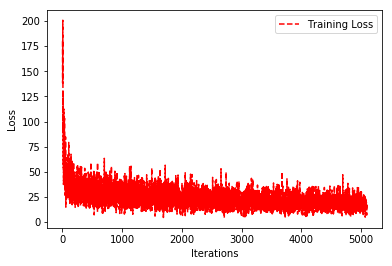

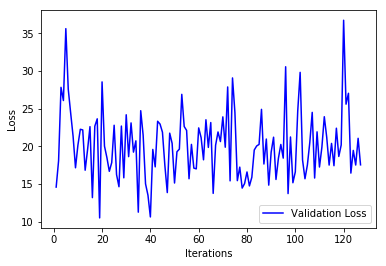

validation loss
20.088513636352467


In [24]:
# Get training and validation loss histories

# Create count of the number of epochs
epoch_count = range(1, len(trn_losses) + 1)

# Visualize loss history
plt.plot(epoch_count, trn_losses, 'r--')

plt.legend(['Training Loss'])
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show();

epoch_count = range(1, len(val_losses) + 1)

# Visualize loss history
plt.plot(epoch_count, val_losses, 'b-')

plt.legend(['Validation Loss'])
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show();


print "validation loss"
print np.mean(val_losses)

In [25]:
# model save
# run validation accuracy
# train validation graph
# sparse optical flow
# images code made to run without commenting 
# last image regenerated to account for the pairs and last batch success


In [26]:
print "training loss"
print np.mean(trn_losses)

training loss
23.70710913621394
